# KE5105 - Building Electrical Consumption Forecasting

# Modelling 2 - Preliminary model

## Load libraries

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import os
import pickle
import pandas as pd
import numpy as np
import datetime
import myUtilities as mu

from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import TimeSeriesSplit

from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

Using TensorFlow backend.


## Load data for building AS5

In [2]:
as5 = mu.load_data_by_bldg(['AS5'], 'processed')

In [3]:
as5[0][1].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 62880 entries, 2015-06-01 00:00:00 to 2018-12-31 23:30:00
Data columns (total 17 columns):
PWMMainIC                         46164 non-null float64
PWMEXTAS4ExBldg                   46165 non-null float64
PWMAS4LanguageCenter              46165 non-null float64
PWMCANTEEN                        46164 non-null float64
PWMStreetLight                    46164 non-null float64
BTUAS5                            46175 non-null float64
PWMMainIC_30min_avg               46117 non-null float64
PWMEXTAS4ExBldg_30min_avg         46118 non-null float64
PWMAS4LanguageCenter_30min_avg    46118 non-null float64
PWMCANTEEN_30min_avg              46117 non-null float64
PWMStreetLight_30min_avg          46117 non-null float64
BTUAS5_30min_avg                  46129 non-null float64
PWM_sumadd                        46117 non-null float64
PWM_sumsubtract                   46117 non-null float64
PWM_30min_avg                     46117 non-null float64
B

## Split the data into train and test set

In [4]:
as5_train_df = as5[0][1].loc['2015-06-12 08:00:00':'2017-03-31 23:30:00', :]

In [5]:
as5_train_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31616 entries, 2015-06-12 08:00:00 to 2017-03-31 23:30:00
Data columns (total 17 columns):
PWMMainIC                         30018 non-null float64
PWMEXTAS4ExBldg                   30018 non-null float64
PWMAS4LanguageCenter              30018 non-null float64
PWMCANTEEN                        30018 non-null float64
PWMStreetLight                    30018 non-null float64
BTUAS5                            30029 non-null float64
PWMMainIC_30min_avg               29985 non-null float64
PWMEXTAS4ExBldg_30min_avg         29985 non-null float64
PWMAS4LanguageCenter_30min_avg    29985 non-null float64
PWMCANTEEN_30min_avg              29985 non-null float64
PWMStreetLight_30min_avg          29985 non-null float64
BTUAS5_30min_avg                  29998 non-null float64
PWM_sumadd                        29985 non-null float64
PWM_sumsubtract                   29985 non-null float64
PWM_30min_avg                     29985 non-null float64
B

In [6]:
as5_test_df = as5[0][1].loc['2018-01-01 00:00:00':, :]

In [7]:
as5_test_df.index.max()

Timestamp('2018-12-31 23:30:00')

In [8]:
as5_test_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17520 entries, 2018-01-01 00:00:00 to 2018-12-31 23:30:00
Data columns (total 17 columns):
PWMMainIC                         16145 non-null float64
PWMEXTAS4ExBldg                   16145 non-null float64
PWMAS4LanguageCenter              16145 non-null float64
PWMCANTEEN                        16145 non-null float64
PWMStreetLight                    16145 non-null float64
BTUAS5                            16144 non-null float64
PWMMainIC_30min_avg               16132 non-null float64
PWMEXTAS4ExBldg_30min_avg         16132 non-null float64
PWMAS4LanguageCenter_30min_avg    16132 non-null float64
PWMCANTEEN_30min_avg              16132 non-null float64
PWMStreetLight_30min_avg          16132 non-null float64
BTUAS5_30min_avg                  16130 non-null float64
PWM_sumadd                        16132 non-null float64
PWM_sumsubtract                   16132 non-null float64
PWM_30min_avg                     16132 non-null float64
B

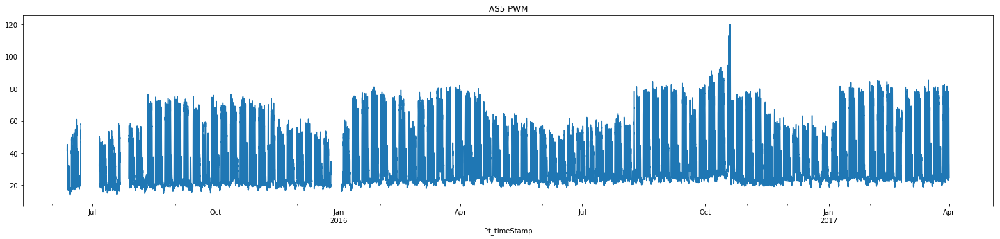

In [15]:
as5_train_df['PWM_30min_avg'].plot(figsize=(25, 5), title='AS5 PWM')

## Parameters for the RNN model

Also used for generating the datasets with the lagged values 

In [9]:
lookback = 240  # 5 days; each day has 48 observations
step = 1  # sampling rate used for the lookback period
delay = 0  # 1 step ahead prediction
batch_size = 128

## Calculate the MAE for a Simple Last Observation Carry Forward (LOCF) Model

In [10]:
len(as5_train_df)

31616

In [11]:
# Generators for the train and test sets.
gen_locf_train = mu.generator(as5_train_df['PWM_30min_avg'].values.reshape((-1, 1)),
                              lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_df)-1,
                              batch_size=batch_size, step=step)

In [12]:
train_steps = int(np.ceil((len(as5_train_df) - lookback - delay) / batch_size))
train_steps

246

In [13]:
# Calculate a simple baseline for model accuracy using MAE. Baseline model predicts label at t as label at t-1
# (LOCF last observation carry forward)
batch_maes = []
locf_preds = []

for a_step in range(train_steps):
    samples, targets = next(gen_locf_train)
    a_pred = samples[:, -1, 0]
    locf_preds.append(a_pred)
    mae = np.nanmean(np.abs(a_pred - targets))
    batch_maes.append(mae)
print('MAE = %f' % (np.nanmean(batch_maes)))


/home/tkokkeng/python/python367/tsfvenv/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.


MAE = 2.144081


In [14]:
locf_preds = np.concatenate(locf_preds)

## Normalise the training data

* Convert PWM and BTU values into the range 0 to 1
* Replace NaN with -1

In [16]:
# Create a transformation pipleline to prepare the training dataset for RNN.
attrbs = ['PWM_30min_avg', 'BTU_30min_avg']
my_pipeline = Pipeline([
    ('selector', mu.DataFrameSelector(attrbs)),
    ('minmax_scaler', MinMaxScaler()),
    ('na_transform', mu.Nan_to_Num_Transformer())
])

In [17]:
as5_train_data = my_pipeline.fit_transform(as5_train_df)
as5_train_data

array([[ 0.26254935,  0.56924225],
       [ 0.26724948,  0.53427896],
       [ 0.28031585,  0.53353241],
       ...,
       [ 0.12897161,  0.03222595],
       [ 0.10312089,  0.00348389],
       [-1.        , -1.        ]])

Text(0.5, 1.0, 'Normalised PWM Training Data')

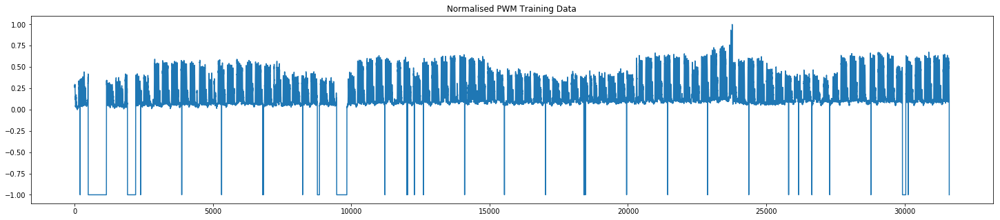

In [18]:
plt.figure(figsize=(25, 5))
plt.plot(range(as5_train_data.shape[0]), as5_train_data[:, 0])
plt.title('Normalised PWM Training Data')

Text(0.5, 1.0, 'Normalised BTU Training Data')

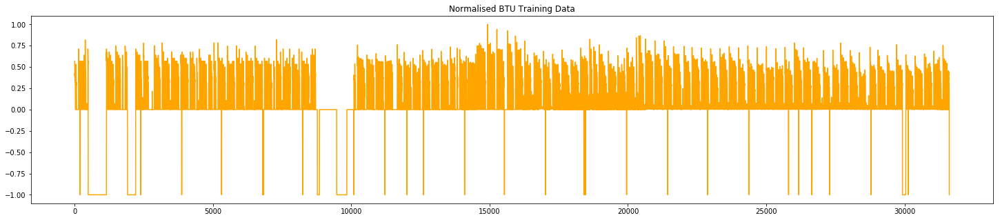

In [19]:
plt.figure(figsize=(25, 5))
plt.plot(range(as5_train_data.shape[0]), as5_train_data[:, 1], color='orange')
plt.title('Normalised BTU Training Data')

## Base RNN Model

Quick model training without validation

**This part needs to be fixed!!! Ignore results below.**

In [20]:
as5_train_data.shape

(31616, 2)

In [21]:
model = Sequential()
model.add(layers.GRU(16, input_shape=(None, as5_train_data.shape[-1])))
model.add(layers.Dense(1))
model.compile(optimizer=RMSprop(), loss='mae', metrics=['mape'])

In [22]:
gen_train = mu.generator(as5_train_data,
                         lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_data) - 1,
                         batch_size=batch_size, step=step)
t1 = datetime.datetime.now()
history = model.fit_generator(gen_train, steps_per_epoch=train_steps, epochs=20,
                              workers=0, use_multiprocessing=False)
print('\nTraining Duration = %s' % (datetime.datetime.now()-t1))

Epoch 1/20


  1/246 [..............................] - ETA: 7:11 - loss: 0.2595 - mean_absolute_percentage_error: 114.0364

  2/246 [..............................] - ETA: 4:00 - loss: 0.2122 - mean_absolute_percentage_error: 99.4727 

  3/246 [..............................] - ETA: 2:51 - loss: 0.5075 - mean_absolute_percentage_error: 102.9206

  4/246 [..............................] - ETA: 2:16 - loss: 0.6408 - mean_absolute_percentage_error: 103.2015

  5/246 [..............................] - ETA: 1:55 - loss: 0.7120 - mean_absolute_percentage_error: 102.4981

  6/246 [..............................] - ETA: 1:41 - loss: 0.7532 - mean_absolute_percentage_error: 101.4059

  7/246 [..............................] - ETA: 1:31 - loss: 0.7778 - mean_absolute_percentage_error: 100.1402

  8/246 [..............................] - ETA: 1:23 - loss: 0.7159 - mean_absolute_percentage_error: 100.3097

  9/246 [>.............................] - ETA: 1:17 - loss: 0.6529 - mean_absolute_percentage_error: 99.5622 

 10/246 [>.............................] - ETA: 1:12 - loss: 0.5989 - mean_absolute_percentage_error: 98.2788

 11/246 [>.............................] - ETA: 1:08 - loss: 0.5599 - mean_absolute_percentage_error: 96.6087

 12/246 [>.............................] - ETA: 1:05 - loss: 0.5213 - mean_absolute_percentage_error: 93.8879

 13/246 [>.............................] - ETA: 1:02 - loss: 0.4924 - mean_absolute_percentage_error: 91.1680

 14/246 [>.............................] - ETA: 1:00 - loss: 0.5185 - mean_absolute_percentage_error: 90.8829

 15/246 [>.............................] - ETA: 58s - loss: 0.5411 - mean_absolute_percentage_error: 90.5360 

 16/246 [>.............................] - ETA: 56s - loss: 0.5332 - mean_absolute_percentage_error: 89.6792

 17/246 [=>............................] - ETA: 54s - loss: 0.5109 - mean_absolute_percentage_error: 88.5476

 18/246 [=>............................] - ETA: 52s - loss: 0.4873 - mean_absolute_percentage_error: 86.2475

 19/246 [=>............................] - ETA: 51s - loss: 0.4689 - mean_absolute_percentage_error: 84.5886

 20/246 [=>............................] - ETA: 50s - loss: 0.4469 - mean_absolute_percentage_error: 82.0263

 21/246 [=>............................] - ETA: 49s - loss: 0.4301 - mean_absolute_percentage_error: 79.7679

 22/246 [=>............................] - ETA: 48s - loss: 0.4191 - mean_absolute_percentage_error: 78.5683

 23/246 [=>............................] - ETA: 47s - loss: 0.4040 - mean_absolute_percentage_error: 76.8944

 24/246 [=>............................] - ETA: 46s - loss: 0.3938 - mean_absolute_percentage_error: 75.5710

 25/246 [==>...........................] - ETA: 45s - loss: 0.3835 - mean_absolute_percentage_error: 74.3316

 26/246 [==>...........................] - ETA: 44s - loss: 0.3732 - mean_absolute_percentage_error: 73.7626

 27/246 [==>...........................] - ETA: 43s - loss: 0.3646 - mean_absolute_percentage_error: 72.6736

 28/246 [==>...........................] - ETA: 43s - loss: 0.3542 - mean_absolute_percentage_error: 71.5596

 29/246 [==>...........................] - ETA: 42s - loss: 0.3485 - mean_absolute_percentage_error: 70.9450

 30/246 [==>...........................] - ETA: 41s - loss: 0.3415 - mean_absolute_percentage_error: 70.0733

 31/246 [==>...........................] - ETA: 41s - loss: 0.3330 - mean_absolute_percentage_error: 69.1808

 32/246 [==>...........................] - ETA: 40s - loss: 0.3271 - mean_absolute_percentage_error: 68.5491

 33/246 [===>..........................] - ETA: 40s - loss: 0.3186 - mean_absolute_percentage_error: 68.4299

 34/246 [===>..........................] - ETA: 39s - loss: 0.3128 - mean_absolute_percentage_error: 68.0360

 35/246 [===>..........................] - ETA: 39s - loss: 0.3075 - mean_absolute_percentage_error: 67.4167

 36/246 [===>..........................] - ETA: 38s - loss: 0.3001 - mean_absolute_percentage_error: 66.8088

 37/246 [===>..........................] - ETA: 38s - loss: 0.2948 - mean_absolute_percentage_error: 66.0888

 38/246 [===>..........................] - ETA: 37s - loss: 0.2881 - mean_absolute_percentage_error: 65.0735

 39/246 [===>..........................] - ETA: 37s - loss: 0.2826 - mean_absolute_percentage_error: 64.8715

 40/246 [===>..........................] - ETA: 37s - loss: 0.2792 - mean_absolute_percentage_error: 64.4514

 41/246 [====>.........................] - ETA: 36s - loss: 0.2740 - mean_absolute_percentage_error: 64.2358

 42/246 [====>.........................] - ETA: 36s - loss: 0.2697 - mean_absolute_percentage_error: 63.6429

 43/246 [====>.........................] - ETA: 35s - loss: 0.2660 - mean_absolute_percentage_error: 63.1140

 44/246 [====>.........................] - ETA: 35s - loss: 0.2612 - mean_absolute_percentage_error: 62.5451

 45/246 [====>.........................] - ETA: 35s - loss: 0.2576 - mean_absolute_percentage_error: 61.8593

 46/246 [====>.........................] - ETA: 34s - loss: 0.2537 - mean_absolute_percentage_error: 61.2030

 47/246 [====>.........................] - ETA: 34s - loss: 0.2498 - mean_absolute_percentage_error: 60.7806

 48/246 [====>.........................] - ETA: 34s - loss: 0.2466 - mean_absolute_percentage_error: 60.4410

 49/246 [====>.........................] - ETA: 33s - loss: 0.2427 - mean_absolute_percentage_error: 60.3069

 50/246 [=====>........................] - ETA: 33s - loss: 0.2399 - mean_absolute_percentage_error: 59.9164

 51/246 [=====>........................] - ETA: 33s - loss: 0.2367 - mean_absolute_percentage_error: 59.6294

 52/246 [=====>........................] - ETA: 33s - loss: 0.2341 - mean_absolute_percentage_error: 60.0410

 53/246 [=====>........................] - ETA: 32s - loss: 0.2314 - mean_absolute_percentage_error: 59.7654

 54/246 [=====>........................] - ETA: 32s - loss: 0.2282 - mean_absolute_percentage_error: 59.4585

 55/246 [=====>........................] - ETA: 32s - loss: 0.2251 - mean_absolute_percentage_error: 59.1702

 56/246 [=====>........................] - ETA: 31s - loss: 0.2226 - mean_absolute_percentage_error: 58.7166

 57/246 [=====>........................] - ETA: 31s - loss: 0.2193 - mean_absolute_percentage_error: 58.3627

 58/246 [======>.......................] - ETA: 31s - loss: 0.2165 - mean_absolute_percentage_error: 57.9313

 59/246 [======>.......................] - ETA: 31s - loss: 0.2136 - mean_absolute_percentage_error: 57.4832

 60/246 [======>.......................] - ETA: 30s - loss: 0.2105 - mean_absolute_percentage_error: 56.9846

 61/246 [======>.......................] - ETA: 30s - loss: 0.2080 - mean_absolute_percentage_error: 56.5169

 62/246 [======>.......................] - ETA: 30s - loss: 0.2052 - mean_absolute_percentage_error: 56.0619

 63/246 [======>.......................] - ETA: 30s - loss: 0.2030 - mean_absolute_percentage_error: 55.7418

 64/246 [======>.......................] - ETA: 29s - loss: 0.2005 - mean_absolute_percentage_error: 55.3180

 65/246 [======>.......................] - ETA: 29s - loss: 0.1979 - mean_absolute_percentage_error: 54.9336

 66/246 [=======>......................] - ETA: 29s - loss: 0.1955 - mean_absolute_percentage_error: 54.4470

 67/246 [=======>......................] - ETA: 29s - loss: 0.1950 - mean_absolute_percentage_error: 54.0603

 68/246 [=======>......................] - ETA: 29s - loss: 0.1941 - mean_absolute_percentage_error: 54.2762

 69/246 [=======>......................] - ETA: 29s - loss: 0.1920 - mean_absolute_percentage_error: 53.8343

 70/246 [=======>......................] - ETA: 29s - loss: 0.1897 - mean_absolute_percentage_error: 53.4275

 71/246 [=======>......................] - ETA: 29s - loss: 0.1878 - mean_absolute_percentage_error: 53.0433

 72/246 [=======>......................] - ETA: 29s - loss: 0.1856 - mean_absolute_percentage_error: 52.6970

 73/246 [=======>......................] - ETA: 29s - loss: 0.1861 - mean_absolute_percentage_error: 52.3016

 74/246 [========>.....................] - ETA: 28s - loss: 0.1855 - mean_absolute_percentage_error: 51.7935

 75/246 [========>.....................] - ETA: 28s - loss: 0.1841 - mean_absolute_percentage_error: 51.2099

 76/246 [========>.....................] - ETA: 28s - loss: 0.1828 - mean_absolute_percentage_error: 52.3836

 77/246 [========>.....................] - ETA: 28s - loss: 0.1812 - mean_absolute_percentage_error: 52.0344

 78/246 [========>.....................] - ETA: 28s - loss: 0.1794 - mean_absolute_percentage_error: 51.8604

 79/246 [========>.....................] - ETA: 27s - loss: 0.1782 - mean_absolute_percentage_error: 51.7520

 80/246 [========>.....................] - ETA: 27s - loss: 0.1767 - mean_absolute_percentage_error: 51.5682

 81/246 [========>.....................] - ETA: 27s - loss: 0.1750 - mean_absolute_percentage_error: 51.3301

 82/246 [=========>....................] - ETA: 27s - loss: 0.1737 - mean_absolute_percentage_error: 51.1495

 83/246 [=========>....................] - ETA: 27s - loss: 0.1721 - mean_absolute_percentage_error: 50.8700

 84/246 [=========>....................] - ETA: 26s - loss: 0.1707 - mean_absolute_percentage_error: 50.6421

 85/246 [=========>....................] - ETA: 26s - loss: 0.1695 - mean_absolute_percentage_error: 50.4593

 86/246 [=========>....................] - ETA: 26s - loss: 0.1682 - mean_absolute_percentage_error: 50.3685

 87/246 [=========>....................] - ETA: 26s - loss: 0.1670 - mean_absolute_percentage_error: 50.1739

 88/246 [=========>....................] - ETA: 26s - loss: 0.1658 - mean_absolute_percentage_error: 49.9895

 89/246 [=========>....................] - ETA: 25s - loss: 0.1641 - mean_absolute_percentage_error: 49.6132

 90/246 [=========>....................] - ETA: 25s - loss: 0.1628 - mean_absolute_percentage_error: 49.3853

 91/246 [==========>...................] - ETA: 25s - loss: 0.1614 - mean_absolute_percentage_error: 49.0983

 92/246 [==========>...................] - ETA: 25s - loss: 0.1609 - mean_absolute_percentage_error: 48.9327

 93/246 [==========>...................] - ETA: 25s - loss: 0.1600 - mean_absolute_percentage_error: 48.8568

 94/246 [==========>...................] - ETA: 24s - loss: 0.1586 - mean_absolute_percentage_error: 48.5425

 95/246 [==========>...................] - ETA: 24s - loss: 0.1579 - mean_absolute_percentage_error: 48.4121

 96/246 [==========>...................] - ETA: 24s - loss: 0.1567 - mean_absolute_percentage_error: 48.2327

 97/246 [==========>...................] - ETA: 24s - loss: 0.1558 - mean_absolute_percentage_error: 48.1309

 98/246 [==========>...................] - ETA: 24s - loss: 0.1547 - mean_absolute_percentage_error: 47.8949

 99/246 [===========>..................] - ETA: 23s - loss: 0.1535 - mean_absolute_percentage_error: 47.7090

100/246 [===========>..................] - ETA: 23s - loss: 0.1525 - mean_absolute_percentage_error: 47.5006

101/246 [===========>..................] - ETA: 23s - loss: 0.1515 - mean_absolute_percentage_error: 47.3020

102/246 [===========>..................] - ETA: 23s - loss: 0.1503 - mean_absolute_percentage_error: 47.0376

103/246 [===========>..................] - ETA: 23s - loss: 0.1495 - mean_absolute_percentage_error: 46.8174

104/246 [===========>..................] - ETA: 22s - loss: 0.1484 - mean_absolute_percentage_error: 46.6042

105/246 [===========>..................] - ETA: 22s - loss: 0.1474 - mean_absolute_percentage_error: 46.3914

106/246 [===========>..................] - ETA: 22s - loss: 0.1465 - mean_absolute_percentage_error: 46.1740

107/246 [============>.................] - ETA: 22s - loss: 0.1454 - mean_absolute_percentage_error: 45.9009

108/246 [============>.................] - ETA: 22s - loss: 0.1446 - mean_absolute_percentage_error: 45.7542

109/246 [============>.................] - ETA: 22s - loss: 0.1441 - mean_absolute_percentage_error: 45.7111

110/246 [============>.................] - ETA: 21s - loss: 0.1432 - mean_absolute_percentage_error: 45.5470

111/246 [============>.................] - ETA: 21s - loss: 0.1424 - mean_absolute_percentage_error: 45.3690

112/246 [============>.................] - ETA: 21s - loss: 0.1416 - mean_absolute_percentage_error: 45.2470

113/246 [============>.................] - ETA: 21s - loss: 0.1408 - mean_absolute_percentage_error: 45.0510

114/246 [============>.................] - ETA: 21s - loss: 0.1400 - mean_absolute_percentage_error: 44.8630

115/246 [=============>................] - ETA: 20s - loss: 0.1391 - mean_absolute_percentage_error: 44.6743

116/246 [=============>................] - ETA: 20s - loss: 0.1383 - mean_absolute_percentage_error: 44.4639

117/246 [=============>................] - ETA: 20s - loss: 0.1374 - mean_absolute_percentage_error: 44.2561

118/246 [=============>................] - ETA: 20s - loss: 0.1366 - mean_absolute_percentage_error: 44.0350

119/246 [=============>................] - ETA: 20s - loss: 0.1357 - mean_absolute_percentage_error: 43.8288

120/246 [=============>................] - ETA: 20s - loss: 0.1350 - mean_absolute_percentage_error: 43.7882

121/246 [=============>................] - ETA: 19s - loss: 0.1342 - mean_absolute_percentage_error: 43.6026

122/246 [=============>................] - ETA: 19s - loss: 0.1334 - mean_absolute_percentage_error: 43.4059

123/246 [==============>...............] - ETA: 19s - loss: 0.1325 - mean_absolute_percentage_error: 43.1997

124/246 [==============>...............] - ETA: 19s - loss: 0.1318 - mean_absolute_percentage_error: 43.0467

125/246 [==============>...............] - ETA: 19s - loss: 0.1309 - mean_absolute_percentage_error: 42.8563

126/246 [==============>...............] - ETA: 18s - loss: 0.1301 - mean_absolute_percentage_error: 42.6355

127/246 [==============>...............] - ETA: 18s - loss: 0.1294 - mean_absolute_percentage_error: 42.4422

128/246 [==============>...............] - ETA: 18s - loss: 0.1285 - mean_absolute_percentage_error: 42.2028

129/246 [==============>...............] - ETA: 18s - loss: 0.1278 - mean_absolute_percentage_error: 42.0220

130/246 [==============>...............] - ETA: 18s - loss: 0.1270 - mean_absolute_percentage_error: 41.8584

131/246 [==============>...............] - ETA: 18s - loss: 0.1263 - mean_absolute_percentage_error: 41.6519

132/246 [===============>..............] - ETA: 17s - loss: 0.1257 - mean_absolute_percentage_error: 41.5585

133/246 [===============>..............] - ETA: 17s - loss: 0.1249 - mean_absolute_percentage_error: 41.4160

134/246 [===============>..............] - ETA: 17s - loss: 0.1242 - mean_absolute_percentage_error: 41.2259

135/246 [===============>..............] - ETA: 17s - loss: 0.1235 - mean_absolute_percentage_error: 41.0729

136/246 [===============>..............] - ETA: 17s - loss: 0.1228 - mean_absolute_percentage_error: 40.8928

137/246 [===============>..............] - ETA: 17s - loss: 0.1221 - mean_absolute_percentage_error: 40.7117

138/246 [===============>..............] - ETA: 16s - loss: 0.1214 - mean_absolute_percentage_error: 40.5389

139/246 [===============>..............] - ETA: 16s - loss: 0.1207 - mean_absolute_percentage_error: 40.3478

140/246 [================>.............] - ETA: 16s - loss: 0.1200 - mean_absolute_percentage_error: 40.1577

141/246 [================>.............] - ETA: 16s - loss: 0.1193 - mean_absolute_percentage_error: 40.0314

142/246 [================>.............] - ETA: 16s - loss: 0.1190 - mean_absolute_percentage_error: 39.8632

143/246 [================>.............] - ETA: 16s - loss: 0.1188 - mean_absolute_percentage_error: 39.8941

144/246 [================>.............] - ETA: 15s - loss: 0.1181 - mean_absolute_percentage_error: 39.7301

145/246 [================>.............] - ETA: 15s - loss: 0.1175 - mean_absolute_percentage_error: 39.5572

146/246 [================>.............] - ETA: 15s - loss: 0.1168 - mean_absolute_percentage_error: 39.3826

147/246 [================>.............] - ETA: 15s - loss: 0.1162 - mean_absolute_percentage_error: 39.2160

148/246 [=================>............] - ETA: 15s - loss: 0.1157 - mean_absolute_percentage_error: 39.0486

149/246 [=================>............] - ETA: 15s - loss: 0.1150 - mean_absolute_percentage_error: 38.8893

150/246 [=================>............] - ETA: 14s - loss: 0.1145 - mean_absolute_percentage_error: 38.7347

151/246 [=================>............] - ETA: 14s - loss: 0.1139 - mean_absolute_percentage_error: 38.5754

152/246 [=================>............] - ETA: 14s - loss: 0.1133 - mean_absolute_percentage_error: 38.4162

153/246 [=================>............] - ETA: 14s - loss: 0.1128 - mean_absolute_percentage_error: 38.2753

154/246 [=================>............] - ETA: 14s - loss: 0.1123 - mean_absolute_percentage_error: 38.1329

155/246 [=================>............] - ETA: 14s - loss: 0.1119 - mean_absolute_percentage_error: 38.0737

156/246 [==================>...........] - ETA: 13s - loss: 0.1114 - mean_absolute_percentage_error: 37.9477

157/246 [==================>...........] - ETA: 13s - loss: 0.1108 - mean_absolute_percentage_error: 37.8051

158/246 [==================>...........] - ETA: 13s - loss: 0.1104 - mean_absolute_percentage_error: 37.6758

159/246 [==================>...........] - ETA: 13s - loss: 0.1099 - mean_absolute_percentage_error: 37.5725

160/246 [==================>...........] - ETA: 13s - loss: 0.1095 - mean_absolute_percentage_error: 37.4375

161/246 [==================>...........] - ETA: 13s - loss: 0.1091 - mean_absolute_percentage_error: 37.3151

162/246 [==================>...........] - ETA: 12s - loss: 0.1086 - mean_absolute_percentage_error: 37.2349

163/246 [==================>...........] - ETA: 12s - loss: 0.1083 - mean_absolute_percentage_error: 37.1228

164/246 [===================>..........] - ETA: 12s - loss: 0.1079 - mean_absolute_percentage_error: 37.0153

165/246 [===================>..........] - ETA: 12s - loss: 0.1074 - mean_absolute_percentage_error: 36.9038

166/246 [===================>..........] - ETA: 12s - loss: 0.1072 - mean_absolute_percentage_error: 36.8687

167/246 [===================>..........] - ETA: 12s - loss: 0.1068 - mean_absolute_percentage_error: 36.7497

168/246 [===================>..........] - ETA: 11s - loss: 0.1064 - mean_absolute_percentage_error: 36.6295

169/246 [===================>..........] - ETA: 11s - loss: 0.1060 - mean_absolute_percentage_error: 36.5261

170/246 [===================>..........] - ETA: 11s - loss: 0.1055 - mean_absolute_percentage_error: 36.3982

171/246 [===================>..........] - ETA: 11s - loss: 0.1051 - mean_absolute_percentage_error: 36.2819

172/246 [===================>..........] - ETA: 11s - loss: 0.1047 - mean_absolute_percentage_error: 36.1734

173/246 [====================>.........] - ETA: 11s - loss: 0.1043 - mean_absolute_percentage_error: 36.0394

174/246 [====================>.........] - ETA: 11s - loss: 0.1039 - mean_absolute_percentage_error: 35.9395

175/246 [====================>.........] - ETA: 10s - loss: 0.1034 - mean_absolute_percentage_error: 35.8178

176/246 [====================>.........] - ETA: 10s - loss: 0.1031 - mean_absolute_percentage_error: 35.7156

177/246 [====================>.........] - ETA: 10s - loss: 0.1029 - mean_absolute_percentage_error: 35.6960

178/246 [====================>.........] - ETA: 10s - loss: 0.1025 - mean_absolute_percentage_error: 35.5691

179/246 [====================>.........] - ETA: 10s - loss: 0.1022 - mean_absolute_percentage_error: 35.4684

180/246 [====================>.........] - ETA: 10s - loss: 0.1019 - mean_absolute_percentage_error: 35.3755

181/246 [=====================>........] - ETA: 9s - loss: 0.1015 - mean_absolute_percentage_error: 35.2576 

182/246 [=====================>........] - ETA: 9s - loss: 0.1012 - mean_absolute_percentage_error: 35.1439

183/246 [=====================>........] - ETA: 9s - loss: 0.1008 - mean_absolute_percentage_error: 35.0561

184/246 [=====================>........] - ETA: 9s - loss: 0.1007 - mean_absolute_percentage_error: 34.9709

185/246 [=====================>........] - ETA: 9s - loss: 0.1004 - mean_absolute_percentage_error: 34.8897

186/246 [=====================>........] - ETA: 9s - loss: 0.0999 - mean_absolute_percentage_error: 34.7740

187/246 [=====================>........] - ETA: 8s - loss: 0.0996 - mean_absolute_percentage_error: 34.6872

188/246 [=====================>........] - ETA: 8s - loss: 0.0992 - mean_absolute_percentage_error: 34.6019

189/246 [======================>.......] - ETA: 8s - loss: 0.0990 - mean_absolute_percentage_error: 34.5898

190/246 [======================>.......] - ETA: 8s - loss: 0.0987 - mean_absolute_percentage_error: 34.5112

191/246 [======================>.......] - ETA: 8s - loss: 0.0983 - mean_absolute_percentage_error: 34.4147

192/246 [======================>.......] - ETA: 8s - loss: 0.0979 - mean_absolute_percentage_error: 34.3355

193/246 [======================>.......] - ETA: 8s - loss: 0.0976 - mean_absolute_percentage_error: 34.2533

194/246 [======================>.......] - ETA: 7s - loss: 0.0972 - mean_absolute_percentage_error: 34.1451

195/246 [======================>.......] - ETA: 7s - loss: 0.0969 - mean_absolute_percentage_error: 34.0685

196/246 [======================>.......] - ETA: 7s - loss: 0.0965 - mean_absolute_percentage_error: 33.9681

197/246 [=======================>......] - ETA: 7s - loss: 0.0961 - mean_absolute_percentage_error: 33.8764

198/246 [=======================>......] - ETA: 7s - loss: 0.0958 - mean_absolute_percentage_error: 33.7842

199/246 [=======================>......] - ETA: 7s - loss: 0.0954 - mean_absolute_percentage_error: 33.6799

200/246 [=======================>......] - ETA: 6s - loss: 0.0952 - mean_absolute_percentage_error: 33.6576

201/246 [=======================>......] - ETA: 6s - loss: 0.0949 - mean_absolute_percentage_error: 33.5632

202/246 [=======================>......] - ETA: 6s - loss: 0.0945 - mean_absolute_percentage_error: 33.4600

203/246 [=======================>......] - ETA: 6s - loss: 0.0944 - mean_absolute_percentage_error: 33.4036

204/246 [=======================>......] - ETA: 6s - loss: 0.0940 - mean_absolute_percentage_error: 33.2989

205/246 [========================>.....] - ETA: 6s - loss: 0.0937 - mean_absolute_percentage_error: 33.1951

206/246 [========================>.....] - ETA: 6s - loss: 0.0933 - mean_absolute_percentage_error: 33.0856

207/246 [========================>.....] - ETA: 5s - loss: 0.0932 - mean_absolute_percentage_error: 33.1453

208/246 [========================>.....] - ETA: 5s - loss: 0.0928 - mean_absolute_percentage_error: 33.0383

209/246 [========================>.....] - ETA: 5s - loss: 0.0925 - mean_absolute_percentage_error: 32.9508

210/246 [========================>.....] - ETA: 5s - loss: 0.0921 - mean_absolute_percentage_error: 32.8481

211/246 [========================>.....] - ETA: 5s - loss: 0.0918 - mean_absolute_percentage_error: 32.7432

212/246 [========================>.....] - ETA: 5s - loss: 0.0915 - mean_absolute_percentage_error: 32.7310

213/246 [========================>.....] - ETA: 4s - loss: 0.0912 - mean_absolute_percentage_error: 32.6430

214/246 [=========================>....] - ETA: 4s - loss: 0.0909 - mean_absolute_percentage_error: 32.5487

215/246 [=========================>....] - ETA: 4s - loss: 0.0906 - mean_absolute_percentage_error: 32.4664

216/246 [=========================>....] - ETA: 4s - loss: 0.0904 - mean_absolute_percentage_error: 32.3799

217/246 [=========================>....] - ETA: 4s - loss: 0.0901 - mean_absolute_percentage_error: 32.3275

218/246 [=========================>....] - ETA: 4s - loss: 0.0898 - mean_absolute_percentage_error: 32.2397

219/246 [=========================>....] - ETA: 4s - loss: 0.0896 - mean_absolute_percentage_error: 32.1536

220/246 [=========================>....] - ETA: 3s - loss: 0.0893 - mean_absolute_percentage_error: 32.0678

221/246 [=========================>....] - ETA: 3s - loss: 0.0890 - mean_absolute_percentage_error: 31.9802

222/246 [==========================>...] - ETA: 3s - loss: 0.0887 - mean_absolute_percentage_error: 31.9076

223/246 [==========================>...] - ETA: 3s - loss: 0.0884 - mean_absolute_percentage_error: 31.8200

224/246 [==========================>...] - ETA: 3s - loss: 0.0883 - mean_absolute_percentage_error: 31.7999

225/246 [==========================>...] - ETA: 3s - loss: 0.0880 - mean_absolute_percentage_error: 31.7401

226/246 [==========================>...] - ETA: 3s - loss: 0.0878 - mean_absolute_percentage_error: 31.6619

227/246 [==========================>...] - ETA: 2s - loss: 0.0875 - mean_absolute_percentage_error: 31.5770

228/246 [==========================>...] - ETA: 2s - loss: 0.0872 - mean_absolute_percentage_error: 31.4884

229/246 [==========================>...] - ETA: 2s - loss: 0.0870 - mean_absolute_percentage_error: 31.4089

230/246 [===========================>..] - ETA: 2s - loss: 0.0867 - mean_absolute_percentage_error: 31.3398

231/246 [===========================>..] - ETA: 2s - loss: 0.0865 - mean_absolute_percentage_error: 31.2596

232/246 [===========================>..] - ETA: 2s - loss: 0.0863 - mean_absolute_percentage_error: 31.1818

233/246 [===========================>..] - ETA: 1s - loss: 0.0865 - mean_absolute_percentage_error: 31.1519

234/246 [===========================>..] - ETA: 1s - loss: 0.0864 - mean_absolute_percentage_error: 31.1561

235/246 [===========================>..] - ETA: 1s - loss: 0.0861 - mean_absolute_percentage_error: 31.0829

236/246 [===========================>..] - ETA: 1s - loss: 0.0858 - mean_absolute_percentage_error: 31.0030

237/246 [===========================>..] - ETA: 1s - loss: 0.0856 - mean_absolute_percentage_error: 30.9319

238/246 [============================>.] - ETA: 1s - loss: 0.0853 - mean_absolute_percentage_error: 30.8575

239/246 [============================>.] - ETA: 1s - loss: 0.0851 - mean_absolute_percentage_error: 30.7847

240/246 [============================>.] - ETA: 0s - loss: 0.0849 - mean_absolute_percentage_error: 30.7173

241/246 [============================>.] - ETA: 0s - loss: 0.0847 - mean_absolute_percentage_error: 30.6455

242/246 [============================>.] - ETA: 0s - loss: 0.0844 - mean_absolute_percentage_error: 30.5739

243/246 [============================>.] - ETA: 0s - loss: 0.0842 - mean_absolute_percentage_error: 30.5096

244/246 [============================>.] - ETA: 0s - loss: 0.0840 - mean_absolute_percentage_error: 30.4410

245/246 [============================>.] - ETA: 0s - loss: 0.0838 - mean_absolute_percentage_error: 30.3663

246/246 [==============================] - 37s 149ms/step - loss: 0.0839 - mean_absolute_percentage_error: 30.3513


Epoch 2/20


  1/246 [..............................] - ETA: 35s - loss: 0.0264 - mean_absolute_percentage_error: 15.6688

  2/246 [..............................] - ETA: 34s - loss: 0.0337 - mean_absolute_percentage_error: 16.8324

  3/246 [..............................] - ETA: 34s - loss: 0.0626 - mean_absolute_percentage_error: 15.2339

  4/246 [..............................] - ETA: 34s - loss: 0.0577 - mean_absolute_percentage_error: 12.5023

  5/246 [..............................] - ETA: 33s - loss: 0.0504 - mean_absolute_percentage_error: 10.4225

  6/246 [..............................] - ETA: 33s - loss: 0.0478 - mean_absolute_percentage_error: 9.2650 

  7/246 [..............................] - ETA: 33s - loss: 0.0430 - mean_absolute_percentage_error: 8.1472

  8/246 [..............................] - ETA: 33s - loss: 0.0448 - mean_absolute_percentage_error: 11.0489

  9/246 [>.............................] - ETA: 33s - loss: 0.0432 - mean_absolute_percentage_error: 12.6780

 10/246 [>.............................] - ETA: 33s - loss: 0.0414 - mean_absolute_percentage_error: 14.0563

 11/246 [>.............................] - ETA: 33s - loss: 0.0406 - mean_absolute_percentage_error: 14.7666

 12/246 [>.............................] - ETA: 32s - loss: 0.0399 - mean_absolute_percentage_error: 16.4032

 13/246 [>.............................] - ETA: 32s - loss: 0.0389 - mean_absolute_percentage_error: 16.8917

 14/246 [>.............................] - ETA: 32s - loss: 0.0411 - mean_absolute_percentage_error: 16.2538

 15/246 [>.............................] - ETA: 32s - loss: 0.0388 - mean_absolute_percentage_error: 15.2121

 16/246 [>.............................] - ETA: 32s - loss: 0.0400 - mean_absolute_percentage_error: 16.0937

 17/246 [=>............................] - ETA: 32s - loss: 0.0411 - mean_absolute_percentage_error: 17.7407

 18/246 [=>............................] - ETA: 32s - loss: 0.0402 - mean_absolute_percentage_error: 18.2374

 19/246 [=>............................] - ETA: 31s - loss: 0.0397 - mean_absolute_percentage_error: 18.3440

 20/246 [=>............................] - ETA: 31s - loss: 0.0387 - mean_absolute_percentage_error: 18.8598

 21/246 [=>............................] - ETA: 31s - loss: 0.0379 - mean_absolute_percentage_error: 18.7834

 22/246 [=>............................] - ETA: 31s - loss: 0.0379 - mean_absolute_percentage_error: 18.8435

 23/246 [=>............................] - ETA: 31s - loss: 0.0371 - mean_absolute_percentage_error: 18.8774

 24/246 [=>............................] - ETA: 31s - loss: 0.0371 - mean_absolute_percentage_error: 18.9084

 25/246 [==>...........................] - ETA: 30s - loss: 0.0368 - mean_absolute_percentage_error: 18.8993

 26/246 [==>...........................] - ETA: 30s - loss: 0.0362 - mean_absolute_percentage_error: 18.8959

 27/246 [==>...........................] - ETA: 30s - loss: 0.0360 - mean_absolute_percentage_error: 18.8621

 28/246 [==>...........................] - ETA: 30s - loss: 0.0354 - mean_absolute_percentage_error: 18.8298

 29/246 [==>...........................] - ETA: 30s - loss: 0.0362 - mean_absolute_percentage_error: 19.5564

 30/246 [==>...........................] - ETA: 30s - loss: 0.0359 - mean_absolute_percentage_error: 19.4773

 31/246 [==>...........................] - ETA: 30s - loss: 0.0354 - mean_absolute_percentage_error: 19.4097

 32/246 [==>...........................] - ETA: 29s - loss: 0.0352 - mean_absolute_percentage_error: 19.3292

 33/246 [===>..........................] - ETA: 29s - loss: 0.0348 - mean_absolute_percentage_error: 19.4930

 34/246 [===>..........................] - ETA: 29s - loss: 0.0345 - mean_absolute_percentage_error: 19.3573

 35/246 [===>..........................] - ETA: 29s - loss: 0.0342 - mean_absolute_percentage_error: 19.2178

 36/246 [===>..........................] - ETA: 29s - loss: 0.0338 - mean_absolute_percentage_error: 19.2547

 37/246 [===>..........................] - ETA: 29s - loss: 0.0336 - mean_absolute_percentage_error: 19.1099

 38/246 [===>..........................] - ETA: 29s - loss: 0.0332 - mean_absolute_percentage_error: 19.0220

 39/246 [===>..........................] - ETA: 28s - loss: 0.0329 - mean_absolute_percentage_error: 19.0052

 40/246 [===>..........................] - ETA: 28s - loss: 0.0334 - mean_absolute_percentage_error: 19.4003

 41/246 [====>.........................] - ETA: 28s - loss: 0.0331 - mean_absolute_percentage_error: 19.3919

 42/246 [====>.........................] - ETA: 28s - loss: 0.0329 - mean_absolute_percentage_error: 19.2763

 43/246 [====>.........................] - ETA: 28s - loss: 0.0327 - mean_absolute_percentage_error: 19.1458

 44/246 [====>.........................] - ETA: 28s - loss: 0.0324 - mean_absolute_percentage_error: 19.0624

 45/246 [====>.........................] - ETA: 28s - loss: 0.0323 - mean_absolute_percentage_error: 18.9620

 46/246 [====>.........................] - ETA: 27s - loss: 0.0321 - mean_absolute_percentage_error: 18.8006

 47/246 [====>.........................] - ETA: 27s - loss: 0.0317 - mean_absolute_percentage_error: 18.6427

 48/246 [====>.........................] - ETA: 27s - loss: 0.0317 - mean_absolute_percentage_error: 18.5846

 49/246 [====>.........................] - ETA: 27s - loss: 0.0314 - mean_absolute_percentage_error: 18.5915

 50/246 [=====>........................] - ETA: 27s - loss: 0.0314 - mean_absolute_percentage_error: 18.5148

 51/246 [=====>........................] - ETA: 27s - loss: 0.0313 - mean_absolute_percentage_error: 18.4735

 52/246 [=====>........................] - ETA: 27s - loss: 0.0321 - mean_absolute_percentage_error: 19.7774

 53/246 [=====>........................] - ETA: 27s - loss: 0.0321 - mean_absolute_percentage_error: 19.7212

 54/246 [=====>........................] - ETA: 26s - loss: 0.0319 - mean_absolute_percentage_error: 19.6724

 55/246 [=====>........................] - ETA: 26s - loss: 0.0317 - mean_absolute_percentage_error: 19.6575

 56/246 [=====>........................] - ETA: 26s - loss: 0.0316 - mean_absolute_percentage_error: 19.5373

 57/246 [=====>........................] - ETA: 26s - loss: 0.0314 - mean_absolute_percentage_error: 19.5179

 58/246 [======>.......................] - ETA: 26s - loss: 0.0313 - mean_absolute_percentage_error: 19.4146

 59/246 [======>.......................] - ETA: 26s - loss: 0.0311 - mean_absolute_percentage_error: 19.3065

 60/246 [======>.......................] - ETA: 26s - loss: 0.0308 - mean_absolute_percentage_error: 19.2308

 61/246 [======>.......................] - ETA: 25s - loss: 0.0307 - mean_absolute_percentage_error: 19.1152

 62/246 [======>.......................] - ETA: 25s - loss: 0.0305 - mean_absolute_percentage_error: 19.0769

 63/246 [======>.......................] - ETA: 25s - loss: 0.0307 - mean_absolute_percentage_error: 19.2635

 64/246 [======>.......................] - ETA: 25s - loss: 0.0306 - mean_absolute_percentage_error: 19.1536

 65/246 [======>.......................] - ETA: 25s - loss: 0.0303 - mean_absolute_percentage_error: 19.0771

 66/246 [=======>......................] - ETA: 25s - loss: 0.0302 - mean_absolute_percentage_error: 18.9955

 67/246 [=======>......................] - ETA: 25s - loss: 0.0307 - mean_absolute_percentage_error: 18.9136

 68/246 [=======>......................] - ETA: 24s - loss: 0.0308 - mean_absolute_percentage_error: 19.3956

 69/246 [=======>......................] - ETA: 24s - loss: 0.0307 - mean_absolute_percentage_error: 19.3153

 70/246 [=======>......................] - ETA: 24s - loss: 0.0304 - mean_absolute_percentage_error: 19.2260

 71/246 [=======>......................] - ETA: 24s - loss: 0.0303 - mean_absolute_percentage_error: 19.1543

 72/246 [=======>......................] - ETA: 24s - loss: 0.0301 - mean_absolute_percentage_error: 19.1186

 73/246 [=======>......................] - ETA: 24s - loss: 0.0304 - mean_absolute_percentage_error: 18.9378

 74/246 [========>.....................] - ETA: 24s - loss: 0.0307 - mean_absolute_percentage_error: 18.7587

 75/246 [========>.....................] - ETA: 23s - loss: 0.0305 - mean_absolute_percentage_error: 18.5286

 76/246 [========>.....................] - ETA: 23s - loss: 0.0306 - mean_absolute_percentage_error: 19.3410

 77/246 [========>.....................] - ETA: 23s - loss: 0.0305 - mean_absolute_percentage_error: 19.2569

 78/246 [========>.....................] - ETA: 23s - loss: 0.0303 - mean_absolute_percentage_error: 19.2675

 79/246 [========>.....................] - ETA: 23s - loss: 0.0303 - mean_absolute_percentage_error: 19.1923

 80/246 [========>.....................] - ETA: 23s - loss: 0.0302 - mean_absolute_percentage_error: 19.1272

 81/246 [========>.....................] - ETA: 23s - loss: 0.0301 - mean_absolute_percentage_error: 19.0445

 82/246 [=========>....................] - ETA: 22s - loss: 0.0300 - mean_absolute_percentage_error: 18.9692

 83/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.8936

 84/246 [=========>....................] - ETA: 22s - loss: 0.0298 - mean_absolute_percentage_error: 18.8240

 85/246 [=========>....................] - ETA: 22s - loss: 0.0298 - mean_absolute_percentage_error: 18.7495

 86/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.8896

 87/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.8188

 88/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.7621

 89/246 [=========>....................] - ETA: 21s - loss: 0.0296 - mean_absolute_percentage_error: 18.6752

 90/246 [=========>....................] - ETA: 21s - loss: 0.0296 - mean_absolute_percentage_error: 18.6231

 91/246 [==========>...................] - ETA: 21s - loss: 0.0294 - mean_absolute_percentage_error: 18.5549

 92/246 [==========>...................] - ETA: 21s - loss: 0.0299 - mean_absolute_percentage_error: 18.5407

 93/246 [==========>...................] - ETA: 21s - loss: 0.0301 - mean_absolute_percentage_error: 18.6599

 94/246 [==========>...................] - ETA: 21s - loss: 0.0300 - mean_absolute_percentage_error: 18.5776

 95/246 [==========>...................] - ETA: 21s - loss: 0.0302 - mean_absolute_percentage_error: 18.6569

 96/246 [==========>...................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.5902

 97/246 [==========>...................] - ETA: 20s - loss: 0.0303 - mean_absolute_percentage_error: 18.6614

 98/246 [==========>...................] - ETA: 20s - loss: 0.0303 - mean_absolute_percentage_error: 18.5866

 99/246 [===========>..................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.5750

100/246 [===========>..................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.5113

101/246 [===========>..................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.4572

102/246 [===========>..................] - ETA: 20s - loss: 0.0299 - mean_absolute_percentage_error: 18.3864

103/246 [===========>..................] - ETA: 19s - loss: 0.0299 - mean_absolute_percentage_error: 18.3050

104/246 [===========>..................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.2664

105/246 [===========>..................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.2069

106/246 [===========>..................] - ETA: 19s - loss: 0.0297 - mean_absolute_percentage_error: 18.1312

107/246 [============>.................] - ETA: 19s - loss: 0.0296 - mean_absolute_percentage_error: 18.0496

108/246 [============>.................] - ETA: 19s - loss: 0.0296 - mean_absolute_percentage_error: 17.9934

109/246 [============>.................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.0810

110/246 [============>.................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.0291

111/246 [============>.................] - ETA: 18s - loss: 0.0297 - mean_absolute_percentage_error: 17.9626

112/246 [============>.................] - ETA: 18s - loss: 0.0296 - mean_absolute_percentage_error: 17.9326

113/246 [============>.................] - ETA: 18s - loss: 0.0297 - mean_absolute_percentage_error: 17.8899

114/246 [============>.................] - ETA: 18s - loss: 0.0297 - mean_absolute_percentage_error: 17.8347

115/246 [=============>................] - ETA: 18s - loss: 0.0296 - mean_absolute_percentage_error: 17.7865

116/246 [=============>................] - ETA: 18s - loss: 0.0295 - mean_absolute_percentage_error: 17.7349

117/246 [=============>................] - ETA: 18s - loss: 0.0295 - mean_absolute_percentage_error: 17.6818

118/246 [=============>................] - ETA: 17s - loss: 0.0294 - mean_absolute_percentage_error: 17.6122

119/246 [=============>................] - ETA: 17s - loss: 0.0293 - mean_absolute_percentage_error: 17.5528

120/246 [=============>................] - ETA: 17s - loss: 0.0294 - mean_absolute_percentage_error: 17.6857

121/246 [=============>................] - ETA: 17s - loss: 0.0294 - mean_absolute_percentage_error: 17.6466

122/246 [=============>................] - ETA: 17s - loss: 0.0293 - mean_absolute_percentage_error: 17.5930

123/246 [==============>...............] - ETA: 17s - loss: 0.0292 - mean_absolute_percentage_error: 17.5574

124/246 [==============>...............] - ETA: 17s - loss: 0.0291 - mean_absolute_percentage_error: 17.5085

125/246 [==============>...............] - ETA: 16s - loss: 0.0290 - mean_absolute_percentage_error: 17.4709

126/246 [==============>...............] - ETA: 16s - loss: 0.0290 - mean_absolute_percentage_error: 17.4086

127/246 [==============>...............] - ETA: 16s - loss: 0.0289 - mean_absolute_percentage_error: 17.3630

128/246 [==============>...............] - ETA: 16s - loss: 0.0288 - mean_absolute_percentage_error: 17.3209

129/246 [==============>...............] - ETA: 16s - loss: 0.0288 - mean_absolute_percentage_error: 17.2975

130/246 [==============>...............] - ETA: 16s - loss: 0.0287 - mean_absolute_percentage_error: 17.2721

131/246 [==============>...............] - ETA: 16s - loss: 0.0286 - mean_absolute_percentage_error: 17.2299

132/246 [===============>..............] - ETA: 15s - loss: 0.0288 - mean_absolute_percentage_error: 17.3048

133/246 [===============>..............] - ETA: 15s - loss: 0.0287 - mean_absolute_percentage_error: 17.2874

134/246 [===============>..............] - ETA: 15s - loss: 0.0286 - mean_absolute_percentage_error: 17.2385

135/246 [===============>..............] - ETA: 15s - loss: 0.0285 - mean_absolute_percentage_error: 17.2082

136/246 [===============>..............] - ETA: 15s - loss: 0.0285 - mean_absolute_percentage_error: 17.1812

137/246 [===============>..............] - ETA: 15s - loss: 0.0284 - mean_absolute_percentage_error: 17.1419

138/246 [===============>..............] - ETA: 15s - loss: 0.0283 - mean_absolute_percentage_error: 17.1065

139/246 [===============>..............] - ETA: 14s - loss: 0.0282 - mean_absolute_percentage_error: 17.0636

140/246 [================>.............] - ETA: 14s - loss: 0.0282 - mean_absolute_percentage_error: 17.0054

141/246 [================>.............] - ETA: 14s - loss: 0.0281 - mean_absolute_percentage_error: 16.9710

142/246 [================>.............] - ETA: 14s - loss: 0.0282 - mean_absolute_percentage_error: 16.9336

143/246 [================>.............] - ETA: 14s - loss: 0.0285 - mean_absolute_percentage_error: 17.1258

144/246 [================>.............] - ETA: 14s - loss: 0.0284 - mean_absolute_percentage_error: 17.0897

145/246 [================>.............] - ETA: 14s - loss: 0.0283 - mean_absolute_percentage_error: 17.0575

146/246 [================>.............] - ETA: 14s - loss: 0.0283 - mean_absolute_percentage_error: 17.0149

147/246 [================>.............] - ETA: 13s - loss: 0.0282 - mean_absolute_percentage_error: 16.9901

148/246 [=================>............] - ETA: 13s - loss: 0.0282 - mean_absolute_percentage_error: 16.9491

149/246 [=================>............] - ETA: 13s - loss: 0.0281 - mean_absolute_percentage_error: 16.9228

150/246 [=================>............] - ETA: 13s - loss: 0.0281 - mean_absolute_percentage_error: 16.8847

151/246 [=================>............] - ETA: 13s - loss: 0.0280 - mean_absolute_percentage_error: 16.8399

152/246 [=================>............] - ETA: 13s - loss: 0.0280 - mean_absolute_percentage_error: 16.8111

153/246 [=================>............] - ETA: 13s - loss: 0.0279 - mean_absolute_percentage_error: 16.7759

154/246 [=================>............] - ETA: 12s - loss: 0.0279 - mean_absolute_percentage_error: 16.7472

155/246 [=================>............] - ETA: 12s - loss: 0.0280 - mean_absolute_percentage_error: 16.8059

156/246 [==================>...........] - ETA: 12s - loss: 0.0280 - mean_absolute_percentage_error: 16.7752

157/246 [==================>...........] - ETA: 12s - loss: 0.0279 - mean_absolute_percentage_error: 16.7333

158/246 [==================>...........] - ETA: 12s - loss: 0.0279 - mean_absolute_percentage_error: 16.7075

159/246 [==================>...........] - ETA: 12s - loss: 0.0278 - mean_absolute_percentage_error: 16.6798

160/246 [==================>...........] - ETA: 12s - loss: 0.0278 - mean_absolute_percentage_error: 16.6427

161/246 [==================>...........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.6023

162/246 [==================>...........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.5766

163/246 [==================>...........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.5428

164/246 [===================>..........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.5125

165/246 [===================>..........] - ETA: 11s - loss: 0.0277 - mean_absolute_percentage_error: 16.4849

166/246 [===================>..........] - ETA: 11s - loss: 0.0279 - mean_absolute_percentage_error: 16.5221

167/246 [===================>..........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.4969

168/246 [===================>..........] - ETA: 10s - loss: 0.0278 - mean_absolute_percentage_error: 16.4642

169/246 [===================>..........] - ETA: 10s - loss: 0.0278 - mean_absolute_percentage_error: 16.4258

170/246 [===================>..........] - ETA: 10s - loss: 0.0277 - mean_absolute_percentage_error: 16.3953

171/246 [===================>..........] - ETA: 10s - loss: 0.0277 - mean_absolute_percentage_error: 16.3636

172/246 [===================>..........] - ETA: 10s - loss: 0.0277 - mean_absolute_percentage_error: 16.3314

173/246 [====================>.........] - ETA: 10s - loss: 0.0276 - mean_absolute_percentage_error: 16.2873

174/246 [====================>.........] - ETA: 10s - loss: 0.0276 - mean_absolute_percentage_error: 16.2563

175/246 [====================>.........] - ETA: 9s - loss: 0.0275 - mean_absolute_percentage_error: 16.2277 

176/246 [====================>.........] - ETA: 9s - loss: 0.0276 - mean_absolute_percentage_error: 16.2060

177/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.2638

178/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.2222

179/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.1880

180/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.1726

181/246 [=====================>........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.1344

182/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 16.0968

183/246 [=====================>........] - ETA: 8s - loss: 0.0276 - mean_absolute_percentage_error: 16.0744

184/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 16.0476

185/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 16.0299

186/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 15.9948

187/246 [=====================>........] - ETA: 8s - loss: 0.0276 - mean_absolute_percentage_error: 15.9690

188/246 [=====================>........] - ETA: 8s - loss: 0.0276 - mean_absolute_percentage_error: 15.9511

189/246 [======================>.......] - ETA: 7s - loss: 0.0277 - mean_absolute_percentage_error: 16.0218

190/246 [======================>.......] - ETA: 7s - loss: 0.0277 - mean_absolute_percentage_error: 16.0006

191/246 [======================>.......] - ETA: 7s - loss: 0.0276 - mean_absolute_percentage_error: 15.9869

192/246 [======================>.......] - ETA: 7s - loss: 0.0276 - mean_absolute_percentage_error: 15.9731

193/246 [======================>.......] - ETA: 7s - loss: 0.0276 - mean_absolute_percentage_error: 15.9527

194/246 [======================>.......] - ETA: 7s - loss: 0.0275 - mean_absolute_percentage_error: 15.9300

195/246 [======================>.......] - ETA: 7s - loss: 0.0275 - mean_absolute_percentage_error: 15.9128

196/246 [======================>.......] - ETA: 7s - loss: 0.0274 - mean_absolute_percentage_error: 15.8902

197/246 [=======================>......] - ETA: 6s - loss: 0.0274 - mean_absolute_percentage_error: 15.8721

198/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8510

199/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8214

200/246 [=======================>......] - ETA: 6s - loss: 0.0274 - mean_absolute_percentage_error: 15.8823

201/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8568

202/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8313

203/246 [=======================>......] - ETA: 6s - loss: 0.0274 - mean_absolute_percentage_error: 15.8385

204/246 [=======================>......] - ETA: 5s - loss: 0.0274 - mean_absolute_percentage_error: 15.8078

205/246 [========================>.....] - ETA: 5s - loss: 0.0273 - mean_absolute_percentage_error: 15.7730

206/246 [========================>.....] - ETA: 5s - loss: 0.0273 - mean_absolute_percentage_error: 15.7392

207/246 [========================>.....] - ETA: 5s - loss: 0.0274 - mean_absolute_percentage_error: 15.8909

208/246 [========================>.....] - ETA: 5s - loss: 0.0274 - mean_absolute_percentage_error: 15.8541

209/246 [========================>.....] - ETA: 5s - loss: 0.0273 - mean_absolute_percentage_error: 15.8293

210/246 [========================>.....] - ETA: 5s - loss: 0.0272 - mean_absolute_percentage_error: 15.8031

211/246 [========================>.....] - ETA: 4s - loss: 0.0272 - mean_absolute_percentage_error: 15.7657

212/246 [========================>.....] - ETA: 4s - loss: 0.0272 - mean_absolute_percentage_error: 15.8138

213/246 [========================>.....] - ETA: 4s - loss: 0.0272 - mean_absolute_percentage_error: 15.7896

214/246 [=========================>....] - ETA: 4s - loss: 0.0271 - mean_absolute_percentage_error: 15.7717

215/246 [=========================>....] - ETA: 4s - loss: 0.0271 - mean_absolute_percentage_error: 15.7520

216/246 [=========================>....] - ETA: 4s - loss: 0.0271 - mean_absolute_percentage_error: 15.7260

217/246 [=========================>....] - ETA: 4s - loss: 0.0270 - mean_absolute_percentage_error: 15.7056

218/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6793

219/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6578

220/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6295

221/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6000

222/246 [==========================>...] - ETA: 3s - loss: 0.0269 - mean_absolute_percentage_error: 15.5839

223/246 [==========================>...] - ETA: 3s - loss: 0.0269 - mean_absolute_percentage_error: 15.5614

224/246 [==========================>...] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6028

225/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.5937

226/246 [==========================>...] - ETA: 2s - loss: 0.0270 - mean_absolute_percentage_error: 15.5732

227/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.5457

228/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.5173

229/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.4940

230/246 [===========================>..] - ETA: 2s - loss: 0.0268 - mean_absolute_percentage_error: 15.4790

231/246 [===========================>..] - ETA: 2s - loss: 0.0268 - mean_absolute_percentage_error: 15.4580

232/246 [===========================>..] - ETA: 1s - loss: 0.0269 - mean_absolute_percentage_error: 15.4326

233/246 [===========================>..] - ETA: 1s - loss: 0.0269 - mean_absolute_percentage_error: 15.4395

234/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.5019

235/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.4857

236/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.4738

237/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.4572

238/246 [============================>.] - ETA: 1s - loss: 0.0269 - mean_absolute_percentage_error: 15.4376

239/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.4213

240/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.4038

241/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3869

242/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3652

243/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3487

244/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3321

245/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3097

246/246 [==============================] - 34s 140ms/step - loss: 0.0271 - mean_absolute_percentage_error: 15.3094


Epoch 3/20


  1/246 [..............................] - ETA: 34s - loss: 0.0233 - mean_absolute_percentage_error: 13.9852

  2/246 [..............................] - ETA: 34s - loss: 0.0278 - mean_absolute_percentage_error: 14.3012

  3/246 [..............................] - ETA: 34s - loss: 0.0250 - mean_absolute_percentage_error: 10.1846

  4/246 [..............................] - ETA: 33s - loss: 0.0361 - mean_absolute_percentage_error: 9.3662 

  5/246 [..............................] - ETA: 33s - loss: 0.0294 - mean_absolute_percentage_error: 7.5467

  6/246 [..............................] - ETA: 33s - loss: 0.0339 - mean_absolute_percentage_error: 7.2305

  7/246 [..............................] - ETA: 33s - loss: 0.0295 - mean_absolute_percentage_error: 6.2392

  8/246 [..............................] - ETA: 33s - loss: 0.0313 - mean_absolute_percentage_error: 8.3727

  9/246 [>.............................] - ETA: 33s - loss: 0.0302 - mean_absolute_percentage_error: 9.4476

 10/246 [>.............................] - ETA: 33s - loss: 0.0288 - mean_absolute_percentage_error: 10.4762

 11/246 [>.............................] - ETA: 33s - loss: 0.0284 - mean_absolute_percentage_error: 10.9060

 12/246 [>.............................] - ETA: 32s - loss: 0.0275 - mean_absolute_percentage_error: 12.1087

 13/246 [>.............................] - ETA: 32s - loss: 0.0271 - mean_absolute_percentage_error: 12.8726

 14/246 [>.............................] - ETA: 32s - loss: 0.0288 - mean_absolute_percentage_error: 12.3589

 15/246 [>.............................] - ETA: 32s - loss: 0.0277 - mean_absolute_percentage_error: 11.6141

 16/246 [>.............................] - ETA: 32s - loss: 0.0289 - mean_absolute_percentage_error: 12.2905

 17/246 [=>............................] - ETA: 32s - loss: 0.0300 - mean_absolute_percentage_error: 13.6925

 18/246 [=>............................] - ETA: 31s - loss: 0.0292 - mean_absolute_percentage_error: 13.7188

 19/246 [=>............................] - ETA: 31s - loss: 0.0288 - mean_absolute_percentage_error: 13.6561

 20/246 [=>............................] - ETA: 31s - loss: 0.0279 - mean_absolute_percentage_error: 13.9001

 21/246 [=>............................] - ETA: 31s - loss: 0.0274 - mean_absolute_percentage_error: 13.9322

 22/246 [=>............................] - ETA: 31s - loss: 0.0274 - mean_absolute_percentage_error: 13.9102

 23/246 [=>............................] - ETA: 31s - loss: 0.0269 - mean_absolute_percentage_error: 14.1313

 24/246 [=>............................] - ETA: 31s - loss: 0.0268 - mean_absolute_percentage_error: 14.1031

 25/246 [==>...........................] - ETA: 30s - loss: 0.0266 - mean_absolute_percentage_error: 14.0395

 26/246 [==>...........................] - ETA: 30s - loss: 0.0262 - mean_absolute_percentage_error: 14.1618

 27/246 [==>...........................] - ETA: 30s - loss: 0.0261 - mean_absolute_percentage_error: 14.0990

 28/246 [==>...........................] - ETA: 30s - loss: 0.0258 - mean_absolute_percentage_error: 14.2261

 29/246 [==>...........................] - ETA: 30s - loss: 0.0266 - mean_absolute_percentage_error: 15.0023

 30/246 [==>...........................] - ETA: 30s - loss: 0.0265 - mean_absolute_percentage_error: 14.9068

 31/246 [==>...........................] - ETA: 30s - loss: 0.0262 - mean_absolute_percentage_error: 14.9809

 32/246 [==>...........................] - ETA: 30s - loss: 0.0262 - mean_absolute_percentage_error: 14.9122

 33/246 [===>..........................] - ETA: 29s - loss: 0.0259 - mean_absolute_percentage_error: 15.1391

 34/246 [===>..........................] - ETA: 29s - loss: 0.0257 - mean_absolute_percentage_error: 15.0763

 35/246 [===>..........................] - ETA: 29s - loss: 0.0256 - mean_absolute_percentage_error: 14.9669

 36/246 [===>..........................] - ETA: 29s - loss: 0.0253 - mean_absolute_percentage_error: 14.9895

 37/246 [===>..........................] - ETA: 29s - loss: 0.0251 - mean_absolute_percentage_error: 14.8666

 38/246 [===>..........................] - ETA: 29s - loss: 0.0249 - mean_absolute_percentage_error: 14.7988

 39/246 [===>..........................] - ETA: 29s - loss: 0.0247 - mean_absolute_percentage_error: 14.8394

 40/246 [===>..........................] - ETA: 28s - loss: 0.0253 - mean_absolute_percentage_error: 15.2739

 41/246 [====>.........................] - ETA: 28s - loss: 0.0251 - mean_absolute_percentage_error: 15.3300

 42/246 [====>.........................] - ETA: 28s - loss: 0.0250 - mean_absolute_percentage_error: 15.2660

 43/246 [====>.........................] - ETA: 28s - loss: 0.0249 - mean_absolute_percentage_error: 15.1719

 44/246 [====>.........................] - ETA: 28s - loss: 0.0247 - mean_absolute_percentage_error: 15.1387

 45/246 [====>.........................] - ETA: 28s - loss: 0.0247 - mean_absolute_percentage_error: 15.0557

 46/246 [====>.........................] - ETA: 28s - loss: 0.0246 - mean_absolute_percentage_error: 14.9534

 47/246 [====>.........................] - ETA: 27s - loss: 0.0244 - mean_absolute_percentage_error: 14.8499

 48/246 [====>.........................] - ETA: 27s - loss: 0.0243 - mean_absolute_percentage_error: 14.7948

 49/246 [====>.........................] - ETA: 27s - loss: 0.0242 - mean_absolute_percentage_error: 14.8062

 50/246 [=====>........................] - ETA: 27s - loss: 0.0242 - mean_absolute_percentage_error: 14.7682

 51/246 [=====>........................] - ETA: 27s - loss: 0.0242 - mean_absolute_percentage_error: 14.7576

 52/246 [=====>........................] - ETA: 27s - loss: 0.0250 - mean_absolute_percentage_error: 16.0303

 53/246 [=====>........................] - ETA: 27s - loss: 0.0250 - mean_absolute_percentage_error: 15.9800

 54/246 [=====>........................] - ETA: 26s - loss: 0.0249 - mean_absolute_percentage_error: 15.9499

 55/246 [=====>........................] - ETA: 26s - loss: 0.0248 - mean_absolute_percentage_error: 15.9554

 56/246 [=====>........................] - ETA: 26s - loss: 0.0248 - mean_absolute_percentage_error: 15.8872

 57/246 [=====>........................] - ETA: 26s - loss: 0.0247 - mean_absolute_percentage_error: 15.9159

 58/246 [======>.......................] - ETA: 26s - loss: 0.0246 - mean_absolute_percentage_error: 15.8455

 59/246 [======>.......................] - ETA: 26s - loss: 0.0245 - mean_absolute_percentage_error: 15.7661

 60/246 [======>.......................] - ETA: 26s - loss: 0.0243 - mean_absolute_percentage_error: 15.7156

 61/246 [======>.......................] - ETA: 25s - loss: 0.0242 - mean_absolute_percentage_error: 15.6250

 62/246 [======>.......................] - ETA: 25s - loss: 0.0241 - mean_absolute_percentage_error: 15.5804

 63/246 [======>.......................] - ETA: 25s - loss: 0.0244 - mean_absolute_percentage_error: 15.8088

 64/246 [======>.......................] - ETA: 25s - loss: 0.0244 - mean_absolute_percentage_error: 15.7278

 65/246 [======>.......................] - ETA: 25s - loss: 0.0242 - mean_absolute_percentage_error: 15.6932

 66/246 [=======>......................] - ETA: 25s - loss: 0.0242 - mean_absolute_percentage_error: 15.6542

 67/246 [=======>......................] - ETA: 25s - loss: 0.0245 - mean_absolute_percentage_error: 15.5928

 68/246 [=======>......................] - ETA: 24s - loss: 0.0247 - mean_absolute_percentage_error: 16.1142

 69/246 [=======>......................] - ETA: 24s - loss: 0.0246 - mean_absolute_percentage_error: 16.0603

 70/246 [=======>......................] - ETA: 24s - loss: 0.0244 - mean_absolute_percentage_error: 16.0062

 71/246 [=======>......................] - ETA: 24s - loss: 0.0244 - mean_absolute_percentage_error: 15.9669

 72/246 [=======>......................] - ETA: 24s - loss: 0.0243 - mean_absolute_percentage_error: 15.9917

 73/246 [=======>......................] - ETA: 24s - loss: 0.0245 - mean_absolute_percentage_error: 15.8477

 74/246 [========>.....................] - ETA: 24s - loss: 0.0250 - mean_absolute_percentage_error: 15.7149

 75/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 15.5233

 76/246 [========>.....................] - ETA: 23s - loss: 0.0250 - mean_absolute_percentage_error: 16.4272

 77/246 [========>.....................] - ETA: 23s - loss: 0.0250 - mean_absolute_percentage_error: 16.3812

 78/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 16.3523

 79/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 16.2829

 80/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 16.2224

 81/246 [========>.....................] - ETA: 23s - loss: 0.0246 - mean_absolute_percentage_error: 16.1591

 82/246 [=========>....................] - ETA: 22s - loss: 0.0246 - mean_absolute_percentage_error: 16.0996

 83/246 [=========>....................] - ETA: 22s - loss: 0.0245 - mean_absolute_percentage_error: 16.0400

 84/246 [=========>....................] - ETA: 22s - loss: 0.0245 - mean_absolute_percentage_error: 15.9889

 85/246 [=========>....................] - ETA: 22s - loss: 0.0245 - mean_absolute_percentage_error: 15.9235

 86/246 [=========>....................] - ETA: 22s - loss: 0.0247 - mean_absolute_percentage_error: 16.0816

 87/246 [=========>....................] - ETA: 22s - loss: 0.0247 - mean_absolute_percentage_error: 16.0174

 88/246 [=========>....................] - ETA: 22s - loss: 0.0246 - mean_absolute_percentage_error: 15.9686

 89/246 [=========>....................] - ETA: 21s - loss: 0.0244 - mean_absolute_percentage_error: 15.8964

 90/246 [=========>....................] - ETA: 21s - loss: 0.0244 - mean_absolute_percentage_error: 15.8487

 91/246 [==========>...................] - ETA: 21s - loss: 0.0243 - mean_absolute_percentage_error: 15.7980

 92/246 [==========>...................] - ETA: 21s - loss: 0.0247 - mean_absolute_percentage_error: 15.7940

 93/246 [==========>...................] - ETA: 21s - loss: 0.0250 - mean_absolute_percentage_error: 15.9458

 94/246 [==========>...................] - ETA: 21s - loss: 0.0249 - mean_absolute_percentage_error: 15.8829

 95/246 [==========>...................] - ETA: 21s - loss: 0.0251 - mean_absolute_percentage_error: 15.9716

 96/246 [==========>...................] - ETA: 20s - loss: 0.0250 - mean_absolute_percentage_error: 15.9158

 97/246 [==========>...................] - ETA: 20s - loss: 0.0252 - mean_absolute_percentage_error: 16.0034

 98/246 [==========>...................] - ETA: 20s - loss: 0.0252 - mean_absolute_percentage_error: 15.9339

 99/246 [===========>..................] - ETA: 20s - loss: 0.0251 - mean_absolute_percentage_error: 15.9191

100/246 [===========>..................] - ETA: 20s - loss: 0.0251 - mean_absolute_percentage_error: 15.8613

101/246 [===========>..................] - ETA: 20s - loss: 0.0251 - mean_absolute_percentage_error: 15.8156

102/246 [===========>..................] - ETA: 20s - loss: 0.0250 - mean_absolute_percentage_error: 15.7649

103/246 [===========>..................] - ETA: 19s - loss: 0.0250 - mean_absolute_percentage_error: 15.6892

104/246 [===========>..................] - ETA: 19s - loss: 0.0249 - mean_absolute_percentage_error: 15.6597

105/246 [===========>..................] - ETA: 19s - loss: 0.0249 - mean_absolute_percentage_error: 15.6106

106/246 [===========>..................] - ETA: 19s - loss: 0.0248 - mean_absolute_percentage_error: 15.5495

107/246 [============>.................] - ETA: 19s - loss: 0.0247 - mean_absolute_percentage_error: 15.4849

108/246 [============>.................] - ETA: 19s - loss: 0.0247 - mean_absolute_percentage_error: 15.4295

109/246 [============>.................] - ETA: 19s - loss: 0.0250 - mean_absolute_percentage_error: 15.5224

110/246 [============>.................] - ETA: 19s - loss: 0.0249 - mean_absolute_percentage_error: 15.4740

111/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.4163

112/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.3840

113/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.3426

114/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.2996

115/246 [=============>................] - ETA: 18s - loss: 0.0248 - mean_absolute_percentage_error: 15.2590

116/246 [=============>................] - ETA: 18s - loss: 0.0248 - mean_absolute_percentage_error: 15.2059

117/246 [=============>................] - ETA: 18s - loss: 0.0247 - mean_absolute_percentage_error: 15.1647

118/246 [=============>................] - ETA: 17s - loss: 0.0247 - mean_absolute_percentage_error: 15.1090

119/246 [=============>................] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.0604

120/246 [=============>................] - ETA: 17s - loss: 0.0247 - mean_absolute_percentage_error: 15.1983

121/246 [=============>................] - ETA: 17s - loss: 0.0247 - mean_absolute_percentage_error: 15.1678

122/246 [=============>................] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.1282

123/246 [==============>...............] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.1061

124/246 [==============>...............] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.0707

125/246 [==============>...............] - ETA: 16s - loss: 0.0245 - mean_absolute_percentage_error: 15.0446

126/246 [==============>...............] - ETA: 16s - loss: 0.0244 - mean_absolute_percentage_error: 15.0017

127/246 [==============>...............] - ETA: 16s - loss: 0.0244 - mean_absolute_percentage_error: 14.9679

128/246 [==============>...............] - ETA: 16s - loss: 0.0243 - mean_absolute_percentage_error: 14.9300

129/246 [==============>...............] - ETA: 16s - loss: 0.0243 - mean_absolute_percentage_error: 14.9026

130/246 [==============>...............] - ETA: 16s - loss: 0.0243 - mean_absolute_percentage_error: 14.8872

131/246 [==============>...............] - ETA: 16s - loss: 0.0242 - mean_absolute_percentage_error: 14.8598

132/246 [===============>..............] - ETA: 15s - loss: 0.0244 - mean_absolute_percentage_error: 14.9462

133/246 [===============>..............] - ETA: 15s - loss: 0.0243 - mean_absolute_percentage_error: 14.9412

134/246 [===============>..............] - ETA: 15s - loss: 0.0243 - mean_absolute_percentage_error: 14.9065

135/246 [===============>..............] - ETA: 15s - loss: 0.0242 - mean_absolute_percentage_error: 14.8906

136/246 [===============>..............] - ETA: 15s - loss: 0.0242 - mean_absolute_percentage_error: 14.8783

137/246 [===============>..............] - ETA: 15s - loss: 0.0241 - mean_absolute_percentage_error: 14.8522

138/246 [===============>..............] - ETA: 15s - loss: 0.0241 - mean_absolute_percentage_error: 14.8273

139/246 [===============>..............] - ETA: 14s - loss: 0.0240 - mean_absolute_percentage_error: 14.7995

140/246 [================>.............] - ETA: 14s - loss: 0.0240 - mean_absolute_percentage_error: 14.7546

141/246 [================>.............] - ETA: 14s - loss: 0.0239 - mean_absolute_percentage_error: 14.7360

142/246 [================>.............] - ETA: 14s - loss: 0.0240 - mean_absolute_percentage_error: 14.7080

143/246 [================>.............] - ETA: 14s - loss: 0.0243 - mean_absolute_percentage_error: 14.9080

144/246 [================>.............] - ETA: 14s - loss: 0.0242 - mean_absolute_percentage_error: 14.8831

145/246 [================>.............] - ETA: 14s - loss: 0.0242 - mean_absolute_percentage_error: 14.8578

146/246 [================>.............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.8255

147/246 [================>.............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.8121

148/246 [=================>............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.7808

149/246 [=================>............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.7674

150/246 [=================>............] - ETA: 13s - loss: 0.0240 - mean_absolute_percentage_error: 14.7382

151/246 [=================>............] - ETA: 13s - loss: 0.0240 - mean_absolute_percentage_error: 14.7039

152/246 [=================>............] - ETA: 13s - loss: 0.0240 - mean_absolute_percentage_error: 14.6841

153/246 [=================>............] - ETA: 13s - loss: 0.0239 - mean_absolute_percentage_error: 14.6556

154/246 [=================>............] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.6273

155/246 [=================>............] - ETA: 12s - loss: 0.0240 - mean_absolute_percentage_error: 14.6862

156/246 [==================>...........] - ETA: 12s - loss: 0.0240 - mean_absolute_percentage_error: 14.6630

157/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.6324

158/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.6224

159/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.5903

160/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.5554

161/246 [==================>...........] - ETA: 11s - loss: 0.0239 - mean_absolute_percentage_error: 14.5187

162/246 [==================>...........] - ETA: 11s - loss: 0.0238 - mean_absolute_percentage_error: 14.4955

163/246 [==================>...........] - ETA: 11s - loss: 0.0238 - mean_absolute_percentage_error: 14.4657

164/246 [===================>..........] - ETA: 11s - loss: 0.0239 - mean_absolute_percentage_error: 14.4481

165/246 [===================>..........] - ETA: 11s - loss: 0.0238 - mean_absolute_percentage_error: 14.4246

166/246 [===================>..........] - ETA: 11s - loss: 0.0240 - mean_absolute_percentage_error: 14.4631

167/246 [===================>..........] - ETA: 11s - loss: 0.0239 - mean_absolute_percentage_error: 14.4331

168/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.4041

169/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.3752

170/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.3501

171/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.3227

172/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.2999

173/246 [====================>.........] - ETA: 10s - loss: 0.0238 - mean_absolute_percentage_error: 14.2649

174/246 [====================>.........] - ETA: 10s - loss: 0.0238 - mean_absolute_percentage_error: 14.2384

175/246 [====================>.........] - ETA: 9s - loss: 0.0238 - mean_absolute_percentage_error: 14.2234 

176/246 [====================>.........] - ETA: 9s - loss: 0.0238 - mean_absolute_percentage_error: 14.2098

177/246 [====================>.........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.2706

178/246 [====================>.........] - ETA: 9s - loss: 0.0239 - mean_absolute_percentage_error: 14.2389

179/246 [====================>.........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.2118

180/246 [====================>.........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.2022

181/246 [=====================>........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.1710

182/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.1394

183/246 [=====================>........] - ETA: 8s - loss: 0.0239 - mean_absolute_percentage_error: 14.1188

184/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0952

185/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0869

186/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0583

187/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0373

188/246 [=====================>........] - ETA: 8s - loss: 0.0239 - mean_absolute_percentage_error: 14.0245

189/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0980

190/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0778

191/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0707

192/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0591

193/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0465

194/246 [======================>.......] - ETA: 7s - loss: 0.0239 - mean_absolute_percentage_error: 14.0310

195/246 [======================>.......] - ETA: 7s - loss: 0.0239 - mean_absolute_percentage_error: 14.0191

196/246 [======================>.......] - ETA: 7s - loss: 0.0239 - mean_absolute_percentage_error: 14.0008

197/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9857

198/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9669

199/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9450

200/246 [=======================>......] - ETA: 6s - loss: 0.0239 - mean_absolute_percentage_error: 14.0072

201/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9938

202/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9756

203/246 [=======================>......] - ETA: 6s - loss: 0.0240 - mean_absolute_percentage_error: 13.9856

204/246 [=======================>......] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 13.9625

205/246 [========================>.....] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 13.9305

206/246 [========================>.....] - ETA: 5s - loss: 0.0238 - mean_absolute_percentage_error: 13.9019

207/246 [========================>.....] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 14.0552

208/246 [========================>.....] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 14.0255

209/246 [========================>.....] - ETA: 5s - loss: 0.0238 - mean_absolute_percentage_error: 14.0074

210/246 [========================>.....] - ETA: 5s - loss: 0.0238 - mean_absolute_percentage_error: 13.9895

211/246 [========================>.....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9586

212/246 [========================>.....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 14.0098

213/246 [========================>.....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9897

214/246 [=========================>....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9805

215/246 [=========================>....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9686

216/246 [=========================>....] - ETA: 4s - loss: 0.0237 - mean_absolute_percentage_error: 13.9480

217/246 [=========================>....] - ETA: 4s - loss: 0.0237 - mean_absolute_percentage_error: 13.9375

218/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.9181

219/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.9000

220/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.8786

221/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.8526

222/246 [==========================>...] - ETA: 3s - loss: 0.0236 - mean_absolute_percentage_error: 13.8399

223/246 [==========================>...] - ETA: 3s - loss: 0.0236 - mean_absolute_percentage_error: 13.8242

224/246 [==========================>...] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.8674

225/246 [==========================>...] - ETA: 2s - loss: 0.0237 - mean_absolute_percentage_error: 13.8623

226/246 [==========================>...] - ETA: 2s - loss: 0.0237 - mean_absolute_percentage_error: 13.8450

227/246 [==========================>...] - ETA: 2s - loss: 0.0237 - mean_absolute_percentage_error: 13.8238

228/246 [==========================>...] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.8003

229/246 [==========================>...] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.7812

230/246 [===========================>..] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.7699

231/246 [===========================>..] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.7543

232/246 [===========================>..] - ETA: 1s - loss: 0.0236 - mean_absolute_percentage_error: 13.7335

233/246 [===========================>..] - ETA: 1s - loss: 0.0237 - mean_absolute_percentage_error: 13.7458

234/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.8026

235/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7876

236/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7754

237/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7608

238/246 [============================>.] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7486

239/246 [============================>.] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 13.7364

240/246 [============================>.] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 13.7219

241/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.7117

242/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6936

243/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6826

244/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6713

245/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6531

246/246 [==============================] - 34s 140ms/step - loss: 0.0240 - mean_absolute_percentage_error: 13.6580


Epoch 4/20


  1/246 [..............................] - ETA: 35s - loss: 0.0222 - mean_absolute_percentage_error: 13.7360

  2/246 [..............................] - ETA: 34s - loss: 0.0265 - mean_absolute_percentage_error: 13.9420

  3/246 [..............................] - ETA: 34s - loss: 0.0195 - mean_absolute_percentage_error: 9.4800 

  4/246 [..............................] - ETA: 34s - loss: 0.0352 - mean_absolute_percentage_error: 9.1640

  5/246 [..............................] - ETA: 34s - loss: 0.0303 - mean_absolute_percentage_error: 7.5466

  6/246 [..............................] - ETA: 33s - loss: 0.0330 - mean_absolute_percentage_error: 7.0679

  7/246 [..............................] - ETA: 33s - loss: 0.0289 - mean_absolute_percentage_error: 6.1120

  8/246 [..............................] - ETA: 33s - loss: 0.0304 - mean_absolute_percentage_error: 8.1740

  9/246 [>.............................] - ETA: 33s - loss: 0.0293 - mean_absolute_percentage_error: 9.3551

 10/246 [>.............................] - ETA: 33s - loss: 0.0279 - mean_absolute_percentage_error: 10.4012

 11/246 [>.............................] - ETA: 33s - loss: 0.0275 - mean_absolute_percentage_error: 10.8066

 12/246 [>.............................] - ETA: 32s - loss: 0.0267 - mean_absolute_percentage_error: 11.9920

 13/246 [>.............................] - ETA: 32s - loss: 0.0262 - mean_absolute_percentage_error: 12.7306

 14/246 [>.............................] - ETA: 32s - loss: 0.0277 - mean_absolute_percentage_error: 12.1938

 15/246 [>.............................] - ETA: 32s - loss: 0.0268 - mean_absolute_percentage_error: 11.4790

 16/246 [>.............................] - ETA: 32s - loss: 0.0279 - mean_absolute_percentage_error: 12.1197

 17/246 [=>............................] - ETA: 32s - loss: 0.0290 - mean_absolute_percentage_error: 13.4403

 18/246 [=>............................] - ETA: 32s - loss: 0.0282 - mean_absolute_percentage_error: 13.4720

 19/246 [=>............................] - ETA: 31s - loss: 0.0278 - mean_absolute_percentage_error: 13.4002

 20/246 [=>............................] - ETA: 31s - loss: 0.0269 - mean_absolute_percentage_error: 13.6452

 21/246 [=>............................] - ETA: 31s - loss: 0.0265 - mean_absolute_percentage_error: 13.6690

 22/246 [=>............................] - ETA: 31s - loss: 0.0265 - mean_absolute_percentage_error: 13.6257

 23/246 [=>............................] - ETA: 31s - loss: 0.0260 - mean_absolute_percentage_error: 13.8196

 24/246 [=>............................] - ETA: 31s - loss: 0.0259 - mean_absolute_percentage_error: 13.7477

 25/246 [==>...........................] - ETA: 31s - loss: 0.0257 - mean_absolute_percentage_error: 13.6962

 26/246 [==>...........................] - ETA: 30s - loss: 0.0253 - mean_absolute_percentage_error: 13.8001

 27/246 [==>...........................] - ETA: 30s - loss: 0.0252 - mean_absolute_percentage_error: 13.7104

 28/246 [==>...........................] - ETA: 30s - loss: 0.0249 - mean_absolute_percentage_error: 13.8134

 29/246 [==>...........................] - ETA: 30s - loss: 0.0257 - mean_absolute_percentage_error: 14.5278

 30/246 [==>...........................] - ETA: 30s - loss: 0.0256 - mean_absolute_percentage_error: 14.4218

 31/246 [==>...........................] - ETA: 30s - loss: 0.0253 - mean_absolute_percentage_error: 14.4897

 32/246 [==>...........................] - ETA: 30s - loss: 0.0253 - mean_absolute_percentage_error: 14.4032

 33/246 [===>..........................] - ETA: 29s - loss: 0.0250 - mean_absolute_percentage_error: 14.6137

 34/246 [===>..........................] - ETA: 29s - loss: 0.0248 - mean_absolute_percentage_error: 14.5363

 35/246 [===>..........................] - ETA: 29s - loss: 0.0247 - mean_absolute_percentage_error: 14.4160

 36/246 [===>..........................] - ETA: 29s - loss: 0.0244 - mean_absolute_percentage_error: 14.4438

 37/246 [===>..........................] - ETA: 29s - loss: 0.0242 - mean_absolute_percentage_error: 14.3129

 38/246 [===>..........................] - ETA: 29s - loss: 0.0240 - mean_absolute_percentage_error: 14.2540

 39/246 [===>..........................] - ETA: 29s - loss: 0.0238 - mean_absolute_percentage_error: 14.2893

 40/246 [===>..........................] - ETA: 28s - loss: 0.0243 - mean_absolute_percentage_error: 14.6832

 41/246 [====>.........................] - ETA: 28s - loss: 0.0241 - mean_absolute_percentage_error: 14.7276

 42/246 [====>.........................] - ETA: 28s - loss: 0.0240 - mean_absolute_percentage_error: 14.6584

 43/246 [====>.........................] - ETA: 28s - loss: 0.0240 - mean_absolute_percentage_error: 14.5638

 44/246 [====>.........................] - ETA: 28s - loss: 0.0238 - mean_absolute_percentage_error: 14.5345

 45/246 [====>.........................] - ETA: 28s - loss: 0.0238 - mean_absolute_percentage_error: 14.4428

 46/246 [====>.........................] - ETA: 28s - loss: 0.0237 - mean_absolute_percentage_error: 14.3532

 47/246 [====>.........................] - ETA: 27s - loss: 0.0235 - mean_absolute_percentage_error: 14.2554

 48/246 [====>.........................] - ETA: 27s - loss: 0.0234 - mean_absolute_percentage_error: 14.1862

 49/246 [====>.........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.1898

 50/246 [=====>........................] - ETA: 27s - loss: 0.0233 - mean_absolute_percentage_error: 14.1436

 51/246 [=====>........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.1240

 52/246 [=====>........................] - ETA: 27s - loss: 0.0241 - mean_absolute_percentage_error: 15.3075

 53/246 [=====>........................] - ETA: 27s - loss: 0.0241 - mean_absolute_percentage_error: 15.2539

 54/246 [=====>........................] - ETA: 26s - loss: 0.0240 - mean_absolute_percentage_error: 15.2289

 55/246 [=====>........................] - ETA: 26s - loss: 0.0239 - mean_absolute_percentage_error: 15.2465

 56/246 [=====>........................] - ETA: 26s - loss: 0.0238 - mean_absolute_percentage_error: 15.1698

 57/246 [=====>........................] - ETA: 26s - loss: 0.0237 - mean_absolute_percentage_error: 15.2088

 58/246 [======>.......................] - ETA: 26s - loss: 0.0237 - mean_absolute_percentage_error: 15.1436

 59/246 [======>.......................] - ETA: 26s - loss: 0.0236 - mean_absolute_percentage_error: 15.0828

 60/246 [======>.......................] - ETA: 26s - loss: 0.0235 - mean_absolute_percentage_error: 15.0467

 61/246 [======>.......................] - ETA: 26s - loss: 0.0234 - mean_absolute_percentage_error: 14.9609

 62/246 [======>.......................] - ETA: 25s - loss: 0.0232 - mean_absolute_percentage_error: 14.9141

 63/246 [======>.......................] - ETA: 25s - loss: 0.0235 - mean_absolute_percentage_error: 15.1291

 64/246 [======>.......................] - ETA: 25s - loss: 0.0235 - mean_absolute_percentage_error: 15.0661

 65/246 [======>.......................] - ETA: 25s - loss: 0.0233 - mean_absolute_percentage_error: 15.0573

 66/246 [=======>......................] - ETA: 25s - loss: 0.0233 - mean_absolute_percentage_error: 15.0231

 67/246 [=======>......................] - ETA: 25s - loss: 0.0236 - mean_absolute_percentage_error: 14.9660

 68/246 [=======>......................] - ETA: 25s - loss: 0.0238 - mean_absolute_percentage_error: 15.4443

 69/246 [=======>......................] - ETA: 24s - loss: 0.0237 - mean_absolute_percentage_error: 15.3926

 70/246 [=======>......................] - ETA: 24s - loss: 0.0235 - mean_absolute_percentage_error: 15.3486

 71/246 [=======>......................] - ETA: 24s - loss: 0.0235 - mean_absolute_percentage_error: 15.3178

 72/246 [=======>......................] - ETA: 24s - loss: 0.0234 - mean_absolute_percentage_error: 15.3590

 73/246 [=======>......................] - ETA: 24s - loss: 0.0235 - mean_absolute_percentage_error: 15.2049

 74/246 [========>.....................] - ETA: 24s - loss: 0.0242 - mean_absolute_percentage_error: 15.0973

 75/246 [========>.....................] - ETA: 24s - loss: 0.0238 - mean_absolute_percentage_error: 14.8971

 76/246 [========>.....................] - ETA: 23s - loss: 0.0239 - mean_absolute_percentage_error: 15.6159

 77/246 [========>.....................] - ETA: 23s - loss: 0.0239 - mean_absolute_percentage_error: 15.5614

 78/246 [========>.....................] - ETA: 23s - loss: 0.0238 - mean_absolute_percentage_error: 15.5965

 79/246 [========>.....................] - ETA: 23s - loss: 0.0238 - mean_absolute_percentage_error: 15.5323

 80/246 [========>.....................] - ETA: 23s - loss: 0.0237 - mean_absolute_percentage_error: 15.4737

 81/246 [========>.....................] - ETA: 23s - loss: 0.0236 - mean_absolute_percentage_error: 15.4380

 82/246 [=========>....................] - ETA: 23s - loss: 0.0237 - mean_absolute_percentage_error: 15.3781

 83/246 [=========>....................] - ETA: 22s - loss: 0.0236 - mean_absolute_percentage_error: 15.3322

 84/246 [=========>....................] - ETA: 22s - loss: 0.0235 - mean_absolute_percentage_error: 15.2780

 85/246 [=========>....................] - ETA: 22s - loss: 0.0235 - mean_absolute_percentage_error: 15.2079

 86/246 [=========>....................] - ETA: 22s - loss: 0.0237 - mean_absolute_percentage_error: 15.3760

 87/246 [=========>....................] - ETA: 22s - loss: 0.0237 - mean_absolute_percentage_error: 15.3110

 88/246 [=========>....................] - ETA: 22s - loss: 0.0236 - mean_absolute_percentage_error: 15.2642

 89/246 [=========>....................] - ETA: 22s - loss: 0.0235 - mean_absolute_percentage_error: 15.2168

 90/246 [=========>....................] - ETA: 21s - loss: 0.0235 - mean_absolute_percentage_error: 15.1728

 91/246 [==========>...................] - ETA: 21s - loss: 0.0234 - mean_absolute_percentage_error: 15.1213

 92/246 [==========>...................] - ETA: 21s - loss: 0.0238 - mean_absolute_percentage_error: 15.1097

 93/246 [==========>...................] - ETA: 21s - loss: 0.0240 - mean_absolute_percentage_error: 15.2513

 94/246 [==========>...................] - ETA: 21s - loss: 0.0239 - mean_absolute_percentage_error: 15.2024

 95/246 [==========>...................] - ETA: 21s - loss: 0.0241 - mean_absolute_percentage_error: 15.2813

 96/246 [==========>...................] - ETA: 21s - loss: 0.0240 - mean_absolute_percentage_error: 15.2274

 97/246 [==========>...................] - ETA: 20s - loss: 0.0242 - mean_absolute_percentage_error: 15.3077

 98/246 [==========>...................] - ETA: 20s - loss: 0.0242 - mean_absolute_percentage_error: 15.2376

 99/246 [===========>..................] - ETA: 20s - loss: 0.0241 - mean_absolute_percentage_error: 15.2249

100/246 [===========>..................] - ETA: 20s - loss: 0.0241 - mean_absolute_percentage_error: 15.1644

101/246 [===========>..................] - ETA: 20s - loss: 0.0241 - mean_absolute_percentage_error: 15.1190

102/246 [===========>..................] - ETA: 20s - loss: 0.0240 - mean_absolute_percentage_error: 15.0734

103/246 [===========>..................] - ETA: 20s - loss: 0.0240 - mean_absolute_percentage_error: 15.0003

104/246 [===========>..................] - ETA: 19s - loss: 0.0239 - mean_absolute_percentage_error: 14.9699

105/246 [===========>..................] - ETA: 19s - loss: 0.0239 - mean_absolute_percentage_error: 14.9243

106/246 [===========>..................] - ETA: 19s - loss: 0.0238 - mean_absolute_percentage_error: 14.8601

107/246 [============>.................] - ETA: 19s - loss: 0.0237 - mean_absolute_percentage_error: 14.8031

108/246 [============>.................] - ETA: 19s - loss: 0.0237 - mean_absolute_percentage_error: 14.7479

109/246 [============>.................] - ETA: 19s - loss: 0.0240 - mean_absolute_percentage_error: 14.8349

110/246 [============>.................] - ETA: 19s - loss: 0.0239 - mean_absolute_percentage_error: 14.7903

111/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.7328

112/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.7105

113/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.6730

114/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.6331

115/246 [=============>................] - ETA: 18s - loss: 0.0238 - mean_absolute_percentage_error: 14.5985

116/246 [=============>................] - ETA: 18s - loss: 0.0238 - mean_absolute_percentage_error: 14.5471

117/246 [=============>................] - ETA: 18s - loss: 0.0237 - mean_absolute_percentage_error: 14.5047

118/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.4512

119/246 [=============>................] - ETA: 17s - loss: 0.0236 - mean_absolute_percentage_error: 14.4061

120/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.5381

121/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.5108

122/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.4761

123/246 [==============>...............] - ETA: 17s - loss: 0.0236 - mean_absolute_percentage_error: 14.4589

124/246 [==============>...............] - ETA: 17s - loss: 0.0236 - mean_absolute_percentage_error: 14.4280

125/246 [==============>...............] - ETA: 16s - loss: 0.0235 - mean_absolute_percentage_error: 14.4025

126/246 [==============>...............] - ETA: 16s - loss: 0.0235 - mean_absolute_percentage_error: 14.3644

127/246 [==============>...............] - ETA: 16s - loss: 0.0234 - mean_absolute_percentage_error: 14.3311

128/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2975

129/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2710

130/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2583

131/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2375

132/246 [===============>..............] - ETA: 15s - loss: 0.0234 - mean_absolute_percentage_error: 14.3211

133/246 [===============>..............] - ETA: 15s - loss: 0.0234 - mean_absolute_percentage_error: 14.3199

134/246 [===============>..............] - ETA: 15s - loss: 0.0233 - mean_absolute_percentage_error: 14.2882

135/246 [===============>..............] - ETA: 15s - loss: 0.0233 - mean_absolute_percentage_error: 14.2717

136/246 [===============>..............] - ETA: 15s - loss: 0.0232 - mean_absolute_percentage_error: 14.2632

137/246 [===============>..............] - ETA: 15s - loss: 0.0232 - mean_absolute_percentage_error: 14.2418

138/246 [===============>..............] - ETA: 15s - loss: 0.0231 - mean_absolute_percentage_error: 14.2196

139/246 [===============>..............] - ETA: 15s - loss: 0.0231 - mean_absolute_percentage_error: 14.1939

140/246 [================>.............] - ETA: 14s - loss: 0.0230 - mean_absolute_percentage_error: 14.1535

141/246 [================>.............] - ETA: 14s - loss: 0.0230 - mean_absolute_percentage_error: 14.1404

142/246 [================>.............] - ETA: 14s - loss: 0.0231 - mean_absolute_percentage_error: 14.1150

143/246 [================>.............] - ETA: 14s - loss: 0.0233 - mean_absolute_percentage_error: 14.3009

144/246 [================>.............] - ETA: 14s - loss: 0.0233 - mean_absolute_percentage_error: 14.2802

145/246 [================>.............] - ETA: 14s - loss: 0.0233 - mean_absolute_percentage_error: 14.2549

146/246 [================>.............] - ETA: 14s - loss: 0.0232 - mean_absolute_percentage_error: 14.2278

147/246 [================>.............] - ETA: 13s - loss: 0.0232 - mean_absolute_percentage_error: 14.2159

148/246 [=================>............] - ETA: 13s - loss: 0.0232 - mean_absolute_percentage_error: 14.1860

149/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1797

150/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1579

151/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1255

152/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1125

153/246 [=================>............] - ETA: 13s - loss: 0.0230 - mean_absolute_percentage_error: 14.0869

154/246 [=================>............] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0717

155/246 [=================>............] - ETA: 12s - loss: 0.0231 - mean_absolute_percentage_error: 14.1309

156/246 [==================>...........] - ETA: 12s - loss: 0.0231 - mean_absolute_percentage_error: 14.1136

157/246 [==================>...........] - ETA: 12s - loss: 0.0231 - mean_absolute_percentage_error: 14.0844

158/246 [==================>...........] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0690

159/246 [==================>...........] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0379

160/246 [==================>...........] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0054

161/246 [==================>...........] - ETA: 11s - loss: 0.0230 - mean_absolute_percentage_error: 13.9699

162/246 [==================>...........] - ETA: 11s - loss: 0.0229 - mean_absolute_percentage_error: 13.9546

163/246 [==================>...........] - ETA: 11s - loss: 0.0230 - mean_absolute_percentage_error: 13.9256

164/246 [===================>..........] - ETA: 11s - loss: 0.0230 - mean_absolute_percentage_error: 13.9044

165/246 [===================>..........] - ETA: 11s - loss: 0.0229 - mean_absolute_percentage_error: 13.8825

166/246 [===================>..........] - ETA: 11s - loss: 0.0231 - mean_absolute_percentage_error: 13.9175

167/246 [===================>..........] - ETA: 11s - loss: 0.0231 - mean_absolute_percentage_error: 13.8908

168/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.8654

169/246 [===================>..........] - ETA: 10s - loss: 0.0231 - mean_absolute_percentage_error: 13.8375

170/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.8158

171/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.7889

172/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.7654

173/246 [====================>.........] - ETA: 10s - loss: 0.0229 - mean_absolute_percentage_error: 13.7326

174/246 [====================>.........] - ETA: 10s - loss: 0.0229 - mean_absolute_percentage_error: 13.7083

175/246 [====================>.........] - ETA: 9s - loss: 0.0229 - mean_absolute_percentage_error: 13.6841 

176/246 [====================>.........] - ETA: 9s - loss: 0.0229 - mean_absolute_percentage_error: 13.6645

177/246 [====================>.........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.7237

178/246 [====================>.........] - ETA: 9s - loss: 0.0230 - mean_absolute_percentage_error: 13.6941

179/246 [====================>.........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.6648

180/246 [====================>.........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.6586

181/246 [=====================>........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.6303

182/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.6011

183/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5841

184/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5603

185/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5526

186/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5259

187/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5058

188/246 [=====================>........] - ETA: 8s - loss: 0.0230 - mean_absolute_percentage_error: 13.4955

189/246 [======================>.......] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5643

190/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5446

191/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5405

192/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5294

193/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5215

194/246 [======================>.......] - ETA: 7s - loss: 0.0230 - mean_absolute_percentage_error: 13.5090

195/246 [======================>.......] - ETA: 7s - loss: 0.0230 - mean_absolute_percentage_error: 13.4988

196/246 [======================>.......] - ETA: 7s - loss: 0.0230 - mean_absolute_percentage_error: 13.4828

197/246 [=======================>......] - ETA: 6s - loss: 0.0230 - mean_absolute_percentage_error: 13.4694

198/246 [=======================>......] - ETA: 6s - loss: 0.0229 - mean_absolute_percentage_error: 13.4520

199/246 [=======================>......] - ETA: 6s - loss: 0.0229 - mean_absolute_percentage_error: 13.4325

200/246 [=======================>......] - ETA: 6s - loss: 0.0230 - mean_absolute_percentage_error: 13.4891

201/246 [=======================>......] - ETA: 6s - loss: 0.0230 - mean_absolute_percentage_error: 13.4709

202/246 [=======================>......] - ETA: 6s - loss: 0.0229 - mean_absolute_percentage_error: 13.4520

203/246 [=======================>......] - ETA: 6s - loss: 0.0231 - mean_absolute_percentage_error: 13.4589

204/246 [=======================>......] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.4385

205/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.4085

206/246 [========================>.....] - ETA: 5s - loss: 0.0229 - mean_absolute_percentage_error: 13.3819

207/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.5349

208/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.5075

209/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.4945

210/246 [========================>.....] - ETA: 5s - loss: 0.0229 - mean_absolute_percentage_error: 13.4794

211/246 [========================>.....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4506

212/246 [========================>.....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.5013

213/246 [========================>.....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4804

214/246 [=========================>....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4752

215/246 [=========================>....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4659

216/246 [=========================>....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4472

217/246 [=========================>....] - ETA: 4s - loss: 0.0228 - mean_absolute_percentage_error: 13.4384

218/246 [=========================>....] - ETA: 3s - loss: 0.0229 - mean_absolute_percentage_error: 13.4200

219/246 [=========================>....] - ETA: 3s - loss: 0.0229 - mean_absolute_percentage_error: 13.4030

220/246 [=========================>....] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3834

221/246 [=========================>....] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3594

222/246 [==========================>...] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3493

223/246 [==========================>...] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3354

224/246 [==========================>...] - ETA: 3s - loss: 0.0229 - mean_absolute_percentage_error: 13.3767

225/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3716

226/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3548

227/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3351

228/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3136

229/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.2959

230/246 [===========================>..] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.2887

231/246 [===========================>..] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.2749

232/246 [===========================>..] - ETA: 1s - loss: 0.0228 - mean_absolute_percentage_error: 13.2558

233/246 [===========================>..] - ETA: 1s - loss: 0.0229 - mean_absolute_percentage_error: 13.2699

234/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.3209

235/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.3060

236/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.2933

237/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.2797

238/246 [============================>.] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.2691

239/246 [============================>.] - ETA: 0s - loss: 0.0230 - mean_absolute_percentage_error: 13.2580

240/246 [============================>.] - ETA: 0s - loss: 0.0230 - mean_absolute_percentage_error: 13.2441

241/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2357

242/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2186

243/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2097

244/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2000

245/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.1834

246/246 [==============================] - 35s 140ms/step - loss: 0.0232 - mean_absolute_percentage_error: 13.1901


Epoch 5/20


  1/246 [..............................] - ETA: 34s - loss: 0.0220 - mean_absolute_percentage_error: 13.9650

  2/246 [..............................] - ETA: 34s - loss: 0.0260 - mean_absolute_percentage_error: 14.0363

  3/246 [..............................] - ETA: 33s - loss: 0.0184 - mean_absolute_percentage_error: 9.4632 

  4/246 [..............................] - ETA: 33s - loss: 0.0343 - mean_absolute_percentage_error: 9.1472

  5/246 [..............................] - ETA: 33s - loss: 0.0301 - mean_absolute_percentage_error: 7.5863

  6/246 [..............................] - ETA: 33s - loss: 0.0321 - mean_absolute_percentage_error: 7.0222

  7/246 [..............................] - ETA: 33s - loss: 0.0285 - mean_absolute_percentage_error: 6.1153

  8/246 [..............................] - ETA: 33s - loss: 0.0298 - mean_absolute_percentage_error: 8.0534

  9/246 [>.............................] - ETA: 33s - loss: 0.0287 - mean_absolute_percentage_error: 9.2111

 10/246 [>.............................] - ETA: 33s - loss: 0.0274 - mean_absolute_percentage_error: 10.1500

 11/246 [>.............................] - ETA: 32s - loss: 0.0268 - mean_absolute_percentage_error: 10.5312

 12/246 [>.............................] - ETA: 32s - loss: 0.0260 - mean_absolute_percentage_error: 11.6740

 13/246 [>.............................] - ETA: 32s - loss: 0.0256 - mean_absolute_percentage_error: 12.4160

 14/246 [>.............................] - ETA: 32s - loss: 0.0268 - mean_absolute_percentage_error: 11.8642

 15/246 [>.............................] - ETA: 32s - loss: 0.0262 - mean_absolute_percentage_error: 11.1873

 16/246 [>.............................] - ETA: 32s - loss: 0.0270 - mean_absolute_percentage_error: 11.7937

 17/246 [=>............................] - ETA: 32s - loss: 0.0281 - mean_absolute_percentage_error: 13.0455

 18/246 [=>............................] - ETA: 31s - loss: 0.0273 - mean_absolute_percentage_error: 13.1041

 19/246 [=>............................] - ETA: 31s - loss: 0.0269 - mean_absolute_percentage_error: 13.0460

 20/246 [=>............................] - ETA: 31s - loss: 0.0261 - mean_absolute_percentage_error: 13.3042

 21/246 [=>............................] - ETA: 31s - loss: 0.0257 - mean_absolute_percentage_error: 13.3369

 22/246 [=>............................] - ETA: 31s - loss: 0.0257 - mean_absolute_percentage_error: 13.3068

 23/246 [=>............................] - ETA: 31s - loss: 0.0253 - mean_absolute_percentage_error: 13.4800

 24/246 [=>............................] - ETA: 31s - loss: 0.0251 - mean_absolute_percentage_error: 13.4068

 25/246 [==>...........................] - ETA: 31s - loss: 0.0249 - mean_absolute_percentage_error: 13.3720

 26/246 [==>...........................] - ETA: 30s - loss: 0.0246 - mean_absolute_percentage_error: 13.4828

 27/246 [==>...........................] - ETA: 30s - loss: 0.0245 - mean_absolute_percentage_error: 13.3979

 28/246 [==>...........................] - ETA: 30s - loss: 0.0242 - mean_absolute_percentage_error: 13.4862

 29/246 [==>...........................] - ETA: 30s - loss: 0.0250 - mean_absolute_percentage_error: 14.1481

 30/246 [==>...........................] - ETA: 30s - loss: 0.0249 - mean_absolute_percentage_error: 14.0538

 31/246 [==>...........................] - ETA: 30s - loss: 0.0246 - mean_absolute_percentage_error: 14.1129

 32/246 [==>...........................] - ETA: 29s - loss: 0.0246 - mean_absolute_percentage_error: 14.0252

 33/246 [===>..........................] - ETA: 29s - loss: 0.0243 - mean_absolute_percentage_error: 14.2367

 34/246 [===>..........................] - ETA: 29s - loss: 0.0241 - mean_absolute_percentage_error: 14.1673

 35/246 [===>..........................] - ETA: 29s - loss: 0.0240 - mean_absolute_percentage_error: 14.0503

 36/246 [===>..........................] - ETA: 29s - loss: 0.0237 - mean_absolute_percentage_error: 14.0735

 37/246 [===>..........................] - ETA: 29s - loss: 0.0236 - mean_absolute_percentage_error: 13.9499

 38/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.9026

 39/246 [===>..........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 13.9416

 40/246 [===>..........................] - ETA: 28s - loss: 0.0237 - mean_absolute_percentage_error: 14.3119

 41/246 [====>.........................] - ETA: 28s - loss: 0.0235 - mean_absolute_percentage_error: 14.3558

 42/246 [====>.........................] - ETA: 28s - loss: 0.0234 - mean_absolute_percentage_error: 14.2929

 43/246 [====>.........................] - ETA: 28s - loss: 0.0233 - mean_absolute_percentage_error: 14.1992

 44/246 [====>.........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 14.1709

 45/246 [====>.........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 14.0860

 46/246 [====>.........................] - ETA: 27s - loss: 0.0231 - mean_absolute_percentage_error: 14.0069

 47/246 [====>.........................] - ETA: 27s - loss: 0.0229 - mean_absolute_percentage_error: 13.9157

 48/246 [====>.........................] - ETA: 27s - loss: 0.0228 - mean_absolute_percentage_error: 13.8469

 49/246 [====>.........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.8628

 50/246 [=====>........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.8190

 51/246 [=====>........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.7999

 52/246 [=====>........................] - ETA: 27s - loss: 0.0235 - mean_absolute_percentage_error: 14.8982

 53/246 [=====>........................] - ETA: 27s - loss: 0.0235 - mean_absolute_percentage_error: 14.8567

 54/246 [=====>........................] - ETA: 26s - loss: 0.0234 - mean_absolute_percentage_error: 14.8408

 55/246 [=====>........................] - ETA: 26s - loss: 0.0233 - mean_absolute_percentage_error: 14.8642

 56/246 [=====>........................] - ETA: 26s - loss: 0.0233 - mean_absolute_percentage_error: 14.7854

 57/246 [=====>........................] - ETA: 26s - loss: 0.0232 - mean_absolute_percentage_error: 14.8260

 58/246 [======>.......................] - ETA: 26s - loss: 0.0231 - mean_absolute_percentage_error: 14.7678

 59/246 [======>.......................] - ETA: 26s - loss: 0.0231 - mean_absolute_percentage_error: 14.7127

 60/246 [======>.......................] - ETA: 26s - loss: 0.0229 - mean_absolute_percentage_error: 14.6781

 61/246 [======>.......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.5961

 62/246 [======>.......................] - ETA: 25s - loss: 0.0227 - mean_absolute_percentage_error: 14.5561

 63/246 [======>.......................] - ETA: 25s - loss: 0.0230 - mean_absolute_percentage_error: 14.7625

 64/246 [======>.......................] - ETA: 25s - loss: 0.0229 - mean_absolute_percentage_error: 14.7033

 65/246 [======>.......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.7014

 66/246 [=======>......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.6697

 67/246 [=======>......................] - ETA: 25s - loss: 0.0230 - mean_absolute_percentage_error: 14.6159

 68/246 [=======>......................] - ETA: 24s - loss: 0.0233 - mean_absolute_percentage_error: 15.0444

 69/246 [=======>......................] - ETA: 24s - loss: 0.0232 - mean_absolute_percentage_error: 14.9974

 70/246 [=======>......................] - ETA: 24s - loss: 0.0230 - mean_absolute_percentage_error: 14.9590

 71/246 [=======>......................] - ETA: 24s - loss: 0.0230 - mean_absolute_percentage_error: 14.9311

 72/246 [=======>......................] - ETA: 24s - loss: 0.0229 - mean_absolute_percentage_error: 14.9831

 73/246 [=======>......................] - ETA: 24s - loss: 0.0229 - mean_absolute_percentage_error: 14.8301

 74/246 [========>.....................] - ETA: 24s - loss: 0.0236 - mean_absolute_percentage_error: 14.7260

 75/246 [========>.....................] - ETA: 23s - loss: 0.0233 - mean_absolute_percentage_error: 14.5326

 76/246 [========>.....................] - ETA: 23s - loss: 0.0234 - mean_absolute_percentage_error: 15.1862

 77/246 [========>.....................] - ETA: 23s - loss: 0.0233 - mean_absolute_percentage_error: 15.1363

 78/246 [========>.....................] - ETA: 23s - loss: 0.0232 - mean_absolute_percentage_error: 15.1674

 79/246 [========>.....................] - ETA: 23s - loss: 0.0233 - mean_absolute_percentage_error: 15.1034

 80/246 [========>.....................] - ETA: 23s - loss: 0.0232 - mean_absolute_percentage_error: 15.0459

 81/246 [========>.....................] - ETA: 23s - loss: 0.0231 - mean_absolute_percentage_error: 15.0115

 82/246 [=========>....................] - ETA: 23s - loss: 0.0231 - mean_absolute_percentage_error: 14.9562

 83/246 [=========>....................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 14.9131

 84/246 [=========>....................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 14.8611

 85/246 [=========>....................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 14.7916

 86/246 [=========>....................] - ETA: 22s - loss: 0.0231 - mean_absolute_percentage_error: 14.9546

 87/246 [=========>....................] - ETA: 22s - loss: 0.0231 - mean_absolute_percentage_error: 14.8932

 88/246 [=========>....................] - ETA: 22s - loss: 0.0231 - mean_absolute_percentage_error: 14.8489

 89/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.8140

 90/246 [=========>....................] - ETA: 21s - loss: 0.0229 - mean_absolute_percentage_error: 14.7702

 91/246 [==========>...................] - ETA: 21s - loss: 0.0228 - mean_absolute_percentage_error: 14.7231

 92/246 [==========>...................] - ETA: 21s - loss: 0.0232 - mean_absolute_percentage_error: 14.7109

 93/246 [==========>...................] - ETA: 21s - loss: 0.0235 - mean_absolute_percentage_error: 14.8455

 94/246 [==========>...................] - ETA: 21s - loss: 0.0234 - mean_absolute_percentage_error: 14.8013

 95/246 [==========>...................] - ETA: 21s - loss: 0.0236 - mean_absolute_percentage_error: 14.8756

 96/246 [==========>...................] - ETA: 21s - loss: 0.0235 - mean_absolute_percentage_error: 14.8243

 97/246 [==========>...................] - ETA: 20s - loss: 0.0237 - mean_absolute_percentage_error: 14.9001

 98/246 [==========>...................] - ETA: 20s - loss: 0.0236 - mean_absolute_percentage_error: 14.8314

 99/246 [===========>..................] - ETA: 20s - loss: 0.0235 - mean_absolute_percentage_error: 14.8273

100/246 [===========>..................] - ETA: 20s - loss: 0.0236 - mean_absolute_percentage_error: 14.7694

101/246 [===========>..................] - ETA: 20s - loss: 0.0235 - mean_absolute_percentage_error: 14.7294

102/246 [===========>..................] - ETA: 20s - loss: 0.0234 - mean_absolute_percentage_error: 14.6880

103/246 [===========>..................] - ETA: 20s - loss: 0.0234 - mean_absolute_percentage_error: 14.6177

104/246 [===========>..................] - ETA: 19s - loss: 0.0234 - mean_absolute_percentage_error: 14.5873

105/246 [===========>..................] - ETA: 19s - loss: 0.0233 - mean_absolute_percentage_error: 14.5422

106/246 [===========>..................] - ETA: 19s - loss: 0.0233 - mean_absolute_percentage_error: 14.4792

107/246 [============>.................] - ETA: 19s - loss: 0.0232 - mean_absolute_percentage_error: 14.4260

108/246 [============>.................] - ETA: 19s - loss: 0.0232 - mean_absolute_percentage_error: 14.3727

109/246 [============>.................] - ETA: 19s - loss: 0.0234 - mean_absolute_percentage_error: 14.4506

110/246 [============>.................] - ETA: 19s - loss: 0.0234 - mean_absolute_percentage_error: 14.4103

111/246 [============>.................] - ETA: 18s - loss: 0.0234 - mean_absolute_percentage_error: 14.3546

112/246 [============>.................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.3333

113/246 [============>.................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.2940

114/246 [============>.................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.2542

115/246 [=============>................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.2230

116/246 [=============>................] - ETA: 18s - loss: 0.0232 - mean_absolute_percentage_error: 14.1742

117/246 [=============>................] - ETA: 18s - loss: 0.0232 - mean_absolute_percentage_error: 14.1343

118/246 [=============>................] - ETA: 17s - loss: 0.0231 - mean_absolute_percentage_error: 14.0834

119/246 [=============>................] - ETA: 17s - loss: 0.0231 - mean_absolute_percentage_error: 14.0403

120/246 [=============>................] - ETA: 17s - loss: 0.0232 - mean_absolute_percentage_error: 14.1682

121/246 [=============>................] - ETA: 17s - loss: 0.0232 - mean_absolute_percentage_error: 14.1438

122/246 [=============>................] - ETA: 17s - loss: 0.0231 - mean_absolute_percentage_error: 14.1078

123/246 [==============>...............] - ETA: 17s - loss: 0.0230 - mean_absolute_percentage_error: 14.0935

124/246 [==============>...............] - ETA: 17s - loss: 0.0230 - mean_absolute_percentage_error: 14.0674

125/246 [==============>...............] - ETA: 16s - loss: 0.0230 - mean_absolute_percentage_error: 14.0436

126/246 [==============>...............] - ETA: 16s - loss: 0.0229 - mean_absolute_percentage_error: 14.0085

127/246 [==============>...............] - ETA: 16s - loss: 0.0229 - mean_absolute_percentage_error: 13.9745

128/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9592

129/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9432

130/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9332

131/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9126

132/246 [===============>..............] - ETA: 15s - loss: 0.0229 - mean_absolute_percentage_error: 13.9899

133/246 [===============>..............] - ETA: 15s - loss: 0.0228 - mean_absolute_percentage_error: 13.9914

134/246 [===============>..............] - ETA: 15s - loss: 0.0228 - mean_absolute_percentage_error: 13.9625

135/246 [===============>..............] - ETA: 15s - loss: 0.0228 - mean_absolute_percentage_error: 13.9449

136/246 [===============>..............] - ETA: 15s - loss: 0.0227 - mean_absolute_percentage_error: 13.9379

137/246 [===============>..............] - ETA: 15s - loss: 0.0227 - mean_absolute_percentage_error: 13.9167

138/246 [===============>..............] - ETA: 15s - loss: 0.0226 - mean_absolute_percentage_error: 13.8971

139/246 [===============>..............] - ETA: 14s - loss: 0.0226 - mean_absolute_percentage_error: 13.8746

140/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.8368

141/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.8326

142/246 [================>.............] - ETA: 14s - loss: 0.0226 - mean_absolute_percentage_error: 13.8060

143/246 [================>.............] - ETA: 14s - loss: 0.0228 - mean_absolute_percentage_error: 13.9810

144/246 [================>.............] - ETA: 14s - loss: 0.0228 - mean_absolute_percentage_error: 13.9599

145/246 [================>.............] - ETA: 14s - loss: 0.0227 - mean_absolute_percentage_error: 13.9348

146/246 [================>.............] - ETA: 14s - loss: 0.0227 - mean_absolute_percentage_error: 13.9086

147/246 [================>.............] - ETA: 13s - loss: 0.0227 - mean_absolute_percentage_error: 13.8982

148/246 [=================>............] - ETA: 13s - loss: 0.0227 - mean_absolute_percentage_error: 13.8687

149/246 [=================>............] - ETA: 13s - loss: 0.0226 - mean_absolute_percentage_error: 13.8609

150/246 [=================>............] - ETA: 13s - loss: 0.0226 - mean_absolute_percentage_error: 13.8382

151/246 [=================>............] - ETA: 13s - loss: 0.0226 - mean_absolute_percentage_error: 13.8071

152/246 [=================>............] - ETA: 13s - loss: 0.0225 - mean_absolute_percentage_error: 13.7942

153/246 [=================>............] - ETA: 13s - loss: 0.0225 - mean_absolute_percentage_error: 13.7692

154/246 [=================>............] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7491

155/246 [=================>............] - ETA: 12s - loss: 0.0226 - mean_absolute_percentage_error: 13.8016

156/246 [==================>...........] - ETA: 12s - loss: 0.0226 - mean_absolute_percentage_error: 13.7895

157/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7630

158/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7508

159/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7211

160/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.6903

161/246 [==================>...........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.6557

162/246 [==================>...........] - ETA: 11s - loss: 0.0224 - mean_absolute_percentage_error: 13.6508

163/246 [==================>...........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.6227

164/246 [===================>..........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.5985

165/246 [===================>..........] - ETA: 11s - loss: 0.0224 - mean_absolute_percentage_error: 13.5763

166/246 [===================>..........] - ETA: 11s - loss: 0.0226 - mean_absolute_percentage_error: 13.6083

167/246 [===================>..........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.5868

168/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.5660

169/246 [===================>..........] - ETA: 10s - loss: 0.0226 - mean_absolute_percentage_error: 13.5379

170/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.5178

171/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.4917

172/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.4684

173/246 [====================>.........] - ETA: 10s - loss: 0.0224 - mean_absolute_percentage_error: 13.4368

174/246 [====================>.........] - ETA: 10s - loss: 0.0224 - mean_absolute_percentage_error: 13.4134

175/246 [====================>.........] - ETA: 9s - loss: 0.0224 - mean_absolute_percentage_error: 13.3954 

176/246 [====================>.........] - ETA: 9s - loss: 0.0224 - mean_absolute_percentage_error: 13.3811

177/246 [====================>.........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.4347

178/246 [====================>.........] - ETA: 9s - loss: 0.0225 - mean_absolute_percentage_error: 13.4067

179/246 [====================>.........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.3783

180/246 [====================>.........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.3677

181/246 [=====================>........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.3406

182/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.3121

183/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.3033

184/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2812

185/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2691

186/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2446

187/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2256

188/246 [=====================>........] - ETA: 8s - loss: 0.0225 - mean_absolute_percentage_error: 13.2161

189/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2810

190/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2620

191/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2606

192/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2504

193/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2443

194/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2335

195/246 [======================>.......] - ETA: 7s - loss: 0.0225 - mean_absolute_percentage_error: 13.2243

196/246 [======================>.......] - ETA: 7s - loss: 0.0225 - mean_absolute_percentage_error: 13.2103

197/246 [=======================>......] - ETA: 6s - loss: 0.0225 - mean_absolute_percentage_error: 13.1979

198/246 [=======================>......] - ETA: 6s - loss: 0.0224 - mean_absolute_percentage_error: 13.1809

199/246 [=======================>......] - ETA: 6s - loss: 0.0224 - mean_absolute_percentage_error: 13.1629

200/246 [=======================>......] - ETA: 6s - loss: 0.0225 - mean_absolute_percentage_error: 13.2138

201/246 [=======================>......] - ETA: 6s - loss: 0.0225 - mean_absolute_percentage_error: 13.1971

202/246 [=======================>......] - ETA: 6s - loss: 0.0224 - mean_absolute_percentage_error: 13.1799

203/246 [=======================>......] - ETA: 6s - loss: 0.0226 - mean_absolute_percentage_error: 13.1853

204/246 [=======================>......] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.1664

205/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.1372

206/246 [========================>.....] - ETA: 5s - loss: 0.0224 - mean_absolute_percentage_error: 13.1130

207/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.2405

208/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.2143

209/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.2002

210/246 [========================>.....] - ETA: 5s - loss: 0.0224 - mean_absolute_percentage_error: 13.1860

211/246 [========================>.....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1571

212/246 [========================>.....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.2072

213/246 [========================>.....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1878

214/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1879

215/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1783

216/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1603

217/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1552

218/246 [=========================>....] - ETA: 3s - loss: 0.0224 - mean_absolute_percentage_error: 13.1385

219/246 [=========================>....] - ETA: 3s - loss: 0.0224 - mean_absolute_percentage_error: 13.1211

220/246 [=========================>....] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.1027

221/246 [=========================>....] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.0802

222/246 [==========================>...] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.0722

223/246 [==========================>...] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.0594

224/246 [==========================>...] - ETA: 3s - loss: 0.0224 - mean_absolute_percentage_error: 13.0982

225/246 [==========================>...] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0947

226/246 [==========================>...] - ETA: 2s - loss: 0.0224 - mean_absolute_percentage_error: 13.0789

227/246 [==========================>...] - ETA: 2s - loss: 0.0224 - mean_absolute_percentage_error: 13.0603

228/246 [==========================>...] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0392

229/246 [==========================>...] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0219

230/246 [===========================>..] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0146

231/246 [===========================>..] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0012

232/246 [===========================>..] - ETA: 1s - loss: 0.0223 - mean_absolute_percentage_error: 12.9829

233/246 [===========================>..] - ETA: 1s - loss: 0.0223 - mean_absolute_percentage_error: 12.9900

234/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0326

235/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0189

236/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0177

237/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0051

238/246 [============================>.] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0085

239/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9953

240/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9836

241/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9830

242/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9667

243/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9597

244/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9500

245/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9339

246/246 [==============================] - 35s 140ms/step - loss: 0.0227 - mean_absolute_percentage_error: 12.9409


Epoch 6/20


  1/246 [..............................] - ETA: 36s - loss: 0.0220 - mean_absolute_percentage_error: 14.7822

  2/246 [..............................] - ETA: 35s - loss: 0.0260 - mean_absolute_percentage_error: 14.3272

  3/246 [..............................] - ETA: 34s - loss: 0.0323 - mean_absolute_percentage_error: 11.0467

  4/246 [..............................] - ETA: 34s - loss: 0.0329 - mean_absolute_percentage_error: 9.1565 

  5/246 [..............................] - ETA: 34s - loss: 0.0318 - mean_absolute_percentage_error: 7.8752

  6/246 [..............................] - ETA: 34s - loss: 0.0306 - mean_absolute_percentage_error: 6.9722

  7/246 [..............................] - ETA: 33s - loss: 0.0295 - mean_absolute_percentage_error: 6.3009

  8/246 [..............................] - ETA: 33s - loss: 0.0308 - mean_absolute_percentage_error: 8.5267

  9/246 [>.............................] - ETA: 33s - loss: 0.0298 - mean_absolute_percentage_error: 9.8666

 10/246 [>.............................] - ETA: 33s - loss: 0.0284 - mean_absolute_percentage_error: 10.7658

 11/246 [>.............................] - ETA: 33s - loss: 0.0279 - mean_absolute_percentage_error: 11.1910

 12/246 [>.............................] - ETA: 33s - loss: 0.0271 - mean_absolute_percentage_error: 12.2680

 13/246 [>.............................] - ETA: 32s - loss: 0.0265 - mean_absolute_percentage_error: 12.8984

 14/246 [>.............................] - ETA: 32s - loss: 0.0257 - mean_absolute_percentage_error: 12.1244

 15/246 [>.............................] - ETA: 32s - loss: 0.0265 - mean_absolute_percentage_error: 11.5699

 16/246 [>.............................] - ETA: 32s - loss: 0.0269 - mean_absolute_percentage_error: 12.0842

 17/246 [=>............................] - ETA: 32s - loss: 0.0279 - mean_absolute_percentage_error: 13.2744

 18/246 [=>............................] - ETA: 32s - loss: 0.0271 - mean_absolute_percentage_error: 13.3126

 19/246 [=>............................] - ETA: 31s - loss: 0.0268 - mean_absolute_percentage_error: 13.2607

 20/246 [=>............................] - ETA: 31s - loss: 0.0260 - mean_absolute_percentage_error: 13.4728

 21/246 [=>............................] - ETA: 31s - loss: 0.0255 - mean_absolute_percentage_error: 13.4928

 22/246 [=>............................] - ETA: 31s - loss: 0.0256 - mean_absolute_percentage_error: 13.4711

 23/246 [=>............................] - ETA: 31s - loss: 0.0251 - mean_absolute_percentage_error: 13.5436

 24/246 [=>............................] - ETA: 31s - loss: 0.0249 - mean_absolute_percentage_error: 13.4688

 25/246 [==>...........................] - ETA: 31s - loss: 0.0247 - mean_absolute_percentage_error: 13.4046

 26/246 [==>...........................] - ETA: 30s - loss: 0.0245 - mean_absolute_percentage_error: 13.5052

 27/246 [==>...........................] - ETA: 30s - loss: 0.0243 - mean_absolute_percentage_error: 13.4296

 28/246 [==>...........................] - ETA: 30s - loss: 0.0240 - mean_absolute_percentage_error: 13.4964

 29/246 [==>...........................] - ETA: 30s - loss: 0.0247 - mean_absolute_percentage_error: 14.1146

 30/246 [==>...........................] - ETA: 30s - loss: 0.0247 - mean_absolute_percentage_error: 14.0275

 31/246 [==>...........................] - ETA: 30s - loss: 0.0244 - mean_absolute_percentage_error: 14.0674

 32/246 [==>...........................] - ETA: 30s - loss: 0.0243 - mean_absolute_percentage_error: 13.9786

 33/246 [===>..........................] - ETA: 29s - loss: 0.0240 - mean_absolute_percentage_error: 14.1486

 34/246 [===>..........................] - ETA: 29s - loss: 0.0239 - mean_absolute_percentage_error: 14.1016

 35/246 [===>..........................] - ETA: 29s - loss: 0.0238 - mean_absolute_percentage_error: 13.9863

 36/246 [===>..........................] - ETA: 29s - loss: 0.0235 - mean_absolute_percentage_error: 14.0032

 37/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.8829

 38/246 [===>..........................] - ETA: 29s - loss: 0.0231 - mean_absolute_percentage_error: 13.8376

 39/246 [===>..........................] - ETA: 29s - loss: 0.0229 - mean_absolute_percentage_error: 13.8788

 40/246 [===>..........................] - ETA: 28s - loss: 0.0234 - mean_absolute_percentage_error: 14.2299

 41/246 [====>.........................] - ETA: 28s - loss: 0.0233 - mean_absolute_percentage_error: 14.2688

 42/246 [====>.........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 14.2013

 43/246 [====>.........................] - ETA: 28s - loss: 0.0231 - mean_absolute_percentage_error: 14.1067

 44/246 [====>.........................] - ETA: 28s - loss: 0.0229 - mean_absolute_percentage_error: 14.0738

 45/246 [====>.........................] - ETA: 28s - loss: 0.0229 - mean_absolute_percentage_error: 13.9871

 46/246 [====>.........................] - ETA: 28s - loss: 0.0228 - mean_absolute_percentage_error: 13.9122

 47/246 [====>.........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.8242

 48/246 [====>.........................] - ETA: 27s - loss: 0.0226 - mean_absolute_percentage_error: 13.7570

 49/246 [====>.........................] - ETA: 27s - loss: 0.0225 - mean_absolute_percentage_error: 13.7850

 50/246 [=====>........................] - ETA: 27s - loss: 0.0225 - mean_absolute_percentage_error: 13.7449

 51/246 [=====>........................] - ETA: 27s - loss: 0.0225 - mean_absolute_percentage_error: 13.7303

 52/246 [=====>........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.7604

 53/246 [=====>........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.7170

 54/246 [=====>........................] - ETA: 27s - loss: 0.0231 - mean_absolute_percentage_error: 14.7001

 55/246 [=====>........................] - ETA: 26s - loss: 0.0230 - mean_absolute_percentage_error: 14.7249

 56/246 [=====>........................] - ETA: 26s - loss: 0.0230 - mean_absolute_percentage_error: 14.6435

 57/246 [=====>........................] - ETA: 26s - loss: 0.0229 - mean_absolute_percentage_error: 14.6736

 58/246 [======>.......................] - ETA: 26s - loss: 0.0229 - mean_absolute_percentage_error: 14.6177

 59/246 [======>.......................] - ETA: 26s - loss: 0.0228 - mean_absolute_percentage_error: 14.5719

 60/246 [======>.......................] - ETA: 26s - loss: 0.0227 - mean_absolute_percentage_error: 14.5385

 61/246 [======>.......................] - ETA: 26s - loss: 0.0226 - mean_absolute_percentage_error: 14.4592

 62/246 [======>.......................] - ETA: 25s - loss: 0.0224 - mean_absolute_percentage_error: 14.4199

 63/246 [======>.......................] - ETA: 25s - loss: 0.0227 - mean_absolute_percentage_error: 14.6171

 64/246 [======>.......................] - ETA: 25s - loss: 0.0227 - mean_absolute_percentage_error: 14.5558

 65/246 [======>.......................] - ETA: 25s - loss: 0.0226 - mean_absolute_percentage_error: 14.5516

 66/246 [=======>......................] - ETA: 25s - loss: 0.0225 - mean_absolute_percentage_error: 14.5226

 67/246 [=======>......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.4750

 68/246 [=======>......................] - ETA: 25s - loss: 0.0230 - mean_absolute_percentage_error: 14.8360

 69/246 [=======>......................] - ETA: 24s - loss: 0.0229 - mean_absolute_percentage_error: 14.7908

 70/246 [=======>......................] - ETA: 24s - loss: 0.0227 - mean_absolute_percentage_error: 14.7568

 71/246 [=======>......................] - ETA: 24s - loss: 0.0227 - mean_absolute_percentage_error: 14.7292

 72/246 [=======>......................] - ETA: 24s - loss: 0.0226 - mean_absolute_percentage_error: 14.7792

 73/246 [=======>......................] - ETA: 24s - loss: 0.0228 - mean_absolute_percentage_error: 14.6397

 74/246 [========>.....................] - ETA: 24s - loss: 0.0232 - mean_absolute_percentage_error: 14.5193

 75/246 [========>.....................] - ETA: 24s - loss: 0.0231 - mean_absolute_percentage_error: 14.3384

 76/246 [========>.....................] - ETA: 23s - loss: 0.0232 - mean_absolute_percentage_error: 15.0294

 77/246 [========>.....................] - ETA: 23s - loss: 0.0231 - mean_absolute_percentage_error: 14.9945

 78/246 [========>.....................] - ETA: 23s - loss: 0.0230 - mean_absolute_percentage_error: 14.9845

 79/246 [========>.....................] - ETA: 23s - loss: 0.0230 - mean_absolute_percentage_error: 14.9195

 80/246 [========>.....................] - ETA: 23s - loss: 0.0230 - mean_absolute_percentage_error: 14.8670

 81/246 [========>.....................] - ETA: 23s - loss: 0.0229 - mean_absolute_percentage_error: 14.8198

 82/246 [=========>....................] - ETA: 23s - loss: 0.0229 - mean_absolute_percentage_error: 14.7699

 83/246 [=========>....................] - ETA: 22s - loss: 0.0228 - mean_absolute_percentage_error: 14.7179

 84/246 [=========>....................] - ETA: 22s - loss: 0.0227 - mean_absolute_percentage_error: 14.6703

 85/246 [=========>....................] - ETA: 22s - loss: 0.0227 - mean_absolute_percentage_error: 14.6085

 86/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.7383

 87/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.6775

 88/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.6349

 89/246 [=========>....................] - ETA: 22s - loss: 0.0227 - mean_absolute_percentage_error: 14.5809

 90/246 [=========>....................] - ETA: 21s - loss: 0.0227 - mean_absolute_percentage_error: 14.5371

 91/246 [==========>...................] - ETA: 21s - loss: 0.0226 - mean_absolute_percentage_error: 14.4947

 92/246 [==========>...................] - ETA: 21s - loss: 0.0229 - mean_absolute_percentage_error: 14.4843

 93/246 [==========>...................] - ETA: 21s - loss: 0.0232 - mean_absolute_percentage_error: 14.6136

 94/246 [==========>...................] - ETA: 21s - loss: 0.0231 - mean_absolute_percentage_error: 14.5672

 95/246 [==========>...................] - ETA: 21s - loss: 0.0233 - mean_absolute_percentage_error: 14.6369

 96/246 [==========>...................] - ETA: 21s - loss: 0.0232 - mean_absolute_percentage_error: 14.5896

 97/246 [==========>...................] - ETA: 20s - loss: 0.0234 - mean_absolute_percentage_error: 14.6631

 98/246 [==========>...................] - ETA: 20s - loss: 0.0233 - mean_absolute_percentage_error: 14.5967

 99/246 [===========>..................] - ETA: 20s - loss: 0.0232 - mean_absolute_percentage_error: 14.5896

100/246 [===========>..................] - ETA: 20s - loss: 0.0233 - mean_absolute_percentage_error: 14.5308

101/246 [===========>..................] - ETA: 20s - loss: 0.0232 - mean_absolute_percentage_error: 14.4934

102/246 [===========>..................] - ETA: 20s - loss: 0.0231 - mean_absolute_percentage_error: 14.4557

103/246 [===========>..................] - ETA: 20s - loss: 0.0231 - mean_absolute_percentage_error: 14.3866

104/246 [===========>..................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.3634

105/246 [===========>..................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.3234

106/246 [===========>..................] - ETA: 19s - loss: 0.0230 - mean_absolute_percentage_error: 14.2635

107/246 [============>.................] - ETA: 19s - loss: 0.0229 - mean_absolute_percentage_error: 14.2126

108/246 [============>.................] - ETA: 19s - loss: 0.0229 - mean_absolute_percentage_error: 14.1621

109/246 [============>.................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.2378

110/246 [============>.................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.1986

111/246 [============>.................] - ETA: 18s - loss: 0.0231 - mean_absolute_percentage_error: 14.1439

112/246 [============>.................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.1228

113/246 [============>.................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.0833

114/246 [============>.................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.0430

115/246 [=============>................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.0130

116/246 [=============>................] - ETA: 18s - loss: 0.0229 - mean_absolute_percentage_error: 13.9659

117/246 [=============>................] - ETA: 18s - loss: 0.0229 - mean_absolute_percentage_error: 13.9295

118/246 [=============>................] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8805

119/246 [=============>................] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8385

120/246 [=============>................] - ETA: 17s - loss: 0.0229 - mean_absolute_percentage_error: 13.9617

121/246 [=============>................] - ETA: 17s - loss: 0.0229 - mean_absolute_percentage_error: 13.9400

122/246 [=============>................] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.9051

123/246 [==============>...............] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8918

124/246 [==============>...............] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8682

125/246 [==============>...............] - ETA: 16s - loss: 0.0227 - mean_absolute_percentage_error: 13.8467

126/246 [==============>...............] - ETA: 16s - loss: 0.0227 - mean_absolute_percentage_error: 13.8137

127/246 [==============>...............] - ETA: 16s - loss: 0.0226 - mean_absolute_percentage_error: 13.7802

128/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7577

129/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7421

130/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7372

131/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7193

132/246 [===============>..............] - ETA: 15s - loss: 0.0226 - mean_absolute_percentage_error: 13.7929

133/246 [===============>..............] - ETA: 15s - loss: 0.0226 - mean_absolute_percentage_error: 13.7979

134/246 [===============>..............] - ETA: 15s - loss: 0.0225 - mean_absolute_percentage_error: 13.7706

135/246 [===============>..............] - ETA: 15s - loss: 0.0225 - mean_absolute_percentage_error: 13.7524

136/246 [===============>..............] - ETA: 15s - loss: 0.0224 - mean_absolute_percentage_error: 13.7464

137/246 [===============>..............] - ETA: 15s - loss: 0.0224 - mean_absolute_percentage_error: 13.7256

138/246 [===============>..............] - ETA: 15s - loss: 0.0223 - mean_absolute_percentage_error: 13.7081

139/246 [===============>..............] - ETA: 15s - loss: 0.0223 - mean_absolute_percentage_error: 13.6872

140/246 [================>.............] - ETA: 14s - loss: 0.0223 - mean_absolute_percentage_error: 13.6514

141/246 [================>.............] - ETA: 14s - loss: 0.0222 - mean_absolute_percentage_error: 13.6479

142/246 [================>.............] - ETA: 14s - loss: 0.0223 - mean_absolute_percentage_error: 13.6209

143/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.7882

144/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.7675

145/246 [================>.............] - ETA: 14s - loss: 0.0224 - mean_absolute_percentage_error: 13.7428

146/246 [================>.............] - ETA: 14s - loss: 0.0224 - mean_absolute_percentage_error: 13.7178

147/246 [================>.............] - ETA: 13s - loss: 0.0224 - mean_absolute_percentage_error: 13.7084

148/246 [=================>............] - ETA: 13s - loss: 0.0224 - mean_absolute_percentage_error: 13.6787

149/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6730

150/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6537

151/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6241

152/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6123

153/246 [=================>............] - ETA: 13s - loss: 0.0222 - mean_absolute_percentage_error: 13.5888

154/246 [=================>............] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5657

155/246 [=================>............] - ETA: 12s - loss: 0.0223 - mean_absolute_percentage_error: 13.6122

156/246 [==================>...........] - ETA: 12s - loss: 0.0223 - mean_absolute_percentage_error: 13.5894

157/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5725

158/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5667

159/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5545

160/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5310

161/246 [==================>...........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4981

162/246 [==================>...........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4791

163/246 [==================>...........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4484

164/246 [===================>..........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4235

165/246 [===================>..........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4016

166/246 [===================>..........] - ETA: 11s - loss: 0.0223 - mean_absolute_percentage_error: 13.4307

167/246 [===================>..........] - ETA: 11s - loss: 0.0223 - mean_absolute_percentage_error: 13.4130

168/246 [===================>..........] - ETA: 10s - loss: 0.0223 - mean_absolute_percentage_error: 13.3903

169/246 [===================>..........] - ETA: 10s - loss: 0.0223 - mean_absolute_percentage_error: 13.3593

170/246 [===================>..........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.3412

171/246 [===================>..........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.3159

172/246 [===================>..........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.2943

173/246 [====================>.........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.2638

174/246 [====================>.........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.2413

175/246 [====================>.........] - ETA: 9s - loss: 0.0221 - mean_absolute_percentage_error: 13.2218 

176/246 [====================>.........] - ETA: 9s - loss: 0.0222 - mean_absolute_percentage_error: 13.2069

177/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.2587

178/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.2320

179/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.2030

180/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.1883

181/246 [=====================>........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.1631

182/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.1355

183/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.1223

184/246 [=====================>........] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 13.1004

185/246 [=====================>........] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 13.0941

186/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.0698

187/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.0510

188/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.0440

189/246 [======================>.......] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 13.1053

190/246 [======================>.......] - ETA: 7s - loss: 0.0224 - mean_absolute_percentage_error: 13.0865

191/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0879

192/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0765

193/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0705

194/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0610

195/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0522

196/246 [======================>.......] - ETA: 7s - loss: 0.0222 - mean_absolute_percentage_error: 13.0388

197/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0271

198/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0107

199/246 [=======================>......] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 12.9938

200/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0401

201/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0258

202/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0090

203/246 [=======================>......] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 13.0129

204/246 [=======================>......] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 12.9962

205/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 12.9702

206/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 12.9497

207/246 [========================>.....] - ETA: 5s - loss: 0.0223 - mean_absolute_percentage_error: 13.0696

208/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 13.0445

209/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 13.0310

210/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 13.0178

211/246 [========================>.....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 12.9896

212/246 [========================>.....] - ETA: 4s - loss: 0.0222 - mean_absolute_percentage_error: 13.0415

213/246 [========================>.....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 13.0246

214/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 13.0168

215/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 13.0086

216/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 12.9909

217/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 12.9832

218/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9653

219/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9494

220/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9316

221/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9103

222/246 [==========================>...] - ETA: 3s - loss: 0.0220 - mean_absolute_percentage_error: 12.9014

223/246 [==========================>...] - ETA: 3s - loss: 0.0220 - mean_absolute_percentage_error: 12.8890

224/246 [==========================>...] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9247

225/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.9234

226/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.9080

227/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.8909

228/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.8703

229/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.8534

230/246 [===========================>..] - ETA: 2s - loss: 0.0220 - mean_absolute_percentage_error: 12.8455

231/246 [===========================>..] - ETA: 2s - loss: 0.0220 - mean_absolute_percentage_error: 12.8328

232/246 [===========================>..] - ETA: 1s - loss: 0.0221 - mean_absolute_percentage_error: 12.8154

233/246 [===========================>..] - ETA: 1s - loss: 0.0221 - mean_absolute_percentage_error: 12.8239

234/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8633

235/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8504

236/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8514

237/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8392

238/246 [============================>.] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8432

239/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8306

240/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8189

241/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8198

242/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8040

243/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.7987

244/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.7897

245/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.7742

246/246 [==============================] - 35s 140ms/step - loss: 0.0224 - mean_absolute_percentage_error: 12.7820


Epoch 7/20


  1/246 [..............................] - ETA: 34s - loss: 0.0204 - mean_absolute_percentage_error: 13.6419

  2/246 [..............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 13.7859

  3/246 [..............................] - ETA: 33s - loss: 0.0285 - mean_absolute_percentage_error: 10.3765

  4/246 [..............................] - ETA: 34s - loss: 0.0321 - mean_absolute_percentage_error: 8.8549 

  5/246 [..............................] - ETA: 33s - loss: 0.0294 - mean_absolute_percentage_error: 7.4537

  6/246 [..............................] - ETA: 33s - loss: 0.0299 - mean_absolute_percentage_error: 6.7564

  7/246 [..............................] - ETA: 33s - loss: 0.0276 - mean_absolute_percentage_error: 5.9891

  8/246 [..............................] - ETA: 33s - loss: 0.0290 - mean_absolute_percentage_error: 8.1744

  9/246 [>.............................] - ETA: 33s - loss: 0.0282 - mean_absolute_percentage_error: 9.5124

 10/246 [>.............................] - ETA: 33s - loss: 0.0270 - mean_absolute_percentage_error: 10.4390

 11/246 [>.............................] - ETA: 32s - loss: 0.0265 - mean_absolute_percentage_error: 10.8364

 12/246 [>.............................] - ETA: 32s - loss: 0.0257 - mean_absolute_percentage_error: 11.8835

 13/246 [>.............................] - ETA: 32s - loss: 0.0253 - mean_absolute_percentage_error: 12.5315

 14/246 [>.............................] - ETA: 32s - loss: 0.0250 - mean_absolute_percentage_error: 11.8256

 15/246 [>.............................] - ETA: 32s - loss: 0.0259 - mean_absolute_percentage_error: 11.2982

 16/246 [>.............................] - ETA: 32s - loss: 0.0261 - mean_absolute_percentage_error: 11.7925

 17/246 [=>............................] - ETA: 32s - loss: 0.0271 - mean_absolute_percentage_error: 12.9153

 18/246 [=>............................] - ETA: 32s - loss: 0.0263 - mean_absolute_percentage_error: 12.9636

 19/246 [=>............................] - ETA: 31s - loss: 0.0260 - mean_absolute_percentage_error: 12.9100

 20/246 [=>............................] - ETA: 31s - loss: 0.0252 - mean_absolute_percentage_error: 13.1526

 21/246 [=>............................] - ETA: 31s - loss: 0.0248 - mean_absolute_percentage_error: 13.1945

 22/246 [=>............................] - ETA: 31s - loss: 0.0249 - mean_absolute_percentage_error: 13.1784

 23/246 [=>............................] - ETA: 31s - loss: 0.0244 - mean_absolute_percentage_error: 13.2941

 24/246 [=>............................] - ETA: 31s - loss: 0.0243 - mean_absolute_percentage_error: 13.2253

 25/246 [==>...........................] - ETA: 31s - loss: 0.0241 - mean_absolute_percentage_error: 13.1750

 26/246 [==>...........................] - ETA: 30s - loss: 0.0238 - mean_absolute_percentage_error: 13.2978

 27/246 [==>...........................] - ETA: 30s - loss: 0.0237 - mean_absolute_percentage_error: 13.2213

 28/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.3252

 29/246 [==>...........................] - ETA: 30s - loss: 0.0241 - mean_absolute_percentage_error: 13.9007

 30/246 [==>...........................] - ETA: 30s - loss: 0.0241 - mean_absolute_percentage_error: 13.8209

 31/246 [==>...........................] - ETA: 30s - loss: 0.0239 - mean_absolute_percentage_error: 13.8687

 32/246 [==>...........................] - ETA: 30s - loss: 0.0238 - mean_absolute_percentage_error: 13.7855

 33/246 [===>..........................] - ETA: 29s - loss: 0.0235 - mean_absolute_percentage_error: 13.9933

 34/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.9370

 35/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.8236

 36/246 [===>..........................] - ETA: 29s - loss: 0.0230 - mean_absolute_percentage_error: 13.8557

 37/246 [===>..........................] - ETA: 29s - loss: 0.0229 - mean_absolute_percentage_error: 13.7356

 38/246 [===>..........................] - ETA: 29s - loss: 0.0227 - mean_absolute_percentage_error: 13.6948

 39/246 [===>..........................] - ETA: 29s - loss: 0.0225 - mean_absolute_percentage_error: 13.7406

 40/246 [===>..........................] - ETA: 29s - loss: 0.0230 - mean_absolute_percentage_error: 14.0778

 41/246 [====>.........................] - ETA: 28s - loss: 0.0228 - mean_absolute_percentage_error: 14.1188

 42/246 [====>.........................] - ETA: 28s - loss: 0.0227 - mean_absolute_percentage_error: 14.0572

 43/246 [====>.........................] - ETA: 28s - loss: 0.0226 - mean_absolute_percentage_error: 13.9647

 44/246 [====>.........................] - ETA: 28s - loss: 0.0225 - mean_absolute_percentage_error: 13.9373

 45/246 [====>.........................] - ETA: 28s - loss: 0.0225 - mean_absolute_percentage_error: 13.8515

 46/246 [====>.........................] - ETA: 28s - loss: 0.0224 - mean_absolute_percentage_error: 13.7759

 47/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.6946

 48/246 [====>.........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 13.6331

 49/246 [====>.........................] - ETA: 27s - loss: 0.0221 - mean_absolute_percentage_error: 13.6775

 50/246 [=====>........................] - ETA: 27s - loss: 0.0221 - mean_absolute_percentage_error: 13.6402

 51/246 [=====>........................] - ETA: 27s - loss: 0.0221 - mean_absolute_percentage_error: 13.6238

 52/246 [=====>........................] - ETA: 27s - loss: 0.0228 - mean_absolute_percentage_error: 14.5919

 53/246 [=====>........................] - ETA: 27s - loss: 0.0228 - mean_absolute_percentage_error: 14.5507

 54/246 [=====>........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 14.5432

 55/246 [=====>........................] - ETA: 26s - loss: 0.0226 - mean_absolute_percentage_error: 14.5707

 56/246 [=====>........................] - ETA: 26s - loss: 0.0226 - mean_absolute_percentage_error: 14.4896

 57/246 [=====>........................] - ETA: 26s - loss: 0.0225 - mean_absolute_percentage_error: 14.5137

 58/246 [======>.......................] - ETA: 26s - loss: 0.0225 - mean_absolute_percentage_error: 14.4540

 59/246 [======>.......................] - ETA: 26s - loss: 0.0224 - mean_absolute_percentage_error: 14.4080

 60/246 [======>.......................] - ETA: 26s - loss: 0.0223 - mean_absolute_percentage_error: 14.3763

 61/246 [======>.......................] - ETA: 26s - loss: 0.0222 - mean_absolute_percentage_error: 14.2994

 62/246 [======>.......................] - ETA: 25s - loss: 0.0221 - mean_absolute_percentage_error: 14.2718

 63/246 [======>.......................] - ETA: 25s - loss: 0.0223 - mean_absolute_percentage_error: 14.4592

 64/246 [======>.......................] - ETA: 25s - loss: 0.0223 - mean_absolute_percentage_error: 14.3997

 65/246 [======>.......................] - ETA: 25s - loss: 0.0222 - mean_absolute_percentage_error: 14.3976

 66/246 [=======>......................] - ETA: 25s - loss: 0.0222 - mean_absolute_percentage_error: 14.3700

 67/246 [=======>......................] - ETA: 25s - loss: 0.0224 - mean_absolute_percentage_error: 14.3211

 68/246 [=======>......................] - ETA: 25s - loss: 0.0226 - mean_absolute_percentage_error: 14.6422

 69/246 [=======>......................] - ETA: 24s - loss: 0.0225 - mean_absolute_percentage_error: 14.5998

 70/246 [=======>......................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.5700

 71/246 [=======>......................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.5457

 72/246 [=======>......................] - ETA: 24s - loss: 0.0222 - mean_absolute_percentage_error: 14.5837

 73/246 [=======>......................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.4389

 74/246 [========>.....................] - ETA: 24s - loss: 0.0228 - mean_absolute_percentage_error: 14.3268

 75/246 [========>.....................] - ETA: 24s - loss: 0.0226 - mean_absolute_percentage_error: 14.1417

 76/246 [========>.....................] - ETA: 23s - loss: 0.0227 - mean_absolute_percentage_error: 14.7702

 77/246 [========>.....................] - ETA: 23s - loss: 0.0227 - mean_absolute_percentage_error: 14.7368

 78/246 [========>.....................] - ETA: 23s - loss: 0.0226 - mean_absolute_percentage_error: 14.7320

 79/246 [========>.....................] - ETA: 23s - loss: 0.0226 - mean_absolute_percentage_error: 14.6700

 80/246 [========>.....................] - ETA: 23s - loss: 0.0225 - mean_absolute_percentage_error: 14.6212

 81/246 [========>.....................] - ETA: 23s - loss: 0.0224 - mean_absolute_percentage_error: 14.5774

 82/246 [=========>....................] - ETA: 23s - loss: 0.0224 - mean_absolute_percentage_error: 14.5311

 83/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.4820

 84/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.4374

 85/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.3784

 86/246 [=========>....................] - ETA: 22s - loss: 0.0225 - mean_absolute_percentage_error: 14.4994

 87/246 [=========>....................] - ETA: 22s - loss: 0.0225 - mean_absolute_percentage_error: 14.4409

 88/246 [=========>....................] - ETA: 22s - loss: 0.0224 - mean_absolute_percentage_error: 14.4009

 89/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.3511

 90/246 [=========>....................] - ETA: 21s - loss: 0.0223 - mean_absolute_percentage_error: 14.3079

 91/246 [==========>...................] - ETA: 21s - loss: 0.0222 - mean_absolute_percentage_error: 14.2682

 92/246 [==========>...................] - ETA: 21s - loss: 0.0225 - mean_absolute_percentage_error: 14.2591

 93/246 [==========>...................] - ETA: 21s - loss: 0.0227 - mean_absolute_percentage_error: 14.3808

 94/246 [==========>...................] - ETA: 21s - loss: 0.0226 - mean_absolute_percentage_error: 14.3378

 95/246 [==========>...................] - ETA: 21s - loss: 0.0228 - mean_absolute_percentage_error: 14.4049

 96/246 [==========>...................] - ETA: 21s - loss: 0.0227 - mean_absolute_percentage_error: 14.3592

 97/246 [==========>...................] - ETA: 20s - loss: 0.0229 - mean_absolute_percentage_error: 14.4296

 98/246 [==========>...................] - ETA: 20s - loss: 0.0229 - mean_absolute_percentage_error: 14.3653

 99/246 [===========>..................] - ETA: 20s - loss: 0.0228 - mean_absolute_percentage_error: 14.3658

100/246 [===========>..................] - ETA: 20s - loss: 0.0228 - mean_absolute_percentage_error: 14.3113

101/246 [===========>..................] - ETA: 20s - loss: 0.0228 - mean_absolute_percentage_error: 14.2727

102/246 [===========>..................] - ETA: 20s - loss: 0.0227 - mean_absolute_percentage_error: 14.2378

103/246 [===========>..................] - ETA: 20s - loss: 0.0227 - mean_absolute_percentage_error: 14.1712

104/246 [===========>..................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 14.1501

105/246 [===========>..................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 14.1115

106/246 [===========>..................] - ETA: 19s - loss: 0.0226 - mean_absolute_percentage_error: 14.0531

107/246 [============>.................] - ETA: 19s - loss: 0.0225 - mean_absolute_percentage_error: 14.0056

108/246 [============>.................] - ETA: 19s - loss: 0.0225 - mean_absolute_percentage_error: 13.9569

109/246 [============>.................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 14.0283

110/246 [============>.................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 13.9915

111/246 [============>.................] - ETA: 18s - loss: 0.0227 - mean_absolute_percentage_error: 13.9381

112/246 [============>.................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.9195

113/246 [============>.................] - ETA: 18s - loss: 0.0227 - mean_absolute_percentage_error: 13.8814

114/246 [============>.................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.8424

115/246 [=============>................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.8130

116/246 [=============>................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.7669

117/246 [=============>................] - ETA: 18s - loss: 0.0225 - mean_absolute_percentage_error: 13.7333

118/246 [=============>................] - ETA: 17s - loss: 0.0225 - mean_absolute_percentage_error: 13.6864

119/246 [=============>................] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.6410

120/246 [=============>................] - ETA: 17s - loss: 0.0225 - mean_absolute_percentage_error: 13.7602

121/246 [=============>................] - ETA: 17s - loss: 0.0225 - mean_absolute_percentage_error: 13.7418

122/246 [=============>................] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.7090

123/246 [==============>...............] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.6989

124/246 [==============>...............] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.6782

125/246 [==============>...............] - ETA: 17s - loss: 0.0223 - mean_absolute_percentage_error: 13.6584

126/246 [==============>...............] - ETA: 16s - loss: 0.0223 - mean_absolute_percentage_error: 13.6265

127/246 [==============>...............] - ETA: 16s - loss: 0.0223 - mean_absolute_percentage_error: 13.5939

128/246 [==============>...............] - ETA: 16s - loss: 0.0222 - mean_absolute_percentage_error: 13.5746

129/246 [==============>...............] - ETA: 16s - loss: 0.0222 - mean_absolute_percentage_error: 13.5588

130/246 [==============>...............] - ETA: 16s - loss: 0.0222 - mean_absolute_percentage_error: 13.5545

131/246 [==============>...............] - ETA: 16s - loss: 0.0221 - mean_absolute_percentage_error: 13.5369

132/246 [===============>..............] - ETA: 16s - loss: 0.0223 - mean_absolute_percentage_error: 13.6059

133/246 [===============>..............] - ETA: 15s - loss: 0.0222 - mean_absolute_percentage_error: 13.6125

134/246 [===============>..............] - ETA: 15s - loss: 0.0222 - mean_absolute_percentage_error: 13.5866

135/246 [===============>..............] - ETA: 15s - loss: 0.0221 - mean_absolute_percentage_error: 13.5683

136/246 [===============>..............] - ETA: 15s - loss: 0.0221 - mean_absolute_percentage_error: 13.5633

137/246 [===============>..............] - ETA: 15s - loss: 0.0221 - mean_absolute_percentage_error: 13.5429

138/246 [===============>..............] - ETA: 15s - loss: 0.0220 - mean_absolute_percentage_error: 13.5271

139/246 [===============>..............] - ETA: 15s - loss: 0.0220 - mean_absolute_percentage_error: 13.5075

140/246 [================>.............] - ETA: 14s - loss: 0.0219 - mean_absolute_percentage_error: 13.4729

141/246 [================>.............] - ETA: 14s - loss: 0.0219 - mean_absolute_percentage_error: 13.4693

142/246 [================>.............] - ETA: 14s - loss: 0.0219 - mean_absolute_percentage_error: 13.4420

143/246 [================>.............] - ETA: 14s - loss: 0.0222 - mean_absolute_percentage_error: 13.6001

144/246 [================>.............] - ETA: 14s - loss: 0.0221 - mean_absolute_percentage_error: 13.5811

145/246 [================>.............] - ETA: 14s - loss: 0.0221 - mean_absolute_percentage_error: 13.5578

146/246 [================>.............] - ETA: 14s - loss: 0.0220 - mean_absolute_percentage_error: 13.5337

147/246 [================>.............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.5252

148/246 [=================>............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.4941

149/246 [=================>............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.4882

150/246 [=================>............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.4691

151/246 [=================>............] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 13.4404

152/246 [=================>............] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 13.4296

153/246 [=================>............] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 13.4069

154/246 [=================>............] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3845

155/246 [=================>............] - ETA: 12s - loss: 0.0220 - mean_absolute_percentage_error: 13.4280

156/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.4060

157/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3937

158/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3921

159/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3751

160/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3520

161/246 [==================>...........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.3197

162/246 [==================>...........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.3026

163/246 [==================>...........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.2727

164/246 [===================>..........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.2488

165/246 [===================>..........] - ETA: 11s - loss: 0.0218 - mean_absolute_percentage_error: 13.2270

166/246 [===================>..........] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 13.2535

167/246 [===================>..........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.2374

168/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.2152

169/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1844

170/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1677

171/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1431

172/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1229

173/246 [====================>.........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.0938

174/246 [====================>.........] - ETA: 10s - loss: 0.0218 - mean_absolute_percentage_error: 13.0721

175/246 [====================>.........] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 13.0538 

176/246 [====================>.........] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 13.0375

177/246 [====================>.........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 13.0861

178/246 [====================>.........] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 13.0606

179/246 [====================>.........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 13.0330

180/246 [====================>.........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 13.0207

181/246 [=====================>........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 12.9962

182/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9693

183/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9573

184/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9363

185/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9300

186/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9070

187/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.8888

188/246 [=====================>........] - ETA: 8s - loss: 0.0219 - mean_absolute_percentage_error: 12.8815

189/246 [======================>.......] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9394

190/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9215

191/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9233

192/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9112

193/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9053

194/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.8968

195/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.8885

196/246 [======================>.......] - ETA: 7s - loss: 0.0219 - mean_absolute_percentage_error: 12.8760

197/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8653

198/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8504

199/246 [=======================>......] - ETA: 6s - loss: 0.0218 - mean_absolute_percentage_error: 12.8343

200/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8770

201/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8672

202/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8531

203/246 [=======================>......] - ETA: 6s - loss: 0.0220 - mean_absolute_percentage_error: 12.8579

204/246 [=======================>......] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8425

205/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8147

206/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.7916

207/246 [========================>.....] - ETA: 5s - loss: 0.0220 - mean_absolute_percentage_error: 12.9099

208/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8847

209/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8732

210/246 [========================>.....] - ETA: 5s - loss: 0.0218 - mean_absolute_percentage_error: 12.8610

211/246 [========================>.....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8336

212/246 [========================>.....] - ETA: 4s - loss: 0.0219 - mean_absolute_percentage_error: 12.8850

213/246 [========================>.....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8688

214/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8604

215/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8528

216/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8354

217/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8257

218/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.8055

219/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7904

220/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7733

221/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7527

222/246 [==========================>...] - ETA: 3s - loss: 0.0217 - mean_absolute_percentage_error: 12.7453

223/246 [==========================>...] - ETA: 3s - loss: 0.0217 - mean_absolute_percentage_error: 12.7334

224/246 [==========================>...] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7667

225/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7664

226/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7515

227/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7349

228/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7151

229/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.6988

230/246 [===========================>..] - ETA: 2s - loss: 0.0217 - mean_absolute_percentage_error: 12.6911

231/246 [===========================>..] - ETA: 2s - loss: 0.0217 - mean_absolute_percentage_error: 12.6794

232/246 [===========================>..] - ETA: 1s - loss: 0.0218 - mean_absolute_percentage_error: 12.6636

233/246 [===========================>..] - ETA: 1s - loss: 0.0218 - mean_absolute_percentage_error: 12.6725

234/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.7141

235/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.7013

236/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.6900

237/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.6781

238/246 [============================>.] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.6722

239/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6630

240/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6509

241/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6449

242/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6294

243/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6240

244/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6163

245/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6022

246/246 [==============================] - 35s 140ms/step - loss: 0.0222 - mean_absolute_percentage_error: 12.6112


Epoch 8/20


  1/246 [..............................] - ETA: 34s - loss: 0.0200 - mean_absolute_percentage_error: 13.3303

  2/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 13.6922

  3/246 [..............................] - ETA: 33s - loss: 0.0165 - mean_absolute_percentage_error: 9.1459 

  4/246 [..............................] - ETA: 33s - loss: 0.0312 - mean_absolute_percentage_error: 8.7421

  5/246 [..............................] - ETA: 33s - loss: 0.0265 - mean_absolute_percentage_error: 7.1514

  6/246 [..............................] - ETA: 33s - loss: 0.0297 - mean_absolute_percentage_error: 6.7164

  7/246 [..............................] - ETA: 33s - loss: 0.0256 - mean_absolute_percentage_error: 5.7713

  8/246 [..............................] - ETA: 33s - loss: 0.0267 - mean_absolute_percentage_error: 7.5178

  9/246 [>.............................] - ETA: 33s - loss: 0.0260 - mean_absolute_percentage_error: 8.7298

 10/246 [>.............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 9.7731

 11/246 [>.............................] - ETA: 32s - loss: 0.0244 - mean_absolute_percentage_error: 10.0941

 12/246 [>.............................] - ETA: 32s - loss: 0.0237 - mean_absolute_percentage_error: 11.1449

 13/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 11.9410

 14/246 [>.............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 11.4256

 15/246 [>.............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 10.7380

 16/246 [>.............................] - ETA: 32s - loss: 0.0248 - mean_absolute_percentage_error: 11.2622

 17/246 [=>............................] - ETA: 32s - loss: 0.0257 - mean_absolute_percentage_error: 12.3487

 18/246 [=>............................] - ETA: 31s - loss: 0.0251 - mean_absolute_percentage_error: 12.4586

 19/246 [=>............................] - ETA: 31s - loss: 0.0248 - mean_absolute_percentage_error: 12.4252

 20/246 [=>............................] - ETA: 31s - loss: 0.0241 - mean_absolute_percentage_error: 12.7285

 21/246 [=>............................] - ETA: 31s - loss: 0.0237 - mean_absolute_percentage_error: 12.7979

 22/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.7965

 23/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.9958

 24/246 [=>............................] - ETA: 31s - loss: 0.0234 - mean_absolute_percentage_error: 12.9414

 25/246 [==>...........................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.9134

 26/246 [==>...........................] - ETA: 30s - loss: 0.0230 - mean_absolute_percentage_error: 13.0598

 27/246 [==>...........................] - ETA: 30s - loss: 0.0229 - mean_absolute_percentage_error: 12.9884

 28/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.1153

 29/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.6520

 30/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.5774

 31/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.6339

 32/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.5550

 33/246 [===>..........................] - ETA: 29s - loss: 0.0228 - mean_absolute_percentage_error: 13.7689

 34/246 [===>..........................] - ETA: 29s - loss: 0.0227 - mean_absolute_percentage_error: 13.7157

 35/246 [===>..........................] - ETA: 29s - loss: 0.0226 - mean_absolute_percentage_error: 13.6059

 36/246 [===>..........................] - ETA: 29s - loss: 0.0224 - mean_absolute_percentage_error: 13.6372

 37/246 [===>..........................] - ETA: 29s - loss: 0.0222 - mean_absolute_percentage_error: 13.5233

 38/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.4906

 39/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.5414

 40/246 [===>..........................] - ETA: 28s - loss: 0.0224 - mean_absolute_percentage_error: 13.8634

 41/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.9258

 42/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.8729

 43/246 [====>.........................] - ETA: 28s - loss: 0.0221 - mean_absolute_percentage_error: 13.7829

 44/246 [====>.........................] - ETA: 28s - loss: 0.0220 - mean_absolute_percentage_error: 13.7601

 45/246 [====>.........................] - ETA: 28s - loss: 0.0220 - mean_absolute_percentage_error: 13.6768

 46/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.6067

 47/246 [====>.........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.5287

 48/246 [====>.........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.4750

 49/246 [====>.........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.5317

 50/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4947

 51/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4788

 52/246 [=====>........................] - ETA: 27s - loss: 0.0223 - mean_absolute_percentage_error: 14.3903

 53/246 [=====>........................] - ETA: 27s - loss: 0.0223 - mean_absolute_percentage_error: 14.3530

 54/246 [=====>........................] - ETA: 26s - loss: 0.0223 - mean_absolute_percentage_error: 14.3428

 55/246 [=====>........................] - ETA: 26s - loss: 0.0222 - mean_absolute_percentage_error: 14.3743

 56/246 [=====>........................] - ETA: 26s - loss: 0.0222 - mean_absolute_percentage_error: 14.2944

 57/246 [=====>........................] - ETA: 26s - loss: 0.0221 - mean_absolute_percentage_error: 14.3227

 58/246 [======>.......................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.2658

 59/246 [======>.......................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.2194

 60/246 [======>.......................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.1917

 61/246 [======>.......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.1183

 62/246 [======>.......................] - ETA: 25s - loss: 0.0216 - mean_absolute_percentage_error: 14.0968

 63/246 [======>.......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.2738

 64/246 [======>.......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.2161

 65/246 [======>.......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.2168

 66/246 [=======>......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.1908

 67/246 [=======>......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.1386

 68/246 [=======>......................] - ETA: 24s - loss: 0.0221 - mean_absolute_percentage_error: 14.4353

 69/246 [=======>......................] - ETA: 24s - loss: 0.0221 - mean_absolute_percentage_error: 14.3998

 70/246 [=======>......................] - ETA: 24s - loss: 0.0219 - mean_absolute_percentage_error: 14.3753

 71/246 [=======>......................] - ETA: 24s - loss: 0.0219 - mean_absolute_percentage_error: 14.3524

 72/246 [=======>......................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 14.3928

 73/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.2341

 74/246 [========>.....................] - ETA: 24s - loss: 0.0224 - mean_absolute_percentage_error: 14.1401

 75/246 [========>.....................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 13.9626

 76/246 [========>.....................] - ETA: 23s - loss: 0.0223 - mean_absolute_percentage_error: 14.4654

 77/246 [========>.....................] - ETA: 23s - loss: 0.0223 - mean_absolute_percentage_error: 14.4249

 78/246 [========>.....................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 14.4540

 79/246 [========>.....................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 14.3919

 80/246 [========>.....................] - ETA: 23s - loss: 0.0221 - mean_absolute_percentage_error: 14.3364

 81/246 [========>.....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.3061

 82/246 [=========>....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.2612

 83/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.2202

 84/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1761

 85/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1122

 86/246 [=========>....................] - ETA: 22s - loss: 0.0221 - mean_absolute_percentage_error: 14.2466

 87/246 [=========>....................] - ETA: 22s - loss: 0.0221 - mean_absolute_percentage_error: 14.1913

 88/246 [=========>....................] - ETA: 22s - loss: 0.0220 - mean_absolute_percentage_error: 14.1546

 89/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1273

 90/246 [=========>....................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 14.0910

 91/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 14.0511

 92/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 14.0396

 93/246 [==========>...................] - ETA: 21s - loss: 0.0224 - mean_absolute_percentage_error: 14.1515

 94/246 [==========>...................] - ETA: 21s - loss: 0.0223 - mean_absolute_percentage_error: 14.1146

 95/246 [==========>...................] - ETA: 21s - loss: 0.0225 - mean_absolute_percentage_error: 14.1792

 96/246 [==========>...................] - ETA: 21s - loss: 0.0224 - mean_absolute_percentage_error: 14.1340

 97/246 [==========>...................] - ETA: 20s - loss: 0.0226 - mean_absolute_percentage_error: 14.1954

 98/246 [==========>...................] - ETA: 20s - loss: 0.0225 - mean_absolute_percentage_error: 14.1329

 99/246 [===========>..................] - ETA: 20s - loss: 0.0225 - mean_absolute_percentage_error: 14.1372

100/246 [===========>..................] - ETA: 20s - loss: 0.0225 - mean_absolute_percentage_error: 14.0824

101/246 [===========>..................] - ETA: 20s - loss: 0.0224 - mean_absolute_percentage_error: 14.0416

102/246 [===========>..................] - ETA: 20s - loss: 0.0223 - mean_absolute_percentage_error: 14.0124

103/246 [===========>..................] - ETA: 20s - loss: 0.0223 - mean_absolute_percentage_error: 13.9495

104/246 [===========>..................] - ETA: 19s - loss: 0.0223 - mean_absolute_percentage_error: 13.9312

105/246 [===========>..................] - ETA: 19s - loss: 0.0223 - mean_absolute_percentage_error: 13.8945

106/246 [===========>..................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.8375

107/246 [============>.................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.7935

108/246 [============>.................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.7497

109/246 [============>.................] - ETA: 19s - loss: 0.0224 - mean_absolute_percentage_error: 13.8126

110/246 [============>.................] - ETA: 19s - loss: 0.0223 - mean_absolute_percentage_error: 13.7778

111/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.7260

112/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.7091

113/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.6724

114/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.6344

115/246 [=============>................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.6075

116/246 [=============>................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.5627

117/246 [=============>................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.5292

118/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.4846

119/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.4397

120/246 [=============>................] - ETA: 17s - loss: 0.0222 - mean_absolute_percentage_error: 13.5499

121/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.5340

122/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.5017

123/246 [==============>...............] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.4922

124/246 [==============>...............] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4704

125/246 [==============>...............] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4622

126/246 [==============>...............] - ETA: 16s - loss: 0.0220 - mean_absolute_percentage_error: 13.4335

127/246 [==============>...............] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.4052

128/246 [==============>...............] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.3785

129/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3534

130/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3408

131/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3255

132/246 [===============>..............] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.3908

133/246 [===============>..............] - ETA: 15s - loss: 0.0219 - mean_absolute_percentage_error: 13.4001

134/246 [===============>..............] - ETA: 15s - loss: 0.0218 - mean_absolute_percentage_error: 13.3761

135/246 [===============>..............] - ETA: 15s - loss: 0.0218 - mean_absolute_percentage_error: 13.3637

136/246 [===============>..............] - ETA: 15s - loss: 0.0218 - mean_absolute_percentage_error: 13.3624

137/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.3439

138/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.3295

139/246 [===============>..............] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.3110

140/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2776

141/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2783

142/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2530

143/246 [================>.............] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 13.4029

144/246 [================>.............] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 13.3844

145/246 [================>.............] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 13.3604

146/246 [================>.............] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.3374

147/246 [================>.............] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.3296

148/246 [=================>............] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.2975

149/246 [=================>............] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.2912

150/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2724

151/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2455

152/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2354

153/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2137

154/246 [=================>............] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1922

155/246 [=================>............] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.2328

156/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.2116

157/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.2001

158/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1993

159/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1839

160/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1612

161/246 [==================>...........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.1293

162/246 [==================>...........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 13.1158

163/246 [==================>...........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.0881

164/246 [===================>..........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.0653

165/246 [===================>..........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 13.0441

166/246 [===================>..........] - ETA: 11s - loss: 0.0217 - mean_absolute_percentage_error: 13.0697

167/246 [===================>..........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.0547

168/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 13.0331

169/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 13.0026

170/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9893

171/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9670

172/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9472

173/246 [====================>.........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9191

174/246 [====================>.........] - ETA: 10s - loss: 0.0215 - mean_absolute_percentage_error: 12.8982

175/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.8812 

176/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.8659

177/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.9113

178/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8869

179/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8603

180/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8482

181/246 [=====================>........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8248

182/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7992

183/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7892

184/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7687

185/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7581

186/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7361

187/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7185

188/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7189

189/246 [======================>.......] - ETA: 8s - loss: 0.0218 - mean_absolute_percentage_error: 12.7741

190/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7567

191/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7582

192/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7473

193/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7435

194/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7362

195/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7284

196/246 [======================>.......] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 12.7173

197/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.7072

198/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.6933

199/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.6782

200/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.7182

201/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.7076

202/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.6930

203/246 [=======================>......] - ETA: 6s - loss: 0.0217 - mean_absolute_percentage_error: 12.6958

204/246 [=======================>......] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6812

205/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6564

206/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6367

207/246 [========================>.....] - ETA: 5s - loss: 0.0217 - mean_absolute_percentage_error: 12.7390

208/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.7152

209/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.7041

210/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6930

211/246 [========================>.....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6675

212/246 [========================>.....] - ETA: 4s - loss: 0.0216 - mean_absolute_percentage_error: 12.7296

213/246 [========================>.....] - ETA: 4s - loss: 0.0216 - mean_absolute_percentage_error: 12.7150

214/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.7011

215/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6927

216/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6758

217/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6664

218/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6467

219/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6325

220/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6162

221/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.5959

222/246 [==========================>...] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.5901

223/246 [==========================>...] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.5789

224/246 [==========================>...] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6099

225/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.6108

226/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5965

227/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5806

228/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5613

229/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5456

230/246 [===========================>..] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5403

231/246 [===========================>..] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5289

232/246 [===========================>..] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 12.5134

233/246 [===========================>..] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 12.5135

234/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5559

235/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5456

236/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5379

237/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5279

238/246 [============================>.] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5226

239/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.5148

240/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.5043

241/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4991

242/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4844

243/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4795

244/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4727

245/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4596

246/246 [==============================] - 35s 140ms/step - loss: 0.0218 - mean_absolute_percentage_error: 12.4690


Epoch 9/20


  1/246 [..............................] - ETA: 35s - loss: 0.0201 - mean_absolute_percentage_error: 13.3552

  2/246 [..............................] - ETA: 34s - loss: 0.0244 - mean_absolute_percentage_error: 13.7512

  3/246 [..............................] - ETA: 34s - loss: 0.0182 - mean_absolute_percentage_error: 9.3586 

  4/246 [..............................] - ETA: 34s - loss: 0.0315 - mean_absolute_percentage_error: 8.8064

  5/246 [..............................] - ETA: 34s - loss: 0.0280 - mean_absolute_percentage_error: 7.3265

  6/246 [..............................] - ETA: 34s - loss: 0.0294 - mean_absolute_percentage_error: 6.7074

  7/246 [..............................] - ETA: 34s - loss: 0.0265 - mean_absolute_percentage_error: 5.8811

  8/246 [..............................] - ETA: 34s - loss: 0.0276 - mean_absolute_percentage_error: 7.7124

  9/246 [>.............................] - ETA: 33s - loss: 0.0268 - mean_absolute_percentage_error: 8.8589

 10/246 [>.............................] - ETA: 33s - loss: 0.0256 - mean_absolute_percentage_error: 9.7166

 11/246 [>.............................] - ETA: 33s - loss: 0.0251 - mean_absolute_percentage_error: 10.0791

 12/246 [>.............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 11.0999

 13/246 [>.............................] - ETA: 33s - loss: 0.0240 - mean_absolute_percentage_error: 11.8088

 14/246 [>.............................] - ETA: 32s - loss: 0.0242 - mean_absolute_percentage_error: 11.1914

 15/246 [>.............................] - ETA: 32s - loss: 0.0246 - mean_absolute_percentage_error: 10.6428

 16/246 [>.............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 11.1310

 17/246 [=>............................] - ETA: 32s - loss: 0.0258 - mean_absolute_percentage_error: 12.2022

 18/246 [=>............................] - ETA: 32s - loss: 0.0252 - mean_absolute_percentage_error: 12.3161

 19/246 [=>............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 12.2916

 20/246 [=>............................] - ETA: 31s - loss: 0.0242 - mean_absolute_percentage_error: 12.6085

 21/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.6848

 22/246 [=>............................] - ETA: 31s - loss: 0.0239 - mean_absolute_percentage_error: 12.6935

 23/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.8714

 24/246 [=>............................] - ETA: 31s - loss: 0.0234 - mean_absolute_percentage_error: 12.8251

 25/246 [==>...........................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.7934

 26/246 [==>...........................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 12.9387

 27/246 [==>...........................] - ETA: 30s - loss: 0.0230 - mean_absolute_percentage_error: 12.8758

 28/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.0115

 29/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.5213

 30/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.4530

 31/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.5061

 32/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.4325

 33/246 [===>..........................] - ETA: 30s - loss: 0.0228 - mean_absolute_percentage_error: 13.6534

 34/246 [===>..........................] - ETA: 29s - loss: 0.0227 - mean_absolute_percentage_error: 13.6026

 35/246 [===>..........................] - ETA: 29s - loss: 0.0226 - mean_absolute_percentage_error: 13.4956

 36/246 [===>..........................] - ETA: 29s - loss: 0.0224 - mean_absolute_percentage_error: 13.5257

 37/246 [===>..........................] - ETA: 29s - loss: 0.0222 - mean_absolute_percentage_error: 13.4163

 38/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.3881

 39/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4435

 40/246 [===>..........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.7544

 41/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.8211

 42/246 [====>.........................] - ETA: 28s - loss: 0.0221 - mean_absolute_percentage_error: 13.7681

 43/246 [====>.........................] - ETA: 28s - loss: 0.0221 - mean_absolute_percentage_error: 13.6804

 44/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.6622

 45/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.5807

 46/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.5149

 47/246 [====>.........................] - ETA: 28s - loss: 0.0217 - mean_absolute_percentage_error: 13.4433

 48/246 [====>.........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.3934

 49/246 [====>.........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4468

 50/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4074

 51/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.3904

 52/246 [=====>........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 14.2746

 53/246 [=====>........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 14.2417

 54/246 [=====>........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 14.2338

 55/246 [=====>........................] - ETA: 26s - loss: 0.0221 - mean_absolute_percentage_error: 14.2672

 56/246 [=====>........................] - ETA: 26s - loss: 0.0221 - mean_absolute_percentage_error: 14.1880

 57/246 [=====>........................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.2203

 58/246 [======>.......................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.1635

 59/246 [======>.......................] - ETA: 26s - loss: 0.0219 - mean_absolute_percentage_error: 14.1184

 60/246 [======>.......................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.0909

 61/246 [======>.......................] - ETA: 26s - loss: 0.0217 - mean_absolute_percentage_error: 14.0195

 62/246 [======>.......................] - ETA: 25s - loss: 0.0216 - mean_absolute_percentage_error: 14.0041

 63/246 [======>.......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.1744

 64/246 [======>.......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.1191

 65/246 [======>.......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.1222

 66/246 [=======>......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.0963

 67/246 [=======>......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.0389

 68/246 [=======>......................] - ETA: 25s - loss: 0.0220 - mean_absolute_percentage_error: 14.3230

 69/246 [=======>......................] - ETA: 24s - loss: 0.0220 - mean_absolute_percentage_error: 14.2894

 70/246 [=======>......................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 14.2681

 71/246 [=======>......................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 14.2475

 72/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.2885

 73/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.1342

 74/246 [========>.....................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.0318

 75/246 [========>.....................] - ETA: 24s - loss: 0.0220 - mean_absolute_percentage_error: 13.8492

 76/246 [========>.....................] - ETA: 23s - loss: 0.0221 - mean_absolute_percentage_error: 14.3755

 77/246 [========>.....................] - ETA: 23s - loss: 0.0221 - mean_absolute_percentage_error: 14.3439

 78/246 [========>.....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.3447

 79/246 [========>.....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.2807

 80/246 [========>.....................] - ETA: 23s - loss: 0.0219 - mean_absolute_percentage_error: 14.2274

 81/246 [========>.....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.1867

 82/246 [=========>....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.1436

 83/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 14.0967

 84/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 14.0545

 85/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 13.9959

 86/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1111

 87/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.0584

 88/246 [=========>....................] - ETA: 22s - loss: 0.0218 - mean_absolute_percentage_error: 14.0231

 89/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 13.9846

 90/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 13.9490

 91/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.9120

 92/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9017

 93/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 14.0120

 94/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 13.9753

 95/246 [==========>...................] - ETA: 21s - loss: 0.0222 - mean_absolute_percentage_error: 14.0399

 96/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 13.9992

 97/246 [==========>...................] - ETA: 21s - loss: 0.0223 - mean_absolute_percentage_error: 14.0625

 98/246 [==========>...................] - ETA: 20s - loss: 0.0223 - mean_absolute_percentage_error: 14.0011

 99/246 [===========>..................] - ETA: 20s - loss: 0.0222 - mean_absolute_percentage_error: 14.0062

100/246 [===========>..................] - ETA: 20s - loss: 0.0222 - mean_absolute_percentage_error: 13.9513

101/246 [===========>..................] - ETA: 20s - loss: 0.0222 - mean_absolute_percentage_error: 13.9125

102/246 [===========>..................] - ETA: 20s - loss: 0.0221 - mean_absolute_percentage_error: 13.8845

103/246 [===========>..................] - ETA: 20s - loss: 0.0221 - mean_absolute_percentage_error: 13.8226

104/246 [===========>..................] - ETA: 20s - loss: 0.0221 - mean_absolute_percentage_error: 13.8082

105/246 [===========>..................] - ETA: 19s - loss: 0.0221 - mean_absolute_percentage_error: 13.7732

106/246 [===========>..................] - ETA: 19s - loss: 0.0220 - mean_absolute_percentage_error: 13.7184

107/246 [============>.................] - ETA: 19s - loss: 0.0220 - mean_absolute_percentage_error: 13.6757

108/246 [============>.................] - ETA: 19s - loss: 0.0220 - mean_absolute_percentage_error: 13.6318

109/246 [============>.................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.6965

110/246 [============>.................] - ETA: 19s - loss: 0.0221 - mean_absolute_percentage_error: 13.6628

111/246 [============>.................] - ETA: 19s - loss: 0.0221 - mean_absolute_percentage_error: 13.6115

112/246 [============>.................] - ETA: 18s - loss: 0.0221 - mean_absolute_percentage_error: 13.5948

113/246 [============>.................] - ETA: 18s - loss: 0.0221 - mean_absolute_percentage_error: 13.5593

114/246 [============>.................] - ETA: 18s - loss: 0.0221 - mean_absolute_percentage_error: 13.5227

115/246 [=============>................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.4975

116/246 [=============>................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.4532

117/246 [=============>................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.4206

118/246 [=============>................] - ETA: 18s - loss: 0.0219 - mean_absolute_percentage_error: 13.3769

119/246 [=============>................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3334

120/246 [=============>................] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4397

121/246 [=============>................] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4252

122/246 [=============>................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3940

123/246 [==============>...............] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3884

124/246 [==============>...............] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3698

125/246 [==============>...............] - ETA: 17s - loss: 0.0218 - mean_absolute_percentage_error: 13.3572

126/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3280

127/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.2979

128/246 [==============>...............] - ETA: 16s - loss: 0.0217 - mean_absolute_percentage_error: 13.2743

129/246 [==============>...............] - ETA: 16s - loss: 0.0217 - mean_absolute_percentage_error: 13.2509

130/246 [==============>...............] - ETA: 16s - loss: 0.0216 - mean_absolute_percentage_error: 13.2407

131/246 [==============>...............] - ETA: 16s - loss: 0.0216 - mean_absolute_percentage_error: 13.2268

132/246 [===============>..............] - ETA: 16s - loss: 0.0217 - mean_absolute_percentage_error: 13.2909

133/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.2958

134/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.2726

135/246 [===============>..............] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.2602

136/246 [===============>..............] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.2609

137/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2428

138/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2299

139/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2123

140/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.1800

141/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.1854

142/246 [================>.............] - ETA: 14s - loss: 0.0215 - mean_absolute_percentage_error: 13.1593

143/246 [================>.............] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.3026

144/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2845

145/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2601

146/246 [================>.............] - ETA: 14s - loss: 0.0215 - mean_absolute_percentage_error: 13.2381

147/246 [================>.............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.2310

148/246 [=================>............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.2008

149/246 [=================>............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.1951

150/246 [=================>............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.1771

151/246 [=================>............] - ETA: 13s - loss: 0.0214 - mean_absolute_percentage_error: 13.1504

152/246 [=================>............] - ETA: 13s - loss: 0.0214 - mean_absolute_percentage_error: 13.1413

153/246 [=================>............] - ETA: 13s - loss: 0.0214 - mean_absolute_percentage_error: 13.1201

154/246 [=================>............] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.0991

155/246 [=================>............] - ETA: 12s - loss: 0.0215 - mean_absolute_percentage_error: 13.1372

156/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.1169

157/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.1058

158/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.1047

159/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.0898

160/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.0681

161/246 [==================>...........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 13.0368

162/246 [==================>...........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 13.0233

163/246 [==================>...........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 12.9952

164/246 [===================>..........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 12.9724

165/246 [===================>..........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 12.9520

166/246 [===================>..........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 12.9775

167/246 [===================>..........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 12.9627

168/246 [===================>..........] - ETA: 10s - loss: 0.0215 - mean_absolute_percentage_error: 12.9408

169/246 [===================>..........] - ETA: 10s - loss: 0.0215 - mean_absolute_percentage_error: 12.9108

170/246 [===================>..........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8986

171/246 [===================>..........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8755

172/246 [===================>..........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8563

173/246 [====================>.........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8290

174/246 [====================>.........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8088

175/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.7915 

176/246 [====================>.........] - ETA: 9s - loss: 0.0214 - mean_absolute_percentage_error: 12.7766

177/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.8195

178/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7958

179/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7699

180/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7584

181/246 [=====================>........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7355

182/246 [=====================>........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7103

183/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.7008

184/246 [=====================>........] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 12.6797

185/246 [=====================>........] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 12.6654

186/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.6442

187/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.6268

188/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.6261

189/246 [======================>.......] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 12.6798

190/246 [======================>.......] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 12.6630

191/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6616

192/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6510

193/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6485

194/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6422

195/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6349

196/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6252

197/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6156

198/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6029

199/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.5884

200/246 [=======================>......] - ETA: 6s - loss: 0.0215 - mean_absolute_percentage_error: 12.6264

201/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6178

202/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6036

203/246 [=======================>......] - ETA: 6s - loss: 0.0215 - mean_absolute_percentage_error: 12.6050

204/246 [=======================>......] - ETA: 5s - loss: 0.0215 - mean_absolute_percentage_error: 12.5906

205/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.5663

206/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.5472

207/246 [========================>.....] - ETA: 5s - loss: 0.0215 - mean_absolute_percentage_error: 12.6449

208/246 [========================>.....] - ETA: 5s - loss: 0.0215 - mean_absolute_percentage_error: 12.6221

209/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.6116

210/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.6012

211/246 [========================>.....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.5752

212/246 [========================>.....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.6299

213/246 [========================>.....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.6157

214/246 [=========================>....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.6056

215/246 [=========================>....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.5976

216/246 [=========================>....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.5811

217/246 [=========================>....] - ETA: 4s - loss: 0.0213 - mean_absolute_percentage_error: 12.5727

218/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5531

219/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5390

220/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5233

221/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5041

222/246 [==========================>...] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.4984

223/246 [==========================>...] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.4878

224/246 [==========================>...] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5172

225/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.5183

226/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.5043

227/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4890

228/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4701

229/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4548

230/246 [===========================>..] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4496

231/246 [===========================>..] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4388

232/246 [===========================>..] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 12.4242

233/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4266

234/246 [===========================>..] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 12.4648

235/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4529

236/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4427

237/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4317

238/246 [============================>.] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4280

239/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.4193

240/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.4082

241/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.4032

242/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3886

243/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3844

244/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3772

245/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3644

246/246 [==============================] - 35s 141ms/step - loss: 0.0217 - mean_absolute_percentage_error: 12.3750


Epoch 10/20


  1/246 [..............................] - ETA: 35s - loss: 0.0199 - mean_absolute_percentage_error: 13.3093

  2/246 [..............................] - ETA: 34s - loss: 0.0242 - mean_absolute_percentage_error: 13.7141

  3/246 [..............................] - ETA: 34s - loss: 0.0217 - mean_absolute_percentage_error: 9.6960 

  4/246 [..............................] - ETA: 33s - loss: 0.0311 - mean_absolute_percentage_error: 8.7577

  5/246 [..............................] - ETA: 33s - loss: 0.0254 - mean_absolute_percentage_error: 7.0606

  6/246 [..............................] - ETA: 33s - loss: 0.0290 - mean_absolute_percentage_error: 6.6637

  7/246 [..............................] - ETA: 33s - loss: 0.0251 - mean_absolute_percentage_error: 5.7414

  8/246 [..............................] - ETA: 33s - loss: 0.0261 - mean_absolute_percentage_error: 7.3824

  9/246 [>.............................] - ETA: 33s - loss: 0.0253 - mean_absolute_percentage_error: 8.6631

 10/246 [>.............................] - ETA: 32s - loss: 0.0243 - mean_absolute_percentage_error: 9.8602

 11/246 [>.............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 10.1488

 12/246 [>.............................] - ETA: 32s - loss: 0.0232 - mean_absolute_percentage_error: 11.1746

 13/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.9895

 14/246 [>.............................] - ETA: 32s - loss: 0.0241 - mean_absolute_percentage_error: 11.4332

 15/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 10.7681

 16/246 [>.............................] - ETA: 32s - loss: 0.0241 - mean_absolute_percentage_error: 11.2326

 17/246 [=>............................] - ETA: 32s - loss: 0.0250 - mean_absolute_percentage_error: 12.2438

 18/246 [=>............................] - ETA: 31s - loss: 0.0244 - mean_absolute_percentage_error: 12.3661

 19/246 [=>............................] - ETA: 31s - loss: 0.0242 - mean_absolute_percentage_error: 12.3362

 20/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.6632

 21/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 12.7426

 22/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.7444

 23/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.9575

 24/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.8972

 25/246 [==>...........................] - ETA: 31s - loss: 0.0228 - mean_absolute_percentage_error: 12.8683

 26/246 [==>...........................] - ETA: 30s - loss: 0.0226 - mean_absolute_percentage_error: 13.0234

 27/246 [==>...........................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 12.9513

 28/246 [==>...........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 13.0912

 29/246 [==>...........................] - ETA: 30s - loss: 0.0229 - mean_absolute_percentage_error: 13.5586

 30/246 [==>...........................] - ETA: 30s - loss: 0.0229 - mean_absolute_percentage_error: 13.4878

 31/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.5461

 32/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.4699

 33/246 [===>..........................] - ETA: 29s - loss: 0.0224 - mean_absolute_percentage_error: 13.6891

 34/246 [===>..........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.6352

 35/246 [===>..........................] - ETA: 29s - loss: 0.0222 - mean_absolute_percentage_error: 13.5279

 36/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.5546

 37/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4409

 38/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.4126

 39/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4676

 40/246 [===>..........................] - ETA: 28s - loss: 0.0220 - mean_absolute_percentage_error: 13.7581

 41/246 [====>.........................] - ETA: 28s - loss: 0.0218 - mean_absolute_percentage_error: 13.8258

 42/246 [====>.........................] - ETA: 28s - loss: 0.0218 - mean_absolute_percentage_error: 13.7715

 43/246 [====>.........................] - ETA: 28s - loss: 0.0217 - mean_absolute_percentage_error: 13.6837

 44/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.6635

 45/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.5816

 46/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.5163

 47/246 [====>.........................] - ETA: 27s - loss: 0.0214 - mean_absolute_percentage_error: 13.4436

 48/246 [====>.........................] - ETA: 27s - loss: 0.0214 - mean_absolute_percentage_error: 13.3928

 49/246 [====>.........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.4443

 50/246 [=====>........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.4048

 51/246 [=====>........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.3876

 52/246 [=====>........................] - ETA: 27s - loss: 0.0219 - mean_absolute_percentage_error: 14.2297

 53/246 [=====>........................] - ETA: 27s - loss: 0.0219 - mean_absolute_percentage_error: 14.1931

 54/246 [=====>........................] - ETA: 26s - loss: 0.0219 - mean_absolute_percentage_error: 14.1846

 55/246 [=====>........................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.2190

 56/246 [=====>........................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.1400

 57/246 [=====>........................] - ETA: 26s - loss: 0.0217 - mean_absolute_percentage_error: 14.1716

 58/246 [======>.......................] - ETA: 26s - loss: 0.0217 - mean_absolute_percentage_error: 14.1156

 59/246 [======>.......................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0718

 60/246 [======>.......................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0447

 61/246 [======>.......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 13.9742

 62/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.9620

 63/246 [======>.......................] - ETA: 25s - loss: 0.0216 - mean_absolute_percentage_error: 14.1210

 64/246 [======>.......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 14.0657

 65/246 [======>.......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 14.0705

 66/246 [=======>......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 14.0446

 67/246 [=======>......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 13.9875

 68/246 [=======>......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.2511

 69/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.2194

 70/246 [=======>......................] - ETA: 24s - loss: 0.0215 - mean_absolute_percentage_error: 14.2005

 71/246 [=======>......................] - ETA: 24s - loss: 0.0215 - mean_absolute_percentage_error: 14.1804

 72/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.2282

 73/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.0752

 74/246 [========>.....................] - ETA: 24s - loss: 0.0220 - mean_absolute_percentage_error: 13.9703

 75/246 [========>.....................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 13.7865

 76/246 [========>.....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.2825

 77/246 [========>.....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.2513

 78/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.2549

 79/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.1922

 80/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.1403

 81/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.1013

 82/246 [=========>....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.0595

 83/246 [=========>....................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 14.0134

 84/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.9728

 85/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.9153

 86/246 [=========>....................] - ETA: 22s - loss: 0.0216 - mean_absolute_percentage_error: 14.0226

 87/246 [=========>....................] - ETA: 22s - loss: 0.0216 - mean_absolute_percentage_error: 13.9709

 88/246 [=========>....................] - ETA: 22s - loss: 0.0216 - mean_absolute_percentage_error: 13.9367

 89/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.9009

 90/246 [=========>....................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.8660

 91/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.8295

 92/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.8179

 93/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9221

 94/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 13.8871

 95/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9507

 96/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9095

 97/246 [==========>...................] - ETA: 20s - loss: 0.0220 - mean_absolute_percentage_error: 13.9669

 98/246 [==========>...................] - ETA: 20s - loss: 0.0220 - mean_absolute_percentage_error: 13.9068

 99/246 [===========>..................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.9144

100/246 [===========>..................] - ETA: 20s - loss: 0.0220 - mean_absolute_percentage_error: 13.8607

101/246 [===========>..................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.8240

102/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7965

103/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7355

104/246 [===========>..................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.7214

105/246 [===========>..................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.6867

106/246 [===========>..................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.6328

107/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.5916

108/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.5489

109/246 [============>.................] - ETA: 19s - loss: 0.0219 - mean_absolute_percentage_error: 13.6085

110/246 [============>.................] - ETA: 19s - loss: 0.0219 - mean_absolute_percentage_error: 13.5756

111/246 [============>.................] - ETA: 18s - loss: 0.0219 - mean_absolute_percentage_error: 13.5249

112/246 [============>.................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.5133

113/246 [============>.................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.4789

114/246 [============>.................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.4430

115/246 [=============>................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.4189

116/246 [=============>................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.3751

117/246 [=============>................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3419

118/246 [=============>................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2989

119/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.2553

120/246 [=============>................] - ETA: 17s - loss: 0.0217 - mean_absolute_percentage_error: 13.3536

121/246 [=============>................] - ETA: 17s - loss: 0.0217 - mean_absolute_percentage_error: 13.3397

122/246 [=============>................] - ETA: 17s - loss: 0.0217 - mean_absolute_percentage_error: 13.3105

123/246 [==============>...............] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.3082

124/246 [==============>...............] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.2905

125/246 [==============>...............] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.2785

126/246 [==============>...............] - ETA: 16s - loss: 0.0215 - mean_absolute_percentage_error: 13.2494

127/246 [==============>...............] - ETA: 16s - loss: 0.0215 - mean_absolute_percentage_error: 13.2187

128/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1996

129/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1795

130/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1717

131/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1574

132/246 [===============>..............] - ETA: 16s - loss: 0.0215 - mean_absolute_percentage_error: 13.2160

133/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2262

134/246 [===============>..............] - ETA: 15s - loss: 0.0214 - mean_absolute_percentage_error: 13.2085

135/246 [===============>..............] - ETA: 15s - loss: 0.0214 - mean_absolute_percentage_error: 13.1936

136/246 [===============>..............] - ETA: 15s - loss: 0.0214 - mean_absolute_percentage_error: 13.1920

137/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.1735

138/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.1615

139/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.1441

140/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.1121

141/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.1094

142/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0807

143/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.2140

144/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.1956

145/246 [================>.............] - ETA: 14s - loss: 0.0213 - mean_absolute_percentage_error: 13.1742

146/246 [================>.............] - ETA: 14s - loss: 0.0213 - mean_absolute_percentage_error: 13.1529

147/246 [================>.............] - ETA: 13s - loss: 0.0213 - mean_absolute_percentage_error: 13.1466

148/246 [=================>............] - ETA: 13s - loss: 0.0213 - mean_absolute_percentage_error: 13.1179

149/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.1133

150/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0978

151/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0718

152/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0633

153/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0428

154/246 [=================>............] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0224

155/246 [=================>............] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0568

156/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0371

157/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0234

158/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0212

159/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0090

160/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 12.9869

161/246 [==================>...........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.9558

162/246 [==================>...........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.9421

163/246 [==================>...........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.9142

164/246 [===================>..........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.8926

165/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.8722

166/246 [===================>..........] - ETA: 11s - loss: 0.0213 - mean_absolute_percentage_error: 12.8953

167/246 [===================>..........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.8825

168/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.8607

169/246 [===================>..........] - ETA: 10s - loss: 0.0213 - mean_absolute_percentage_error: 12.8308

170/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.8193

171/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7970

172/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7784

173/246 [====================>.........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7517

174/246 [====================>.........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7319

175/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.7155 

176/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.7008

177/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.7406

178/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.7174

179/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6921

180/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6802

181/246 [=====================>........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6578

182/246 [=====================>........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6329

183/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.6235

184/246 [=====================>........] - ETA: 8s - loss: 0.0214 - mean_absolute_percentage_error: 12.6032

185/246 [=====================>........] - ETA: 8s - loss: 0.0214 - mean_absolute_percentage_error: 12.5885

186/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.5679

187/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.5510

188/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.5523

189/246 [======================>.......] - ETA: 8s - loss: 0.0214 - mean_absolute_percentage_error: 12.6024

190/246 [======================>.......] - ETA: 7s - loss: 0.0214 - mean_absolute_percentage_error: 12.5859

191/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5886

192/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5775

193/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5749

194/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5692

195/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5623

196/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5535

197/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5445

198/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5331

199/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5193

200/246 [=======================>......] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 12.5549

201/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5461

202/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5322

203/246 [=======================>......] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 12.5330

204/246 [=======================>......] - ETA: 5s - loss: 0.0213 - mean_absolute_percentage_error: 12.5190

205/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.4942

206/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.4754

207/246 [========================>.....] - ETA: 5s - loss: 0.0213 - mean_absolute_percentage_error: 12.5671

208/246 [========================>.....] - ETA: 5s - loss: 0.0213 - mean_absolute_percentage_error: 12.5454

209/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.5357

210/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.5264

211/246 [========================>.....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5015

212/246 [========================>.....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5578

213/246 [========================>.....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5425

214/246 [=========================>....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5298

215/246 [=========================>....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5224

216/246 [=========================>....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5059

217/246 [=========================>....] - ETA: 4s - loss: 0.0211 - mean_absolute_percentage_error: 12.4971

218/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4771

219/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4629

220/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4477

221/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4285

222/246 [==========================>...] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4251

223/246 [==========================>...] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4149

224/246 [==========================>...] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4416

225/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.4438

226/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.4300

227/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.4149

228/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3964

229/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3813

230/246 [===========================>..] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3771

231/246 [===========================>..] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3665

232/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.3522

233/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.3518

234/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3879

235/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3763

236/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3661

237/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3553

238/246 [============================>.] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3524

239/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3441

240/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3332

241/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3286

242/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3144

243/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3102

244/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3034

245/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.2914

246/246 [==============================] - 35s 141ms/step - loss: 0.0215 - mean_absolute_percentage_error: 12.3026


Epoch 11/20


  1/246 [..............................] - ETA: 34s - loss: 0.0199 - mean_absolute_percentage_error: 13.3162

  2/246 [..............................] - ETA: 34s - loss: 0.0241 - mean_absolute_percentage_error: 13.7257

  3/246 [..............................] - ETA: 34s - loss: 0.0242 - mean_absolute_percentage_error: 9.9624 

  4/246 [..............................] - ETA: 34s - loss: 0.0308 - mean_absolute_percentage_error: 8.7421

  5/246 [..............................] - ETA: 33s - loss: 0.0257 - mean_absolute_percentage_error: 7.0997

  6/246 [..............................] - ETA: 33s - loss: 0.0286 - mean_absolute_percentage_error: 6.6330

  7/246 [..............................] - ETA: 33s - loss: 0.0246 - mean_absolute_percentage_error: 5.6888

  8/246 [..............................] - ETA: 33s - loss: 0.0258 - mean_absolute_percentage_error: 7.3716

  9/246 [>.............................] - ETA: 33s - loss: 0.0251 - mean_absolute_percentage_error: 8.5000

 10/246 [>.............................] - ETA: 33s - loss: 0.0240 - mean_absolute_percentage_error: 9.3904

 11/246 [>.............................] - ETA: 33s - loss: 0.0236 - mean_absolute_percentage_error: 9.7560

 12/246 [>.............................] - ETA: 32s - loss: 0.0230 - mean_absolute_percentage_error: 10.7490

 13/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 11.4947

 14/246 [>.............................] - ETA: 32s - loss: 0.0236 - mean_absolute_percentage_error: 10.9586

 15/246 [>.............................] - ETA: 32s - loss: 0.0233 - mean_absolute_percentage_error: 10.3494

 16/246 [>.............................] - ETA: 32s - loss: 0.0238 - mean_absolute_percentage_error: 10.8355

 17/246 [=>............................] - ETA: 32s - loss: 0.0247 - mean_absolute_percentage_error: 11.8392

 18/246 [=>............................] - ETA: 32s - loss: 0.0241 - mean_absolute_percentage_error: 11.9875

 19/246 [=>............................] - ETA: 31s - loss: 0.0239 - mean_absolute_percentage_error: 11.9789

 20/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 12.2959

 21/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.3892

 22/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.4094

 23/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.6144

 24/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.5727

 25/246 [==>...........................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.5489

 26/246 [==>...........................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 12.7017

 27/246 [==>...........................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 12.6453

 28/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 12.7869

 29/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.2314

 30/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.1729

 31/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 13.2328

 32/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 13.1656

 33/246 [===>..........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 13.3956

 34/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.3500

 35/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.2523

 36/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.2901

 37/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.1839

 38/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.1634

 39/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.2252

 40/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.5095

 41/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.5674

 42/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.5171

 43/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.4365

 44/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.4241

 45/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.3477

 46/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.2882

 47/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.2190

 48/246 [====>.........................] - ETA: 27s - loss: 0.0212 - mean_absolute_percentage_error: 13.1721

 49/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.2320

 50/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.1958

 51/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.1845

 52/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.9882

 53/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.9554

 54/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.9527

 55/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 13.9909

 56/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 13.9151

 57/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 13.9499

 58/246 [======>.......................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 13.8976

 59/246 [======>.......................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 13.8554

 60/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.8318

 61/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.7653

 62/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.7542

 63/246 [======>.......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 13.9063

 64/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.8556

 65/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.8649

 66/246 [=======>......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.8422

 67/246 [=======>......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.7869

 68/246 [=======>......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 13.9835

 69/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 13.9480

 70/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 13.9488

 71/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 13.9281

 72/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.9928

 73/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.8326

 74/246 [========>.....................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 13.7414

 75/246 [========>.....................] - ETA: 24s - loss: 0.0216 - mean_absolute_percentage_error: 13.5699

 76/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.0445

 77/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.0166

 78/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.0195

 79/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 13.9563

 80/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 13.9025

 81/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.8660

 82/246 [=========>....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.8262

 83/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7823

 84/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7435

 85/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.6870

 86/246 [=========>....................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 13.7925

 87/246 [=========>....................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 13.7425

 88/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.7103

 89/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.6798

 90/246 [=========>....................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.6465

 91/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6128

 92/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.6022

 93/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.7012

 94/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.6694

 95/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 13.7346

 96/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.6959

 97/246 [==========>...................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.7476

 98/246 [==========>...................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.6897

 99/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7012

100/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.6474

101/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.6116

102/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.5899

103/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.5319

104/246 [===========>..................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.5158

105/246 [===========>..................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4863

106/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.4340

107/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.3956

108/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.3548

109/246 [============>.................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.4127

110/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.3814

111/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3327

112/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3196

113/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2868

114/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2528

115/246 [=============>................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2308

116/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.1888

117/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.1574

118/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.1159

119/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.0737

120/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.1667

121/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.1547

122/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1255

123/246 [==============>...............] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1225

124/246 [==============>...............] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1053

125/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.0960

126/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.0678

127/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.0392

128/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0168

129/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 12.9948

130/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 12.9825

131/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 12.9706

132/246 [===============>..............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.0274

133/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0401

134/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0252

135/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0144

136/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0163

137/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 12.9984

138/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 12.9880

139/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 12.9720

140/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 12.9412

141/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9393

142/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 12.9117

143/246 [================>.............] - ETA: 14s - loss: 0.0213 - mean_absolute_percentage_error: 13.0423

144/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0249

145/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0040

146/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 12.9838

147/246 [================>.............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 12.9788

148/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 12.9515

149/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9464

150/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9311

151/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9063

152/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.8988

153/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.8802

154/246 [=================>............] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8606

155/246 [=================>............] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8950

156/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8761

157/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8635

158/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8622

159/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8505

160/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8293

161/246 [==================>...........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7992

162/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7872

163/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7599

164/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7393

165/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7202

166/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7424

167/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7302

168/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.7092

169/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6800

170/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6708

171/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6486

172/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6302

173/246 [====================>.........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6045

174/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.5854

175/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5697 

176/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5560

177/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5943

178/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5721

179/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5473

180/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5359

181/246 [=====================>........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5145

182/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4906

183/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4825

184/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.4625

185/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4475

186/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4276

187/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4114

188/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4160

189/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4642

190/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4481

191/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4513

192/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4404

193/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4384

194/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4335

195/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4272

196/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4193

197/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4110

198/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.3994

199/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.3863

200/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4209

201/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4139

202/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4006

203/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.4020

204/246 [=======================>......] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3892

205/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3664

206/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3478

207/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.4362

208/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4140

209/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4048

210/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3959

211/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3708

212/246 [========================>.....] - ETA: 4s - loss: 0.0211 - mean_absolute_percentage_error: 12.4247

213/246 [========================>.....] - ETA: 4s - loss: 0.0211 - mean_absolute_percentage_error: 12.4103

214/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3987

215/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3923

216/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3765

217/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3684

218/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3501

219/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3370

220/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3226

221/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3038

222/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.2976

223/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.2882

224/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3141

225/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3176

226/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3045

227/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2897

228/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2719

229/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2574

230/246 [===========================>..] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2538

231/246 [===========================>..] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2438

232/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2302

233/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2279

234/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2637

235/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2523

236/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2423

237/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2321

238/246 [============================>.] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2293

239/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.2216

240/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.2112

241/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.2070

242/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1930

243/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1889

244/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1827

245/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1705

246/246 [==============================] - 35s 140ms/step - loss: 0.0213 - mean_absolute_percentage_error: 12.1814


Epoch 12/20


  1/246 [..............................] - ETA: 35s - loss: 0.0197 - mean_absolute_percentage_error: 13.1850

  2/246 [..............................] - ETA: 34s - loss: 0.0239 - mean_absolute_percentage_error: 13.6539

  3/246 [..............................] - ETA: 34s - loss: 0.0254 - mean_absolute_percentage_error: 10.0465

  4/246 [..............................] - ETA: 34s - loss: 0.0306 - mean_absolute_percentage_error: 8.6899 

  5/246 [..............................] - ETA: 34s - loss: 0.0263 - mean_absolute_percentage_error: 7.1407

  6/246 [..............................] - ETA: 33s - loss: 0.0284 - mean_absolute_percentage_error: 6.5906

  7/246 [..............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 5.7056

  8/246 [..............................] - ETA: 33s - loss: 0.0257 - mean_absolute_percentage_error: 7.2961

  9/246 [>.............................] - ETA: 33s - loss: 0.0250 - mean_absolute_percentage_error: 8.6519

 10/246 [>.............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 10.0115

 11/246 [>.............................] - ETA: 33s - loss: 0.0236 - mean_absolute_percentage_error: 10.2862

 12/246 [>.............................] - ETA: 32s - loss: 0.0230 - mean_absolute_percentage_error: 11.2965

 13/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 12.1335

 14/246 [>.............................] - ETA: 32s - loss: 0.0236 - mean_absolute_percentage_error: 11.5432

 15/246 [>.............................] - ETA: 32s - loss: 0.0232 - mean_absolute_percentage_error: 10.8913

 16/246 [>.............................] - ETA: 32s - loss: 0.0237 - mean_absolute_percentage_error: 11.3113

 17/246 [=>............................] - ETA: 32s - loss: 0.0246 - mean_absolute_percentage_error: 12.2466

 18/246 [=>............................] - ETA: 32s - loss: 0.0240 - mean_absolute_percentage_error: 12.4074

 19/246 [=>............................] - ETA: 32s - loss: 0.0238 - mean_absolute_percentage_error: 12.3767

 20/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 12.7200

 21/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.8006

 22/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.8039

 23/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 13.0350

 24/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.9665

 25/246 [==>...........................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.9414

 26/246 [==>...........................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 13.1139

 27/246 [==>...........................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 13.0403

 28/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 13.1837

 29/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.6024

 30/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.5327

 31/246 [==>...........................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 13.5856

 32/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 13.5071

 33/246 [===>..........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 13.7258

 34/246 [===>..........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.6702

 35/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.5637

 36/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.5961

 37/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.4816

 38/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4533

 39/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.5089

 40/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.7758

 41/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.8336

 42/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.7773

 43/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.6899

 44/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.6728

 45/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.5905

 46/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.5262

 47/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.4528

 48/246 [====>.........................] - ETA: 27s - loss: 0.0212 - mean_absolute_percentage_error: 13.4018

 49/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4599

 50/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4183

 51/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4004

 52/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 14.1796

 53/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 14.1410

 54/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 14.1357

 55/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.1707

 56/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0914

 57/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.1233

 58/246 [======>.......................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0678

 59/246 [======>.......................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0213

 60/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9943

 61/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9252

 62/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9126

 63/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 14.0599

 64/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 14.0071

 65/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 14.0136

 66/246 [=======>......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.9871

 67/246 [=======>......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.9292

 68/246 [=======>......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 14.1139

 69/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.0765

 70/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0844

 71/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0615

 72/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 14.1242

 73/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.9635

 74/246 [========>.....................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 13.8670

 75/246 [========>.....................] - ETA: 24s - loss: 0.0216 - mean_absolute_percentage_error: 13.6924

 76/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.1599

 77/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.1303

 78/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.1328

 79/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0693

 80/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0154

 81/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9776

 82/246 [=========>....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9371

 83/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8918

 84/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8524

 85/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7958

 86/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.8931

 87/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.8421

 88/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.8089

 89/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7787

 90/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7457

 91/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7110

 92/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.6997

 93/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.7938

 94/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.7608

 95/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.8246

 96/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.7854

 97/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 13.8345

 98/246 [==========>...................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7760

 99/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7878

100/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7346

101/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6985

102/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6747

103/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6151

104/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6014

105/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.5679

106/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.5154

107/246 [============>.................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.4757

108/246 [============>.................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.4342

109/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4895

110/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4572

111/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4078

112/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3965

113/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3635

114/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3285

115/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3063

116/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.2637

117/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.2316

118/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.1891

119/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1460

120/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.2401

121/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.2275

122/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1992

123/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1985

124/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1810

125/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1691

126/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1389

127/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1085

128/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0908

129/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0728

130/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0675

131/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0543

132/246 [===============>..............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1094

133/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.1177

134/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0985

135/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0828

136/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0799

137/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0614

138/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0511

139/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0331

140/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0014

141/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9995

142/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 12.9706

143/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0967

144/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0781

145/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0552

146/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0346

147/246 [================>.............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 13.0287

148/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 13.0018

149/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9985

150/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9840

151/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9587

152/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9506

153/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9306

154/246 [=================>............] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9104

155/246 [=================>............] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.9447

156/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9254

157/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9122

158/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9100

159/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.8948

160/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.8746

161/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.8447

162/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.8303

163/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.8035

164/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7828

165/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7628

166/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7827

167/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7724

168/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7505

169/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.7208

170/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7109

171/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6891

172/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6707

173/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6448

174/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6253

175/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6100

176/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5955 

177/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.6322

178/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.6099

179/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5851

180/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5738

181/246 [=====================>........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5521

182/246 [=====================>........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5281

183/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.5191

184/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4995

185/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4847

186/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4644

187/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4482

188/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4510

189/246 [======================>.......] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4983

190/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4820

191/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4831

192/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4726

193/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4703

194/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4653

195/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4589

196/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4520

197/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4440

198/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4325

199/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4195

200/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4534

201/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4447

202/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4315

203/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4327

204/246 [=======================>......] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4191

205/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3938

206/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3737

207/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4604

208/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4375

209/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4289

210/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4198

211/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3943

212/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4472

213/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4340

214/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4249

215/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4184

216/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4024

217/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3940

218/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3749

219/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3620

220/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3475

221/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3285

222/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3219

223/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3124

224/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3379

225/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3412

226/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3279

227/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3127

228/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2948

229/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2803

230/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2762

231/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2664

232/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2523

233/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2499

234/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2854

235/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2739

236/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2639

237/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2537

238/246 [============================>.] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2517

239/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2439

240/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2334

241/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2291

242/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2151

243/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2109

244/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2047

245/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1929

246/246 [==============================] - 35s 141ms/step - loss: 0.0213 - mean_absolute_percentage_error: 12.2044


Epoch 13/20


  1/246 [..............................] - ETA: 34s - loss: 0.0198 - mean_absolute_percentage_error: 13.2650

  2/246 [..............................] - ETA: 33s - loss: 0.0239 - mean_absolute_percentage_error: 13.7124

  3/246 [..............................] - ETA: 33s - loss: 0.0257 - mean_absolute_percentage_error: 10.1176

  4/246 [..............................] - ETA: 33s - loss: 0.0303 - mean_absolute_percentage_error: 8.6902 

  5/246 [..............................] - ETA: 33s - loss: 0.0264 - mean_absolute_percentage_error: 7.1672

  6/246 [..............................] - ETA: 33s - loss: 0.0280 - mean_absolute_percentage_error: 6.5793

  7/246 [..............................] - ETA: 33s - loss: 0.0248 - mean_absolute_percentage_error: 5.7159

  8/246 [..............................] - ETA: 33s - loss: 0.0255 - mean_absolute_percentage_error: 7.2709

  9/246 [>.............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 8.5869

 10/246 [>.............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 9.8721

 11/246 [>.............................] - ETA: 32s - loss: 0.0235 - mean_absolute_percentage_error: 10.1514

 12/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.1542

 13/246 [>.............................] - ETA: 32s - loss: 0.0226 - mean_absolute_percentage_error: 11.9873

 14/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 11.3978

 15/246 [>.............................] - ETA: 32s - loss: 0.0230 - mean_absolute_percentage_error: 10.7589

 16/246 [>.............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 11.1803

 17/246 [=>............................] - ETA: 31s - loss: 0.0244 - mean_absolute_percentage_error: 12.1151

 18/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.2670

 19/246 [=>............................] - ETA: 31s - loss: 0.0236 - mean_absolute_percentage_error: 12.2427

 20/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.5892

 21/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.6749

 22/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.6830

 23/246 [=>............................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 12.9051

 24/246 [=>............................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 12.8471

 25/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 12.8219

 26/246 [==>...........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 12.9885

 27/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 12.9210

 28/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 13.0613

 29/246 [==>...........................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 13.4909

 30/246 [==>...........................] - ETA: 29s - loss: 0.0225 - mean_absolute_percentage_error: 13.4245

 31/246 [==>...........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.4766

 32/246 [==>...........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.4015

 33/246 [===>..........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.6114

 34/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.5572

 35/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4554

 36/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.4908

 37/246 [===>..........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.3777

 38/246 [===>..........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.3521

 39/246 [===>..........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.4112

 40/246 [===>..........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.6788

 41/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.7430

 42/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.6880

 43/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.6019

 44/246 [====>.........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.5906

 45/246 [====>.........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.5146

 46/246 [====>.........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.4517

 47/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.3858

 48/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.3388

 49/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3875

 50/246 [=====>........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3459

 51/246 [=====>........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3243

 52/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0917

 53/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0550

 54/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0510

 55/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0882

 56/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0112

 57/246 [=====>........................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0374

 58/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9841

 59/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9412

 60/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.9160

 61/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.8488

 62/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.8376

 63/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.9869

 64/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.9346

 65/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9423

 66/246 [=======>......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9160

 67/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.8583

 68/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.0435

 69/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0075

 70/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.9997

 71/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.9795

 72/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0388

 73/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.8805

 74/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 13.7841

 75/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 13.6103

 76/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0785

 77/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0499

 78/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 14.0542

 79/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9920

 80/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9392

 81/246 [========>.....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.9026

 82/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8635

 83/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8193

 84/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7811

 85/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7248

 86/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8236

 87/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7735

 88/246 [=========>....................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7412

 89/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7112

 90/246 [=========>....................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6792

 91/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.6461

 92/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.6353

 93/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.7288

 94/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.6959

 95/246 [==========>...................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7608

 96/246 [==========>...................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7218

 97/246 [==========>...................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7709

 98/246 [==========>...................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7131

 99/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7272

100/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6765

101/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6406

102/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6180

103/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.5597

104/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.5431

105/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.5103

106/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.4583

107/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4196

108/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.3781

109/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.4329

110/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.4015

111/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3524

112/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3427

113/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3097

114/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.2754

115/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.2544

116/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.2125

117/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1807

118/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1389

119/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.0965

120/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1907

121/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1789

122/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1516

123/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1510

124/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1332

125/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1231

126/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0926

127/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0620

128/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0527

129/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0378

130/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0304

131/246 [==============>...............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0171

132/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0725

133/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0824

134/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0637

135/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0467

136/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0430

137/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0248

138/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0142

139/246 [===============>..............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9963

140/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9647

141/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 12.9626

142/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9339

143/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0594

144/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0409

145/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0171

146/246 [================>.............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9997

147/246 [================>.............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9940

148/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9664

149/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9633

150/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9485

151/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9237

152/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9159

153/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8962

154/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8761

155/246 [=================>............] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9103

156/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.8908

157/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8806

158/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8777

159/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8610

160/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8385

161/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8086

162/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7964

163/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7700

164/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7500

165/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7299

166/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7495

167/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7394

168/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7177

169/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6882

170/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6785

171/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6569

172/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6390

173/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6133

174/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.5940

175/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5787 

176/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5636

177/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.6009

178/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5788

179/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5544

180/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5418

181/246 [=====================>........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5204

182/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4966

183/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4874

184/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4678

185/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4518

186/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4315

187/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4154

188/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4204

189/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4677

190/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4515

191/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4546

192/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4442

193/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4434

194/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4387

195/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4325

196/246 [======================>.......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4252

197/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4175

198/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4060

199/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.3932

200/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4269

201/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4184

202/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4051

203/246 [=======================>......] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4062

204/246 [=======================>......] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3933

205/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3695

206/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3511

207/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4374

208/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4148

209/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4064

210/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3974

211/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3722

212/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4239

213/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4097

214/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3982

215/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3916

216/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3757

217/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3680

218/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3490

219/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3363

220/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3218

221/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3032

222/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.2971

223/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.2877

224/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3134

225/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3169

226/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3035

227/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2874

228/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2700

229/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2559

230/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2545

231/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2444

232/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2300

233/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2294

234/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2647

235/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2528

236/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2425

237/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2321

238/246 [============================>.] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2306

239/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2226

240/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2121

241/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2079

242/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1939

243/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1897

244/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1835

245/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1718

246/246 [==============================] - 34s 139ms/step - loss: 0.0212 - mean_absolute_percentage_error: 12.1833


Epoch 14/20


  1/246 [..............................] - ETA: 34s - loss: 0.0198 - mean_absolute_percentage_error: 13.2225

  2/246 [..............................] - ETA: 33s - loss: 0.0237 - mean_absolute_percentage_error: 13.6790

  3/246 [..............................] - ETA: 33s - loss: 0.0245 - mean_absolute_percentage_error: 9.9903 

  4/246 [..............................] - ETA: 33s - loss: 0.0299 - mean_absolute_percentage_error: 8.6425

  5/246 [..............................] - ETA: 33s - loss: 0.0255 - mean_absolute_percentage_error: 7.0720

  6/246 [..............................] - ETA: 33s - loss: 0.0276 - mean_absolute_percentage_error: 6.5338

  7/246 [..............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 5.6375

  8/246 [..............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 7.2083

  9/246 [>.............................] - ETA: 32s - loss: 0.0243 - mean_absolute_percentage_error: 8.5358

 10/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 9.8316

 11/246 [>.............................] - ETA: 32s - loss: 0.0231 - mean_absolute_percentage_error: 10.1138

 12/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 11.1088

 13/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 11.9416

 14/246 [>.............................] - ETA: 32s - loss: 0.0232 - mean_absolute_percentage_error: 11.3696

 15/246 [>.............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 10.7134

 16/246 [>.............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 11.1408

 17/246 [=>............................] - ETA: 31s - loss: 0.0241 - mean_absolute_percentage_error: 12.0709

 18/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.2243

 19/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.2014

 20/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.5552

 21/246 [=>............................] - ETA: 31s - loss: 0.0224 - mean_absolute_percentage_error: 12.6392

 22/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.6472

 23/246 [=>............................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 12.8683

 24/246 [=>............................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 12.8085

 25/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 12.7853

 26/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.9486

 27/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.8815

 28/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 13.0235

 29/246 [==>...........................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 13.4544

 30/246 [==>...........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.3890

 31/246 [==>...........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.4398

 32/246 [==>...........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.3656

 33/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.5769

 34/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.5227

 35/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.4207

 36/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4677

 37/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.3557

 38/246 [===>..........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.3313

 39/246 [===>..........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.3904

 40/246 [===>..........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.6583

 41/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.7202

 42/246 [====>.........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.6661

 43/246 [====>.........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.5803

 44/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5700

 45/246 [====>.........................] - ETA: 27s - loss: 0.0212 - mean_absolute_percentage_error: 13.4931

 46/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4304

 47/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3639

 48/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3189

 49/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3693

 50/246 [=====>........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3281

 51/246 [=====>........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3066

 52/246 [=====>........................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0732

 53/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0340

 54/246 [=====>........................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0348

 55/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0723

 56/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9959

 57/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0268

 58/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9725

 59/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9273

 60/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9010

 61/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.8336

 62/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8277

 63/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9789

 64/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9267

 65/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9357

 66/246 [=======>......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9099

 67/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.8539

 68/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.1002

 69/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0699

 70/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0575

 71/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0357

 72/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0814

 73/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.9340

 74/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 13.8191

 75/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.6396

 76/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 14.0282

 77/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.9968

 78/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 14.0455

 79/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.9894

 80/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 13.9420

 81/246 [========>.....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.9272

 82/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8901

 83/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8602

 84/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8231

 85/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.7642

 86/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8835

 87/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8307

 88/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7987

 89/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7937

 90/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7581

 91/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.7221

 92/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7093

 93/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.7972

 94/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.7659

 95/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.8279

 96/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7883

 97/246 [==========>...................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.8373

 98/246 [==========>...................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7790

 99/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7898

100/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7347

101/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6978

102/246 [===========>..................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.6774

103/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.6209

104/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.6037

105/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.5673

106/246 [===========>..................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.5145

107/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4766

108/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4349

109/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.4859

110/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.4537

111/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.4049

112/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3967

113/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3624

114/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3285

115/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3068

116/246 [=============>................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.2646

117/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.2325

118/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1902

119/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.1469

120/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.2429

121/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.2311

122/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2024

123/246 [==============>...............] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.1987

124/246 [==============>...............] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.1799

125/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1727

126/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1410

127/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1097

128/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0995

129/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0858

130/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0773

131/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0637

132/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.1185

133/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.1302

134/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.1100

135/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0924

136/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0881

137/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0695

138/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0581

139/246 [===============>..............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0405

140/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0091

141/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0116

142/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 12.9836

143/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.1121

144/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0968

145/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0736

146/246 [================>.............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0523

147/246 [================>.............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0462

148/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0156

149/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0089

150/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9904

151/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9652

152/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9570

153/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9359

154/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9155

155/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9492

156/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9296

157/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9174

158/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9137

159/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8965

160/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8745

161/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8445

162/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8327

163/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8054

164/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7836

165/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7645

166/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7853

167/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7745

168/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7530

169/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7235

170/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.7138

171/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6913

172/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6716

173/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6458

174/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6261

175/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.6109 

176/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5958

177/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.6328

178/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.6105

179/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5852

180/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5729

181/246 [=====================>........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5514

182/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.5279

183/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.5201

184/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.5000

185/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4813

186/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4605

187/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4445

188/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4517

189/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4987

190/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4826

191/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4837

192/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4731

193/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4708

194/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4660

195/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4597

196/246 [======================>.......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4531

197/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4452

198/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4337

199/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4208

200/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4543

201/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4467

202/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4332

203/246 [=======================>......] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4340

204/246 [=======================>......] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4206

205/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3963

206/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3779

207/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4626

208/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4405

209/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4317

210/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4230

211/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3980

212/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4499

213/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4354

214/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4238

215/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4168

216/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4007

217/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3930

218/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3740

219/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3611

220/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3467

221/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3279

222/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3217

223/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3124

224/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3380

225/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.3412

226/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3276

227/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3110

228/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2938

229/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2794

230/246 [===========================>..] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2777

231/246 [===========================>..] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2676

232/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2529

233/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2532

234/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2881

235/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2758

236/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2655

237/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2551

238/246 [============================>.] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2530

239/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2450

240/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2343

241/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2300

242/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2160

243/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2114

244/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2052

245/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.1934

246/246 [==============================] - 34s 139ms/step - loss: 0.0212 - mean_absolute_percentage_error: 12.2047


Epoch 15/20


  1/246 [..............................] - ETA: 34s - loss: 0.0198 - mean_absolute_percentage_error: 13.2091

  2/246 [..............................] - ETA: 34s - loss: 0.0236 - mean_absolute_percentage_error: 13.6741

  3/246 [..............................] - ETA: 33s - loss: 0.0237 - mean_absolute_percentage_error: 9.9105 

  4/246 [..............................] - ETA: 33s - loss: 0.0295 - mean_absolute_percentage_error: 8.6036

  5/246 [..............................] - ETA: 33s - loss: 0.0248 - mean_absolute_percentage_error: 7.0020

  6/246 [..............................] - ETA: 33s - loss: 0.0272 - mean_absolute_percentage_error: 6.4919

  7/246 [..............................] - ETA: 33s - loss: 0.0234 - mean_absolute_percentage_error: 5.5752

  8/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 7.1569

  9/246 [>.............................] - ETA: 33s - loss: 0.0238 - mean_absolute_percentage_error: 8.4897

 10/246 [>.............................] - ETA: 33s - loss: 0.0230 - mean_absolute_percentage_error: 9.7894

 11/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 10.0754

 12/246 [>.............................] - ETA: 32s - loss: 0.0221 - mean_absolute_percentage_error: 11.0678

 13/246 [>.............................] - ETA: 32s - loss: 0.0219 - mean_absolute_percentage_error: 11.9032

 14/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.3426

 15/246 [>.............................] - ETA: 32s - loss: 0.0223 - mean_absolute_percentage_error: 10.6757

 16/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.1067

 17/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.0326

 18/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.1871

 19/246 [=>............................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 12.1655

 20/246 [=>............................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.5265

 21/246 [=>............................] - ETA: 31s - loss: 0.0222 - mean_absolute_percentage_error: 12.6122

 22/246 [=>............................] - ETA: 31s - loss: 0.0224 - mean_absolute_percentage_error: 12.6223

 23/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.8342

 24/246 [=>............................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 12.7751

 25/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.7523

 26/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.9161

 27/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.8517

 28/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.9939

 29/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 13.4253

 30/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 13.3610

 31/246 [==>...........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4128

 32/246 [==>...........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.3419

 33/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.5575

 34/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.5026

 35/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4016

 36/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.4491

 37/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.3376

 38/246 [===>..........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.3137

 39/246 [===>..........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.3731

 40/246 [===>..........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.6414

 41/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.7074

 42/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.6511

 43/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5646

 44/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5517

 45/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.4736

 46/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.4110

 47/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3444

 48/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.2980

 49/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3512

 50/246 [=====>........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.3098

 51/246 [=====>........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.2903

 52/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0556

 53/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0166

 54/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0180

 55/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0561

 56/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9798

 57/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0123

 58/246 [======>.......................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9583

 59/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9126

 60/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8864

 61/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8193

 62/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8150

 63/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9661

 64/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9138

 65/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.9225

 66/246 [=======>......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8965

 67/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.8421

 68/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 14.0839

 69/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 14.0538

 70/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0422

 71/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0207

 72/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0697

 73/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.9197

 74/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.8059

 75/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 13.6238

 76/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 14.0115

 77/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 13.9803

 78/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 14.0258

 79/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9689

 80/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9205

 81/246 [========>.....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.9057

 82/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8686

 83/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8390

 84/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8019

 85/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7435

 86/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8571

 87/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8060

 88/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7732

 89/246 [=========>....................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.7683

 90/246 [=========>....................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.7329

 91/246 [==========>...................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.6972

 92/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6843

 93/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.7710

 94/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7400

 95/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.8022

 96/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7628

 97/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.8113

 98/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7533

 99/246 [===========>..................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7629

100/246 [===========>..................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7071

101/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.6701

102/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.6518

103/246 [===========>..................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.5951

104/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5758

105/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5391

106/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4871

107/246 [============>.................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4485

108/246 [============>.................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4065

109/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4578

110/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.4256

111/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3766

112/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3694

113/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3350

114/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3012

115/246 [=============>................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.2799

116/246 [=============>................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2380

117/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2063

118/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1643

119/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1214

120/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2170

121/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2055

122/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1770

123/246 [==============>...............] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1742

124/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1555

125/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1482

126/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.1165

127/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0852

128/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0727

129/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0575

130/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0495

131/246 [==============>...............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0360

132/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0900

133/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0998

134/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0803

135/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0628

136/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0584

137/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0397

138/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0285

139/246 [===============>..............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0112

140/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9796

141/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9777

142/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9498

143/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0790

144/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0627

145/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0399

146/246 [================>.............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 13.0186

147/246 [================>.............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 13.0127

148/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9825

149/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9759

150/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9576

151/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9324

152/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9244

153/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.9033

154/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8837

155/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.9162

156/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8990

157/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8799

158/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8695

159/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8504

160/246 [==================>...........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.8291

161/246 [==================>...........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.8015

162/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7848

163/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7569

164/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7365

165/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7167

166/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7373

167/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.7342

168/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.7121

169/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6824

170/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6774

171/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6559

172/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6359

173/246 [====================>.........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6102

174/246 [====================>.........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.5907

175/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5759 

176/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5608

177/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5971

178/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5749

179/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5502

180/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5380

181/246 [=====================>........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5167

182/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4933

183/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4858

184/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4659

185/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4465

186/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4260

187/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4102

188/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4221

189/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4689

190/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4527

191/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4565

192/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4465

193/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4449

194/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4405

195/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4343

196/246 [======================>.......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4275

197/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4195

198/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4075

199/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3948

200/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4280

201/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4200

202/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4066

203/246 [=======================>......] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4076

204/246 [=======================>......] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3955

205/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3724

206/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3533

207/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4369

208/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4147

209/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4062

210/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3975

211/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3729

212/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.4269

213/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.4123

214/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3996

215/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3924

216/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3763

217/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3701

218/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3526

219/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3386

220/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3242

221/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3068

222/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3032

223/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2940

224/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3199

225/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.3224

226/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.3084

227/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2916

228/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2753

229/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2609

230/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2591

231/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2491

232/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2343

233/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2341

234/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2690

235/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2571

236/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2469

237/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2365

238/246 [============================>.] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2347

239/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2267

240/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2161

241/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.2120

242/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1981

243/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1941

244/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1880

245/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.1764

246/246 [==============================] - 34s 139ms/step - loss: 0.0211 - mean_absolute_percentage_error: 12.1875


Epoch 16/20


  1/246 [..............................] - ETA: 33s - loss: 0.0205 - mean_absolute_percentage_error: 13.5752

  2/246 [..............................] - ETA: 33s - loss: 0.0239 - mean_absolute_percentage_error: 13.8556

  3/246 [..............................] - ETA: 33s - loss: 0.0240 - mean_absolute_percentage_error: 10.0434

  4/246 [..............................] - ETA: 33s - loss: 0.0293 - mean_absolute_percentage_error: 8.6621 

  5/246 [..............................] - ETA: 33s - loss: 0.0247 - mean_absolute_percentage_error: 7.0609

  6/246 [..............................] - ETA: 33s - loss: 0.0269 - mean_absolute_percentage_error: 6.5160

  7/246 [..............................] - ETA: 33s - loss: 0.0233 - mean_absolute_percentage_error: 5.6052

  8/246 [..............................] - ETA: 32s - loss: 0.0242 - mean_absolute_percentage_error: 7.1764

  9/246 [>.............................] - ETA: 32s - loss: 0.0237 - mean_absolute_percentage_error: 8.4700

 10/246 [>.............................] - ETA: 32s - loss: 0.0228 - mean_absolute_percentage_error: 9.6901

 11/246 [>.............................] - ETA: 32s - loss: 0.0225 - mean_absolute_percentage_error: 9.9834

 12/246 [>.............................] - ETA: 32s - loss: 0.0220 - mean_absolute_percentage_error: 10.9806

 13/246 [>.............................] - ETA: 32s - loss: 0.0218 - mean_absolute_percentage_error: 11.8225

 14/246 [>.............................] - ETA: 32s - loss: 0.0228 - mean_absolute_percentage_error: 11.2634

 15/246 [>.............................] - ETA: 32s - loss: 0.0221 - mean_absolute_percentage_error: 10.6001

 16/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 11.0345

 17/246 [=>............................] - ETA: 31s - loss: 0.0236 - mean_absolute_percentage_error: 11.9640

 18/246 [=>............................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 12.1211

 19/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.1032

 20/246 [=>............................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 12.4511

 21/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.5399

 22/246 [=>............................] - ETA: 31s - loss: 0.0222 - mean_absolute_percentage_error: 12.5536

 23/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.7665

 24/246 [=>............................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.7120

 25/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 12.6891

 26/246 [==>...........................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.8513

 27/246 [==>...........................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.7893

 28/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.9329

 29/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 13.3671

 30/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 13.3054

 31/246 [==>...........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.3592

 32/246 [==>...........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.2903

 33/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.5060

 34/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4525

 35/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.3529

 36/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.4096

 37/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.2996

 38/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.2771

 39/246 [===>..........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.3375

 40/246 [===>..........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.6066

 41/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.6681

 42/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.6127

 43/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5266

 44/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5181

 45/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.4383

 46/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3776

 47/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.3077

 48/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.2599

 49/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3201

 50/246 [=====>........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2780

 51/246 [=====>........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2598

 52/246 [=====>........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 14.0257

 53/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9867

 54/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9895

 55/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0286

 56/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9527

 57/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9846

 58/246 [======>.......................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9309

 59/246 [======>.......................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.8863

 60/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8604

 61/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.7938

 62/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.7911

 63/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9424

 64/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.8883

 65/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8991

 66/246 [=======>......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8718

 67/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.8166

 68/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0574

 69/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0289

 70/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0179

 71/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.9975

 72/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0418

 73/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.8916

 74/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.7771

 75/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.5955

 76/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9832

 77/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9527

 78/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9990

 79/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9416

 80/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.8933

 81/246 [========>.....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8779

 82/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8410

 83/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8094

 84/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7724

 85/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7144

 86/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8291

 87/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.7780

 88/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.7459

 89/246 [=========>....................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.7405

 90/246 [=========>....................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.7056

 91/246 [==========>...................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.6695

 92/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.6560

 93/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7422

 94/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7117

 95/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.7741

 96/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7358

 97/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7843

 98/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7265

 99/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7363

100/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.6810

101/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6448

102/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6266

103/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5702

104/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5524

105/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5148

106/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4629

107/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4254

108/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.3839

109/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4349

110/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.4027

111/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3540

112/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3468

113/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3125

114/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2789

115/246 [=============>................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2580

116/246 [=============>................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2162

117/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1842

118/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1425

119/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1000

120/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1958

121/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1846

122/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1559

123/246 [==============>...............] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1516

124/246 [==============>...............] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1333

125/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.1249

126/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0932

127/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0626

128/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0444

129/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0261

130/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0189

131/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0060

132/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0601

133/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0704

134/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0521

135/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0345

136/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0305

137/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0119

138/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0009

139/246 [===============>..............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9842

140/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9526

141/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9523

142/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9255

143/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0544

144/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0383

145/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0157

146/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9946

147/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9887

148/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9582

149/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9515

150/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9330

151/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9080

152/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9001

153/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8789

154/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8592

155/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8918

156/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8724

157/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8609

158/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8577

159/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8389

160/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.8158

161/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7862

162/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7765

163/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7503

164/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7294

165/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7104

166/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7309

167/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7202

168/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6989

169/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6697

170/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6639

171/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6415

172/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6218

173/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5963

174/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5770

175/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5614 

176/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5458

177/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5826

178/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5607

179/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5358

180/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5221

181/246 [=====================>........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5010

182/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4776

183/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4690

184/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4496

185/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4357

186/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4155

187/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.3997

188/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4066

189/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4532

190/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4368

191/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4420

192/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4303

193/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4272

194/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4231

195/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4171

196/246 [======================>.......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4105

197/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4028

198/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3914

199/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3789

200/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4122

201/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4049

202/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3914

203/246 [=======================>......] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3924

204/246 [=======================>......] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3804

205/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3573

206/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3383

207/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4212

208/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3989

209/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3912

210/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3826

211/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3575

212/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.4016

213/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3863

214/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3771

215/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3700

216/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3540

217/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3484

218/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3300

219/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3164

220/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3021

221/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2842

222/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2807

223/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2716

224/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2972

225/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.3005

226/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2867

227/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2700

228/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2545

229/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2402

230/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2385

231/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2287

232/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2141

233/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2140

234/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2490

235/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2370

236/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2267

237/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2161

238/246 [============================>.] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2147

239/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.2067

240/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1960

241/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1920

242/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1781

243/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1738

244/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1678

245/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1558

246/246 [==============================] - 34s 139ms/step - loss: 0.0211 - mean_absolute_percentage_error: 12.1674


Epoch 17/20


  1/246 [..............................] - ETA: 35s - loss: 0.0199 - mean_absolute_percentage_error: 13.2734

  2/246 [..............................] - ETA: 34s - loss: 0.0235 - mean_absolute_percentage_error: 13.7237

  3/246 [..............................] - ETA: 33s - loss: 0.0243 - mean_absolute_percentage_error: 10.0095

  4/246 [..............................] - ETA: 33s - loss: 0.0288 - mean_absolute_percentage_error: 8.5677 

  5/246 [..............................] - ETA: 33s - loss: 0.0247 - mean_absolute_percentage_error: 7.0238

  6/246 [..............................] - ETA: 33s - loss: 0.0265 - mean_absolute_percentage_error: 6.4417

  7/246 [..............................] - ETA: 33s - loss: 0.0232 - mean_absolute_percentage_error: 5.5702

  8/246 [..............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 7.1303

  9/246 [>.............................] - ETA: 33s - loss: 0.0236 - mean_absolute_percentage_error: 8.4203

 10/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 9.6219

 11/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 9.9209

 12/246 [>.............................] - ETA: 32s - loss: 0.0219 - mean_absolute_percentage_error: 10.9088

 13/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 11.7494

 14/246 [>.............................] - ETA: 32s - loss: 0.0226 - mean_absolute_percentage_error: 11.1808

 15/246 [>.............................] - ETA: 32s - loss: 0.0220 - mean_absolute_percentage_error: 10.5327

 16/246 [>.............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 10.9681

 17/246 [=>............................] - ETA: 31s - loss: 0.0234 - mean_absolute_percentage_error: 11.8982

 18/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.0649

 19/246 [=>............................] - ETA: 31s - loss: 0.0228 - mean_absolute_percentage_error: 12.0505

 20/246 [=>............................] - ETA: 31s - loss: 0.0222 - mean_absolute_percentage_error: 12.4035

 21/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.4932

 22/246 [=>............................] - ETA: 31s - loss: 0.0221 - mean_absolute_percentage_error: 12.5100

 23/246 [=>............................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 12.7131

 24/246 [=>............................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 12.6646

 25/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.6424

 26/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.8041

 27/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.7433

 28/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.8951

 29/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 13.3295

 30/246 [==>...........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.2702

 31/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.3230

 32/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.2550

 33/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4728

 34/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.4188

 35/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.3202

 36/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.3736

 37/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.2646

 38/246 [===>..........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.2435

 39/246 [===>..........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.3043

 40/246 [===>..........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.5734

 41/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.6490

 42/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5920

 43/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5059

 44/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5020

 45/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.4256

 46/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3637

 47/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2960

 48/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2496

 49/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.3010

 50/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2571

 51/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2365

 52/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0075

 53/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9699

 54/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9701

 55/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 14.0092

 56/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9344

 57/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9681

 58/246 [======>.......................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9152

 59/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8718

 60/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8461

 61/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.7798

 62/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.7794

 63/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.9314

 64/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8787

 65/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8891

 66/246 [=======>......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8624

 67/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.8068

 68/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0476

 69/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0192

 70/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0095

 71/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.9900

 72/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 14.0343

 73/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.8852

 74/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.7685

 75/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.5888

 76/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9754

 77/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9450

 78/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9902

 79/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9316

 80/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.8828

 81/246 [========>.....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8668

 82/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8298

 83/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7980

 84/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7609

 85/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7027

 86/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8151

 87/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.7642

 88/246 [=========>....................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.7317

 89/246 [=========>....................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.7273

 90/246 [=========>....................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.6923

 91/246 [==========>...................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.6566

 92/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6432

 93/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7303

 94/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6994

 95/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7617

 96/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7229

 97/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7721

 98/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7144

 99/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7250

100/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6705

101/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6342

102/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6147

103/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5590

104/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5394

105/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5030

106/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4510

107/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4133

108/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.3721

109/246 [============>.................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4228

110/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3909

111/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3425

112/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3344

113/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3004

114/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2668

115/246 [=============>................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2463

116/246 [=============>................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2050

117/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1735

118/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1317

119/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.0888

120/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1890

121/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1786

122/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1504

123/246 [==============>...............] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1469

124/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.1284

125/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.1189

126/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0873

127/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0564

128/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0398

129/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0217

130/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0134

131/246 [==============>...............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0006

132/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0543

133/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0671

134/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0481

135/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0309

136/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0265

137/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0076

138/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 12.9969

139/246 [===============>..............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9791

140/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9473

141/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9458

142/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9183

143/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0456

144/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0303

145/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0071

146/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9859

147/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9799

148/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9494

149/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9430

150/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9246

151/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.8997

152/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.8919

153/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8707

154/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8508

155/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8831

156/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8636

157/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8546

158/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8536

159/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8329

160/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.8094

161/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7800

162/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7699

163/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7431

164/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7213

165/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7025

166/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7234

167/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.7120

168/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6906

169/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6614

170/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6572

171/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6347

172/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6124

173/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5868

174/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5674

175/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5526 

176/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5374

177/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5737

178/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5519

179/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5271

180/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5146

181/246 [=====================>........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.4935

182/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4700

183/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4614

184/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4416

185/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4238

186/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4034

187/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3877

188/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3988

189/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4453

190/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4290

191/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4329

192/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4215

193/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4192

194/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4152

195/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4092

196/246 [======================>.......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4030

197/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3956

198/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3844

199/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3720

200/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4047

201/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3971

202/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3838

203/246 [=======================>......] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3848

204/246 [=======================>......] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3725

205/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3495

206/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3306

207/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.4123

208/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3902

209/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3822

210/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3737

211/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3487

212/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3992

213/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3842

214/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3729

215/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3657

216/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3498

217/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3431

218/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3250

219/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3108

220/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2966

221/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2793

222/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2765

223/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2675

224/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2931

225/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2972

226/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2833

227/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2666

228/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2510

229/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2366

230/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2333

231/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2237

232/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2091

233/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2085

234/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2432

235/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2311

236/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2211

237/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2106

238/246 [============================>.] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2095

239/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.2012

240/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1905

241/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1865

242/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1726

243/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1680

244/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1620

245/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1502

246/246 [==============================] - 34s 139ms/step - loss: 0.0210 - mean_absolute_percentage_error: 12.1617


Epoch 18/20


  1/246 [..............................] - ETA: 34s - loss: 0.0199 - mean_absolute_percentage_error: 13.2737

  2/246 [..............................] - ETA: 33s - loss: 0.0234 - mean_absolute_percentage_error: 13.7213

  3/246 [..............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 9.9954 

  4/246 [..............................] - ETA: 33s - loss: 0.0285 - mean_absolute_percentage_error: 8.5453

  5/246 [..............................] - ETA: 33s - loss: 0.0245 - mean_absolute_percentage_error: 7.0049

  6/246 [..............................] - ETA: 33s - loss: 0.0262 - mean_absolute_percentage_error: 6.4177

  7/246 [..............................] - ETA: 33s - loss: 0.0230 - mean_absolute_percentage_error: 5.5505

  8/246 [..............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 7.1264

  9/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 8.4258

 10/246 [>.............................] - ETA: 32s - loss: 0.0226 - mean_absolute_percentage_error: 9.6409

 11/246 [>.............................] - ETA: 32s - loss: 0.0223 - mean_absolute_percentage_error: 9.9360

 12/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 10.9082

 13/246 [>.............................] - ETA: 32s - loss: 0.0215 - mean_absolute_percentage_error: 11.7454

 14/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 11.1742

 15/246 [>.............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 10.5281

 16/246 [>.............................] - ETA: 31s - loss: 0.0224 - mean_absolute_percentage_error: 10.9602

 17/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 11.8856

 18/246 [=>............................] - ETA: 31s - loss: 0.0228 - mean_absolute_percentage_error: 12.0479

 19/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.0351

 20/246 [=>............................] - ETA: 31s - loss: 0.0221 - mean_absolute_percentage_error: 12.3931

 21/246 [=>............................] - ETA: 31s - loss: 0.0218 - mean_absolute_percentage_error: 12.4822

 22/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.4973

 23/246 [=>............................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.6962

 24/246 [=>............................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.6444

 25/246 [==>...........................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6225

 26/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.7890

 27/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.7298

 28/246 [==>...........................] - ETA: 30s - loss: 0.0212 - mean_absolute_percentage_error: 12.8749

 29/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.3090

 30/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.2492

 31/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.3027

 32/246 [==>...........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.2370

 33/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.4532

 34/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.3981

 35/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.3002

 36/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.3495

 37/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.2416

 38/246 [===>..........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.2217

 39/246 [===>..........................] - ETA: 28s - loss: 0.0207 - mean_absolute_percentage_error: 13.2837

 40/246 [===>..........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5516

 41/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.6161

 42/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5622

 43/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.4768

 44/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.4701

 45/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.3904

 46/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.3315

 47/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2655

 48/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2200

 49/246 [====>.........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2705

 50/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2278

 51/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2074

 52/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.9744

 53/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9390

 54/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9396

 55/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9797

 56/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9054

 57/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9354

 58/246 [======>.......................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.8841

 59/246 [======>.......................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.8420

 60/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8170

 61/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.7512

 62/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.7425

 63/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8935

 64/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8427

 65/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8528

 66/246 [=======>......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8272

 67/246 [=======>......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.7741

 68/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0122

 69/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.9843

 70/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9760

 71/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9572

 72/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 14.0029

 73/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.8508

 74/246 [========>.....................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.7373

 75/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.5545

 76/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9403

 77/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9110

 78/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9576

 79/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.8997

 80/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.8526

 81/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8389

 82/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.8027

 83/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7715

 84/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7353

 85/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.6776

 86/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7903

 87/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7393

 88/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7076

 89/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.7049

 90/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6698

 91/246 [==========>...................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6342

 92/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6210

 93/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7081

 94/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.6793

 95/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7419

 96/246 [==========>...................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7038

 97/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7525

 98/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6950

 99/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7058

100/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6505

101/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6143

102/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.5960

103/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5399

104/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5200

105/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4838

106/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4316

107/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3939

108/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.3524

109/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4035

110/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3716

111/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3233

112/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3162

113/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2817

114/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2471

115/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2279

116/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1868

117/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1552

118/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1133

119/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.0704

120/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1688

121/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1584

122/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1302

123/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1271

124/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1088

125/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0998

126/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0680

127/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0376

128/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0179

129/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9986

130/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9914

131/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9788

132/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0322

133/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0430

134/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0251

135/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0067

136/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 13.0024

137/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9840

138/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9734

139/246 [===============>..............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9554

140/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9236

141/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9208

142/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.8930

143/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0218

144/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0063

145/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9840

146/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9637

147/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9583

148/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9286

149/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9221

150/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9038

151/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8791

152/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8713

153/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8502

154/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8305

155/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8620

156/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8447

157/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8262

158/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8161

159/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.7952

160/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.7728

161/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7446

162/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7288

163/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7021

164/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6841

165/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6647

166/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.6849

167/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.6837

168/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6616

169/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6319

170/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6284

171/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6066

172/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5860

173/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5607

174/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5415

175/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5269 

176/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5117

177/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5462

178/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5245

179/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4994

180/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4873

181/246 [=====================>........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4663

182/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4431

183/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4357

184/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4163

185/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3990

186/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3787

187/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3633

188/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3753

189/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4218

190/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4056

191/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4108

192/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.3993

193/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.3971

194/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.3933

195/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3875

196/246 [======================>.......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3809

197/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3734

198/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3620

199/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3497

200/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3826

201/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3753

202/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3621

203/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3633

204/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3509

205/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3279

206/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3092

207/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3900

208/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3679

209/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3606

210/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3524

211/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3274

212/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3704

213/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3552

214/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3471

215/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3401

216/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3242

217/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3201

218/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.3029

219/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2887

220/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2749

221/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2579

222/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2543

223/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2456

224/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2715

225/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2745

226/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2605

227/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2439

228/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2286

229/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2144

230/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2124

231/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2026

232/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1873

233/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1858

234/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2205

235/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2087

236/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.1987

237/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.1883

238/246 [============================>.] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.1874

239/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1793

240/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1688

241/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1650

242/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1514

243/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1474

244/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1416

245/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1299

246/246 [==============================] - 34s 139ms/step - loss: 0.0209 - mean_absolute_percentage_error: 12.1419


Epoch 19/20


  1/246 [..............................] - ETA: 35s - loss: 0.0201 - mean_absolute_percentage_error: 13.3859

  2/246 [..............................] - ETA: 34s - loss: 0.0234 - mean_absolute_percentage_error: 13.7562

  3/246 [..............................] - ETA: 34s - loss: 0.0239 - mean_absolute_percentage_error: 10.0064

  4/246 [..............................] - ETA: 34s - loss: 0.0284 - mean_absolute_percentage_error: 8.5451 

  5/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 7.0037

  6/246 [..............................] - ETA: 33s - loss: 0.0261 - mean_absolute_percentage_error: 6.4123

  7/246 [..............................] - ETA: 33s - loss: 0.0228 - mean_absolute_percentage_error: 5.5463

  8/246 [..............................] - ETA: 33s - loss: 0.0238 - mean_absolute_percentage_error: 7.1434

  9/246 [>.............................] - ETA: 33s - loss: 0.0233 - mean_absolute_percentage_error: 8.4614

 10/246 [>.............................] - ETA: 33s - loss: 0.0225 - mean_absolute_percentage_error: 9.7145

 11/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 10.0064

 12/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 10.9750

 13/246 [>.............................] - ETA: 32s - loss: 0.0215 - mean_absolute_percentage_error: 11.8092

 14/246 [>.............................] - ETA: 32s - loss: 0.0223 - mean_absolute_percentage_error: 11.2297

 15/246 [>.............................] - ETA: 32s - loss: 0.0218 - mean_absolute_percentage_error: 10.5805

 16/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 11.0082

 17/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 11.9291

 18/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.0979

 19/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.0828

 20/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.4308

 21/246 [=>............................] - ETA: 31s - loss: 0.0217 - mean_absolute_percentage_error: 12.5214

 22/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.5351

 23/246 [=>............................] - ETA: 31s - loss: 0.0216 - mean_absolute_percentage_error: 12.7363

 24/246 [=>............................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6805

 25/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.6598

 26/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.8270

 27/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.7667

 28/246 [==>...........................] - ETA: 30s - loss: 0.0211 - mean_absolute_percentage_error: 12.9126

 29/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.3438

 30/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.2834

 31/246 [==>...........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.3371

 32/246 [==>...........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.2698

 33/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.4766

 34/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.4199

 35/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.3219

 36/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.3757

 37/246 [===>..........................] - ETA: 29s - loss: 0.0209 - mean_absolute_percentage_error: 13.2664

 38/246 [===>..........................] - ETA: 29s - loss: 0.0208 - mean_absolute_percentage_error: 13.2456

 39/246 [===>..........................] - ETA: 28s - loss: 0.0206 - mean_absolute_percentage_error: 13.3070

 40/246 [===>..........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5741

 41/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.6426

 42/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5870

 43/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.5012

 44/246 [====>.........................] - ETA: 28s - loss: 0.0207 - mean_absolute_percentage_error: 13.4968

 45/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.4175

 46/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3569

 47/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2913

 48/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2452

 49/246 [====>.........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2965

 50/246 [=====>........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2528

 51/246 [=====>........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2336

 52/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.9978

 53/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9597

 54/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9578

 55/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9978

 56/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9236

 57/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9578

 58/246 [======>.......................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9055

 59/246 [======>.......................] - ETA: 26s - loss: 0.0208 - mean_absolute_percentage_error: 13.8621

 60/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8369

 61/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.7709

 62/246 [======>.......................] - ETA: 25s - loss: 0.0205 - mean_absolute_percentage_error: 13.7633

 63/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.9145

 64/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8633

 65/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8735

 66/246 [=======>......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.8471

 67/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.7922

 68/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0294

 69/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0029

 70/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9943

 71/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9748

 72/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 14.0213

 73/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.8716

 74/246 [========>.....................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.7536

 75/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.5744

 76/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9617

 77/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9320

 78/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.9773

 79/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9179

 80/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8691

 81/246 [========>.....................] - ETA: 23s - loss: 0.0207 - mean_absolute_percentage_error: 13.8535

 82/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.8171

 83/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7854

 84/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7487

 85/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.6909

 86/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.8021

 87/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7513

 88/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7191

 89/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.7152

 90/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6805

 91/246 [==========>...................] - ETA: 21s - loss: 0.0206 - mean_absolute_percentage_error: 13.6445

 92/246 [==========>...................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.6311

 93/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7179

 94/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6891

 95/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7514

 96/246 [==========>...................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.7132

 97/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7616

 98/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7040

 99/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7150

100/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6601

101/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6239

102/246 [===========>..................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.6060

103/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5497

104/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5301

105/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4935

106/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4415

107/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.4040

108/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3638

109/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4145

110/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3826

111/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3340

112/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3268

113/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2920

114/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2564

115/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2385

116/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1979

117/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1662

118/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1243

119/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.0814

120/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1793

121/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1679

122/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1407

123/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1379

124/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1194

125/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.1099

126/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0779

127/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0473

128/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0289

129/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0095

130/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0018

131/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9890

132/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0416

133/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0526

134/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0346

135/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0160

136/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 13.0116

137/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9930

138/246 [===============>..............] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.9823

139/246 [===============>..............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9644

140/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9325

141/246 [================>.............] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 12.9295

142/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9015

143/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0301

144/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0146

145/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9922

146/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9716

147/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9662

148/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9360

149/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9296

150/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9113

151/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8866

152/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8787

153/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8576

154/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8379

155/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8689

156/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8506

157/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8325

158/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8233

159/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8042

160/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7837

161/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7562

162/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7403

163/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7128

164/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6924

165/246 [===================>..........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.6733

166/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6934

167/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6874

168/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6656

169/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6362

170/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6330

171/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6111

172/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5889

173/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5637

174/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5445

175/246 [====================>.........] - ETA: 9s - loss: 0.0205 - mean_absolute_percentage_error: 12.5300 

176/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5148

177/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5510

178/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5293

179/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5045

180/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4918

181/246 [=====================>........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4709

182/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4475

183/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4390

184/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4196

185/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4052

186/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3851

187/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3695

188/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3763

189/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4222

190/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4057

191/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4126

192/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4003

193/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3966

194/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3932

195/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3874

196/246 [======================>.......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3810

197/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3736

198/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3625

199/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3504

200/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3836

201/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3762

202/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3631

203/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3641

204/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3522

205/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3293

206/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3106

207/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3904

208/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3684

209/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3609

210/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3527

211/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3277

212/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3756

213/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3598

214/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3492

215/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3422

216/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3263

217/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3205

218/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.3017

219/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2878

220/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2738

221/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2557

222/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2504

223/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2416

224/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2664

225/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2707

226/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2570

227/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2405

228/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2239

229/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2099

230/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2096

231/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.1999

232/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1845

233/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1831

234/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.2177

235/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.2060

236/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1959

237/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1854

238/246 [============================>.] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1840

239/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1760

240/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1654

241/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1617

242/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1479

243/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1434

244/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1377

245/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1263

246/246 [==============================] - 34s 139ms/step - loss: 0.0209 - mean_absolute_percentage_error: 12.1381


Epoch 20/20


  1/246 [..............................] - ETA: 34s - loss: 0.0201 - mean_absolute_percentage_error: 13.3603

  2/246 [..............................] - ETA: 33s - loss: 0.0233 - mean_absolute_percentage_error: 13.7565

  3/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 10.0601

  4/246 [..............................] - ETA: 33s - loss: 0.0282 - mean_absolute_percentage_error: 8.5365 

  5/246 [..............................] - ETA: 33s - loss: 0.0246 - mean_absolute_percentage_error: 7.0303

  6/246 [..............................] - ETA: 33s - loss: 0.0259 - mean_absolute_percentage_error: 6.4015

  7/246 [..............................] - ETA: 33s - loss: 0.0230 - mean_absolute_percentage_error: 5.5614

  8/246 [..............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 7.1417

  9/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 8.4435

 10/246 [>.............................] - ETA: 32s - loss: 0.0225 - mean_absolute_percentage_error: 9.6474

 11/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 9.9439

 12/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 10.9129

 13/246 [>.............................] - ETA: 32s - loss: 0.0215 - mean_absolute_percentage_error: 11.7488

 14/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 11.1623

 15/246 [>.............................] - ETA: 32s - loss: 0.0218 - mean_absolute_percentage_error: 10.5262

 16/246 [>.............................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 10.9515

 17/246 [=>............................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 11.8744

 18/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.0395

 19/246 [=>............................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.0272

 20/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.3861

 21/246 [=>............................] - ETA: 31s - loss: 0.0217 - mean_absolute_percentage_error: 12.4782

 22/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.4934

 23/246 [=>............................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6909

 24/246 [=>............................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6369

 25/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.6180

 26/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.7896

 27/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.7317

 28/246 [==>...........................] - ETA: 30s - loss: 0.0211 - mean_absolute_percentage_error: 12.8735

 29/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 13.3076

 30/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.2486

 31/246 [==>...........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.3039

 32/246 [==>...........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.2375

 33/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.4447

 34/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.3885

 35/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.2917

 36/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.3461

 37/246 [===>..........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.2378

 38/246 [===>..........................] - ETA: 28s - loss: 0.0207 - mean_absolute_percentage_error: 13.2179

 39/246 [===>..........................] - ETA: 28s - loss: 0.0206 - mean_absolute_percentage_error: 13.2790

 40/246 [===>..........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5440

 41/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.6253

 42/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.5684

 43/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.4829

 44/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.4841

 45/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.4071

 46/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3454

 47/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2775

 48/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2288

 49/246 [====>.........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2787

 50/246 [=====>........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2346

 51/246 [=====>........................] - ETA: 26s - loss: 0.0205 - mean_absolute_percentage_error: 13.2150

 52/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9783

 53/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9404

 54/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9372

 55/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9773

 56/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9031

 57/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9349

 58/246 [======>.......................] - ETA: 26s - loss: 0.0208 - mean_absolute_percentage_error: 13.8830

 59/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8403

 60/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8152

 61/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.7498

 62/246 [======>.......................] - ETA: 25s - loss: 0.0205 - mean_absolute_percentage_error: 13.7427

 63/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8936

 64/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8418

 65/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.8528

 66/246 [=======>......................] - ETA: 24s - loss: 0.0206 - mean_absolute_percentage_error: 13.8271

 67/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.7729

 68/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0077

 69/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.9815

 70/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.9736

 71/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.9546

 72/246 [=======>......................] - ETA: 24s - loss: 0.0206 - mean_absolute_percentage_error: 14.0017

 73/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.8510

 74/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.7337

 75/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.5531

 76/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9412

 77/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9120

 78/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.9587

 79/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8998

 80/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8524

 81/246 [========>.....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.8404

 82/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.8039

 83/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7722

 84/246 [=========>....................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 13.7363

 85/246 [=========>....................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 13.6788

 86/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7904

 87/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7393

 88/246 [=========>....................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.7071

 89/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.7034

 90/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6687

 91/246 [==========>...................] - ETA: 21s - loss: 0.0206 - mean_absolute_percentage_error: 13.6328

 92/246 [==========>...................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.6193

 93/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7055

 94/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6776

 95/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7403

 96/246 [==========>...................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.7022

 97/246 [==========>...................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7504

 98/246 [==========>...................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6930

 99/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7038

100/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6481

101/246 [===========>..................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.6119

102/246 [===========>..................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.5937

103/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5376

104/246 [===========>..................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.5175

105/246 [===========>..................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.4812

106/246 [===========>..................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.4294

107/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3924

108/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3516

109/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4021

110/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3701

111/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3219

112/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3162

113/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2812

114/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2453

115/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2279

116/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1874

117/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1563

118/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1144

119/246 [=============>................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 13.0716

120/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1686

121/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1573

122/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1288

123/246 [==============>...............] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 13.1252

124/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.1070

125/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0976

126/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0656

127/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0350

128/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0168

129/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9975

130/246 [==============>...............] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.9897

131/246 [==============>...............] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.9771

132/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0295

133/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0392

134/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0210

135/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 13.0030

136/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9986

137/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9801

138/246 [===============>..............] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.9691

139/246 [===============>..............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9530

140/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9222

141/246 [================>.............] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 12.9277

142/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.8999

143/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 13.0258

144/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 13.0089

145/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9855

146/246 [================>.............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9644

147/246 [================>.............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9586

148/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9283

149/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9219

150/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9035

151/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8786

152/246 [=================>............] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 12.8709

153/246 [=================>............] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8499

154/246 [=================>............] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8300

155/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8607

156/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8413

157/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8343

158/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8310

159/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8097

160/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7862

161/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7568

162/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7459

163/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7191

164/246 [===================>..........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.6975

165/246 [===================>..........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.6786

166/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6990

167/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6898

168/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6680

169/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6387

170/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6348

171/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6125

172/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5900

173/246 [====================>.........] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 12.5647

174/246 [====================>.........] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 12.5455

175/246 [====================>.........] - ETA: 9s - loss: 0.0205 - mean_absolute_percentage_error: 12.5310 

176/246 [====================>.........] - ETA: 9s - loss: 0.0205 - mean_absolute_percentage_error: 12.5154

177/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5501

178/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5286

179/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5030

180/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.4897

181/246 [=====================>........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4687

182/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4451

183/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4372

184/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4178

185/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4047

186/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3848

187/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3690

188/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3752

189/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4206

190/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4043

191/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4101

192/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3978

193/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3941

194/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3907

195/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3848

196/246 [======================>.......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3781

197/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3706

198/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3589

199/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3464

200/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3787

201/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3712

202/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3579

203/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3587

204/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3467

205/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3244

206/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3058

207/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3846

208/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3627

209/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3552

210/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3469

211/246 [========================>.....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3222

212/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3708

213/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3555

214/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3440

215/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3369

216/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3211

217/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3149

218/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2967

219/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2829

220/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2688

221/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2508

222/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2458

223/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2371

224/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2623

225/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2661

226/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2522

227/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2356

228/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2206

229/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2064

230/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2042

231/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.1947

232/246 [===========================>..] - ETA: 1s - loss: 0.0205 - mean_absolute_percentage_error: 12.1792

233/246 [===========================>..] - ETA: 1s - loss: 0.0205 - mean_absolute_percentage_error: 12.1769

234/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.2116

235/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1999

236/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1900

237/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1795

238/246 [============================>.] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1777

239/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1698

240/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1593

241/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1557

242/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1419

243/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1372

244/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1317

245/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1196

246/246 [==============================] - 34s 139ms/step - loss: 0.0209 - mean_absolute_percentage_error: 12.1319



Training Duration = 0:11:31.059145


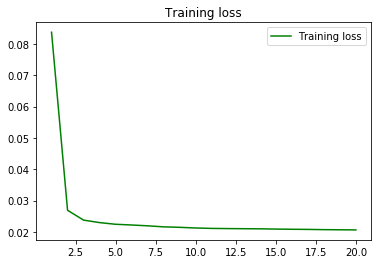

In [23]:
train_loss = history.history['loss']
epochs = range(1, len(train_loss) + 1)
plt.figure()
plt.plot(epochs, train_loss, 'g', label='Training loss')
plt.title('Training loss')
plt.legend()
plt.show()

In [24]:
print('Train MAE = %f' % (train_loss[-1] * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min())))

Train MAE = 2.193618


For comparison, the LOCF model MAE is **2.144081**.

In [25]:
as5_train_preds = model.predict_generator(gen_train, steps=train_steps, workers=0)

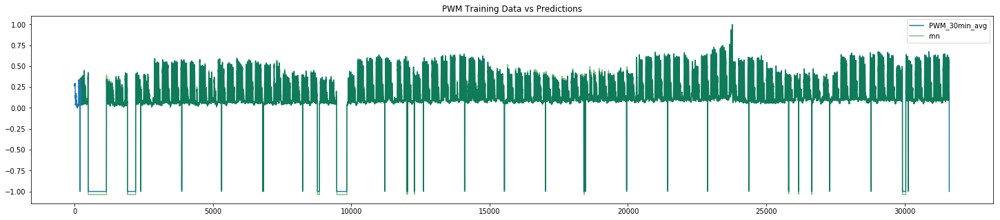

In [26]:
plt.figure(figsize=(25, 5))
plt.plot(range(as5_train_data.shape[0]), as5_train_data[:, 0], label='PWM_30min_avg')
plt.plot(range(lookback, as5_train_data.shape[0]), as5_train_preds.flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()

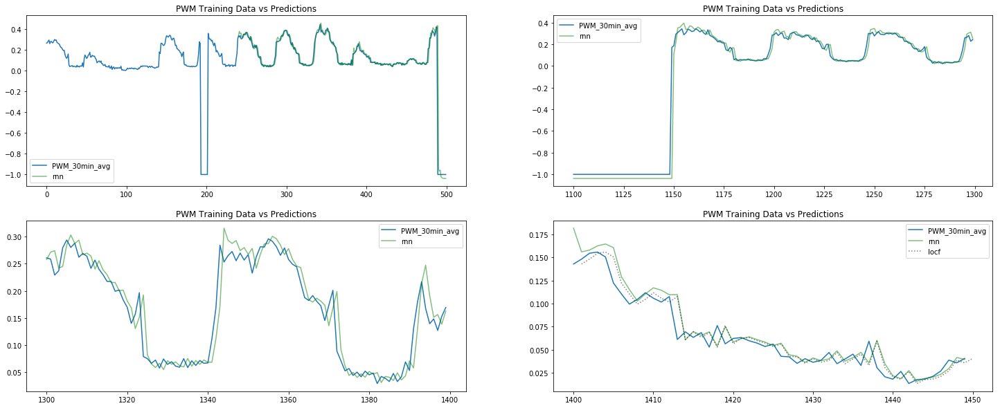

In [27]:
plt.figure(figsize=(25, 10))
plt.subplot(221)
plt.plot(range(500), as5_train_data[:500, 0], label='PWM_30min_avg')
plt.plot(range(lookback, 500), as5_train_preds[:500 - lookback, :].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()
plt.subplot(222)
plt.plot(range(1100, 1300), as5_train_data[1100:1300, 0], label='PWM_30min_avg')
plt.plot(range(1100, 1300), as5_train_preds[1100 - lookback:1300 - lookback].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()
plt.subplot(223)
plt.plot(range(1300, 1400), as5_train_data[1300:1400, 0], label='PWM_30min_avg')
plt.plot(range(1300, 1400), as5_train_preds[1300 - lookback:1400 - lookback].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()
plt.subplot(224)
plt.plot(range(1400, 1450), as5_train_data[1400:1450, 0], label='PWM_30min_avg')
plt.plot(range(1400, 1450), as5_train_preds[1400 - lookback:1450 - lookback].flatten(), color='green', alpha=.5, label='rnn')
plt.plot(range(1401, 1451), as5_train_data[1400:1450, 0], color='black', alpha=.5, label='locf', linestyle=':')
plt.title('PWM Training Data vs Predictions')
plt.legend()

In [28]:
model.save('base-rnn-nomask.h5')

## Base RNN Model

### Test the thread-safe data generator

This generator should run faster.

In [20]:
gen_testing = mu.DataGenerator(as5_train_data[:1000],
                               lookback=lookback, delay=delay, min_index=0, max_index=999,
                               batch_size=batch_size, step=step)

There are 511 samples with missing output values; the number of batches is 1000 - 240 (lookback) - 511 - 0 (delay) / 128 = 1.9453. 2 batches is correct. 

In [21]:
(as5_train_data[240:1000, 0] == -1).sum()

511

In [22]:
gen_testing.__len__()

2

The size of the first mini-batch is correct. 128 samples, each with 240 (lookback) x 2 (PWM & BTU) attributes.

In [23]:
gen_testing.__getitem__(0)[0].shape

(128, 240, 2)

The values of the 2nd sample tally with the values of the 1st sample with a shift of 1.

In [24]:
gen_testing.__getitem__(0)[0][0, :5, :]

array([[0.26254935, 0.56924225],
       [0.26724948, 0.53427896],
       [0.28031585, 0.53353241],
       [0.29140816, 0.53415454],
       [0.25784922, 0.49769815]])

In [25]:
gen_testing.__getitem__(0)[0][1, :5, :]

array([[0.26724948, 0.53427896],
       [0.28031585, 0.53353241],
       [0.29140816, 0.53415454],
       [0.25784922, 0.49769815],
       [0.27674375, 0.42702501]])

The size of the last mini-batch is less than 128. (1000 - 240 - 511) % 128 = 121.

In [26]:
gen_testing.__getitem__(1)[0].shape

(121, 240, 2)

### Split a validation set out from the train set

In [27]:
as5_train_split = as5_train_data[:20000]
as5_val_split = as5_train_data[20000:]

In [28]:
print('train split = %s\nvalidation split = %s' % (as5_train_split.shape, as5_val_split.shape))

train split = (20000, 2)
validation split = (11616, 2)


In [29]:
model = Sequential()
model.add(layers.GRU(16, input_shape=(None, as5_train_split.shape[-1])))
model.add(layers.Dense(1))
model.compile(optimizer=RMSprop(), loss='mae', metrics=['mape'])

In [30]:
gen_train = mu.DataGenerator(as5_train_split,
                             lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_split) - 1,
                             batch_size=batch_size, step=step)
gen_val = mu.DataGenerator(as5_val_split,
                           lookback=lookback, delay=delay, min_index=0, max_index=len(as5_val_split) - 1,
                           batch_size=batch_size, step=step)

In [31]:
gen_train.__len__()

143

In [32]:
gen_val.__len__()

88

### Train the RNN

In [33]:
t1 = datetime.datetime.now()
history = model.fit_generator(generator=gen_train, epochs=80,
                              validation_data=gen_val,
                              workers=4, use_multiprocessing=True, shuffle=True)
print('\nTraining Duration = %s' % (datetime.datetime.now()-t1))

Epoch 1/80


  1/143 [..............................] - ETA: 18:14 - loss: 0.1299 - mean_absolute_percentage_error: 46.5536

  2/143 [..............................] - ETA: 9:16 - loss: 0.0772 - mean_absolute_percentage_error: 33.9681 

  3/143 [..............................] - ETA: 6:14 - loss: 0.0564 - mean_absolute_percentage_error: 32.6382

  4/143 [..............................] - ETA: 4:43 - loss: 0.0498 - mean_absolute_percentage_error: 29.1417

  5/143 [>.............................] - ETA: 3:48 - loss: 0.0497 - mean_absolute_percentage_error: 29.6467

  6/143 [>.............................] - ETA: 3:12 - loss: 0.0455 - mean_absolute_percentage_error: 27.2541

  7/143 [>.............................] - ETA: 2:46 - loss: 0.0453 - mean_absolute_percentage_error: 29.4032

  8/143 [>.............................] - ETA: 2:26 - loss: 0.0507 - mean_absolute_percentage_error: 28.8133

  9/143 [>.............................] - ETA: 2:11 - loss: 0.0505 - mean_absolute_percentage_error: 28.8758

 10/143 [=>............................] - ETA: 1:59 - loss: 0.0498 - mean_absolute_percentage_error: 31.5839

 11/143 [=>............................] - ETA: 1:49 - loss: 0.0495 - mean_absolute_percentage_error: 30.4575

 12/143 [=>............................] - ETA: 1:40 - loss: 0.0494 - mean_absolute_percentage_error: 29.8043

 13/143 [=>............................] - ETA: 1:33 - loss: 0.0495 - mean_absolute_percentage_error: 31.7010

 14/143 [=>............................] - ETA: 1:27 - loss: 0.0512 - mean_absolute_percentage_error: 31.2160

 15/143 [==>...........................] - ETA: 1:22 - loss: 0.0502 - mean_absolute_percentage_error: 31.1933

 16/143 [==>...........................] - ETA: 1:17 - loss: 0.0491 - mean_absolute_percentage_error: 30.3329

 17/143 [==>...........................] - ETA: 1:13 - loss: 0.0499 - mean_absolute_percentage_error: 30.1056

 18/143 [==>...........................] - ETA: 1:09 - loss: 0.0491 - mean_absolute_percentage_error: 29.3572

 19/143 [==>...........................] - ETA: 1:06 - loss: 0.0481 - mean_absolute_percentage_error: 28.9763

 20/143 [===>..........................] - ETA: 1:03 - loss: 0.0472 - mean_absolute_percentage_error: 28.3848

 21/143 [===>..........................] - ETA: 1:00 - loss: 0.0462 - mean_absolute_percentage_error: 27.7418

 22/143 [===>..........................] - ETA: 58s - loss: 0.0461 - mean_absolute_percentage_error: 28.2172 

 23/143 [===>..........................] - ETA: 55s - loss: 0.0452 - mean_absolute_percentage_error: 27.6056

 24/143 [====>.........................] - ETA: 53s - loss: 0.0444 - mean_absolute_percentage_error: 27.1724

 25/143 [====>.........................] - ETA: 51s - loss: 0.0438 - mean_absolute_percentage_error: 27.6695

 26/143 [====>.........................] - ETA: 49s - loss: 0.0444 - mean_absolute_percentage_error: 27.6611

 27/143 [====>.........................] - ETA: 48s - loss: 0.0444 - mean_absolute_percentage_error: 27.3927

 28/143 [====>.........................] - ETA: 46s - loss: 0.0438 - mean_absolute_percentage_error: 27.0049

 29/143 [=====>........................] - ETA: 45s - loss: 0.0437 - mean_absolute_percentage_error: 26.8591

 30/143 [=====>........................] - ETA: 43s - loss: 0.0437 - mean_absolute_percentage_error: 27.0856

 31/143 [=====>........................] - ETA: 42s - loss: 0.0443 - mean_absolute_percentage_error: 27.8689

 32/143 [=====>........................] - ETA: 41s - loss: 0.0438 - mean_absolute_percentage_error: 27.6934

 33/143 [=====>........................] - ETA: 40s - loss: 0.0438 - mean_absolute_percentage_error: 28.7391

 34/143 [======>.......................] - ETA: 39s - loss: 0.0431 - mean_absolute_percentage_error: 28.3845

 35/143 [======>.......................] - ETA: 37s - loss: 0.0439 - mean_absolute_percentage_error: 28.3403

 36/143 [======>.......................] - ETA: 36s - loss: 0.0436 - mean_absolute_percentage_error: 28.5204

 37/143 [======>.......................] - ETA: 35s - loss: 0.0436 - mean_absolute_percentage_error: 28.3395

 38/143 [======>.......................] - ETA: 35s - loss: 0.0439 - mean_absolute_percentage_error: 28.1351

 39/143 [=======>......................] - ETA: 34s - loss: 0.0442 - mean_absolute_percentage_error: 27.8840

 40/143 [=======>......................] - ETA: 33s - loss: 0.0441 - mean_absolute_percentage_error: 27.7577

 41/143 [=======>......................] - ETA: 32s - loss: 0.0440 - mean_absolute_percentage_error: 27.7059

 42/143 [=======>......................] - ETA: 31s - loss: 0.0436 - mean_absolute_percentage_error: 27.4069

 43/143 [========>.....................] - ETA: 31s - loss: 0.0432 - mean_absolute_percentage_error: 27.2019

 44/143 [========>.....................] - ETA: 30s - loss: 0.0432 - mean_absolute_percentage_error: 27.1879

 45/143 [========>.....................] - ETA: 29s - loss: 0.0432 - mean_absolute_percentage_error: 27.0716

 46/143 [========>.....................] - ETA: 29s - loss: 0.0429 - mean_absolute_percentage_error: 27.0418

 47/143 [========>.....................] - ETA: 28s - loss: 0.0426 - mean_absolute_percentage_error: 26.8060

 48/143 [=========>....................] - ETA: 27s - loss: 0.0422 - mean_absolute_percentage_error: 26.5873

 49/143 [=========>....................] - ETA: 27s - loss: 0.0421 - mean_absolute_percentage_error: 26.3918

 50/143 [=========>....................] - ETA: 26s - loss: 0.0421 - mean_absolute_percentage_error: 26.2026

 51/143 [=========>....................] - ETA: 26s - loss: 0.0419 - mean_absolute_percentage_error: 26.1906

 52/143 [=========>....................] - ETA: 25s - loss: 0.0415 - mean_absolute_percentage_error: 25.9401

 53/143 [==========>...................] - ETA: 24s - loss: 0.0412 - mean_absolute_percentage_error: 25.7793

 54/143 [==========>...................] - ETA: 24s - loss: 0.0413 - mean_absolute_percentage_error: 25.6166

 55/143 [==========>...................] - ETA: 23s - loss: 0.0409 - mean_absolute_percentage_error: 25.4722

 56/143 [==========>...................] - ETA: 23s - loss: 0.0408 - mean_absolute_percentage_error: 26.1282

 57/143 [==========>...................] - ETA: 23s - loss: 0.0407 - mean_absolute_percentage_error: 25.9724

 58/143 [===========>..................] - ETA: 22s - loss: 0.0407 - mean_absolute_percentage_error: 25.8490

 59/143 [===========>..................] - ETA: 22s - loss: 0.0404 - mean_absolute_percentage_error: 25.6770

 60/143 [===========>..................] - ETA: 21s - loss: 0.0406 - mean_absolute_percentage_error: 25.5510

 61/143 [===========>..................] - ETA: 21s - loss: 0.0406 - mean_absolute_percentage_error: 25.7832

 62/143 [============>.................] - ETA: 20s - loss: 0.0407 - mean_absolute_percentage_error: 25.7757

 63/143 [============>.................] - ETA: 20s - loss: 0.0405 - mean_absolute_percentage_error: 25.7517

 64/143 [============>.................] - ETA: 19s - loss: 0.0405 - mean_absolute_percentage_error: 25.6460

 65/143 [============>.................] - ETA: 19s - loss: 0.0404 - mean_absolute_percentage_error: 25.6672

 66/143 [============>.................] - ETA: 19s - loss: 0.0401 - mean_absolute_percentage_error: 25.5272

 67/143 [=============>................] - ETA: 18s - loss: 0.0400 - mean_absolute_percentage_error: 25.3770

 68/143 [=============>................] - ETA: 18s - loss: 0.0396 - mean_absolute_percentage_error: 25.2112

 69/143 [=============>................] - ETA: 18s - loss: 0.0394 - mean_absolute_percentage_error: 25.0656

 70/143 [=============>................] - ETA: 17s - loss: 0.0394 - mean_absolute_percentage_error: 24.9488

 71/143 [=============>................] - ETA: 17s - loss: 0.0392 - mean_absolute_percentage_error: 25.0641

 72/143 [==============>...............] - ETA: 17s - loss: 0.0389 - mean_absolute_percentage_error: 24.9067

 73/143 [==============>...............] - ETA: 16s - loss: 0.0386 - mean_absolute_percentage_error: 24.7320

 74/143 [==============>...............] - ETA: 16s - loss: 0.0385 - mean_absolute_percentage_error: 24.6467

 75/143 [==============>...............] - ETA: 16s - loss: 0.0384 - mean_absolute_percentage_error: 24.5070

 76/143 [==============>...............] - ETA: 15s - loss: 0.0382 - mean_absolute_percentage_error: 24.3654

 77/143 [===============>..............] - ETA: 15s - loss: 0.0381 - mean_absolute_percentage_error: 24.3262

 78/143 [===============>..............] - ETA: 15s - loss: 0.0379 - mean_absolute_percentage_error: 24.1601

 79/143 [===============>..............] - ETA: 14s - loss: 0.0376 - mean_absolute_percentage_error: 24.0050

 80/143 [===============>..............] - ETA: 14s - loss: 0.0375 - mean_absolute_percentage_error: 23.9327

 81/143 [===============>..............] - ETA: 14s - loss: 0.0375 - mean_absolute_percentage_error: 23.8554

 82/143 [================>.............] - ETA: 13s - loss: 0.0374 - mean_absolute_percentage_error: 23.7398

 83/143 [================>.............] - ETA: 13s - loss: 0.0374 - mean_absolute_percentage_error: 23.6435

 84/143 [================>.............] - ETA: 13s - loss: 0.0372 - mean_absolute_percentage_error: 23.6159

 85/143 [================>.............] - ETA: 12s - loss: 0.0369 - mean_absolute_percentage_error: 23.5270

 86/143 [=================>............] - ETA: 12s - loss: 0.0369 - mean_absolute_percentage_error: 23.4103

 87/143 [=================>............] - ETA: 12s - loss: 0.0369 - mean_absolute_percentage_error: 23.3675

 88/143 [=================>............] - ETA: 12s - loss: 0.0368 - mean_absolute_percentage_error: 23.3419

 89/143 [=================>............] - ETA: 11s - loss: 0.0370 - mean_absolute_percentage_error: 23.5121

 90/143 [=================>............] - ETA: 11s - loss: 0.0369 - mean_absolute_percentage_error: 23.4729

 91/143 [==================>...........] - ETA: 11s - loss: 0.0367 - mean_absolute_percentage_error: 23.3790

 92/143 [==================>...........] - ETA: 11s - loss: 0.0367 - mean_absolute_percentage_error: 23.2815

 93/143 [==================>...........] - ETA: 10s - loss: 0.0366 - mean_absolute_percentage_error: 23.1944

 94/143 [==================>...........] - ETA: 10s - loss: 0.0365 - mean_absolute_percentage_error: 23.0761

 95/143 [==================>...........] - ETA: 10s - loss: 0.0363 - mean_absolute_percentage_error: 22.9807

 96/143 [===================>..........] - ETA: 10s - loss: 0.0362 - mean_absolute_percentage_error: 22.8710

 97/143 [===================>..........] - ETA: 9s - loss: 0.0361 - mean_absolute_percentage_error: 22.7642 

 98/143 [===================>..........] - ETA: 9s - loss: 0.0360 - mean_absolute_percentage_error: 22.6894

 99/143 [===================>..........] - ETA: 9s - loss: 0.0360 - mean_absolute_percentage_error: 22.5972

100/143 [===================>..........] - ETA: 9s - loss: 0.0359 - mean_absolute_percentage_error: 22.6270

101/143 [====================>.........] - ETA: 8s - loss: 0.0358 - mean_absolute_percentage_error: 22.7084

102/143 [====================>.........] - ETA: 8s - loss: 0.0357 - mean_absolute_percentage_error: 22.6203

103/143 [====================>.........] - ETA: 8s - loss: 0.0356 - mean_absolute_percentage_error: 22.5233

104/143 [====================>.........] - ETA: 8s - loss: 0.0356 - mean_absolute_percentage_error: 22.5882

105/143 [=====================>........] - ETA: 7s - loss: 0.0357 - mean_absolute_percentage_error: 22.6830

106/143 [=====================>........] - ETA: 7s - loss: 0.0356 - mean_absolute_percentage_error: 22.5919

107/143 [=====================>........] - ETA: 7s - loss: 0.0354 - mean_absolute_percentage_error: 22.5523

108/143 [=====================>........] - ETA: 7s - loss: 0.0353 - mean_absolute_percentage_error: 22.4895

109/143 [=====================>........] - ETA: 6s - loss: 0.0353 - mean_absolute_percentage_error: 22.4341

110/143 [======================>.......] - ETA: 6s - loss: 0.0351 - mean_absolute_percentage_error: 22.3624

111/143 [======================>.......] - ETA: 6s - loss: 0.0350 - mean_absolute_percentage_error: 22.4002

112/143 [======================>.......] - ETA: 6s - loss: 0.0349 - mean_absolute_percentage_error: 22.3418

113/143 [======================>.......] - ETA: 6s - loss: 0.0349 - mean_absolute_percentage_error: 22.3082

114/143 [======================>.......] - ETA: 5s - loss: 0.0349 - mean_absolute_percentage_error: 22.2363

115/143 [=======================>......] - ETA: 5s - loss: 0.0349 - mean_absolute_percentage_error: 22.1716

116/143 [=======================>......] - ETA: 5s - loss: 0.0347 - mean_absolute_percentage_error: 22.1013

117/143 [=======================>......] - ETA: 5s - loss: 0.0347 - mean_absolute_percentage_error: 22.1161

118/143 [=======================>......] - ETA: 4s - loss: 0.0347 - mean_absolute_percentage_error: 22.0396

119/143 [=======================>......] - ETA: 4s - loss: 0.0347 - mean_absolute_percentage_error: 21.9806

120/143 [========================>.....] - ETA: 4s - loss: 0.0346 - mean_absolute_percentage_error: 21.9073

121/143 [========================>.....] - ETA: 4s - loss: 0.0345 - mean_absolute_percentage_error: 21.9416

122/143 [========================>.....] - ETA: 4s - loss: 0.0344 - mean_absolute_percentage_error: 21.8627

123/143 [========================>.....] - ETA: 3s - loss: 0.0343 - mean_absolute_percentage_error: 21.7979

124/143 [=========================>....] - ETA: 3s - loss: 0.0342 - mean_absolute_percentage_error: 21.7039

125/143 [=========================>....] - ETA: 3s - loss: 0.0343 - mean_absolute_percentage_error: 21.6567

126/143 [=========================>....] - ETA: 3s - loss: 0.0341 - mean_absolute_percentage_error: 21.5670

127/143 [=========================>....] - ETA: 3s - loss: 0.0340 - mean_absolute_percentage_error: 21.5153

128/143 [=========================>....] - ETA: 2s - loss: 0.0341 - mean_absolute_percentage_error: 21.4675

129/143 [==========================>...] - ETA: 2s - loss: 0.0340 - mean_absolute_percentage_error: 21.4223

130/143 [==========================>...] - ETA: 2s - loss: 0.0340 - mean_absolute_percentage_error: 21.3736

131/143 [==========================>...] - ETA: 2s - loss: 0.0339 - mean_absolute_percentage_error: 21.3267

132/143 [==========================>...] - ETA: 2s - loss: 0.0339 - mean_absolute_percentage_error: 21.2755

133/143 [==========================>...] - ETA: 1s - loss: 0.0338 - mean_absolute_percentage_error: 21.2365

134/143 [===========================>..] - ETA: 1s - loss: 0.0337 - mean_absolute_percentage_error: 21.1693

135/143 [===========================>..] - ETA: 1s - loss: 0.0336 - mean_absolute_percentage_error: 21.1022

136/143 [===========================>..] - ETA: 1s - loss: 0.0335 - mean_absolute_percentage_error: 21.0502

137/143 [===========================>..] - ETA: 1s - loss: 0.0335 - mean_absolute_percentage_error: 20.9940

138/143 [===========================>..] - ETA: 0s - loss: 0.0334 - mean_absolute_percentage_error: 20.9737

139/143 [============================>.] - ETA: 0s - loss: 0.0333 - mean_absolute_percentage_error: 20.9190

140/143 [============================>.] - ETA: 0s - loss: 0.0332 - mean_absolute_percentage_error: 20.8469

141/143 [============================>.] - ETA: 0s - loss: 0.0332 - mean_absolute_percentage_error: 20.8065

142/143 [============================>.] - ETA: 0s - loss: 0.0331 - mean_absolute_percentage_error: 20.7471

143/143 [==============================] - 30s 210ms/step - loss: 0.0331 - mean_absolute_percentage_error: 20.7130 - val_loss: 0.0292 - val_mean_absolute_percentage_error: 13.8481


Epoch 2/80


  1/143 [..............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 21.9322

  2/143 [..............................] - ETA: 22s - loss: 0.0320 - mean_absolute_percentage_error: 18.6801

  3/143 [..............................] - ETA: 22s - loss: 0.0331 - mean_absolute_percentage_error: 21.2302

  4/143 [..............................] - ETA: 21s - loss: 0.0332 - mean_absolute_percentage_error: 21.5565

  5/143 [>.............................] - ETA: 20s - loss: 0.0310 - mean_absolute_percentage_error: 19.8106

  6/143 [>.............................] - ETA: 20s - loss: 0.0298 - mean_absolute_percentage_error: 20.6777

  7/143 [>.............................] - ETA: 20s - loss: 0.0302 - mean_absolute_percentage_error: 22.6627

  8/143 [>.............................] - ETA: 20s - loss: 0.0283 - mean_absolute_percentage_error: 21.6824

  9/143 [>.............................] - ETA: 20s - loss: 0.0291 - mean_absolute_percentage_error: 20.6323

 10/143 [=>............................] - ETA: 19s - loss: 0.0295 - mean_absolute_percentage_error: 20.2098

 11/143 [=>............................] - ETA: 19s - loss: 0.0290 - mean_absolute_percentage_error: 19.6363

 12/143 [=>............................] - ETA: 20s - loss: 0.0279 - mean_absolute_percentage_error: 18.9739

 13/143 [=>............................] - ETA: 20s - loss: 0.0275 - mean_absolute_percentage_error: 18.3499

 14/143 [=>............................] - ETA: 21s - loss: 0.0275 - mean_absolute_percentage_error: 18.1471

 15/143 [==>...........................] - ETA: 21s - loss: 0.0277 - mean_absolute_percentage_error: 17.8032

 16/143 [==>...........................] - ETA: 21s - loss: 0.0292 - mean_absolute_percentage_error: 17.7163

 17/143 [==>...........................] - ETA: 20s - loss: 0.0286 - mean_absolute_percentage_error: 17.4010

 18/143 [==>...........................] - ETA: 20s - loss: 0.0285 - mean_absolute_percentage_error: 17.1833

 19/143 [==>...........................] - ETA: 20s - loss: 0.0281 - mean_absolute_percentage_error: 17.1805

 20/143 [===>..........................] - ETA: 20s - loss: 0.0276 - mean_absolute_percentage_error: 17.0310

 21/143 [===>..........................] - ETA: 19s - loss: 0.0278 - mean_absolute_percentage_error: 16.9442

 22/143 [===>..........................] - ETA: 19s - loss: 0.0283 - mean_absolute_percentage_error: 17.2152

 23/143 [===>..........................] - ETA: 19s - loss: 0.0283 - mean_absolute_percentage_error: 17.1422

 24/143 [====>.........................] - ETA: 19s - loss: 0.0284 - mean_absolute_percentage_error: 17.8016

 25/143 [====>.........................] - ETA: 18s - loss: 0.0285 - mean_absolute_percentage_error: 17.7083

 26/143 [====>.........................] - ETA: 18s - loss: 0.0280 - mean_absolute_percentage_error: 17.6589

 27/143 [====>.........................] - ETA: 18s - loss: 0.0278 - mean_absolute_percentage_error: 17.6131

 28/143 [====>.........................] - ETA: 18s - loss: 0.0283 - mean_absolute_percentage_error: 18.0549

 29/143 [=====>........................] - ETA: 18s - loss: 0.0280 - mean_absolute_percentage_error: 17.9048

 30/143 [=====>........................] - ETA: 17s - loss: 0.0281 - mean_absolute_percentage_error: 17.9244

 31/143 [=====>........................] - ETA: 17s - loss: 0.0279 - mean_absolute_percentage_error: 17.8626

 32/143 [=====>........................] - ETA: 17s - loss: 0.0277 - mean_absolute_percentage_error: 17.7045

 33/143 [=====>........................] - ETA: 17s - loss: 0.0275 - mean_absolute_percentage_error: 17.5217

 34/143 [======>.......................] - ETA: 16s - loss: 0.0275 - mean_absolute_percentage_error: 17.3946

 35/143 [======>.......................] - ETA: 16s - loss: 0.0276 - mean_absolute_percentage_error: 17.5547

 36/143 [======>.......................] - ETA: 16s - loss: 0.0277 - mean_absolute_percentage_error: 17.4440

 37/143 [======>.......................] - ETA: 16s - loss: 0.0278 - mean_absolute_percentage_error: 17.3499

 38/143 [======>.......................] - ETA: 16s - loss: 0.0281 - mean_absolute_percentage_error: 17.8150

 39/143 [=======>......................] - ETA: 16s - loss: 0.0279 - mean_absolute_percentage_error: 17.6660

 40/143 [=======>......................] - ETA: 15s - loss: 0.0278 - mean_absolute_percentage_error: 17.6129

 41/143 [=======>......................] - ETA: 15s - loss: 0.0277 - mean_absolute_percentage_error: 17.4951

 42/143 [=======>......................] - ETA: 15s - loss: 0.0277 - mean_absolute_percentage_error: 17.4450

 43/143 [========>.....................] - ETA: 15s - loss: 0.0274 - mean_absolute_percentage_error: 17.2959

 44/143 [========>.....................] - ETA: 15s - loss: 0.0275 - mean_absolute_percentage_error: 17.4438

 45/143 [========>.....................] - ETA: 14s - loss: 0.0274 - mean_absolute_percentage_error: 17.6846

 46/143 [========>.....................] - ETA: 14s - loss: 0.0272 - mean_absolute_percentage_error: 17.6207

 47/143 [========>.....................] - ETA: 14s - loss: 0.0273 - mean_absolute_percentage_error: 17.4894

 48/143 [=========>....................] - ETA: 14s - loss: 0.0276 - mean_absolute_percentage_error: 18.5969

 49/143 [=========>....................] - ETA: 14s - loss: 0.0276 - mean_absolute_percentage_error: 18.4687

 50/143 [=========>....................] - ETA: 14s - loss: 0.0276 - mean_absolute_percentage_error: 18.3817

 51/143 [=========>....................] - ETA: 13s - loss: 0.0274 - mean_absolute_percentage_error: 18.2598

 52/143 [=========>....................] - ETA: 13s - loss: 0.0273 - mean_absolute_percentage_error: 18.1059

 53/143 [==========>...................] - ETA: 13s - loss: 0.0270 - mean_absolute_percentage_error: 18.0879

 54/143 [==========>...................] - ETA: 13s - loss: 0.0271 - mean_absolute_percentage_error: 17.9914

 55/143 [==========>...................] - ETA: 13s - loss: 0.0269 - mean_absolute_percentage_error: 17.9017

 56/143 [==========>...................] - ETA: 12s - loss: 0.0266 - mean_absolute_percentage_error: 17.7533

 57/143 [==========>...................] - ETA: 12s - loss: 0.0266 - mean_absolute_percentage_error: 17.6815

 58/143 [===========>..................] - ETA: 12s - loss: 0.0264 - mean_absolute_percentage_error: 17.5586

 59/143 [===========>..................] - ETA: 12s - loss: 0.0263 - mean_absolute_percentage_error: 17.4715

 60/143 [===========>..................] - ETA: 12s - loss: 0.0262 - mean_absolute_percentage_error: 17.3489

 61/143 [===========>..................] - ETA: 12s - loss: 0.0263 - mean_absolute_percentage_error: 17.2804

 62/143 [============>.................] - ETA: 11s - loss: 0.0262 - mean_absolute_percentage_error: 17.2675

 63/143 [============>.................] - ETA: 11s - loss: 0.0263 - mean_absolute_percentage_error: 17.1846

 64/143 [============>.................] - ETA: 11s - loss: 0.0261 - mean_absolute_percentage_error: 17.0742

 65/143 [============>.................] - ETA: 11s - loss: 0.0260 - mean_absolute_percentage_error: 17.0214

 66/143 [============>.................] - ETA: 11s - loss: 0.0258 - mean_absolute_percentage_error: 16.9949

 67/143 [=============>................] - ETA: 11s - loss: 0.0257 - mean_absolute_percentage_error: 16.9221

 68/143 [=============>................] - ETA: 10s - loss: 0.0256 - mean_absolute_percentage_error: 16.8450

 69/143 [=============>................] - ETA: 10s - loss: 0.0255 - mean_absolute_percentage_error: 16.8302

 70/143 [=============>................] - ETA: 10s - loss: 0.0254 - mean_absolute_percentage_error: 16.7681

 71/143 [=============>................] - ETA: 10s - loss: 0.0255 - mean_absolute_percentage_error: 16.7285

 72/143 [==============>...............] - ETA: 10s - loss: 0.0255 - mean_absolute_percentage_error: 16.7142

 73/143 [==============>...............] - ETA: 10s - loss: 0.0256 - mean_absolute_percentage_error: 17.0206

 74/143 [==============>...............] - ETA: 10s - loss: 0.0257 - mean_absolute_percentage_error: 16.9627

 75/143 [==============>...............] - ETA: 9s - loss: 0.0257 - mean_absolute_percentage_error: 16.9500 

 76/143 [==============>...............] - ETA: 9s - loss: 0.0256 - mean_absolute_percentage_error: 16.8552

 77/143 [===============>..............] - ETA: 9s - loss: 0.0257 - mean_absolute_percentage_error: 16.9540

 78/143 [===============>..............] - ETA: 9s - loss: 0.0256 - mean_absolute_percentage_error: 16.9463

 79/143 [===============>..............] - ETA: 9s - loss: 0.0256 - mean_absolute_percentage_error: 16.8907

 80/143 [===============>..............] - ETA: 9s - loss: 0.0255 - mean_absolute_percentage_error: 16.8733

 81/143 [===============>..............] - ETA: 8s - loss: 0.0254 - mean_absolute_percentage_error: 16.7847

 82/143 [================>.............] - ETA: 8s - loss: 0.0254 - mean_absolute_percentage_error: 16.7176

 83/143 [================>.............] - ETA: 8s - loss: 0.0253 - mean_absolute_percentage_error: 16.6946

 84/143 [================>.............] - ETA: 8s - loss: 0.0252 - mean_absolute_percentage_error: 16.6530

 85/143 [================>.............] - ETA: 8s - loss: 0.0252 - mean_absolute_percentage_error: 17.1472

 86/143 [=================>............] - ETA: 8s - loss: 0.0251 - mean_absolute_percentage_error: 17.1620

 87/143 [=================>............] - ETA: 8s - loss: 0.0250 - mean_absolute_percentage_error: 17.0955

 88/143 [=================>............] - ETA: 7s - loss: 0.0250 - mean_absolute_percentage_error: 17.0423

 89/143 [=================>............] - ETA: 7s - loss: 0.0250 - mean_absolute_percentage_error: 16.9856

 90/143 [=================>............] - ETA: 7s - loss: 0.0249 - mean_absolute_percentage_error: 16.9300

 91/143 [==================>...........] - ETA: 7s - loss: 0.0248 - mean_absolute_percentage_error: 16.8798

 92/143 [==================>...........] - ETA: 7s - loss: 0.0248 - mean_absolute_percentage_error: 16.8235

 93/143 [==================>...........] - ETA: 7s - loss: 0.0248 - mean_absolute_percentage_error: 16.8166

 94/143 [==================>...........] - ETA: 6s - loss: 0.0248 - mean_absolute_percentage_error: 16.8188

 95/143 [==================>...........] - ETA: 6s - loss: 0.0247 - mean_absolute_percentage_error: 16.7880

 96/143 [===================>..........] - ETA: 6s - loss: 0.0247 - mean_absolute_percentage_error: 16.7657

 97/143 [===================>..........] - ETA: 6s - loss: 0.0247 - mean_absolute_percentage_error: 16.7115

 98/143 [===================>..........] - ETA: 6s - loss: 0.0246 - mean_absolute_percentage_error: 16.6723

 99/143 [===================>..........] - ETA: 6s - loss: 0.0246 - mean_absolute_percentage_error: 16.6324

100/143 [===================>..........] - ETA: 6s - loss: 0.0245 - mean_absolute_percentage_error: 16.5812

101/143 [====================>.........] - ETA: 5s - loss: 0.0245 - mean_absolute_percentage_error: 16.5451

102/143 [====================>.........] - ETA: 5s - loss: 0.0244 - mean_absolute_percentage_error: 16.4810

103/143 [====================>.........] - ETA: 5s - loss: 0.0244 - mean_absolute_percentage_error: 16.4687

104/143 [====================>.........] - ETA: 5s - loss: 0.0242 - mean_absolute_percentage_error: 16.4874

105/143 [=====================>........] - ETA: 5s - loss: 0.0243 - mean_absolute_percentage_error: 16.4386

106/143 [=====================>........] - ETA: 5s - loss: 0.0242 - mean_absolute_percentage_error: 16.3920

107/143 [=====================>........] - ETA: 5s - loss: 0.0242 - mean_absolute_percentage_error: 16.3458

108/143 [=====================>........] - ETA: 4s - loss: 0.0242 - mean_absolute_percentage_error: 16.3475

109/143 [=====================>........] - ETA: 4s - loss: 0.0242 - mean_absolute_percentage_error: 16.3279

110/143 [======================>.......] - ETA: 4s - loss: 0.0242 - mean_absolute_percentage_error: 16.2732

111/143 [======================>.......] - ETA: 4s - loss: 0.0243 - mean_absolute_percentage_error: 16.2319

112/143 [======================>.......] - ETA: 4s - loss: 0.0242 - mean_absolute_percentage_error: 16.2018

113/143 [======================>.......] - ETA: 4s - loss: 0.0242 - mean_absolute_percentage_error: 16.1652

114/143 [======================>.......] - ETA: 4s - loss: 0.0243 - mean_absolute_percentage_error: 16.2677

115/143 [=======================>......] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 16.2376

116/143 [=======================>......] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 16.1867

117/143 [=======================>......] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 16.1409

118/143 [=======================>......] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 16.1282

119/143 [=======================>......] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 16.0908

120/143 [========================>.....] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 16.0475

121/143 [========================>.....] - ETA: 3s - loss: 0.0242 - mean_absolute_percentage_error: 16.0166

122/143 [========================>.....] - ETA: 2s - loss: 0.0242 - mean_absolute_percentage_error: 16.0017

123/143 [========================>.....] - ETA: 2s - loss: 0.0242 - mean_absolute_percentage_error: 15.9744

124/143 [=========================>....] - ETA: 2s - loss: 0.0241 - mean_absolute_percentage_error: 15.9692

125/143 [=========================>....] - ETA: 2s - loss: 0.0242 - mean_absolute_percentage_error: 15.9429

126/143 [=========================>....] - ETA: 2s - loss: 0.0241 - mean_absolute_percentage_error: 15.9739

127/143 [=========================>....] - ETA: 2s - loss: 0.0241 - mean_absolute_percentage_error: 15.9853

128/143 [=========================>....] - ETA: 2s - loss: 0.0241 - mean_absolute_percentage_error: 15.9620

129/143 [==========================>...] - ETA: 1s - loss: 0.0241 - mean_absolute_percentage_error: 15.9205

130/143 [==========================>...] - ETA: 1s - loss: 0.0240 - mean_absolute_percentage_error: 15.8889

131/143 [==========================>...] - ETA: 1s - loss: 0.0240 - mean_absolute_percentage_error: 15.8619

132/143 [==========================>...] - ETA: 1s - loss: 0.0240 - mean_absolute_percentage_error: 15.8218

133/143 [==========================>...] - ETA: 1s - loss: 0.0239 - mean_absolute_percentage_error: 15.9294

134/143 [===========================>..] - ETA: 1s - loss: 0.0239 - mean_absolute_percentage_error: 15.8698

135/143 [===========================>..] - ETA: 1s - loss: 0.0239 - mean_absolute_percentage_error: 15.8652

136/143 [===========================>..] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 15.8346

137/143 [===========================>..] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 15.8007

138/143 [===========================>..] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 15.8008

139/143 [============================>.] - ETA: 0s - loss: 0.0239 - mean_absolute_percentage_error: 15.8947

140/143 [============================>.] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 15.8699

141/143 [============================>.] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 15.8206

142/143 [============================>.] - ETA: 0s - loss: 0.0239 - mean_absolute_percentage_error: 15.9013

143/143 [==============================] - 23s 160ms/step - loss: 0.0239 - mean_absolute_percentage_error: 15.8687 - val_loss: 0.0222 - val_mean_absolute_percentage_error: 11.6677


Epoch 3/80


  1/143 [..............................] - ETA: 25s - loss: 0.0182 - mean_absolute_percentage_error: 12.4373

  2/143 [..............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 12.1449

  3/143 [..............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 12.3624

  4/143 [..............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 12.3579

  5/143 [>.............................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 12.4028

  6/143 [>.............................] - ETA: 19s - loss: 0.0209 - mean_absolute_percentage_error: 13.7966

  7/143 [>.............................] - ETA: 19s - loss: 0.0220 - mean_absolute_percentage_error: 15.3063

  8/143 [>.............................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 14.5279

  9/143 [>.............................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.8965

 10/143 [=>............................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 14.6614

 11/143 [=>............................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 14.4100

 12/143 [=>............................] - ETA: 18s - loss: 0.0224 - mean_absolute_percentage_error: 14.3626

 13/143 [=>............................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 14.2811

 14/143 [=>............................] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 14.4753

 15/143 [==>...........................] - ETA: 17s - loss: 0.0222 - mean_absolute_percentage_error: 14.2258

 16/143 [==>...........................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.8162

 17/143 [==>...........................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.5061

 18/143 [==>...........................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.4935

 19/143 [==>...........................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 13.5293

 20/143 [===>..........................] - ETA: 16s - loss: 0.0206 - mean_absolute_percentage_error: 13.3840

 21/143 [===>..........................] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.8686

 22/143 [===>..........................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.8417

 23/143 [===>..........................] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 14.1522

 24/143 [====>.........................] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 14.3230

 25/143 [====>.........................] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 14.1999

 26/143 [====>.........................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 14.6592

 27/143 [====>.........................] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 14.4500

 28/143 [====>.........................] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 14.8227

 29/143 [=====>........................] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 14.7438

 30/143 [=====>........................] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 14.6505

 31/143 [=====>........................] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 14.8524

 32/143 [=====>........................] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 14.6571

 33/143 [=====>........................] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 14.7093

 34/143 [======>.......................] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 14.5657

 35/143 [======>.......................] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 14.4965

 36/143 [======>.......................] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 14.3810

 37/143 [======>.......................] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 15.0131

 38/143 [======>.......................] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 14.9827

 39/143 [=======>......................] - ETA: 14s - loss: 0.0222 - mean_absolute_percentage_error: 16.2983

 40/143 [=======>......................] - ETA: 14s - loss: 0.0223 - mean_absolute_percentage_error: 16.2129

 41/143 [=======>......................] - ETA: 14s - loss: 0.0222 - mean_absolute_percentage_error: 16.2795

 42/143 [=======>......................] - ETA: 13s - loss: 0.0221 - mean_absolute_percentage_error: 16.1536

 43/143 [========>.....................] - ETA: 13s - loss: 0.0222 - mean_absolute_percentage_error: 16.0484

 44/143 [========>.....................] - ETA: 13s - loss: 0.0221 - mean_absolute_percentage_error: 16.0635

 45/143 [========>.....................] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 15.9184

 46/143 [========>.....................] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 15.8718

 47/143 [========>.....................] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 15.7734

 48/143 [=========>....................] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 15.6637

 49/143 [=========>....................] - ETA: 12s - loss: 0.0220 - mean_absolute_percentage_error: 15.6312

 50/143 [=========>....................] - ETA: 12s - loss: 0.0218 - mean_absolute_percentage_error: 15.5556

 51/143 [=========>....................] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 15.4545

 52/143 [=========>....................] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 15.3439

 53/143 [==========>...................] - ETA: 12s - loss: 0.0217 - mean_absolute_percentage_error: 15.3488

 54/143 [==========>...................] - ETA: 12s - loss: 0.0217 - mean_absolute_percentage_error: 15.2727

 55/143 [==========>...................] - ETA: 12s - loss: 0.0220 - mean_absolute_percentage_error: 15.5574

 56/143 [==========>...................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 15.5005

 57/143 [==========>...................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 15.4101

 58/143 [===========>..................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 15.3976

 59/143 [===========>..................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 15.3266

 60/143 [===========>..................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 15.3021

 61/143 [===========>..................] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 15.2420

 62/143 [============>.................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 15.4383

 63/143 [============>.................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 15.3655

 64/143 [============>.................] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 15.3772

 65/143 [============>.................] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 15.3955

 66/143 [============>.................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 15.3465

 67/143 [=============>................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 15.2922

 68/143 [=============>................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 15.2140

 69/143 [=============>................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 15.2289

 70/143 [=============>................] - ETA: 10s - loss: 0.0221 - mean_absolute_percentage_error: 15.1667

 71/143 [=============>................] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 15.2122 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 15.1836

 73/143 [==============>...............] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 15.1540

 74/143 [==============>...............] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 15.1347

 75/143 [==============>...............] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 15.0801

 76/143 [==============>...............] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 15.0164

 77/143 [===============>..............] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 15.1601

 78/143 [===============>..............] - ETA: 8s - loss: 0.0218 - mean_absolute_percentage_error: 15.0896

 79/143 [===============>..............] - ETA: 8s - loss: 0.0218 - mean_absolute_percentage_error: 15.0358

 80/143 [===============>..............] - ETA: 8s - loss: 0.0218 - mean_absolute_percentage_error: 14.9846

 81/143 [===============>..............] - ETA: 8s - loss: 0.0218 - mean_absolute_percentage_error: 14.9076

 82/143 [================>.............] - ETA: 8s - loss: 0.0221 - mean_absolute_percentage_error: 15.1722

 83/143 [================>.............] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 15.1659

 84/143 [================>.............] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 15.1088

 85/143 [================>.............] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 15.0497

 86/143 [=================>............] - ETA: 7s - loss: 0.0224 - mean_absolute_percentage_error: 15.2651

 87/143 [=================>............] - ETA: 7s - loss: 0.0224 - mean_absolute_percentage_error: 15.2302

 88/143 [=================>............] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 15.1883

 89/143 [=================>............] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 15.1443

 90/143 [=================>............] - ETA: 7s - loss: 0.0222 - mean_absolute_percentage_error: 15.1073

 91/143 [==================>...........] - ETA: 7s - loss: 0.0222 - mean_absolute_percentage_error: 15.0548

 92/143 [==================>...........] - ETA: 7s - loss: 0.0222 - mean_absolute_percentage_error: 15.0105

 93/143 [==================>...........] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 15.1677

 94/143 [==================>...........] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 15.1111

 95/143 [==================>...........] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 15.1213

 96/143 [===================>..........] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 15.0719

 97/143 [===================>..........] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 15.0284

 98/143 [===================>..........] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 14.9845

 99/143 [===================>..........] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 14.9613

100/143 [===================>..........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.9974

101/143 [====================>.........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.9458

102/143 [====================>.........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.9244

103/143 [====================>.........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.9535

104/143 [====================>.........] - ETA: 5s - loss: 0.0220 - mean_absolute_percentage_error: 14.9030

105/143 [=====================>........] - ETA: 5s - loss: 0.0220 - mean_absolute_percentage_error: 14.8766

106/143 [=====================>........] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 14.8345

107/143 [=====================>........] - ETA: 4s - loss: 0.0219 - mean_absolute_percentage_error: 14.8109

108/143 [=====================>........] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 14.7760

109/143 [=====================>........] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 14.7442

110/143 [======================>.......] - ETA: 4s - loss: 0.0217 - mean_absolute_percentage_error: 14.7276

111/143 [======================>.......] - ETA: 4s - loss: 0.0217 - mean_absolute_percentage_error: 14.7119

112/143 [======================>.......] - ETA: 4s - loss: 0.0217 - mean_absolute_percentage_error: 14.6826

113/143 [======================>.......] - ETA: 4s - loss: 0.0217 - mean_absolute_percentage_error: 14.6466

114/143 [======================>.......] - ETA: 3s - loss: 0.0217 - mean_absolute_percentage_error: 14.6121

115/143 [=======================>......] - ETA: 3s - loss: 0.0216 - mean_absolute_percentage_error: 14.6033

116/143 [=======================>......] - ETA: 3s - loss: 0.0216 - mean_absolute_percentage_error: 14.5709

117/143 [=======================>......] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 14.6356

118/143 [=======================>......] - ETA: 3s - loss: 0.0216 - mean_absolute_percentage_error: 14.8512

119/143 [=======================>......] - ETA: 3s - loss: 0.0216 - mean_absolute_percentage_error: 14.8167

120/143 [========================>.....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 14.7811

121/143 [========================>.....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 14.7436

122/143 [========================>.....] - ETA: 2s - loss: 0.0216 - mean_absolute_percentage_error: 14.8573

123/143 [========================>.....] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 14.8282

124/143 [=========================>....] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 14.8221

125/143 [=========================>....] - ETA: 2s - loss: 0.0216 - mean_absolute_percentage_error: 15.1829

126/143 [=========================>....] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 15.1482

127/143 [=========================>....] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 15.1058

128/143 [=========================>....] - ETA: 2s - loss: 0.0214 - mean_absolute_percentage_error: 15.1078

129/143 [==========================>...] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 15.0714

130/143 [==========================>...] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 15.1304

131/143 [==========================>...] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 15.1416

132/143 [==========================>...] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 15.1126

133/143 [==========================>...] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 15.0912

134/143 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 15.0566

135/143 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 15.0477

136/143 [===========================>..] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 15.0397

137/143 [===========================>..] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 15.0153

138/143 [===========================>..] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 14.9907

139/143 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 14.9533

140/143 [============================>.] - ETA: 0s - loss: 0.0213 - mean_absolute_percentage_error: 14.9278

141/143 [============================>.] - ETA: 0s - loss: 0.0213 - mean_absolute_percentage_error: 14.8917

142/143 [============================>.] - ETA: 0s - loss: 0.0213 - mean_absolute_percentage_error: 14.8681

143/143 [==============================] - 23s 158ms/step - loss: 0.0214 - mean_absolute_percentage_error: 14.8548 - val_loss: 0.0216 - val_mean_absolute_percentage_error: 12.5870


Epoch 4/80


  1/143 [..............................] - ETA: 28s - loss: 0.0234 - mean_absolute_percentage_error: 16.9304

  2/143 [..............................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 21.7807

  3/143 [..............................] - ETA: 22s - loss: 0.0239 - mean_absolute_percentage_error: 18.1827

  4/143 [..............................] - ETA: 21s - loss: 0.0220 - mean_absolute_percentage_error: 17.6360

  5/143 [>.............................] - ETA: 21s - loss: 0.0203 - mean_absolute_percentage_error: 16.2562

  6/143 [>.............................] - ETA: 20s - loss: 0.0209 - mean_absolute_percentage_error: 15.5241

  7/143 [>.............................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 15.1092

  8/143 [>.............................] - ETA: 20s - loss: 0.0207 - mean_absolute_percentage_error: 14.6639

  9/143 [>.............................] - ETA: 19s - loss: 0.0209 - mean_absolute_percentage_error: 14.2401

 10/143 [=>............................] - ETA: 19s - loss: 0.0207 - mean_absolute_percentage_error: 13.8548

 11/143 [=>............................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 13.4651

 12/143 [=>............................] - ETA: 18s - loss: 0.0205 - mean_absolute_percentage_error: 13.3934

 13/143 [=>............................] - ETA: 18s - loss: 0.0202 - mean_absolute_percentage_error: 13.4017

 14/143 [=>............................] - ETA: 18s - loss: 0.0208 - mean_absolute_percentage_error: 15.2222

 15/143 [==>...........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 15.7880

 16/143 [==>...........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 15.4149

 17/143 [==>...........................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 15.0680

 18/143 [==>...........................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 14.8049

 19/143 [==>...........................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 14.6807

 20/143 [===>..........................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 14.4537

 21/143 [===>..........................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 14.3292

 22/143 [===>..........................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 14.1301

 23/143 [===>..........................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 14.2097

 24/143 [====>.........................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 14.0602

 25/143 [====>.........................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 13.9230

 26/143 [====>.........................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 13.7716

 27/143 [====>.........................] - ETA: 17s - loss: 0.0206 - mean_absolute_percentage_error: 13.5876

 28/143 [====>.........................] - ETA: 17s - loss: 0.0205 - mean_absolute_percentage_error: 13.4014

 29/143 [=====>........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 13.4236

 30/143 [=====>........................] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 13.2809

 31/143 [=====>........................] - ETA: 16s - loss: 0.0206 - mean_absolute_percentage_error: 13.2531

 32/143 [=====>........................] - ETA: 16s - loss: 0.0204 - mean_absolute_percentage_error: 13.1726

 33/143 [=====>........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 13.0759

 34/143 [======>.......................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 13.4663

 35/143 [======>.......................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 13.4059

 36/143 [======>.......................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 13.3015

 37/143 [======>.......................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 13.2552

 38/143 [======>.......................] - ETA: 15s - loss: 0.0199 - mean_absolute_percentage_error: 13.2431

 39/143 [=======>......................] - ETA: 15s - loss: 0.0200 - mean_absolute_percentage_error: 13.2015

 40/143 [=======>......................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 13.6367

 41/143 [=======>......................] - ETA: 14s - loss: 0.0204 - mean_absolute_percentage_error: 13.5847

 42/143 [=======>......................] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 13.5640

 43/143 [========>.....................] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 13.4594

 44/143 [========>.....................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 13.9546

 45/143 [========>.....................] - ETA: 14s - loss: 0.0204 - mean_absolute_percentage_error: 13.9511

 46/143 [========>.....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 13.8830

 47/143 [========>.....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 13.9382

 48/143 [=========>....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 13.8823

 49/143 [=========>....................] - ETA: 13s - loss: 0.0203 - mean_absolute_percentage_error: 13.8757

 50/143 [=========>....................] - ETA: 13s - loss: 0.0202 - mean_absolute_percentage_error: 13.8243

 51/143 [=========>....................] - ETA: 13s - loss: 0.0202 - mean_absolute_percentage_error: 13.7947

 52/143 [=========>....................] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 14.0781

 53/143 [==========>...................] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 13.9766

 54/143 [==========>...................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.9196

 55/143 [==========>...................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.8604

 56/143 [==========>...................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.7544

 57/143 [==========>...................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.7738

 58/143 [===========>..................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.7121

 59/143 [===========>..................] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 13.6534

 60/143 [===========>..................] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 13.6187

 61/143 [===========>..................] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 13.6143

 62/143 [============>.................] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 13.6574

 63/143 [============>.................] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 13.5975

 64/143 [============>.................] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 13.6076

 65/143 [============>.................] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 13.5846

 66/143 [============>.................] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 13.5478

 67/143 [=============>................] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 13.4991

 68/143 [=============>................] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 13.4366

 69/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 13.3764

 70/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 13.3804

 71/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 13.3434

 72/143 [==============>...............] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.3692 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.2928

 74/143 [==============>...............] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.3274

 75/143 [==============>...............] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.3069

 76/143 [==============>...............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 13.3975

 77/143 [===============>..............] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.3982

 78/143 [===============>..............] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.3530

 79/143 [===============>..............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 13.3493

 80/143 [===============>..............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 13.3388

 81/143 [===============>..............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 13.3376

 82/143 [================>.............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 13.3083

 83/143 [================>.............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 13.2858

 84/143 [================>.............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 13.2470

 85/143 [================>.............] - ETA: 8s - loss: 0.0205 - mean_absolute_percentage_error: 13.4090

 86/143 [=================>............] - ETA: 7s - loss: 0.0205 - mean_absolute_percentage_error: 13.3895

 87/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.3651

 88/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.3250

 89/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.4030

 90/143 [=================>............] - ETA: 7s - loss: 0.0205 - mean_absolute_percentage_error: 13.5817

 91/143 [==================>...........] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.5435

 92/143 [==================>...........] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.5015

 93/143 [==================>...........] - ETA: 7s - loss: 0.0205 - mean_absolute_percentage_error: 13.6260

 94/143 [==================>...........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.7251

 95/143 [==================>...........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.7317

 96/143 [===================>..........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.7119

 97/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 13.7031

 98/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 13.6871

 99/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 13.6784

100/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 13.6618

101/143 [====================>.........] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 14.1543

102/143 [====================>.........] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 14.1111

103/143 [====================>.........] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 14.1222

104/143 [====================>.........] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 14.2844

105/143 [=====================>........] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 14.4636

106/143 [=====================>........] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 14.5593

107/143 [=====================>........] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 14.5373

108/143 [=====================>........] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 14.5061

109/143 [=====================>........] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 14.4647

110/143 [======================>.......] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 14.4621

111/143 [======================>.......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 14.4240

112/143 [======================>.......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 14.4193

113/143 [======================>.......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 14.3872

114/143 [======================>.......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 14.3784

115/143 [=======================>......] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 14.3922

116/143 [=======================>......] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 14.4419

117/143 [=======================>......] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 14.3955

118/143 [=======================>......] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 14.3947

119/143 [=======================>......] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 14.3880

120/143 [========================>.....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 14.3549

121/143 [========================>.....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 14.3247

122/143 [========================>.....] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 14.3214

123/143 [========================>.....] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 14.3094

124/143 [=========================>....] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 14.2671

125/143 [=========================>....] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 14.2863

126/143 [=========================>....] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 14.2620

127/143 [=========================>....] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 14.2943

128/143 [=========================>....] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 14.2818

129/143 [==========================>...] - ETA: 1s - loss: 0.0205 - mean_absolute_percentage_error: 14.3294

130/143 [==========================>...] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 14.3112

131/143 [==========================>...] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 14.2805

132/143 [==========================>...] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 14.2548

133/143 [==========================>...] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 14.3205

134/143 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 14.3556

135/143 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 14.3530

136/143 [===========================>..] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 14.3675

137/143 [===========================>..] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 14.3385

138/143 [===========================>..] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 14.3129

139/143 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 14.2794

140/143 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 14.2573

141/143 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 14.2314

142/143 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 14.5479

143/143 [==============================] - 23s 160ms/step - loss: 0.0207 - mean_absolute_percentage_error: 14.5719 - val_loss: 0.0221 - val_mean_absolute_percentage_error: 11.4357


Epoch 5/80


  1/143 [..............................] - ETA: 27s - loss: 0.0221 - mean_absolute_percentage_error: 10.1539

  2/143 [..............................] - ETA: 23s - loss: 0.0235 - mean_absolute_percentage_error: 13.3522

  3/143 [..............................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 12.6275

  4/143 [..............................] - ETA: 21s - loss: 0.0205 - mean_absolute_percentage_error: 12.4835

  5/143 [>.............................] - ETA: 20s - loss: 0.0207 - mean_absolute_percentage_error: 12.9044

  6/143 [>.............................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 12.8699

  7/143 [>.............................] - ETA: 20s - loss: 0.0203 - mean_absolute_percentage_error: 12.6571

  8/143 [>.............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.3785

  9/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.5815

 10/143 [=>............................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 13.3432

 11/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 13.1717

 12/143 [=>............................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.8907

 13/143 [=>............................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.6851

 14/143 [=>............................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 13.6126

 15/143 [==>...........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 14.6057

 16/143 [==>...........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 14.3355

 17/143 [==>...........................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 14.0554

 18/143 [==>...........................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 13.8359

 19/143 [==>...........................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 13.7553

 20/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 13.5000

 21/143 [===>..........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 13.3553

 22/143 [===>..........................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 13.2554

 23/143 [===>..........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 13.1174

 24/143 [====>.........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 13.1586

 25/143 [====>.........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 13.0647

 26/143 [====>.........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 13.0444

 27/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.9372

 28/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.8104

 29/143 [=====>........................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 13.1024

 30/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.0201

 31/143 [=====>........................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 12.9802

 32/143 [=====>........................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 13.0858

 33/143 [=====>........................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 13.4092

 34/143 [======>.......................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 13.3996

 35/143 [======>.......................] - ETA: 15s - loss: 0.0199 - mean_absolute_percentage_error: 13.4020

 36/143 [======>.......................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 13.6774

 37/143 [======>.......................] - ETA: 14s - loss: 0.0198 - mean_absolute_percentage_error: 13.6415

 38/143 [======>.......................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 13.8561

 39/143 [=======>......................] - ETA: 14s - loss: 0.0203 - mean_absolute_percentage_error: 14.2121

 40/143 [=======>......................] - ETA: 14s - loss: 0.0201 - mean_absolute_percentage_error: 14.1302

 41/143 [=======>......................] - ETA: 14s - loss: 0.0201 - mean_absolute_percentage_error: 14.0141

 42/143 [=======>......................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 14.0106

 43/143 [========>.....................] - ETA: 13s - loss: 0.0202 - mean_absolute_percentage_error: 13.9597

 44/143 [========>.....................] - ETA: 13s - loss: 0.0202 - mean_absolute_percentage_error: 14.1348

 45/143 [========>.....................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 14.0324

 46/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 13.9009

 47/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 13.8166

 48/143 [=========>....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 13.8041

 49/143 [=========>....................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 13.7296

 50/143 [=========>....................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 13.7867

 51/143 [=========>....................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 13.7988

 52/143 [=========>....................] - ETA: 12s - loss: 0.0196 - mean_absolute_percentage_error: 13.7817

 53/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 13.7282

 54/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 13.6611

 55/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 13.5922

 56/143 [==========>...................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 13.9097

 57/143 [==========>...................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 13.8237

 58/143 [===========>..................] - ETA: 11s - loss: 0.0202 - mean_absolute_percentage_error: 13.8005

 59/143 [===========>..................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 13.7500

 60/143 [===========>..................] - ETA: 11s - loss: 0.0202 - mean_absolute_percentage_error: 13.8483

 61/143 [===========>..................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 13.7734

 62/143 [============>.................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 13.7334

 63/143 [============>.................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 13.7078

 64/143 [============>.................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 13.7949

 65/143 [============>.................] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 13.7248

 66/143 [============>.................] - ETA: 10s - loss: 0.0203 - mean_absolute_percentage_error: 13.7118

 67/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 13.6691

 68/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 13.5854

 69/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 13.5857

 70/143 [=============>................] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.5825 

 71/143 [=============>................] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 13.5474

 72/143 [==============>...............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 13.5759

 73/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 13.6324

 74/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 13.5995

 75/143 [==============>...............] - ETA: 9s - loss: 0.0201 - mean_absolute_percentage_error: 13.6076

 76/143 [==============>...............] - ETA: 9s - loss: 0.0200 - mean_absolute_percentage_error: 13.5334

 77/143 [===============>..............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 13.5344

 78/143 [===============>..............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 13.5062

 79/143 [===============>..............] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 14.1455

 80/143 [===============>..............] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 14.0960

 81/143 [===============>..............] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 14.0684

 82/143 [================>.............] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 14.0957

 83/143 [================>.............] - ETA: 8s - loss: 0.0205 - mean_absolute_percentage_error: 14.0758

 84/143 [================>.............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 14.0190

 85/143 [================>.............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 14.0169

 86/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 14.0792

 87/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 14.0970

 88/143 [=================>............] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 14.0612

 89/143 [=================>............] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 14.0121

 90/143 [=================>............] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 13.9624

 91/143 [==================>...........] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 13.9500

 92/143 [==================>...........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.0751

 93/143 [==================>...........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.0835

 94/143 [==================>...........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.1258

 95/143 [==================>...........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 14.5564

 96/143 [===================>..........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.6742

 97/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 14.6312

 98/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 14.5927

 99/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 14.7575

100/143 [===================>..........] - ETA: 5s - loss: 0.0205 - mean_absolute_percentage_error: 14.7392

101/143 [====================>.........] - ETA: 5s - loss: 0.0205 - mean_absolute_percentage_error: 14.6968

102/143 [====================>.........] - ETA: 5s - loss: 0.0204 - mean_absolute_percentage_error: 14.6533

103/143 [====================>.........] - ETA: 5s - loss: 0.0204 - mean_absolute_percentage_error: 14.6174

104/143 [====================>.........] - ETA: 5s - loss: 0.0204 - mean_absolute_percentage_error: 14.6105

105/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.5948

106/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.5568

107/143 [=====================>........] - ETA: 4s - loss: 0.0204 - mean_absolute_percentage_error: 14.5160

108/143 [=====================>........] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 14.4694

109/143 [=====================>........] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 14.4708

110/143 [======================>.......] - ETA: 4s - loss: 0.0204 - mean_absolute_percentage_error: 14.4461

111/143 [======================>.......] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 14.4309

112/143 [======================>.......] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 14.4144

113/143 [======================>.......] - ETA: 4s - loss: 0.0204 - mean_absolute_percentage_error: 14.4477

114/143 [======================>.......] - ETA: 3s - loss: 0.0204 - mean_absolute_percentage_error: 14.4091

115/143 [=======================>......] - ETA: 3s - loss: 0.0204 - mean_absolute_percentage_error: 14.3900

116/143 [=======================>......] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 14.3510

117/143 [=======================>......] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 14.3339

118/143 [=======================>......] - ETA: 3s - loss: 0.0204 - mean_absolute_percentage_error: 14.3742

119/143 [=======================>......] - ETA: 3s - loss: 0.0204 - mean_absolute_percentage_error: 14.3248

120/143 [========================>.....] - ETA: 3s - loss: 0.0204 - mean_absolute_percentage_error: 14.2759

121/143 [========================>.....] - ETA: 3s - loss: 0.0204 - mean_absolute_percentage_error: 14.2357

122/143 [========================>.....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 14.2468

123/143 [========================>.....] - ETA: 2s - loss: 0.0204 - mean_absolute_percentage_error: 14.3039

124/143 [=========================>....] - ETA: 2s - loss: 0.0204 - mean_absolute_percentage_error: 14.2832

125/143 [=========================>....] - ETA: 2s - loss: 0.0204 - mean_absolute_percentage_error: 14.2674

126/143 [=========================>....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 14.3242

127/143 [=========================>....] - ETA: 2s - loss: 0.0204 - mean_absolute_percentage_error: 14.4943

128/143 [=========================>....] - ETA: 2s - loss: 0.0204 - mean_absolute_percentage_error: 14.4608

129/143 [==========================>...] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.4513

130/143 [==========================>...] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.4221

131/143 [==========================>...] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.3903

132/143 [==========================>...] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.3453

133/143 [==========================>...] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.3332

134/143 [===========================>..] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.3166

135/143 [===========================>..] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.2935

136/143 [===========================>..] - ETA: 0s - loss: 0.0203 - mean_absolute_percentage_error: 14.2663

137/143 [===========================>..] - ETA: 0s - loss: 0.0202 - mean_absolute_percentage_error: 14.2394

138/143 [===========================>..] - ETA: 0s - loss: 0.0202 - mean_absolute_percentage_error: 14.2028

139/143 [============================>.] - ETA: 0s - loss: 0.0202 - mean_absolute_percentage_error: 14.1823

140/143 [============================>.] - ETA: 0s - loss: 0.0202 - mean_absolute_percentage_error: 14.1529

141/143 [============================>.] - ETA: 0s - loss: 0.0202 - mean_absolute_percentage_error: 14.1567

142/143 [============================>.] - ETA: 0s - loss: 0.0202 - mean_absolute_percentage_error: 14.1275

143/143 [==============================] - 23s 159ms/step - loss: 0.0203 - mean_absolute_percentage_error: 14.1013 - val_loss: 0.0211 - val_mean_absolute_percentage_error: 10.8869


Epoch 6/80


  1/143 [..............................] - ETA: 27s - loss: 0.0181 - mean_absolute_percentage_error: 10.3335

  2/143 [..............................] - ETA: 25s - loss: 0.0198 - mean_absolute_percentage_error: 10.1010

  3/143 [..............................] - ETA: 25s - loss: 0.0224 - mean_absolute_percentage_error: 13.2810

  4/143 [..............................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 12.8610

  5/143 [>.............................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.6327

  6/143 [>.............................] - ETA: 23s - loss: 0.0203 - mean_absolute_percentage_error: 13.1220

  7/143 [>.............................] - ETA: 23s - loss: 0.0196 - mean_absolute_percentage_error: 12.4359

  8/143 [>.............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 12.5815

  9/143 [>.............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 12.6448

 10/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 12.6074

 11/143 [=>............................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.5617

 12/143 [=>............................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.6142

 13/143 [=>............................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 12.4245

 14/143 [=>............................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.7315

 15/143 [==>...........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.5226

 16/143 [==>...........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.6531

 17/143 [==>...........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.8659

 18/143 [==>...........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.7181

 19/143 [==>...........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.8788

 20/143 [===>..........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.7527

 21/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 13.5856

 22/143 [===>..........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 13.4526

 23/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 13.3080

 24/143 [====>.........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 13.1564

 25/143 [====>.........................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 13.3439

 26/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 13.2283

 27/143 [====>.........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 13.5298

 28/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 13.4964

 29/143 [=====>........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 13.4959

 30/143 [=====>........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 13.5055

 31/143 [=====>........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 13.4274

 32/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.3048

 33/143 [=====>........................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 13.2214

 34/143 [======>.......................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 13.3193

 35/143 [======>.......................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 13.1520

 36/143 [======>.......................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.1514

 37/143 [======>.......................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.1122

 38/143 [======>.......................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 12.9714

 39/143 [=======>......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 13.3791

 40/143 [=======>......................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 13.4942

 41/143 [=======>......................] - ETA: 14s - loss: 0.0193 - mean_absolute_percentage_error: 13.4235

 42/143 [=======>......................] - ETA: 14s - loss: 0.0193 - mean_absolute_percentage_error: 13.3891

 43/143 [========>.....................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 13.5653

 44/143 [========>.....................] - ETA: 13s - loss: 0.0193 - mean_absolute_percentage_error: 13.5530

 45/143 [========>.....................] - ETA: 13s - loss: 0.0193 - mean_absolute_percentage_error: 13.4724

 46/143 [========>.....................] - ETA: 13s - loss: 0.0193 - mean_absolute_percentage_error: 13.4371

 47/143 [========>.....................] - ETA: 13s - loss: 0.0193 - mean_absolute_percentage_error: 13.4107

 48/143 [=========>....................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 13.3597

 49/143 [=========>....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 13.4805

 50/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.4855

 51/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.4694

 52/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.4258

 53/143 [==========>...................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 13.3795

 54/143 [==========>...................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.3234

 55/143 [==========>...................] - ETA: 12s - loss: 0.0196 - mean_absolute_percentage_error: 13.2937

 56/143 [==========>...................] - ETA: 12s - loss: 0.0196 - mean_absolute_percentage_error: 13.5068

 57/143 [==========>...................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 13.5048

 58/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.7061

 59/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.6617

 60/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.6321

 61/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.5805

 62/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.5374

 63/143 [============>.................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 13.5034

 64/143 [============>.................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 13.4580

 65/143 [============>.................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.4155

 66/143 [============>.................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.3518

 67/143 [=============>................] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 14.0792

 68/143 [=============>................] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 14.0025

 69/143 [=============>................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.9568

 70/143 [=============>................] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 13.9082

 71/143 [=============>................] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.9724 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 13.9799

 73/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.9458

 74/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.9269

 75/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 13.8911

 76/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 13.8428

 77/143 [===============>..............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 13.8477

 78/143 [===============>..............] - ETA: 8s - loss: 0.0194 - mean_absolute_percentage_error: 14.0079

 79/143 [===============>..............] - ETA: 8s - loss: 0.0194 - mean_absolute_percentage_error: 13.9398

 80/143 [===============>..............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 14.0063

 81/143 [===============>..............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.9864

 82/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.9859

 83/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.9740

 84/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 14.0844

 85/143 [================>.............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 14.0513

 86/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 14.0186

 87/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.9936

 88/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.9482

 89/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.8960

 90/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.8682

 91/143 [==================>...........] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.8670

 92/143 [==================>...........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.8434

 93/143 [==================>...........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.8332

 94/143 [==================>...........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.8024

 95/143 [==================>...........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.7725

 96/143 [===================>..........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.7380

 97/143 [===================>..........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.7088

 98/143 [===================>..........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.8049

 99/143 [===================>..........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.7881

100/143 [===================>..........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.9375

101/143 [====================>.........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.9315

102/143 [====================>.........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.8869

103/143 [====================>.........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.8524

104/143 [====================>.........] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 13.8540

105/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.8420

106/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.7938

107/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.7768

108/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.7665

109/143 [=====================>........] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.8469

110/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.8029

111/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.7878

112/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.8365

113/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 14.0260

114/143 [======================>.......] - ETA: 3s - loss: 0.0198 - mean_absolute_percentage_error: 14.0143

115/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.9881

116/143 [=======================>......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.9517

117/143 [=======================>......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.9455

118/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 14.2849

119/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 14.2514

120/143 [========================>.....] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 14.2699

121/143 [========================>.....] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 14.2659

122/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 14.2304

123/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 14.1966

124/143 [=========================>....] - ETA: 2s - loss: 0.0198 - mean_absolute_percentage_error: 14.3344

125/143 [=========================>....] - ETA: 2s - loss: 0.0198 - mean_absolute_percentage_error: 14.3105

126/143 [=========================>....] - ETA: 2s - loss: 0.0199 - mean_absolute_percentage_error: 14.2947

127/143 [=========================>....] - ETA: 2s - loss: 0.0199 - mean_absolute_percentage_error: 14.2469

128/143 [=========================>....] - ETA: 2s - loss: 0.0199 - mean_absolute_percentage_error: 14.2092

129/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 14.1772

130/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 14.1498

131/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 14.1223

132/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 14.0835

133/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 14.0525

134/143 [===========================>..] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 14.0358

135/143 [===========================>..] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 14.0687

136/143 [===========================>..] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 14.0225

137/143 [===========================>..] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 13.9999

138/143 [===========================>..] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 13.9747

139/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 13.9634

140/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 13.9349

141/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 13.9043

142/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 13.8628

143/143 [==============================] - 22s 156ms/step - loss: 0.0199 - mean_absolute_percentage_error: 13.9463 - val_loss: 0.0244 - val_mean_absolute_percentage_error: 11.9200


Epoch 7/80


  1/143 [..............................] - ETA: 26s - loss: 0.0278 - mean_absolute_percentage_error: 33.5296

  2/143 [..............................] - ETA: 23s - loss: 0.0236 - mean_absolute_percentage_error: 21.2978

  3/143 [..............................] - ETA: 21s - loss: 0.0232 - mean_absolute_percentage_error: 19.9460

  4/143 [..............................] - ETA: 20s - loss: 0.0229 - mean_absolute_percentage_error: 17.5628

  5/143 [>.............................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 16.7878

  6/143 [>.............................] - ETA: 19s - loss: 0.0204 - mean_absolute_percentage_error: 15.5706

  7/143 [>.............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 15.4751

  8/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 15.2317

  9/143 [>.............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 15.5111

 10/143 [=>............................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 15.0399

 11/143 [=>............................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 14.7701

 12/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 14.3707

 13/143 [=>............................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 14.2473

 14/143 [=>............................] - ETA: 17s - loss: 0.0207 - mean_absolute_percentage_error: 15.2991

 15/143 [==>...........................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 14.9600

 16/143 [==>...........................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 14.8973

 17/143 [==>...........................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 14.7783

 18/143 [==>...........................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 14.5224

 19/143 [==>...........................] - ETA: 17s - loss: 0.0207 - mean_absolute_percentage_error: 14.4188

 20/143 [===>..........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 14.2752

 21/143 [===>..........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 14.0188

 22/143 [===>..........................] - ETA: 16s - loss: 0.0202 - mean_absolute_percentage_error: 13.8734

 23/143 [===>..........................] - ETA: 16s - loss: 0.0202 - mean_absolute_percentage_error: 14.2076

 24/143 [====>.........................] - ETA: 16s - loss: 0.0202 - mean_absolute_percentage_error: 14.0708

 25/143 [====>.........................] - ETA: 16s - loss: 0.0204 - mean_absolute_percentage_error: 14.7574

 26/143 [====>.........................] - ETA: 16s - loss: 0.0203 - mean_absolute_percentage_error: 15.1014

 27/143 [====>.........................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 15.0571

 28/143 [====>.........................] - ETA: 15s - loss: 0.0200 - mean_absolute_percentage_error: 14.8856

 29/143 [=====>........................] - ETA: 15s - loss: 0.0200 - mean_absolute_percentage_error: 14.9640

 30/143 [=====>........................] - ETA: 15s - loss: 0.0204 - mean_absolute_percentage_error: 16.1129

 31/143 [=====>........................] - ETA: 15s - loss: 0.0204 - mean_absolute_percentage_error: 15.9056

 32/143 [=====>........................] - ETA: 15s - loss: 0.0203 - mean_absolute_percentage_error: 15.8059

 33/143 [=====>........................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 15.6342

 34/143 [======>.......................] - ETA: 14s - loss: 0.0203 - mean_absolute_percentage_error: 15.5646

 35/143 [======>.......................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 15.4251

 36/143 [======>.......................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 15.3244

 37/143 [======>.......................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 15.1763

 38/143 [======>.......................] - ETA: 14s - loss: 0.0200 - mean_absolute_percentage_error: 15.0747

 39/143 [=======>......................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 14.9188

 40/143 [=======>......................] - ETA: 14s - loss: 0.0201 - mean_absolute_percentage_error: 14.8232

 41/143 [=======>......................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 14.6967

 42/143 [=======>......................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 14.5974

 43/143 [========>.....................] - ETA: 13s - loss: 0.0203 - mean_absolute_percentage_error: 14.6418

 44/143 [========>.....................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 14.8376

 45/143 [========>.....................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 14.7327

 46/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 14.6888

 47/143 [========>.....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 14.6012

 48/143 [=========>....................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 14.4867

 49/143 [=========>....................] - ETA: 12s - loss: 0.0202 - mean_absolute_percentage_error: 14.7198

 50/143 [=========>....................] - ETA: 12s - loss: 0.0202 - mean_absolute_percentage_error: 14.6624

 51/143 [=========>....................] - ETA: 12s - loss: 0.0202 - mean_absolute_percentage_error: 14.6743

 52/143 [=========>....................] - ETA: 12s - loss: 0.0202 - mean_absolute_percentage_error: 14.6827

 53/143 [==========>...................] - ETA: 12s - loss: 0.0201 - mean_absolute_percentage_error: 14.6661

 54/143 [==========>...................] - ETA: 12s - loss: 0.0201 - mean_absolute_percentage_error: 14.5975

 55/143 [==========>...................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 14.5016

 56/143 [==========>...................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 14.5836

 57/143 [==========>...................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 14.5402

 58/143 [===========>..................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 14.4601

 59/143 [===========>..................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 14.5357

 60/143 [===========>..................] - ETA: 11s - loss: 0.0199 - mean_absolute_percentage_error: 14.4574

 61/143 [===========>..................] - ETA: 11s - loss: 0.0199 - mean_absolute_percentage_error: 14.4697

 62/143 [============>.................] - ETA: 11s - loss: 0.0199 - mean_absolute_percentage_error: 14.4101

 63/143 [============>.................] - ETA: 10s - loss: 0.0199 - mean_absolute_percentage_error: 14.4861

 64/143 [============>.................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 14.4073

 65/143 [============>.................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 14.3540

 66/143 [============>.................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 14.2862

 67/143 [=============>................] - ETA: 10s - loss: 0.0199 - mean_absolute_percentage_error: 14.2543

 68/143 [=============>................] - ETA: 10s - loss: 0.0198 - mean_absolute_percentage_error: 14.3012

 69/143 [=============>................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 14.4185

 70/143 [=============>................] - ETA: 9s - loss: 0.0199 - mean_absolute_percentage_error: 14.3309 

 71/143 [=============>................] - ETA: 9s - loss: 0.0199 - mean_absolute_percentage_error: 14.2641

 72/143 [==============>...............] - ETA: 9s - loss: 0.0199 - mean_absolute_percentage_error: 14.2042

 73/143 [==============>...............] - ETA: 9s - loss: 0.0198 - mean_absolute_percentage_error: 14.1180

 74/143 [==============>...............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 14.0737

 75/143 [==============>...............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 14.0109

 76/143 [==============>...............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 14.0439

 77/143 [===============>..............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 14.0307

 78/143 [===============>..............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.9741

 79/143 [===============>..............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 14.0117

 80/143 [===============>..............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.9912

 81/143 [===============>..............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.9509

 82/143 [================>.............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.9319

 83/143 [================>.............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.9508

 84/143 [================>.............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.9420

 85/143 [================>.............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.9023

 86/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.8396

 87/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.7957

 88/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.7593

 89/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.6926

 90/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.7010

 91/143 [==================>...........] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.6823

 92/143 [==================>...........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.6616

 93/143 [==================>...........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.6392

 94/143 [==================>...........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.6066

 95/143 [==================>...........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.6123

 96/143 [===================>..........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.5821

 97/143 [===================>..........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.5310

 98/143 [===================>..........] - ETA: 6s - loss: 0.0196 - mean_absolute_percentage_error: 13.5278

 99/143 [===================>..........] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 13.4946

100/143 [===================>..........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.5525

101/143 [====================>.........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.5248

102/143 [====================>.........] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 13.4757

103/143 [====================>.........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.4409

104/143 [====================>.........] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 13.4131

105/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.7579

106/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.7132

107/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.7591

108/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.7504

109/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.8064

110/143 [======================>.......] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.8995

111/143 [======================>.......] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.8675

112/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.9271

113/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.8885

114/143 [======================>.......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.8972

115/143 [=======================>......] - ETA: 3s - loss: 0.0198 - mean_absolute_percentage_error: 13.8651

116/143 [=======================>......] - ETA: 3s - loss: 0.0198 - mean_absolute_percentage_error: 13.9435

117/143 [=======================>......] - ETA: 3s - loss: 0.0198 - mean_absolute_percentage_error: 13.9171

118/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.8883

119/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.8651

120/143 [========================>.....] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.8439

121/143 [========================>.....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.8051

122/143 [========================>.....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.7780

123/143 [========================>.....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.7487

124/143 [=========================>....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.7299

125/143 [=========================>....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.7248

126/143 [=========================>....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.6955

127/143 [=========================>....] - ETA: 2s - loss: 0.0195 - mean_absolute_percentage_error: 13.7006

128/143 [=========================>....] - ETA: 2s - loss: 0.0195 - mean_absolute_percentage_error: 13.6954

129/143 [==========================>...] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 13.6649

130/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.7354

131/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.7720

132/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.7744

133/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.8887

134/143 [===========================>..] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 13.8845

135/143 [===========================>..] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.8833

136/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.8549

137/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.8736

138/143 [===========================>..] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.8676

139/143 [============================>.] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.8485

140/143 [============================>.] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.8271

141/143 [============================>.] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.7963

142/143 [============================>.] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.7576

143/143 [==============================] - 22s 156ms/step - loss: 0.0197 - mean_absolute_percentage_error: 13.7154 - val_loss: 0.0201 - val_mean_absolute_percentage_error: 11.2965


Epoch 8/80


  1/143 [..............................] - ETA: 26s - loss: 0.0232 - mean_absolute_percentage_error: 12.2459

  2/143 [..............................] - ETA: 23s - loss: 0.0235 - mean_absolute_percentage_error: 14.4475

  3/143 [..............................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 14.8027

  4/143 [..............................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 13.8313

  5/143 [>.............................] - ETA: 21s - loss: 0.0205 - mean_absolute_percentage_error: 14.3883

  6/143 [>.............................] - ETA: 20s - loss: 0.0204 - mean_absolute_percentage_error: 13.7050

  7/143 [>.............................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 13.4580

  8/143 [>.............................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 13.4304

  9/143 [>.............................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 13.3276

 10/143 [=>............................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 12.9939

 11/143 [=>............................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 12.6501

 12/143 [=>............................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.6319

 13/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.4955

 14/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.5599

 15/143 [==>...........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.3942

 16/143 [==>...........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 12.7761

 17/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 12.7123

 18/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.4667

 19/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.3200

 20/143 [===>..........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 12.5128

 21/143 [===>..........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 12.4664

 22/143 [===>..........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.4999

 23/143 [===>..........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.5436

 24/143 [====>.........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.4768

 25/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.7307

 26/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.6208

 27/143 [====>.........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.6251

 28/143 [====>.........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 12.5150

 29/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 12.4096

 30/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 12.5555

 31/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.7714

 32/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 13.0288

 33/143 [=====>........................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.9423

 34/143 [======>.......................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.8106

 35/143 [======>.......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.6994

 36/143 [======>.......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.6926

 37/143 [======>.......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.6221

 38/143 [======>.......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.6246

 39/143 [=======>......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.5083

 40/143 [=======>......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.5314

 41/143 [=======>......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.4693

 42/143 [=======>......................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.4388

 43/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.4788

 44/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.6073

 45/143 [========>.....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.8215

 46/143 [========>.....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.7643

 47/143 [========>.....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.7623

 48/143 [=========>....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.7184

 49/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 12.8966

 50/143 [=========>....................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.8238

 51/143 [=========>....................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.8101

 52/143 [=========>....................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.7401

 53/143 [==========>...................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.6634

 54/143 [==========>...................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 13.3449

 55/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.4519

 56/143 [==========>...................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.4044

 57/143 [==========>...................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.4194

 58/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.4018

 59/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.5187

 60/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.4776

 61/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.4647

 62/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.4541

 63/143 [============>.................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.4498

 64/143 [============>.................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.4354

 65/143 [============>.................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 13.3890

 66/143 [============>.................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 13.3290

 67/143 [=============>................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.6141

 68/143 [=============>................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.5560

 69/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 13.5592

 70/143 [=============>................] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.7541 

 71/143 [=============>................] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.6871

 72/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.6529

 73/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.6083

 74/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.6095

 75/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.5679

 76/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 13.6950

 77/143 [===============>..............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 13.6307

 78/143 [===============>..............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 13.6299

 79/143 [===============>..............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.5871

 80/143 [===============>..............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.5539

 81/143 [===============>..............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.5119

 82/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.4475

 83/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 13.6007

 84/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 13.5556

 85/143 [================>.............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.5283

 86/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.4899

 87/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.4758

 88/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.4409

 89/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.3897

 90/143 [=================>............] - ETA: 7s - loss: 0.0193 - mean_absolute_percentage_error: 13.3744

 91/143 [==================>...........] - ETA: 7s - loss: 0.0193 - mean_absolute_percentage_error: 13.3774

 92/143 [==================>...........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.3445

 93/143 [==================>...........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.4694

 94/143 [==================>...........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.4595

 95/143 [==================>...........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.4477

 96/143 [===================>..........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.5796

 97/143 [===================>..........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.5169

 98/143 [===================>..........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 13.4737

 99/143 [===================>..........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.4689

100/143 [===================>..........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.4406

101/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.4698

102/143 [====================>.........] - ETA: 5s - loss: 0.0193 - mean_absolute_percentage_error: 13.4289

103/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.4449

104/143 [====================>.........] - ETA: 5s - loss: 0.0193 - mean_absolute_percentage_error: 13.3993

105/143 [=====================>........] - ETA: 5s - loss: 0.0193 - mean_absolute_percentage_error: 13.3642

106/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.3577

107/143 [=====================>........] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 13.3876

108/143 [=====================>........] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 13.4710

109/143 [=====================>........] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.5216

110/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.5374

111/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.5056

112/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.4996

113/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.4676

114/143 [======================>.......] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 13.5147

115/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.5087

116/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.4831

117/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.4588

118/143 [=======================>......] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 13.4322

119/143 [=======================>......] - ETA: 3s - loss: 0.0195 - mean_absolute_percentage_error: 13.4217

120/143 [========================>.....] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.3999

121/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.3906

122/143 [========================>.....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.6576

123/143 [========================>.....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.6428

124/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.6201

125/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.5994

126/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.6013

127/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.5679

128/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.5434

129/143 [==========================>...] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.6427

130/143 [==========================>...] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.6961

131/143 [==========================>...] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.6690

132/143 [==========================>...] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.6414

133/143 [==========================>...] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.6098

134/143 [===========================>..] - ETA: 1s - loss: 0.0198 - mean_absolute_percentage_error: 13.5696

135/143 [===========================>..] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.5773

136/143 [===========================>..] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.5789

137/143 [===========================>..] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.5719

138/143 [===========================>..] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.5541

139/143 [============================>.] - ETA: 0s - loss: 0.0197 - mean_absolute_percentage_error: 13.5536

140/143 [============================>.] - ETA: 0s - loss: 0.0196 - mean_absolute_percentage_error: 13.5843

141/143 [============================>.] - ETA: 0s - loss: 0.0196 - mean_absolute_percentage_error: 13.5805

142/143 [============================>.] - ETA: 0s - loss: 0.0196 - mean_absolute_percentage_error: 13.5571

143/143 [==============================] - 22s 157ms/step - loss: 0.0195 - mean_absolute_percentage_error: 13.5429 - val_loss: 0.0194 - val_mean_absolute_percentage_error: 10.3106


Epoch 9/80


  1/143 [..............................] - ETA: 26s - loss: 0.0268 - mean_absolute_percentage_error: 18.8917

  2/143 [..............................] - ETA: 23s - loss: 0.0228 - mean_absolute_percentage_error: 14.9769

  3/143 [..............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 15.4643

  4/143 [..............................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 14.6754

  5/143 [>.............................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 13.9298

  6/143 [>.............................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3544

  7/143 [>.............................] - ETA: 19s - loss: 0.0209 - mean_absolute_percentage_error: 12.9830

  8/143 [>.............................] - ETA: 19s - loss: 0.0207 - mean_absolute_percentage_error: 12.6605

  9/143 [>.............................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 12.6909

 10/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 12.5925

 11/143 [=>............................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 12.3369

 12/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 12.3244

 13/143 [=>............................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.0381

 14/143 [=>............................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.9238

 15/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.0065

 16/143 [==>...........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.9810

 17/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.9184

 18/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.7560

 19/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.9331

 20/143 [===>..........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.8929

 21/143 [===>..........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 11.7275

 22/143 [===>..........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.0604

 23/143 [===>..........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.0007

 24/143 [====>.........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 11.9070

 25/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 11.8049

 26/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.7638

 27/143 [====>.........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 11.7252

 28/143 [====>.........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 11.6661

 29/143 [=====>........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 11.7238

 30/143 [=====>........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 11.6749

 31/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 11.9932

 32/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.3545

 33/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.2422

 34/143 [======>.......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.2680

 35/143 [======>.......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.1984

 36/143 [======>.......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.1740

 37/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.2345

 38/143 [======>.......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.1717

 39/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.1132

 40/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.0529

 41/143 [=======>......................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.5405

 42/143 [=======>......................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.4264

 43/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.4599

 44/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.4214

 45/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.4064

 46/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.3591

 47/143 [========>.....................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 12.6858

 48/143 [=========>....................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 12.6593

 49/143 [=========>....................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.9212

 50/143 [=========>....................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 12.9088

 51/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 12.8505

 52/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 12.8207

 53/143 [==========>...................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 12.7501

 54/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.0708

 55/143 [==========>...................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.1191

 56/143 [==========>...................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.0428

 57/143 [==========>...................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 12.9639

 58/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.9388

 59/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.8980

 60/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.8589

 61/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.8151

 62/143 [============>.................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 12.8553

 63/143 [============>.................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 12.8667

 64/143 [============>.................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.4383

 65/143 [============>.................] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 13.3663

 66/143 [============>.................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.3911

 67/143 [=============>................] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 13.5045

 68/143 [=============>................] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 13.4570

 69/143 [=============>................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.4259

 70/143 [=============>................] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.3899 

 71/143 [=============>................] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.3583

 72/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.3832

 73/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.3474

 74/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.2863

 75/143 [==============>...............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 13.6997

 76/143 [==============>...............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 13.6494

 77/143 [===============>..............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.6071

 78/143 [===============>..............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.5641

 79/143 [===============>..............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.5541

 80/143 [===============>..............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 13.5178

 81/143 [===============>..............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 13.5259

 82/143 [================>.............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 13.5560

 83/143 [================>.............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.5305

 84/143 [================>.............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.5135

 85/143 [================>.............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.4764

 86/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.4828

 87/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.4769

 88/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.4282

 89/143 [=================>............] - ETA: 7s - loss: 0.0198 - mean_absolute_percentage_error: 13.3650

 90/143 [=================>............] - ETA: 7s - loss: 0.0198 - mean_absolute_percentage_error: 13.3702

 91/143 [==================>...........] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.3324

 92/143 [==================>...........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 13.4164

 93/143 [==================>...........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 13.4076

 94/143 [==================>...........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 13.4638

 95/143 [==================>...........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 13.4358

 96/143 [===================>..........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 13.4767

 97/143 [===================>..........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 13.4387

 98/143 [===================>..........] - ETA: 6s - loss: 0.0197 - mean_absolute_percentage_error: 13.4048

 99/143 [===================>..........] - ETA: 5s - loss: 0.0198 - mean_absolute_percentage_error: 13.4847

100/143 [===================>..........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.5434

101/143 [====================>.........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.5077

102/143 [====================>.........] - ETA: 5s - loss: 0.0198 - mean_absolute_percentage_error: 13.5227

103/143 [====================>.........] - ETA: 5s - loss: 0.0198 - mean_absolute_percentage_error: 13.4914

104/143 [====================>.........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.4383

105/143 [=====================>........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.4370

106/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.4899

107/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.4598

108/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.4846

109/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.4393

110/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.4500

111/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.4523

112/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.4491

113/143 [======================>.......] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.4189

114/143 [======================>.......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.4198

115/143 [=======================>......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.3875

116/143 [=======================>......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.3839

117/143 [=======================>......] - ETA: 3s - loss: 0.0195 - mean_absolute_percentage_error: 13.3703

118/143 [=======================>......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.4651

119/143 [=======================>......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.4310

120/143 [========================>.....] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.4314

121/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.4687

122/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.4457

123/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.4803

124/143 [=========================>....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.4728

125/143 [=========================>....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.4986

126/143 [=========================>....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.4822

127/143 [=========================>....] - ETA: 2s - loss: 0.0195 - mean_absolute_percentage_error: 13.4782

128/143 [=========================>....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.4441

129/143 [==========================>...] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.5031

130/143 [==========================>...] - ETA: 1s - loss: 0.0197 - mean_absolute_percentage_error: 13.4785

131/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.5300

132/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.5065

133/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.4762

134/143 [===========================>..] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.4523

135/143 [===========================>..] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.4276

136/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.4134

137/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.4064

138/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.3812

139/143 [============================>.] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 13.3614

140/143 [============================>.] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 13.3652

141/143 [============================>.] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 13.3667

142/143 [============================>.] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 13.3765

143/143 [==============================] - 23s 158ms/step - loss: 0.0194 - mean_absolute_percentage_error: 13.3642 - val_loss: 0.0194 - val_mean_absolute_percentage_error: 10.2490


Epoch 10/80


  1/143 [..............................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 10.5857

  2/143 [..............................] - ETA: 23s - loss: 0.0196 - mean_absolute_percentage_error: 9.4856 

  3/143 [..............................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 15.7828

  4/143 [..............................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 14.5887

  5/143 [>.............................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.9638

  6/143 [>.............................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.3819

  7/143 [>.............................] - ETA: 19s - loss: 0.0205 - mean_absolute_percentage_error: 12.9294

  8/143 [>.............................] - ETA: 19s - loss: 0.0203 - mean_absolute_percentage_error: 13.6783

  9/143 [>.............................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 13.2766

 10/143 [=>............................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 14.0428

 11/143 [=>............................] - ETA: 18s - loss: 0.0201 - mean_absolute_percentage_error: 13.8101

 12/143 [=>............................] - ETA: 18s - loss: 0.0199 - mean_absolute_percentage_error: 13.4517

 13/143 [=>............................] - ETA: 18s - loss: 0.0204 - mean_absolute_percentage_error: 14.7138

 14/143 [=>............................] - ETA: 18s - loss: 0.0200 - mean_absolute_percentage_error: 15.6354

 15/143 [==>...........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 15.2908

 16/143 [==>...........................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 15.1187

 17/143 [==>...........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 14.8897

 18/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 14.7048

 19/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 14.8373

 20/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 14.8731

 21/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 14.5722

 22/143 [===>..........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 14.2600

 23/143 [===>..........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 14.7625

 24/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 14.7013

 25/143 [====>.........................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 14.8033

 26/143 [====>.........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 15.0426

 27/143 [====>.........................] - ETA: 16s - loss: 0.0196 - mean_absolute_percentage_error: 15.0509

 28/143 [====>.........................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 14.8642

 29/143 [=====>........................] - ETA: 15s - loss: 0.0196 - mean_absolute_percentage_error: 14.7034

 30/143 [=====>........................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 14.5522

 31/143 [=====>........................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 14.4137

 32/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 14.4424

 33/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 14.3164

 34/143 [======>.......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 14.1945

 35/143 [======>.......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 14.1579

 36/143 [======>.......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 13.9853

 37/143 [======>.......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 13.8576

 38/143 [======>.......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 13.7641

 39/143 [=======>......................] - ETA: 14s - loss: 0.0200 - mean_absolute_percentage_error: 14.1342

 40/143 [=======>......................] - ETA: 14s - loss: 0.0200 - mean_absolute_percentage_error: 14.1199

 41/143 [=======>......................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 14.0829

 42/143 [=======>......................] - ETA: 13s - loss: 0.0203 - mean_absolute_percentage_error: 14.0118

 43/143 [========>.....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 14.0909

 44/143 [========>.....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 14.0533

 45/143 [========>.....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 14.0823

 46/143 [========>.....................] - ETA: 13s - loss: 0.0202 - mean_absolute_percentage_error: 14.1887

 47/143 [========>.....................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 14.1641

 48/143 [=========>....................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 14.0918

 49/143 [=========>....................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 14.0442

 50/143 [=========>....................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 14.0376

 51/143 [=========>....................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 14.0272

 52/143 [=========>....................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 14.1459

 53/143 [==========>...................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 14.2540

 54/143 [==========>...................] - ETA: 12s - loss: 0.0201 - mean_absolute_percentage_error: 14.2004

 55/143 [==========>...................] - ETA: 12s - loss: 0.0202 - mean_absolute_percentage_error: 14.2167

 56/143 [==========>...................] - ETA: 11s - loss: 0.0202 - mean_absolute_percentage_error: 14.1656

 57/143 [==========>...................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 14.1134

 58/143 [===========>..................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 14.0417

 59/143 [===========>..................] - ETA: 11s - loss: 0.0199 - mean_absolute_percentage_error: 13.9731

 60/143 [===========>..................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 13.9075

 61/143 [===========>..................] - ETA: 11s - loss: 0.0199 - mean_absolute_percentage_error: 13.9187

 62/143 [============>.................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 13.8431

 63/143 [============>.................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 13.8036

 64/143 [============>.................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 13.7304

 65/143 [============>.................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 13.7322

 66/143 [============>.................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 13.6661

 67/143 [=============>................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 13.6196

 68/143 [=============>................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 13.5713

 69/143 [=============>................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 13.5163

 70/143 [=============>................] - ETA: 9s - loss: 0.0200 - mean_absolute_percentage_error: 14.0083 

 71/143 [=============>................] - ETA: 9s - loss: 0.0201 - mean_absolute_percentage_error: 13.9566

 72/143 [==============>...............] - ETA: 9s - loss: 0.0200 - mean_absolute_percentage_error: 13.9471

 73/143 [==============>...............] - ETA: 9s - loss: 0.0200 - mean_absolute_percentage_error: 13.9030

 74/143 [==============>...............] - ETA: 9s - loss: 0.0199 - mean_absolute_percentage_error: 13.8242

 75/143 [==============>...............] - ETA: 9s - loss: 0.0198 - mean_absolute_percentage_error: 13.7826

 76/143 [==============>...............] - ETA: 9s - loss: 0.0199 - mean_absolute_percentage_error: 13.7350

 77/143 [===============>..............] - ETA: 9s - loss: 0.0198 - mean_absolute_percentage_error: 13.7192

 78/143 [===============>..............] - ETA: 8s - loss: 0.0198 - mean_absolute_percentage_error: 13.6947

 79/143 [===============>..............] - ETA: 8s - loss: 0.0199 - mean_absolute_percentage_error: 13.6669

 80/143 [===============>..............] - ETA: 8s - loss: 0.0198 - mean_absolute_percentage_error: 13.6704

 81/143 [===============>..............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.7216

 82/143 [================>.............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 13.6806

 83/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.7197

 84/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.7224

 85/143 [================>.............] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 13.7168

 86/143 [=================>............] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 13.6665

 87/143 [=================>............] - ETA: 7s - loss: 0.0194 - mean_absolute_percentage_error: 13.6096

 88/143 [=================>............] - ETA: 7s - loss: 0.0193 - mean_absolute_percentage_error: 13.5648

 89/143 [=================>............] - ETA: 7s - loss: 0.0193 - mean_absolute_percentage_error: 13.5181

 90/143 [=================>............] - ETA: 7s - loss: 0.0193 - mean_absolute_percentage_error: 13.5569

 91/143 [==================>...........] - ETA: 7s - loss: 0.0193 - mean_absolute_percentage_error: 13.5623

 92/143 [==================>...........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 13.5996

 93/143 [==================>...........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 13.6116

 94/143 [==================>...........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 13.5914

 95/143 [==================>...........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.5514

 96/143 [===================>..........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.6066

 97/143 [===================>..........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.7178

 98/143 [===================>..........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 13.6849

 99/143 [===================>..........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 13.6503

100/143 [===================>..........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.5926

101/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.6031

102/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.6087

103/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.5732

104/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.5356

105/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.4973

106/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.4622

107/143 [=====================>........] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.4626

108/143 [=====================>........] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.4262

109/143 [=====================>........] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.3905

110/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.3474

111/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.3364

112/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.3190

113/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 13.3141

114/143 [======================>.......] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 13.2732

115/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.2951

116/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.2748

117/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.2374

118/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.2172

119/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 13.2059

120/143 [========================>.....] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 13.4414

121/143 [========================>.....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.4460

122/143 [========================>.....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.4262

123/143 [========================>.....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 13.4139

124/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.3887

125/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 13.3723

126/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.4065

127/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.4324

128/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.4189

129/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 13.3965

130/143 [==========================>...] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.4473

131/143 [==========================>...] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.4240

132/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 13.4445

133/143 [==========================>...] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.4341

134/143 [===========================>..] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.4206

135/143 [===========================>..] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.3916

136/143 [===========================>..] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 13.4022

137/143 [===========================>..] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 13.3714

138/143 [===========================>..] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.3278

139/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.2996

140/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.2719

141/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.2663

142/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.2358

143/143 [==============================] - 22s 157ms/step - loss: 0.0192 - mean_absolute_percentage_error: 13.2084 - val_loss: 0.0207 - val_mean_absolute_percentage_error: 11.6956


Epoch 11/80


  1/143 [..............................] - ETA: 26s - loss: 0.0232 - mean_absolute_percentage_error: 8.1103

  2/143 [..............................] - ETA: 22s - loss: 0.0221 - mean_absolute_percentage_error: 9.0547

  3/143 [..............................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 11.2871

  4/143 [..............................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 11.0554

  5/143 [>.............................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 11.8442

  6/143 [>.............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 12.8625

  7/143 [>.............................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.6634

  8/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 12.1175

  9/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.8551

 10/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.6660

 11/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.4494

 12/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.4480

 13/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.3833

 14/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.3386

 15/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.2408

 16/143 [==>...........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.1248

 17/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 12.0070

 18/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 11.8167

 19/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 11.7649

 20/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6684

 21/143 [===>..........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 11.7390

 22/143 [===>..........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 11.6775

 23/143 [===>..........................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 11.6556

 24/143 [====>.........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 11.7420

 25/143 [====>.........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 11.6471

 26/143 [====>.........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 11.6861

 27/143 [====>.........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 11.7937

 28/143 [====>.........................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.7408

 29/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.7283

 30/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.6827

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6403

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6966

 33/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.9612

 34/143 [======>.......................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.9498

 35/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.0322

 36/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.2512

 37/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.2517

 38/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.2965

 39/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.3010

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.2686

 41/143 [=======>......................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.3348

 42/143 [=======>......................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.2820

 43/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.5393

 44/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.5081

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.5984

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.5341

 47/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.5416

 48/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.5889

 49/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.5584

 50/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.5393

 51/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.4923

 52/143 [=========>....................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.4496

 53/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.3996

 54/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.4139

 55/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.6149

 56/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.6137

 57/143 [==========>...................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.5700

 58/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.5141

 59/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.4621

 60/143 [===========>..................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.5804

 61/143 [===========>..................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.5413

 62/143 [============>.................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.5763

 63/143 [============>.................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.5469

 64/143 [============>.................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.6591

 65/143 [============>.................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.6176

 66/143 [============>.................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.6017

 67/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 13.0284

 68/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.9846

 69/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.9244

 70/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.8736

 71/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.8323

 72/143 [==============>...............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.9092

 73/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.8726 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.8940

 75/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.8780

 76/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.8390

 77/143 [===============>..............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 13.0115

 78/143 [===============>..............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.9733

 79/143 [===============>..............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.1325

 80/143 [===============>..............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.2127

 81/143 [===============>..............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 13.1999

 82/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 13.2068

 83/143 [================>.............] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 13.1635

 84/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.1369

 85/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.1426

 86/143 [=================>............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.0998

 87/143 [=================>............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.1561

 88/143 [=================>............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 13.3323

 89/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.2982

 90/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.2747

 91/143 [==================>...........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.2374

 92/143 [==================>...........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 13.2091

 93/143 [==================>...........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 13.1865

 94/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 13.1251

 95/143 [==================>...........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 13.1127

 96/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 13.1260

 97/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 13.0995

 98/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 13.0614

 99/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 13.0172

100/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.9870

101/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.9839

102/143 [====================>.........] - ETA: 5s - loss: 0.0191 - mean_absolute_percentage_error: 13.0262

103/143 [====================>.........] - ETA: 5s - loss: 0.0191 - mean_absolute_percentage_error: 12.9759

104/143 [====================>.........] - ETA: 5s - loss: 0.0191 - mean_absolute_percentage_error: 13.0025

105/143 [=====================>........] - ETA: 5s - loss: 0.0192 - mean_absolute_percentage_error: 12.9728

106/143 [=====================>........] - ETA: 5s - loss: 0.0192 - mean_absolute_percentage_error: 13.3486

107/143 [=====================>........] - ETA: 5s - loss: 0.0192 - mean_absolute_percentage_error: 13.3168

108/143 [=====================>........] - ETA: 5s - loss: 0.0193 - mean_absolute_percentage_error: 13.2786

109/143 [=====================>........] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 13.2722

110/143 [======================>.......] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 13.2291

111/143 [======================>.......] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 13.2310

112/143 [======================>.......] - ETA: 4s - loss: 0.0192 - mean_absolute_percentage_error: 13.2828

113/143 [======================>.......] - ETA: 4s - loss: 0.0192 - mean_absolute_percentage_error: 13.2474

114/143 [======================>.......] - ETA: 4s - loss: 0.0192 - mean_absolute_percentage_error: 13.2196

115/143 [=======================>......] - ETA: 4s - loss: 0.0192 - mean_absolute_percentage_error: 13.1967

116/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.1862

117/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.1777

118/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.1651

119/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.1672

120/143 [========================>.....] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.1469

121/143 [========================>.....] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.1100

122/143 [========================>.....] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.0946

123/143 [========================>.....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.1031

124/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.0840

125/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 13.0805

126/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 13.0591

127/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 13.0333

128/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 13.0410

129/143 [==========================>...] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 13.0159

130/143 [==========================>...] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 12.9927

131/143 [==========================>...] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.0045

132/143 [==========================>...] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 12.9849

133/143 [==========================>...] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.0104

134/143 [===========================>..] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.0416

135/143 [===========================>..] - ETA: 1s - loss: 0.0191 - mean_absolute_percentage_error: 13.0445

136/143 [===========================>..] - ETA: 1s - loss: 0.0192 - mean_absolute_percentage_error: 13.0934

137/143 [===========================>..] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.1628

138/143 [===========================>..] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.1585

139/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.1432

140/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.1549

141/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.1350

142/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 13.1085

143/143 [==============================] - 24s 165ms/step - loss: 0.0192 - mean_absolute_percentage_error: 13.1423 - val_loss: 0.0197 - val_mean_absolute_percentage_error: 10.2106


Epoch 12/80


  1/143 [..............................] - ETA: 27s - loss: 0.0157 - mean_absolute_percentage_error: 12.6313

  2/143 [..............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 12.5999

  3/143 [..............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 11.7474

  4/143 [..............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 12.4587

  5/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 13.0405

  6/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 12.8384

  7/143 [>.............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.2525

  8/143 [>.............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 12.1506

  9/143 [>.............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.9532

 10/143 [=>............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.9310

 11/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 12.0340

 12/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 12.6085

 13/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 12.5134

 14/143 [=>............................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.6629

 15/143 [==>...........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.7677

 16/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.9865

 17/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.7539

 18/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.6712

 19/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.5000

 20/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.5729

 21/143 [===>..........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.9812

 22/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 13.0102

 23/143 [===>..........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.8266

 24/143 [====>.........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 13.3140

 25/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 13.6142

 26/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 13.5184

 27/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 13.9734

 28/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 13.8114

 29/143 [=====>........................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 13.7218

 30/143 [=====>........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 13.6899

 31/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.5727

 32/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.5741

 33/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 13.5705

 34/143 [======>.......................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 13.4689

 35/143 [======>.......................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 13.4395

 36/143 [======>.......................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 13.3423

 37/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 13.2138

 38/143 [======>.......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 13.2681

 39/143 [=======>......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 14.0259

 40/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 13.9362

 41/143 [=======>......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 13.8598

 42/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 13.8804

 43/143 [========>.....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 13.8065

 44/143 [========>.....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 13.8335

 45/143 [========>.....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 13.7440

 46/143 [========>.....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 13.6247

 47/143 [========>.....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 13.5526

 48/143 [=========>....................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 13.5749

 49/143 [=========>....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 13.4972

 50/143 [=========>....................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 13.4168

 51/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.4797

 52/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.4015

 53/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.3468

 54/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.2874

 55/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.3195

 56/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.2924

 57/143 [==========>...................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.2567

 58/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 13.2028

 59/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 13.1635

 60/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 13.1260

 61/143 [===========>..................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 13.0873

 62/143 [============>.................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 13.1185

 63/143 [============>.................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 13.0820

 64/143 [============>.................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 13.0460

 65/143 [============>.................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 13.0118

 66/143 [============>.................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 13.0240

 67/143 [=============>................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.9835

 68/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.9973

 69/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 13.0075

 70/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 13.0379

 71/143 [=============>................] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.9777 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.9431

 73/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 13.1724

 74/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 13.1249

 75/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 13.1155

 76/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 13.1831

 77/143 [===============>..............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 13.1601

 78/143 [===============>..............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 13.1149

 79/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 13.1735

 80/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 13.1388

 81/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 13.1158

 82/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 13.1117

 83/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 13.0741

 84/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 13.0992

 85/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 13.0606

 86/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 13.0301

 87/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 13.0003

 88/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 13.0189

 89/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 13.0390

 90/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.9969

 91/143 [==================>...........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 13.0638

 92/143 [==================>...........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 13.0902

 93/143 [==================>...........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 13.0652

 94/143 [==================>...........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 13.0671

 95/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 13.0342

 96/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 13.1446

 97/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 13.1218

 98/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 13.1029

 99/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 13.0755

100/143 [===================>..........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 13.1304

101/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.3626

102/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 13.3419

103/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 13.3263

104/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.2849

105/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.2536

106/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.2646

107/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.2244

108/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.2108

109/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.1747

110/143 [======================>.......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 13.2870

111/143 [======================>.......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 13.2698

112/143 [======================>.......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 13.2205

113/143 [======================>.......] - ETA: 4s - loss: 0.0191 - mean_absolute_percentage_error: 13.1868

114/143 [======================>.......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 13.1525

115/143 [=======================>......] - ETA: 3s - loss: 0.0191 - mean_absolute_percentage_error: 13.2172

116/143 [=======================>......] - ETA: 3s - loss: 0.0191 - mean_absolute_percentage_error: 13.1922

117/143 [=======================>......] - ETA: 3s - loss: 0.0191 - mean_absolute_percentage_error: 13.1942

118/143 [=======================>......] - ETA: 3s - loss: 0.0191 - mean_absolute_percentage_error: 13.1826

119/143 [=======================>......] - ETA: 3s - loss: 0.0191 - mean_absolute_percentage_error: 13.1541

120/143 [========================>.....] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.2055

121/143 [========================>.....] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.1740

122/143 [========================>.....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 13.1687

123/143 [========================>.....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 13.2146

124/143 [=========================>....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 13.1933

125/143 [=========================>....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 13.2020

126/143 [=========================>....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 13.1724

127/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 13.1719

128/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 13.1693

129/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 13.1350

130/143 [==========================>...] - ETA: 1s - loss: 0.0191 - mean_absolute_percentage_error: 13.0928

131/143 [==========================>...] - ETA: 1s - loss: 0.0191 - mean_absolute_percentage_error: 13.1817

132/143 [==========================>...] - ETA: 1s - loss: 0.0191 - mean_absolute_percentage_error: 13.1753

133/143 [==========================>...] - ETA: 1s - loss: 0.0191 - mean_absolute_percentage_error: 13.1329

134/143 [===========================>..] - ETA: 1s - loss: 0.0191 - mean_absolute_percentage_error: 13.1065

135/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 13.1137

136/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 13.0886

137/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 13.0925

138/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 13.0903

139/143 [============================>.] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 13.0688

140/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 13.0426

141/143 [============================>.] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 13.0270

142/143 [============================>.] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 13.0043

143/143 [==============================] - 23s 159ms/step - loss: 0.0190 - mean_absolute_percentage_error: 12.9661 - val_loss: 0.0202 - val_mean_absolute_percentage_error: 11.4484


Epoch 13/80


  1/143 [..............................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 10.9273

  2/143 [..............................] - ETA: 23s - loss: 0.0195 - mean_absolute_percentage_error: 9.6664 

  3/143 [..............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 9.2927

  4/143 [..............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 10.5063

  5/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 10.4263

  6/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 10.3206

  7/143 [>.............................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 10.4538

  8/143 [>.............................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 10.7362

  9/143 [>.............................] - ETA: 19s - loss: 0.0205 - mean_absolute_percentage_error: 13.8041

 10/143 [=>............................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 13.7394

 11/143 [=>............................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 13.4342

 12/143 [=>............................] - ETA: 18s - loss: 0.0199 - mean_absolute_percentage_error: 13.3216

 13/143 [=>............................] - ETA: 18s - loss: 0.0201 - mean_absolute_percentage_error: 13.1439

 14/143 [=>............................] - ETA: 18s - loss: 0.0205 - mean_absolute_percentage_error: 14.4730

 15/143 [==>...........................] - ETA: 18s - loss: 0.0205 - mean_absolute_percentage_error: 14.4115

 16/143 [==>...........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 14.1872

 17/143 [==>...........................] - ETA: 17s - loss: 0.0198 - mean_absolute_percentage_error: 14.2504

 18/143 [==>...........................] - ETA: 17s - loss: 0.0199 - mean_absolute_percentage_error: 14.6815

 19/143 [==>...........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 14.4265

 20/143 [===>..........................] - ETA: 17s - loss: 0.0202 - mean_absolute_percentage_error: 14.5855

 21/143 [===>..........................] - ETA: 17s - loss: 0.0199 - mean_absolute_percentage_error: 14.3689

 22/143 [===>..........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 14.4667

 23/143 [===>..........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 14.2579

 24/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 14.3075

 25/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 14.1351

 26/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 13.9986

 27/143 [====>.........................] - ETA: 16s - loss: 0.0196 - mean_absolute_percentage_error: 13.9462

 28/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 13.8192

 29/143 [=====>........................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 13.7414

 30/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.6250

 31/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 13.5293

 32/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 13.3905

 33/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 13.2100

 34/143 [======>.......................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 13.4347

 35/143 [======>.......................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 13.3428

 36/143 [======>.......................] - ETA: 14s - loss: 0.0193 - mean_absolute_percentage_error: 13.3182

 37/143 [======>.......................] - ETA: 14s - loss: 0.0193 - mean_absolute_percentage_error: 13.2139

 38/143 [======>.......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 13.2260

 39/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 13.2168

 40/143 [=======>......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 13.1246

 41/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 13.0602

 42/143 [=======>......................] - ETA: 13s - loss: 0.0196 - mean_absolute_percentage_error: 12.9275

 43/143 [========>.....................] - ETA: 13s - loss: 0.0195 - mean_absolute_percentage_error: 12.8910

 44/143 [========>.....................] - ETA: 13s - loss: 0.0195 - mean_absolute_percentage_error: 12.8509

 45/143 [========>.....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 12.7846

 46/143 [========>.....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 12.6698

 47/143 [========>.....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 12.8456

 48/143 [=========>....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 12.8059

 49/143 [=========>....................] - ETA: 12s - loss: 0.0195 - mean_absolute_percentage_error: 12.8542

 50/143 [=========>....................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.8700

 51/143 [=========>....................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.7996

 52/143 [=========>....................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.7722

 53/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.7574

 54/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 12.6956

 55/143 [==========>...................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 12.6152

 56/143 [==========>...................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.5746

 57/143 [==========>...................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 12.5518

 58/143 [===========>..................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 12.4676

 59/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 12.5418

 60/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 12.6221

 61/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.5901

 62/143 [============>.................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.6180

 63/143 [============>.................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.6388

 64/143 [============>.................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.6495

 65/143 [============>.................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.6164

 66/143 [============>.................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.5803

 67/143 [=============>................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 13.0313

 68/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.9883

 69/143 [=============>................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.9393

 70/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.9008

 71/143 [=============>................] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 12.8843 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 12.8270

 73/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 12.7940

 74/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 12.7909

 75/143 [==============>...............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.9398

 76/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.0722

 77/143 [===============>..............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.0132

 78/143 [===============>..............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.9542

 79/143 [===============>..............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.9178

 80/143 [===============>..............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.0381

 81/143 [===============>..............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.0189

 82/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.0026

 83/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.9661

 84/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.9596

 85/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.9154

 86/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.9068

 87/143 [=================>............] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 12.8940

 88/143 [=================>............] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 12.8506

 89/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.8236

 90/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.7872

 91/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.7972

 92/143 [==================>...........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.8622

 93/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.8381

 94/143 [==================>...........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.8013

 95/143 [==================>...........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.8376

 96/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.8004

 97/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.8031

 98/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.8037

 99/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.7834

100/143 [===================>..........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7595

101/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7648

102/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7337

103/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7499

104/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7511

105/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7413

106/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7146

107/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.7150

108/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.6962

109/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.6819

110/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.6773

111/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.6986

112/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.7803

113/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8532

114/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.9010

115/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.8833

116/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.9591

117/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.9545

118/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.9197

119/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.9775

120/143 [========================>.....] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.9844

121/143 [========================>.....] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.9560

122/143 [========================>.....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 12.9322

123/143 [========================>.....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 12.9229

124/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 12.8848

125/143 [=========================>....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 12.9172

126/143 [=========================>....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 12.9602

127/143 [=========================>....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 12.9356

128/143 [=========================>....] - ETA: 2s - loss: 0.0191 - mean_absolute_percentage_error: 12.9485

129/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.9283

130/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.9454

131/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.9167

132/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.8947

133/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.8842

134/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.8942

135/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.8722

136/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.8869

137/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8966

138/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.8874

139/143 [============================>.] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.8571

140/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8934

141/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8812

142/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8769

143/143 [==============================] - 23s 159ms/step - loss: 0.0189 - mean_absolute_percentage_error: 12.9526 - val_loss: 0.0197 - val_mean_absolute_percentage_error: 10.0821


Epoch 14/80


  1/143 [..............................] - ETA: 27s - loss: 0.0188 - mean_absolute_percentage_error: 9.4707

  2/143 [..............................] - ETA: 25s - loss: 0.0205 - mean_absolute_percentage_error: 10.1844

  3/143 [..............................] - ETA: 23s - loss: 0.0199 - mean_absolute_percentage_error: 11.3060

  4/143 [..............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 13.1680

  5/143 [>.............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 13.0106

  6/143 [>.............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 12.4446

  7/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 11.7811

  8/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 12.0918

  9/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 11.7563

 10/143 [=>............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 11.5243

 11/143 [=>............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 11.5276

 12/143 [=>............................] - ETA: 19s - loss: 0.0199 - mean_absolute_percentage_error: 11.9436

 13/143 [=>............................] - ETA: 18s - loss: 0.0203 - mean_absolute_percentage_error: 12.0314

 14/143 [=>............................] - ETA: 18s - loss: 0.0204 - mean_absolute_percentage_error: 12.2257

 15/143 [==>...........................] - ETA: 18s - loss: 0.0203 - mean_absolute_percentage_error: 12.1767

 16/143 [==>...........................] - ETA: 18s - loss: 0.0202 - mean_absolute_percentage_error: 12.3725

 17/143 [==>...........................] - ETA: 18s - loss: 0.0205 - mean_absolute_percentage_error: 12.1154

 18/143 [==>...........................] - ETA: 18s - loss: 0.0205 - mean_absolute_percentage_error: 11.9351

 19/143 [==>...........................] - ETA: 17s - loss: 0.0207 - mean_absolute_percentage_error: 11.7523

 20/143 [===>..........................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 11.8147

 21/143 [===>..........................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 11.8475

 22/143 [===>..........................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 11.7561

 23/143 [===>..........................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 11.8373

 24/143 [====>.........................] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 11.7471

 25/143 [====>.........................] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 12.2140

 26/143 [====>.........................] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 12.2650

 27/143 [====>.........................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.1964

 28/143 [====>.........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 12.2394

 29/143 [=====>........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 12.1416

 30/143 [=====>........................] - ETA: 16s - loss: 0.0202 - mean_absolute_percentage_error: 12.0997

 31/143 [=====>........................] - ETA: 16s - loss: 0.0203 - mean_absolute_percentage_error: 12.0333

 32/143 [=====>........................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 12.0038

 33/143 [=====>........................] - ETA: 15s - loss: 0.0205 - mean_absolute_percentage_error: 11.9848

 34/143 [======>.......................] - ETA: 15s - loss: 0.0203 - mean_absolute_percentage_error: 11.9456

 35/143 [======>.......................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 11.9480

 36/143 [======>.......................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 11.9373

 37/143 [======>.......................] - ETA: 15s - loss: 0.0203 - mean_absolute_percentage_error: 11.8433

 38/143 [======>.......................] - ETA: 14s - loss: 0.0204 - mean_absolute_percentage_error: 11.8081

 39/143 [=======>......................] - ETA: 14s - loss: 0.0204 - mean_absolute_percentage_error: 11.7783

 40/143 [=======>......................] - ETA: 14s - loss: 0.0203 - mean_absolute_percentage_error: 11.7416

 41/143 [=======>......................] - ETA: 14s - loss: 0.0203 - mean_absolute_percentage_error: 11.7040

 42/143 [=======>......................] - ETA: 14s - loss: 0.0203 - mean_absolute_percentage_error: 11.6392

 43/143 [========>.....................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 11.7565

 44/143 [========>.....................] - ETA: 13s - loss: 0.0202 - mean_absolute_percentage_error: 11.7593

 45/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 11.7401

 46/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 11.8235

 47/143 [========>.....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 11.7477

 48/143 [=========>....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 11.7125

 49/143 [=========>....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 11.6773

 50/143 [=========>....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 11.6455

 51/143 [=========>....................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 11.6012

 52/143 [=========>....................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.2323

 53/143 [==========>...................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 12.2276

 54/143 [==========>...................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 12.2270

 55/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.1564

 56/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.2769

 57/143 [==========>...................] - ETA: 12s - loss: 0.0195 - mean_absolute_percentage_error: 12.2476

 58/143 [===========>..................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 12.2186

 59/143 [===========>..................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 12.2299

 60/143 [===========>..................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 12.4103

 61/143 [===========>..................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 12.3994

 62/143 [============>.................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 12.3834

 63/143 [============>.................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 12.3488

 64/143 [============>.................] - ETA: 11s - loss: 0.0196 - mean_absolute_percentage_error: 12.5368

 65/143 [============>.................] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.5149

 66/143 [============>.................] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.6271

 67/143 [=============>................] - ETA: 10s - loss: 0.0198 - mean_absolute_percentage_error: 12.6114

 68/143 [=============>................] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.6829

 69/143 [=============>................] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.6600

 70/143 [=============>................] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.6924

 71/143 [=============>................] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.6951

 72/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.6542 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.7342

 74/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.7474

 75/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.7216

 76/143 [==============>...............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 12.6896

 77/143 [===============>..............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.8573

 78/143 [===============>..............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.8876

 79/143 [===============>..............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.9514

 80/143 [===============>..............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 12.8990

 81/143 [===============>..............] - ETA: 8s - loss: 0.0194 - mean_absolute_percentage_error: 12.9003

 82/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.9227

 83/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.8801

 84/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.8429

 85/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.8122

 86/143 [=================>............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.7649

 87/143 [=================>............] - ETA: 7s - loss: 0.0193 - mean_absolute_percentage_error: 12.7180

 88/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.8210

 89/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.8118

 90/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.7846

 91/143 [==================>...........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 12.7884

 92/143 [==================>...........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 12.7553

 93/143 [==================>...........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 12.7875

 94/143 [==================>...........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.7877

 95/143 [==================>...........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.8197

 96/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.7979

 97/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.7719

 98/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.7423

 99/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.6994

100/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.6958

101/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.6972

102/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7514

103/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7347

104/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7830

105/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7328

106/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.7080

107/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.6727

108/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.7658

109/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8364

110/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8443

111/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8589

112/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8299

113/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8185

114/143 [======================>.......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 12.8017

115/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.7889

116/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7913

117/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7978

118/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7751

119/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7939

120/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7999

121/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7988

122/143 [========================>.....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.7860

123/143 [========================>.....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.7735

124/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.7520

125/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.7251

126/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.7040

127/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 12.8656

128/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.8408

129/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.8177

130/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.7976

131/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.7808

132/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.7627

133/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.7426

134/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.8673

135/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.8774

136/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8822

137/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.8537

138/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8569

139/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8326

140/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8487

141/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8364

142/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8847

143/143 [==============================] - 23s 162ms/step - loss: 0.0189 - mean_absolute_percentage_error: 12.8679 - val_loss: 0.0190 - val_mean_absolute_percentage_error: 9.9790


Epoch 15/80


  1/143 [..............................] - ETA: 27s - loss: 0.0173 - mean_absolute_percentage_error: 9.3632

  2/143 [..............................] - ETA: 23s - loss: 0.0162 - mean_absolute_percentage_error: 14.1225

  3/143 [..............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 12.7082

  4/143 [..............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 13.8714

  5/143 [>.............................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 14.4895

  6/143 [>.............................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 14.0820

  7/143 [>.............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 13.7255

  8/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 13.0491

  9/143 [>.............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 13.0012

 10/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.7278

 11/143 [=>............................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.6309

 12/143 [=>............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.6544

 13/143 [=>............................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 12.4900

 14/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.4836

 15/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 13.1635

 16/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 12.8737

 17/143 [==>...........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.9856

 18/143 [==>...........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 13.1497

 19/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 13.2290

 20/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 13.2827

 21/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 13.1861

 22/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 13.0558

 23/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 13.0965

 24/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 13.1469

 25/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 13.0168

 26/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 12.8493

 27/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 12.8570

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 12.8328

 29/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 12.8619

 30/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.7649

 31/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.7261

 32/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.9194

 33/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.9185

 34/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 13.0062

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.8919

 36/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.9422

 37/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.8825

 38/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.9091

 39/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.8902

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.9175

 41/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 13.1811

 42/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 13.1633

 43/143 [========>.....................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 13.0750

 44/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 13.0097

 45/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 13.0132

 46/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.8908

 47/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.7990

 48/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 13.1678

 49/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 13.1021

 50/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 13.0476

 51/143 [=========>....................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.9872

 52/143 [=========>....................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.9376

 53/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.8836

 54/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.8029

 55/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.7317

 56/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.6580

 57/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.5817

 58/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.6053

 59/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.5557

 60/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.5972

 61/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.6024

 62/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.5658

 63/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.5877

 64/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.6956

 65/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.7556

 66/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.7493

 67/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.6847

 68/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.6450

 69/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.6102

 70/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.5849

 71/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.6732

 72/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.6216 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.6481

 74/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.6549

 75/143 [==============>...............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.7177

 76/143 [==============>...............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.6759

 77/143 [===============>..............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.6460

 78/143 [===============>..............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.7334

 79/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.6783

 80/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.7378

 81/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.7284

 82/143 [================>.............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.6957

 83/143 [================>.............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.6605

 84/143 [================>.............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.6791

 85/143 [================>.............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.6438

 86/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.6214

 87/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.6245

 88/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.5693

 89/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.5494

 90/143 [=================>............] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.5705

 91/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.5669

 92/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.5229

 93/143 [==================>...........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.5016

 94/143 [==================>...........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.5248

 95/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.4970

 96/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.4597

 97/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.8394

 98/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.8396

 99/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.8137

100/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.8218

101/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7930

102/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7692

103/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7419

104/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7227

105/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.6942

106/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.6639

107/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.7203

108/143 [=====================>........] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.7032

109/143 [=====================>........] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.9047

110/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.8831

111/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.8783

112/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.9044

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.9755

114/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.9474

115/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.9320

116/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.9085

117/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.8872

118/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.8800

119/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.8533

120/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.9378

121/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.9239

122/143 [========================>.....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.9059

123/143 [========================>.....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.8872

124/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.8620

125/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.8418

126/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.8866

127/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.8769

128/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.9502

129/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 13.0116

130/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.9836

131/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.9558

132/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.9312

133/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 13.0023

134/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.9896

135/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.9619

136/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.9492

137/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.9229

138/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.9123

139/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8943

140/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.8983

141/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.8820

142/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.8703

143/143 [==============================] - 23s 162ms/step - loss: 0.0189 - mean_absolute_percentage_error: 12.8515 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.9553


Epoch 16/80


  1/143 [..............................] - ETA: 27s - loss: 0.0132 - mean_absolute_percentage_error: 10.9030

  2/143 [..............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 11.8805

  3/143 [..............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 11.2988

  4/143 [..............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 12.2130

  5/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.5131

  6/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 12.9925

  7/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.7070

  8/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.8245

  9/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 12.8759

 10/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 12.6938

 11/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.2847

 12/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.3335

 13/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.4416

 14/143 [=>............................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.1459

 15/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.6242

 16/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.5592

 17/143 [==>...........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.9482

 18/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 13.0431

 19/143 [==>...........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 12.8064

 20/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.6114

 21/143 [===>..........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.4806

 22/143 [===>..........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.3701

 23/143 [===>..........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.3069

 24/143 [====>.........................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 12.1664

 25/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 12.1035

 26/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 12.0217

 27/143 [====>.........................] - ETA: 16s - loss: 0.0196 - mean_absolute_percentage_error: 12.0204

 28/143 [====>.........................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 12.1754

 29/143 [=====>........................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 12.0951

 30/143 [=====>........................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 11.9774

 31/143 [=====>........................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 11.9233

 32/143 [=====>........................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 11.9440

 33/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 11.9808

 34/143 [======>.......................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 11.9312

 35/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 11.8651

 36/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 11.8066

 37/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 11.7289

 38/143 [======>.......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.8126

 39/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 11.8409

 40/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.8174

 41/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.7815

 42/143 [=======>......................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.8544

 43/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.8874

 44/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.8115

 45/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 11.8397

 46/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 11.8749

 47/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 11.8270

 48/143 [=========>....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.7401

 49/143 [=========>....................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 11.7188

 50/143 [=========>....................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 11.6943

 51/143 [=========>....................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 11.6502

 52/143 [=========>....................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 11.6064

 53/143 [==========>...................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 11.5896

 54/143 [==========>...................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 11.6152

 55/143 [==========>...................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.7370

 56/143 [==========>...................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.2910

 57/143 [==========>...................] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 12.3493

 58/143 [===========>..................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.5762

 59/143 [===========>..................] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 12.8509

 60/143 [===========>..................] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 12.8300

 61/143 [===========>..................] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 12.8271

 62/143 [============>.................] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 12.8052

 63/143 [============>.................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.9249

 64/143 [============>.................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.9201

 65/143 [============>.................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.8688

 66/143 [============>.................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.9198

 67/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.8591

 68/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 13.0026

 69/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 13.0177

 70/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.9708

 71/143 [=============>................] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.9271 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.9676

 73/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.9530

 74/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.9921

 75/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 13.1020

 76/143 [==============>...............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 13.0571

 77/143 [===============>..............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 13.0516

 78/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 13.0009

 79/143 [===============>..............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.9913

 80/143 [===============>..............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.9564

 81/143 [===============>..............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.9690

 82/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.9247

 83/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.9056

 84/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.8596

 85/143 [================>.............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.9360

 86/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.9508

 87/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.9391

 88/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.9247

 89/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.8937

 90/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.8790

 91/143 [==================>...........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.8570

 92/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.8338

 93/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.7884

 94/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.7649

 95/143 [==================>...........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.7807

 96/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.7546

 97/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.7339

 98/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.7431

 99/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.7082

100/143 [===================>..........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.7025

101/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.6573

102/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.6043

103/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.5674

104/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.5448

105/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.6115

106/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.6266

107/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.6353

108/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.6116

109/143 [=====================>........] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.7144

110/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.7000

111/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.7011

112/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.6609

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.6670

114/143 [======================>.......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.6507

115/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.6473

116/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.6179

117/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.5967

118/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.5786

119/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.6229

120/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.6319

121/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.8144

122/143 [========================>.....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.8056

123/143 [========================>.....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.7778

124/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.7559

125/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.7451

126/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.7247

127/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.7395

128/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.7156

129/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7219

130/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7051

131/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.6925

132/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6721

133/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6679

134/143 [===========================>..] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6553

135/143 [===========================>..] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.7212

136/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.7063

137/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.7233

138/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.7125

139/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.7465

140/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.7255

141/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.7266

142/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.7110

143/143 [==============================] - 23s 158ms/step - loss: 0.0188 - mean_absolute_percentage_error: 12.7524 - val_loss: 0.0217 - val_mean_absolute_percentage_error: 10.7206


Epoch 17/80


  1/143 [..............................] - ETA: 28s - loss: 0.0243 - mean_absolute_percentage_error: 11.9272

  2/143 [..............................] - ETA: 23s - loss: 0.0226 - mean_absolute_percentage_error: 13.1616

  3/143 [..............................] - ETA: 22s - loss: 0.0221 - mean_absolute_percentage_error: 12.5413

  4/143 [..............................] - ETA: 21s - loss: 0.0222 - mean_absolute_percentage_error: 12.3273

  5/143 [>.............................] - ETA: 20s - loss: 0.0209 - mean_absolute_percentage_error: 11.7228

  6/143 [>.............................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 12.1324

  7/143 [>.............................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 11.7280

  8/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.4575

  9/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.2604

 10/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.2121

 11/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.3369

 12/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.3705

 13/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 12.7861

 14/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.6023

 15/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.6082

 16/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 12.6214

 17/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.5033

 18/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.3756

 19/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.2692

 20/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.0938

 21/143 [===>..........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.2737

 22/143 [===>..........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.1498

 23/143 [===>..........................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 12.5749

 24/143 [====>.........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.5983

 25/143 [====>.........................] - ETA: 16s - loss: 0.0196 - mean_absolute_percentage_error: 12.8657

 26/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 13.3585

 27/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 13.3565

 28/143 [====>.........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 13.2355

 29/143 [=====>........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 14.2584

 30/143 [=====>........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 14.1093

 31/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 14.0824

 32/143 [=====>........................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 14.0584

 33/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 14.6224

 34/143 [======>.......................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 14.4765

 35/143 [======>.......................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 14.3109

 36/143 [======>.......................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 14.2307

 37/143 [======>.......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 14.2513

 38/143 [======>.......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 14.1910

 39/143 [=======>......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 14.0227

 40/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 14.1064

 41/143 [=======>......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 14.1651

 42/143 [=======>......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 14.0294

 43/143 [========>.....................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 13.9501

 44/143 [========>.....................] - ETA: 13s - loss: 0.0193 - mean_absolute_percentage_error: 13.8353

 45/143 [========>.....................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 13.7489

 46/143 [========>.....................] - ETA: 13s - loss: 0.0193 - mean_absolute_percentage_error: 13.6557

 47/143 [========>.....................] - ETA: 13s - loss: 0.0193 - mean_absolute_percentage_error: 13.6441

 48/143 [=========>....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 13.9667

 49/143 [=========>....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 13.8874

 50/143 [=========>....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 13.7902

 51/143 [=========>....................] - ETA: 13s - loss: 0.0195 - mean_absolute_percentage_error: 13.7280

 52/143 [=========>....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 13.7486

 53/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.6793

 54/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.7108

 55/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.7019

 56/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.5918

 57/143 [==========>...................] - ETA: 12s - loss: 0.0195 - mean_absolute_percentage_error: 13.4986

 58/143 [===========>..................] - ETA: 12s - loss: 0.0195 - mean_absolute_percentage_error: 13.4238

 59/143 [===========>..................] - ETA: 12s - loss: 0.0195 - mean_absolute_percentage_error: 13.3585

 60/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.3243

 61/143 [===========>..................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.3583

 62/143 [============>.................] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 13.3469

 63/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.2959

 64/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.2716

 65/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.4045

 66/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.5207

 67/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 13.4640

 68/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 13.4155

 69/143 [=============>................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.3607

 70/143 [=============>................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.3358

 71/143 [=============>................] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 13.2980

 72/143 [==============>...............] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 13.2661

 73/143 [==============>...............] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 13.2217

 74/143 [==============>...............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.3891 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 13.3894

 76/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 13.3273

 77/143 [===============>..............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.3786

 78/143 [===============>..............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.3396

 79/143 [===============>..............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.2985

 80/143 [===============>..............] - ETA: 9s - loss: 0.0194 - mean_absolute_percentage_error: 13.2760

 81/143 [===============>..............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 13.3599

 82/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 13.3275

 83/143 [================>.............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 13.3287

 84/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.2907

 85/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.2948

 86/143 [=================>............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.2533

 87/143 [=================>............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 13.2134

 88/143 [=================>............] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 13.1769

 89/143 [=================>............] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 13.1485

 90/143 [=================>............] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 13.1187

 91/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 13.1372

 92/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 13.1623

 93/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 13.1337

 94/143 [==================>...........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 13.1261

 95/143 [==================>...........] - ETA: 6s - loss: 0.0191 - mean_absolute_percentage_error: 13.1204

 96/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 13.1258

 97/143 [===================>..........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 13.1625

 98/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 13.1376

 99/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 13.1102

100/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 13.1955

101/143 [====================>.........] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 13.1893

102/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.1670

103/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.1649

104/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.1641

105/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.1225

106/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.1322

107/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.1274

108/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.0979

109/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.0699

110/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.0525

111/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.0601

112/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 13.0662

113/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.0258

114/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 13.0329

115/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 13.0105

116/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.9691

117/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.9337

118/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.8885

119/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.8845

120/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.8468

121/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.8220

122/143 [========================>.....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7905

123/143 [========================>.....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.7688

124/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7336

125/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7131

126/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.6885

127/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.7048

128/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.6921

129/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.6713

130/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.7136

131/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7097

132/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6868

133/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.7798

134/143 [===========================>..] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.7464

135/143 [===========================>..] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.7311

136/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.7071

137/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.7007

138/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.7112

139/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6923

140/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6721

141/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7842

142/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7765

143/143 [==============================] - 23s 164ms/step - loss: 0.0187 - mean_absolute_percentage_error: 12.7726 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.8623


Epoch 18/80


  1/143 [..............................] - ETA: 27s - loss: 0.0196 - mean_absolute_percentage_error: 8.6320

  2/143 [..............................] - ETA: 23s - loss: 0.0225 - mean_absolute_percentage_error: 9.5410

  3/143 [..............................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 10.1602

  4/143 [..............................] - ETA: 21s - loss: 0.0220 - mean_absolute_percentage_error: 12.2689

  5/143 [>.............................] - ETA: 20s - loss: 0.0207 - mean_absolute_percentage_error: 11.4801

  6/143 [>.............................] - ETA: 20s - loss: 0.0197 - mean_absolute_percentage_error: 11.3864

  7/143 [>.............................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 11.9988

  8/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.7243

  9/143 [>.............................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.3654

 10/143 [=>............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 12.0911

 11/143 [=>............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 11.9422

 12/143 [=>............................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 11.7894

 13/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.6740

 14/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.6170

 15/143 [==>...........................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 13.7657

 16/143 [==>...........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 13.7100

 17/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 13.5613

 18/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 13.3583

 19/143 [==>...........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 13.6392

 20/143 [===>..........................] - ETA: 17s - loss: 0.0199 - mean_absolute_percentage_error: 13.4139

 21/143 [===>..........................] - ETA: 17s - loss: 0.0198 - mean_absolute_percentage_error: 13.4601

 22/143 [===>..........................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 13.2930

 23/143 [===>..........................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 13.2105

 24/143 [====>.........................] - ETA: 16s - loss: 0.0196 - mean_absolute_percentage_error: 13.1694

 25/143 [====>.........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 13.7887

 26/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 13.6026

 27/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 13.4933

 28/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 13.3736

 29/143 [=====>........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 13.4195

 30/143 [=====>........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 13.3607

 31/143 [=====>........................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 13.6197

 32/143 [=====>........................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 13.4704

 33/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 13.6780

 34/143 [======>.......................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 13.5854

 35/143 [======>.......................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 13.5552

 36/143 [======>.......................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 13.7571

 37/143 [======>.......................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 13.6901

 38/143 [======>.......................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 13.5776

 39/143 [=======>......................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 13.4981

 40/143 [=======>......................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 13.4085

 41/143 [=======>......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 13.3397

 42/143 [=======>......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 13.2175

 43/143 [========>.....................] - ETA: 14s - loss: 0.0198 - mean_absolute_percentage_error: 13.4544

 44/143 [========>.....................] - ETA: 13s - loss: 0.0196 - mean_absolute_percentage_error: 13.4864

 45/143 [========>.....................] - ETA: 13s - loss: 0.0195 - mean_absolute_percentage_error: 13.4463

 46/143 [========>.....................] - ETA: 13s - loss: 0.0196 - mean_absolute_percentage_error: 13.3778

 47/143 [========>.....................] - ETA: 13s - loss: 0.0195 - mean_absolute_percentage_error: 13.4430

 48/143 [=========>....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 13.4350

 49/143 [=========>....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 13.3770

 50/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.3000

 51/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 13.2198

 52/143 [=========>....................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.1903

 53/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.2088

 54/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.2379

 55/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.1823

 56/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.1301

 57/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.1083

 58/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.0449

 59/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 13.0450

 60/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.9940

 61/143 [===========>..................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 13.0330

 62/143 [============>.................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.9881

 63/143 [============>.................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.9382

 64/143 [============>.................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.9012

 65/143 [============>.................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.8827

 66/143 [============>.................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.9105

 67/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.9213

 68/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.8535

 69/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.8059

 70/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.7400

 71/143 [=============>................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.7231

 72/143 [==============>...............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 12.7171 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 12.7359

 74/143 [==============>...............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.7000

 75/143 [==============>...............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.7023

 76/143 [==============>...............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.7503

 77/143 [===============>..............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.7898

 78/143 [===============>..............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.7784

 79/143 [===============>..............] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.7272

 80/143 [===============>..............] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.6785

 81/143 [===============>..............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6668

 82/143 [================>.............] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.6857

 83/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6638

 84/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6774

 85/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6639

 86/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.6276

 87/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.6253

 88/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.5963

 89/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.7515

 90/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.8317

 91/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.8428

 92/143 [==================>...........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.8509

 93/143 [==================>...........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.8150

 94/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.7934

 95/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.7501

 96/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.7572

 97/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.8171

 98/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.9921

 99/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 13.0469

100/143 [===================>..........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 13.0760

101/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 13.0761

102/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 13.0737

103/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 13.0599

104/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 13.0226

105/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.9867

106/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.9804

107/143 [=====================>........] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.9565

108/143 [=====================>........] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.9968

109/143 [=====================>........] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.9761

110/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 13.0130

111/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 13.0497

112/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 13.0184

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.9992

114/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 13.0135

115/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.9739

116/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.9571

117/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.9205

118/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.9360

119/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.9160

120/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.8912

121/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.8750

122/143 [========================>.....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.8712

123/143 [========================>.....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.8555

124/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.8249

125/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.8025

126/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.8142

127/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.8126

128/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.8186

129/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7845

130/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7911

131/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7904

132/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.8014

133/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7880

134/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7722

135/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7608

136/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7434

137/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7724

138/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7545

139/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7371

140/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7115

141/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6832

142/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6493

143/143 [==============================] - 23s 159ms/step - loss: 0.0187 - mean_absolute_percentage_error: 12.6331 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.9103


Epoch 19/80


  1/143 [..............................] - ETA: 29s - loss: 0.0184 - mean_absolute_percentage_error: 13.7877

  2/143 [..............................] - ETA: 24s - loss: 0.0226 - mean_absolute_percentage_error: 16.9747

  3/143 [..............................] - ETA: 23s - loss: 0.0229 - mean_absolute_percentage_error: 16.3603

  4/143 [..............................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 15.2144

  5/143 [>.............................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 14.1411

  6/143 [>.............................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.0571

  7/143 [>.............................] - ETA: 20s - loss: 0.0207 - mean_absolute_percentage_error: 12.4493

  8/143 [>.............................] - ETA: 20s - loss: 0.0208 - mean_absolute_percentage_error: 12.2597

  9/143 [>.............................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 12.2603

 10/143 [=>............................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 12.3992

 11/143 [=>............................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 12.4052

 12/143 [=>............................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 12.1714

 13/143 [=>............................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 12.0562

 14/143 [=>............................] - ETA: 19s - loss: 0.0199 - mean_absolute_percentage_error: 11.8928

 15/143 [==>...........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 12.3034

 16/143 [==>...........................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 12.1219

 17/143 [==>...........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 12.1357

 18/143 [==>...........................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 12.2248

 19/143 [==>...........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.0520

 20/143 [===>..........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 11.9680

 21/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.9102

 22/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.8327

 23/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.8227

 24/143 [====>.........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.6837

 25/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.6617

 26/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.0012

 27/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.9615

 28/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.3630

 29/143 [=====>........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.3841

 30/143 [=====>........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.4993

 31/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.6233

 32/143 [=====>........................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.5977

 33/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.5112

 34/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.6976

 35/143 [======>.......................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.6338

 36/143 [======>.......................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.8561

 37/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.7898

 38/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.7789

 39/143 [=======>......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.9331

 40/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.9414

 41/143 [=======>......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.9344

 42/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.8448

 43/143 [========>.....................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.8131

 44/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.7582

 45/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.7108

 46/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.6563

 47/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.7178

 48/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.6481

 49/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.7323

 50/143 [=========>....................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.6336

 51/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.6802

 52/143 [=========>....................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.6786

 53/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.6574

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.5606

 55/143 [==========>...................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.5842

 56/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.7740

 57/143 [==========>...................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.7420

 58/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.6803

 59/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.6678

 60/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.6104

 61/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.6094

 62/143 [============>.................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.5628

 63/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.5265

 64/143 [============>.................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.4636

 65/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.4737

 66/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.4579

 67/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.4664

 68/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.4309

 69/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.4027

 70/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3916

 71/143 [=============>................] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.3566 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.3375

 73/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.3078

 74/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.3681

 75/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.3279

 76/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.6005

 77/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.6743

 78/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.6786

 79/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.6337

 80/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.6111

 81/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.5748

 82/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.6589

 83/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.6600

 84/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.6485

 85/143 [================>.............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6550

 86/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6250

 87/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.5872

 88/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.5844

 89/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.5445

 90/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.5035

 91/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.5322

 92/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.5015

 93/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4729

 94/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4448

 95/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.4245

 96/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.3929

 97/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.3988

 98/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.3631

 99/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.7212

100/143 [===================>..........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.6829

101/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.6788

102/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.6435

103/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.6261

104/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.6022

105/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.6763

106/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.6692

107/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.6531

108/143 [=====================>........] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.6137

109/143 [=====================>........] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.7344

110/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.7052

111/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.7072

112/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.6759

113/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.7472

114/143 [======================>.......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.7508

115/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.7604

116/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.7234

117/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.6995

118/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.6872

119/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.7017

120/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.6667

121/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.7125

122/143 [========================>.....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.7084

123/143 [========================>.....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.6859

124/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.6692

125/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.6479

126/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.7759

127/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7579

128/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7339

129/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.7276

130/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6953

131/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7240

132/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7493

133/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7477

134/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7386

135/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.7576

136/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7310

137/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.7178

138/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6978

139/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6981

140/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.6746

141/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6557

142/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.6401

143/143 [==============================] - 23s 159ms/step - loss: 0.0187 - mean_absolute_percentage_error: 12.6271 - val_loss: 0.0201 - val_mean_absolute_percentage_error: 10.0978


Epoch 20/80


  1/143 [..............................] - ETA: 27s - loss: 0.0159 - mean_absolute_percentage_error: 8.9979

  2/143 [..............................] - ETA: 24s - loss: 0.0161 - mean_absolute_percentage_error: 11.1522

  3/143 [..............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 10.5415

  4/143 [..............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.3068

  5/143 [>.............................] - ETA: 21s - loss: 0.0159 - mean_absolute_percentage_error: 12.6488

  6/143 [>.............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 13.0180

  7/143 [>.............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 13.0996

  8/143 [>.............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 13.1992

  9/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.9090

 10/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.6904

 11/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 12.3412

 12/143 [=>............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.9825

 13/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.2771

 14/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.1274

 15/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.0181

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.9663

 17/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.9309

 18/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.8259

 19/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.5893

 20/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.5440

 21/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.4134

 22/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.3058

 23/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.3620

 24/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.2264

 25/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.0759

 26/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.0631

 27/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.9249

 28/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.0550

 29/143 [=====>........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.9298

 30/143 [=====>........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.0338

 31/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 11.9656

 32/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 11.8212

 33/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 12.1347

 34/143 [======>.......................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.0812

 35/143 [======>.......................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.1205

 36/143 [======>.......................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 12.0657

 37/143 [======>.......................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 12.2569

 38/143 [======>.......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.3449

 39/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.2735

 40/143 [=======>......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.2677

 41/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.4805

 42/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.4372

 43/143 [========>.....................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.3992

 44/143 [========>.....................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.4009

 45/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.3086

 46/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.2842

 47/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.3134

 48/143 [=========>....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.6180

 49/143 [=========>....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.5741

 50/143 [=========>....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.5079

 51/143 [=========>....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.4914

 52/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.4553

 53/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.4728

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.3981

 55/143 [==========>...................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.4290

 56/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.3758

 57/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.4085

 58/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.3781

 59/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.3421

 60/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.4367

 61/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.5275

 62/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.4836

 63/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.4665

 64/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.4486

 65/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.5042

 66/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.4783

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.4669

 68/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.4104

 69/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.5747

 70/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 12.5787

 71/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.5195

 72/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.5196 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.4729

 74/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.4681

 75/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.4274

 76/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.4074

 77/143 [===============>..............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.3908

 78/143 [===============>..............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.3679

 79/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.4068

 80/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.5248

 81/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.4945

 82/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.5615

 83/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.5302

 84/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.5085

 85/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.5073

 86/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.4885

 87/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.4922

 88/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.5394

 89/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.4933

 90/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.4724

 91/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.4449

 92/143 [==================>...........] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.4351

 93/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.4457

 94/143 [==================>...........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.4667

 95/143 [==================>...........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.4576

 96/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4399

 97/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.3985

 98/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4193

 99/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4091

100/143 [===================>..........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3686

101/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3785

102/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3469

103/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3140

104/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3233

105/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3260

106/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.2963

107/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.2810

108/143 [=====================>........] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.2498

109/143 [=====================>........] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.4379

110/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.4414

111/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.4200

112/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.4250

113/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3971

114/143 [======================>.......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3671

115/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3355

116/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3579

117/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3305

118/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3801

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.4148

120/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3834

121/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3887

122/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3947

123/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3949

124/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3720

125/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.3652

126/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3849

127/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3650

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3747

129/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3683

130/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3650

131/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.3602

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3494

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3761

134/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3543

135/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3337

136/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.3501

137/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.3348

138/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.3296

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.3314

140/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3119

141/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.4719

142/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.4730

143/143 [==============================] - 23s 159ms/step - loss: 0.0186 - mean_absolute_percentage_error: 12.4532 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.7166


Epoch 21/80


  1/143 [..............................] - ETA: 29s - loss: 0.0230 - mean_absolute_percentage_error: 17.9557

  2/143 [..............................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.4728

  3/143 [..............................] - ETA: 23s - loss: 0.0200 - mean_absolute_percentage_error: 14.0677

  4/143 [..............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 13.4140

  5/143 [>.............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 13.3759

  6/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 12.7529

  7/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 12.3822

  8/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 12.5078

  9/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 13.0367

 10/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.6789

 11/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 12.7334

 12/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 14.1463

 13/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 13.7334

 14/143 [=>............................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 14.4257

 15/143 [==>...........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 14.5772

 16/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 14.3948

 17/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 14.0738

 18/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 13.8316

 19/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 13.6389

 20/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 13.7389

 21/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 13.4834

 22/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 13.5488

 23/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 13.5210

 24/143 [====>.........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 13.3756

 25/143 [====>.........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 13.2401

 26/143 [====>.........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 13.2864

 27/143 [====>.........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 13.1772

 28/143 [====>.........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 13.0471

 29/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 12.9229

 30/143 [=====>........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.7706

 31/143 [=====>........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.6981

 32/143 [=====>........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.9115

 33/143 [=====>........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.9362

 34/143 [======>.......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 13.1346

 35/143 [======>.......................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 13.0690

 36/143 [======>.......................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.9789

 37/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 13.2054

 38/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 13.1116

 39/143 [=======>......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 13.0873

 40/143 [=======>......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 13.0072

 41/143 [=======>......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.9560

 42/143 [=======>......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.9625

 43/143 [========>.....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.9089

 44/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.8353

 45/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.8544

 46/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.8251

 47/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.7317

 48/143 [=========>....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.8239

 49/143 [=========>....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.7971

 50/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.7466

 51/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.9548

 52/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.9252

 53/143 [==========>...................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.9044

 54/143 [==========>...................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.8486

 55/143 [==========>...................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.8228

 56/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.8147

 57/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.7777

 58/143 [===========>..................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.7104

 59/143 [===========>..................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.6671

 60/143 [===========>..................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.6759

 61/143 [===========>..................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.6350

 62/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.6973

 63/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.6332

 64/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.6184

 65/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.6088

 66/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.5704

 67/143 [=============>................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.6111

 68/143 [=============>................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.6135

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.5869

 70/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.5591

 71/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.5985

 72/143 [==============>...............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.5577

 73/143 [==============>...............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.5226

 74/143 [==============>...............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.5220

 75/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.4557 

 76/143 [==============>...............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.3924

 77/143 [===============>..............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.3994

 78/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.3798

 79/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.4044

 80/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.3671

 81/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.4222

 82/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3845

 83/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.4081

 84/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.3794

 85/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.3464

 86/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.3079

 87/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.2817

 88/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.3539

 89/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.3445

 90/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.3072

 91/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.2856

 92/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.2436

 93/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.3424

 94/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.3213

 95/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.3448

 96/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.3198

 97/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.3217

 98/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.2925

 99/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.2588

100/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.2407

101/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.2299

102/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.2252

103/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.1910

104/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.2048

105/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.2078

106/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.1847

107/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3322

108/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3509

109/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.3201

110/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.3603

111/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.3661

112/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.4223

113/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.4157

114/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.4033

115/143 [=======================>......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.4097

116/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.4948

117/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.4583

118/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.4499

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.4150

120/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3985

121/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3707

122/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3495

123/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3698

124/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3437

125/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.3390

126/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.3437

127/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.3073

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.2847

129/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.2908

130/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2686

131/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2825

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2905

133/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.2809

134/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.2807

135/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.2607

136/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.2574

137/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2610

138/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2308

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2145

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2668

141/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2560

142/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2592

143/143 [==============================] - 23s 164ms/step - loss: 0.0184 - mean_absolute_percentage_error: 12.2814 - val_loss: 0.0193 - val_mean_absolute_percentage_error: 9.8379


Epoch 22/80


  1/143 [..............................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 14.6765

  2/143 [..............................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 14.2805

  3/143 [..............................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 12.8831

  4/143 [..............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 12.6937

  5/143 [>.............................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 13.2483

  6/143 [>.............................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 13.8053

  7/143 [>.............................] - ETA: 19s - loss: 0.0207 - mean_absolute_percentage_error: 14.7361

  8/143 [>.............................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 14.3865

  9/143 [>.............................] - ETA: 19s - loss: 0.0200 - mean_absolute_percentage_error: 14.2853

 10/143 [=>............................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 14.1914

 11/143 [=>............................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 14.1062

 12/143 [=>............................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 13.8002

 13/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 13.7760

 14/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 13.4393

 15/143 [==>...........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 13.3918

 16/143 [==>...........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 13.2805

 17/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 13.1395

 18/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.8979

 19/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.7661

 20/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.5476

 21/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.7050

 22/143 [===>..........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.5847

 23/143 [===>..........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.5047

 24/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.7330

 25/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.5562

 26/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.7436

 27/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.6811

 28/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.5967

 29/143 [=====>........................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.4175

 30/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.3417

 31/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.2757

 32/143 [=====>........................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2482

 33/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.2591

 34/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.4129

 35/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.5512

 36/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.6551

 37/143 [======>.......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.5659

 38/143 [======>.......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.5310

 39/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.4589

 40/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.4970

 41/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.8153

 42/143 [=======>......................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.6949

 43/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.7369

 44/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.6679

 45/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.6064

 46/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.5875

 47/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.5144

 48/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.5589

 49/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.5271

 50/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.4965

 51/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.5434

 52/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.5361

 53/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.5398

 54/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.4701

 55/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.7254

 56/143 [==========>...................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.6656

 57/143 [==========>...................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.6698

 58/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.6093

 59/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.5900

 60/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.5829

 61/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5757

 62/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.5296

 63/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5189

 64/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.4602

 65/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.4323

 66/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.6470

 67/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.6345

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.5867

 69/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.5737

 70/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.5757

 71/143 [=============>................] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.5106 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.4589

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4239

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4406

 75/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4248

 76/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 12.3920

 77/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 12.3801

 78/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.3951

 79/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.3555

 80/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.3790

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.3348

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.3123

 83/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.2778

 84/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.2473

 85/143 [================>.............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.2248

 86/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.1835

 87/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.1532

 88/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.1578

 89/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.1629

 90/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.1361

 91/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.0950

 92/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 12.1408

 93/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1805

 94/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1393

 95/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1021

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1052

 97/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0781

 98/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0546

 99/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1368

100/143 [===================>..........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1190

101/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1146

102/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1466

103/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 12.1488

104/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1437

105/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1403

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1312

107/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.1188

108/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.1872

109/143 [=====================>........] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 12.2428

110/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.2310

111/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 12.2001

112/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.2062

113/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 12.2966

114/143 [======================>.......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2716

115/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2486

116/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2491

117/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2739

118/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2539

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2447

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2276

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2580

122/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.2340

123/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.2252

124/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.2216

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.2036

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.3484

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.3296

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.3593

129/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.3439

130/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.3209

131/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.2835

132/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.3188

133/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.3032

134/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.2865

135/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.2650

136/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2929

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.2836

138/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.2654

139/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2403

140/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2589

141/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2407

142/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2277

143/143 [==============================] - 23s 158ms/step - loss: 0.0184 - mean_absolute_percentage_error: 12.2309 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.6384


Epoch 23/80


  1/143 [..............................] - ETA: 27s - loss: 0.0162 - mean_absolute_percentage_error: 13.9347

  2/143 [..............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 13.2837

  3/143 [..............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 15.3830

  4/143 [..............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 14.0943

  5/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 13.0204

  6/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 12.7453

  7/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 12.4783

  8/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 13.0288

  9/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 13.0187

 10/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 13.4017

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 13.1614

 12/143 [=>............................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 13.7885

 13/143 [=>............................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 13.9077

 14/143 [=>............................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 14.4347

 15/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 14.1754

 16/143 [==>...........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 13.8851

 17/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 14.1485

 18/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 13.8066

 19/143 [==>...........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 13.6145

 20/143 [===>..........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 13.3796

 21/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 13.1323

 22/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 13.0616

 23/143 [===>..........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.9180

 24/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.9262

 25/143 [====>.........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 13.1999

 26/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 13.1726

 27/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 13.2843

 28/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 13.2891

 29/143 [=====>........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 13.3112

 30/143 [=====>........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 13.3103

 31/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 13.2133

 32/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 13.1059

 33/143 [=====>........................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 13.0036

 34/143 [======>.......................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.8992

 35/143 [======>.......................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.8392

 36/143 [======>.......................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.8293

 37/143 [======>.......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.7595

 38/143 [======>.......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.9567

 39/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.9948

 40/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.9141

 41/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.8508

 42/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.8223

 43/143 [========>.....................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.8399

 44/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.7504

 45/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.6802

 46/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.6515

 47/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.6186

 48/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.5798

 49/143 [=========>....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.6427

 50/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.5823

 51/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.5245

 52/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.5334

 53/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.5626

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.4638

 55/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.4696

 56/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.4291

 57/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.3998

 58/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.4403

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.4131

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.3750

 61/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.3226

 62/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.3859

 63/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.3686

 64/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.3538

 65/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.3846

 66/143 [============>.................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 12.3856

 67/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.3280

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.4007

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.4028

 70/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3559

 71/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.2996

 72/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2651 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.2523

 74/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2162

 75/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1780

 76/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.2236

 77/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.3752

 78/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.3238

 79/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3175

 80/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3505

 81/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.4064

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.4258

 83/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.4208

 84/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3846

 85/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3376

 86/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.3315

 87/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2860

 88/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2679

 89/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2722

 90/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.4823

 91/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.4490

 92/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.4307

 93/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.4011

 94/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.4232

 95/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.3888

 96/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.3779

 97/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.3519

 98/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.3679

 99/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.3547

100/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.4223

101/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.4153

102/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.4031

103/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.3935

104/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.3607

105/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.3359

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2996

107/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2620

108/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.2892

109/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.3402

110/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.2989

111/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.2924

112/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.2954

113/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.2753

114/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.2867

115/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2654

116/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.2442

117/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.3068

118/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2802

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2654

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.2438

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.2415

122/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.2226

123/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.1986

124/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.2082

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1783

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1985

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1795

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.2161

129/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.2038

130/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.1988

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.1702

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.1779

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.1769

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.1756

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.1579

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.1295

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.1417

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.2312

139/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.2133

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.1851

141/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1654

142/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1542

143/143 [==============================] - 23s 161ms/step - loss: 0.0183 - mean_absolute_percentage_error: 12.1266 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.4926


Epoch 24/80


  1/143 [..............................] - ETA: 28s - loss: 0.0156 - mean_absolute_percentage_error: 9.7983

  2/143 [..............................] - ETA: 23s - loss: 0.0144 - mean_absolute_percentage_error: 12.8233

  3/143 [..............................] - ETA: 22s - loss: 0.0150 - mean_absolute_percentage_error: 12.4931

  4/143 [..............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 12.2627

  5/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 12.5614

  6/143 [>.............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 12.3785

  7/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 12.6213

  8/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 12.5840

  9/143 [>.............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 12.8464

 10/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.8560

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.6521

 12/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 13.3620

 13/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.9540

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.9274

 15/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 12.7022

 16/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.3696

 17/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.2189

 18/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.1186

 19/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.0908

 20/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.9721

 21/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.0329

 22/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.3166

 23/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.1316

 24/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.0301

 25/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.8823

 26/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.7068

 27/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.8892

 28/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.8775

 29/143 [=====>........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.8254

 30/143 [=====>........................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.7586

 31/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 11.6693

 32/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 11.6350

 33/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 11.5871

 34/143 [======>.......................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.5425

 35/143 [======>.......................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 11.4955

 36/143 [======>.......................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.5869

 37/143 [======>.......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.5521

 38/143 [======>.......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.5565

 39/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.5796

 40/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.6421

 41/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.5687

 42/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 11.6676

 43/143 [========>.....................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.6183

 44/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.5929

 45/143 [========>.....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 11.5635

 46/143 [========>.....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 11.5578

 47/143 [========>.....................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 11.5448

 48/143 [=========>....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 11.4988

 49/143 [=========>....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 11.4277

 50/143 [=========>....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 11.4800

 51/143 [=========>....................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 11.4463

 52/143 [=========>....................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 11.3857

 53/143 [==========>...................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 11.3500

 54/143 [==========>...................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 11.3138

 55/143 [==========>...................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 11.3440

 56/143 [==========>...................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 11.3366

 57/143 [==========>...................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 11.4841

 58/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 11.4455

 59/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 11.4106

 60/143 [===========>..................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 11.3703

 61/143 [===========>..................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 11.3608

 62/143 [============>.................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 11.3416

 63/143 [============>.................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 11.2767

 64/143 [============>.................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 11.3366

 65/143 [============>.................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 11.3121

 66/143 [============>.................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 11.4560

 67/143 [=============>................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 11.4997

 68/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 11.5236

 69/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 11.5515

 70/143 [=============>................] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 11.5579

 71/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 11.5995

 72/143 [==============>...............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 11.6630 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 11.7092

 74/143 [==============>...............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 11.6628

 75/143 [==============>...............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 11.9012

 76/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0608

 77/143 [===============>..............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0524

 78/143 [===============>..............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0556

 79/143 [===============>..............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0377

 80/143 [===============>..............] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.0244

 81/143 [===============>..............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0190

 82/143 [================>.............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 11.9866

 83/143 [================>.............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0020

 84/143 [================>.............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0043

 85/143 [================>.............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0794

 86/143 [=================>............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0370

 87/143 [=================>............] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.0393

 88/143 [=================>............] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.0819

 89/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0615

 90/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0519

 91/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0923

 92/143 [==================>...........] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.0688

 93/143 [==================>...........] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.0419

 94/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 11.9939

 95/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 11.9885

 96/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 11.9805

 97/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 11.9856

 98/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 11.9662

 99/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 11.9408

100/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 11.9341

101/143 [====================>.........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 11.9583

102/143 [====================>.........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.0816

103/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.0397

104/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.0285

105/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.0063

106/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 11.9903

107/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 11.9674

108/143 [=====================>........] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 11.9923

109/143 [=====================>........] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.0352

110/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0052

111/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.0729

112/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.0503

113/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.0706

114/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.0445

115/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.0499

116/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.0398

117/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.0248

118/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.0126

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.0196

120/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.9896

121/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.9744

122/143 [========================>.....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.0504

123/143 [========================>.....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.0667

124/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.0893

125/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.1028

126/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.1403

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.1330

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.1530

129/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.1340

130/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.1209

131/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.1117

132/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.1109

133/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.1114

134/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.1004

135/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.1026

136/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1159

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1022

138/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1343

139/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1201

140/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1277

141/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.1097

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0852

143/143 [==============================] - 23s 160ms/step - loss: 0.0182 - mean_absolute_percentage_error: 12.0737 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.5293


Epoch 25/80


  1/143 [..............................] - ETA: 27s - loss: 0.0177 - mean_absolute_percentage_error: 11.5747

  2/143 [..............................] - ETA: 23s - loss: 0.0134 - mean_absolute_percentage_error: 15.3073

  3/143 [..............................] - ETA: 21s - loss: 0.0129 - mean_absolute_percentage_error: 13.3645

  4/143 [..............................] - ETA: 20s - loss: 0.0146 - mean_absolute_percentage_error: 12.5533

  5/143 [>.............................] - ETA: 20s - loss: 0.0152 - mean_absolute_percentage_error: 11.9672

  6/143 [>.............................] - ETA: 19s - loss: 0.0155 - mean_absolute_percentage_error: 11.7079

  7/143 [>.............................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 12.1796

  8/143 [>.............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 12.4095

  9/143 [>.............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 12.4695

 10/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.1468

 11/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 12.3241

 12/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.1973

 13/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.4452

 14/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.2020

 15/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 12.2469

 16/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 12.1234

 17/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.8536

 18/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.6681

 19/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.7479

 20/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.5338

 21/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 12.8629

 22/143 [===>..........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 12.8280

 23/143 [===>..........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 12.5922

 24/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.6796

 25/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.5494

 26/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.6069

 27/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.5203

 28/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.5798

 29/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.5069

 30/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.4721

 31/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.4199

 32/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.2943

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.3961

 34/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.3208

 35/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.2877

 36/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.2943

 37/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.3016

 38/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.2310

 39/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.2190

 40/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.1904

 41/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.1312

 42/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.1572

 43/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.0765

 44/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.1726

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.1979

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.2341

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.2489

 48/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1985

 49/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.1829

 50/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.2092

 51/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.2174

 52/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.2005

 53/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.1669

 54/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.3111

 55/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.2616

 56/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.2415

 57/143 [==========>...................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.2812

 58/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.2211

 59/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.2333

 60/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.2757

 61/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.2432

 62/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.2380

 63/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.2532

 64/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.2136

 65/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.1823

 66/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.1521

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.1200

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.0866

 69/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.0688

 70/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.0738

 71/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.0437

 72/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.0301 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.1417

 74/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1849

 75/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2607

 76/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2612

 77/143 [===============>..............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2287

 78/143 [===============>..............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2794

 79/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.3480

 80/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.3660

 81/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.3047

 82/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.2800

 83/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.2608

 84/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.2333

 85/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.2266

 86/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.1941

 87/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.1496

 88/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.1227

 89/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.1101

 90/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.1076

 91/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0682

 92/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0596

 93/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0407

 94/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0999

 95/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0891

 96/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0894

 97/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0637

 98/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0744

 99/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0583

100/143 [===================>..........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.1090

101/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.0810

102/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.0443

103/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.0175

104/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9815

105/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9695

106/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9651

107/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9509

108/143 [=====================>........] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9211

109/143 [=====================>........] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9146

110/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9119

111/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.8803

112/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9772

113/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9386

114/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9350

115/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9312

116/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9040

117/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9810

118/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9638

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9706

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.1101

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0924

122/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1382

123/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1224

124/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1264

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1147

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1204

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0916

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0650

129/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0986

130/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0686

131/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0494

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0686

133/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0621

134/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0418

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0993

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0843

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0963

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0749

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0581

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0667

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 12.0715

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0379

143/143 [==============================] - 23s 160ms/step - loss: 0.0182 - mean_absolute_percentage_error: 12.0389 - val_loss: 0.0207 - val_mean_absolute_percentage_error: 10.2353


Epoch 26/80


  1/143 [..............................] - ETA: 27s - loss: 0.0173 - mean_absolute_percentage_error: 10.7460

  2/143 [..............................] - ETA: 23s - loss: 0.0151 - mean_absolute_percentage_error: 10.8044

  3/143 [..............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.6952

  4/143 [..............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.4032

  5/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 10.8056

  6/143 [>.............................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 10.7263

  7/143 [>.............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 10.6610

  8/143 [>.............................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 10.5342

  9/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.4331

 10/143 [=>............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 11.5134

 11/143 [=>............................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 11.4130

 12/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.1252

 13/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.0636

 14/143 [=>............................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 11.6916

 15/143 [==>...........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.5489

 16/143 [==>...........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.3946

 17/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.3493

 18/143 [==>...........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.2258

 19/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.4067

 20/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.3809

 21/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.4269

 22/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.5336

 23/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.4615

 24/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.3837

 25/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.4571

 26/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3708

 27/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4934

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5022

 29/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5115

 30/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6181

 31/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.5836

 32/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.6049

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5685

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.5600

 35/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.5202

 36/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.5410

 37/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.5258

 38/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4980

 39/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4062

 40/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3750

 41/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.3398

 42/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.2931

 43/143 [========>.....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.3819

 44/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4604

 45/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4012

 46/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4693

 47/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4605

 48/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6526

 49/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7458

 50/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7378

 51/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7735

 52/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7437

 53/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7062

 54/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6658

 55/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.6119

 56/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.5617

 57/143 [==========>...................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.7176

 58/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.6790

 59/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.6889

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7408

 61/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8836

 62/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8335

 63/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.9317

 64/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9155

 65/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9589

 66/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9535

 67/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.9239

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8700

 69/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8433

 70/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8463

 71/143 [=============>................] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8092 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8266

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8011

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8190

 75/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8003

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7870

 77/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7539

 78/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7376

 79/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6936

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7196

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7317

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7467

 83/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7174

 84/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7829

 85/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7740

 86/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8694

 87/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8405

 88/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8253

 89/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8218

 90/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8474

 91/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9491

 92/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9318

 93/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9506

 94/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9311

 95/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9015

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.8741

 97/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8543

 98/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8162

 99/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9811

100/143 [===================>..........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9777

101/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.0245

102/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.0011

103/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9949

104/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9632

105/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9454

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9098

107/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9384

108/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9220

109/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9475

110/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9297

111/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9180

112/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9478

113/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9443

114/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0461

115/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0488

116/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0491

117/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0311

118/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9907

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9537

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0614

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0478

122/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0444

123/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0484

124/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0284

125/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0392

126/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0416

127/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0729

128/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0796

129/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.1277

130/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0963

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0830

132/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 12.0815

133/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 12.0974

134/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 12.0771

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 12.0973

136/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 12.0735

137/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 12.0833

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 12.0673

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 12.0443

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0156

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0198

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 12.0253

143/143 [==============================] - 23s 161ms/step - loss: 0.0182 - mean_absolute_percentage_error: 12.0131 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.5844


Epoch 27/80


  1/143 [..............................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 9.7051

  2/143 [..............................] - ETA: 23s - loss: 0.0202 - mean_absolute_percentage_error: 11.2507

  3/143 [..............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.6496

  4/143 [..............................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 11.1601

  5/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 11.9085

  6/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.5958

  7/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.0835

  8/143 [>.............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.7734

  9/143 [>.............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 10.9497

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.1910

 11/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.1156

 12/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.0061

 13/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.9907

 14/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.2764

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.0776

 16/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.5736

 17/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.9802

 18/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 12.3450

 19/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.2087

 20/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.2242

 21/143 [===>..........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.0825

 22/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.9414

 23/143 [===>..........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.1503

 24/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.0763

 25/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.1630

 26/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.0545

 27/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.9822

 28/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.8768

 29/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.8255

 30/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7610

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6208

 32/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.6881

 33/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.7257

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.7215

 35/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.6589

 36/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.6129

 37/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.5663

 38/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.5703

 39/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.7942

 40/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.7611

 41/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7680

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7289

 43/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.6819

 44/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.6998

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7145

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6671

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7519

 48/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7709

 49/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7970

 50/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7519

 51/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.1110

 52/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.1210

 53/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.1621

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.1497

 55/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 12.1211

 56/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 12.0939

 57/143 [==========>...................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.1317

 58/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.1943

 59/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.4845

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.5065

 61/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.6285

 62/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.5981

 63/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.5927

 64/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.6014

 65/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 12.5609

 66/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 12.5317

 67/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 12.5010

 68/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 12.4730

 69/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 12.4345

 70/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.4177

 71/143 [=============>................] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 12.4817 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4244

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4479

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4130

 75/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.3924

 76/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.3552

 77/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.3416

 78/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3061

 79/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3294

 80/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.2779

 81/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.2475

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.2809

 83/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.2684

 84/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.2983

 85/143 [================>.............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.3855

 86/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.4105

 87/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.3805

 88/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.4443

 89/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.4242

 90/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.3771

 91/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.3791

 92/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.3953

 93/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.3891

 94/143 [==================>...........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.3471

 95/143 [==================>...........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.3245

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.3702

 97/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.3453

 98/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.3181

 99/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.2912

100/143 [===================>..........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2959

101/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2567

102/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2565

103/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2773

104/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2961

105/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.2676

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.3645

107/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.4387

108/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.4028

109/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.4090

110/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.3968

111/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.4114

112/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.3957

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.3695

114/143 [======================>.......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.3318

115/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.3204

116/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2955

117/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2675

118/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2458

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2080

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.2114

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.1818

122/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1609

123/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1240

124/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1125

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1063

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0787

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.1211

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.0890

129/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0744

130/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0832

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0722

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0629

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0397

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0177

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 12.0028

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9774

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9674

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9437

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.9440

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.9292

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.9204

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.9123

143/143 [==============================] - 22s 157ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.9316 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.3340


Epoch 28/80


  1/143 [..............................] - ETA: 27s - loss: 0.0170 - mean_absolute_percentage_error: 9.6878

  2/143 [..............................] - ETA: 23s - loss: 0.0131 - mean_absolute_percentage_error: 14.1696

  3/143 [..............................] - ETA: 21s - loss: 0.0150 - mean_absolute_percentage_error: 14.5394

  4/143 [..............................] - ETA: 20s - loss: 0.0154 - mean_absolute_percentage_error: 13.7588

  5/143 [>.............................] - ETA: 20s - loss: 0.0153 - mean_absolute_percentage_error: 12.5652

  6/143 [>.............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 12.1359

  7/143 [>.............................] - ETA: 19s - loss: 0.0154 - mean_absolute_percentage_error: 11.6906

  8/143 [>.............................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.9116

  9/143 [>.............................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.8880

 10/143 [=>............................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.7906

 11/143 [=>............................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.7789

 12/143 [=>............................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 12.3234

 13/143 [=>............................] - ETA: 18s - loss: 0.0155 - mean_absolute_percentage_error: 12.1597

 14/143 [=>............................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 11.8802

 15/143 [==>...........................] - ETA: 17s - loss: 0.0159 - mean_absolute_percentage_error: 11.9742

 16/143 [==>...........................] - ETA: 17s - loss: 0.0160 - mean_absolute_percentage_error: 11.8567

 17/143 [==>...........................] - ETA: 17s - loss: 0.0160 - mean_absolute_percentage_error: 11.7371

 18/143 [==>...........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.5417

 19/143 [==>...........................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.7401

 20/143 [===>..........................] - ETA: 17s - loss: 0.0163 - mean_absolute_percentage_error: 11.6331

 21/143 [===>..........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.5314

 22/143 [===>..........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.4794

 23/143 [===>..........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.5081

 24/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3652

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5509

 26/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.4602

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4448

 28/143 [====>.........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3536

 29/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3273

 30/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2374

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2647

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2721

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3520

 34/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2950

 35/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5450

 36/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.5713

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6199

 38/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5871

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5167

 40/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4732

 41/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5004

 42/143 [=======>......................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4624

 43/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4529

 44/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4254

 45/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3581

 46/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4589

 47/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.5028

 48/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5245

 49/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.5578

 50/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5325

 51/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4694

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4591

 53/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6098

 54/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6229

 55/143 [==========>...................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5925

 56/143 [==========>...................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5552

 57/143 [==========>...................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8881

 58/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8757

 59/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8612

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8274

 61/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8221

 62/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8264

 63/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7911

 64/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8893

 65/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8447

 66/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7885

 67/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.9177

 68/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.9036

 69/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.8654

 70/143 [=============>................] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.8108 

 71/143 [=============>................] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7927

 72/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.8060

 73/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.8129

 74/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.7785

 75/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.7820

 76/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.7650

 77/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7638

 78/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7745

 79/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7861

 80/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7741

 81/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8159

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8124

 83/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7587

 84/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7370

 85/143 [================>.............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7184

 86/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.8015

 87/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7829

 88/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.8721

 89/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8994

 90/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8786

 91/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8393

 92/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8274

 93/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8025

 94/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9108

 95/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9150

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9118

 97/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.8671

 98/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.8405

 99/143 [===================>..........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.8419

100/143 [===================>..........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.8771

101/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8573

102/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8196

103/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.7852

104/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.7652

105/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.7408

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.7761

107/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7624

108/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7884

109/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7635

110/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7957

111/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7767

112/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7600

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9016

114/143 [======================>.......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8820

115/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.9155

116/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.9125

117/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.9650

118/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.9587

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.9457

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9278

121/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.9329

122/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.9031

123/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8668

124/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8524

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8654

126/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8449

127/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8639

128/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8692

129/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8565

130/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8709

131/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8573

132/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9413

133/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9474

134/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9362

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9198

136/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.9073

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.8959

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.8904

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.8634

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.8780

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.8801

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.8638

143/143 [==============================] - 23s 158ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.8663 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.2322


Epoch 29/80


  1/143 [..............................] - ETA: 28s - loss: 0.0176 - mean_absolute_percentage_error: 14.8339

  2/143 [..............................] - ETA: 24s - loss: 0.0173 - mean_absolute_percentage_error: 11.9624

  3/143 [..............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.6031

  4/143 [..............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.9644

  5/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 12.8904

  6/143 [>.............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 12.0871

  7/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 12.1383

  8/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.8354

  9/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 12.2915

 10/143 [=>............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.9917

 11/143 [=>............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 12.0802

 12/143 [=>............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 12.1003

 13/143 [=>............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 12.2857

 14/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.1399

 15/143 [==>...........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.9482

 16/143 [==>...........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.1708

 17/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.1910

 18/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.1998

 19/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.1589

 20/143 [===>..........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.0350

 21/143 [===>..........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.0509

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.9602

 23/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.8538

 24/143 [====>.........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.7887

 25/143 [====>.........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.9654

 26/143 [====>.........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.1038

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.2491

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.2662

 29/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.1750

 30/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 12.2352

 31/143 [=====>........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.2380

 32/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 12.1758

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 12.1250

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 12.5326

 35/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 12.4853

 36/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 12.4627

 37/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 12.4220

 38/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 12.5095

 39/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 12.4420

 40/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 12.3419

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 12.4009

 42/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 12.3200

 43/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 12.3462

 44/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 12.2561

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.1947

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.1046

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.1809

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.1223

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 12.0803

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.0684

 51/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.0283

 52/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.9822

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.9498

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.9006

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 12.0158

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.9806

 57/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 12.1146

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 12.1858

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 12.1413

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 12.1013

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.0996

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.1082

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.0603

 64/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.0277

 65/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 12.0295

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 12.0046

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.9399

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 12.0258

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.9710

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0398

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0072

 72/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9436 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9384

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9098

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8676

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8946

 77/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8932

 78/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9478

 79/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9681

 80/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9235

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9230

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8691

 83/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.0101

 84/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.0210

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.9825

 86/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9561

 87/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9493

 88/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9195

 89/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9169

 90/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8861

 91/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8440

 92/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8187

 93/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9050

 94/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8826

 95/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8647

 96/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8849

 97/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8971

 98/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8788

 99/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8796

100/143 [===================>..........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9482

101/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9777

102/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9538

103/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9684

104/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.9474

105/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.9138

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.9118

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.9081

108/143 [=====================>........] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9771

109/143 [=====================>........] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9428

110/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9160

111/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9007

112/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.8802

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.8697

114/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.8529

115/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8394

116/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8704

117/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8683

118/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8499

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8186

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8606

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8425

122/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8448

123/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8346

124/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8243

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8157

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8118

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7902

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7866

129/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7696

130/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7577

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8103

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7849

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.8064

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8007

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7928

136/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7768

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7762

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7470

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7467

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7249

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7232

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7371

143/143 [==============================] - 23s 162ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.7447 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2533


Epoch 30/80


  1/143 [..............................] - ETA: 28s - loss: 0.0137 - mean_absolute_percentage_error: 10.2494

  2/143 [..............................] - ETA: 24s - loss: 0.0138 - mean_absolute_percentage_error: 11.7271

  3/143 [..............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 10.8138

  4/143 [..............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 10.0753

  5/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.2927

  6/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.8581

  7/143 [>.............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 12.3135

  8/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.7157

  9/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.3846

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.0770

 11/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.1292

 12/143 [=>............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.1106

 13/143 [=>............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.1848

 14/143 [=>............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.1666

 15/143 [==>...........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.4959

 16/143 [==>...........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.4826

 17/143 [==>...........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.6222

 18/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.4161

 19/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.4394

 20/143 [===>..........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.4044

 21/143 [===>..........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.6813

 22/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.5863

 23/143 [===>..........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.5960

 24/143 [====>.........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.6742

 25/143 [====>.........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.5997

 26/143 [====>.........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.4671

 27/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.3680

 28/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.3816

 29/143 [=====>........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.6609

 30/143 [=====>........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.7462

 31/143 [=====>........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.8407

 32/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.8016

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.7259

 34/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.6740

 35/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.6852

 36/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.7820

 37/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.6868

 38/143 [======>.......................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.7046

 39/143 [=======>......................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.6539

 40/143 [=======>......................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.6267

 41/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.6459

 42/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.6012

 43/143 [========>.....................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.6723

 44/143 [========>.....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7051

 45/143 [========>.....................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.6529

 46/143 [========>.....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7215

 47/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.6865

 48/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.6684

 49/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.5986

 50/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.5956

 51/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.5918

 52/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6248

 53/143 [==========>...................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.5947

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.5641

 55/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6233

 56/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6430

 57/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6102

 58/143 [===========>..................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6085

 59/143 [===========>..................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.5715

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.5453

 61/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.4905

 62/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.4728

 63/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.4553

 64/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.4380

 65/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.4827

 66/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.5073

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.4968

 68/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.4471

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.4854

 70/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4705

 71/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4421

 72/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4565

 73/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5750

 74/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5626 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6398

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6187

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8609

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8301

 79/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.8228

 80/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.8185

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.8291

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7994

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7712

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7456

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.7877

 86/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.7738

 87/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.7514

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7648

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7727

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7517

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7198

 92/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6720

 93/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7555

 94/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7675

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7425

 96/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7635

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7416

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7395

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7198

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6953

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6821

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.7598

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.7731

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.8014

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.8113

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.7861

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.7893

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7562

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7540

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7212

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7932

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7829

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7735

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7610

115/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7456

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7481

117/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7680

118/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7526

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7386

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7287

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7187

122/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7893

123/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7678

124/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7722

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7525

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7362

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7411

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7263

129/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7108

130/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6971

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6853

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6816

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6629

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6363

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6433

136/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6511

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6643

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6478

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6280

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7001

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7286

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7112

143/143 [==============================] - 23s 161ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.6969 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.5545


Epoch 31/80


  1/143 [..............................] - ETA: 27s - loss: 0.0196 - mean_absolute_percentage_error: 9.9893

  2/143 [..............................] - ETA: 23s - loss: 0.0195 - mean_absolute_percentage_error: 11.4276

  3/143 [..............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.7796

  4/143 [..............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.7489

  5/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.5351

  6/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.0137

  7/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.4809

  8/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.7483

  9/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.6642

 10/143 [=>............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.7562

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.9641

 12/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.9430

 13/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.0366

 14/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.1573

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.9192

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.8894

 17/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6748

 18/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.5953

 19/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.4666

 20/143 [===>..........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.3990

 21/143 [===>..........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.4138

 22/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.3618

 23/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.4486

 24/143 [====>.........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5088

 25/143 [====>.........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6025

 26/143 [====>.........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5486

 27/143 [====>.........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.4633

 28/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.3567

 29/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4233

 30/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3242

 31/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.2584

 32/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.5202

 33/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4981

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4796

 35/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4977

 36/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4371

 37/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4689

 38/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4934

 39/143 [=======>......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4576

 40/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3714

 41/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3546

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5087

 43/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4423

 44/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4177

 45/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.3850

 46/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3488

 47/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3262

 48/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.2785

 49/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.2983

 50/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.4319

 51/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.4305

 52/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.4201

 53/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.3697

 54/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.3693

 55/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.3310

 56/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.2757

 57/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.2623

 58/143 [===========>..................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.1988

 59/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.3469

 60/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.3284

 61/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.3272

 62/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2943

 63/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2544

 64/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2024

 65/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.1649

 66/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.1348

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.2537

 68/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.3330

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.2790

 70/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.3788

 71/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.3574

 72/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.3750 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3472

 74/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3136

 75/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3039

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.2803

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3290

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3247

 79/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3025

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4206

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.4070

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4447

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4314

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3932

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3742

 86/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3433

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5107

 88/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4926

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4810

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4651

 91/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4443

 92/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4167

 93/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4254

 94/143 [==================>...........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.3925

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4033

 96/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.3823

 97/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.3799

 98/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.3655

 99/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4516

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4745

101/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4818

102/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4663

103/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4510

104/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4712

105/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4831

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4669

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5090

108/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5785

109/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5749

110/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6306

111/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5996

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6307

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6179

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6082

115/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6118

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6399

117/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6566

118/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6679

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6630

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6693

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6899

122/143 [========================>.....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6582

123/143 [========================>.....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6594

124/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6678

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6758

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6602

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6827

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6792

129/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6512

130/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6355

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6417

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6170

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6249

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6085

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5941

136/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5792

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5997

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6058

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5953

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6682

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6569

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6449

143/143 [==============================] - 23s 161ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6586 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.3978


Epoch 32/80


  1/143 [..............................] - ETA: 27s - loss: 0.0177 - mean_absolute_percentage_error: 10.1064

  2/143 [..............................] - ETA: 23s - loss: 0.0195 - mean_absolute_percentage_error: 10.2152

  3/143 [..............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.2296

  4/143 [..............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 13.8313

  5/143 [>.............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 12.7983

  6/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 13.5231

  7/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 13.0031

  8/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.9846

  9/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 12.8681

 10/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 12.4868

 11/143 [=>............................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 12.0279

 12/143 [=>............................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 12.0011

 13/143 [=>............................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 12.0785

 14/143 [=>............................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 12.2615

 15/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.2669

 16/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.0618

 17/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.3790

 18/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.3339

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.2277

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.1310

 21/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.0608

 22/143 [===>..........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.9438

 23/143 [===>..........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.8129

 24/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.8329

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.8074

 26/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.7663

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.8528

 28/143 [====>.........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.7809

 29/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7514

 30/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6687

 31/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.6009

 32/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.6088

 33/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5110

 34/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.5006

 35/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.4360

 36/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3805

 37/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3303

 38/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3207

 39/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3239

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2750

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3354

 42/143 [=======>......................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2972

 43/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3602

 44/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3289

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4587

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4322

 47/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4522

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5896

 49/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.6027

 50/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5664

 51/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5346

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6277

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6028

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6020

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.5721

 56/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6108

 57/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5896

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5647

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5038

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5522

 61/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5050

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4752

 63/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4260

 64/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4560

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4763

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4204

 67/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4433

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3946

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3459

 70/143 [=============>................] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3156 

 71/143 [=============>................] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3028

 72/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3214

 73/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2968

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3272

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3046

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2986

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3365

 78/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3108

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2715

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2520

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2096

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2273

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3083

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3137

 85/143 [================>.............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2986

 86/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3891

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3749

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3551

 89/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.3461

 90/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.3176

 91/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3012

 92/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2684

 93/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2559

 94/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2592

 95/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2241

 96/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2192

 97/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2355

 98/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2350

 99/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.2326

100/143 [===================>..........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.2089

101/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.3141

102/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.3456

103/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.3673

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.3586

105/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.3641

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.3841

107/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4041

108/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3939

109/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3952

110/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3744

111/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3447

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3663

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.3426

114/143 [======================>.......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3358

115/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3153

116/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3749

117/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3864

118/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3795

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3897

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4026

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3715

122/143 [========================>.....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.3659

123/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.3436

124/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.3519

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.3792

126/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.4101

127/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.4008

128/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.3679

129/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.4177

130/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.4761

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.4663

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.4854

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.5379

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.5225

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.5467

136/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.5590

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.5702

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6185

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6158

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6027

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6202

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6186

143/143 [==============================] - 23s 158ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.6247 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 9.6110


Epoch 33/80


  1/143 [..............................] - ETA: 29s - loss: 0.0183 - mean_absolute_percentage_error: 10.5140

  2/143 [..............................] - ETA: 24s - loss: 0.0175 - mean_absolute_percentage_error: 12.2910

  3/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 12.1003

  4/143 [..............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 12.1527

  5/143 [>.............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.6919

  6/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.2792

  7/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.6933

  8/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.4218

  9/143 [>.............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.5795

 10/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 12.3546

 11/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.3226

 12/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.0919

 13/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.8735

 14/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.9876

 15/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.0489

 16/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.9639

 17/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.7823

 18/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6086

 19/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5459

 20/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4258

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5923

 22/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.4787

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4766

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5698

 25/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5708

 26/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7262

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7061

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.5961

 29/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5568

 30/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.5886

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4779

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5418

 33/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4830

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4570

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3635

 36/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3337

 37/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3104

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4010

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4198

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3861

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3398

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3474

 43/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2998

 44/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3505

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3142

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2496

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2099

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2465

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4028

 50/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5163

 51/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5352

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5058

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4713

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4853

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4418

 56/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3656

 57/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3469

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3382

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3813

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4184

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3986

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3707

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3522

 64/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3294

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3521

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3190

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3057

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2847

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2905

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2751

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3896

 72/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3909 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3517

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3268

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3780

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3591

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3428

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2997

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2790

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3232

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4108

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4305

 83/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4107

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4300

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4220

 86/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4212

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4509

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5046

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4663

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4558

 91/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4309

 92/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5528

 93/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5613

 94/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6242

 95/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6138

 96/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5934

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5776

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5670

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5285

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4968

101/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5055

102/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4831

103/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4715

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4424

105/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4227

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4081

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3922

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4025

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4719

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5073

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5002

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5326

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4988

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4789

115/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4731

116/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4848

117/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4778

118/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5969

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5980

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5792

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5634

122/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5463

123/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5189

124/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5311

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5100

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5429

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5501

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5193

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5094

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5126

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4973

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5235

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5159

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5454

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5302

136/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5773

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6285

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5952

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5898

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5735

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5915

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5838

143/143 [==============================] - 23s 161ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5732 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.1966


Epoch 34/80


  1/143 [..............................] - ETA: 26s - loss: 0.0190 - mean_absolute_percentage_error: 7.1846

  2/143 [..............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 7.5331

  3/143 [..............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 9.2759

  4/143 [..............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.4241

  5/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 10.5834

  6/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.4322

  7/143 [>.............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.1262

  8/143 [>.............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.8612

  9/143 [>.............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 10.5668

 10/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.6823

 11/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.9258

 12/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.7748

 13/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.1714

 14/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.1751

 15/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.0165

 16/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.7266

 17/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.7769

 18/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6485

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5139

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.3619

 21/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6084

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6827

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6757

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5804

 25/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6531

 26/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6437

 27/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5135

 28/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4606

 29/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.3879

 30/143 [=====>........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5118

 31/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.4585

 32/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.3849

 33/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.3885

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.3651

 35/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.3058

 36/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.3828

 37/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.3398

 38/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.3633

 39/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.3095

 40/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.2802

 41/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.2140

 42/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.4138

 43/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.3816

 44/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.3236

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.2743

 46/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.2480

 47/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.1842

 48/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.1419

 49/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.0780

 50/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.0861

 51/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.0691

 52/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.1189

 53/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.1409

 54/143 [==========>...................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.1593

 55/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.1359

 56/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.2083

 57/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.2377

 58/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2390

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.3043

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.2597

 61/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2526

 62/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.2458

 63/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2494

 64/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2036

 65/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.2333

 66/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.2244

 67/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.2713

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.3287

 69/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.2979

 70/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.2986

 71/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.2457

 72/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3000 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.2967

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.2747

 75/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.2609

 76/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.2438

 77/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.2227

 78/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.2089

 79/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.2049

 80/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2010

 81/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1970

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1660

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2481

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2285

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2596

 86/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3252

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3474

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3640

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4463

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4265

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4153

 92/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4300

 93/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4939

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4961

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4911

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4917

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4789

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4589

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4449

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4310

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4056

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3712

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3535

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3399

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3389

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3356

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3198

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3772

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3442

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3590

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4285

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4062

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5479

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5166

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5175

116/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4969

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5216

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5353

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5536

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5653

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5680

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6273

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6083

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6395

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6387

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6330

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6463

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6308

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6155

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6243

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6098

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5963

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5851

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.6096

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6240

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5975

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6043

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5946

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6336

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6276

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6197

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6060

143/143 [==============================] - 23s 162ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5938 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.4372


Epoch 35/80


  1/143 [..............................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 15.0728

  2/143 [..............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 12.4645

  3/143 [..............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 11.3769

  4/143 [..............................] - ETA: 21s - loss: 0.0205 - mean_absolute_percentage_error: 13.2727

  5/143 [>.............................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 12.5145

  6/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 12.9785

  7/143 [>.............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 13.1948

  8/143 [>.............................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.7311

  9/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.8750

 10/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.7671

 11/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 12.5260

 12/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.2934

 13/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.3291

 14/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.1763

 15/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 12.0260

 16/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.9115

 17/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.8934

 18/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.8460

 19/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.7204

 20/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6591

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6120

 22/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.4927

 23/143 [===>..........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.4225

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6094

 25/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5197

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.9605

 27/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.9964

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.0194

 29/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.1491

 30/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.2366

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.2029

 32/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.3725

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.2821

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.2280

 35/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.2135

 36/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 12.1961

 37/143 [======>.......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 12.2322

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.1777

 39/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 12.0847

 40/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 12.0293

 41/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.9477

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8559

 43/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7618

 44/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.6611

 45/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.6536

 46/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6242

 47/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.5718

 48/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.5131

 49/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4757

 50/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4253

 51/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4680

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4453

 53/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.4509

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4895

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4584

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4839

 57/143 [==========>...................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4739

 58/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5398

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5774

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6266

 61/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5636

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5456

 63/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5208

 64/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5277

 65/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5158

 66/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5213

 67/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4733

 68/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4951

 69/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4478

 70/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4145

 71/143 [=============>................] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3949 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4112

 73/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3680

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3994

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3928

 76/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4317

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4086

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4164

 79/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4517

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4885

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5251

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5171

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5612

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5481

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5418

 86/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5192

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4848

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4981

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5102

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5014

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4884

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4999

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4959

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4768

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4541

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4624

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4664

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4465

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4136

100/143 [===================>..........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4066

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4275

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4316

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5829

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5684

105/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5904

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6458

107/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6432

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6231

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5953

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5704

111/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6496

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6590

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6594

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6698

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6499

116/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6364

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6184

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6918

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.7132

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7785

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7656

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.7474

123/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.7321

124/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.7436

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.7155

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6804

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6586

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6501

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6556

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6597

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.7136

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.7003

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.7125

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.7110

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6911

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6631

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6514

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6259

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6140

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5855

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5945

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5774

143/143 [==============================] - 23s 159ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5694 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2010


Epoch 36/80


  1/143 [..............................] - ETA: 27s - loss: 0.0170 - mean_absolute_percentage_error: 9.7306

  2/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 10.0700

  3/143 [..............................] - ETA: 21s - loss: 0.0158 - mean_absolute_percentage_error: 10.7779

  4/143 [..............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.1660

  5/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.0538

  6/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 10.9373

  7/143 [>.............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 11.2492

  8/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.7256

  9/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.4816

 10/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.8341

 11/143 [=>............................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.6113

 12/143 [=>............................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.2364

 13/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 12.2526

 14/143 [=>............................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 12.1015

 15/143 [==>...........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.2049

 16/143 [==>...........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.2213

 17/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.4678

 18/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.5028

 19/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.6625

 20/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.6872

 21/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.7200

 22/143 [===>..........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.6814

 23/143 [===>..........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.6518

 24/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.5475

 25/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.4006

 26/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.2711

 27/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.4918

 28/143 [====>.........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.4014

 29/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.2246

 30/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.2318

 31/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.1711

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.1051

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.1042

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.0445

 35/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.9902

 36/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.1963

 37/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.1698

 38/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.1194

 39/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.0390

 40/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.0757

 41/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.0292

 42/143 [=======>......................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9922

 43/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.0138

 44/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.9923

 45/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.9687

 46/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.9509

 47/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8591

 48/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7675

 49/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.8016

 50/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7724

 51/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7986

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 12.0389

 53/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.9838

 54/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.1007

 55/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0679

 56/143 [==========>...................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.0207

 57/143 [==========>...................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.0270

 58/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.0366

 59/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.0047

 60/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.0472

 61/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.0029

 62/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.9608

 63/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.9004

 64/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8842

 65/143 [============>.................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8483

 66/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8196

 67/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7623

 68/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7611

 69/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7826

 70/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7620

 71/143 [=============>................] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7248 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6941

 73/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6796

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6916

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6556

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6957

 77/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6516

 78/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6548

 79/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6527

 80/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6164

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5879

 82/143 [================>.............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5404

 83/143 [================>.............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5546

 84/143 [================>.............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5257

 85/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5154

 86/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5056

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5352

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4939

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4931

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4739

 91/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4938

 92/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5571

 93/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5662

 94/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5464

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5467

 96/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5700

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5555

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5422

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5278

100/143 [===================>..........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5068

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5469

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5285

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5079

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5244

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4921

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4724

107/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4480

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4635

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5427

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5457

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5541

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5797

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6109

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6080

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6192

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6062

117/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5824

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5662

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5428

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5276

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5562

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.6139

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6014

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6130

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5974

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5852

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5856

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6423

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6350

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6107

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6190

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6005

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5973

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6144

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.6238

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5993

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5792

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5790

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5687

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5431

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5640

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5771

143/143 [==============================] - 23s 158ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5545 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.4457


Epoch 37/80


  1/143 [..............................] - ETA: 26s - loss: 0.0201 - mean_absolute_percentage_error: 8.2683

  2/143 [..............................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.8168

  3/143 [..............................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 12.7419

  4/143 [..............................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 11.8361

  5/143 [>.............................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 11.3715

  6/143 [>.............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 11.0076

  7/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 12.2905

  8/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.9317

  9/143 [>.............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.4092

 10/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.5598

 11/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.4744

 12/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.2894

 13/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.1584

 14/143 [=>............................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.9049

 15/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.7152

 16/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.6549

 17/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.8446

 18/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.7937

 19/143 [==>...........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.9228

 20/143 [===>..........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.8407

 21/143 [===>..........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.7442

 22/143 [===>..........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.8261

 23/143 [===>..........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.8249

 24/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.8002

 25/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.7168

 26/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.6997

 27/143 [====>.........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7940

 28/143 [====>.........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.7554

 29/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.7540

 30/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.7218

 31/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.6625

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.6073

 33/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.5717

 34/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.5745

 35/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9978

 36/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0731

 37/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0200

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0564

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0494

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2324

 41/143 [=======>......................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2805

 42/143 [=======>......................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2511

 43/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2217

 44/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2739

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3177

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2665

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2556

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2569

 49/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2250

 50/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1667

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1624

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2046

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2690

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3736

 55/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.3214

 56/143 [==========>...................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3148

 57/143 [==========>...................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2747

 58/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.2732

 59/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2212

 60/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3103

 61/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.4022

 62/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4193

 63/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4475

 64/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4427

 65/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4952

 66/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4473

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4772

 68/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4674

 69/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4870

 70/143 [=============>................] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5125 

 71/143 [=============>................] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5149

 72/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5007

 73/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6089

 74/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6001

 75/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5824

 76/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6125

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5765

 78/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5805

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5738

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5576

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5431

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5310

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5092

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4876

 85/143 [================>.............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5102

 86/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4972

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5659

 88/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5525

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5362

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5501

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5304

 92/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5413

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5509

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5464

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5342

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5213

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5432

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5904

 99/143 [===================>..........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5982

100/143 [===================>..........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5726

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5521

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5591

103/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5579

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5333

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5355

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5186

107/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5021

108/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5338

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5677

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5764

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6052

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6036

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.6575

114/143 [======================>.......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.6361

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.6057

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5881

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5980

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.6100

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5935

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5743

121/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5515

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5477

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5354

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5233

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5086

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4995

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4813

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4653

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4473

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4374

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4144

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4148

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3872

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3780

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4224

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4123

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4153

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4351

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4733

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4650

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4619

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4428

143/143 [==============================] - 22s 157ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4542 - val_loss: 0.0196 - val_mean_absolute_percentage_error: 9.7330


Epoch 38/80


  1/143 [..............................] - ETA: 26s - loss: 0.0185 - mean_absolute_percentage_error: 9.2717

  2/143 [..............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 8.6598

  3/143 [..............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.8739

  4/143 [..............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.6318

  5/143 [>.............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 10.6395

  6/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.6260

  7/143 [>.............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.4500

  8/143 [>.............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.8722

  9/143 [>.............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 10.7140

 10/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.8662

 11/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.7477

 12/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3226

 13/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.5079

 14/143 [=>............................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.6147

 15/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.4914

 16/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.7021

 17/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.0568

 18/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.8312

 19/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.7867

 20/143 [===>..........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.6924

 21/143 [===>..........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6035

 22/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5474

 23/143 [===>..........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.9491

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.8380

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.7678

 26/143 [====>.........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7431

 27/143 [====>.........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7280

 28/143 [====>.........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6571

 29/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.6089

 30/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5260

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4221

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3310

 33/143 [=====>........................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.5626

 34/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4867

 35/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.5376

 36/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6334

 37/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5839

 38/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.5248

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5039

 40/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.4647

 41/143 [=======>......................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4435

 42/143 [=======>......................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4092

 43/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4001

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3668

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3186

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2859

 47/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2403

 48/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2088

 49/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2704

 50/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1956

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2728

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2453

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1956

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1621

 55/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1464

 56/143 [==========>...................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1001

 57/143 [==========>...................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1772

 58/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1529

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1803

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2817

 61/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2529

 62/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.2092

 63/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.2161

 64/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1846

 65/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1660

 66/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1495

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3366

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3007

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.2970

 70/143 [=============>................] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3220 

 71/143 [=============>................] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3084

 72/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3243

 73/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3146

 74/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4384

 75/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4062

 76/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3795

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3956

 78/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3784

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4297

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4398

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4555

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4645

 83/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4778

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4798

 85/143 [================>.............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4862

 86/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5115

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4926

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5672

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5628

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5556

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5109

 92/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5130

 93/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5217

 94/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5112

 95/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5399

 96/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5224

 97/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5102

 98/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4852

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5069

100/143 [===================>..........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4828

101/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4691

102/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4875

103/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5046

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4742

105/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5014

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4835

107/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4728

108/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4739

109/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4463

110/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4751

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5177

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5364

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5421

114/143 [======================>.......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5379

115/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5504

116/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5496

117/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5749

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5901

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5936

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5773

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5816

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5851

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5646

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5403

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5175

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4840

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5342

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5337

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5863

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5741

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5834

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5908

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5782

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5788

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5643

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5928

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5643

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5394

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5421

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5291

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5651

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5396

143/143 [==============================] - 23s 158ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5233 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.5841


Epoch 39/80


  1/143 [..............................] - ETA: 27s - loss: 0.0194 - mean_absolute_percentage_error: 9.1127

  2/143 [..............................] - ETA: 23s - loss: 0.0198 - mean_absolute_percentage_error: 10.8252

  3/143 [..............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.1609

  4/143 [..............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.5199

  5/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 10.6946

  6/143 [>.............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 10.2998

  7/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 10.2835

  8/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.1772

  9/143 [>.............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.0387

 10/143 [=>............................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 9.7382 

 11/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 9.7407

 12/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 9.8692

 13/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.1381

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.0977

 15/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.0149

 16/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.0210

 17/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.3269

 18/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.2967

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.4634

 20/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.4868

 21/143 [===>..........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.5004

 22/143 [===>..........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.6316

 23/143 [===>..........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.4947

 24/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5070

 25/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.4875

 26/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.4232

 27/143 [====>.........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.4153

 28/143 [====>.........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.3963

 29/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.3749

 30/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.3546

 31/143 [=====>........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.3588

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.3367

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.4454

 34/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.3831

 35/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.3762

 36/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.3860

 37/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.3454

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.4563

 39/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.5216

 40/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7935

 41/143 [=======>......................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.8387

 42/143 [=======>......................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.7789

 43/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.7324

 44/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.7229

 45/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.7739

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.7681

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.7152

 48/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.7253

 49/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.7531

 50/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.7341

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.6740

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.6357

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.5716

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.5327

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.5211

 56/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8066

 57/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8324

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8530

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.9621

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.9618

 61/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.9492

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.9363

 63/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8960

 64/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.9189

 65/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8959

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8775

 67/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8437

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8872

 69/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.9864

 70/143 [=============>................] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.0631 

 71/143 [=============>................] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1944

 72/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2614

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3112

 74/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3760

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4328

 76/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4474

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4769

 78/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4489

 79/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5190

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5379

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5579

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5378

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5380

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5119

 85/143 [================>.............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5345

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5340

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5324

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4925

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4805

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5233

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4838

 92/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4810

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4663

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4485

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4700

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4707

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4500

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4384

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4477

100/143 [===================>..........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4219

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4388

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4362

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4256

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4082

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3892

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4431

107/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4207

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4186

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4472

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4338

111/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4335

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4179

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4582

114/143 [======================>.......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4667

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5077

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4895

117/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4605

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4455

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4184

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4448

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4320

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4581

123/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4443

124/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4650

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4663

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4779

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4634

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4348

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4228

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3980

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3789

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3620

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4231

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4800

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4927

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4825

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4974

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4954

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4995

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5097

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4914

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4869

143/143 [==============================] - 23s 158ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4737 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.3023


Epoch 40/80


  1/143 [..............................] - ETA: 27s - loss: 0.0142 - mean_absolute_percentage_error: 9.9337

  2/143 [..............................] - ETA: 23s - loss: 0.0139 - mean_absolute_percentage_error: 9.7285

  3/143 [..............................] - ETA: 21s - loss: 0.0135 - mean_absolute_percentage_error: 9.5819

  4/143 [..............................] - ETA: 21s - loss: 0.0141 - mean_absolute_percentage_error: 11.0026

  5/143 [>.............................] - ETA: 20s - loss: 0.0153 - mean_absolute_percentage_error: 11.2166

  6/143 [>.............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 10.9235

  7/143 [>.............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 10.8161

  8/143 [>.............................] - ETA: 19s - loss: 0.0148 - mean_absolute_percentage_error: 11.1235

  9/143 [>.............................] - ETA: 19s - loss: 0.0154 - mean_absolute_percentage_error: 11.0104

 10/143 [=>............................] - ETA: 18s - loss: 0.0156 - mean_absolute_percentage_error: 11.1247

 11/143 [=>............................] - ETA: 18s - loss: 0.0158 - mean_absolute_percentage_error: 11.0183

 12/143 [=>............................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 10.9175

 13/143 [=>............................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 10.9359

 14/143 [=>............................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.4392

 15/143 [==>...........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.3451

 16/143 [==>...........................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.2807

 17/143 [==>...........................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.2229

 18/143 [==>...........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.3268

 19/143 [==>...........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.2403

 20/143 [===>..........................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.4752

 21/143 [===>..........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.8736

 22/143 [===>..........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.8448

 23/143 [===>..........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.8818

 24/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 12.0726

 25/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.9353

 26/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.9238

 27/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.8639

 28/143 [====>.........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.8547

 29/143 [=====>........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.8100

 30/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.7940

 31/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.7081

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6132

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5087

 34/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.5909

 35/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5389

 36/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.4720

 37/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5679

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.4895

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.4296

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4113

 41/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3997

 42/143 [=======>......................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3537

 43/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3897

 44/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4064

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3408

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3180

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2803

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3189

 49/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2835

 50/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3451

 51/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3388

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3293

 53/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.4358

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3699

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3090

 56/143 [==========>...................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3495

 57/143 [==========>...................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3297

 58/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2995

 59/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2636

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2633

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3678

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.3834

 63/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3562

 64/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3797

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3589

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3275

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3111

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3027

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2674

 70/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2123

 71/143 [=============>................] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3072 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2988

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2409

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2499

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2727

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2255

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2093

 78/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2225

 79/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1825

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2651

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2413

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2175

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1907

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1803

 85/143 [================>.............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2160

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2570

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3419

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3514

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3362

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3096

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3126

 92/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2951

 93/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2787

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2384

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2821

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2922

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2710

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2375

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2276

100/143 [===================>..........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2377

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2316

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2940

103/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2870

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.3023

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2929

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3451

107/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3364

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3828

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3994

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3924

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3716

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4053

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4041

114/143 [======================>.......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4228

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4059

116/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4231

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4036

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4345

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4037

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4081

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3923

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3779

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3825

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3527

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3823

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3611

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3515

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4237

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4243

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4433

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4778

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4913

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5247

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5103

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4985

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4742

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4682

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5617

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5487

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5471

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5297

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5512

143/143 [==============================] - 23s 158ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.5367 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.3604


Epoch 41/80


  1/143 [..............................] - ETA: 26s - loss: 0.0140 - mean_absolute_percentage_error: 13.4721

  2/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 12.4784

  3/143 [..............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 12.6962

  4/143 [..............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.5984

  5/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.9484

  6/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.8167

  7/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.3568

  8/143 [>.............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.3158

  9/143 [>.............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.8827

 10/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.9440

 11/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.7801

 12/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.6836

 13/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.6732

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.1660

 15/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.2916

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.0985

 17/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.9302

 18/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.7465

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.5443

 20/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.4631

 21/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.3111

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.3468

 23/143 [===>..........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.1816

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.1653

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.0868

 26/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.1490

 27/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0750

 28/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.2120

 29/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.1639

 30/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.0624

 31/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.1443

 32/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.1575

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2690

 34/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3099

 35/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.1883

 36/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4134

 37/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3477

 38/143 [======>.......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3241

 39/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3425

 40/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2792

 41/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2879

 42/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.2369

 43/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4091

 44/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3641

 45/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4158

 46/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3599

 47/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.2802

 48/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.2549

 49/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.2328

 50/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.2042

 51/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.2591

 52/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.2935

 53/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3112

 54/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.2522

 55/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.2453

 56/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3135

 57/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4052

 58/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5144

 59/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4874

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.5030

 61/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4963

 62/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4965

 63/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4824

 64/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4658

 65/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6381

 66/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6237

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5859

 68/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5495

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5116

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4934

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4815

 72/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4630 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4660

 74/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4608

 75/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4470

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4466

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4047

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3731

 79/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3357

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3600

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3450

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4337

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4218

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4381

 85/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4001

 86/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4345

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4150

 88/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4012

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4206

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4058

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4297

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4411

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4122

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4252

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4277

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4133

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4449

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4910

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4617

100/143 [===================>..........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4766

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4566

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4879

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4665

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4456

105/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4444

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4441

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4698

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4492

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4452

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4135

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4027

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3897

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3747

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3739

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4070

116/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4385

117/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4217

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4081

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3825

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3670

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3820

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3736

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3699

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3809

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3703

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3523

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3704

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3681

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4188

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4317

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4264

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4192

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4098

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4091

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4176

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4038

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4423

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4258

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4160

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4243

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4199

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4639

143/143 [==============================] - 23s 161ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4711 - val_loss: 0.0190 - val_mean_absolute_percentage_error: 9.4840


Epoch 42/80


  1/143 [..............................] - ETA: 28s - loss: 0.0201 - mean_absolute_percentage_error: 12.3446

  2/143 [..............................] - ETA: 24s - loss: 0.0177 - mean_absolute_percentage_error: 13.6159

  3/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.7636

  4/143 [..............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.7693

  5/143 [>.............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.4126

  6/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.2879

  7/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.2558

  8/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.1427

  9/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.3012

 10/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.5646

 11/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 10.5543

 12/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 10.5321

 13/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.6536

 14/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.7562

 15/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.7334

 16/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.7603

 17/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.6590

 18/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.8846

 19/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.8743

 20/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.1920

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.4427

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.4084

 23/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.4582

 24/143 [====>.........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.3507

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6281

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.8937

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7544

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6186

 29/143 [=====>........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5846

 30/143 [=====>........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.7624

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.7194

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.7314

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.7481

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6701

 35/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5839

 36/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.6677

 37/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5801

 38/143 [======>.......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.7532

 39/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.6917

 40/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8358

 41/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8311

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.8321

 43/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7993

 44/143 [========>.....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8120

 45/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8608

 46/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.8169

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.7896

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.7477

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.7219

 50/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.6805

 51/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6502

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.6354

 53/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.6277

 54/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.5835

 55/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.5620

 56/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5253

 57/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5905

 58/143 [===========>..................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5620

 59/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5332

 60/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5547

 61/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5050

 62/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6379

 63/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5999

 64/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6196

 65/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5670

 66/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6065

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6001

 68/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5610

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5846

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5364

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5159

 72/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6999

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6556 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7359

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6861

 76/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6726

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6435

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6078

 79/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6235

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6766

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.6675

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6155

 83/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6159

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6313

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.6165

 86/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5926

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6073

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6082

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5916

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5459

 91/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5114

 92/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4933

 93/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4869

 94/143 [==================>...........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4525

 95/143 [==================>...........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4433

 96/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5161

 97/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5320

 98/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5243

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5529

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5494

101/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5379

102/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5237

103/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5230

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5189

105/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5123

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4776

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5414

108/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5237

109/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5597

110/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5360

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5642

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5519

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5452

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5270

115/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5074

116/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4794

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4626

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4801

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4869

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4600

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4522

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4404

123/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4264

124/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4430

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4079

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4016

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3885

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4217

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4442

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4367

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4235

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4304

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4369

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4187

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4040

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4484

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4496

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4498

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4363

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4310

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4823

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4882

143/143 [==============================] - 23s 161ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.5171 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.3091


Epoch 43/80


  1/143 [..............................] - ETA: 28s - loss: 0.0176 - mean_absolute_percentage_error: 8.8244

  2/143 [..............................] - ETA: 23s - loss: 0.0182 - mean_absolute_percentage_error: 8.3245

  3/143 [..............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 8.6765

  4/143 [..............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 8.8134

  5/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 9.4007

  6/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 9.1727

  7/143 [>.............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 8.8842

  8/143 [>.............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 10.6418

  9/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.1452

 10/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.2884

 11/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.3466

 12/143 [=>............................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.8637

 13/143 [=>............................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 12.3450

 14/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.1949

 15/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 12.1774

 16/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.0154

 17/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.2656

 18/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.3979

 19/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 12.3831

 20/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 12.1796

 21/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 12.2274

 22/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.3399

 23/143 [===>..........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 12.2618

 24/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 12.1516

 25/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 12.0841

 26/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.9977

 27/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 12.1486

 28/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 12.0203

 29/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.9775

 30/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.9034

 31/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.7837

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.7093

 33/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6544

 34/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.5938

 35/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.5071

 36/143 [======>.......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.5686

 37/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5437

 38/143 [======>.......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4942

 39/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5287

 40/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5501

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.4849

 42/143 [=======>......................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5328

 43/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5535

 44/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5137

 45/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5527

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.5374

 47/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4601

 48/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4204

 49/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3884

 50/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.3768

 51/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3584

 52/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3639

 53/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3392

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3057

 55/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3421

 56/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3145

 57/143 [==========>...................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3744

 58/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3999

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3319

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.6473

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.7143

 62/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.7040

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.6656

 64/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.6414

 65/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.6071

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.5668

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.5555

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.5380

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4896

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4561

 71/143 [=============>................] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4265 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.5069

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.5072

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4832

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4682

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4435

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4704

 78/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4820

 79/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4514

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4363

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4532

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4666

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4800

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4710

 85/143 [================>.............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4865

 86/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5493

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5243

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5344

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.5428

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.5158

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.4962

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.4585

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4754

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4692

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4583

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4430

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4448

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4530

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4195

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4645

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4504

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4440

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4389

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4351

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4209

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3813

107/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3552

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3784

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3676

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3695

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4154

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4231

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4023

114/143 [======================>.......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4118

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4578

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4446

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4377

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4409

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4205

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4625

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4337

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4785

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4650

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4689

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4650

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4759

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4752

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4593

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4716

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4654

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4392

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4413

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4217

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4067

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4323

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4559

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4361

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4349

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4234

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4027

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4574

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4525

143/143 [==============================] - 23s 159ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.4742 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2505


Epoch 44/80


  1/143 [..............................] - ETA: 27s - loss: 0.0204 - mean_absolute_percentage_error: 9.6384

  2/143 [..............................] - ETA: 24s - loss: 0.0183 - mean_absolute_percentage_error: 9.7088

  3/143 [..............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 9.9213

  4/143 [..............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 9.6951

  5/143 [>.............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 9.3784

  6/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 9.3423

  7/143 [>.............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 9.8990

  8/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 9.7034

  9/143 [>.............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 9.8378

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 9.9066

 11/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 9.8546

 12/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.0181

 13/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 9.9833 

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.1170

 15/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.0146

 16/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 9.8831 

 17/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.1662

 18/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.2315

 19/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.4746

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.4313

 21/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.3210

 22/143 [===>..........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.3072

 23/143 [===>..........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.4086

 24/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.5410

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.5065

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.4095

 27/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.4393

 28/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.4935

 29/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.4869

 30/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.5439

 31/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.5567

 32/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.4968

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.5502

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.0439

 35/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 10.9370

 36/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1037

 37/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1988

 38/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2556

 39/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3148

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.3052

 41/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.2878

 42/143 [=======>......................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3123

 43/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.3571

 44/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.3286

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.2971

 46/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.2903

 47/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.2480

 48/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.2351

 49/143 [=========>....................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.3529

 50/143 [=========>....................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.3241

 51/143 [=========>....................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.3030

 52/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.4530

 53/143 [==========>...................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.5118

 54/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.5172

 55/143 [==========>...................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.4516

 56/143 [==========>...................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.5040

 57/143 [==========>...................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.4580

 58/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.4433

 59/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.4065

 60/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.3960

 61/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.3688

 62/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.4707

 63/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4340

 64/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4833

 65/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5718

 66/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5288

 67/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5046

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4620

 69/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.4481

 70/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.4217

 71/143 [=============>................] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4136 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3956

 73/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3568

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3614

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3426

 76/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4210

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4720

 78/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4565

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4163

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3985

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3754

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4322

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4002

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3854

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4044

 86/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4205

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4698

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4530

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5340

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5042

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4737

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4778

 93/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4610

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4544

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4406

 96/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4425

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4441

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4138

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3920

100/143 [===================>..........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3816

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3512

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3395

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3764

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3860

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3635

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4523

107/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4624

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4730

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4869

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5248

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5394

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5285

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5316

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5228

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4932

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4845

117/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4846

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5606

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5523

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5655

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5661

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5989

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5820

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5653

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5871

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5666

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5579

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5495

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5556

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5648

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5739

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5607

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5342

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5407

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5589

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5329

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5314

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5291

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5553

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5272

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5259

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5086

143/143 [==============================] - 23s 160ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4944 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.2880


Epoch 45/80


  1/143 [..............................] - ETA: 34s - loss: 0.0202 - mean_absolute_percentage_error: 8.5768

  2/143 [..............................] - ETA: 28s - loss: 0.0189 - mean_absolute_percentage_error: 13.2217

  3/143 [..............................] - ETA: 26s - loss: 0.0178 - mean_absolute_percentage_error: 13.5864

  4/143 [..............................] - ETA: 27s - loss: 0.0177 - mean_absolute_percentage_error: 13.0290

  5/143 [>.............................] - ETA: 26s - loss: 0.0187 - mean_absolute_percentage_error: 12.3140

  6/143 [>.............................] - ETA: 27s - loss: 0.0178 - mean_absolute_percentage_error: 12.0220

  7/143 [>.............................] - ETA: 26s - loss: 0.0182 - mean_absolute_percentage_error: 11.5145

  8/143 [>.............................] - ETA: 25s - loss: 0.0180 - mean_absolute_percentage_error: 11.1971

  9/143 [>.............................] - ETA: 24s - loss: 0.0173 - mean_absolute_percentage_error: 11.1055

 10/143 [=>............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 10.9604

 11/143 [=>............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 10.7691

 12/143 [=>............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.6106

 13/143 [=>............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 10.9783

 14/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.0136

 15/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.9763

 16/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.7879

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.9588

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.9235

 19/143 [==>...........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.9400

 20/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.1199

 21/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.2033

 22/143 [===>..........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.1158

 23/143 [===>..........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.2072

 24/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.2175

 25/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0526

 26/143 [====>.........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.0068

 27/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.0070

 28/143 [====>.........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.8787

 29/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9423

 30/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9152

 31/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9112

 32/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.0275

 33/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1406

 34/143 [======>.......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1644

 35/143 [======>.......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.2234

 36/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2848

 37/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2161

 38/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1723

 39/143 [=======>......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1689

 40/143 [=======>......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.0883

 41/143 [=======>......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9946

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9344

 43/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9734

 44/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0594

 45/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0293

 46/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0129

 47/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0985

 48/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0667

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0137

 50/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9885

 51/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9488

 52/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.8916

 53/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.8933

 54/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.8633

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8486

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8302

 57/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.7788

 58/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8141

 59/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9443

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.9363

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9187

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.9520

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9356

 64/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9837

 65/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.0822

 66/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1035

 67/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1062

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1142

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1135

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0933

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0909

 72/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1338

 73/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1520 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1412

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1651

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1350

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1257

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1236

 79/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1064

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1540

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1514

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2623

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2359

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2619

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4185

 86/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4040

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3736

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4235

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4023

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3850

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3524

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4298

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4058

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3742

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3497

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3830

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3901

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.3736

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3680

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3459

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3538

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3447

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4032

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3905

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3870

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3743

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4159

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4010

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3824

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3971

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3833

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4657

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4893

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5105

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5175

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5234

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5087

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5240

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5129

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5804

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5650

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5538

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5307

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5439

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5308

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5273

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5367

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5260

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5366

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5213

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5622

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5528

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5249

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5275

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5133

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4968

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4736

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4746

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4615

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4502

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4324

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4412

143/143 [==============================] - 24s 164ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4135 - val_loss: 0.0197 - val_mean_absolute_percentage_error: 10.0387


Epoch 46/80


  1/143 [..............................] - ETA: 33s - loss: 0.0221 - mean_absolute_percentage_error: 8.9448

  2/143 [..............................] - ETA: 28s - loss: 0.0198 - mean_absolute_percentage_error: 9.1168

  3/143 [..............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 9.2496

  4/143 [..............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 9.0521

  5/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 9.9167

  6/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 9.9390

  7/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 9.9351

  8/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 9.9270

  9/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 9.9682

 10/143 [=>............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.1837

 11/143 [=>............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.3720

 12/143 [=>............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.1794

 13/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 10.1748

 14/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.1409

 15/143 [==>...........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 9.9987 

 16/143 [==>...........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.5022

 17/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.3683

 18/143 [==>...........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 10.8978

 19/143 [==>...........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.0817

 20/143 [===>..........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.4390

 21/143 [===>..........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.4606

 22/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.3549

 23/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.1742

 24/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.3946

 25/143 [====>.........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.3390

 26/143 [====>.........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.3366

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3116

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3803

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4419

 30/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4254

 31/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4822

 32/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5310

 33/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.5741

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.5582

 35/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5395

 36/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4930

 37/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4314

 38/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4302

 39/143 [=======>......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.4632

 40/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4822

 41/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3976

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4237

 43/143 [========>.....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3261

 44/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3283

 45/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.4599

 46/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4407

 47/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4231

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3761

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3590

 50/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3903

 51/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3466

 52/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.3146

 53/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4406

 54/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4855

 55/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.5347

 56/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.6004

 57/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.5929

 58/143 [===========>..................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.6075

 59/143 [===========>..................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5511

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.5669

 61/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.6592

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.6982

 63/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.7150

 64/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.7029

 65/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.7339

 66/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.7064

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.6659

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.6432

 69/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.6080

 70/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.5716

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.5756

 72/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.5430

 73/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.6335

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.8463 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.8129

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.7688

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.8053

 78/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.7969

 79/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.7760

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7583

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7177

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7770

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7464

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7291

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7258

 86/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7019

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.7049

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.6910

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.6785

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.6618

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.7416

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.7516

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.7469

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.7156

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.7169

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.6996

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.6647

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.6491

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.6382

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.6619

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6800

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6617

103/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.6585

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.7061

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.7220

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6884

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.7210

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.7111

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7216

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7407

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7328

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7567

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7437

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7582

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.7175

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.7065

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.7172

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.6946

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.7216

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.7002

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.6785

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.6624

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.6259

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.6116

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.6402

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.6263

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5999

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5938

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5994

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5718

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5469

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5368

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5328

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5222

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5201

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5112

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4945

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4921

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4858

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4700

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4539

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4406

143/143 [==============================] - 23s 163ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.4265 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.2439


Epoch 47/80


  1/143 [..............................] - ETA: 28s - loss: 0.0197 - mean_absolute_percentage_error: 7.9807

  2/143 [..............................] - ETA: 24s - loss: 0.0188 - mean_absolute_percentage_error: 10.8559

  3/143 [..............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 10.4740

  4/143 [..............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.4881

  5/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.9109

  6/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.2328

  7/143 [>.............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.0220

  8/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.7975

  9/143 [>.............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.5662

 10/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.6936

 11/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.4698

 12/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.4576

 13/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.7190

 14/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.6726

 15/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.7567

 16/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.6155

 17/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.5355

 18/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.3730

 19/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.4170

 20/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.4316

 21/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.2898

 22/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.4714

 23/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.5992

 24/143 [====>.........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.5755

 25/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.6181

 26/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.4823

 27/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.6456

 28/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.5986

 29/143 [=====>........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.7774

 30/143 [=====>........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.7019

 31/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.7981

 32/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.7406

 33/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.6632

 34/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.7725

 35/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.8676

 36/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.8610

 37/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.9653

 38/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.0887

 39/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.0416

 40/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.1841

 41/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.0867

 42/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.1315

 43/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.0329

 44/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.9987

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9167

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9697

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9657

 48/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9206

 49/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.9131

 50/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.8808

 51/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.8300

 52/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7809

 53/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7771

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7336

 55/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6931

 56/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6577

 57/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.6296

 58/143 [===========>..................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6876

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7812

 60/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7505

 61/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.6999

 62/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7178

 63/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7101

 64/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.6385

 65/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.5982

 66/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5855

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.6868

 68/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7254

 69/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.6980

 70/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7979

 71/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7733

 72/143 [==============>...............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8208

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8398 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8171

 75/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8051

 76/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7874

 77/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7804

 78/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7689

 79/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8579

 80/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8255

 81/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8042

 82/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7877

 83/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7432

 84/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7133

 85/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7646

 86/143 [=================>............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7441

 87/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7502

 88/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7358

 89/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7103

 90/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7175

 91/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7119

 92/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8680

 93/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8785

 94/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8378

 95/143 [==================>...........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8236

 96/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7945

 97/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8104

 98/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7933

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8132

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7884

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.8719

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.9082

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.8840

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.8739

105/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.8528

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.8309

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.8329

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.8515

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.8147

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7931

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7693

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7751

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7520

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.7363

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.7281

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.7389

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.7091

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.6889

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6609

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6449

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6500

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.6371

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.6246

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.6509

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.6316

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.6343

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.6418

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.6366

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.6250

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.6112

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.6408

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.6127

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5880

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5829

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5705

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.5632

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.5328

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.5149

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4821

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4641

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4493

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4366

143/143 [==============================] - 23s 162ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.4421 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.1020


Epoch 48/80


  1/143 [..............................] - ETA: 28s - loss: 0.0185 - mean_absolute_percentage_error: 10.9805

  2/143 [..............................] - ETA: 24s - loss: 0.0191 - mean_absolute_percentage_error: 9.4107 

  3/143 [..............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 10.9135

  4/143 [..............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.6211

  5/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.4493

  6/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.2408

  7/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 12.0475

  8/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.8864

  9/143 [>.............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.6787

 10/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.4355

 11/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.1467

 12/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.0807

 13/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.7658

 14/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.7456

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.6112

 16/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.5312

 17/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.4645

 18/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.4162

 19/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.3328

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.3112

 21/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.4234

 22/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.5509

 23/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.5160

 24/143 [====>.........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.5159

 25/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.4840

 26/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.4720

 27/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.7345

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.8137

 29/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.9710

 30/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.8909

 31/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.8628

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.9881

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0142

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9457

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2357

 36/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.2171

 37/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.2715

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2989

 39/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3685

 40/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2877

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2968

 42/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.6146

 43/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6020

 44/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6733

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.6310

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.6490

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.6337

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5590

 49/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.6333

 50/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.5609

 51/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.6319

 52/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.6115

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5306

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4803

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4585

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.5196

 57/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4855

 58/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4697

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4821

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4454

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.5127

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4681

 63/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4528

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4089

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3880

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3765

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3474

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2854

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3429

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3427

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3188

 72/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2696

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2282 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2021

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1786

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1405

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1330

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1236

 79/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1347

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0996

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0928

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0910

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0832

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0592

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0800

 86/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1024

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0879

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2095

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2723

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3275

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3003

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2789

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3253

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3051

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3457

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3282

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3122

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3339

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3502

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3270

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3179

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3093

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3263

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3347

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3169

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3502

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3366

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3758

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3605

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3754

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3544

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3516

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3611

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3752

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3691

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3399

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3369

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3211

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3819

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3677

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3741

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3730

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3695

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3572

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4093

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4206

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4068

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3904

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4463

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4212

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3913

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4827

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5078

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5175

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5031

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5016

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4882

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4897

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4897

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4749

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4674

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5050

143/143 [==============================] - 23s 162ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.5120 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.3102


Epoch 49/80


  1/143 [..............................] - ETA: 28s - loss: 0.0206 - mean_absolute_percentage_error: 9.3547

  2/143 [..............................] - ETA: 24s - loss: 0.0194 - mean_absolute_percentage_error: 9.3980

  3/143 [..............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 9.7016

  4/143 [..............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.3762

  5/143 [>.............................] - ETA: 21s - loss: 0.0152 - mean_absolute_percentage_error: 12.0052

  6/143 [>.............................] - ETA: 21s - loss: 0.0150 - mean_absolute_percentage_error: 11.8203

  7/143 [>.............................] - ETA: 20s - loss: 0.0153 - mean_absolute_percentage_error: 11.8724

  8/143 [>.............................] - ETA: 20s - loss: 0.0152 - mean_absolute_percentage_error: 11.6670

  9/143 [>.............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 11.5993

 10/143 [=>............................] - ETA: 19s - loss: 0.0154 - mean_absolute_percentage_error: 11.3418

 11/143 [=>............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 12.0826

 12/143 [=>............................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.8554

 13/143 [=>............................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.6321

 14/143 [=>............................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.5751

 15/143 [==>...........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.6516

 16/143 [==>...........................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.6052

 17/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.6905

 18/143 [==>...........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.4982

 19/143 [==>...........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.7328

 20/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.7330

 21/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.5837

 22/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.8835

 23/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.7109

 24/143 [====>.........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.7744

 25/143 [====>.........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6820

 26/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6105

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5171

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5128

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4488

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3733

 31/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.4275

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4476

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3916

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3155

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2788

 36/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2134

 37/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.1285

 38/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.0771

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.0310

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9751

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9370

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.9792

 43/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.9754

 44/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9267

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.9244

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.9286

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.8730

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.9282

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.8994

 50/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.8595

 51/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.8672

 52/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.8681

 53/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.8364

 54/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.9179

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9004

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8841

 57/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9092

 58/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9344

 59/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9777

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9317

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.9212

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.9563

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9878

 64/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9736

 65/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.0205

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.0134

 67/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1346

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0924

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0970

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1370

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1056

 72/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1255

 73/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1181 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0986

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0880

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0482

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1331

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1775

 79/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2689

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3068

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3107

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2907

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2941

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2674

 85/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2428

 86/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1950

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3725

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4388

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4316

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4588

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4736

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4814

 93/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4673

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5276

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5484

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5022

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5122

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4857

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4557

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4376

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4348

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4631

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4460

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4581

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4904

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4733

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5213

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5080

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4800

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4646

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4382

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4004

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4045

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3839

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3734

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3762

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3767

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3606

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3576

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3753

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4076

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3940

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4156

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4071

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4465

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4343

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4502

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4319

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4455

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4575

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4713

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4572

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4402

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4822

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4558

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4546

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4400

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4318

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4184

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4443

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4449

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4362

143/143 [==============================] - 23s 162ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.4262 - val_loss: 0.0196 - val_mean_absolute_percentage_error: 10.0119


Epoch 50/80


  1/143 [..............................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 10.1418

  2/143 [..............................] - ETA: 24s - loss: 0.0206 - mean_absolute_percentage_error: 9.1785 

  3/143 [..............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 14.1140

  4/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 13.0335

  5/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 12.8667

  6/143 [>.............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 12.2730

  7/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 12.4778

  8/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 12.1350

  9/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.7563

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.8960

 11/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.5208

 12/143 [=>............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.4557

 13/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.3038

 14/143 [=>............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.2187

 15/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.1514

 16/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.5120

 17/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.6917

 18/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6663

 19/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.5542

 20/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6712

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5069

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5603

 23/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5224

 24/143 [====>.........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5107

 25/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6348

 26/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6566

 27/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.7925

 28/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6738

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5561

 30/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4905

 31/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4446

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3970

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3343

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3187

 35/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3227

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3415

 37/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3287

 38/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3245

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2852

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3993

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5765

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.5813

 43/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.6177

 44/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5751

 45/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.6027

 46/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.5684

 47/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.5916

 48/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.5764

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.5359

 50/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.5086

 51/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5365

 52/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.5187

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4338

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7436

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7815

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.8020

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7343

 58/143 [===========>..................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.6535

 59/143 [===========>..................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.6886

 60/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7435

 61/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7588

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7499

 63/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.6973

 64/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7752

 65/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7106

 66/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6818

 67/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6698

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6326

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5911

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5457

 71/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5360

 72/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4969

 73/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4699

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4654 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4805

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5118

 77/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4972

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5135

 79/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4879

 80/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4690

 81/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4250

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4727

 83/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4409

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5238

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4970

 86/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5216

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5249

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5474

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5282

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5138

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5079

 92/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5023

 93/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5831

 94/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5552

 95/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5448

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5248

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4836

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4677

 99/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4501

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4818

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4804

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4625

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4449

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4271

105/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4663

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4980

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4859

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4994

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4680

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4573

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4277

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4091

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4082

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4136

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4466

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4308

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4419

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4303

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4125

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3927

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3786

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3528

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3329

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3177

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2994

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3445

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3323

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3408

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3542

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3234

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3780

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4046

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4019

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4650

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4660

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4520

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4421

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4307

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4246

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4339

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4543

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4557

143/143 [==============================] - 23s 163ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.4667 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.2463


Epoch 51/80


  1/143 [..............................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 8.4558

  2/143 [..............................] - ETA: 24s - loss: 0.0184 - mean_absolute_percentage_error: 10.1678

  3/143 [..............................] - ETA: 23s - loss: 0.0175 - mean_absolute_percentage_error: 10.9984

  4/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.7424

  5/143 [>.............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.5004

  6/143 [>.............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.9942

  7/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.1491

  8/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.8545

  9/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.3411

 10/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.4471

 11/143 [=>............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.3294

 12/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.1689

 13/143 [=>............................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.4616

 14/143 [=>............................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.3538

 15/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.3965

 16/143 [==>...........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.8139

 17/143 [==>...........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.6313

 18/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.5992

 19/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.7959

 20/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.9531

 21/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.8750

 22/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.7998

 23/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.6785

 24/143 [====>.........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.6428

 25/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.7559

 26/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.7916

 27/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.7405

 28/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.6857

 29/143 [=====>........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.6710

 30/143 [=====>........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.6757

 31/143 [=====>........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.6254

 32/143 [=====>........................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.5614

 33/143 [=====>........................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.5074

 34/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6354

 35/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.5540

 36/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.4960

 37/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.5516

 38/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.5218

 39/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4674

 40/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4950

 41/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4300

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4174

 43/143 [========>.....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4281

 44/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3624

 45/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3493

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3942

 47/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3267

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.3264

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3180

 50/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3767

 51/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2934

 52/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2620

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3633

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3234

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2946

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2581

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2518

 58/143 [===========>..................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2431

 59/143 [===========>..................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.3157

 60/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2840

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3067

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3074

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2544

 64/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2305

 65/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1891

 66/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1779

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1733

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1438

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1292

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1130

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0697

 72/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0868

 73/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.0843

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1079 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0537

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0934

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0627

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0866

 79/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0526

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0330

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0189

 82/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 10.9964

 83/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 10.9713

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 10.9564

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 10.9354

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0228

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0446

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0273

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0113

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0018

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 10.9940

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1675

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1610

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2153

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2016

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1869

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1964

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2127

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2081

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2328

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1927

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2122

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2114

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.1949

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.1979

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1845

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2044

108/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.1931

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2103

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2764

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3026

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2777

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2612

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2428

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2634

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2349

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2174

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2857

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2845

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2916

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2785

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2920

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2881

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2728

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3299

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3560

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3381

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3257

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.2965

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3022

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3558

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3820

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3974

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4033

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4159

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4042

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3967

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3885

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4261

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4407

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4152

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4181

143/143 [==============================] - 23s 163ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.4030 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.3588


Epoch 52/80


  1/143 [..............................] - ETA: 28s - loss: 0.0158 - mean_absolute_percentage_error: 9.3039

  2/143 [..............................] - ETA: 25s - loss: 0.0181 - mean_absolute_percentage_error: 9.7675

  3/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 9.6922

  4/143 [..............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.4991

  5/143 [>.............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.1109

  6/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.7998

  7/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.3618

  8/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.4875

  9/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.1150

 10/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.0757

 11/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.1516

 12/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.9873

 13/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.0099

 14/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.0888

 15/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3090

 16/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.3098

 17/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.1127

 18/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.2633

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.6057

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.5177

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.4189

 22/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.9837

 23/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.8048

 24/143 [====>.........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7223

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6192

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6968

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6100

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6143

 29/143 [=====>........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.5466

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.4797

 31/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4550

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4387

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4646

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3744

 35/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4035

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3803

 37/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6441

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6701

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6545

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6239

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5888

 42/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.5765

 43/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6222

 44/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6533

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5686

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5327

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4859

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4277

 49/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3700

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3312

 51/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4307

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4567

 53/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4276

 54/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4718

 55/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.5388

 56/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.5086

 57/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4295

 58/143 [===========>..................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3811

 59/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4651

 60/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4216

 61/143 [===========>..................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5637

 62/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6530

 63/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6948

 64/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6652

 65/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.6579

 66/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6577

 67/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6913

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7511

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7417

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7631

 71/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7970

 72/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7801

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.7674 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.7212

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.7504

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.7209

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6705

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6432

 79/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6017

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5642

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5734

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5515

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5639

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6498

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6269

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6716

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6278

 88/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6480

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6349

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6717

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6456

 92/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6178

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.5989

 94/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6265

 95/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6250

 96/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6189

 97/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6047

 98/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6154

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6058

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.5856

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5636

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5381

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5833

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5653

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5467

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5603

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5870

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5933

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5754

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5865

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5540

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5336

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5257

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5030

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4784

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4690

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4318

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4278

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4180

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4141

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3936

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4142

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4233

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4261

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4155

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4043

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3945

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3617

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3702

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3615

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3555

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3655

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3785

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3926

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3810

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3708

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3968

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3783

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4062

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3969

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3911

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3877

143/143 [==============================] - 23s 162ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3656 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.1854


Epoch 53/80


  1/143 [..............................] - ETA: 30s - loss: 0.0212 - mean_absolute_percentage_error: 9.8975

  2/143 [..............................] - ETA: 25s - loss: 0.0193 - mean_absolute_percentage_error: 11.0250

  3/143 [..............................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 10.6402

  4/143 [..............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 10.2584

  5/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.0496

  6/143 [>.............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.1189

  7/143 [>.............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.4804

  8/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.9898

  9/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.2980

 10/143 [=>............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.1067

 11/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.1155

 12/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.8459

 13/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.7968

 14/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.9338

 15/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.9057

 16/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.7178

 17/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.6430

 18/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.5635

 19/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.6657

 20/143 [===>..........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.0169

 21/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9673

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0315

 23/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0933

 24/143 [====>.........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0833

 25/143 [====>.........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0803

 26/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.2958

 27/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4426

 28/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.5271

 29/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4910

 30/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4808

 31/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4880

 32/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.5593

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5183

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5042

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3988

 36/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.3139

 37/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2930

 38/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4064

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3704

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4384

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4382

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4614

 43/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4972

 44/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5086

 45/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4336

 46/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4213

 47/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4128

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4266

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3807

 50/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.5352

 51/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.5088

 52/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4522

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4300

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3768

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3985

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3485

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3732

 58/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4061

 59/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4360

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4016

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4386

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3837

 63/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4038

 64/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3752

 65/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4196

 66/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4713

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4293

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3907

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3691

 70/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3368

 71/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3785

 72/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4168

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4032 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4400

 75/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4148

 76/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3943

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4625

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4324

 79/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4869

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4638

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4488

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3977

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3900

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3825

 85/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3918

 86/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3573

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3679

 88/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3599

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3315

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3517

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3355

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3180

 93/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3082

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3792

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4419

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4820

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4540

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4255

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4931

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4568

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4400

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4209

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4064

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3748

105/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3652

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3469

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3559

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3388

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3434

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3215

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3312

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3535

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3375

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3281

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4039

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3927

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3792

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4267

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4287

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4463

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4313

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4209

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4102

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.5236

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.5110

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.5317

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.5284

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.5230

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4972

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4907

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4866

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4776

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4532

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4400

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4307

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4108

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3825

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3871

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3636

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4359

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4291

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4228

143/143 [==============================] - 23s 162ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.4338 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.0117


Epoch 54/80


  1/143 [..............................] - ETA: 28s - loss: 0.0172 - mean_absolute_percentage_error: 8.6657

  2/143 [..............................] - ETA: 24s - loss: 0.0202 - mean_absolute_percentage_error: 8.0375

  3/143 [..............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.2849

  4/143 [..............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 10.0791

  5/143 [>.............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 10.3009

  6/143 [>.............................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.7278

  7/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 12.3087

  8/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 12.2869

  9/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.9639

 10/143 [=>............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.0248

 11/143 [=>............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.7590

 12/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.8962

 13/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.7433

 14/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.6006

 15/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.8658

 16/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.9220

 17/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.6903

 18/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.6399

 19/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.6879

 20/143 [===>..........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.5513

 21/143 [===>..........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.6620

 22/143 [===>..........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.5778

 23/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.5137

 24/143 [====>.........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.4188

 25/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.4552

 26/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.4452

 27/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.3952

 28/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3299

 29/143 [=====>........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2194

 30/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.1920

 31/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.1487

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.3169

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.4046

 34/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4948

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4439

 36/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4756

 37/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.5673

 38/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6480

 39/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6821

 40/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6645

 41/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6150

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.7715

 43/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7834

 44/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7653

 45/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 12.0625

 46/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 12.0057

 47/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.9676

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8923

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.8919

 50/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8560

 51/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.7899

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8938

 53/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8226

 54/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8357

 55/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8508

 56/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8123

 57/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7989

 58/143 [===========>..................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7372

 59/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7243

 60/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7122

 61/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.6784

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7038

 63/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7356

 64/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7307

 65/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7078

 66/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6680

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6744

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6936

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6887

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6613

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6274

 72/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6512

 73/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.6192 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5567

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5232

 76/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.5046

 77/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.5767

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5454

 79/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4997

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4619

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4535

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4262

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5318

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4896

 85/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5591

 86/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5307

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5121

 88/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5241

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5513

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5289

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5194

 92/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5467

 93/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5375

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5323

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5286

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5064

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5345

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5465

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5237

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5154

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4996

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4762

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4975

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4761

105/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4443

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4193

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4195

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4002

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3882

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3821

111/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3574

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3781

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3531

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3747

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4322

116/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4143

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3846

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3894

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3803

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3687

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3440

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3495

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3632

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3945

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3780

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3715

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3464

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3475

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4016

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4031

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3794

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3919

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3850

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3942

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3763

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3644

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3916

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3796

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3490

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3646

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3468

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3866

143/143 [==============================] - 23s 162ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.4253 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 8.9913


Epoch 55/80


  1/143 [..............................] - ETA: 29s - loss: 0.0137 - mean_absolute_percentage_error: 10.8845

  2/143 [..............................] - ETA: 24s - loss: 0.0177 - mean_absolute_percentage_error: 11.0296

  3/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.2298

  4/143 [..............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 12.5375

  5/143 [>.............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 13.2927

  6/143 [>.............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 13.3088

  7/143 [>.............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 13.1296

  8/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 13.1972

  9/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 12.7835

 10/143 [=>............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 12.8914

 11/143 [=>............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 12.6674

 12/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.2994

 13/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.9116

 14/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.8948

 15/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.6923

 16/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 13.0190

 17/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.7086

 18/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.6421

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.3856

 20/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.2950

 21/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.1740

 22/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.9955

 23/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.9730

 24/143 [====>.........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.9001

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.9502

 26/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.9757

 27/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.8710

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.9972

 29/143 [=====>........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.9917

 30/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.8512

 31/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.9278

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.8503

 33/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.8746

 34/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.7364

 35/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.6411

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8085

 37/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.8474

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.8910

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.0183

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 12.0230

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.9610

 42/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.9855

 43/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.9580

 44/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.9076

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8740

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8104

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.7985

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7334

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7355

 50/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7257

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6829

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6459

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6575

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.8019

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7766

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7219

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7486

 58/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7121

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6975

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7069

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6759

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6561

 63/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6843

 64/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6781

 65/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6552

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.6137

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5779

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5568

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6094

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5725

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5495

 72/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5466

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5138 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5332

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4869

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4618

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4369

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4119

 79/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3915

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3785

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4101

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4743

 83/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4827

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4660

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4453

 86/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4378

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4311

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3959

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3957

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4054

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4602

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4452

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4707

 94/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4350

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4506

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4376

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4602

 98/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4563

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4302

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4572

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4469

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4354

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4154

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4074

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3956

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3813

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3613

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3460

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3227

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3929

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4185

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4013

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3732

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3810

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3786

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3688

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3875

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3725

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3502

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3565

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3468

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3769

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3767

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3645

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3545

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3876

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3765

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3844

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3698

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3477

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3313

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3013

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3098

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3262

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4175

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3873

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3846

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3706

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3486

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3317

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3413

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3211

143/143 [==============================] - 23s 163ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3399 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.4246


Epoch 56/80


  1/143 [..............................] - ETA: 29s - loss: 0.0207 - mean_absolute_percentage_error: 10.3225

  2/143 [..............................] - ETA: 24s - loss: 0.0198 - mean_absolute_percentage_error: 9.0166 

  3/143 [..............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 9.3054

  4/143 [..............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 9.7718

  5/143 [>.............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.1502

  6/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.6984

  7/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.2411

  8/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.6756

  9/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.4443

 10/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.2500

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.0313

 12/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.1182

 13/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.2181

 14/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.1632

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.9798

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.8917

 17/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.8275

 18/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.8310

 19/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.8916

 20/143 [===>..........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.9895

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.9565

 22/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.2236

 23/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.0761

 24/143 [====>.........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.0221

 25/143 [====>.........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0600

 26/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.3600

 27/143 [====>.........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2639

 28/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.3852

 29/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.3556

 30/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.3149

 31/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.3388

 32/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.3127

 33/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4529

 34/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3999

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4002

 36/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.5097

 37/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4113

 38/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.3831

 39/143 [=======>......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.3690

 40/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3434

 41/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2716

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2347

 43/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2673

 44/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2287

 45/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2433

 46/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.1895

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2428

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2170

 49/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1820

 50/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2394

 51/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2409

 52/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3737

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3610

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6560

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7651

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.8026

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7618

 58/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7180

 59/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6987

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6850

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6791

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6199

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6517

 64/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6334

 65/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5977

 66/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5734

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5406

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5341

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5503

 70/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5770

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6398

 72/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6689

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6686 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6982

 75/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6374

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6786

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6526

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6637

 79/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6312

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6336

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6820

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7012

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6444

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7583

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7285

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7416

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7789

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7575

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7387

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7493

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7250

 92/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7577

 93/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.7498

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7191

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7906

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7702

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7443

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7455

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7126

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6901

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6450

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6170

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6000

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5696

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5553

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5362

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5044

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4709

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4505

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4901

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5130

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5047

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4937

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5045

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4930

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4843

117/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4773

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4883

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4870

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5142

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5093

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4935

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4650

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4465

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4228

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4409

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4328

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4248

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4725

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4552

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4436

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4421

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4298

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4203

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4264

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4452

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4443

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4349

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4101

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3988

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4084

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3867

143/143 [==============================] - 23s 163ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3748 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.1997


Epoch 57/80


  1/143 [..............................] - ETA: 29s - loss: 0.0173 - mean_absolute_percentage_error: 14.1414

  2/143 [..............................] - ETA: 24s - loss: 0.0169 - mean_absolute_percentage_error: 11.7250

  3/143 [..............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 11.3830

  4/143 [..............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 11.9369

  5/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 12.3721

  6/143 [>.............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.9034

  7/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.6787

  8/143 [>.............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 13.3868

  9/143 [>.............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 12.8862

 10/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 13.1453

 11/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.8072

 12/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 12.4083

 13/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 12.4392

 14/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 12.3592

 15/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 12.1079

 16/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.9195

 17/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.8680

 18/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.7313

 19/143 [==>...........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.6601

 20/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.5113

 21/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.5017

 22/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.7144

 23/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.6219

 24/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.4428

 25/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.3191

 26/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2530

 27/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3393

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2228

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1876

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1289

 31/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1722

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0842

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1478

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1968

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2013

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1915

 37/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4072

 38/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3692

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3377

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2978

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2808

 42/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3925

 43/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3174

 44/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2834

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2117

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1801

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2088

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2167

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3238

 50/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3772

 51/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3078

 52/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2566

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3211

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2568

 55/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2348

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2358

 57/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2542

 58/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2239

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1946

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2473

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3631

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3340

 63/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3201

 64/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3130

 65/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2910

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2747

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2539

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2325

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2380

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1917

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2171

 72/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2318

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2460 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3071

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3099

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2892

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2613

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2201

 79/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2043

 80/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2239

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2106

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2081

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1795

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1996

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2350

 86/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2169

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2373

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2764

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2919

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2924

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2862

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3048

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2619

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3518

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3485

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3501

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3268

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3276

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3562

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3537

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3414

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3226

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3027

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2716

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3231

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3307

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3915

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3999

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3941

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4034

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3854

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5130

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4848

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4982

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4814

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5470

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5192

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5060

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5026

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4950

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4910

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4753

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4675

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4589

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4413

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4285

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4389

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4769

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4672

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4530

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4426

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4531

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4329

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4069

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3976

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3836

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4095

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4094

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4018

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3912

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3995

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4438

143/143 [==============================] - 23s 163ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.4170 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 9.1390


Epoch 58/80


  1/143 [..............................] - ETA: 28s - loss: 0.0151 - mean_absolute_percentage_error: 9.6250

  2/143 [..............................] - ETA: 24s - loss: 0.0167 - mean_absolute_percentage_error: 11.4552

  3/143 [..............................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 12.0610

  4/143 [..............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 11.4517

  5/143 [>.............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 10.9708

  6/143 [>.............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 10.5044

  7/143 [>.............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.4245

  8/143 [>.............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.2452

  9/143 [>.............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 10.0740

 10/143 [=>............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 10.3024

 11/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.3313

 12/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 10.4066

 13/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.4606

 14/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.4560

 15/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.3980

 16/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.5955

 17/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.5504

 18/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.7620

 19/143 [==>...........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 10.7377

 20/143 [===>..........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 10.6738

 21/143 [===>..........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 10.6537

 22/143 [===>..........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 10.8450

 23/143 [===>..........................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.0144

 24/143 [====>.........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 10.8924

 25/143 [====>.........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 10.8102

 26/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.7579

 27/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.6843

 28/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.6879

 29/143 [=====>........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.5566

 30/143 [=====>........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.6661

 31/143 [=====>........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.7443

 32/143 [=====>........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.8457

 33/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.8125

 34/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.7735

 35/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.7410

 36/143 [======>.......................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.7311

 37/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.6859

 38/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.6812

 39/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.6851

 40/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.6460

 41/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7885

 42/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.8087

 43/143 [========>.....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.8006

 44/143 [========>.....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.7718

 45/143 [========>.....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.8375

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.7833

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.9058

 48/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.8580

 49/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.8476

 50/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.7925

 51/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.7769

 52/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.8428

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.8077

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9016

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9287

 56/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9637

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9678

 58/143 [===========>..................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0183

 59/143 [===========>..................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0105

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0389

 61/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0113

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.9757

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0692

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1629

 65/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1764

 66/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1694

 67/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1404

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1629

 69/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1199

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2277

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1918

 72/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1894

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1661 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2211

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1782

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1603

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1616

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1502

 79/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1009

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1057

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0815

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0880

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1187

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1343

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1216

 86/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1172

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1029

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1217

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1199

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2954

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2662

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2571

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2448

 94/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2380

 95/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2529

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2751

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2840

 98/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2935

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2928

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3037

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3887

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3770

103/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3563

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3380

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3497

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3639

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3545

108/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3219

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3802

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3696

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3665

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3522

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4763

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4498

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4396

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4577

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5166

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5086

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5010

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4891

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4707

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4805

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4876

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.5168

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.5018

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4808

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4683

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4519

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4421

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4493

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4190

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4432

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4390

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4123

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4071

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4057

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3915

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3664

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3737

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3835

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3939

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.4109

143/143 [==============================] - 23s 163ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3992 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.3148


Epoch 59/80


  1/143 [..............................] - ETA: 29s - loss: 0.0195 - mean_absolute_percentage_error: 9.3069

  2/143 [..............................] - ETA: 25s - loss: 0.0184 - mean_absolute_percentage_error: 10.2936

  3/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 11.3831

  4/143 [..............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 11.1352

  5/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.1483

  6/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.8257

  7/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.1580

  8/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.2282

  9/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.0388

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.8350

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.2505

 12/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.1341

 13/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.1102

 14/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.2339

 15/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.0212

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1789

 17/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.5613

 18/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.3666

 19/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.1427

 20/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0050

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.9665

 22/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.9591

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.9249

 24/143 [====>.........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.9892

 25/143 [====>.........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.0298

 26/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0206

 27/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0760

 28/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.0366

 29/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.9547

 30/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.1384

 31/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.1557

 32/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0826

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.9964

 34/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.9583

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.9292

 36/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.8679

 37/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8397

 38/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9149

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.8700

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9650

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9258

 42/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9056

 43/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9402

 44/143 [========>.....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9285

 45/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9651

 46/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9045

 47/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.9463

 48/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.9745

 49/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0262

 50/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1540

 51/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2612

 52/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2489

 53/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3083

 54/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3373

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3322

 56/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3372

 57/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4045

 58/143 [===========>..................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3675

 59/143 [===========>..................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3245

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4580

 61/143 [===========>..................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4368

 62/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4001

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3788

 64/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3481

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3096

 66/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2989

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3191

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3124

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2500

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2709

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2452

 72/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2635

 73/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2525

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2365 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2632

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2934

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2880

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3327

 79/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3630

 80/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3241

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2961

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2883

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2892

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3760

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4370

 86/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4253

 87/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4390

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4092

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3750

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3571

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3275

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3093

 93/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2963

 94/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2639

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2453

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2255

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2206

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1998

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1826

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2282

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2227

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2208

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2058

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1784

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1675

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1615

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1491

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1217

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1389

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2604

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2576

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2858

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3020

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3177

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3163

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3026

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2818

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3056

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3057

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2890

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2765

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2624

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2904

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2799

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2857

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2950

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3174

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3576

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3391

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3529

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3628

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3387

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3315

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3013

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3009

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3065

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2919

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2770

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3236

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3322

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3205

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3062

143/143 [==============================] - 23s 164ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2943 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.2559


Epoch 60/80


  1/143 [..............................] - ETA: 27s - loss: 0.0198 - mean_absolute_percentage_error: 10.5486

  2/143 [..............................] - ETA: 24s - loss: 0.0176 - mean_absolute_percentage_error: 15.8977

  3/143 [..............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 13.7950

  4/143 [..............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 13.9605

  5/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 13.0971

  6/143 [>.............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 12.5743

  7/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 12.2389

  8/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 12.1542

  9/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 12.2440

 10/143 [=>............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.8017

 11/143 [=>............................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 12.1264

 12/143 [=>............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.9827

 13/143 [=>............................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 12.0614

 14/143 [=>............................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 12.8579

 15/143 [==>...........................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 12.6374

 16/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 12.4799

 17/143 [==>...........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 12.2788

 18/143 [==>...........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 12.7892

 19/143 [==>...........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 12.8742

 20/143 [===>..........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 12.8404

 21/143 [===>..........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 12.6958

 22/143 [===>..........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 12.5852

 23/143 [===>..........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 12.5718

 24/143 [====>.........................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 12.4791

 25/143 [====>.........................] - ETA: 16s - loss: 0.0160 - mean_absolute_percentage_error: 12.4786

 26/143 [====>.........................] - ETA: 16s - loss: 0.0159 - mean_absolute_percentage_error: 12.6832

 27/143 [====>.........................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 12.5649

 28/143 [====>.........................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 12.7652

 29/143 [=====>........................] - ETA: 16s - loss: 0.0163 - mean_absolute_percentage_error: 12.6585

 30/143 [=====>........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 12.7760

 31/143 [=====>........................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 12.8562

 32/143 [=====>........................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 12.8798

 33/143 [=====>........................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 12.8144

 34/143 [======>.......................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 13.0143

 35/143 [======>.......................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 12.9555

 36/143 [======>.......................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 12.8789

 37/143 [======>.......................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 12.7481

 38/143 [======>.......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 12.6249

 39/143 [=======>......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 12.5446

 40/143 [=======>......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 12.4775

 41/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 12.3937

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 12.3679

 43/143 [========>.....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 12.2881

 44/143 [========>.....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 12.2622

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 12.1711

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 12.1283

 47/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 12.0645

 48/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 12.0079

 49/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.9978

 50/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.9876

 51/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.9155

 52/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.8837

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.8294

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.7828

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.8547

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.7819

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.7286

 58/143 [===========>..................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.6966

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6580

 60/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.6344

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5559

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.5677

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5397

 64/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.5164

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4890

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4763

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4970

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4639

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4157

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4353

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4027

 72/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4122

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3883 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4106

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3843

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3616

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3691

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3979

 79/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3642

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3708

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3513

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3656

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.4000

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3805

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.4228

 86/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.4027

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3995

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3796

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3533

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3377

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3294

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3084

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3049

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3206

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3360

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3135

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3173

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3088

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2789

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2619

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2758

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2627

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3119

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2770

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2506

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2692

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2624

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2481

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2794

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3030

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3126

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3136

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3215

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3084

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3203

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3026

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2773

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2975

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2945

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3020

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2824

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2687

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2662

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2841

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2812

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2639

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2634

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2946

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2877

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2602

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2387

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2288

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2400

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2756

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2935

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3001

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3300

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3160

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3300

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3203

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3339

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3319

143/143 [==============================] - 23s 162ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3224 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 9.0284


Epoch 61/80


  1/143 [..............................] - ETA: 27s - loss: 0.0195 - mean_absolute_percentage_error: 13.1144

  2/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 14.1003

  3/143 [..............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.4775

  4/143 [..............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.9457

  5/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.0210

  6/143 [>.............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.7287

  7/143 [>.............................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.8596

  8/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.6864

  9/143 [>.............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.2845

 10/143 [=>............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.0640

 11/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 10.9129

 12/143 [=>............................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 10.8478

 13/143 [=>............................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 10.7670

 14/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.7734

 15/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.6952

 16/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.0303

 17/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9899

 18/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.9268

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.2752

 20/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3379

 21/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.2607

 22/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.3623

 23/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.4710

 24/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5007

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5225

 26/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.5728

 27/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.4887

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3604

 29/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.3135

 30/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4186

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3854

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3350

 33/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2808

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2740

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2778

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3659

 37/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2678

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2233

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1894

 40/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1368

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1048

 42/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1267

 43/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2153

 44/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2906

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2167

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1207

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1132

 48/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0916

 49/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0431

 50/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0342

 51/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0623

 52/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0889

 53/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0567

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0535

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0751

 56/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1119

 57/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0842

 58/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0493

 59/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0416

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1164

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0609

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0542

 63/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0140

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0139

 65/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0261

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1405

 67/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2475

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2382

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2217

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2331

 71/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2053

 72/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2465 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.2381

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2516

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1998

 76/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2028

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1787

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1720

 79/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1366

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1162

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1735

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1536

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1730

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1911

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1649

 86/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1271

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1255

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1358

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1035

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0971

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0749

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0602

 93/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0540

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0254

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0057

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9791

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 10.9721

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9776

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1049

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1405

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1195

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1528

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1670

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1429

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1843

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2325

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2602

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2523

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3055

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2925

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3473

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3381

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3538

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3698

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3451

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3698

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3628

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3502

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3405

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3486

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3783

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3590

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3512

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3463

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3600

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4112

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4316

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4126

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3952

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3761

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3721

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3682

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3364

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3542

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3295

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3164

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2940

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2854

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2614

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2540

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2395

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2561

143/143 [==============================] - 23s 161ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2641 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.9349


Epoch 62/80


  1/143 [..............................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 11.1808

  2/143 [..............................] - ETA: 24s - loss: 0.0215 - mean_absolute_percentage_error: 11.7080

  3/143 [..............................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 11.3470

  4/143 [..............................] - ETA: 22s - loss: 0.0196 - mean_absolute_percentage_error: 12.2943

  5/143 [>.............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 12.1138

  6/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.8918

  7/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.9992

  8/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 12.1026

  9/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.2360

 10/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.0671

 11/143 [=>............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.8960

 12/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.6112

 13/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.5218

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.8270

 15/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.7857

 16/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.5353

 17/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6076

 18/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5024

 19/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.4715

 20/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.5916

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6949

 22/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6154

 23/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5995

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7440

 25/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.7655

 26/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6881

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7422

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.9583

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.0072

 30/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.0157

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.0870

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.0544

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.9227

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7843

 35/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.8459

 36/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.9008

 37/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.9092

 38/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.9748

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.9064

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.8269

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.7992

 42/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.9174

 43/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.9432

 44/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.8798

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8971

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.9025

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8900

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8078

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8392

 50/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8765

 51/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8317

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.8158

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7685

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.8891

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.8501

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.8200

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7787

 58/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7274

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7689

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7348

 61/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7313

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7537

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.7209

 64/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6833

 65/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6253

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6414

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6050

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5542

 69/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4994

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6779

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6998

 72/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.7231

 73/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6962

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6952 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6699

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6548

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6474

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6343

 79/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6473

 80/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6321

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.5916

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7487

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7793

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7927

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.7816

 86/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.7641

 87/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.7284

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7411

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7552

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.7369

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7044

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7347

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7068

 94/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6838

 95/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6631

 96/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6316

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.6209

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.6022

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5702

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.5708

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5529

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5596

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5350

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5123

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4966

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4728

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4976

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5488

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5344

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5229

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5001

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5367

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5208

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5644

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5399

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5153

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4979

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4594

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5080

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5606

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.5249

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.5310

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.5132

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4903

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4841

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4554

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4298

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4425

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4309

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4280

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4377

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4692

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4593

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4437

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4122

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3982

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3839

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3837

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3648

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3544

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3427

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3315

143/143 [==============================] - 23s 163ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3338 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.2430


Epoch 63/80


  1/143 [..............................] - ETA: 28s - loss: 0.0169 - mean_absolute_percentage_error: 13.3380

  2/143 [..............................] - ETA: 24s - loss: 0.0188 - mean_absolute_percentage_error: 12.6793

  3/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 13.0147

  4/143 [..............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.9258

  5/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.3382

  6/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.6673

  7/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.8489

  8/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.6855

  9/143 [>.............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.6958

 10/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.8077

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7034

 12/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.4863

 13/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.8806

 14/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.7712

 15/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.0381

 16/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.9594

 17/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.9387

 18/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.9386

 19/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.9964

 20/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.9523

 21/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.9570

 22/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.8765

 23/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.8603

 24/143 [====>.........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.0040

 25/143 [====>.........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.8972

 26/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0169

 27/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.9612

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0585

 29/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0027

 30/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0028

 31/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.1490

 32/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.1388

 33/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.1001

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.1579

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3318

 36/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2877

 37/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2662

 38/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.2462

 39/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4247

 40/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4090

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3773

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4941

 43/143 [========>.....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.4446

 44/143 [========>.....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3886

 45/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4697

 46/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4324

 47/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4632

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4182

 49/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4335

 50/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4174

 51/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3753

 52/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3058

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2468

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2149

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2037

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2830

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2655

 58/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2495

 59/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2077

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.1989

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2708

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2296

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2080

 64/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1793

 65/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1345

 66/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1009

 67/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0780

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0531

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0830

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2605

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2854

 72/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2957

 73/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2701

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2473 

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2441

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2626

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3515

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3466

 79/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3144

 80/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3214

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3465

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3421

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4171

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3973

 85/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3775

 86/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3360

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3232

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3212

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2937

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2943

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2581

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2283

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1977

 94/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1750

 95/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2027

 96/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1874

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1992

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1879

 99/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2494

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2823

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2960

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3151

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3277

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3146

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3259

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2967

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3986

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4071

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3915

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4031

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4125

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3884

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3988

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4162

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4295

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4168

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4337

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4098

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4325

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4590

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4391

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4271

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4143

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3977

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4027

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3852

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4047

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4041

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3864

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3741

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3825

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3627

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3394

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3340

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3084

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3142

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3217

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3026

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3001

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2875

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2760

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2575

143/143 [==============================] - 24s 166ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2753 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.5847


Epoch 64/80


  1/143 [..............................] - ETA: 31s - loss: 0.0213 - mean_absolute_percentage_error: 10.3624

  2/143 [..............................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 9.0043 

  3/143 [..............................] - ETA: 25s - loss: 0.0202 - mean_absolute_percentage_error: 10.3887

  4/143 [..............................] - ETA: 24s - loss: 0.0196 - mean_absolute_percentage_error: 10.7411

  5/143 [>.............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 11.1816

  6/143 [>.............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 10.8594

  7/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 10.8652

  8/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 10.5517

  9/143 [>.............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 10.3806

 10/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 10.2568

 11/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 10.2261

 12/143 [=>............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 10.1552

 13/143 [=>............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 10.0978

 14/143 [=>............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 10.5709

 15/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 10.5137

 16/143 [==>...........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 10.3691

 17/143 [==>...........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 10.3206

 18/143 [==>...........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.1936

 19/143 [==>...........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.1175

 20/143 [===>..........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.9823

 21/143 [===>..........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 10.9349

 22/143 [===>..........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 10.9368

 23/143 [===>..........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 10.9043

 24/143 [====>.........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.0380

 25/143 [====>.........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.0064

 26/143 [====>.........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.0300

 27/143 [====>.........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.9214

 28/143 [====>.........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.1248

 29/143 [=====>........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.0260

 30/143 [=====>........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 10.9502

 31/143 [=====>........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.0420

 32/143 [=====>........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.0997

 33/143 [=====>........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3051

 34/143 [======>.......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.2475

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.2263

 36/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.1706

 37/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.1673

 38/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1255

 39/143 [=======>......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2339

 40/143 [=======>......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3098

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2276

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2171

 43/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2396

 44/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2006

 45/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.1986

 46/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.1876

 47/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1404

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1415

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2092

 50/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2060

 51/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1684

 52/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1733

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2194

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2221

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2325

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3903

 57/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4150

 58/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4471

 59/143 [===========>..................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4536

 60/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4945

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4503

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4450

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4254

 64/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4487

 65/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3805

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3575

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3152

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2912

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2875

 70/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3087

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3268

 72/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2714

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3773 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3647

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3550

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4324

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4119

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4205

 79/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4046

 80/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4201

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3904

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4227

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4307

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4069

 85/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3894

 86/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4040

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3889

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3408

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3332

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3550

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3424

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3207

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3378

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3892

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3612

 96/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3773

 97/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3765

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4191

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3994

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3713

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3536

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3794

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3574

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3957

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3858

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3803

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3906

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3925

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4036

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4003

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3821

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3860

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4139

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4285

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4046

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3900

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3619

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3699

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4420

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4144

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4618

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4571

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4409

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4293

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4119

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3911

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3817

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3615

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3372

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3382

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3480

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3442

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3422

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3339

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3300

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3031

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2996

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2909

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2731

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2912

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2810

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2972

143/143 [==============================] - 23s 161ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3077 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.3632


Epoch 65/80


  1/143 [..............................] - ETA: 28s - loss: 0.0179 - mean_absolute_percentage_error: 14.6577

  2/143 [..............................] - ETA: 24s - loss: 0.0175 - mean_absolute_percentage_error: 12.5676

  3/143 [..............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.6563

  4/143 [..............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.9677

  5/143 [>.............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.9105

  6/143 [>.............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 12.0304

  7/143 [>.............................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.6895

  8/143 [>.............................] - ETA: 19s - loss: 0.0158 - mean_absolute_percentage_error: 11.2326

  9/143 [>.............................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.1930

 10/143 [=>............................] - ETA: 19s - loss: 0.0158 - mean_absolute_percentage_error: 11.2346

 11/143 [=>............................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.3195

 12/143 [=>............................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 11.2736

 13/143 [=>............................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.3578

 14/143 [=>............................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.0738

 15/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.0332

 16/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 10.9035

 17/143 [==>...........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 10.8385

 18/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.7781

 19/143 [==>...........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.8931

 20/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.8195

 21/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.4784

 22/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.3955

 23/143 [===>..........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.3415

 24/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.2494

 25/143 [====>.........................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 11.1773

 26/143 [====>.........................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 11.2631

 27/143 [====>.........................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 11.5427

 28/143 [====>.........................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.4698

 29/143 [=====>........................] - ETA: 15s - loss: 0.0161 - mean_absolute_percentage_error: 11.6338

 30/143 [=====>........................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.6621

 31/143 [=====>........................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 11.5513

 32/143 [=====>........................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 11.5495

 33/143 [=====>........................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 11.4424

 34/143 [======>.......................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 11.3536

 35/143 [======>.......................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 11.2671

 36/143 [======>.......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.2590

 37/143 [======>.......................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 11.2402

 38/143 [======>.......................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 11.2106

 39/143 [=======>......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.2189

 40/143 [=======>......................] - ETA: 14s - loss: 0.0163 - mean_absolute_percentage_error: 11.2559

 41/143 [=======>......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.1761

 42/143 [=======>......................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 11.3612

 43/143 [========>.....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2904

 44/143 [========>.....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2307

 45/143 [========>.....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2617

 46/143 [========>.....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2954

 47/143 [========>.....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 11.2580

 48/143 [=========>....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2298

 49/143 [=========>....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2004

 50/143 [=========>....................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.1843

 51/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1425

 52/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1285

 53/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0692

 54/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0912

 55/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1724

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1694

 57/143 [==========>...................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1214

 58/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1204

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1038

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0784

 61/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0823

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0731

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0594

 64/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0339

 65/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1753

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1859

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2155

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1848

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1515

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1195

 71/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0950

 72/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0943 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0544

 74/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.0422

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0334

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0681

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0428

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0422

 79/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0260

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0208

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0429

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0243

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0623

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0319

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0550

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2213

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2168

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2876

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2650

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2800

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2532

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2258

 93/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2525

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2674

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2483

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2376

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2408

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2684

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2540

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2361

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3033

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3560

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3415

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3723

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3848

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3511

107/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4296

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4455

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4310

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4135

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3995

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3699

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3659

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3958

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3593

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3562

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3444

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3965

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3820

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3458

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3824

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3481

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3370

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3536

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3702

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3904

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3741

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3672

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3452

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3415

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3391

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3240

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3251

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3109

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3184

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3116

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3155

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3132

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3320

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3621

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3558

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3890

143/143 [==============================] - 23s 159ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3976 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.0588


Epoch 66/80


  1/143 [..............................] - ETA: 28s - loss: 0.0181 - mean_absolute_percentage_error: 10.7145

  2/143 [..............................] - ETA: 24s - loss: 0.0188 - mean_absolute_percentage_error: 9.6060 

  3/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.7389

  4/143 [..............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.9800

  5/143 [>.............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.7469

  6/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.5822

  7/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.5198

  8/143 [>.............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 10.9361

  9/143 [>.............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.5515

 10/143 [=>............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 10.6600

 11/143 [=>............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 10.3611

 12/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.4628

 13/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.7388

 14/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.7573

 15/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.6590

 16/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.8667

 17/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.7881

 18/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.7551

 19/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.6171

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.8409

 21/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.7874

 22/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.7497

 23/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.6878

 24/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.6701

 25/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.6838

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.6840

 27/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.6460

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.5913

 29/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.6890

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.6568

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8462

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9662

 33/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9312

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8705

 35/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9255

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.9304

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.8876

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0039

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9986

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0735

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9823

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1998

 43/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1546

 44/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1328

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1818

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1518

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3002

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2910

 49/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3319

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2668

 51/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2628

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2182

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1849

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1354

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1069

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1258

 57/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1100

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1125

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1391

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1597

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2622

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2241

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1926

 64/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2307

 65/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2447

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2683

 67/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2455

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2436

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1974

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1973

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1536

 72/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1486 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1285

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1026

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1272

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1622

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1358

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1017

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0826

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0698

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0628

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1172

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1121

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1272

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0968

 86/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.0945

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.0731

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.0474

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.0203

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.0500

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1032

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.0903

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0654

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0390

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0285

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0123

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.0950

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1083

 99/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.0887

100/143 [===================>..........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.0567

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2046

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2459

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2481

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2797

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2823

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2718

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2845

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.2747

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4117

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4133

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3885

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3802

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3888

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3769

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3632

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4026

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4123

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4114

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4210

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3927

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3743

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3637

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3534

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3322

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3421

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3145

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3267

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3300

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3187

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3076

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2999

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3054

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2806

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2721

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3224

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3059

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3763

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3883

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.4259

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.4121

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.4284

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.4244

143/143 [==============================] - 23s 160ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.4037 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2585


Epoch 67/80


  1/143 [..............................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 11.1127

  2/143 [..............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 12.1517

  3/143 [..............................] - ETA: 22s - loss: 0.0202 - mean_absolute_percentage_error: 11.4399

  4/143 [..............................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 10.9770

  5/143 [>.............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.4910

  6/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.8476

  7/143 [>.............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 10.5976

  8/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 10.3210

  9/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 10.2727

 10/143 [=>............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 10.1468

 11/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.2976

 12/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.6505

 13/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.5531

 14/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.9120

 15/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.9050

 16/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.8442

 17/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.6926

 18/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.6235

 19/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.7415

 20/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.1223

 21/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.9703

 22/143 [===>..........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.9143

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0415

 24/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.0294

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2448

 26/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2064

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1853

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1109

 29/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.0754

 30/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9853

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9873

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.0556

 33/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.9878

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.0597

 35/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1817

 36/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1178

 37/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1133

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1672

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.2283

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2645

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2920

 42/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.2476

 43/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1701

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0849

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0157

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1188

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1819

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1570

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1704

 50/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.1444

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1209

 52/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1153

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1701

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0943

 55/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.0664

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1838

 57/143 [==========>...................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1768

 58/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1220

 59/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1024

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1390

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1011

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1105

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.0709

 64/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0234

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.9674

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.0099

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.9945

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.0139

 69/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.0714

 70/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1240

 71/143 [=============>................] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2058 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1820

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2011

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1801

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1827

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2669

 77/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2595

 78/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2320

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2366

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2304

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1970

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2603

 83/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2440

 84/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2282

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2078

 86/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2047

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1704

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1527

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1372

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.1163

 91/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.1001

 92/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.0906

 93/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.1152

 94/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.1060

 95/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.0918

 96/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.0878

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.0861

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.0778

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.0644

100/143 [===================>..........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.0924

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.0861

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2090

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2308

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2351

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2318

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2405

107/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2358

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2911

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.2603

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.2755

111/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2471

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2131

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1976

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.2146

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1992

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1783

117/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1927

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3128

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3025

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.2937

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2822

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2717

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2931

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2764

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3179

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3019

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2919

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3002

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3242

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3355

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3169

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3171

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3243

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3039

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2986

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3589

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3856

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3742

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3649

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3533

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3440

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3448

143/143 [==============================] - 23s 159ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3339 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.0955


Epoch 68/80


  1/143 [..............................] - ETA: 27s - loss: 0.0187 - mean_absolute_percentage_error: 8.2765

  2/143 [..............................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 8.1340

  3/143 [..............................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 8.6951

  4/143 [..............................] - ETA: 21s - loss: 0.0203 - mean_absolute_percentage_error: 8.2894

  5/143 [>.............................] - ETA: 20s - loss: 0.0197 - mean_absolute_percentage_error: 8.8441

  6/143 [>.............................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 9.1864

  7/143 [>.............................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 10.0770

  8/143 [>.............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.0344

  9/143 [>.............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 9.9582 

 10/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 9.8183

 11/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 9.8563

 12/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 9.8591

 13/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.1683

 14/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.2759

 15/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.2745

 16/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.2274

 17/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.1616

 18/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.1900

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.1791

 20/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.3484

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.2619

 22/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.1556

 23/143 [===>..........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.4693

 24/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.5865

 25/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.4971

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.4815

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.6178

 28/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.7221

 29/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3032

 30/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4024

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4643

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4044

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4501

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3875

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3890

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2971

 37/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2652

 38/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2897

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2725

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3758

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4122

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4441

 43/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3639

 44/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3349

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2763

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3039

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4386

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4179

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3671

 50/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6988

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7849

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7861

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7204

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7263

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7074

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6449

 57/143 [==========>...................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6324

 58/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6023

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6017

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.7073

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.7221

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6941

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6877

 64/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6583

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6279

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6323

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5773

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5451

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6836

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6504

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.6997

 72/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.6815 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.7324

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.7319

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.8050

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.8239

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.7793

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.7922

 79/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7849

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7608

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.7716

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.8169

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7937

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.7737

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.7713

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.7398

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.7062

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.7199

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.7085

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.7226

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.7346

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.7248

 93/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.7049

 94/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.6785

 95/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.6553

 96/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.6442

 97/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.6500

 98/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.6308

 99/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.6774

100/143 [===================>..........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.6539

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.6391

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.6183

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.6043

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.5803

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.5667

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.5764

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5759

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5547

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5337

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5240

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5695

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5685

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5562

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.5316

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.5232

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4899

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4745

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4623

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4686

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4400

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4530

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4243

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3899

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3632

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3829

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3855

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3716

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4223

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4081

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4077

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4041

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4009

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3884

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3980

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4100

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3910

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3865

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.4086

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3924

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3956

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.4119

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3969

143/143 [==============================] - 23s 159ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3802 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.4599


Epoch 69/80


  1/143 [..............................] - ETA: 26s - loss: 0.0187 - mean_absolute_percentage_error: 14.1629

  2/143 [..............................] - ETA: 23s - loss: 0.0188 - mean_absolute_percentage_error: 11.9229

  3/143 [..............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.3576

  4/143 [..............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.8954

  5/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.5724

  6/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.6964

  7/143 [>.............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.5521

  8/143 [>.............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.4618

  9/143 [>.............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.0570

 10/143 [=>............................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.1020

 11/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.3041

 12/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.4668

 13/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.7270

 14/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.6309

 15/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.5232

 16/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.2934

 17/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.3950

 18/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2969

 19/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.1210

 20/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.8110

 21/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 12.0728

 22/143 [===>..........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 12.2894

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.0807

 24/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.9896

 25/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.8994

 26/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.8181

 27/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.7165

 28/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5708

 29/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4093

 30/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3689

 31/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5312

 32/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4755

 33/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.5006

 34/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.5364

 35/143 [======>.......................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.5818

 36/143 [======>.......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 12.0250

 37/143 [======>.......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.9982

 38/143 [======>.......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.9604

 39/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.8640

 40/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.8172

 41/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.8505

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.8677

 43/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.8113

 44/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.7493

 45/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.6653

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.7393

 47/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.7012

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.7243

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.6786

 50/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.7171

 51/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.6310

 52/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5897

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.6536

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.6548

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.6001

 56/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.7507

 57/143 [==========>...................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.7196

 58/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.6851

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.6665

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.7596

 61/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.7026

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.7117

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.6503

 64/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7174

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6999

 66/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.7269

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6950

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.6601

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.6411

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6067

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.5904

 72/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5993 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.6028

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.6041

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5815

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.6282

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.6050

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.5611

 79/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5195

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5055

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4795

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4542

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4660

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4484

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4295

 86/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4457

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4265

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4057

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3802

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3634

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3530

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3723

 93/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3530

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3634

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3177

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2915

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3000

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3447

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3793

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3855

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3935

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3758

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3589

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3505

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3532

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4043

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.4004

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3991

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3877

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4019

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3826

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4326

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4551

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4669

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4472

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4353

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4416

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4361

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4061

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4011

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4014

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3729

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3491

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3749

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3710

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3461

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3470

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3312

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3200

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3173

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3298

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3232

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3331

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3240

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3195

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3085

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2840

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2783

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2807

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2685

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3199

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3136

143/143 [==============================] - 23s 159ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3554 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.3450


Epoch 70/80


  1/143 [..............................] - ETA: 28s - loss: 0.0193 - mean_absolute_percentage_error: 11.4548

  2/143 [..............................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 11.3129

  3/143 [..............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 13.1482

  4/143 [..............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 12.1478

  5/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 11.8927

  6/143 [>.............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 11.3608

  7/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 11.2681

  8/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.4668

  9/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.2466

 10/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.3355

 11/143 [=>............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.1969

 12/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.4261

 13/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.6072

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.3249

 15/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.2293

 16/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.1840

 17/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.2069

 18/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.2571

 19/143 [==>...........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.9225

 20/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.9368

 21/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.9615

 22/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 12.0699

 23/143 [===>..........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.9582

 24/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.8494

 25/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.8602

 26/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.8864

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.8209

 28/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 12.0708

 29/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.9545

 30/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 12.0199

 31/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.9738

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8489

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.7879

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.8081

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7900

 36/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7483

 37/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.6454

 38/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7975

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7285

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7531

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.6651

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6350

 43/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.6496

 44/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6123

 45/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.5714

 46/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.5386

 47/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4848

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4411

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.5163

 50/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.5379

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6247

 52/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.6217

 53/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.5851

 54/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.5422

 55/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.5007

 56/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4891

 57/143 [==========>...................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4730

 58/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4932

 59/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5574

 60/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5427

 61/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5065

 62/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4621

 63/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3931

 64/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3763

 65/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3478

 66/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3178

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2949

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2722

 69/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2238

 70/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1801

 71/143 [=============>................] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1397 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1625

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2490

 74/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2161

 75/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3372

 76/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3015

 77/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3413

 78/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3028

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2845

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2675

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2387

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2172

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2101

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1928

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2226

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2025

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2239

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2029

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1777

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1789

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2222

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2057

 93/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2031

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2237

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1816

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2238

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2500

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2258

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2608

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2442

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3100

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3402

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3112

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3312

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3604

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3447

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3016

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2974

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2806

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2667

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3510

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3616

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3768

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3709

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4045

116/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.4006

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.4064

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3757

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3751

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3554

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3839

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3577

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3421

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3451

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3349

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3145

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3125

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3161

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3305

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3424

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3424

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3160

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3521

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3391

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3226

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3081

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3092

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3062

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2983

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3047

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3436

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3189

143/143 [==============================] - 23s 159ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3212 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 8.9668


Epoch 71/80


  1/143 [..............................] - ETA: 27s - loss: 0.0177 - mean_absolute_percentage_error: 7.3419

  2/143 [..............................] - ETA: 23s - loss: 0.0152 - mean_absolute_percentage_error: 9.0594

  3/143 [..............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 8.8119

  4/143 [..............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.6280

  5/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.5496

  6/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.8521

  7/143 [>.............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.2642

  8/143 [>.............................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.1116

  9/143 [>.............................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.1984

 10/143 [=>............................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 11.0695

 11/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.2597

 12/143 [=>............................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 10.9751

 13/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.6548

 14/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.7873

 15/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.7260

 16/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.6838

 17/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.7141

 18/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.5916

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.7211

 20/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.8000

 21/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.7144

 22/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.7639

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7164

 24/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.6606

 25/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1851

 26/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.2500

 27/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1913

 28/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1917

 29/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.3689

 30/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3027

 31/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.2885

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1904

 33/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1936

 34/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.2108

 35/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3772

 36/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4077

 37/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3560

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3355

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.2966

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2865

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6173

 42/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5727

 43/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4878

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4751

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4630

 46/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4838

 47/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4103

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5030

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4543

 50/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4161

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3501

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3314

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3030

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2735

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2774

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2665

 57/143 [==========>...................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2070

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2442

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3053

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2689

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2406

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2155

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2770

 64/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2606

 65/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2867

 66/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2996

 67/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3951

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3567

 69/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3048

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3021

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2910

 72/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2682 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2222

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1997

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2030

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1643

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1634

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2077

 79/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2400

 80/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2150

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2431

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2275

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2158

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1895

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1657

 86/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2686

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2574

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2986

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2892

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2744

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3037

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3449

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3751

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3890

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4004

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3820

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3619

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3407

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3556

100/143 [===================>..........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3421

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3269

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3274

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3532

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3610

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3703

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4061

107/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3855

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4121

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3968

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4089

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4095

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3976

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3832

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4281

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4075

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3921

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4128

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3964

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3700

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3762

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3921

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3739

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3563

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3397

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3285

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3285

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3435

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3115

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3388

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3322

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3297

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3481

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3500

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3325

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3119

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3280

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2977

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2850

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2772

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2903

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2873

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3068

143/143 [==============================] - 23s 159ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2906 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.8928


Epoch 72/80


  1/143 [..............................] - ETA: 27s - loss: 0.0179 - mean_absolute_percentage_error: 10.0229

  2/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 8.4928 

  3/143 [..............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 8.5345

  4/143 [..............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 9.1037

  5/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 8.8785

  6/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 9.2286

  7/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 9.2592

  8/143 [>.............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 9.4708

  9/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 9.7846

 10/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 9.6468

 11/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 9.7699

 12/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 9.9653

 13/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.0441

 14/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.0842

 15/143 [==>...........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 10.2298

 16/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 10.4916

 17/143 [==>...........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 10.3495

 18/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.3835

 19/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.6023

 20/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.6022

 21/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.7467

 22/143 [===>..........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7919

 23/143 [===>..........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.6328

 24/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.5768

 25/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.8239

 26/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7630

 27/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7097

 28/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.7959

 29/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 10.7796

 30/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.8616

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.8548

 32/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8628

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.0034

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.9417

 35/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.0549

 36/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.9986

 37/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.9852

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.0406

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0080

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1972

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1727

 42/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1107

 43/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1372

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1538

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1319

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0833

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0713

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0926

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1010

 50/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.0703

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.0099

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.0193

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0497

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0243

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0762

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1045

 57/143 [==========>...................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2304

 58/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2351

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2792

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2588

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2297

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2005

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1336

 64/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1106

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1490

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1306

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1179

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1007

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1724

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1116

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1380

 72/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1387 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1150

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1003

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0775

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0692

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0575

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0335

 79/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0639

 80/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1027

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1028

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0975

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1650

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1581

 85/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1252

 86/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1200

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1831

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2237

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1959

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2269

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2204

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2120

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1802

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1643

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1328

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1647

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3034

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2737

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2766

100/143 [===================>..........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2605

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2383

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2288

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2063

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2040

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2189

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2040

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1864

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2170

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2281

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2230

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2662

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2513

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2380

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2411

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2752

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2871

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2671

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2957

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2912

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2672

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2508

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2403

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2254

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2152

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1989

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2153

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2262

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2341

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2221

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2340

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2266

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2265

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2355

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2140

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2152

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1988

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1946

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1780

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2057

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2210

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1949

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2100

143/143 [==============================] - 23s 160ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2585 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.4115


Epoch 73/80


  1/143 [..............................] - ETA: 27s - loss: 0.0192 - mean_absolute_percentage_error: 12.3936

  2/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 10.8368

  3/143 [..............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 12.4376

  4/143 [..............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 12.0680

  5/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.4039

  6/143 [>.............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 11.0728

  7/143 [>.............................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 11.6563

  8/143 [>.............................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 11.8992

  9/143 [>.............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.8857

 10/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.6488

 11/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3066

 12/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.6065

 13/143 [=>............................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 12.1264

 14/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.8923

 15/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.6862

 16/143 [==>...........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.6771

 17/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.7178

 18/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.8987

 19/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.9232

 20/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.9279

 21/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.8286

 22/143 [===>..........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.7615

 23/143 [===>..........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 12.0551

 24/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 12.0350

 25/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.9454

 26/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.9343

 27/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.8182

 28/143 [====>.........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.8228

 29/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.7329

 30/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.7792

 31/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.6596

 32/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.7363

 33/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.6737

 34/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.6014

 35/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.6015

 36/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4970

 37/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4576

 38/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4175

 39/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5357

 40/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5613

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.5049

 42/143 [=======>......................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4515

 43/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4642

 44/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.5458

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4867

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4709

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4835

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5164

 49/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5618

 50/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5285

 51/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4387

 52/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5576

 53/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5192

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5189

 55/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.4577

 56/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5329

 57/143 [==========>...................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.5055

 58/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4660

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4489

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4531

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4487

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4239

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4450

 64/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3948

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3484

 66/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3321

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3073

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2866

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3272

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3057

 71/143 [=============>................] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2891 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2844

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2723

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2551

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2115

 76/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1899

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1576

 78/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1328

 79/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1064

 80/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1226

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2980

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2650

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3827

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3735

 85/143 [================>.............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3981

 86/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3795

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3720

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3512

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3731

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3387

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3216

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3024

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2893

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2541

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2400

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2192

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2177

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2055

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1949

100/143 [===================>..........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2080

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2830

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2609

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2453

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2346

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2317

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2166

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2605

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2357

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2222

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2369

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2133

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2371

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2396

114/143 [======================>.......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2099

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1945

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1756

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2068

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1755

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1582

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1763

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1579

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1525

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1637

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1461

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1384

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1450

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1725

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1699

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1814

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1675

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1621

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1703

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1513

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1789

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2110

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1810

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1707

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1672

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1633

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1667

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1861

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1933

143/143 [==============================] - 23s 159ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2334 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.4097


Epoch 74/80


  1/143 [..............................] - ETA: 27s - loss: 0.0196 - mean_absolute_percentage_error: 12.0797

  2/143 [..............................] - ETA: 23s - loss: 0.0193 - mean_absolute_percentage_error: 10.4168

  3/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.1755

  4/143 [..............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.0540

  5/143 [>.............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.3396

  6/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.2121

  7/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.9878

  8/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.1570

  9/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.8935

 10/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 10.8993

 11/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.1005

 12/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.0020

 13/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.0959

 14/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.8750

 15/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.7437

 16/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.8511

 17/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9415

 18/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0802

 19/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0297

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9416

 21/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.8855

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9445

 23/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.8109

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.7833

 25/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.7378

 26/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.7107

 27/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.6488

 28/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.5814

 29/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.5571

 30/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.6733

 31/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.7526

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.7150

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.6893

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.6789

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.7588

 36/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.8032

 37/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.7580

 38/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.7860

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.7594

 40/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.7353

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9297

 42/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0465

 43/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.1221

 44/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1637

 45/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1859

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2314

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2506

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2368

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2063

 50/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3120

 51/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2525

 52/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2753

 53/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5142

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4595

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4516

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4663

 57/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4385

 58/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4078

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3709

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3854

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4456

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4512

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4156

 64/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3445

 65/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3047

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2752

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2703

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2845

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2642

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2543

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2516

 72/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2231 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1717

 74/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2123

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1991

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2269

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2099

 78/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1908

 79/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1616

 80/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1229

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0719

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1072

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0873

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0739

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0452

 86/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0692

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0778

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0529

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0980

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1351

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1330

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1979

 93/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1655

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1955

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2151

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2321

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2383

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2395

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2889

100/143 [===================>..........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2561

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2320

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2162

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2123

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2784

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3020

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3046

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2968

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2762

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2736

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2733

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2654

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2696

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2325

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3098

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2992

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2980

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3521

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3726

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3592

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3389

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3267

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3139

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3523

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3731

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3568

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3697

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3794

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3684

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3358

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3397

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3183

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3370

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3726

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3590

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3403

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3328

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3090

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3098

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3039

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2839

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2636

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2548

143/143 [==============================] - 23s 160ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2490 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 9.2311


Epoch 75/80


  1/143 [..............................] - ETA: 27s - loss: 0.0167 - mean_absolute_percentage_error: 14.6407

  2/143 [..............................] - ETA: 23s - loss: 0.0149 - mean_absolute_percentage_error: 13.9005

  3/143 [..............................] - ETA: 22s - loss: 0.0153 - mean_absolute_percentage_error: 12.5751

  4/143 [..............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.8253

  5/143 [>.............................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 12.0078

  6/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 12.6495

  7/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 12.6359

  8/143 [>.............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.3120

  9/143 [>.............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.5358

 10/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 12.9992

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.8988

 12/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 12.6059

 13/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 12.2546

 14/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 12.1255

 15/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.9319

 16/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.6840

 17/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.4118

 18/143 [==>...........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.8278

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.0139

 20/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.9336

 21/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.8677

 22/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.7630

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.7100

 24/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.7490

 25/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.6147

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.5484

 27/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.4801

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.4170

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3725

 30/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3025

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2908

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2345

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2273

 34/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.3139

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.6592

 36/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6202

 37/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5809

 38/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.5088

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4713

 40/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4227

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3376

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2840

 43/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2877

 44/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3183

 45/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2627

 46/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2653

 47/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2249

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2027

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1618

 50/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1074

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0779

 52/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1226

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0970

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1446

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0834

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0974

 57/143 [==========>...................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0842

 58/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1383

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1324

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1096

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0579

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0478

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1413

 64/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1560

 65/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1700

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4034

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3475

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3294

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.2764

 70/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3151

 71/143 [=============>................] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3188 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2989

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3040

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2996

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2533

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2194

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1996

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1817

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2503

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2168

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2153

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2679

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2940

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2723

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2673

 86/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2707

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2692

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2447

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2217

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2067

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2044

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1769

 93/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2009

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1846

 95/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2251

 96/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2272

 97/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2199

 98/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1915

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1844

100/143 [===================>..........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2059

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2217

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2538

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3299

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3551

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3260

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3128

107/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2911

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2868

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2566

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2714

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3097

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3329

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3212

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3372

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3316

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3322

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3196

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3251

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3458

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3662

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4094

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4294

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4374

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4626

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4680

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4621

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4444

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4499

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4230

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4295

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4182

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4155

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4082

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3945

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3605

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3787

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3530

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3677

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3464

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3312

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3190

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3021

143/143 [==============================] - 23s 159ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.3059 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.5091


Epoch 76/80


  1/143 [..............................] - ETA: 27s - loss: 0.0223 - mean_absolute_percentage_error: 10.2602

  2/143 [..............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 9.7561 

  3/143 [..............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 9.5309

  4/143 [..............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 9.2066

  5/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 9.2778

  6/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 9.3881

  7/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 9.8679

  8/143 [>.............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 9.8720

  9/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 9.9661

 10/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 9.9405

 11/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 10.0053

 12/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 9.8624 

 13/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 9.8644

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.1236

 15/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.2687

 16/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.2004

 17/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.3206

 18/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.2090

 19/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.5701

 20/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.6886

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.1270

 22/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0707

 23/143 [===>..........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.1813

 24/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.1483

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.1198

 26/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.2181

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.2888

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3296

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2976

 30/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3362

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2620

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1560

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1303

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2888

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2981

 36/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2700

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1903

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1819

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2230

 40/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2499

 41/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2316

 42/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.1966

 43/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2498

 44/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2560

 45/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2255

 46/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2746

 47/143 [========>.....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.2573

 48/143 [=========>....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2502

 49/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.2107

 50/143 [=========>....................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.1434

 51/143 [=========>....................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.1184

 52/143 [=========>....................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.1923

 53/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.2206

 54/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.2534

 55/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.1908

 56/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.1437

 57/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2234

 58/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3207

 59/143 [===========>..................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.3322

 60/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3433

 61/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3956

 62/143 [============>.................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3630

 63/143 [============>.................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3631

 64/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3295

 65/143 [============>.................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3989

 66/143 [============>.................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3983

 67/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3917

 68/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4144

 69/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4818

 70/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4398

 71/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4275

 72/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4033

 73/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3646 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3416

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3062

 76/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.2868

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2824

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3071

 79/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3361

 80/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.4431

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4175

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4574

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4503

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4310

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4567

 86/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4249

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4538

 88/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4360

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4368

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4325

 91/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.4119

 92/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.4324

 93/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.3909

 94/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3634

 95/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3601

 96/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3691

 97/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3589

 98/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3470

 99/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.3282

100/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.3129

101/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.3090

102/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2964

103/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2798

104/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2746

105/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2860

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2679

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2417

108/143 [=====================>........] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2382

109/143 [=====================>........] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2302

110/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2029

111/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2012

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1834

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1544

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1458

115/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1266

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1777

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2233

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2243

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2246

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2001

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3376

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3470

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3317

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3204

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3309

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3817

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3703

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3481

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3338

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3743

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3590

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3252

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3048

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3317

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2983

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2869

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2653

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2776

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2467

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2538

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2571

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3132

143/143 [==============================] - 23s 163ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.3086 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 8.9040


Epoch 77/80


  1/143 [..............................] - ETA: 28s - loss: 0.0154 - mean_absolute_percentage_error: 8.1534

  2/143 [..............................] - ETA: 24s - loss: 0.0146 - mean_absolute_percentage_error: 9.7727

  3/143 [..............................] - ETA: 22s - loss: 0.0145 - mean_absolute_percentage_error: 10.5715

  4/143 [..............................] - ETA: 21s - loss: 0.0156 - mean_absolute_percentage_error: 11.2339

  5/143 [>.............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 10.9544

  6/143 [>.............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 10.8120

  7/143 [>.............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.6293

  8/143 [>.............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.7171

  9/143 [>.............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.3520

 10/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.3713

 11/143 [=>............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.1851

 12/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.9128

 13/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.7665

 14/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.7242

 15/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.8124

 16/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.7543

 17/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.7697

 18/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.6811

 19/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.5468

 20/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.5224

 21/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.4682

 22/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.5298

 23/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.4526

 24/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.6741

 25/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7570

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7461

 27/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.6562

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.6638

 29/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.9549

 30/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9890

 31/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1034

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1389

 33/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.0359

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3188

 35/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3646

 36/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3325

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3748

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3325

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3218

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3722

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4606

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.5627

 43/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6859

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7553

 45/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7391

 46/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.7530

 47/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7271

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.6771

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.6908

 50/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7280

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7015

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6920

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7143

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6889

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6597

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6517

 57/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6246

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6123

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6333

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.7075

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6701

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6533

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6147

 64/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5859

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.5493

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5475

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5074

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5318

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4752

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4986

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4475

 72/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4269 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3850

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4060

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4383

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3925

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3853

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3621

 79/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3512

 80/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3214

 81/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3029

 82/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2627

 83/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2363

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2213

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3823

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3528

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3373

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3238

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2960

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2521

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2145

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2217

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2355

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2228

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2108

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2105

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1906

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2106

 99/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2000

100/143 [===================>..........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.1853

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.1621

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1541

103/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1133

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.0987

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1178

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1177

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1035

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1244

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.1563

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1782

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1903

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1833

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1687

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1893

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1774

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1635

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1361

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2407

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2725

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2603

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2555

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3070

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3036

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2900

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2689

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2976

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2839

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2634

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2827

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2712

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3075

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3015

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2871

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3159

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3072

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2915

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2678

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2779

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2837

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2951

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2807

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3047

143/143 [==============================] - 23s 160ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2732 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.4187


Epoch 78/80


  1/143 [..............................] - ETA: 27s - loss: 0.0150 - mean_absolute_percentage_error: 9.6664

  2/143 [..............................] - ETA: 24s - loss: 0.0137 - mean_absolute_percentage_error: 10.8346

  3/143 [..............................] - ETA: 22s - loss: 0.0134 - mean_absolute_percentage_error: 11.6740

  4/143 [..............................] - ETA: 21s - loss: 0.0129 - mean_absolute_percentage_error: 12.1086

  5/143 [>.............................] - ETA: 21s - loss: 0.0145 - mean_absolute_percentage_error: 11.8314

  6/143 [>.............................] - ETA: 20s - loss: 0.0143 - mean_absolute_percentage_error: 11.8844

  7/143 [>.............................] - ETA: 20s - loss: 0.0152 - mean_absolute_percentage_error: 11.6520

  8/143 [>.............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 11.6837

  9/143 [>.............................] - ETA: 19s - loss: 0.0152 - mean_absolute_percentage_error: 11.6156

 10/143 [=>............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 11.6636

 11/143 [=>............................] - ETA: 19s - loss: 0.0155 - mean_absolute_percentage_error: 11.4286

 12/143 [=>............................] - ETA: 19s - loss: 0.0153 - mean_absolute_percentage_error: 11.4347

 13/143 [=>............................] - ETA: 18s - loss: 0.0153 - mean_absolute_percentage_error: 11.5834

 14/143 [=>............................] - ETA: 18s - loss: 0.0150 - mean_absolute_percentage_error: 11.4890

 15/143 [==>...........................] - ETA: 18s - loss: 0.0150 - mean_absolute_percentage_error: 11.3253

 16/143 [==>...........................] - ETA: 18s - loss: 0.0150 - mean_absolute_percentage_error: 11.4601

 17/143 [==>...........................] - ETA: 18s - loss: 0.0151 - mean_absolute_percentage_error: 11.4580

 18/143 [==>...........................] - ETA: 17s - loss: 0.0154 - mean_absolute_percentage_error: 11.2648

 19/143 [==>...........................] - ETA: 17s - loss: 0.0156 - mean_absolute_percentage_error: 11.1711

 20/143 [===>..........................] - ETA: 17s - loss: 0.0158 - mean_absolute_percentage_error: 11.4036

 21/143 [===>..........................] - ETA: 17s - loss: 0.0157 - mean_absolute_percentage_error: 11.5433

 22/143 [===>..........................] - ETA: 17s - loss: 0.0158 - mean_absolute_percentage_error: 11.4360

 23/143 [===>..........................] - ETA: 17s - loss: 0.0159 - mean_absolute_percentage_error: 11.5010

 24/143 [====>.........................] - ETA: 16s - loss: 0.0159 - mean_absolute_percentage_error: 11.4266

 25/143 [====>.........................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 11.3374

 26/143 [====>.........................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 11.2704

 27/143 [====>.........................] - ETA: 16s - loss: 0.0160 - mean_absolute_percentage_error: 11.2412

 28/143 [====>.........................] - ETA: 16s - loss: 0.0159 - mean_absolute_percentage_error: 11.3008

 29/143 [=====>........................] - ETA: 16s - loss: 0.0160 - mean_absolute_percentage_error: 11.2932

 30/143 [=====>........................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.2730

 31/143 [=====>........................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.2290

 32/143 [=====>........................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.2005

 33/143 [=====>........................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.3197

 34/143 [======>.......................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.2324

 35/143 [======>.......................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.1752

 36/143 [======>.......................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 11.1484

 37/143 [======>.......................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 11.0706

 38/143 [======>.......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.0686

 39/143 [=======>......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.4071

 40/143 [=======>......................] - ETA: 14s - loss: 0.0163 - mean_absolute_percentage_error: 11.4623

 41/143 [=======>......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.4911

 42/143 [=======>......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.4804

 43/143 [========>.....................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 11.4770

 44/143 [========>.....................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 11.4094

 45/143 [========>.....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 11.3170

 46/143 [========>.....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.2845

 47/143 [========>.....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 11.2521

 48/143 [=========>....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 11.3887

 49/143 [=========>....................] - ETA: 13s - loss: 0.0164 - mean_absolute_percentage_error: 11.4634

 50/143 [=========>....................] - ETA: 13s - loss: 0.0163 - mean_absolute_percentage_error: 11.4280

 51/143 [=========>....................] - ETA: 13s - loss: 0.0164 - mean_absolute_percentage_error: 11.5177

 52/143 [=========>....................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 11.4813

 53/143 [==========>...................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.4361

 54/143 [==========>...................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.5517

 55/143 [==========>...................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 11.5724

 56/143 [==========>...................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 11.6401

 57/143 [==========>...................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 11.5812

 58/143 [===========>..................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 11.6183

 59/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.6288

 60/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.5805

 61/143 [===========>..................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.5678

 62/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.5823

 63/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.5501

 64/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.5561

 65/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.5345

 66/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.5201

 67/143 [=============>................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.5010

 68/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.5774

 69/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.5624

 70/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.5171

 71/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4895

 72/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4751

 73/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.4482 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.4342

 75/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.4077

 76/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3877

 77/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.3720

 78/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.4415

 79/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.4532

 80/143 [===============>..............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.4144

 81/143 [===============>..............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.3976

 82/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.3567

 83/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.3205

 84/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.3038

 85/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2908

 86/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2842

 87/143 [=================>............] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.3307

 88/143 [=================>............] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.3221

 89/143 [=================>............] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.3584

 90/143 [=================>............] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.3455

 91/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.3175

 92/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2878

 93/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2811

 94/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2473

 95/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2642

 96/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2766

 97/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2575

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2152

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1964

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1781

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1370

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1924

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1585

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1865

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1738

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1863

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1743

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1765

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1920

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2030

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1875

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2175

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1908

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1806

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1917

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1745

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1935

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2162

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2249

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2159

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2451

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2371

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2271

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2388

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2680

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2465

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2412

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2105

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2003

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2578

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2652

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2552

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2504

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2262

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2120

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2035

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1907

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1885

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2003

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2073

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1987

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1766

143/143 [==============================] - 23s 162ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.1908 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.4603


Epoch 79/80


  1/143 [..............................] - ETA: 27s - loss: 0.0175 - mean_absolute_percentage_error: 15.4596

  2/143 [..............................] - ETA: 23s - loss: 0.0165 - mean_absolute_percentage_error: 14.2187

  3/143 [..............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 12.9296

  4/143 [..............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 12.3626

  5/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.9158

  6/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.4900

  7/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.9824

  8/143 [>.............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.2156

  9/143 [>.............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.9318

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.9349

 11/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.1246

 12/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.1058

 13/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0834

 14/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0005

 15/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.0882

 16/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.9958

 17/143 [==>...........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.2235

 18/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.1346

 19/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.0207

 20/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9439

 21/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.0072

 22/143 [===>..........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.0070

 23/143 [===>..........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.8995

 24/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.8664

 25/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.7991

 26/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.7857

 27/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.7262

 28/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.6518

 29/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.6307

 30/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7141

 31/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.6815

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.6183

 33/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.6313

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.6070

 35/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.6672

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.0615

 37/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.1044

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0743

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1716

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.1655

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2118

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2087

 43/143 [========>.....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1335

 44/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1190

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0363

 46/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0079

 47/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9943

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9614

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9819

 50/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9252

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9070

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9054

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9825

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9649

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9443

 56/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9872

 57/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9849

 58/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.0025

 59/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.0100

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0953

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1472

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1210

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1106

 64/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1442

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0961

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1821

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1654

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2345

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2613

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2416

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2063

 72/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1995 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1460

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1203

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2367

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2274

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2275

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2344

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2571

 80/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2738

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2878

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2507

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2490

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2319

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2236

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2081

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2247

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1971

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2327

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2126

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2610

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2430

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2223

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2179

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2097

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2291

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2163

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2167

 99/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2399

100/143 [===================>..........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2074

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2053

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.1677

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.1604

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1530

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1728

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1627

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2009

108/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.1761

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.1624

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.1723

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.1566

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.1914

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2035

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.1882

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.1703

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.1770

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2049

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.1897

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.1928

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2039

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2310

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2600

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2361

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2458

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2101

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2029

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1913

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2070

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1821

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2016

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1925

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2079

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2129

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1817

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1619

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1437

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1853

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1750

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2560

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2571

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2382

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2235

143/143 [==============================] - 23s 160ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2104 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2003


Epoch 80/80


  1/143 [..............................] - ETA: 29s - loss: 0.0159 - mean_absolute_percentage_error: 13.5728

  2/143 [..............................] - ETA: 24s - loss: 0.0180 - mean_absolute_percentage_error: 11.3759

  3/143 [..............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 9.8348 

  4/143 [..............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.0721

  5/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.8958

  6/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.2053

  7/143 [>.............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 13.2181

  8/143 [>.............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 13.1143

  9/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.5779

 10/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.2247

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.8729

 12/143 [=>............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.6768

 13/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.9134

 14/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.7510

 15/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.9696

 16/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.7274

 17/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.9657

 18/143 [==>...........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.7307

 19/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.8121

 20/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.6370

 21/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.5657

 22/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.4273

 23/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3672

 24/143 [====>.........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3082

 25/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.2501

 26/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1169

 27/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.2448

 28/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.1805

 29/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1488

 30/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0949

 31/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1665

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1081

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0411

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0364

 35/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9975

 36/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0560

 37/143 [======>.......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.0180

 38/143 [======>.......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.0107

 39/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.9847

 40/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0244

 41/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.9837

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.8893

 43/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9121

 44/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.8742

 45/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.8433

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.8113

 47/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9125

 48/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9123

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.8965

 50/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8391

 51/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8970

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8805

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.8556

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8311

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.7826

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.7433

 57/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.7181

 58/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.7270

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.7099

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.7675

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.8298

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8202

 63/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8382

 64/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8179

 65/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8608

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.9237

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8980

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8432

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8508

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8511

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.9332

 72/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 10.9553 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 10.9476

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 10.9846

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 10.9630

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.9863

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 10.9697

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.9352

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0311

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0232

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0202

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0291

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0837

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0911

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1017

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0853

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.0784

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1299

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0932

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1149

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1004

 92/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1189

 93/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1326

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1215

 95/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1382

 96/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1294

 97/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1918

 98/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1882

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1853

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1872

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2079

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2250

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2669

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2652

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2591

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2323

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2144

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2464

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2267

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2001

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2096

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2384

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2391

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2271

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2409

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2268

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1984

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1935

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2036

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2109

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2322

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2209

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2241

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2079

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1896

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1821

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1783

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1864

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1609

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1734

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1546

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1540

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1361

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1303

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1851

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1850

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1757

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1599

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1550

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2157

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2096

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1989

143/143 [==============================] - 23s 161ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2406 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.3968



Training Duration = 0:30:43.009016


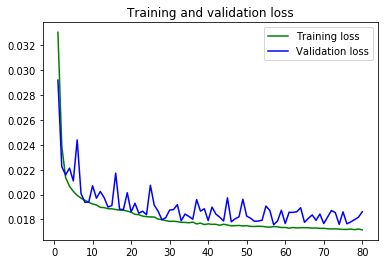

In [34]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(train_loss) + 1)
plt.figure()
plt.plot(epochs, train_loss, 'g', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [35]:
print('Train MAE = %f\nValidation MAE = %f' % ((train_loss[-1] * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min())),
                                               (val_loss[-1] * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min()))))

Train MAE = 1.824725
Validation MAE = 1.980142


In [36]:
as5_train_preds = model.predict_generator(gen_train, workers=4, use_multiprocessing=True)
as5_train_preds.shape

(18304, 1)

In [55]:
as5_train_preds_withnan = np.full((as5_train_split.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_train_split)):
    if as5_train_split[i, 0] > -1:
        as5_train_preds_withnan[i] = as5_train_preds[j]
        j += 1
as5_train_preds_withnan.shape

(20000, 1)

In [37]:
as5_val_preds = model.predict_generator(gen_val, workers=4, use_multiprocessing=True)
as5_val_preds.shape

(11223, 1)

In [57]:
as5_val_preds_withnan = np.full((as5_val_split.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_val_split)):
    if as5_val_split[i, 0] > -1:
        as5_val_preds_withnan[i] = as5_val_preds[j]
        j += 1
as5_val_preds_withnan.shape

(11616, 1)

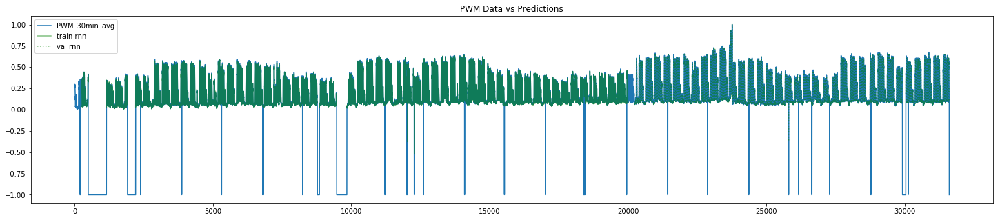

In [58]:
plt.figure(figsize=(25, 5))
plt.plot(range(as5_train_data.shape[0]), as5_train_data[:, 0], label='PWM_30min_avg')
plt.plot(range(as5_train_split.shape[0]), as5_train_preds_withnan.flatten(), color='green', alpha=.5, label='train rnn')
plt.plot(range(20000, 20000 + as5_val_split.shape[0]), as5_val_preds_withnan.flatten(), color='green', alpha=.5, label='val rnn', linestyle=':')
plt.title('PWM Data vs Predictions')
plt.legend()

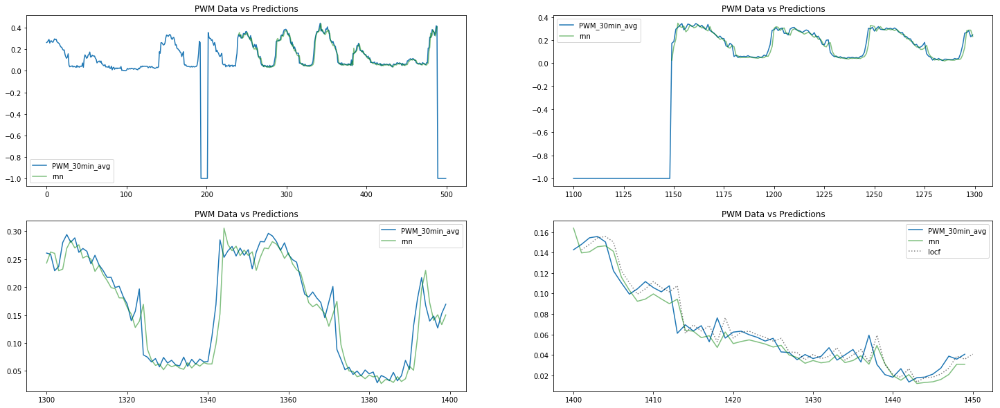

In [62]:
plt.figure(figsize=(25, 10))
plt.subplot(221)
plt.plot(range(500), as5_train_data[:500, 0], label='PWM_30min_avg')
plt.plot(range(500), as5_train_preds_withnan[:500, :].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Data vs Predictions')
plt.legend()
plt.subplot(222)
plt.plot(range(1100, 1300), as5_train_data[1100:1300, 0], label='PWM_30min_avg')
plt.plot(range(1100, 1300), as5_train_preds_withnan[1100:1300].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Data vs Predictions')
plt.legend()
plt.subplot(223)
plt.plot(range(1300, 1400), as5_train_data[1300:1400, 0], label='PWM_30min_avg')
plt.plot(range(1300, 1400), as5_train_preds_withnan[1300:1400].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Data vs Predictions')
plt.legend()
plt.subplot(224)
plt.plot(range(1400, 1450), as5_train_data[1400:1450, 0], label='PWM_30min_avg')
plt.plot(range(1400, 1450), as5_train_preds_withnan[1400:1450].flatten(), color='green', alpha=.5, label='rnn')
plt.plot(range(1401, 1451), as5_train_data[1400:1450, 0], color='black', alpha=.5, label='locf', linestyle=':')  ## locf is data with lag -1 
plt.title('PWM Data vs Predictions')
plt.legend()

In [63]:
model.save('base-rnn-nomask-val.h5')

## Base RNN Model with Mask

In [64]:
model = Sequential()
model.add(layers.Masking(mask_value=-1, input_shape=(None, as5_train_split.shape[-1])))
model.add(layers.GRU(16, ))
model.add(layers.Dense(1))
model.compile(optimizer=RMSprop(), loss='mae', metrics=['mape'])

In [65]:
t1 = datetime.datetime.now()
history_mask = model.fit_generator(generator=gen_train, epochs=80,
                                   validation_data=gen_val,
                                   workers=4, use_multiprocessing=True, shuffle=True)
print('\nTraining Duration = %s' % (datetime.datetime.now()-t1))

Epoch 1/80


  1/143 [..............................] - ETA: 2:38 - loss: 0.1196 - mean_absolute_percentage_error: 119.4169

  2/143 [..............................] - ETA: 1:31 - loss: 0.1759 - mean_absolute_percentage_error: 117.8010

  3/143 [..............................] - ETA: 1:09 - loss: 0.2131 - mean_absolute_percentage_error: 113.1117

  4/143 [..............................] - ETA: 57s - loss: 0.1913 - mean_absolute_percentage_error: 105.6403 

  5/143 [>.............................] - ETA: 51s - loss: 0.1732 - mean_absolute_percentage_error: 96.4285 

  6/143 [>.............................] - ETA: 46s - loss: 0.1657 - mean_absolute_percentage_error: 88.6714

  7/143 [>.............................] - ETA: 43s - loss: 0.1690 - mean_absolute_percentage_error: 86.0543

  8/143 [>.............................] - ETA: 40s - loss: 0.1529 - mean_absolute_percentage_error: 78.6041

  9/143 [>.............................] - ETA: 38s - loss: 0.1579 - mean_absolute_percentage_error: 77.0700

 10/143 [=>............................] - ETA: 36s - loss: 0.1671 - mean_absolute_percentage_error: 75.9971

 11/143 [=>............................] - ETA: 34s - loss: 0.1669 - mean_absolute_percentage_error: 74.0575

 12/143 [=>............................] - ETA: 33s - loss: 0.1585 - mean_absolute_percentage_error: 71.7363

 13/143 [=>............................] - ETA: 32s - loss: 0.1524 - mean_absolute_percentage_error: 68.8134

 14/143 [=>............................] - ETA: 31s - loss: 0.1527 - mean_absolute_percentage_error: 67.9138

 15/143 [==>...........................] - ETA: 30s - loss: 0.1597 - mean_absolute_percentage_error: 67.1269

 16/143 [==>...........................] - ETA: 30s - loss: 0.1529 - mean_absolute_percentage_error: 66.7682

 17/143 [==>...........................] - ETA: 29s - loss: 0.1472 - mean_absolute_percentage_error: 64.7904

 18/143 [==>...........................] - ETA: 28s - loss: 0.1464 - mean_absolute_percentage_error: 64.8740

 19/143 [==>...........................] - ETA: 28s - loss: 0.1436 - mean_absolute_percentage_error: 64.8061

 20/143 [===>..........................] - ETA: 27s - loss: 0.1449 - mean_absolute_percentage_error: 63.6868

 21/143 [===>..........................] - ETA: 26s - loss: 0.1429 - mean_absolute_percentage_error: 62.6298

 22/143 [===>..........................] - ETA: 26s - loss: 0.1420 - mean_absolute_percentage_error: 62.1284

 23/143 [===>..........................] - ETA: 25s - loss: 0.1410 - mean_absolute_percentage_error: 61.9631

 24/143 [====>.........................] - ETA: 25s - loss: 0.1378 - mean_absolute_percentage_error: 62.0814

 25/143 [====>.........................] - ETA: 25s - loss: 0.1348 - mean_absolute_percentage_error: 62.9213

 26/143 [====>.........................] - ETA: 24s - loss: 0.1332 - mean_absolute_percentage_error: 63.0886

 27/143 [====>.........................] - ETA: 24s - loss: 0.1303 - mean_absolute_percentage_error: 62.0828

 28/143 [====>.........................] - ETA: 23s - loss: 0.1302 - mean_absolute_percentage_error: 61.7871

 29/143 [=====>........................] - ETA: 23s - loss: 0.1264 - mean_absolute_percentage_error: 60.6665

 30/143 [=====>........................] - ETA: 23s - loss: 0.1258 - mean_absolute_percentage_error: 59.9962

 31/143 [=====>........................] - ETA: 22s - loss: 0.1257 - mean_absolute_percentage_error: 59.5338

 32/143 [=====>........................] - ETA: 22s - loss: 0.1240 - mean_absolute_percentage_error: 59.1025

 33/143 [=====>........................] - ETA: 22s - loss: 0.1247 - mean_absolute_percentage_error: 58.7234

 34/143 [======>.......................] - ETA: 21s - loss: 0.1225 - mean_absolute_percentage_error: 57.9763

 35/143 [======>.......................] - ETA: 21s - loss: 0.1227 - mean_absolute_percentage_error: 57.4332

 36/143 [======>.......................] - ETA: 21s - loss: 0.1212 - mean_absolute_percentage_error: 56.6622

 37/143 [======>.......................] - ETA: 20s - loss: 0.1213 - mean_absolute_percentage_error: 56.5957

 38/143 [======>.......................] - ETA: 20s - loss: 0.1202 - mean_absolute_percentage_error: 56.6035

 39/143 [=======>......................] - ETA: 20s - loss: 0.1203 - mean_absolute_percentage_error: 56.6820

 40/143 [=======>......................] - ETA: 19s - loss: 0.1196 - mean_absolute_percentage_error: 56.6679

 41/143 [=======>......................] - ETA: 19s - loss: 0.1186 - mean_absolute_percentage_error: 56.2708

 42/143 [=======>......................] - ETA: 19s - loss: 0.1184 - mean_absolute_percentage_error: 55.8231

 43/143 [========>.....................] - ETA: 19s - loss: 0.1171 - mean_absolute_percentage_error: 56.1355

 44/143 [========>.....................] - ETA: 18s - loss: 0.1166 - mean_absolute_percentage_error: 56.0979

 45/143 [========>.....................] - ETA: 18s - loss: 0.1151 - mean_absolute_percentage_error: 55.5563

 46/143 [========>.....................] - ETA: 18s - loss: 0.1148 - mean_absolute_percentage_error: 55.1123

 47/143 [========>.....................] - ETA: 18s - loss: 0.1146 - mean_absolute_percentage_error: 54.8651

 48/143 [=========>....................] - ETA: 17s - loss: 0.1134 - mean_absolute_percentage_error: 55.1018

 49/143 [=========>....................] - ETA: 17s - loss: 0.1128 - mean_absolute_percentage_error: 55.0704

 50/143 [=========>....................] - ETA: 17s - loss: 0.1127 - mean_absolute_percentage_error: 54.7051

 51/143 [=========>....................] - ETA: 17s - loss: 0.1116 - mean_absolute_percentage_error: 54.2629

 52/143 [=========>....................] - ETA: 16s - loss: 0.1105 - mean_absolute_percentage_error: 53.7908

 53/143 [==========>...................] - ETA: 16s - loss: 0.1092 - mean_absolute_percentage_error: 53.2470

 54/143 [==========>...................] - ETA: 16s - loss: 0.1082 - mean_absolute_percentage_error: 52.7385

 55/143 [==========>...................] - ETA: 16s - loss: 0.1069 - mean_absolute_percentage_error: 52.5462

 56/143 [==========>...................] - ETA: 16s - loss: 0.1060 - mean_absolute_percentage_error: 52.1838

 57/143 [==========>...................] - ETA: 15s - loss: 0.1050 - mean_absolute_percentage_error: 51.6505

 58/143 [===========>..................] - ETA: 15s - loss: 0.1051 - mean_absolute_percentage_error: 51.5501

 59/143 [===========>..................] - ETA: 15s - loss: 0.1042 - mean_absolute_percentage_error: 51.1818

 60/143 [===========>..................] - ETA: 15s - loss: 0.1035 - mean_absolute_percentage_error: 51.3077

 61/143 [===========>..................] - ETA: 15s - loss: 0.1027 - mean_absolute_percentage_error: 50.9670

 62/143 [============>.................] - ETA: 14s - loss: 0.1022 - mean_absolute_percentage_error: 50.6673

 63/143 [============>.................] - ETA: 14s - loss: 0.1018 - mean_absolute_percentage_error: 50.3346

 64/143 [============>.................] - ETA: 14s - loss: 0.1018 - mean_absolute_percentage_error: 50.0657

 65/143 [============>.................] - ETA: 14s - loss: 0.1013 - mean_absolute_percentage_error: 49.7475

 66/143 [============>.................] - ETA: 14s - loss: 0.1007 - mean_absolute_percentage_error: 49.8396

 67/143 [=============>................] - ETA: 13s - loss: 0.1003 - mean_absolute_percentage_error: 49.7700

 68/143 [=============>................] - ETA: 13s - loss: 0.0996 - mean_absolute_percentage_error: 49.6310

 69/143 [=============>................] - ETA: 13s - loss: 0.0995 - mean_absolute_percentage_error: 49.5201

 70/143 [=============>................] - ETA: 13s - loss: 0.0990 - mean_absolute_percentage_error: 49.2475

 71/143 [=============>................] - ETA: 13s - loss: 0.0985 - mean_absolute_percentage_error: 49.0831

 72/143 [==============>...............] - ETA: 12s - loss: 0.0981 - mean_absolute_percentage_error: 49.0101

 73/143 [==============>...............] - ETA: 12s - loss: 0.0973 - mean_absolute_percentage_error: 48.7882

 74/143 [==============>...............] - ETA: 12s - loss: 0.0965 - mean_absolute_percentage_error: 48.4518

 75/143 [==============>...............] - ETA: 12s - loss: 0.0957 - mean_absolute_percentage_error: 48.1634

 76/143 [==============>...............] - ETA: 12s - loss: 0.0951 - mean_absolute_percentage_error: 47.9988

 77/143 [===============>..............] - ETA: 11s - loss: 0.0945 - mean_absolute_percentage_error: 47.7259

 78/143 [===============>..............] - ETA: 11s - loss: 0.0943 - mean_absolute_percentage_error: 48.3868

 79/143 [===============>..............] - ETA: 11s - loss: 0.0937 - mean_absolute_percentage_error: 48.4735

 80/143 [===============>..............] - ETA: 11s - loss: 0.0933 - mean_absolute_percentage_error: 48.1976

 81/143 [===============>..............] - ETA: 11s - loss: 0.0927 - mean_absolute_percentage_error: 47.9022

 82/143 [================>.............] - ETA: 10s - loss: 0.0920 - mean_absolute_percentage_error: 47.5970

 83/143 [================>.............] - ETA: 10s - loss: 0.0914 - mean_absolute_percentage_error: 47.3465

 84/143 [================>.............] - ETA: 10s - loss: 0.0908 - mean_absolute_percentage_error: 47.1243

 85/143 [================>.............] - ETA: 10s - loss: 0.0905 - mean_absolute_percentage_error: 46.9969

 86/143 [=================>............] - ETA: 10s - loss: 0.0899 - mean_absolute_percentage_error: 46.7059

 87/143 [=================>............] - ETA: 9s - loss: 0.0894 - mean_absolute_percentage_error: 46.6663 

 88/143 [=================>............] - ETA: 9s - loss: 0.0888 - mean_absolute_percentage_error: 46.3802

 89/143 [=================>............] - ETA: 9s - loss: 0.0885 - mean_absolute_percentage_error: 46.2390

 90/143 [=================>............] - ETA: 9s - loss: 0.0879 - mean_absolute_percentage_error: 46.0363

 91/143 [==================>...........] - ETA: 9s - loss: 0.0873 - mean_absolute_percentage_error: 45.8591

 92/143 [==================>...........] - ETA: 9s - loss: 0.0868 - mean_absolute_percentage_error: 45.5623

 93/143 [==================>...........] - ETA: 8s - loss: 0.0864 - mean_absolute_percentage_error: 45.3948

 94/143 [==================>...........] - ETA: 8s - loss: 0.0857 - mean_absolute_percentage_error: 45.4797

 95/143 [==================>...........] - ETA: 8s - loss: 0.0852 - mean_absolute_percentage_error: 45.2489

 96/143 [===================>..........] - ETA: 8s - loss: 0.0849 - mean_absolute_percentage_error: 45.1144

 97/143 [===================>..........] - ETA: 8s - loss: 0.0844 - mean_absolute_percentage_error: 45.0211

 98/143 [===================>..........] - ETA: 7s - loss: 0.0840 - mean_absolute_percentage_error: 44.7822

 99/143 [===================>..........] - ETA: 7s - loss: 0.0837 - mean_absolute_percentage_error: 44.8303

100/143 [===================>..........] - ETA: 7s - loss: 0.0833 - mean_absolute_percentage_error: 44.5993

101/143 [====================>.........] - ETA: 7s - loss: 0.0832 - mean_absolute_percentage_error: 44.4563

102/143 [====================>.........] - ETA: 7s - loss: 0.0827 - mean_absolute_percentage_error: 44.2494

103/143 [====================>.........] - ETA: 7s - loss: 0.0821 - mean_absolute_percentage_error: 44.0145

104/143 [====================>.........] - ETA: 6s - loss: 0.0819 - mean_absolute_percentage_error: 43.9739

105/143 [=====================>........] - ETA: 6s - loss: 0.0817 - mean_absolute_percentage_error: 43.8416

106/143 [=====================>........] - ETA: 6s - loss: 0.0814 - mean_absolute_percentage_error: 43.7500

107/143 [=====================>........] - ETA: 6s - loss: 0.0810 - mean_absolute_percentage_error: 43.5678

108/143 [=====================>........] - ETA: 6s - loss: 0.0806 - mean_absolute_percentage_error: 43.3713

109/143 [=====================>........] - ETA: 5s - loss: 0.0805 - mean_absolute_percentage_error: 43.2860

110/143 [======================>.......] - ETA: 5s - loss: 0.0801 - mean_absolute_percentage_error: 43.0759

111/143 [======================>.......] - ETA: 5s - loss: 0.0797 - mean_absolute_percentage_error: 42.9823

112/143 [======================>.......] - ETA: 5s - loss: 0.0795 - mean_absolute_percentage_error: 42.8675

113/143 [======================>.......] - ETA: 5s - loss: 0.0793 - mean_absolute_percentage_error: 42.9062

114/143 [======================>.......] - ETA: 5s - loss: 0.0790 - mean_absolute_percentage_error: 42.7563

115/143 [=======================>......] - ETA: 4s - loss: 0.0786 - mean_absolute_percentage_error: 42.6267

116/143 [=======================>......] - ETA: 4s - loss: 0.0784 - mean_absolute_percentage_error: 42.4925

117/143 [=======================>......] - ETA: 4s - loss: 0.0782 - mean_absolute_percentage_error: 42.3774

118/143 [=======================>......] - ETA: 4s - loss: 0.0778 - mean_absolute_percentage_error: 42.3099

119/143 [=======================>......] - ETA: 4s - loss: 0.0774 - mean_absolute_percentage_error: 42.1254

120/143 [========================>.....] - ETA: 3s - loss: 0.0771 - mean_absolute_percentage_error: 41.9713

121/143 [========================>.....] - ETA: 3s - loss: 0.0768 - mean_absolute_percentage_error: 41.9772

122/143 [========================>.....] - ETA: 3s - loss: 0.0768 - mean_absolute_percentage_error: 41.8897

123/143 [========================>.....] - ETA: 3s - loss: 0.0766 - mean_absolute_percentage_error: 41.7368

124/143 [=========================>....] - ETA: 3s - loss: 0.0764 - mean_absolute_percentage_error: 41.5935

125/143 [=========================>....] - ETA: 3s - loss: 0.0762 - mean_absolute_percentage_error: 41.6116

126/143 [=========================>....] - ETA: 2s - loss: 0.0760 - mean_absolute_percentage_error: 41.4452

127/143 [=========================>....] - ETA: 2s - loss: 0.0757 - mean_absolute_percentage_error: 41.4290

128/143 [=========================>....] - ETA: 2s - loss: 0.0754 - mean_absolute_percentage_error: 41.2764

129/143 [==========================>...] - ETA: 2s - loss: 0.0751 - mean_absolute_percentage_error: 41.1642

130/143 [==========================>...] - ETA: 2s - loss: 0.0748 - mean_absolute_percentage_error: 40.9944

131/143 [==========================>...] - ETA: 2s - loss: 0.0745 - mean_absolute_percentage_error: 40.9013

132/143 [==========================>...] - ETA: 1s - loss: 0.0742 - mean_absolute_percentage_error: 40.7455

133/143 [==========================>...] - ETA: 1s - loss: 0.0742 - mean_absolute_percentage_error: 40.6917

134/143 [===========================>..] - ETA: 1s - loss: 0.0740 - mean_absolute_percentage_error: 40.5711

135/143 [===========================>..] - ETA: 1s - loss: 0.0737 - mean_absolute_percentage_error: 40.4039

136/143 [===========================>..] - ETA: 1s - loss: 0.0735 - mean_absolute_percentage_error: 40.3145

137/143 [===========================>..] - ETA: 1s - loss: 0.0734 - mean_absolute_percentage_error: 40.2066

138/143 [===========================>..] - ETA: 0s - loss: 0.0731 - mean_absolute_percentage_error: 40.0861

139/143 [============================>.] - ETA: 0s - loss: 0.0728 - mean_absolute_percentage_error: 39.9376

140/143 [============================>.] - ETA: 0s - loss: 0.0725 - mean_absolute_percentage_error: 39.7813

141/143 [============================>.] - ETA: 0s - loss: 0.0724 - mean_absolute_percentage_error: 39.6933

142/143 [============================>.] - ETA: 0s - loss: 0.0724 - mean_absolute_percentage_error: 39.5892

143/143 [==============================] - 30s 208ms/step - loss: 0.0723 - mean_absolute_percentage_error: 39.4585 - val_loss: 0.0522 - val_mean_absolute_percentage_error: 27.5571


Epoch 2/80


  1/143 [..............................] - ETA: 32s - loss: 0.0401 - mean_absolute_percentage_error: 20.6428

  2/143 [..............................] - ETA: 28s - loss: 0.0437 - mean_absolute_percentage_error: 24.4954

  3/143 [..............................] - ETA: 27s - loss: 0.0434 - mean_absolute_percentage_error: 32.5226

  4/143 [..............................] - ETA: 26s - loss: 0.0423 - mean_absolute_percentage_error: 33.1087

  5/143 [>.............................] - ETA: 25s - loss: 0.0399 - mean_absolute_percentage_error: 29.8583

  6/143 [>.............................] - ETA: 24s - loss: 0.0418 - mean_absolute_percentage_error: 29.5753

  7/143 [>.............................] - ETA: 24s - loss: 0.0423 - mean_absolute_percentage_error: 30.1532

  8/143 [>.............................] - ETA: 23s - loss: 0.0429 - mean_absolute_percentage_error: 30.4845

  9/143 [>.............................] - ETA: 23s - loss: 0.0471 - mean_absolute_percentage_error: 30.0193

 10/143 [=>............................] - ETA: 23s - loss: 0.0466 - mean_absolute_percentage_error: 29.6618

 11/143 [=>............................] - ETA: 23s - loss: 0.0450 - mean_absolute_percentage_error: 29.5861

 12/143 [=>............................] - ETA: 22s - loss: 0.0465 - mean_absolute_percentage_error: 29.3569

 13/143 [=>............................] - ETA: 22s - loss: 0.0466 - mean_absolute_percentage_error: 28.9013

 14/143 [=>............................] - ETA: 22s - loss: 0.0454 - mean_absolute_percentage_error: 28.4349

 15/143 [==>...........................] - ETA: 22s - loss: 0.0433 - mean_absolute_percentage_error: 27.6185

 16/143 [==>...........................] - ETA: 21s - loss: 0.0431 - mean_absolute_percentage_error: 27.8344

 17/143 [==>...........................] - ETA: 21s - loss: 0.0438 - mean_absolute_percentage_error: 27.6218

 18/143 [==>...........................] - ETA: 21s - loss: 0.0430 - mean_absolute_percentage_error: 26.9169

 19/143 [==>...........................] - ETA: 21s - loss: 0.0433 - mean_absolute_percentage_error: 27.6524

 20/143 [===>..........................] - ETA: 21s - loss: 0.0437 - mean_absolute_percentage_error: 27.3081

 21/143 [===>..........................] - ETA: 20s - loss: 0.0432 - mean_absolute_percentage_error: 26.9654

 22/143 [===>..........................] - ETA: 20s - loss: 0.0429 - mean_absolute_percentage_error: 26.7528

 23/143 [===>..........................] - ETA: 20s - loss: 0.0428 - mean_absolute_percentage_error: 26.4767

 24/143 [====>.........................] - ETA: 20s - loss: 0.0422 - mean_absolute_percentage_error: 26.0014

 25/143 [====>.........................] - ETA: 20s - loss: 0.0437 - mean_absolute_percentage_error: 26.1265

 26/143 [====>.........................] - ETA: 19s - loss: 0.0434 - mean_absolute_percentage_error: 25.8214

 27/143 [====>.........................] - ETA: 19s - loss: 0.0428 - mean_absolute_percentage_error: 25.9265

 28/143 [====>.........................] - ETA: 19s - loss: 0.0423 - mean_absolute_percentage_error: 25.6161

 29/143 [=====>........................] - ETA: 19s - loss: 0.0424 - mean_absolute_percentage_error: 25.3373

 30/143 [=====>........................] - ETA: 19s - loss: 0.0422 - mean_absolute_percentage_error: 25.4446

 31/143 [=====>........................] - ETA: 18s - loss: 0.0416 - mean_absolute_percentage_error: 25.4499

 32/143 [=====>........................] - ETA: 18s - loss: 0.0412 - mean_absolute_percentage_error: 25.1242

 33/143 [=====>........................] - ETA: 18s - loss: 0.0407 - mean_absolute_percentage_error: 25.2726

 34/143 [======>.......................] - ETA: 18s - loss: 0.0405 - mean_absolute_percentage_error: 25.1829

 35/143 [======>.......................] - ETA: 18s - loss: 0.0403 - mean_absolute_percentage_error: 25.1606

 36/143 [======>.......................] - ETA: 17s - loss: 0.0411 - mean_absolute_percentage_error: 25.1543

 37/143 [======>.......................] - ETA: 17s - loss: 0.0408 - mean_absolute_percentage_error: 24.9014

 38/143 [======>.......................] - ETA: 17s - loss: 0.0413 - mean_absolute_percentage_error: 24.7747

 39/143 [=======>......................] - ETA: 17s - loss: 0.0410 - mean_absolute_percentage_error: 24.7142

 40/143 [=======>......................] - ETA: 17s - loss: 0.0407 - mean_absolute_percentage_error: 24.7144

 41/143 [=======>......................] - ETA: 17s - loss: 0.0411 - mean_absolute_percentage_error: 24.6787

 42/143 [=======>......................] - ETA: 16s - loss: 0.0408 - mean_absolute_percentage_error: 24.4914

 43/143 [========>.....................] - ETA: 16s - loss: 0.0407 - mean_absolute_percentage_error: 24.3294

 44/143 [========>.....................] - ETA: 16s - loss: 0.0405 - mean_absolute_percentage_error: 24.1573

 45/143 [========>.....................] - ETA: 16s - loss: 0.0406 - mean_absolute_percentage_error: 24.1210

 46/143 [========>.....................] - ETA: 16s - loss: 0.0405 - mean_absolute_percentage_error: 23.9977

 47/143 [========>.....................] - ETA: 16s - loss: 0.0405 - mean_absolute_percentage_error: 24.2265

 48/143 [=========>....................] - ETA: 15s - loss: 0.0402 - mean_absolute_percentage_error: 24.1136

 49/143 [=========>....................] - ETA: 15s - loss: 0.0399 - mean_absolute_percentage_error: 23.9135

 50/143 [=========>....................] - ETA: 15s - loss: 0.0403 - mean_absolute_percentage_error: 23.8692

 51/143 [=========>....................] - ETA: 15s - loss: 0.0402 - mean_absolute_percentage_error: 23.8209

 52/143 [=========>....................] - ETA: 15s - loss: 0.0403 - mean_absolute_percentage_error: 23.7295

 53/143 [==========>...................] - ETA: 15s - loss: 0.0404 - mean_absolute_percentage_error: 23.7794

 54/143 [==========>...................] - ETA: 14s - loss: 0.0402 - mean_absolute_percentage_error: 23.8023

 55/143 [==========>...................] - ETA: 14s - loss: 0.0400 - mean_absolute_percentage_error: 23.7456

 56/143 [==========>...................] - ETA: 14s - loss: 0.0400 - mean_absolute_percentage_error: 23.7099

 57/143 [==========>...................] - ETA: 14s - loss: 0.0398 - mean_absolute_percentage_error: 23.5643

 58/143 [===========>..................] - ETA: 14s - loss: 0.0399 - mean_absolute_percentage_error: 23.5013

 59/143 [===========>..................] - ETA: 14s - loss: 0.0397 - mean_absolute_percentage_error: 23.4948

 60/143 [===========>..................] - ETA: 13s - loss: 0.0395 - mean_absolute_percentage_error: 23.3514

 61/143 [===========>..................] - ETA: 13s - loss: 0.0391 - mean_absolute_percentage_error: 23.2031

 62/143 [============>.................] - ETA: 13s - loss: 0.0388 - mean_absolute_percentage_error: 23.0698

 63/143 [============>.................] - ETA: 13s - loss: 0.0389 - mean_absolute_percentage_error: 23.0638

 64/143 [============>.................] - ETA: 13s - loss: 0.0387 - mean_absolute_percentage_error: 23.0275

 65/143 [============>.................] - ETA: 13s - loss: 0.0386 - mean_absolute_percentage_error: 22.9500

 66/143 [============>.................] - ETA: 12s - loss: 0.0384 - mean_absolute_percentage_error: 22.8701

 67/143 [=============>................] - ETA: 12s - loss: 0.0388 - mean_absolute_percentage_error: 22.8460

 68/143 [=============>................] - ETA: 12s - loss: 0.0386 - mean_absolute_percentage_error: 22.7947

 69/143 [=============>................] - ETA: 12s - loss: 0.0383 - mean_absolute_percentage_error: 22.6437

 70/143 [=============>................] - ETA: 12s - loss: 0.0384 - mean_absolute_percentage_error: 22.7039

 71/143 [=============>................] - ETA: 12s - loss: 0.0382 - mean_absolute_percentage_error: 22.5981

 72/143 [==============>...............] - ETA: 11s - loss: 0.0380 - mean_absolute_percentage_error: 22.5199

 73/143 [==============>...............] - ETA: 11s - loss: 0.0379 - mean_absolute_percentage_error: 22.4397

 74/143 [==============>...............] - ETA: 11s - loss: 0.0381 - mean_absolute_percentage_error: 22.3805

 75/143 [==============>...............] - ETA: 11s - loss: 0.0381 - mean_absolute_percentage_error: 22.4571

 76/143 [==============>...............] - ETA: 11s - loss: 0.0380 - mean_absolute_percentage_error: 22.7768

 77/143 [===============>..............] - ETA: 11s - loss: 0.0379 - mean_absolute_percentage_error: 22.6867

 78/143 [===============>..............] - ETA: 10s - loss: 0.0379 - mean_absolute_percentage_error: 22.5937

 79/143 [===============>..............] - ETA: 10s - loss: 0.0377 - mean_absolute_percentage_error: 22.7788

 80/143 [===============>..............] - ETA: 10s - loss: 0.0377 - mean_absolute_percentage_error: 22.6946

 81/143 [===============>..............] - ETA: 10s - loss: 0.0375 - mean_absolute_percentage_error: 22.5945

 82/143 [================>.............] - ETA: 10s - loss: 0.0375 - mean_absolute_percentage_error: 22.5632

 83/143 [================>.............] - ETA: 10s - loss: 0.0375 - mean_absolute_percentage_error: 22.5343

 84/143 [================>.............] - ETA: 9s - loss: 0.0372 - mean_absolute_percentage_error: 22.4409 

 85/143 [================>.............] - ETA: 9s - loss: 0.0371 - mean_absolute_percentage_error: 22.3491

 86/143 [=================>............] - ETA: 9s - loss: 0.0370 - mean_absolute_percentage_error: 22.2643

 87/143 [=================>............] - ETA: 9s - loss: 0.0368 - mean_absolute_percentage_error: 22.2175

 88/143 [=================>............] - ETA: 9s - loss: 0.0368 - mean_absolute_percentage_error: 22.1877

 89/143 [=================>............] - ETA: 9s - loss: 0.0368 - mean_absolute_percentage_error: 22.1525

 90/143 [=================>............] - ETA: 8s - loss: 0.0368 - mean_absolute_percentage_error: 22.0899

 91/143 [==================>...........] - ETA: 8s - loss: 0.0367 - mean_absolute_percentage_error: 21.9918

 92/143 [==================>...........] - ETA: 8s - loss: 0.0366 - mean_absolute_percentage_error: 22.0351

 93/143 [==================>...........] - ETA: 8s - loss: 0.0365 - mean_absolute_percentage_error: 21.9733

 94/143 [==================>...........] - ETA: 8s - loss: 0.0365 - mean_absolute_percentage_error: 21.8913

 95/143 [==================>...........] - ETA: 8s - loss: 0.0364 - mean_absolute_percentage_error: 21.9631

 96/143 [===================>..........] - ETA: 7s - loss: 0.0363 - mean_absolute_percentage_error: 21.9186

 97/143 [===================>..........] - ETA: 7s - loss: 0.0364 - mean_absolute_percentage_error: 21.8717

 98/143 [===================>..........] - ETA: 7s - loss: 0.0364 - mean_absolute_percentage_error: 21.8362

 99/143 [===================>..........] - ETA: 7s - loss: 0.0364 - mean_absolute_percentage_error: 21.8024

100/143 [===================>..........] - ETA: 7s - loss: 0.0363 - mean_absolute_percentage_error: 21.7236

101/143 [====================>.........] - ETA: 7s - loss: 0.0361 - mean_absolute_percentage_error: 21.6413

102/143 [====================>.........] - ETA: 6s - loss: 0.0360 - mean_absolute_percentage_error: 21.5823

103/143 [====================>.........] - ETA: 6s - loss: 0.0360 - mean_absolute_percentage_error: 21.5495

104/143 [====================>.........] - ETA: 6s - loss: 0.0361 - mean_absolute_percentage_error: 21.6331

105/143 [=====================>........] - ETA: 6s - loss: 0.0360 - mean_absolute_percentage_error: 21.6376

106/143 [=====================>........] - ETA: 6s - loss: 0.0360 - mean_absolute_percentage_error: 21.5900

107/143 [=====================>........] - ETA: 6s - loss: 0.0359 - mean_absolute_percentage_error: 21.5943

108/143 [=====================>........] - ETA: 5s - loss: 0.0360 - mean_absolute_percentage_error: 21.5596

109/143 [=====================>........] - ETA: 5s - loss: 0.0358 - mean_absolute_percentage_error: 21.5250

110/143 [======================>.......] - ETA: 5s - loss: 0.0358 - mean_absolute_percentage_error: 21.4946

111/143 [======================>.......] - ETA: 5s - loss: 0.0356 - mean_absolute_percentage_error: 21.4316

112/143 [======================>.......] - ETA: 5s - loss: 0.0355 - mean_absolute_percentage_error: 21.3933

113/143 [======================>.......] - ETA: 5s - loss: 0.0354 - mean_absolute_percentage_error: 21.3310

114/143 [======================>.......] - ETA: 4s - loss: 0.0353 - mean_absolute_percentage_error: 21.2442

115/143 [=======================>......] - ETA: 4s - loss: 0.0352 - mean_absolute_percentage_error: 21.2527

116/143 [=======================>......] - ETA: 4s - loss: 0.0351 - mean_absolute_percentage_error: 21.1823

117/143 [=======================>......] - ETA: 4s - loss: 0.0350 - mean_absolute_percentage_error: 21.0971

118/143 [=======================>......] - ETA: 4s - loss: 0.0349 - mean_absolute_percentage_error: 21.2713

119/143 [=======================>......] - ETA: 4s - loss: 0.0348 - mean_absolute_percentage_error: 21.2172

120/143 [========================>.....] - ETA: 3s - loss: 0.0347 - mean_absolute_percentage_error: 21.1779

121/143 [========================>.....] - ETA: 3s - loss: 0.0346 - mean_absolute_percentage_error: 21.1411

122/143 [========================>.....] - ETA: 3s - loss: 0.0346 - mean_absolute_percentage_error: 21.0955

123/143 [========================>.....] - ETA: 3s - loss: 0.0346 - mean_absolute_percentage_error: 21.1432

124/143 [=========================>....] - ETA: 3s - loss: 0.0345 - mean_absolute_percentage_error: 21.0853

125/143 [=========================>....] - ETA: 3s - loss: 0.0345 - mean_absolute_percentage_error: 21.0381

126/143 [=========================>....] - ETA: 2s - loss: 0.0346 - mean_absolute_percentage_error: 21.0757

127/143 [=========================>....] - ETA: 2s - loss: 0.0345 - mean_absolute_percentage_error: 21.0315

128/143 [=========================>....] - ETA: 2s - loss: 0.0344 - mean_absolute_percentage_error: 20.9700

129/143 [==========================>...] - ETA: 2s - loss: 0.0343 - mean_absolute_percentage_error: 20.9231

130/143 [==========================>...] - ETA: 2s - loss: 0.0341 - mean_absolute_percentage_error: 20.9138

131/143 [==========================>...] - ETA: 1s - loss: 0.0340 - mean_absolute_percentage_error: 20.8544

132/143 [==========================>...] - ETA: 1s - loss: 0.0340 - mean_absolute_percentage_error: 20.8310

133/143 [==========================>...] - ETA: 1s - loss: 0.0341 - mean_absolute_percentage_error: 20.7954

134/143 [===========================>..] - ETA: 1s - loss: 0.0340 - mean_absolute_percentage_error: 20.8239

135/143 [===========================>..] - ETA: 1s - loss: 0.0340 - mean_absolute_percentage_error: 20.7949

136/143 [===========================>..] - ETA: 1s - loss: 0.0340 - mean_absolute_percentage_error: 20.7689

137/143 [===========================>..] - ETA: 0s - loss: 0.0339 - mean_absolute_percentage_error: 20.7275

138/143 [===========================>..] - ETA: 0s - loss: 0.0338 - mean_absolute_percentage_error: 20.7075

139/143 [============================>.] - ETA: 0s - loss: 0.0338 - mean_absolute_percentage_error: 20.6755

140/143 [============================>.] - ETA: 0s - loss: 0.0337 - mean_absolute_percentage_error: 20.6437

141/143 [============================>.] - ETA: 0s - loss: 0.0336 - mean_absolute_percentage_error: 20.5977

142/143 [============================>.] - ETA: 0s - loss: 0.0335 - mean_absolute_percentage_error: 20.5349

143/143 [==============================] - 28s 197ms/step - loss: 0.0335 - mean_absolute_percentage_error: 20.5178 - val_loss: 0.0294 - val_mean_absolute_percentage_error: 14.1984


Epoch 3/80
  1/143 [..............................] - ETA: 25s - loss: 0.0254 - mean_absolute_percentage_error: 10.7184

  2/143 [..............................] - ETA: 24s - loss: 0.0225 - mean_absolute_percentage_error: 12.8315

  3/143 [..............................] - ETA: 24s - loss: 0.0238 - mean_absolute_percentage_error: 14.2352

  4/143 [..............................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 15.0299

  5/143 [>.............................] - ETA: 23s - loss: 0.0255 - mean_absolute_percentage_error: 15.2301

  6/143 [>.............................] - ETA: 23s - loss: 0.0260 - mean_absolute_percentage_error: 15.2922

  7/143 [>.............................] - ETA: 23s - loss: 0.0269 - mean_absolute_percentage_error: 15.6164

  8/143 [>.............................] - ETA: 22s - loss: 0.0278 - mean_absolute_percentage_error: 15.3840

  9/143 [>.............................] - ETA: 22s - loss: 0.0289 - mean_absolute_percentage_error: 15.2633

 10/143 [=>............................] - ETA: 22s - loss: 0.0286 - mean_absolute_percentage_error: 15.3940

 11/143 [=>............................] - ETA: 22s - loss: 0.0292 - mean_absolute_percentage_error: 16.3107

 12/143 [=>............................] - ETA: 22s - loss: 0.0297 - mean_absolute_percentage_error: 16.3752

 13/143 [=>............................] - ETA: 21s - loss: 0.0298 - mean_absolute_percentage_error: 16.2833

 14/143 [=>............................] - ETA: 21s - loss: 0.0300 - mean_absolute_percentage_error: 16.1762

 15/143 [==>...........................] - ETA: 21s - loss: 0.0299 - mean_absolute_percentage_error: 16.0996

 16/143 [==>...........................] - ETA: 21s - loss: 0.0295 - mean_absolute_percentage_error: 16.0239

 17/143 [==>...........................] - ETA: 21s - loss: 0.0290 - mean_absolute_percentage_error: 15.8762

 18/143 [==>...........................] - ETA: 21s - loss: 0.0287 - mean_absolute_percentage_error: 16.1621

 19/143 [==>...........................] - ETA: 20s - loss: 0.0285 - mean_absolute_percentage_error: 15.9964

 20/143 [===>..........................] - ETA: 20s - loss: 0.0285 - mean_absolute_percentage_error: 16.2003

 21/143 [===>..........................] - ETA: 20s - loss: 0.0288 - mean_absolute_percentage_error: 16.1109

 22/143 [===>..........................] - ETA: 20s - loss: 0.0285 - mean_absolute_percentage_error: 16.0805

 23/143 [===>..........................] - ETA: 20s - loss: 0.0287 - mean_absolute_percentage_error: 16.0889

 24/143 [====>.........................] - ETA: 19s - loss: 0.0288 - mean_absolute_percentage_error: 15.9985

 25/143 [====>.........................] - ETA: 19s - loss: 0.0288 - mean_absolute_percentage_error: 15.8856

 26/143 [====>.........................] - ETA: 19s - loss: 0.0286 - mean_absolute_percentage_error: 15.8000

 27/143 [====>.........................] - ETA: 19s - loss: 0.0281 - mean_absolute_percentage_error: 15.7451

 28/143 [====>.........................] - ETA: 19s - loss: 0.0278 - mean_absolute_percentage_error: 16.3191

 29/143 [=====>........................] - ETA: 19s - loss: 0.0277 - mean_absolute_percentage_error: 16.1557

 30/143 [=====>........................] - ETA: 18s - loss: 0.0278 - mean_absolute_percentage_error: 16.2897

 31/143 [=====>........................] - ETA: 18s - loss: 0.0278 - mean_absolute_percentage_error: 16.2222

 32/143 [=====>........................] - ETA: 18s - loss: 0.0276 - mean_absolute_percentage_error: 16.2574

 33/143 [=====>........................] - ETA: 18s - loss: 0.0270 - mean_absolute_percentage_error: 16.0308

 34/143 [======>.......................] - ETA: 18s - loss: 0.0268 - mean_absolute_percentage_error: 15.9804

 35/143 [======>.......................] - ETA: 18s - loss: 0.0266 - mean_absolute_percentage_error: 16.0016

 36/143 [======>.......................] - ETA: 17s - loss: 0.0266 - mean_absolute_percentage_error: 15.9524

 37/143 [======>.......................] - ETA: 17s - loss: 0.0263 - mean_absolute_percentage_error: 15.9542

 38/143 [======>.......................] - ETA: 17s - loss: 0.0262 - mean_absolute_percentage_error: 15.8694

 39/143 [=======>......................] - ETA: 17s - loss: 0.0262 - mean_absolute_percentage_error: 15.8656

 40/143 [=======>......................] - ETA: 17s - loss: 0.0261 - mean_absolute_percentage_error: 15.9038

 41/143 [=======>......................] - ETA: 16s - loss: 0.0260 - mean_absolute_percentage_error: 15.9368

 42/143 [=======>......................] - ETA: 16s - loss: 0.0259 - mean_absolute_percentage_error: 15.8413

 43/143 [========>.....................] - ETA: 16s - loss: 0.0257 - mean_absolute_percentage_error: 15.7690

 44/143 [========>.....................] - ETA: 16s - loss: 0.0256 - mean_absolute_percentage_error: 15.6773

 45/143 [========>.....................] - ETA: 16s - loss: 0.0255 - mean_absolute_percentage_error: 15.6217

 46/143 [========>.....................] - ETA: 16s - loss: 0.0253 - mean_absolute_percentage_error: 15.5751

 47/143 [========>.....................] - ETA: 16s - loss: 0.0254 - mean_absolute_percentage_error: 15.6202

 48/143 [=========>....................] - ETA: 15s - loss: 0.0252 - mean_absolute_percentage_error: 15.6425

 49/143 [=========>....................] - ETA: 15s - loss: 0.0252 - mean_absolute_percentage_error: 15.7019

 50/143 [=========>....................] - ETA: 15s - loss: 0.0251 - mean_absolute_percentage_error: 15.5927

 51/143 [=========>....................] - ETA: 15s - loss: 0.0252 - mean_absolute_percentage_error: 15.5563

 52/143 [=========>....................] - ETA: 15s - loss: 0.0251 - mean_absolute_percentage_error: 15.5407

 53/143 [==========>...................] - ETA: 15s - loss: 0.0250 - mean_absolute_percentage_error: 15.5188

 54/143 [==========>...................] - ETA: 14s - loss: 0.0249 - mean_absolute_percentage_error: 15.5681

 55/143 [==========>...................] - ETA: 14s - loss: 0.0249 - mean_absolute_percentage_error: 15.5118

 56/143 [==========>...................] - ETA: 14s - loss: 0.0247 - mean_absolute_percentage_error: 15.5077

 57/143 [==========>...................] - ETA: 14s - loss: 0.0248 - mean_absolute_percentage_error: 15.5119

 58/143 [===========>..................] - ETA: 14s - loss: 0.0248 - mean_absolute_percentage_error: 15.4321

 59/143 [===========>..................] - ETA: 13s - loss: 0.0247 - mean_absolute_percentage_error: 15.3967

 60/143 [===========>..................] - ETA: 13s - loss: 0.0250 - mean_absolute_percentage_error: 15.4031

 61/143 [===========>..................] - ETA: 13s - loss: 0.0250 - mean_absolute_percentage_error: 15.4187

 62/143 [============>.................] - ETA: 13s - loss: 0.0250 - mean_absolute_percentage_error: 15.4353

 63/143 [============>.................] - ETA: 13s - loss: 0.0247 - mean_absolute_percentage_error: 15.3707

 64/143 [============>.................] - ETA: 13s - loss: 0.0247 - mean_absolute_percentage_error: 15.3427

 65/143 [============>.................] - ETA: 12s - loss: 0.0246 - mean_absolute_percentage_error: 15.2991

 66/143 [============>.................] - ETA: 12s - loss: 0.0247 - mean_absolute_percentage_error: 15.2604

 67/143 [=============>................] - ETA: 12s - loss: 0.0247 - mean_absolute_percentage_error: 15.3195

 68/143 [=============>................] - ETA: 12s - loss: 0.0247 - mean_absolute_percentage_error: 15.2986

 69/143 [=============>................] - ETA: 12s - loss: 0.0246 - mean_absolute_percentage_error: 15.2932

 70/143 [=============>................] - ETA: 12s - loss: 0.0245 - mean_absolute_percentage_error: 15.2871

 71/143 [=============>................] - ETA: 11s - loss: 0.0244 - mean_absolute_percentage_error: 15.2366

 72/143 [==============>...............] - ETA: 11s - loss: 0.0245 - mean_absolute_percentage_error: 15.2057

 73/143 [==============>...............] - ETA: 11s - loss: 0.0245 - mean_absolute_percentage_error: 15.1724

 74/143 [==============>...............] - ETA: 11s - loss: 0.0246 - mean_absolute_percentage_error: 15.1377

 75/143 [==============>...............] - ETA: 11s - loss: 0.0245 - mean_absolute_percentage_error: 15.0953

 76/143 [==============>...............] - ETA: 11s - loss: 0.0245 - mean_absolute_percentage_error: 15.0580

 77/143 [===============>..............] - ETA: 10s - loss: 0.0245 - mean_absolute_percentage_error: 15.0912

 78/143 [===============>..............] - ETA: 10s - loss: 0.0245 - mean_absolute_percentage_error: 15.0694

 79/143 [===============>..............] - ETA: 10s - loss: 0.0245 - mean_absolute_percentage_error: 15.0357

 80/143 [===============>..............] - ETA: 10s - loss: 0.0244 - mean_absolute_percentage_error: 14.9759

 81/143 [===============>..............] - ETA: 10s - loss: 0.0244 - mean_absolute_percentage_error: 14.9827

 82/143 [================>.............] - ETA: 10s - loss: 0.0244 - mean_absolute_percentage_error: 14.9607

 83/143 [================>.............] - ETA: 9s - loss: 0.0243 - mean_absolute_percentage_error: 14.9178 

 84/143 [================>.............] - ETA: 9s - loss: 0.0242 - mean_absolute_percentage_error: 14.9423

 85/143 [================>.............] - ETA: 9s - loss: 0.0242 - mean_absolute_percentage_error: 14.9092

 86/143 [=================>............] - ETA: 9s - loss: 0.0242 - mean_absolute_percentage_error: 14.8742

 87/143 [=================>............] - ETA: 9s - loss: 0.0242 - mean_absolute_percentage_error: 14.8392

 88/143 [=================>............] - ETA: 9s - loss: 0.0242 - mean_absolute_percentage_error: 14.8000

 89/143 [=================>............] - ETA: 8s - loss: 0.0241 - mean_absolute_percentage_error: 14.8172

 90/143 [=================>............] - ETA: 8s - loss: 0.0243 - mean_absolute_percentage_error: 14.7994

 91/143 [==================>...........] - ETA: 8s - loss: 0.0242 - mean_absolute_percentage_error: 14.8737

 92/143 [==================>...........] - ETA: 8s - loss: 0.0241 - mean_absolute_percentage_error: 14.8249

 93/143 [==================>...........] - ETA: 8s - loss: 0.0241 - mean_absolute_percentage_error: 14.7960

 94/143 [==================>...........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.8127

 95/143 [==================>...........] - ETA: 7s - loss: 0.0241 - mean_absolute_percentage_error: 14.8000

 96/143 [===================>..........] - ETA: 7s - loss: 0.0242 - mean_absolute_percentage_error: 14.8052

 97/143 [===================>..........] - ETA: 7s - loss: 0.0241 - mean_absolute_percentage_error: 14.7771

 98/143 [===================>..........] - ETA: 7s - loss: 0.0242 - mean_absolute_percentage_error: 14.7705

 99/143 [===================>..........] - ETA: 7s - loss: 0.0242 - mean_absolute_percentage_error: 14.8248

100/143 [===================>..........] - ETA: 7s - loss: 0.0242 - mean_absolute_percentage_error: 14.8021

101/143 [====================>.........] - ETA: 6s - loss: 0.0243 - mean_absolute_percentage_error: 14.8020

102/143 [====================>.........] - ETA: 6s - loss: 0.0242 - mean_absolute_percentage_error: 14.8032

103/143 [====================>.........] - ETA: 6s - loss: 0.0243 - mean_absolute_percentage_error: 14.7821

104/143 [====================>.........] - ETA: 6s - loss: 0.0243 - mean_absolute_percentage_error: 14.8281

105/143 [=====================>........] - ETA: 6s - loss: 0.0243 - mean_absolute_percentage_error: 14.8121

106/143 [=====================>........] - ETA: 6s - loss: 0.0243 - mean_absolute_percentage_error: 14.8137

107/143 [=====================>........] - ETA: 5s - loss: 0.0244 - mean_absolute_percentage_error: 14.7986

108/143 [=====================>........] - ETA: 5s - loss: 0.0245 - mean_absolute_percentage_error: 14.7878

109/143 [=====================>........] - ETA: 5s - loss: 0.0244 - mean_absolute_percentage_error: 14.7447

110/143 [======================>.......] - ETA: 5s - loss: 0.0245 - mean_absolute_percentage_error: 14.7253

111/143 [======================>.......] - ETA: 5s - loss: 0.0244 - mean_absolute_percentage_error: 14.7771

112/143 [======================>.......] - ETA: 5s - loss: 0.0244 - mean_absolute_percentage_error: 14.7590

113/143 [======================>.......] - ETA: 4s - loss: 0.0244 - mean_absolute_percentage_error: 14.7553

114/143 [======================>.......] - ETA: 4s - loss: 0.0244 - mean_absolute_percentage_error: 14.7754

115/143 [=======================>......] - ETA: 4s - loss: 0.0244 - mean_absolute_percentage_error: 14.7414

116/143 [=======================>......] - ETA: 4s - loss: 0.0244 - mean_absolute_percentage_error: 14.7158

117/143 [=======================>......] - ETA: 4s - loss: 0.0244 - mean_absolute_percentage_error: 14.6903

118/143 [=======================>......] - ETA: 4s - loss: 0.0244 - mean_absolute_percentage_error: 14.7162

119/143 [=======================>......] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 14.7038

120/143 [========================>.....] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 14.6747

121/143 [========================>.....] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 14.6622

122/143 [========================>.....] - ETA: 3s - loss: 0.0242 - mean_absolute_percentage_error: 14.6332

123/143 [========================>.....] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 14.7451

124/143 [=========================>....] - ETA: 3s - loss: 0.0243 - mean_absolute_percentage_error: 14.7302

125/143 [=========================>....] - ETA: 2s - loss: 0.0244 - mean_absolute_percentage_error: 14.7257

126/143 [=========================>....] - ETA: 2s - loss: 0.0243 - mean_absolute_percentage_error: 14.7534

127/143 [=========================>....] - ETA: 2s - loss: 0.0242 - mean_absolute_percentage_error: 14.7225

128/143 [=========================>....] - ETA: 2s - loss: 0.0242 - mean_absolute_percentage_error: 14.7339

129/143 [==========================>...] - ETA: 2s - loss: 0.0241 - mean_absolute_percentage_error: 14.6904

130/143 [==========================>...] - ETA: 2s - loss: 0.0241 - mean_absolute_percentage_error: 14.7499

131/143 [==========================>...] - ETA: 1s - loss: 0.0241 - mean_absolute_percentage_error: 14.7423

132/143 [==========================>...] - ETA: 1s - loss: 0.0240 - mean_absolute_percentage_error: 14.7494

133/143 [==========================>...] - ETA: 1s - loss: 0.0241 - mean_absolute_percentage_error: 14.7263

134/143 [===========================>..] - ETA: 1s - loss: 0.0240 - mean_absolute_percentage_error: 14.8739

135/143 [===========================>..] - ETA: 1s - loss: 0.0239 - mean_absolute_percentage_error: 14.8423

136/143 [===========================>..] - ETA: 1s - loss: 0.0240 - mean_absolute_percentage_error: 14.8199

137/143 [===========================>..] - ETA: 0s - loss: 0.0239 - mean_absolute_percentage_error: 14.8111

138/143 [===========================>..] - ETA: 0s - loss: 0.0240 - mean_absolute_percentage_error: 14.8005

139/143 [============================>.] - ETA: 0s - loss: 0.0240 - mean_absolute_percentage_error: 14.7913

140/143 [============================>.] - ETA: 0s - loss: 0.0240 - mean_absolute_percentage_error: 14.7828

141/143 [============================>.] - ETA: 0s - loss: 0.0239 - mean_absolute_percentage_error: 14.7865

142/143 [============================>.] - ETA: 0s - loss: 0.0239 - mean_absolute_percentage_error: 14.7723

143/143 [==============================] - 28s 196ms/step - loss: 0.0238 - mean_absolute_percentage_error: 14.7584 - val_loss: 0.0230 - val_mean_absolute_percentage_error: 11.0379


Epoch 4/80
  1/143 [..............................] - ETA: 24s - loss: 0.0122 - mean_absolute_percentage_error: 11.2732

  2/143 [..............................] - ETA: 24s - loss: 0.0151 - mean_absolute_percentage_error: 10.9405

  3/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 11.1217

  4/143 [..............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 10.7026

  5/143 [>.............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 11.3699

  6/143 [>.............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 11.0866

  7/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.7222

  8/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 11.5411

  9/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 12.2766

 10/143 [=>............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 12.2085

 11/143 [=>............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 12.7089

 12/143 [=>............................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 12.6794

 13/143 [=>............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 12.5417

 14/143 [=>............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 12.3682

 15/143 [==>...........................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 12.3141

 16/143 [==>...........................] - ETA: 21s - loss: 0.0202 - mean_absolute_percentage_error: 12.4135

 17/143 [==>...........................] - ETA: 20s - loss: 0.0208 - mean_absolute_percentage_error: 12.4031

 18/143 [==>...........................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 12.5271

 19/143 [==>...........................] - ETA: 20s - loss: 0.0204 - mean_absolute_percentage_error: 12.9670

 20/143 [===>..........................] - ETA: 20s - loss: 0.0203 - mean_absolute_percentage_error: 12.9833

 21/143 [===>..........................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 13.0284

 22/143 [===>..........................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 12.9774

 23/143 [===>..........................] - ETA: 19s - loss: 0.0203 - mean_absolute_percentage_error: 12.9753

 24/143 [====>.........................] - ETA: 19s - loss: 0.0209 - mean_absolute_percentage_error: 13.6278

 25/143 [====>.........................] - ETA: 19s - loss: 0.0207 - mean_absolute_percentage_error: 13.5601

 26/143 [====>.........................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 13.5420

 27/143 [====>.........................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 13.4711

 28/143 [====>.........................] - ETA: 19s - loss: 0.0207 - mean_absolute_percentage_error: 13.3999

 29/143 [=====>........................] - ETA: 18s - loss: 0.0208 - mean_absolute_percentage_error: 13.2800

 30/143 [=====>........................] - ETA: 18s - loss: 0.0210 - mean_absolute_percentage_error: 13.3878

 31/143 [=====>........................] - ETA: 18s - loss: 0.0209 - mean_absolute_percentage_error: 13.3762

 32/143 [=====>........................] - ETA: 18s - loss: 0.0207 - mean_absolute_percentage_error: 13.4546

 33/143 [=====>........................] - ETA: 18s - loss: 0.0208 - mean_absolute_percentage_error: 13.4262

 34/143 [======>.......................] - ETA: 18s - loss: 0.0207 - mean_absolute_percentage_error: 13.4643

 35/143 [======>.......................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 13.4742

 36/143 [======>.......................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 13.4035

 37/143 [======>.......................] - ETA: 17s - loss: 0.0207 - mean_absolute_percentage_error: 13.8417

 38/143 [======>.......................] - ETA: 17s - loss: 0.0206 - mean_absolute_percentage_error: 13.8844

 39/143 [=======>......................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 13.7531

 40/143 [=======>......................] - ETA: 17s - loss: 0.0205 - mean_absolute_percentage_error: 13.6747

 41/143 [=======>......................] - ETA: 16s - loss: 0.0204 - mean_absolute_percentage_error: 13.6023

 42/143 [=======>......................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 13.5712

 43/143 [========>.....................] - ETA: 16s - loss: 0.0202 - mean_absolute_percentage_error: 13.4640

 44/143 [========>.....................] - ETA: 16s - loss: 0.0203 - mean_absolute_percentage_error: 13.4276

 45/143 [========>.....................] - ETA: 16s - loss: 0.0203 - mean_absolute_percentage_error: 13.4168

 46/143 [========>.....................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 13.3801

 47/143 [========>.....................] - ETA: 15s - loss: 0.0205 - mean_absolute_percentage_error: 13.3898

 48/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 13.4115

 49/143 [=========>....................] - ETA: 15s - loss: 0.0204 - mean_absolute_percentage_error: 13.3666

 50/143 [=========>....................] - ETA: 15s - loss: 0.0203 - mean_absolute_percentage_error: 13.3676

 51/143 [=========>....................] - ETA: 15s - loss: 0.0205 - mean_absolute_percentage_error: 13.3022

 52/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 13.2399

 53/143 [==========>...................] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 13.2683

 54/143 [==========>...................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 13.2281

 55/143 [==========>...................] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 13.2591

 56/143 [==========>...................] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 13.1995

 57/143 [==========>...................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 13.2217

 58/143 [===========>..................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 13.2395

 59/143 [===========>..................] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 13.3055

 60/143 [===========>..................] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 13.2393

 61/143 [===========>..................] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 13.2546

 62/143 [============>.................] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 13.2259

 63/143 [============>.................] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 13.1959

 64/143 [============>.................] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 13.1368

 65/143 [============>.................] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 13.1957

 66/143 [============>.................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.1725

 67/143 [=============>................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.1508

 68/143 [=============>................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.1199

 69/143 [=============>................] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 13.1076

 70/143 [=============>................] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 13.1053

 71/143 [=============>................] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 13.0779

 72/143 [==============>...............] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 13.0833

 73/143 [==============>...............] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 13.0818

 74/143 [==============>...............] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 13.0767

 75/143 [==============>...............] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 13.0351

 76/143 [==============>...............] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 13.0388

 77/143 [===============>..............] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 13.0643

 78/143 [===============>..............] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 13.1528

 79/143 [===============>..............] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 13.1225

 80/143 [===============>..............] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 13.1145

 81/143 [===============>..............] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 13.0645

 82/143 [================>.............] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 13.0386

 83/143 [================>.............] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 13.0081 

 84/143 [================>.............] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 13.1180

 85/143 [================>.............] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 13.1331

 86/143 [=================>............] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 13.1563

 87/143 [=================>............] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 13.1463

 88/143 [=================>............] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 13.1540

 89/143 [=================>............] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 13.1661

 90/143 [=================>............] - ETA: 8s - loss: 0.0205 - mean_absolute_percentage_error: 13.1509

 91/143 [==================>...........] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 13.1435

 92/143 [==================>...........] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 13.1631

 93/143 [==================>...........] - ETA: 8s - loss: 0.0206 - mean_absolute_percentage_error: 13.1469

 94/143 [==================>...........] - ETA: 8s - loss: 0.0205 - mean_absolute_percentage_error: 13.1620

 95/143 [==================>...........] - ETA: 7s - loss: 0.0206 - mean_absolute_percentage_error: 13.1519

 96/143 [===================>..........] - ETA: 7s - loss: 0.0206 - mean_absolute_percentage_error: 13.1245

 97/143 [===================>..........] - ETA: 7s - loss: 0.0206 - mean_absolute_percentage_error: 13.1424

 98/143 [===================>..........] - ETA: 7s - loss: 0.0206 - mean_absolute_percentage_error: 13.1405

 99/143 [===================>..........] - ETA: 7s - loss: 0.0205 - mean_absolute_percentage_error: 13.1070

100/143 [===================>..........] - ETA: 7s - loss: 0.0206 - mean_absolute_percentage_error: 13.1351

101/143 [====================>.........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.1683

102/143 [====================>.........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.1622

103/143 [====================>.........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 13.1402

104/143 [====================>.........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.1309

105/143 [=====================>........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 13.1968

106/143 [=====================>........] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 13.3550

107/143 [=====================>........] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 13.3376

108/143 [=====================>........] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 13.3553

109/143 [=====================>........] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 13.3254

110/143 [======================>.......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 13.3047

111/143 [======================>.......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 13.2784

112/143 [======================>.......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 13.2612

113/143 [======================>.......] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 13.2193

114/143 [======================>.......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 13.2011

115/143 [=======================>......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 13.2107

116/143 [=======================>......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 13.1953

117/143 [=======================>......] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 13.1858

118/143 [=======================>......] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 13.1663

119/143 [=======================>......] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 13.1528

120/143 [========================>.....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 13.1408

121/143 [========================>.....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 13.1159

122/143 [========================>.....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 13.1109

123/143 [========================>.....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 13.1611

124/143 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 13.1487

125/143 [=========================>....] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 13.1225

126/143 [=========================>....] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 13.1157

127/143 [=========================>....] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 13.1521

128/143 [=========================>....] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 13.1398

129/143 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 13.1326

130/143 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 13.1628

131/143 [==========================>...] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 13.2045

132/143 [==========================>...] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 13.1895

133/143 [==========================>...] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 13.1497

134/143 [===========================>..] - ETA: 1s - loss: 0.0205 - mean_absolute_percentage_error: 13.1547

135/143 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 13.1253

136/143 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 13.1696

137/143 [===========================>..] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 13.1649

138/143 [===========================>..] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 13.1520

139/143 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 13.1410

140/143 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 13.1276

141/143 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 13.1136

142/143 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 13.0928

143/143 [==============================] - 28s 196ms/step - loss: 0.0206 - mean_absolute_percentage_error: 13.0806 - val_loss: 0.0204 - val_mean_absolute_percentage_error: 10.0351


Epoch 5/80
  1/143 [..............................] - ETA: 25s - loss: 0.0145 - mean_absolute_percentage_error: 19.7221

  2/143 [..............................] - ETA: 24s - loss: 0.0152 - mean_absolute_percentage_error: 15.5992

  3/143 [..............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 20.2012

  4/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 18.0051

  5/143 [>.............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 16.2792

  6/143 [>.............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 15.2657

  7/143 [>.............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 14.6455

  8/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 13.9974

  9/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 13.3798

 10/143 [=>............................] - ETA: 22s - loss: 0.0205 - mean_absolute_percentage_error: 13.3964

 11/143 [=>............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 13.1185

 12/143 [=>............................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 12.8802

 13/143 [=>............................] - ETA: 21s - loss: 0.0205 - mean_absolute_percentage_error: 12.6597

 14/143 [=>............................] - ETA: 21s - loss: 0.0203 - mean_absolute_percentage_error: 13.0076

 15/143 [==>...........................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.4693

 16/143 [==>...........................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.4237

 17/143 [==>...........................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.3898

 18/143 [==>...........................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.1346

 19/143 [==>...........................] - ETA: 20s - loss: 0.0204 - mean_absolute_percentage_error: 13.0649

 20/143 [===>..........................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 13.0495

 21/143 [===>..........................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 13.0251

 22/143 [===>..........................] - ETA: 20s - loss: 0.0208 - mean_absolute_percentage_error: 12.9547

 23/143 [===>..........................] - ETA: 20s - loss: 0.0207 - mean_absolute_percentage_error: 13.0830

 24/143 [====>.........................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 12.9745

 25/143 [====>.........................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 12.9468

 26/143 [====>.........................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 12.9891

 27/143 [====>.........................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 12.9172

 28/143 [====>.........................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 12.7639

 29/143 [=====>........................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 12.7239

 30/143 [=====>........................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 12.7823

 31/143 [=====>........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 12.7820

 32/143 [=====>........................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 12.7246

 33/143 [=====>........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 12.6469

 34/143 [======>.......................] - ETA: 18s - loss: 0.0209 - mean_absolute_percentage_error: 12.5780

 35/143 [======>.......................] - ETA: 18s - loss: 0.0209 - mean_absolute_percentage_error: 12.6253

 36/143 [======>.......................] - ETA: 17s - loss: 0.0207 - mean_absolute_percentage_error: 12.5779

 37/143 [======>.......................] - ETA: 17s - loss: 0.0207 - mean_absolute_percentage_error: 12.5264

 38/143 [======>.......................] - ETA: 17s - loss: 0.0206 - mean_absolute_percentage_error: 12.4605

 39/143 [=======>......................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 12.3972

 40/143 [=======>......................] - ETA: 17s - loss: 0.0206 - mean_absolute_percentage_error: 12.3901

 41/143 [=======>......................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 12.4407

 42/143 [=======>......................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.4389

 43/143 [========>.....................] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.3856

 44/143 [========>.....................] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.3618

 45/143 [========>.....................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.2943

 46/143 [========>.....................] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.4824

 47/143 [========>.....................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.4579

 48/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.5020

 49/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.4684

 50/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.4461

 51/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.4083

 52/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.3659

 53/143 [==========>...................] - ETA: 15s - loss: 0.0205 - mean_absolute_percentage_error: 12.4024

 54/143 [==========>...................] - ETA: 14s - loss: 0.0204 - mean_absolute_percentage_error: 12.4060

 55/143 [==========>...................] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 12.3905

 56/143 [==========>...................] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.5639

 57/143 [==========>...................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.5854

 58/143 [===========>..................] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.5467

 59/143 [===========>..................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.5915

 60/143 [===========>..................] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.5909

 61/143 [===========>..................] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 12.6298

 62/143 [============>.................] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 12.6515

 63/143 [============>.................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 12.6990

 64/143 [============>.................] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 12.6758

 65/143 [============>.................] - ETA: 12s - loss: 0.0203 - mean_absolute_percentage_error: 12.7332

 66/143 [============>.................] - ETA: 12s - loss: 0.0203 - mean_absolute_percentage_error: 12.7512

 67/143 [=============>................] - ETA: 12s - loss: 0.0204 - mean_absolute_percentage_error: 12.7234

 68/143 [=============>................] - ETA: 12s - loss: 0.0203 - mean_absolute_percentage_error: 12.7019

 69/143 [=============>................] - ETA: 12s - loss: 0.0204 - mean_absolute_percentage_error: 12.6560

 70/143 [=============>................] - ETA: 12s - loss: 0.0204 - mean_absolute_percentage_error: 12.5933

 71/143 [=============>................] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 12.5966

 72/143 [==============>...............] - ETA: 11s - loss: 0.0203 - mean_absolute_percentage_error: 12.6949

 73/143 [==============>...............] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 12.6601

 74/143 [==============>...............] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 12.6073

 75/143 [==============>...............] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 12.6379

 76/143 [==============>...............] - ETA: 11s - loss: 0.0204 - mean_absolute_percentage_error: 12.6124

 77/143 [===============>..............] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 12.5956

 78/143 [===============>..............] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 12.5883

 79/143 [===============>..............] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 12.5664

 80/143 [===============>..............] - ETA: 10s - loss: 0.0203 - mean_absolute_percentage_error: 12.5552

 81/143 [===============>..............] - ETA: 10s - loss: 0.0203 - mean_absolute_percentage_error: 12.5450

 82/143 [================>.............] - ETA: 10s - loss: 0.0203 - mean_absolute_percentage_error: 12.4923

 83/143 [================>.............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 12.4578 

 84/143 [================>.............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 12.4367

 85/143 [================>.............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 12.4841

 86/143 [=================>............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 12.4846

 87/143 [=================>............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 12.5200

 88/143 [=================>............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 12.5131

 89/143 [=================>............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 12.5336

 90/143 [=================>............] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 12.5125

 91/143 [==================>...........] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 12.5262

 92/143 [==================>...........] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 12.5507

 93/143 [==================>...........] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 12.5354

 94/143 [==================>...........] - ETA: 8s - loss: 0.0204 - mean_absolute_percentage_error: 12.4994

 95/143 [==================>...........] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 12.4752

 96/143 [===================>..........] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 12.5289

 97/143 [===================>..........] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 12.5151

 98/143 [===================>..........] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 12.4997

 99/143 [===================>..........] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 12.5136

100/143 [===================>..........] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 12.4758

101/143 [====================>.........] - ETA: 6s - loss: 0.0203 - mean_absolute_percentage_error: 12.4559

102/143 [====================>.........] - ETA: 6s - loss: 0.0203 - mean_absolute_percentage_error: 12.4645

103/143 [====================>.........] - ETA: 6s - loss: 0.0203 - mean_absolute_percentage_error: 12.4610

104/143 [====================>.........] - ETA: 6s - loss: 0.0203 - mean_absolute_percentage_error: 12.4706

105/143 [=====================>........] - ETA: 6s - loss: 0.0203 - mean_absolute_percentage_error: 12.4775

106/143 [=====================>........] - ETA: 6s - loss: 0.0203 - mean_absolute_percentage_error: 12.4972

107/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 12.4932

108/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 12.5103

109/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 12.5006

110/143 [======================>.......] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 12.5227

111/143 [======================>.......] - ETA: 5s - loss: 0.0202 - mean_absolute_percentage_error: 12.5011

112/143 [======================>.......] - ETA: 5s - loss: 0.0202 - mean_absolute_percentage_error: 12.5134

113/143 [======================>.......] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 12.5270

114/143 [======================>.......] - ETA: 4s - loss: 0.0201 - mean_absolute_percentage_error: 12.5505

115/143 [=======================>......] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 12.5441

116/143 [=======================>......] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 12.5399

117/143 [=======================>......] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 12.5459

118/143 [=======================>......] - ETA: 4s - loss: 0.0201 - mean_absolute_percentage_error: 12.5551

119/143 [=======================>......] - ETA: 3s - loss: 0.0201 - mean_absolute_percentage_error: 12.5878

120/143 [========================>.....] - ETA: 3s - loss: 0.0201 - mean_absolute_percentage_error: 12.6199

121/143 [========================>.....] - ETA: 3s - loss: 0.0203 - mean_absolute_percentage_error: 12.7581

122/143 [========================>.....] - ETA: 3s - loss: 0.0203 - mean_absolute_percentage_error: 12.7622

123/143 [========================>.....] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 12.7554

124/143 [=========================>....] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 12.7398

125/143 [=========================>....] - ETA: 2s - loss: 0.0202 - mean_absolute_percentage_error: 12.7728

126/143 [=========================>....] - ETA: 2s - loss: 0.0202 - mean_absolute_percentage_error: 12.7581

127/143 [=========================>....] - ETA: 2s - loss: 0.0201 - mean_absolute_percentage_error: 12.8357

128/143 [=========================>....] - ETA: 2s - loss: 0.0200 - mean_absolute_percentage_error: 12.8037

129/143 [==========================>...] - ETA: 2s - loss: 0.0200 - mean_absolute_percentage_error: 12.8015

130/143 [==========================>...] - ETA: 2s - loss: 0.0200 - mean_absolute_percentage_error: 12.7944

131/143 [==========================>...] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 12.7762

132/143 [==========================>...] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 12.8623

133/143 [==========================>...] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 12.8376

134/143 [===========================>..] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 12.8329

135/143 [===========================>..] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 12.8340

136/143 [===========================>..] - ETA: 1s - loss: 0.0200 - mean_absolute_percentage_error: 12.8403

137/143 [===========================>..] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.8583

138/143 [===========================>..] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.8193

139/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.8096

140/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.7936

141/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.8095

142/143 [============================>.] - ETA: 0s - loss: 0.0200 - mean_absolute_percentage_error: 12.8014

143/143 [==============================] - 28s 196ms/step - loss: 0.0200 - mean_absolute_percentage_error: 12.8116 - val_loss: 0.0196 - val_mean_absolute_percentage_error: 9.7322


Epoch 6/80
  1/143 [..............................] - ETA: 24s - loss: 0.0174 - mean_absolute_percentage_error: 9.7997

  2/143 [..............................] - ETA: 23s - loss: 0.0150 - mean_absolute_percentage_error: 11.8386

  3/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 11.4752

  4/143 [..............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 11.4048

  5/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 11.9244

  6/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.7121

  7/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.4010

  8/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 12.1192

  9/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 12.0055

 10/143 [=>............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 12.2505

 11/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 11.9881

 12/143 [=>............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 11.7666

 13/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 11.7195

 14/143 [=>............................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 11.6043

 15/143 [==>...........................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 11.4828

 16/143 [==>...........................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 11.4592

 17/143 [==>...........................] - ETA: 20s - loss: 0.0204 - mean_absolute_percentage_error: 11.3964

 18/143 [==>...........................] - ETA: 20s - loss: 0.0208 - mean_absolute_percentage_error: 11.3700

 19/143 [==>...........................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 11.2197

 20/143 [===>..........................] - ETA: 20s - loss: 0.0204 - mean_absolute_percentage_error: 11.4306

 21/143 [===>..........................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 11.3738

 22/143 [===>..........................] - ETA: 20s - loss: 0.0203 - mean_absolute_percentage_error: 11.3540

 23/143 [===>..........................] - ETA: 19s - loss: 0.0200 - mean_absolute_percentage_error: 11.4210

 24/143 [====>.........................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 11.3533

 25/143 [====>.........................] - ETA: 19s - loss: 0.0202 - mean_absolute_percentage_error: 11.6086

 26/143 [====>.........................] - ETA: 19s - loss: 0.0200 - mean_absolute_percentage_error: 11.6117

 27/143 [====>.........................] - ETA: 19s - loss: 0.0199 - mean_absolute_percentage_error: 11.5445

 28/143 [====>.........................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 11.5331

 29/143 [=====>........................] - ETA: 18s - loss: 0.0199 - mean_absolute_percentage_error: 11.6156

 30/143 [=====>........................] - ETA: 18s - loss: 0.0199 - mean_absolute_percentage_error: 11.7121

 31/143 [=====>........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 11.8249

 32/143 [=====>........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 11.7495

 33/143 [=====>........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 11.6994

 34/143 [======>.......................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 11.6801

 35/143 [======>.......................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 12.1525

 36/143 [======>.......................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 12.0810

 37/143 [======>.......................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 11.9643

 38/143 [======>.......................] - ETA: 17s - loss: 0.0200 - mean_absolute_percentage_error: 11.9485

 39/143 [=======>......................] - ETA: 17s - loss: 0.0200 - mean_absolute_percentage_error: 11.8939

 40/143 [=======>......................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 11.9298

 41/143 [=======>......................] - ETA: 16s - loss: 0.0203 - mean_absolute_percentage_error: 11.9343

 42/143 [=======>......................] - ETA: 16s - loss: 0.0203 - mean_absolute_percentage_error: 11.8881

 43/143 [========>.....................] - ETA: 16s - loss: 0.0202 - mean_absolute_percentage_error: 11.9527

 44/143 [========>.....................] - ETA: 16s - loss: 0.0203 - mean_absolute_percentage_error: 11.9222

 45/143 [========>.....................] - ETA: 16s - loss: 0.0201 - mean_absolute_percentage_error: 12.2047

 46/143 [========>.....................] - ETA: 16s - loss: 0.0201 - mean_absolute_percentage_error: 12.2379

 47/143 [========>.....................] - ETA: 15s - loss: 0.0200 - mean_absolute_percentage_error: 12.1949

 48/143 [=========>....................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 12.1805

 49/143 [=========>....................] - ETA: 15s - loss: 0.0199 - mean_absolute_percentage_error: 12.1419

 50/143 [=========>....................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 12.1357

 51/143 [=========>....................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 12.1242

 52/143 [=========>....................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 12.1002

 53/143 [==========>...................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 12.0572

 54/143 [==========>...................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 12.0821

 55/143 [==========>...................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 12.0488

 56/143 [==========>...................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 12.0437

 57/143 [==========>...................] - ETA: 14s - loss: 0.0198 - mean_absolute_percentage_error: 12.0227

 58/143 [===========>..................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 12.0074

 59/143 [===========>..................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 11.9942

 60/143 [===========>..................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 11.9687

 61/143 [===========>..................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 12.0162

 62/143 [============>.................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 11.9823

 63/143 [============>.................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 12.0828

 64/143 [============>.................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 12.1119

 65/143 [============>.................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.0962

 66/143 [============>.................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.0730

 67/143 [=============>................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.0569

 68/143 [=============>................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.0080

 69/143 [=============>................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.0462

 70/143 [=============>................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.0916

 71/143 [=============>................] - ETA: 11s - loss: 0.0199 - mean_absolute_percentage_error: 12.1438

 72/143 [==============>...............] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.2089

 73/143 [==============>...............] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.2323

 74/143 [==============>...............] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.2078

 75/143 [==============>...............] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.2107

 76/143 [==============>...............] - ETA: 11s - loss: 0.0197 - mean_absolute_percentage_error: 12.2238

 77/143 [===============>..............] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.1925

 78/143 [===============>..............] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.1720

 79/143 [===============>..............] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.1319

 80/143 [===============>..............] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.1533

 81/143 [===============>..............] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 12.1512

 82/143 [================>.............] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.2131

 83/143 [================>.............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 12.1978 

 84/143 [================>.............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 12.1994

 85/143 [================>.............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 12.1890

 86/143 [=================>............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 12.2005

 87/143 [=================>............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 12.2005

 88/143 [=================>............] - ETA: 9s - loss: 0.0197 - mean_absolute_percentage_error: 12.1844

 89/143 [=================>............] - ETA: 8s - loss: 0.0197 - mean_absolute_percentage_error: 12.2060

 90/143 [=================>............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 12.1904

 91/143 [==================>...........] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 12.1808

 92/143 [==================>...........] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 12.1917

 93/143 [==================>...........] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 12.1815

 94/143 [==================>...........] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 12.2568

 95/143 [==================>...........] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 12.2733

 96/143 [===================>..........] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 12.2773

 97/143 [===================>..........] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 12.2618

 98/143 [===================>..........] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 12.3232

 99/143 [===================>..........] - ETA: 7s - loss: 0.0198 - mean_absolute_percentage_error: 12.3090

100/143 [===================>..........] - ETA: 7s - loss: 0.0198 - mean_absolute_percentage_error: 12.4046

101/143 [====================>.........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 12.3876

102/143 [====================>.........] - ETA: 6s - loss: 0.0199 - mean_absolute_percentage_error: 12.4994

103/143 [====================>.........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 12.5626

104/143 [====================>.........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 12.5274

105/143 [=====================>........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 12.5337

106/143 [=====================>........] - ETA: 6s - loss: 0.0198 - mean_absolute_percentage_error: 12.6576

107/143 [=====================>........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 12.6731

108/143 [=====================>........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 12.6403

109/143 [=====================>........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 12.6610

110/143 [======================>.......] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 12.6475

111/143 [======================>.......] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 12.6436

112/143 [======================>.......] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 12.6620

113/143 [======================>.......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.6432

114/143 [======================>.......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.6277

115/143 [=======================>......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.6350

116/143 [=======================>......] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 12.6143

117/143 [=======================>......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.6553

118/143 [=======================>......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.6693

119/143 [=======================>......] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 12.6624

120/143 [========================>.....] - ETA: 3s - loss: 0.0195 - mean_absolute_percentage_error: 12.6604

121/143 [========================>.....] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 12.6423

122/143 [========================>.....] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 12.6176

123/143 [========================>.....] - ETA: 3s - loss: 0.0195 - mean_absolute_percentage_error: 12.6132

124/143 [=========================>....] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 12.6029

125/143 [=========================>....] - ETA: 2s - loss: 0.0194 - mean_absolute_percentage_error: 12.5766

126/143 [=========================>....] - ETA: 2s - loss: 0.0194 - mean_absolute_percentage_error: 12.5848

127/143 [=========================>....] - ETA: 2s - loss: 0.0194 - mean_absolute_percentage_error: 12.5924

128/143 [=========================>....] - ETA: 2s - loss: 0.0194 - mean_absolute_percentage_error: 12.5729

129/143 [==========================>...] - ETA: 2s - loss: 0.0194 - mean_absolute_percentage_error: 12.5831

130/143 [==========================>...] - ETA: 2s - loss: 0.0194 - mean_absolute_percentage_error: 12.5567

131/143 [==========================>...] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 12.5420

132/143 [==========================>...] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 12.5389

133/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 12.5406

134/143 [===========================>..] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 12.5803

135/143 [===========================>..] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 12.5716

136/143 [===========================>..] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 12.5972

137/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 12.5879

138/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 12.5613

139/143 [============================>.] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 12.6023

140/143 [============================>.] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 12.6051

141/143 [============================>.] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 12.6081

142/143 [============================>.] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 12.5923

143/143 [==============================] - 28s 197ms/step - loss: 0.0195 - mean_absolute_percentage_error: 12.5734 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 9.7202


Epoch 7/80
  1/143 [..............................] - ETA: 24s - loss: 0.0193 - mean_absolute_percentage_error: 10.2173

  2/143 [..............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 11.4309

  3/143 [..............................] - ETA: 23s - loss: 0.0188 - mean_absolute_percentage_error: 11.9865

  4/143 [..............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 11.6958

  5/143 [>.............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 11.4579

  6/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 11.2675

  7/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 11.1225

  8/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.3957

  9/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.5129

 10/143 [=>............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.4889

 11/143 [=>............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.7531

 12/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 12.1788

 13/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.9654

 14/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.7151

 15/143 [==>...........................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 12.1249

 16/143 [==>...........................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 12.0645

 17/143 [==>...........................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 12.2059

 18/143 [==>...........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.1031

 19/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.1088

 20/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.1636

 21/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.3867

 22/143 [===>..........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 12.5862

 23/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.4877

 24/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 12.4135

 25/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.5676

 26/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.4753

 27/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.3484

 28/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.3167

 29/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.3814

 30/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.2997

 31/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.2817

 32/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.2474

 33/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 12.2914

 34/143 [======>.......................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.3529

 35/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.3700

 36/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.3118

 37/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.2828

 38/143 [======>.......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.2469

 39/143 [=======>......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.3896

 40/143 [=======>......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.3711

 41/143 [=======>......................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 12.7353

 42/143 [=======>......................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 12.6655

 43/143 [========>.....................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 12.5958

 44/143 [========>.....................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 12.5262

 45/143 [========>.....................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.4769

 46/143 [========>.....................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.4550

 47/143 [========>.....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 12.3877

 48/143 [=========>....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 12.4395

 49/143 [=========>....................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 12.4061

 50/143 [=========>....................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.3863

 51/143 [=========>....................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.3524

 52/143 [=========>....................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.2598

 53/143 [==========>...................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.2211

 54/143 [==========>...................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.2150

 55/143 [==========>...................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 12.1720

 56/143 [==========>...................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 12.1564

 57/143 [==========>...................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.1409

 58/143 [===========>..................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.1968

 59/143 [===========>..................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.2189

 60/143 [===========>..................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.2299

 61/143 [===========>..................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.1691

 62/143 [============>.................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.2159

 63/143 [============>.................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.1976

 64/143 [============>.................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.2612

 65/143 [============>.................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.2038

 66/143 [============>.................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.1989

 67/143 [=============>................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.1614

 68/143 [=============>................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.1642

 69/143 [=============>................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.1491

 70/143 [=============>................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.2384

 71/143 [=============>................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.2106

 72/143 [==============>...............] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.2032

 73/143 [==============>...............] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.2374

 74/143 [==============>...............] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 12.4343

 75/143 [==============>...............] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.3857

 76/143 [==============>...............] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.5494

 77/143 [===============>..............] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.5181

 78/143 [===============>..............] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.4965

 79/143 [===============>..............] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.4509

 80/143 [===============>..............] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.5963

 81/143 [===============>..............] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.6742

 82/143 [================>.............] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.6673

 83/143 [================>.............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 12.6809 

 84/143 [================>.............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 12.6599

 85/143 [================>.............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.7332

 86/143 [=================>............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.7292

 87/143 [=================>............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 12.6962

 88/143 [=================>............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 12.6600

 89/143 [=================>............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.6726

 90/143 [=================>............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.6339

 91/143 [==================>...........] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.6545

 92/143 [==================>...........] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6639

 93/143 [==================>...........] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6992

 94/143 [==================>...........] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6695

 95/143 [==================>...........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 12.6803

 96/143 [===================>..........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.6498

 97/143 [===================>..........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.6855

 98/143 [===================>..........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.6704

 99/143 [===================>..........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 12.6701

100/143 [===================>..........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.6526

101/143 [====================>.........] - ETA: 6s - loss: 0.0192 - mean_absolute_percentage_error: 12.6167

102/143 [====================>.........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.6069

103/143 [====================>.........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.5902

104/143 [====================>.........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.5759

105/143 [=====================>........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.5806

106/143 [=====================>........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.5480

107/143 [=====================>........] - ETA: 5s - loss: 0.0193 - mean_absolute_percentage_error: 12.5671

108/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 12.5739

109/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 12.5686

110/143 [======================>.......] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 12.5706

111/143 [======================>.......] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 12.5516

112/143 [======================>.......] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 12.5960

113/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.5882

114/143 [======================>.......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.5611

115/143 [=======================>......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.5306

116/143 [=======================>......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.5233

117/143 [=======================>......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.4885

118/143 [=======================>......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.4926

119/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.4770

120/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.4655

121/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.4447

122/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.4409

123/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.4306

124/143 [=========================>....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.4398

125/143 [=========================>....] - ETA: 2s - loss: 0.0194 - mean_absolute_percentage_error: 12.4294

126/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.4474

127/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.4384

128/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.4245

129/143 [==========================>...] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.4668

130/143 [==========================>...] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.4513

131/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.4375

132/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.5257

133/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.5185

134/143 [===========================>..] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.5532

135/143 [===========================>..] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.5579

136/143 [===========================>..] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.5431

137/143 [===========================>..] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 12.5261

138/143 [===========================>..] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 12.5192

139/143 [============================>.] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 12.5016

140/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 12.4865

141/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 12.5084

142/143 [============================>.] - ETA: 0s - loss: 0.0192 - mean_absolute_percentage_error: 12.4958

143/143 [==============================] - 28s 197ms/step - loss: 0.0192 - mean_absolute_percentage_error: 12.4761 - val_loss: 0.0196 - val_mean_absolute_percentage_error: 10.2676


Epoch 8/80
  1/143 [..............................] - ETA: 25s - loss: 0.0190 - mean_absolute_percentage_error: 11.5878

  2/143 [..............................] - ETA: 24s - loss: 0.0172 - mean_absolute_percentage_error: 9.9373 

  3/143 [..............................] - ETA: 24s - loss: 0.0170 - mean_absolute_percentage_error: 10.1043

  4/143 [..............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 10.6037

  5/143 [>.............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 11.1358

  6/143 [>.............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 10.8238

  7/143 [>.............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 10.9739

  8/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 10.7759

  9/143 [>.............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 11.9189

 10/143 [=>............................] - ETA: 22s - loss: 0.0204 - mean_absolute_percentage_error: 11.8445

 11/143 [=>............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 11.7030

 12/143 [=>............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 12.3822

 13/143 [=>............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 12.3070

 14/143 [=>............................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 12.1591

 15/143 [==>...........................] - ETA: 21s - loss: 0.0196 - mean_absolute_percentage_error: 12.0288

 16/143 [==>...........................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 12.2206

 17/143 [==>...........................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 12.0890

 18/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.0488

 19/143 [==>...........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 12.0882

 20/143 [===>..........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 11.9951

 21/143 [===>..........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 12.0598

 22/143 [===>..........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 12.0882

 23/143 [===>..........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.8171

 24/143 [====>.........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.9589

 25/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 12.8276

 26/143 [====>.........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.7096

 27/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 12.6045

 28/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.5025

 29/143 [=====>........................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 12.4869

 30/143 [=====>........................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 12.5729

 31/143 [=====>........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 12.4340

 32/143 [=====>........................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 12.3893

 33/143 [=====>........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.4243

 34/143 [======>.......................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.3973

 35/143 [======>.......................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 12.3262

 36/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.6098

 37/143 [======>.......................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 12.5510

 38/143 [======>.......................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 12.4796

 39/143 [=======>......................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 12.5516

 40/143 [=======>......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 12.4813

 41/143 [=======>......................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.5028

 42/143 [=======>......................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.4380

 43/143 [========>.....................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.3855

 44/143 [========>.....................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.3671

 45/143 [========>.....................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.3238

 46/143 [========>.....................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.3355

 47/143 [========>.....................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.2858

 48/143 [=========>....................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 12.4224

 49/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.3632

 50/143 [=========>....................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 12.4213

 51/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.5338

 52/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.5611

 53/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.5754

 54/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.5956

 55/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.6043

 56/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.5309

 57/143 [==========>...................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.5522

 58/143 [===========>..................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.5860

 59/143 [===========>..................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.5380

 60/143 [===========>..................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.4655

 61/143 [===========>..................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.5371

 62/143 [============>.................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.5118

 63/143 [============>.................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.4809

 64/143 [============>.................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.4627

 65/143 [============>.................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.4737

 66/143 [============>.................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.4446

 67/143 [=============>................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.5402

 68/143 [=============>................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.5405

 69/143 [=============>................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 12.6983

 70/143 [=============>................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.7783

 71/143 [=============>................] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.7835

 72/143 [==============>...............] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.7499

 73/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.7590

 74/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.7570

 75/143 [==============>...............] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.7554

 76/143 [==============>...............] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.7302

 77/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.7418

 78/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.7235

 79/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.7268

 80/143 [===============>..............] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.6730

 81/143 [===============>..............] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.6628

 82/143 [================>.............] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.6521

 83/143 [================>.............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.6165 

 84/143 [================>.............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.5959

 85/143 [================>.............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.6069

 86/143 [=================>............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.5830

 87/143 [=================>............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.5448

 88/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.5054

 89/143 [=================>............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.4818

 90/143 [=================>............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.4596

 91/143 [==================>...........] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.6171

 92/143 [==================>...........] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.6234

 93/143 [==================>...........] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.6306

 94/143 [==================>...........] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.6073

 95/143 [==================>...........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.6228

 96/143 [===================>..........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.6330

 97/143 [===================>..........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.6274

 98/143 [===================>..........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.6096

 99/143 [===================>..........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.6575

100/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.6347

101/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.6293

102/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.6245

103/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.5949

104/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.6325

105/143 [=====================>........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.6146

106/143 [=====================>........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.5830

107/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.5569

108/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.5456

109/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.5224

110/143 [======================>.......] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.5140

111/143 [======================>.......] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.5145

112/143 [======================>.......] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.4796

113/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.4417

114/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.4572

115/143 [=======================>......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.4695

116/143 [=======================>......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.4535

117/143 [=======================>......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.4484

118/143 [=======================>......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.4322

119/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.4141

120/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.3731

121/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.3823

122/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.3946

123/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.3800

124/143 [=========================>....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.3664

125/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3598

126/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3498

127/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3229

128/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3404

129/143 [==========================>...] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3304

130/143 [==========================>...] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3718

131/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.3526

132/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.3294

133/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.3335

134/143 [===========================>..] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.3227

135/143 [===========================>..] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.3109

136/143 [===========================>..] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.3015

137/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.3440

138/143 [===========================>..] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.3337

139/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.3254

140/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.2984

141/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.2827

142/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.2863

143/143 [==============================] - 28s 197ms/step - loss: 0.0189 - mean_absolute_percentage_error: 12.2765 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 9.6035


Epoch 9/80
  1/143 [..............................] - ETA: 25s - loss: 0.0179 - mean_absolute_percentage_error: 11.0729

  2/143 [..............................] - ETA: 24s - loss: 0.0219 - mean_absolute_percentage_error: 10.8532

  3/143 [..............................] - ETA: 24s - loss: 0.0203 - mean_absolute_percentage_error: 12.5194

  4/143 [..............................] - ETA: 23s - loss: 0.0200 - mean_absolute_percentage_error: 11.6814

  5/143 [>.............................] - ETA: 23s - loss: 0.0192 - mean_absolute_percentage_error: 12.9404

  6/143 [>.............................] - ETA: 23s - loss: 0.0195 - mean_absolute_percentage_error: 12.8410

  7/143 [>.............................] - ETA: 22s - loss: 0.0196 - mean_absolute_percentage_error: 12.7388

  8/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 12.4127

  9/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 12.2622

 10/143 [=>............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 12.0251

 11/143 [=>............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 11.8414

 12/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 12.1668

 13/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 12.0072

 14/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 11.8680

 15/143 [==>...........................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 11.7163

 16/143 [==>...........................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.6080

 17/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.5223

 18/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 11.8637

 19/143 [==>...........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.8234

 20/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.7721

 21/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.7289

 22/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.6809

 23/143 [===>..........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.5940

 24/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.5585

 25/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.9713

 26/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 11.8999

 27/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 11.8604

 28/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 11.8996

 29/143 [=====>........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 11.8271

 30/143 [=====>........................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 11.8810

 31/143 [=====>........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 11.7969

 32/143 [=====>........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.2382

 33/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.2758

 34/143 [======>.......................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.2926

 35/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.2470

 36/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.2473

 37/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.1745

 38/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.2482

 39/143 [=======>......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.2201

 40/143 [=======>......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.1609

 41/143 [=======>......................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 12.1773

 42/143 [=======>......................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 12.1000

 43/143 [========>.....................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.1568

 44/143 [========>.....................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.3943

 45/143 [========>.....................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.3473

 46/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.2889

 47/143 [========>.....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.2333

 48/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.2300

 49/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.1392

 50/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.1999

 51/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.1769

 52/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.0937

 53/143 [==========>...................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.1497

 54/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.3798

 55/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.3393

 56/143 [==========>...................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.3415

 57/143 [==========>...................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.2928

 58/143 [===========>..................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.3208

 59/143 [===========>..................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.3392

 60/143 [===========>..................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.3144

 61/143 [===========>..................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.2930

 62/143 [============>.................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.2882

 63/143 [============>.................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.2237

 64/143 [============>.................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.1996

 65/143 [============>.................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.1688

 66/143 [============>.................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2084

 67/143 [=============>................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2017

 68/143 [=============>................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.1801

 69/143 [=============>................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.1895

 70/143 [=============>................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.2194

 71/143 [=============>................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.2608

 72/143 [==============>...............] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.2459

 73/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.1920

 74/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.1877

 75/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.1645

 76/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.2396

 77/143 [===============>..............] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.2891

 78/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.2579

 79/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.2766

 80/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.2588

 81/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.2857

 82/143 [================>.............] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.4553

 83/143 [================>.............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.4352 

 84/143 [================>.............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.4411

 85/143 [================>.............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.4472

 86/143 [=================>............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.4215

 87/143 [=================>............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.3803

 88/143 [=================>............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.3730

 89/143 [=================>............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.3547

 90/143 [=================>............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.3299

 91/143 [==================>...........] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.3119

 92/143 [==================>...........] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.3199

 93/143 [==================>...........] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.3158

 94/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.3051

 95/143 [==================>...........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.2987

 96/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.2787

 97/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.2363

 98/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.1957

 99/143 [===================>..........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.2342

100/143 [===================>..........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.2448

101/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.2703

102/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.2558

103/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.2286

104/143 [====================>.........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.2118

105/143 [=====================>........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.2117

106/143 [=====================>........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.1975

107/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.1638

108/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.1391

109/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.1156

110/143 [======================>.......] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.1244

111/143 [======================>.......] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.1351

112/143 [======================>.......] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.1304

113/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.1062

114/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.1296

115/143 [=======================>......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.1138

116/143 [=======================>......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.0868

117/143 [=======================>......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.1019

118/143 [=======================>......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.0867

119/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.1512

120/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.1354

121/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.1330

122/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.1225

123/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.1425

124/143 [=========================>....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.1943

125/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.1789

126/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.2049

127/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.1990

128/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.2081

129/143 [==========================>...] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.2003

130/143 [==========================>...] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.1870

131/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.1957

132/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.2265

133/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.2534

134/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.2795

135/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.2845

136/143 [===========================>..] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.3001

137/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.2932

138/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.2786

139/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.2892

140/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.2919

141/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.3080

142/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.2916

143/143 [==============================] - 28s 196ms/step - loss: 0.0188 - mean_absolute_percentage_error: 12.2931 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.4607


Epoch 10/80
  1/143 [..............................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 9.3836

  2/143 [..............................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 11.3407

  3/143 [..............................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 11.1430

  4/143 [..............................] - ETA: 23s - loss: 0.0205 - mean_absolute_percentage_error: 10.4397

  5/143 [>.............................] - ETA: 23s - loss: 0.0193 - mean_absolute_percentage_error: 10.6992

  6/143 [>.............................] - ETA: 23s - loss: 0.0197 - mean_absolute_percentage_error: 10.5872

  7/143 [>.............................] - ETA: 22s - loss: 0.0202 - mean_absolute_percentage_error: 11.6625

  8/143 [>.............................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.0208

  9/143 [>.............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 12.6599

 10/143 [=>............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 12.3722

 11/143 [=>............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 12.0839

 12/143 [=>............................] - ETA: 22s - loss: 0.0203 - mean_absolute_percentage_error: 12.1684

 13/143 [=>............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 12.2505

 14/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 12.0792

 15/143 [==>...........................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 12.1344

 16/143 [==>...........................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 11.9587

 17/143 [==>...........................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 12.0346

 18/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.0346

 19/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.9525

 20/143 [===>..........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 11.8879

 21/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.0074

 22/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.1132

 23/143 [===>..........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.9979

 24/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.9273

 25/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.7819

 26/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.6916

 27/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.5871

 28/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.6491

 29/143 [=====>........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.6958

 30/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.7752

 31/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.6541

 32/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.5801

 33/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 11.5679

 34/143 [======>.......................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.5485

 35/143 [======>.......................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.4284

 36/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.4739

 37/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.5178

 38/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.4778

 39/143 [=======>......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.4520

 40/143 [=======>......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.3983

 41/143 [=======>......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.3744

 42/143 [=======>......................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.3600

 43/143 [========>.....................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.3485

 44/143 [========>.....................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.3346

 45/143 [========>.....................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.3084

 46/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.3905

 47/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.4072

 48/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.7831

 49/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.7389

 50/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.6992

 51/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.7226

 52/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.7783

 53/143 [==========>...................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.7453

 54/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.7869

 55/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.7634

 56/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.7126

 57/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.7441

 58/143 [===========>..................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.7612

 59/143 [===========>..................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 11.6968

 60/143 [===========>..................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 11.7829

 61/143 [===========>..................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 11.8377

 62/143 [============>.................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.8762

 63/143 [============>.................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 11.8562

 64/143 [============>.................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.8990

 65/143 [============>.................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.8702

 66/143 [============>.................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.8144

 67/143 [=============>................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.8066

 68/143 [=============>................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.7638

 69/143 [=============>................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.7546

 70/143 [=============>................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.8125

 71/143 [=============>................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 11.7901

 72/143 [==============>...............] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.7759

 73/143 [==============>...............] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.7573

 74/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 11.7794

 75/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 11.7680

 76/143 [==============>...............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 11.7425

 77/143 [===============>..............] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 11.7554

 78/143 [===============>..............] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 11.7445

 79/143 [===============>..............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.8151

 80/143 [===============>..............] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 11.9158

 81/143 [===============>..............] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 11.9352

 82/143 [================>.............] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.9109

 83/143 [================>.............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0697 

 84/143 [================>.............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0408

 85/143 [================>.............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.0256

 86/143 [=================>............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.0194

 87/143 [=================>............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.0029

 88/143 [=================>............] - ETA: 9s - loss: 0.0190 - mean_absolute_percentage_error: 12.0418

 89/143 [=================>............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0054

 90/143 [=================>............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 11.9983

 91/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 11.9944

 92/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0097

 93/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 11.9891

 94/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 11.9838

 95/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 11.9626

 96/143 [===================>..........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.0158

 97/143 [===================>..........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.0046

 98/143 [===================>..........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 11.9864

 99/143 [===================>..........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 11.9651

100/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 11.9639

101/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 11.9330

102/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 11.9085

103/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 11.8836

104/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 11.8818

105/143 [=====================>........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 11.8944

106/143 [=====================>........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 11.9117

107/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.9898

108/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.9771

109/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.0064

110/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.0010

111/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9925

112/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.0020

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.9767

114/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.9582

115/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.9661

116/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.9723

117/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.9915

118/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.9819

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.9714

120/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.9739

121/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.9762

122/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 11.9623

123/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 11.9831

124/143 [=========================>....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.9667

125/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.9879

126/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.9650

127/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 11.9551

128/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.9463

129/143 [==========================>...] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 11.9955

130/143 [==========================>...] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 11.9977

131/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0611

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0422

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0290

134/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0165

135/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0139

136/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0162

137/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0337

138/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0377

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0686

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0631

141/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0402

142/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0558

143/143 [==============================] - 28s 197ms/step - loss: 0.0185 - mean_absolute_percentage_error: 12.0727 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.5052


Epoch 11/80
  1/143 [..............................] - ETA: 24s - loss: 0.0172 - mean_absolute_percentage_error: 11.9082

  2/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 10.9245

  3/143 [..............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 10.4056

  4/143 [..............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 10.9231

  5/143 [>.............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 12.5090

  6/143 [>.............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 12.5656

  7/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 13.9259

  8/143 [>.............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 13.3455

  9/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 13.4743

 10/143 [=>............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 13.4091

 11/143 [=>............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 13.5719

 12/143 [=>............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 13.1601

 13/143 [=>............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 13.0140

 14/143 [=>............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 13.0065

 15/143 [==>...........................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 12.9092

 16/143 [==>...........................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 13.1688

 17/143 [==>...........................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 13.0194

 18/143 [==>...........................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 12.9461

 19/143 [==>...........................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 12.7637

 20/143 [===>..........................] - ETA: 20s - loss: 0.0197 - mean_absolute_percentage_error: 12.7594

 21/143 [===>..........................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 12.7659

 22/143 [===>..........................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 12.6253

 23/143 [===>..........................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 12.4371

 24/143 [====>.........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.5062

 25/143 [====>.........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.5395

 26/143 [====>.........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.4390

 27/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.3173

 28/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.3356

 29/143 [=====>........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.3021

 30/143 [=====>........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.2658

 31/143 [=====>........................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 12.1636

 32/143 [=====>........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.2643

 33/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.1758

 34/143 [======>.......................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.1589

 35/143 [======>.......................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.3060

 36/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.3099

 37/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.2072

 38/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.1489

 39/143 [=======>......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.1900

 40/143 [=======>......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.2225

 41/143 [=======>......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.2465

 42/143 [=======>......................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.2811

 43/143 [========>.....................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.3014

 44/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.4230

 45/143 [========>.....................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.3799

 46/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.3790

 47/143 [========>.....................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.4338

 48/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.3807

 49/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2816

 50/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2951

 51/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2529

 52/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2212

 53/143 [==========>...................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.1896

 54/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.2398

 55/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.2203

 56/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.2271

 57/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.1965

 58/143 [===========>..................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.1596

 59/143 [===========>..................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.1683

 60/143 [===========>..................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.1161

 61/143 [===========>..................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.1521

 62/143 [============>.................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.1799

 63/143 [============>.................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.1505

 64/143 [============>.................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.1236

 65/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.2090

 66/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.1825

 67/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.2194

 68/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.1818

 69/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.1927

 70/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.1392

 71/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.1932

 72/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.1638

 73/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.1276

 74/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.1009

 75/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.0453

 76/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.0243

 77/143 [===============>..............] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.1870

 78/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2260

 79/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2023

 80/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2248

 81/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2058

 82/143 [================>.............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.1979

 83/143 [================>.............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.1847

 84/143 [================>.............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.2294 

 85/143 [================>.............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.2110

 86/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.2053

 87/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.1804

 88/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.1767

 89/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.1457

 90/143 [=================>............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.1568

 91/143 [==================>...........] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.1427

 92/143 [==================>...........] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.1181

 93/143 [==================>...........] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.1143

 94/143 [==================>...........] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.1117

 95/143 [==================>...........] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.0800

 96/143 [===================>..........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.0519

 97/143 [===================>..........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.0474

 98/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.0353

 99/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.0275

100/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.0149

101/143 [====================>.........] - ETA: 7s - loss: 0.0188 - mean_absolute_percentage_error: 12.0049

102/143 [====================>.........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9862

103/143 [====================>.........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9966

104/143 [====================>.........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9784

105/143 [=====================>........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9486

106/143 [=====================>........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9535

107/143 [=====================>........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9461

108/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.9426

109/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9135

110/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9197

111/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9249

112/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9325

113/143 [======================>.......] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 11.9008

114/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.8932

115/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.8964

116/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.0095

117/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.0522

118/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.0492

119/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.0422

120/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.0402

121/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.0278

122/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.0639

123/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.1189

124/143 [=========================>....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.2158

125/143 [=========================>....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.2026

126/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1677

127/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1970

128/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1846

129/143 [==========================>...] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1685

130/143 [==========================>...] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1479

131/143 [==========================>...] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1925

132/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1730

133/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1672

134/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1806

135/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1719

136/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1569

137/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1499

138/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.1314

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.1244

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.1067

141/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0869

142/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0580

143/143 [==============================] - 28s 198ms/step - loss: 0.0185 - mean_absolute_percentage_error: 12.0801 - val_loss: 0.0201 - val_mean_absolute_percentage_error: 9.9995


Epoch 12/80
  1/143 [..............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 10.3787

  2/143 [..............................] - ETA: 24s - loss: 0.0157 - mean_absolute_percentage_error: 13.1864

  3/143 [..............................] - ETA: 24s - loss: 0.0169 - mean_absolute_percentage_error: 12.1624

  4/143 [..............................] - ETA: 23s - loss: 0.0169 - mean_absolute_percentage_error: 13.0455

  5/143 [>.............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 12.6814

  6/143 [>.............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 12.3846

  7/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 12.0417

  8/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 11.8477

  9/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.6323

 10/143 [=>............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 12.0131

 11/143 [=>............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 12.1071

 12/143 [=>............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.1023

 13/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.0747

 14/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.7785

 15/143 [==>...........................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 12.0740

 16/143 [==>...........................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.9449

 17/143 [==>...........................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.8933

 18/143 [==>...........................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.0123

 19/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.9768

 20/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.6169

 21/143 [===>..........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 12.8681

 22/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.7941

 23/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.7938

 24/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.8771

 25/143 [====>.........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 13.3316

 26/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 13.2108

 27/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 13.3817

 28/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 13.3612

 29/143 [=====>........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 13.2132

 30/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 13.1551

 31/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.9930

 32/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.9948

 33/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 13.0097

 34/143 [======>.......................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 12.9273

 35/143 [======>.......................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 12.8566

 36/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.7771

 37/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 12.6916

 38/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.6268

 39/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.5199

 40/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.4964

 41/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.4995

 42/143 [=======>......................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.4678

 43/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.4107

 44/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.3785

 45/143 [========>.....................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.3752

 46/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.3850

 47/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.3248

 48/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.2754

 49/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.3494

 50/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.3139

 51/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2934

 52/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.3107

 53/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.2815

 54/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.2509

 55/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.2576

 56/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.2208

 57/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.1677

 58/143 [===========>..................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.1168

 59/143 [===========>..................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.1215

 60/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1244

 61/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.0892

 62/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1578

 63/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1355

 64/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1502

 65/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.1246

 66/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.0884

 67/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.0683

 68/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.0377

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0676

 70/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0240

 71/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.9931

 72/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.9702

 73/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.9473

 74/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.9211

 75/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.9761

 76/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.9885

 77/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.9537

 78/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.9045

 79/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.9507

 80/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.9576

 81/143 [===============>..............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.0416

 82/143 [================>.............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.0253

 83/143 [================>.............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.0101 

 84/143 [================>.............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.0285

 85/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.0630

 86/143 [=================>............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.0496

 87/143 [=================>............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.0233

 88/143 [=================>............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.0394

 89/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.0479

 90/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.0163

 91/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.0012

 92/143 [==================>...........] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 11.9714

 93/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.1305

 94/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.1267

 95/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.1352

 96/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.1107

 97/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0775

 98/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0962

 99/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0816

100/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0777

101/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0441

102/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0171

103/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0113

104/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0195

105/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9917

106/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9851

107/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9704

108/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9503

109/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9535

110/143 [======================>.......] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 11.9431

111/143 [======================>.......] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 11.9339

112/143 [======================>.......] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 11.9049

113/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.0492

114/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0342

115/143 [=======================>......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.0364

116/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0499

117/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1011

118/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0970

119/143 [=======================>......] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.0672

120/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.1289

121/143 [========================>.....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.1157

122/143 [========================>.....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.0924

123/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.0637

124/143 [=========================>....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.0980

125/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0783

126/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0622

127/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1047

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1138

129/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1178

130/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1463

131/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1372

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1565

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1380

134/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1212

135/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1080

136/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0818

137/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.0512

138/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.0581

139/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.0809

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0933

141/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0774

142/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0767

143/143 [==============================] - 28s 197ms/step - loss: 0.0185 - mean_absolute_percentage_error: 12.0814 - val_loss: 0.0193 - val_mean_absolute_percentage_error: 9.6040


Epoch 13/80
  1/143 [..............................] - ETA: 24s - loss: 0.0181 - mean_absolute_percentage_error: 12.0184

  2/143 [..............................] - ETA: 24s - loss: 0.0154 - mean_absolute_percentage_error: 12.6488

  3/143 [..............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 16.4394

  4/143 [..............................] - ETA: 23s - loss: 0.0152 - mean_absolute_percentage_error: 16.0192

  5/143 [>.............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 14.8428

  6/143 [>.............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 14.0786

  7/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 13.9050

  8/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 13.1423

  9/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 12.6969

 10/143 [=>............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 12.5554

 11/143 [=>............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.4415

 12/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 12.2601

 13/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 12.6698

 14/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.4739

 15/143 [==>...........................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 12.2488

 16/143 [==>...........................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 12.1104

 17/143 [==>...........................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 12.0089

 18/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.9715

 19/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.5115

 20/143 [===>..........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.3646

 21/143 [===>..........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 12.3155

 22/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.2042

 23/143 [===>..........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.1290

 24/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.2066

 25/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.3435

 26/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.5305

 27/143 [====>.........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 12.4604

 28/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 12.9854

 29/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 12.9127

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.9106

 31/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.8018

 32/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 12.7211

 33/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 12.6208

 34/143 [======>.......................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.5737

 35/143 [======>.......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.4809

 36/143 [======>.......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.4172

 37/143 [======>.......................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 12.3601

 38/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.2995

 39/143 [=======>......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.2870

 40/143 [=======>......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.2907

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.3533

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.2861

 43/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.3041

 44/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.2411

 45/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.3317

 46/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.3955

 47/143 [========>.....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.3493

 48/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.3215

 49/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.3203

 50/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.3231

 51/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.2857

 52/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.2663

 53/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.2195

 54/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.2444

 55/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.2503

 56/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.3414

 57/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.3460

 58/143 [===========>..................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.2708

 59/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.2017

 60/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.1774

 61/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1404

 62/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.1457

 63/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.0964

 64/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.0601

 65/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.0775

 66/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.0919

 67/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.0723

 68/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.0276

 69/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.0096

 70/143 [=============>................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.0098

 71/143 [=============>................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.9809

 72/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.9630

 73/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.9283

 74/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.9075

 75/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.9209

 76/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.8753

 77/143 [===============>..............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.8514

 78/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.8406

 79/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.8241

 80/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.7932

 81/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.8400

 82/143 [================>.............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.9013

 83/143 [================>.............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.8889

 84/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.8653 

 85/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.8619

 86/143 [=================>............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.8498

 87/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.8283

 88/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.8416

 89/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8644

 90/143 [=================>............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.8957

 91/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8888

 92/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8810

 93/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.9009

 94/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.8921

 95/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.9391

 96/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.9658

 97/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0051

 98/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0141

 99/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.9957

100/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.9844

101/143 [====================>.........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.9949

102/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0398

103/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0205

104/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.1018

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0844

106/143 [=====================>........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.0733

107/143 [=====================>........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.0566

108/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0388

109/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0226

110/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0161

111/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0277

112/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0012

113/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0124

114/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0152

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.0205

116/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0462

117/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0297

118/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0217

119/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0429

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0295

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0247

122/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0148

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0380

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0464

125/143 [=========================>....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.1433

126/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.1090

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.1706

128/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.1432

129/143 [==========================>...] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.1413

130/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.1299

131/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.1104

132/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.1205

133/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.0951

134/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.0839

135/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.0884

136/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.0811

137/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.0480

138/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0380

139/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0224

140/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0235

141/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0148

142/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0192

143/143 [==============================] - 28s 198ms/step - loss: 0.0184 - mean_absolute_percentage_error: 12.0016 - val_loss: 0.0195 - val_mean_absolute_percentage_error: 9.7027


Epoch 14/80
  1/143 [..............................] - ETA: 25s - loss: 0.0166 - mean_absolute_percentage_error: 11.9085

  2/143 [..............................] - ETA: 24s - loss: 0.0170 - mean_absolute_percentage_error: 11.1464

  3/143 [..............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 10.8237

  4/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 11.0052

  5/143 [>.............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 11.7533

  6/143 [>.............................] - ETA: 23s - loss: 0.0164 - mean_absolute_percentage_error: 11.8677

  7/143 [>.............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 11.8716

  8/143 [>.............................] - ETA: 22s - loss: 0.0158 - mean_absolute_percentage_error: 12.2474

  9/143 [>.............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 11.9042

 10/143 [=>............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 11.7256

 11/143 [=>............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.8509

 12/143 [=>............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.9449

 13/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.8255

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 12.0672

 15/143 [==>...........................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 12.1599

 16/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.0327

 17/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.1436

 18/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.9482

 19/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.8925

 20/143 [===>..........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.8194

 21/143 [===>..........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.8830

 22/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.0474

 23/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.1269

 24/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.2785

 25/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.5014

 26/143 [====>.........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 12.4962

 27/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.6006

 28/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 12.8001

 29/143 [=====>........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.6858

 30/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 12.5786

 31/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.4654

 32/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.3717

 33/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 12.2934

 34/143 [======>.......................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 12.3716

 35/143 [======>.......................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.2991

 36/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.3514

 37/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.2836

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.2032

 39/143 [=======>......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.1802

 40/143 [=======>......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.1139

 41/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.1560

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.1221

 43/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.0919

 44/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.0457

 45/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.0684

 46/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.0591

 47/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.1685

 48/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.1938

 49/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.2182

 50/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.1734

 51/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.2162

 52/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.2035

 53/143 [==========>...................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.1574

 54/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.1181

 55/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.0649

 56/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.0182

 57/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.0145

 58/143 [===========>..................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.0255

 59/143 [===========>..................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.9649

 60/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.0773

 61/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1000

 62/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.1145

 63/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.2256

 64/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.2396

 65/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.2468

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.2134

 67/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.1970

 68/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.1660

 69/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.1728

 70/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.1413

 71/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.2782

 72/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.2609

 73/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.2540

 74/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.2228

 75/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.2118

 76/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.1881

 77/143 [===============>..............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.1695

 78/143 [===============>..............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.1722

 79/143 [===============>..............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.1614

 80/143 [===============>..............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.1317

 81/143 [===============>..............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.1054

 82/143 [================>.............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.1045

 83/143 [================>.............] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.0792

 84/143 [================>.............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.0573 

 85/143 [================>.............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.0619

 86/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.0695

 87/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.1417

 88/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.1045

 89/143 [=================>............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.0916

 90/143 [=================>............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.0380

 91/143 [==================>...........] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.0309

 92/143 [==================>...........] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.0261

 93/143 [==================>...........] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.0103

 94/143 [==================>...........] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.0690

 95/143 [==================>...........] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.0387

 96/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0150

 97/143 [===================>..........] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 11.9730

 98/143 [===================>..........] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 11.9666

 99/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0848

100/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0940

101/143 [====================>.........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0754

102/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0813

103/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0883

104/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0514

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0952

106/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0777

107/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0817

108/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.0660

109/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0445

110/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0650

111/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0463

112/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0205

113/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9986

114/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9863

115/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0937

116/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0673

117/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0556

118/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0430

119/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 12.0537

120/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.0474

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.0310

122/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.0398

123/143 [========================>.....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.0261

124/143 [=========================>....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.0164

125/143 [=========================>....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.0179

126/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.0175

127/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.0216

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.9988

129/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.9748

130/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0121

131/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0032

132/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 11.9938

133/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 11.9766

134/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 11.9645

135/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 11.9646

136/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9487

137/143 [===========================>..] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 11.9238

138/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9157

139/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9443

140/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9545

141/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9334

142/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9287

143/143 [==============================] - 28s 198ms/step - loss: 0.0183 - mean_absolute_percentage_error: 11.9176 - val_loss: 0.0193 - val_mean_absolute_percentage_error: 10.1139


Epoch 15/80
  1/143 [..............................] - ETA: 24s - loss: 0.0172 - mean_absolute_percentage_error: 12.3792

  2/143 [..............................] - ETA: 24s - loss: 0.0150 - mean_absolute_percentage_error: 11.5739

  3/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 11.2715

  4/143 [..............................] - ETA: 23s - loss: 0.0175 - mean_absolute_percentage_error: 11.2245

  5/143 [>.............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 12.1642

  6/143 [>.............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 11.5385

  7/143 [>.............................] - ETA: 23s - loss: 0.0188 - mean_absolute_percentage_error: 11.0438

  8/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.2017

  9/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 11.0487

 10/143 [=>............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.0505

 11/143 [=>............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.0694

 12/143 [=>............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 11.1103

 13/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.2291

 14/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.2240

 15/143 [==>...........................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.1776

 16/143 [==>...........................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.3479

 17/143 [==>...........................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.3864

 18/143 [==>...........................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.5837

 19/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.4823

 20/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.3402

 21/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.1584

 22/143 [===>..........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 11.6221

 23/143 [===>..........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 11.5819

 24/143 [====>.........................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 12.1850

 25/143 [====>.........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 12.3272

 26/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.4266

 27/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.3649

 28/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.2589

 29/143 [=====>........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.1213

 30/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.0344

 31/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 11.9912

 32/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.0033

 33/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.8914

 34/143 [======>.......................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.7922

 35/143 [======>.......................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.8037

 36/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.7469

 37/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.6574

 38/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6250

 39/143 [=======>......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 11.6934

 40/143 [=======>......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.6441

 41/143 [=======>......................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.6332

 42/143 [=======>......................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.7682

 43/143 [========>.....................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.7557

 44/143 [========>.....................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 11.7950

 45/143 [========>.....................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 11.8290

 46/143 [========>.....................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.8256

 47/143 [========>.....................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.8576

 48/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.8632

 49/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 11.8299

 50/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 11.8271

 51/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.7664

 52/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.7185

 53/143 [==========>...................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.6947

 54/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.6572

 55/143 [==========>...................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.6363

 56/143 [==========>...................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.6060

 57/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.6224

 58/143 [===========>..................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.6059

 59/143 [===========>..................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.6039

 60/143 [===========>..................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.5876

 61/143 [===========>..................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.6273

 62/143 [============>.................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.6919

 63/143 [============>.................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.6770

 64/143 [============>.................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.6263

 65/143 [============>.................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.6052

 66/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.6431

 67/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.6264

 68/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.6137

 69/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.5665

 70/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.5258

 71/143 [=============>................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.7633

 72/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.7351

 73/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.7245

 74/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.7381

 75/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.7949

 76/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.8953

 77/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.8937

 78/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0387

 79/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0172

 80/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0396

 81/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0630

 82/143 [================>.............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0806

 83/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.0565 

 84/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.0208

 85/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.9763

 86/143 [=================>............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.9398

 87/143 [=================>............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.9102

 88/143 [=================>............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.9165

 89/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.8932

 90/143 [=================>............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 11.8751

 91/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.8733

 92/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.8838

 93/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.9057

 94/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.9147

 95/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.8929

 96/143 [===================>..........] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 11.8996

 97/143 [===================>..........] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 11.8897

 98/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.8908

 99/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.8697

100/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.8675

101/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.8768

102/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.8695

103/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.8853

104/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.8905

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.9146

106/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.8943

107/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9121

108/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.8961

109/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.8854

110/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.8717

111/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9077

112/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9373

113/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9222

114/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9666

115/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9566

116/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9526

117/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9572

118/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9754

119/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9774

120/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9808

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9878

122/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9715

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9478

124/143 [=========================>....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9366

125/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9322

126/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9618

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9493

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9494

129/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9347

130/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9735

131/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9822

132/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0038

133/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9861

134/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9657

135/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9493

136/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9309

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.0011

138/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9922

139/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9822

140/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9858

141/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9785

142/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9649

143/143 [==============================] - 28s 197ms/step - loss: 0.0183 - mean_absolute_percentage_error: 11.9487 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.4255


Epoch 16/80
  1/143 [..............................] - ETA: 25s - loss: 0.0156 - mean_absolute_percentage_error: 9.4682

  2/143 [..............................] - ETA: 25s - loss: 0.0195 - mean_absolute_percentage_error: 10.3748

  3/143 [..............................] - ETA: 24s - loss: 0.0199 - mean_absolute_percentage_error: 9.8285 

  4/143 [..............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 9.5678

  5/143 [>.............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 9.7305

  6/143 [>.............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 9.7663

  7/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 9.7501

  8/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 10.4084

  9/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.9420

 10/143 [=>............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.9998

 11/143 [=>............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.7398

 12/143 [=>............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.6761

 13/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.7384

 14/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.6953

 15/143 [==>...........................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.5673

 16/143 [==>...........................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.4753

 17/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.7147

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.6233

 19/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.9412

 20/143 [===>..........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.9565

 21/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.8168

 22/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.8154

 23/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.7588

 24/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.8264

 25/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.7300

 26/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.7005

 27/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.6282

 28/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.6210

 29/143 [=====>........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.5559

 30/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6393

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.5998

 32/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.5177

 33/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6930

 34/143 [======>.......................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.6831

 35/143 [======>.......................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.7537

 36/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.7348

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.7671

 38/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6943

 39/143 [=======>......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.7742

 40/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.7897

 41/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.7603

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.7707

 43/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.7833

 44/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.9964

 45/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.9682

 46/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.9576

 47/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.9277

 48/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.8664

 49/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.8561

 50/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.8549

 51/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.9440

 52/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.8741

 53/143 [==========>...................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.8308

 54/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.9163

 55/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.8957

 56/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.8431

 57/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7917

 58/143 [===========>..................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7193

 59/143 [===========>..................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.7307

 60/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7969

 61/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.8292

 62/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8069

 63/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7980

 64/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7716

 65/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.7843

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7524

 67/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.7094

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8088

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8537

 70/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8560

 71/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8182

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7693

 73/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7617

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7767

 75/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7563

 76/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8107

 77/143 [===============>..............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8273

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8199

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7967

 80/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7982

 81/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8257

 82/143 [================>.............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7773

 83/143 [================>.............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.7594

 84/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.7519 

 85/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7582

 86/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7321

 87/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7524

 88/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7392

 89/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7230

 90/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.7253

 91/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7260

 92/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7463

 93/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7378

 94/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.7197

 95/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.6903

 96/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.6749

 97/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.6661

 98/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.6502

 99/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.6612

100/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.6407

101/143 [====================>.........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.6090

102/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.6675

103/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.6401

104/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.6783

105/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.6784

106/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.6568

107/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.6802

108/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.6883

109/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.6612

110/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.6737

111/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.6980

112/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.6831

113/143 [======================>.......] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.6669

114/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.7669

115/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.8292

116/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.8143

117/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.8133

118/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.8005

119/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.7942

120/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.7843

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.7802

122/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.7570

123/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.7871

124/143 [=========================>....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.7680

125/143 [=========================>....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.7680

126/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.7454

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7666

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7585

129/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.8530

130/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9099

131/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9116

132/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9007

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8870

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9033

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8896

136/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9155

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9007

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9240

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9142

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9006

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8905

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9007

143/143 [==============================] - 28s 197ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.9112 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.5172


Epoch 17/80
  1/143 [..............................] - ETA: 26s - loss: 0.0181 - mean_absolute_percentage_error: 7.4761

  2/143 [..............................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 7.7631

  3/143 [..............................] - ETA: 24s - loss: 0.0195 - mean_absolute_percentage_error: 9.7077

  4/143 [..............................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 10.4036

  5/143 [>.............................] - ETA: 23s - loss: 0.0206 - mean_absolute_percentage_error: 11.2126

  6/143 [>.............................] - ETA: 23s - loss: 0.0206 - mean_absolute_percentage_error: 11.0258

  7/143 [>.............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 10.8849

  8/143 [>.............................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 10.6472

  9/143 [>.............................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 10.8087

 10/143 [=>............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 11.4452

 11/143 [=>............................] - ETA: 22s - loss: 0.0203 - mean_absolute_percentage_error: 11.3364

 12/143 [=>............................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 11.4699

 13/143 [=>............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 11.3409

 14/143 [=>............................] - ETA: 21s - loss: 0.0202 - mean_absolute_percentage_error: 11.1430

 15/143 [==>...........................] - ETA: 21s - loss: 0.0203 - mean_absolute_percentage_error: 11.1597

 16/143 [==>...........................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 11.0881

 17/143 [==>...........................] - ETA: 21s - loss: 0.0204 - mean_absolute_percentage_error: 10.9827

 18/143 [==>...........................] - ETA: 20s - loss: 0.0210 - mean_absolute_percentage_error: 11.7306

 19/143 [==>...........................] - ETA: 20s - loss: 0.0209 - mean_absolute_percentage_error: 11.5724

 20/143 [===>..........................] - ETA: 20s - loss: 0.0207 - mean_absolute_percentage_error: 11.8486

 21/143 [===>..........................] - ETA: 20s - loss: 0.0204 - mean_absolute_percentage_error: 11.8744

 22/143 [===>..........................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 11.8945

 23/143 [===>..........................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 11.9618

 24/143 [====>.........................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 11.8110

 25/143 [====>.........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 11.7078

 26/143 [====>.........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 11.7513

 27/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 11.6140

 28/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 11.5964

 29/143 [=====>........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 11.6882

 30/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.6653

 31/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.6306

 32/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 11.6044

 33/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.6286

 34/143 [======>.......................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.8392

 35/143 [======>.......................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.7954

 36/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.8428

 37/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.7886

 38/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.7793

 39/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.7034

 40/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.7006

 41/143 [=======>......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.6576

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6358

 43/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6647

 44/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.6247

 45/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6362

 46/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6547

 47/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.6265

 48/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.5734

 49/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.5386

 50/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.5372

 51/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.7842

 52/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.7533

 53/143 [==========>...................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.8102

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8789

 55/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.9471

 56/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.9200

 57/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.8825

 58/143 [===========>..................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.8424

 59/143 [===========>..................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.8443

 60/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8193

 61/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.7882

 62/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7760

 63/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7686

 64/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7766

 65/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.7574

 66/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.7695

 67/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.7400

 68/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.7476

 69/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.7134

 70/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.6830

 71/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.7064

 72/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7265

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7376

 74/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7105

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.6985

 76/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.6948

 77/143 [===============>..............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7271

 78/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.6996

 79/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.9112

 80/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.9409

 81/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.8962

 82/143 [================>.............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.8963

 83/143 [================>.............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8697

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8565 

 85/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8647

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8942

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.9393

 88/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.9291

 89/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9513

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.9248

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9126

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9414

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.9103

 94/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.9271

 95/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9622

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9408

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9681

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9491

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9180

100/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8999

101/143 [====================>.........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9115

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9152

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9295

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9102

105/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8833

106/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8714

107/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8610

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.8849

109/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.8961

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.8645

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.8775

112/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9196

113/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9079

114/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9244

115/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9340

116/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9168

117/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9042

118/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9088

119/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9836

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9992

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9937

122/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9725

123/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9638

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9483

125/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9635

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9503

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9254

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9362

129/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9860

130/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9913

131/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9922

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9762

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9565

134/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9591

135/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9442

136/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9296

137/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9057

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9327

139/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9394

140/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9221

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9050

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8946

143/143 [==============================] - 28s 197ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.8802 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.7460


Epoch 18/80
  1/143 [..............................] - ETA: 25s - loss: 0.0108 - mean_absolute_percentage_error: 24.2535

  2/143 [..............................] - ETA: 24s - loss: 0.0170 - mean_absolute_percentage_error: 17.7043

  3/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 15.4112

  4/143 [..............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 13.9621

  5/143 [>.............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 13.3024

  6/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 12.6264

  7/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 12.4682

  8/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.9876

  9/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.8029

 10/143 [=>............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.6928

 11/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 12.1661

 12/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 12.1587

 13/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.0954

 14/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.9743

 15/143 [==>...........................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.1933

 16/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.1014

 17/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.9547

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.9914

 19/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.9845

 20/143 [===>..........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 12.0377

 21/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.1214

 22/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.0754

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.9863

 24/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 12.0545

 25/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 12.1910

 26/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.2389

 27/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.1376

 28/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 12.0986

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.0484

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.1671

 31/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.1789

 32/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.1290

 33/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.0538

 34/143 [======>.......................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.0038

 35/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.1291

 36/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.1656

 37/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.1037

 38/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.0443

 39/143 [=======>......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.0059

 40/143 [=======>......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.0121

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.3249

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.5022

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.5696

 44/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.5174

 45/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.4918

 46/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.4427

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.5309

 48/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.4772

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.4113

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.6292

 51/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.5882

 52/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.5863

 53/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 12.5390

 54/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.5538

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.5832

 56/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.5585

 57/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.4885

 58/143 [===========>..................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.5098

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.6511

 60/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.7255

 61/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.6719

 62/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.6847

 63/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.6541

 64/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.6963

 65/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.7309

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.7685

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.7275

 68/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.7274

 69/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.6751

 70/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 12.6288

 71/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.5664

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5648

 73/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5452

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5795

 75/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5385

 76/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5028

 77/143 [===============>..............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.4504

 78/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.5245

 79/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.5041

 80/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.5123

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.4608

 82/143 [================>.............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.4528

 83/143 [================>.............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.4304

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.5101 

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 12.4850

 86/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4707

 87/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.4424

 88/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.3911

 89/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.3510

 90/143 [=================>............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.3420

 91/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.3453

 92/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.3505

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3407

 94/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.3219

 95/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.3001

 96/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2939

 97/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.2695

 98/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2496

 99/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2138

100/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2116

101/143 [====================>.........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.2062

102/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2362

103/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2119

104/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2338

105/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.2005

106/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1807

107/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1499

108/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.1314

109/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.1525

110/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.1189

111/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.1272

112/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1294

113/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1386

114/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.1426

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.1488

116/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.1282

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.1344

118/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.1017

119/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 12.0831

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0645

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 12.1059

122/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 12.0748

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 12.1074

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 12.1310

125/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 12.1129

126/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0874

127/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0605

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 12.0465

129/143 [==========================>...] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0314

130/143 [==========================>...] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0074

131/143 [==========================>...] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0022

132/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9694

133/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9991

134/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9905

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9667

136/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9498

137/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9443

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.9531

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9281

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9372

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9239

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9219

143/143 [==============================] - 28s 198ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.9292 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.5147


Epoch 19/80
  1/143 [..............................] - ETA: 24s - loss: 0.0172 - mean_absolute_percentage_error: 9.1857

  2/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 8.7964

  3/143 [..............................] - ETA: 23s - loss: 0.0219 - mean_absolute_percentage_error: 13.7988

  4/143 [..............................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 14.1179

  5/143 [>.............................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.4843

  6/143 [>.............................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.7685

  7/143 [>.............................] - ETA: 22s - loss: 0.0200 - mean_absolute_percentage_error: 13.6810

  8/143 [>.............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 13.5807

  9/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 13.3380

 10/143 [=>............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 13.0133

 11/143 [=>............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 13.0940

 12/143 [=>............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 13.1202

 13/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 12.9072

 14/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 12.7910

 15/143 [==>...........................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 12.7896

 16/143 [==>...........................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 12.6052

 17/143 [==>...........................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 12.8884

 18/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.7818

 19/143 [==>...........................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 12.7119

 20/143 [===>..........................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 12.4645

 21/143 [===>..........................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 12.3680

 22/143 [===>..........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 12.3908

 23/143 [===>..........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 12.4532

 24/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.3356

 25/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.3672

 26/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.4728

 27/143 [====>.........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.4463

 28/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.4895

 29/143 [=====>........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.4773

 30/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.6007

 31/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.5053

 32/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.5250

 33/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.4366

 34/143 [======>.......................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.4605

 35/143 [======>.......................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 12.4039

 36/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.4048

 37/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.2710

 38/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.1868

 39/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.1951

 40/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.1869

 41/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.2840

 42/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.3005

 43/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.2897

 44/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.2657

 45/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.2249

 46/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.2202

 47/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.2325

 48/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.2845

 49/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.2539

 50/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.2312

 51/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.1593

 52/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.1407

 53/143 [==========>...................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.2010

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.1729

 55/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.1569

 56/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.2478

 57/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.1957

 58/143 [===========>..................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.2704

 59/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.2393

 60/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.2528

 61/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.2302

 62/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.2182

 63/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.1698

 64/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.1665

 65/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.1192

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0751

 67/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0552

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0658

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0215

 70/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0508

 71/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.0324

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.1835

 73/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.1488

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.1469

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.1240

 76/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.1417

 77/143 [===============>..............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.2151

 78/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.2160

 79/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1959

 80/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1959

 81/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1816

 82/143 [================>.............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1464

 83/143 [================>.............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1276

 84/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1391 

 85/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.2889

 86/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.2510

 87/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2098

 88/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1872

 89/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2155

 90/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1973

 91/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.1846

 92/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.1735

 93/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.1561

 94/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.1188

 95/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.0979

 96/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0760

 97/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0851

 98/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0780

 99/143 [===================>..........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0617

100/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0587

101/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0336

102/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.0043

103/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9946

104/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9660

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0074

106/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9914

107/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9550

108/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9405

109/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.9573

110/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9359

111/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9002

112/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.9130

113/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9454

114/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9304

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9299

116/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9203

117/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9020

118/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.8744

119/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.8662

120/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.8661

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.8915

122/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.8764

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9533

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9246

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9114

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9171

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8975

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8851

129/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8716

130/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8631

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8693

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8467

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8411

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8285

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8274

136/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9151

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9017

138/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9334

139/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9248

140/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.8986

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9128

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9040

143/143 [==============================] - 28s 197ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.8945 - val_loss: 0.0215 - val_mean_absolute_percentage_error: 10.5052


Epoch 20/80
  1/143 [..............................] - ETA: 26s - loss: 0.0160 - mean_absolute_percentage_error: 10.9842

  2/143 [..............................] - ETA: 25s - loss: 0.0157 - mean_absolute_percentage_error: 13.2617

  3/143 [..............................] - ETA: 24s - loss: 0.0153 - mean_absolute_percentage_error: 13.8978

  4/143 [..............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 12.8612

  5/143 [>.............................] - ETA: 23s - loss: 0.0164 - mean_absolute_percentage_error: 13.2666

  6/143 [>.............................] - ETA: 23s - loss: 0.0165 - mean_absolute_percentage_error: 12.7612

  7/143 [>.............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 13.8674

  8/143 [>.............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 13.7046

  9/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 13.3520

 10/143 [=>............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 12.9808

 11/143 [=>............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 13.2451

 12/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 12.8627

 13/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 12.5938

 14/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 12.4233

 15/143 [==>...........................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 12.2832

 16/143 [==>...........................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 12.3849

 17/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 13.2343

 18/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 13.1299

 19/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 12.9588

 20/143 [===>..........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 12.8373

 21/143 [===>..........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 12.8370

 22/143 [===>..........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 12.6827

 23/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.4667

 24/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.5526

 25/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.4902

 26/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.4771

 27/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 12.4023

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.3950

 29/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.3210

 30/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.1997

 31/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.0722

 32/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.0503

 33/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.0762

 34/143 [======>.......................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.0211

 35/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.9663

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.2334

 37/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.1830

 38/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.1396

 39/143 [=======>......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.0670

 40/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.0511

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.0584

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.0229

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.0166

 44/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.9978

 45/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.1060

 46/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.1074

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.0429

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.0191

 49/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.0011

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.0046

 51/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.0187

 52/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.0310

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.9994

 54/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.9798

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.9825

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.9227

 57/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.9083

 58/143 [===========>..................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.1023

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.1399

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.1026

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.0933

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 12.1149

 63/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 12.0710

 64/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 12.1218

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.0908

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.1528

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.1635

 68/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.1445

 69/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.1111

 70/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0970

 71/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.0529

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.0095

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.9692

 74/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.9860

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.1046

 76/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.1253

 77/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.1248

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.1262

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.1175

 80/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.0596

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.0723

 82/143 [================>.............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 12.0437

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 12.0850 

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0463

 85/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0641

 86/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0164

 87/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0148

 88/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0221

 89/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.0545

 90/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.0272

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0278

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0349

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0694

 94/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0911

 95/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.0453

 96/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.0109

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9751

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9638

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9481

100/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.9382

101/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9118

102/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.8901

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9042

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8806

105/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.8544

106/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.8419

107/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8212

108/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8272

109/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8296

110/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.7997

111/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.7992

112/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8100

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7913

114/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8256

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8560

116/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.8494

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8820

118/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8606

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8348

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8188

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8200

122/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8691

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8767

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8847

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8688

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8641

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8653

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8486

129/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8777

130/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9475

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9319

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9127

133/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9046

134/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8929

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8822

136/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8752

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8532

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8465

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8270

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8220

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8020

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8357

143/143 [==============================] - 28s 195ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.8294 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.4945


Epoch 21/80
  1/143 [..............................] - ETA: 25s - loss: 0.0257 - mean_absolute_percentage_error: 21.4887

  2/143 [..............................] - ETA: 24s - loss: 0.0242 - mean_absolute_percentage_error: 16.1885

  3/143 [..............................] - ETA: 24s - loss: 0.0215 - mean_absolute_percentage_error: 13.6795

  4/143 [..............................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.1401

  5/143 [>.............................] - ETA: 23s - loss: 0.0203 - mean_absolute_percentage_error: 13.0670

  6/143 [>.............................] - ETA: 23s - loss: 0.0197 - mean_absolute_percentage_error: 12.7645

  7/143 [>.............................] - ETA: 23s - loss: 0.0204 - mean_absolute_percentage_error: 12.4376

  8/143 [>.............................] - ETA: 22s - loss: 0.0204 - mean_absolute_percentage_error: 12.1662

  9/143 [>.............................] - ETA: 22s - loss: 0.0205 - mean_absolute_percentage_error: 11.9722

 10/143 [=>............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 11.7681

 11/143 [=>............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 12.2343

 12/143 [=>............................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 11.8987

 13/143 [=>............................] - ETA: 21s - loss: 0.0205 - mean_absolute_percentage_error: 12.8299

 14/143 [=>............................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 12.6098

 15/143 [==>...........................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 12.3958

 16/143 [==>...........................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 12.3272

 17/143 [==>...........................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 12.1063

 18/143 [==>...........................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 12.0762

 19/143 [==>...........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 11.9573

 20/143 [===>..........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 11.9823

 21/143 [===>..........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 12.0193

 22/143 [===>..........................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 12.0670

 23/143 [===>..........................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 11.9144

 24/143 [====>.........................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 12.0408

 25/143 [====>.........................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 11.9259

 26/143 [====>.........................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 11.9013

 27/143 [====>.........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 11.8478

 28/143 [====>.........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 11.7252

 29/143 [=====>........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 11.6459

 30/143 [=====>........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 11.5772

 31/143 [=====>........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 11.4956

 32/143 [=====>........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.4788

 33/143 [=====>........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.4658

 34/143 [======>.......................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.3898

 35/143 [======>.......................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.3392

 36/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.3224

 37/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.3036

 38/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.2749

 39/143 [=======>......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.2767

 40/143 [=======>......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.3225

 41/143 [=======>......................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.3740

 42/143 [=======>......................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.3597

 43/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.3819

 44/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.3284

 45/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.2959

 46/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.2777

 47/143 [========>.....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.3076

 48/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.3973

 49/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.4376

 50/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.4594

 51/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.5129

 52/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.4898

 53/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7427

 54/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7406

 55/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7424

 56/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7569

 57/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7128

 58/143 [===========>..................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.7393

 59/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.7021

 60/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.6945

 61/143 [===========>..................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.6830

 62/143 [============>.................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.7038

 63/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.6902

 64/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.6705

 65/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.6352

 66/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.7158

 67/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.6675

 68/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.6410

 69/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.6108

 70/143 [=============>................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.6120

 71/143 [=============>................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.6305

 72/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.7218

 73/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.7026

 74/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.6948

 75/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.6939

 76/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.7242

 77/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.6768

 78/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.7184

 79/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.7024

 80/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.6705

 81/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.6279

 82/143 [================>.............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.6633

 83/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.6587 

 84/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.6523

 85/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.6405

 86/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.6169

 87/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.6360

 88/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.6143

 89/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5810

 90/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5494

 91/143 [==================>...........] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.5552

 92/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5544

 93/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5374

 94/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5439

 95/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5519

 96/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5303

 97/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5138

 98/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5033

 99/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.4916

100/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5025

101/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5273

102/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5378

103/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5257

104/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5137

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5844

106/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5860

107/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5476

108/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5347

109/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5478

110/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5350

111/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5225

112/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5293

113/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.6197

114/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.6423

115/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.6264

116/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.6149

117/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.6008

118/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.5930

119/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.5604

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.5937

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.5758

122/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.6028

123/143 [========================>.....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 11.6992

124/143 [=========================>....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.7209

125/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.7257

126/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.7430

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7510

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8209

129/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8153

130/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7946

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7715

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7688

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8067

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7945

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8074

136/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.7971

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.8325

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8472

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8347

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8205

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8305

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8887

143/143 [==============================] - 28s 197ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.8947 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.3649


Epoch 22/80
  1/143 [..............................] - ETA: 24s - loss: 0.0143 - mean_absolute_percentage_error: 15.4213

  2/143 [..............................] - ETA: 24s - loss: 0.0188 - mean_absolute_percentage_error: 13.6109

  3/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 12.5101

  4/143 [..............................] - ETA: 23s - loss: 0.0197 - mean_absolute_percentage_error: 12.0819

  5/143 [>.............................] - ETA: 23s - loss: 0.0195 - mean_absolute_percentage_error: 12.3153

  6/143 [>.............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 11.9415

  7/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 11.6141

  8/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 11.3993

  9/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 11.9519

 10/143 [=>............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 11.8768

 11/143 [=>............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 11.9727

 12/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.8198

 13/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.5677

 14/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.4976

 15/143 [==>...........................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.4276

 16/143 [==>...........................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.3835

 17/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.5391

 18/143 [==>...........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.1758

 19/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 12.1757

 20/143 [===>..........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 12.1958

 21/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.0186

 22/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.9715

 23/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.4435

 24/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.2514

 25/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.3982

 26/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.4163

 27/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.3301

 28/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.4603

 29/143 [=====>........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.3820

 30/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.4411

 31/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.3757

 32/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.3544

 33/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 12.3572

 34/143 [======>.......................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 12.3587

 35/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.3311

 36/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 12.2562

 37/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.1680

 38/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.1221

 39/143 [=======>......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.0825

 40/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.0327

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.0536

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.9721

 43/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.9317

 44/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.8778

 45/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.9118

 46/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.9171

 47/143 [========>.....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.9515

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.8900

 49/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.9252

 50/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9746

 51/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.9481

 52/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.8964

 53/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.9135

 54/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.8628

 55/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7959

 56/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7760

 57/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7434

 58/143 [===========>..................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7253

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6831

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.8510

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.8128

 62/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7951

 63/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7742

 64/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7188

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7585

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7358

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7724

 68/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7389

 69/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7868

 70/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7619

 71/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.7191

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.7004

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.7233

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.7084

 75/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.6909

 76/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8724

 77/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8573

 78/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8528

 79/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8130

 80/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8089

 81/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8434

 82/143 [================>.............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8360

 83/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8390 

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8977

 85/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8609

 86/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.9005

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.9282

 88/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.9280

 89/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9254

 90/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9439

 91/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9939

 92/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.0127

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9938

 94/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9935

 95/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.9885

 96/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.9809

 97/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.9489

 98/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.9354

 99/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.9238

100/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.9083

101/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.9932

102/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.0050

103/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.9841

104/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0387

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0169

106/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0323

107/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0114

108/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0035

109/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.9810

110/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0459

111/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0375

112/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0060

113/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 12.0102

114/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9921

115/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9773

116/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.9673

117/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 12.0465

118/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0319

119/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9975

120/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.0083

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9863

122/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0047

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0048

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 12.0198

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9883

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9848

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9587

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9546

129/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9418

130/143 [==========================>...] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.9191

131/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9069

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8923

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8660

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8479

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8467

136/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8727

137/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8602

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8498

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8358

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8411

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8502

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8503

143/143 [==============================] - 28s 196ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.8538 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.4906


Epoch 23/80
  1/143 [..............................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 10.0654

  2/143 [..............................] - ETA: 24s - loss: 0.0219 - mean_absolute_percentage_error: 9.3724 

  3/143 [..............................] - ETA: 23s - loss: 0.0223 - mean_absolute_percentage_error: 10.0150

  4/143 [..............................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 9.9152 

  5/143 [>.............................] - ETA: 23s - loss: 0.0202 - mean_absolute_percentage_error: 10.2611

  6/143 [>.............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 10.8783

  7/143 [>.............................] - ETA: 23s - loss: 0.0188 - mean_absolute_percentage_error: 11.2629

  8/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 11.0318

  9/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 10.9554

 10/143 [=>............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 11.1972

 11/143 [=>............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.4817

 12/143 [=>............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 11.9077

 13/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 12.0179

 14/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.8077

 15/143 [==>...........................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.6383

 16/143 [==>...........................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.7038

 17/143 [==>...........................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.6673

 18/143 [==>...........................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.5139

 19/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.3440

 20/143 [===>..........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.2340

 21/143 [===>..........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.2372

 22/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.1645

 23/143 [===>..........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.0906

 24/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.0541

 25/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.0676

 26/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.0204

 27/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.0464

 28/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.0192

 29/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.1320

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.0664

 31/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.9992

 32/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.0340

 33/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.9732

 34/143 [======>.......................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.9530

 35/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.9355

 36/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.9250

 37/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.8910

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.9467

 39/143 [=======>......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.0317

 40/143 [=======>......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.9717

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.0622

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.0349

 43/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.1489

 44/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.1844

 45/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.1274

 46/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.1021

 47/143 [========>.....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.0964

 48/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 11.1591

 49/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 11.1635

 50/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.3030

 51/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.2597

 52/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.4496

 53/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.4503

 54/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.4081

 55/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.4851

 56/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.4689

 57/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.4455

 58/143 [===========>..................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4211

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4221

 60/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.4560

 61/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4369

 62/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4157

 63/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.3864

 64/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3479

 65/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4924

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4911

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5276

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5038

 69/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.4689

 70/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4905

 71/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5034

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5238

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5513

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5363

 75/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5726

 76/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5902

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6043

 78/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5733

 79/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5548

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5260

 81/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5035

 82/143 [================>.............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5298

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5636 

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5434

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5282

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5409

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5358

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5891

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6452

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6677

 91/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6379

 92/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6640

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6486

 94/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6598

 95/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6447

 96/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6450

 97/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6618

 98/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6587

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.6503

100/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6508

101/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6419

102/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6096

103/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.5982

104/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.5973

105/143 [=====================>........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.5712

106/143 [=====================>........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.5692

107/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.5618

108/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.6990

109/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.6926

110/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.6673

111/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.6996

112/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.7011

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.6886

114/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7167

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7132

116/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7963

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7850

118/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7689

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.7377

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8183

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8023

122/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.7842

123/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8032

124/143 [=========================>....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8086

125/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8069

126/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8404

127/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8291

128/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8102

129/143 [==========================>...] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.7844

130/143 [==========================>...] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8001

131/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7942

132/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7810

133/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7542

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7652

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7656

136/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7558

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7454

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7365

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7371

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7225

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7302

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7049

143/143 [==============================] - 28s 197ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.7890 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.3599


Epoch 24/80
  1/143 [..............................] - ETA: 26s - loss: 0.0162 - mean_absolute_percentage_error: 12.4424

  2/143 [..............................] - ETA: 26s - loss: 0.0179 - mean_absolute_percentage_error: 10.6071

  3/143 [..............................] - ETA: 26s - loss: 0.0179 - mean_absolute_percentage_error: 10.7778

  4/143 [..............................] - ETA: 25s - loss: 0.0188 - mean_absolute_percentage_error: 10.6721

  5/143 [>.............................] - ETA: 24s - loss: 0.0187 - mean_absolute_percentage_error: 11.7785

  6/143 [>.............................] - ETA: 24s - loss: 0.0191 - mean_absolute_percentage_error: 11.5650

  7/143 [>.............................] - ETA: 23s - loss: 0.0193 - mean_absolute_percentage_error: 11.3412

  8/143 [>.............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 10.9799

  9/143 [>.............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 11.1103

 10/143 [=>............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 10.9938

 11/143 [=>............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 10.9322

 12/143 [=>............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 10.8243

 13/143 [=>............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.0964

 14/143 [=>............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.2647

 15/143 [==>...........................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.4400

 16/143 [==>...........................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.7034

 17/143 [==>...........................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.5033

 18/143 [==>...........................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.5857

 19/143 [==>...........................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.6174

 20/143 [===>..........................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.4414

 21/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.5268

 22/143 [===>..........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.3973

 23/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.3375

 24/143 [====>.........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.3124

 25/143 [====>.........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.3046

 26/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.1864

 27/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.1845

 28/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.1087

 29/143 [=====>........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.0263

 30/143 [=====>........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.2727

 31/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.2574

 32/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.1736

 33/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3975

 34/143 [======>.......................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3938

 35/143 [======>.......................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3249

 36/143 [======>.......................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3788

 37/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.5523

 38/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.5303

 39/143 [=======>......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.6119

 40/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.6451

 41/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.6126

 42/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.5604

 43/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.6355

 44/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6412

 45/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.6754

 46/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.6263

 47/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.6126

 48/143 [=========>....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6689

 49/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.6661

 50/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.6532

 51/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.6171

 52/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.5867

 53/143 [==========>...................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.5401

 54/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.4801

 55/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.5022

 56/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.7066

 57/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.6806

 58/143 [===========>..................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.6622

 59/143 [===========>..................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.6414

 60/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.7914

 61/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.8478

 62/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.8479

 63/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.8207

 64/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.8049

 65/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8565

 66/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.8110

 67/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.8644

 68/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.8763

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8527

 70/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8248

 71/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.7967

 72/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7954

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7641

 74/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8258

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8439

 76/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8973

 77/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8726

 78/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8621

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.9244

 80/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8989

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8853

 82/143 [================>.............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8525

 83/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8954 

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8705

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8684

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8768

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8525

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8619

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8319

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8510

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8587

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8685

 93/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8612

 94/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8606

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8545

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8542

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8488

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8374

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8185

100/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8363

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8952

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8724

103/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.9472

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.9291

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.9365

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.9299

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9132

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.8991

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9561

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9399

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9169

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9210

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.9005

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8955

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8694

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8635

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8329

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8611

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8440

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8178

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8062

122/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8025

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7866

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8204

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8072

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8060

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8028

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7878

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7767

130/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7939

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7807

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7615

133/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7571

134/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7344

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7623

136/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7332

137/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7593

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7930

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7796

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7509

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8031

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7892

143/143 [==============================] - 28s 195ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.8858 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.3970


Epoch 25/80
  1/143 [..............................] - ETA: 26s - loss: 0.0169 - mean_absolute_percentage_error: 15.4560

  2/143 [..............................] - ETA: 24s - loss: 0.0156 - mean_absolute_percentage_error: 13.0517

  3/143 [..............................] - ETA: 24s - loss: 0.0158 - mean_absolute_percentage_error: 12.4282

  4/143 [..............................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 12.5525

  5/143 [>.............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 14.0337

  6/143 [>.............................] - ETA: 23s - loss: 0.0160 - mean_absolute_percentage_error: 14.2745

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 13.6923

  8/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 13.0916

  9/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 12.9455

 10/143 [=>............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 12.9167

 11/143 [=>............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 12.8022

 12/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 12.4366

 13/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 12.2370

 14/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 12.2486

 15/143 [==>...........................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 12.1348

 16/143 [==>...........................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.9225

 17/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.9312

 18/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.8325

 19/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.9595

 20/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.8478

 21/143 [===>..........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.8531

 22/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.8526

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.7621

 24/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.6381

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.8473

 26/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.8063

 27/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 12.0674

 28/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.9997

 29/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.9144

 30/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.9727

 31/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.8424

 32/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.7721

 33/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.8787

 34/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.8283

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.7943

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.7062

 37/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.8679

 38/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.8015

 39/143 [=======>......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7492

 40/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6776

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6718

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.7261

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7169

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6801

 45/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6184

 46/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.6300

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.5669

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.6210

 49/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6141

 50/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6107

 51/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6101

 52/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6781

 53/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6214

 54/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.5971

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.5892

 56/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.5969

 57/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6275

 58/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7023

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.6586

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7636

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7855

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.8179

 63/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.8286

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7871

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8096

 66/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7790

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7486

 68/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8610

 69/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8524

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.9118

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.8818

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.9500

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.9190

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8899

 75/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.8550

 76/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8750

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8603

 78/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8741

 79/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8468

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8611

 81/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8318

 82/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8011 

 83/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8028

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7606

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7944

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7742

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7561

 88/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7968

 89/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7757

 90/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7746

 91/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7388

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.7399

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7299

 94/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7622

 95/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7526

 96/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7370

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7525

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8832

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8571

100/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8420

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8477

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8161

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7958

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8357

105/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.9421

106/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9039

107/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.9280

108/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9150

109/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8929

110/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8798

111/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8748

112/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8528

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8474

114/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8380

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8211

116/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8120

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7964

118/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.7919

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8053

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.7918

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.7893

122/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.7732

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7815

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7671

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7803

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7826

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7904

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7776

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7966

130/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7927

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8125

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8107

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7927

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7782

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7872

136/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.7750

137/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8135

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8087

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7850

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8625

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8527

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8450

143/143 [==============================] - 28s 193ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.8343 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.4260


Epoch 26/80
  1/143 [..............................] - ETA: 24s - loss: 0.0178 - mean_absolute_percentage_error: 12.8393

  2/143 [..............................] - ETA: 24s - loss: 0.0160 - mean_absolute_percentage_error: 11.2509

  3/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 11.1591

  4/143 [..............................] - ETA: 23s - loss: 0.0165 - mean_absolute_percentage_error: 11.6495

  5/143 [>.............................] - ETA: 23s - loss: 0.0157 - mean_absolute_percentage_error: 11.9604

  6/143 [>.............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 11.6924

  7/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 12.0022

  8/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 11.7385

  9/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 12.0873

 10/143 [=>............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 11.8841

 11/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.7320

 12/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.7756

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 12.0241

 14/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.8174

 15/143 [==>...........................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.9415

 16/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.8330

 17/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.7865

 18/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.8313

 19/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.8211

 20/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.7569

 21/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.8242

 22/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.6670

 23/143 [===>..........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.6070

 24/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.5949

 25/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.4790

 26/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.4178

 27/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.5755

 28/143 [====>.........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.5148

 29/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.4175

 30/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3703

 31/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3329

 32/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.5777

 33/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.5308

 34/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.4682

 35/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.5392

 36/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.4863

 37/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.4986

 38/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.5665

 39/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6798

 40/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6976

 41/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.6477

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.6274

 43/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.5892

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6459

 45/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6595

 46/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.6541

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8341

 48/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8072

 49/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7710

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7055

 51/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7419

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7134

 53/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.6870

 54/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.6688

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7698

 56/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.9595

 57/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.9208

 58/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.8974

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.9086

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.9258

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.9144

 62/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.0575

 63/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 12.2415

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 12.1739

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 12.1599

 66/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 12.1155

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 12.0899

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 12.0548

 69/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 12.0418

 70/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 12.0073

 71/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.9904

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9704

 73/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9297

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9462

 75/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9664

 76/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9228

 77/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.9122

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8862

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8568

 80/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8392

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8046

 82/143 [================>.............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8254

 83/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7918 

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7899

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8184

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8046

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7739

 88/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8083

 89/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8091

 90/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7994

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8163

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8044

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8199

 94/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8032

 95/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7594

 96/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7234

 97/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7319

 98/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7128

 99/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7047

100/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.6870

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.6695

102/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6605

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.6548

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.6649

105/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.6527

106/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.6758

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7072

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7376

109/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7165

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7261

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6999

112/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6954

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6741

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6867

115/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6662

116/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6821

117/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6996

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6919

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7226

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7346

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7162

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7034

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6681

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6551

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6568

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6352

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6475

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6200

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5960

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6311

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6209

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6357

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6244

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6314

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6715

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6706

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6906

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6824

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7151

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6886

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6602

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7265

143/143 [==============================] - 28s 194ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.7407 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.3457


Epoch 27/80
  1/143 [..............................] - ETA: 24s - loss: 0.0229 - mean_absolute_percentage_error: 11.2091

  2/143 [..............................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 10.7094

  3/143 [..............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 11.0515

  4/143 [..............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 10.9062

  5/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.6430

  6/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.9250

  7/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.3920

  8/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.2211

  9/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 11.4145

 10/143 [=>............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.3540

 11/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.5068

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.6204

 13/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.6853

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.5774

 15/143 [==>...........................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.6252

 16/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.6067

 17/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.4547

 18/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.2487

 19/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.1411

 20/143 [===>..........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.8661

 21/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.9410

 22/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.0006

 23/143 [===>..........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.9084

 24/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.9926

 25/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.1209

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.1945

 27/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.3521

 28/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.2562

 29/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.5974

 30/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 12.5041

 31/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 12.5069

 32/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.4571

 33/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 12.5057

 34/143 [======>.......................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 12.4960

 35/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 12.3925

 36/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 12.5802

 37/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 12.5738

 38/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.8392

 39/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.7917

 40/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.7658

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.7629

 42/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.7014

 43/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.6519

 44/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.5724

 45/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.5003

 46/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.5508

 47/143 [========>.....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.5865

 48/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.5870

 49/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.5686

 50/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.4839

 51/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.4052

 52/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.3610

 53/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.3626

 54/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.3026

 55/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.4208

 56/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.4352

 57/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.4704

 58/143 [===========>..................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.4193

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.4434

 60/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.4955

 61/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.4659

 62/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 12.4035

 63/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.3655

 64/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.4166

 65/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.3853

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.3468

 67/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.3264

 68/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.2753

 69/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.2505

 70/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 12.2293

 71/143 [=============>................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.4208

 72/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.4198

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.3882

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.3962

 75/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.3684

 76/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.3118

 77/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 12.2747

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.2518

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.2096

 80/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.1942

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.1815

 82/143 [================>.............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.1527

 83/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.1355 

 84/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.1186

 85/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.1095

 86/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0860

 87/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.1222

 88/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0966

 89/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.0735

 90/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.0356

 91/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.0377

 92/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.0206

 93/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.0313

 94/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.0037

 95/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0503

 96/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0328

 97/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.1014

 98/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.0696

 99/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.0946

100/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.0803

101/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0439

102/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0566

103/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0404

104/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0190

105/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0322

106/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0330

107/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.9995

108/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9920

109/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9632

110/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9520

111/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9402

112/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9268

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9172

114/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9115

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8950

116/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8840

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8458

118/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.8430

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8852

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8711

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9021

122/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8801

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8460

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8288

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8495

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8452

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8599

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8374

129/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8260

130/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8263

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8644

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8487

133/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8309

134/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8318

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8418

136/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8450

137/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8538

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8405

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8316

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8196

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8092

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7986

143/143 [==============================] - 28s 194ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.7836 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.3521


Epoch 28/80
  1/143 [..............................] - ETA: 25s - loss: 0.0168 - mean_absolute_percentage_error: 12.6651

  2/143 [..............................] - ETA: 24s - loss: 0.0168 - mean_absolute_percentage_error: 14.3055

  3/143 [..............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 13.1866

  4/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 12.4524

  5/143 [>.............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 12.8051

  6/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 12.2156

  7/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 11.7407

  8/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.7579

  9/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 11.8410

 10/143 [=>............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 12.2876

 11/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.1354

 12/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 12.2128

 13/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.9832

 14/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.8423

 15/143 [==>...........................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.8191

 16/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.8490

 17/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.7374

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.8983

 19/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.8337

 20/143 [===>..........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.9878

 21/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.8938

 22/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.8125

 23/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.6638

 24/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.8500

 25/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.7321

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.1423

 27/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 12.3870

 28/143 [====>.........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.2504

 29/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.1370

 30/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.1106

 31/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.9669

 32/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.0581

 33/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.9410

 34/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.9030

 35/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.8395

 36/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.8249

 37/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.7739

 38/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.7346

 39/143 [=======>......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6788

 40/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6510

 41/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5734

 42/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.7052

 43/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6900

 44/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6550

 45/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6695

 46/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.6137

 47/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7058

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6775

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.7114

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.9012

 51/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8345

 52/143 [=========>....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8171

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.7615

 54/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.7974

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7696

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7445

 57/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.7130

 58/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.6951

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7148

 60/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.6695

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8246

 62/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.8273

 63/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8269

 64/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8072

 65/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.8206

 66/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7923

 67/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7784

 68/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7475

 69/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7483

 70/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6985

 71/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6958

 72/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6942

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7126

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7010

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7464

 76/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.8258

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.8039

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.8588

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8288

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8608

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.9021

 82/143 [================>.............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.8960

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.8700 

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8456

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8639

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.8785

 87/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8483

 88/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8355

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8442

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8359

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8474

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8584

 93/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8517

 94/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8242

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7894

 96/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7635

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8495

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8298

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8245

100/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7911

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7721

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7526

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7954

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7788

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7603

106/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7584

107/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7280

108/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7392

109/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7496

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7363

111/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7223

112/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7313

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7130

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6785

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6672

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6789

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6528

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6598

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6323

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6248

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6381

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6467

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6286

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6123

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5983

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5945

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5886

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5980

129/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6388

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6637

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6852

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6737

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6865

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6626

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6513

136/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.7415

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.8156

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.8022

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.8059

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7935

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7822

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7524

143/143 [==============================] - 28s 194ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.7560 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.3914


Epoch 29/80
  1/143 [..............................] - ETA: 26s - loss: 0.0172 - mean_absolute_percentage_error: 9.7851

  2/143 [..............................] - ETA: 24s - loss: 0.0182 - mean_absolute_percentage_error: 10.3225

  3/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 9.6792 

  4/143 [..............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 10.4050

  5/143 [>.............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 10.3050

  6/143 [>.............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 12.2155

  7/143 [>.............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 12.3515

  8/143 [>.............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 12.1098

  9/143 [>.............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 12.6792

 10/143 [=>............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 12.4176

 11/143 [=>............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 12.1804

 12/143 [=>............................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 11.9296

 13/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 12.0776

 14/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.9355

 15/143 [==>...........................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 11.8189

 16/143 [==>...........................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 11.6641

 17/143 [==>...........................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 11.6587

 18/143 [==>...........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 11.7578

 19/143 [==>...........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 11.6939

 20/143 [===>..........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 11.7375

 21/143 [===>..........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.8032

 22/143 [===>..........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.7370

 23/143 [===>..........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.6489

 24/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.6573

 25/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.6408

 26/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.6486

 27/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.5991

 28/143 [====>.........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.5234

 29/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.5767

 30/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.4751

 31/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 11.7100

 32/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.6724

 33/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.7790

 34/143 [======>.......................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.7297

 35/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.6904

 36/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.6684

 37/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.6155

 38/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.5691

 39/143 [=======>......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.4883

 40/143 [=======>......................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.6463

 41/143 [=======>......................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.6387

 42/143 [=======>......................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.5650

 43/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.6385

 44/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.5546

 45/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5375

 46/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5497

 47/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5703

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5262

 49/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5204

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4912

 51/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4810

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4313

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3799

 54/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3894

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4185

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3959

 57/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4876

 58/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4546

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4628

 60/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4876

 61/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.5000

 62/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4988

 63/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4978

 64/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.5270

 65/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4664

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4322

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4176

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4710

 69/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.5246

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5706

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5487

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5054

 73/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7283

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.8092

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.8093

 76/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7889

 77/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7710

 78/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.8064

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7783

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7322

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6853

 82/143 [================>.............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6620

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6673 

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6385

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6350

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6290

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.7216

 88/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6966

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.7022

 90/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.7311

 91/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.7108

 92/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.6962

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.6817

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.6644

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6315

 96/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6010

 97/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6178

 98/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6066

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5816

100/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6141

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6156

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6186

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6408

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6239

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6629

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6779

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6605

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7042

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7233

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7288

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6988

112/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6698

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6503

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6308

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6174

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6214

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6293

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6516

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.6569

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.6454

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.6217

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6589

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.6469

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6375

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7124

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7007

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6863

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6796

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6618

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6477

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6501

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6469

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6546

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6323

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6677

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7175

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7005

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7423

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7606

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7500

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7383

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7246

143/143 [==============================] - 28s 194ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.7331 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.4407


Epoch 30/80
  1/143 [..............................] - ETA: 24s - loss: 0.0222 - mean_absolute_percentage_error: 9.8997

  2/143 [..............................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 12.1407

  3/143 [..............................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 11.4416

  4/143 [..............................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 11.5773

  5/143 [>.............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 11.3174

  6/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 11.5468

  7/143 [>.............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 11.2971

  8/143 [>.............................] - ETA: 22s - loss: 0.0200 - mean_absolute_percentage_error: 11.2139

  9/143 [>.............................] - ETA: 21s - loss: 0.0204 - mean_absolute_percentage_error: 10.8475

 10/143 [=>............................] - ETA: 21s - loss: 0.0204 - mean_absolute_percentage_error: 11.2833

 11/143 [=>............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 11.6779

 12/143 [=>............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 11.4910

 13/143 [=>............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 11.3466

 14/143 [=>............................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 11.6642

 15/143 [==>...........................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 11.6571

 16/143 [==>...........................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 11.6342

 17/143 [==>...........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 11.5707

 18/143 [==>...........................] - ETA: 20s - loss: 0.0197 - mean_absolute_percentage_error: 11.4986

 19/143 [==>...........................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 11.6770

 20/143 [===>..........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 11.6074

 21/143 [===>..........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 11.5862

 22/143 [===>..........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.8111

 23/143 [===>..........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 11.8007

 24/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.0154

 25/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.0153

 26/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.8973

 27/143 [====>.........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.9164

 28/143 [====>.........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.8749

 29/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.8110

 30/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.7115

 31/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.6020

 32/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.6110

 33/143 [=====>........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.6302

 34/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.5735

 35/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.5619

 36/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.5640

 37/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.4757

 38/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.4131

 39/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.4222

 40/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.3976

 41/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.3246

 42/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.2862

 43/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.2662

 44/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3141

 45/143 [========>.....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.2743

 46/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1953

 47/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1990

 48/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1695

 49/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1679

 50/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.1885

 51/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3156

 52/143 [=========>....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3060

 53/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2907

 54/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2894

 55/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2680

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2484

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2873

 58/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.2631

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.2992

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3317

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3086

 62/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.2931

 63/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.2649

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.2206

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4399

 66/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.4151

 67/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.4311

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4048

 69/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3880

 70/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3463

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3961

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3909

 73/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3721

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3588

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3462

 76/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3180

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3425

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4086

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4109

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4066

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3618

 82/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3854 

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4141

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4023

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4224

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3756

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3799

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4276

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4433

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4292

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4209

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4169

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.3798

 94/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3491

 95/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3255

 96/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3071

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.2904

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3270

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3642

100/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.3444

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.3278

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4612

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4431

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4632

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4393

106/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4260

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4073

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.3910

109/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4220

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5037

111/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.4875

112/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.4775

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.4923

114/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.4775

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5027

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4962

117/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.4720

118/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.4628

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4536

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4391

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4502

122/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4480

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4221

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4535

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4600

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4748

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4965

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4818

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.5709

130/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.5697

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.5798

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5889

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6043

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6026

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6230

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6082

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6431

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6329

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6386

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7101

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7177

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7288

143/143 [==============================] - 28s 193ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.7547 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.3318


Epoch 31/80
  1/143 [..............................] - ETA: 25s - loss: 0.0191 - mean_absolute_percentage_error: 11.1569

  2/143 [..............................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 11.5976

  3/143 [..............................] - ETA: 23s - loss: 0.0201 - mean_absolute_percentage_error: 11.1944

  4/143 [..............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 11.2598

  5/143 [>.............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 11.0721

  6/143 [>.............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 11.5390

  7/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 11.1977

  8/143 [>.............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.5163

  9/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 11.1415

 10/143 [=>............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 11.1005

 11/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.1261

 12/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 10.8462

 13/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.2028

 14/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.1580

 15/143 [==>...........................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.9545

 16/143 [==>...........................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.9725

 17/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.5531

 18/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.5259

 19/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.4685

 20/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.5187

 21/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.3999

 22/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.3775

 23/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.3280

 24/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.2645

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.1988

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.6041

 27/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.5808

 28/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.5292

 29/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.4446

 30/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.3836

 31/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.3091

 32/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.4360

 33/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.4479

 34/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.3399

 35/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.2343

 36/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.3691

 37/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.3548

 38/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.3632

 39/143 [=======>......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.3374

 40/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5475

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5103

 42/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4683

 43/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4587

 44/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.4841

 45/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5968

 46/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.5713

 47/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6417

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6602

 49/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6304

 50/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7062

 51/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7320

 52/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.8520

 53/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8727

 54/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.8313

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.9306

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.9013

 57/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8791

 58/143 [===========>..................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8264

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8291

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7938

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.8281

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7927

 63/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8117

 64/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.7842

 65/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.8024

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7900

 67/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.7894

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.8386

 69/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.8579

 70/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.8472

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.8087

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7952

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7613

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7214

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7286

 76/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7536

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7611

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.8110

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7746

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7492

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7163

 82/143 [================>.............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6802

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6957 

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6696

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8259

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8246

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8249

 88/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8299

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8022

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7812

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7775

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7604

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.7354

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.7185

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7203

 96/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6900

 97/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6688

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6588

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6440

100/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6074

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6166

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6093

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6472

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6327

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6142

106/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6228

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6577

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6706

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6715

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6535

111/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6789

112/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6657

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6445

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7369

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7239

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6960

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7061

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7283

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7126

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7236

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7307

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7357

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7207

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7049

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7042

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6892

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6622

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6566

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6359

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6578

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6608

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6415

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6317

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6450

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6202

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6539

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6421

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6315

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6133

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6310

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6286

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6619

143/143 [==============================] - 28s 195ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6794 - val_loss: 0.0203 - val_mean_absolute_percentage_error: 9.8362


Epoch 32/80
  1/143 [..............................] - ETA: 24s - loss: 0.0155 - mean_absolute_percentage_error: 12.5073

  2/143 [..............................] - ETA: 24s - loss: 0.0169 - mean_absolute_percentage_error: 10.9465

  3/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 10.3229

  4/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 10.3957

  5/143 [>.............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 11.1719

  6/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.8804

  7/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.6863

  8/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.6773

  9/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.3908

 10/143 [=>............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.7122

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.7939

 12/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 12.2404

 13/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.9586

 14/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.9381

 15/143 [==>...........................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.7635

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.6498

 17/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.6243

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.5134

 19/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.5231

 20/143 [===>..........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.5310

 21/143 [===>..........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.5322

 22/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.4395

 23/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.3799

 24/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.3286

 25/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.4497

 26/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.4027

 27/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.2930

 28/143 [====>.........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.2604

 29/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.1838

 30/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3919

 31/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3178

 32/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.3791

 33/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.3332

 34/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.4050

 35/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.6732

 36/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.6260

 37/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.5736

 38/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.6078

 39/143 [=======>......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.5951

 40/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.5515

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6528

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6703

 43/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.5922

 44/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6645

 45/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6348

 46/143 [========>.....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.5812

 47/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.5190

 48/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.5100

 49/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.4931

 50/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.5048

 51/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.5944

 52/143 [=========>....................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.5816

 53/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.5860

 54/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.5229

 55/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.4503

 56/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.4514

 57/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.4892

 58/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.6361

 59/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.6054

 60/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.5498

 61/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.5416

 62/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.6092

 63/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.6304

 64/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.6232

 65/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6553

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6711

 67/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.6261

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6955

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6729

 70/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6711

 71/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.6641

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6474

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.7030

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6899

 75/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6690

 76/143 [==============>...............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.6811

 77/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.6454

 78/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7290

 79/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7472

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7433

 81/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.6995

 82/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6750 

 83/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7238

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6989

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7103

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6826

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6927

 88/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6993

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7083

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7117

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7240

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7331

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7321

 94/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7163

 95/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7095

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6890

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7305

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7175

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6921

100/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6919

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6671

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6508

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6661

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6430

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6343

106/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6300

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5996

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5793

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6878

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6680

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6441

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6574

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6572

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6521

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7322

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7294

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7139

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6944

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7004

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6834

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6734

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6582

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6848

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6741

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6594

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6473

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6840

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6589

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7057

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6870

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6724

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6632

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6830

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7554

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7329

136/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7216

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7355

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7423

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7407

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7483

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7341

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7235

143/143 [==============================] - 28s 193ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.7120 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.3073


Epoch 33/80
  1/143 [..............................] - ETA: 26s - loss: 0.0176 - mean_absolute_percentage_error: 12.4824

  2/143 [..............................] - ETA: 24s - loss: 0.0187 - mean_absolute_percentage_error: 12.0609

  3/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 10.5511

  4/143 [..............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 10.4126

  5/143 [>.............................] - ETA: 23s - loss: 0.0197 - mean_absolute_percentage_error: 9.9063 

  6/143 [>.............................] - ETA: 22s - loss: 0.0202 - mean_absolute_percentage_error: 10.8004

  7/143 [>.............................] - ETA: 22s - loss: 0.0200 - mean_absolute_percentage_error: 10.6393

  8/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 10.5515

  9/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 10.8150

 10/143 [=>............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 10.9306

 11/143 [=>............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 10.7915

 12/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 10.7619

 13/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 11.1666

 14/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 11.0403

 15/143 [==>...........................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.6655

 16/143 [==>...........................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.8023

 17/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.6017

 18/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 11.5055

 19/143 [==>...........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.4516

 20/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.4339

 21/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.3795

 22/143 [===>..........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.2847

 23/143 [===>..........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.1853

 24/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.1832

 25/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.1743

 26/143 [====>.........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.1414

 27/143 [====>.........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.0296

 28/143 [====>.........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.9862

 29/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.9970

 30/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.1339

 31/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.0599

 32/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.1229

 33/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.1432

 34/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.1214

 35/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.1080

 36/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.1721

 37/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2333

 38/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.1998

 39/143 [=======>......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2719

 40/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2233

 41/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2862

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2376

 43/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.2412

 44/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.2930

 45/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2195

 46/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.2626

 47/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.2086

 48/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.2473

 49/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.2427

 50/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.2684

 51/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.2198

 52/143 [=========>....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.1697

 53/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.2579

 54/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.2336

 55/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.2117

 56/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.2025

 57/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.2281

 58/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.2060

 59/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.2009

 60/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.1890

 61/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.1629

 62/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.3012

 63/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.2895

 64/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.2879

 65/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.3078

 66/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.3200

 67/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.2969

 68/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.3597

 69/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.3202

 70/143 [=============>................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.2868

 71/143 [=============>................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.3337

 72/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.3496

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.3697

 74/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.3841

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.3639

 76/143 [==============>...............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.3261

 77/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.3598

 78/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.3486

 79/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.4890

 80/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.5002

 81/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.5082

 82/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.5502 

 83/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.5648

 84/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.5467

 85/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.5614

 86/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.5442

 87/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.5448

 88/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.5268

 89/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5735

 90/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5405

 91/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.5502

 92/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.5493

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.5263

 94/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.5558

 95/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5655

 96/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5661

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.6895

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.6723

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.6439

100/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6209

101/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6216

102/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6631

103/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6954

104/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7071

105/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.6950

106/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.6766

107/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6617

108/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6376

109/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6325

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6156

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6781

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6664

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6513

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6531

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6668

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6330

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6711

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6672

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6454

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6552

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6380

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6257

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6228

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6410

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6215

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6213

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6113

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6009

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5837

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5612

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5425

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6092

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5897

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5818

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5905

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6601

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7006

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7331

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7170

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7025

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7098

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7163

143/143 [==============================] - 28s 194ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6950 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.7899


Epoch 34/80
  1/143 [..............................] - ETA: 25s - loss: 0.0160 - mean_absolute_percentage_error: 9.7621

  2/143 [..............................] - ETA: 24s - loss: 0.0153 - mean_absolute_percentage_error: 11.7316

  3/143 [..............................] - ETA: 23s - loss: 0.0154 - mean_absolute_percentage_error: 12.2760

  4/143 [..............................] - ETA: 23s - loss: 0.0150 - mean_absolute_percentage_error: 11.9853

  5/143 [>.............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 11.5070

  6/143 [>.............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 12.3421

  7/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 12.0746

  8/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 12.0916

  9/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.8797

 10/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.7058

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.6661

 12/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.4597

 13/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.4744

 14/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.3961

 15/143 [==>...........................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.2940

 16/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.4066

 17/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.4847

 18/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.5270

 19/143 [==>...........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.3561

 20/143 [===>..........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.3971

 21/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.4608

 22/143 [===>..........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.3914

 23/143 [===>..........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.3825

 24/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.3884

 25/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.3733

 26/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.3338

 27/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.5411

 28/143 [====>.........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.5413

 29/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.6130

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.5749

 31/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.4956

 32/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.5588

 33/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.5119

 34/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.3921

 35/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.3223

 36/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.2363

 37/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.3129

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.2547

 39/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.2285

 40/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4362

 41/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.3813

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.3576

 43/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.4026

 44/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.3782

 45/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.3606

 46/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.3299

 47/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4214

 48/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4561

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3927

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3898

 51/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.3645

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3855

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3392

 54/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3650

 55/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3699

 56/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3376

 57/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3666

 58/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3382

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4128

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4779

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4699

 62/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4308

 63/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4032

 64/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.5463

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5647

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5171

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5040

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5465

 69/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5960

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5685

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6911

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6871

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6680

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6281

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7697

 76/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.7334

 77/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7429

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7343

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.6967

 80/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.6779

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.6517

 82/143 [================>.............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.6284

 83/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.5903 

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.5745

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5730

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6051

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7539

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7641

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7481

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7711

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8057

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7897

 93/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7933

 94/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7850

 95/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7670

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7488

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7845

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7684

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7802

100/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7756

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7758

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7855

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7627

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7795

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7449

106/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7295

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6958

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6723

109/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6502

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6364

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6648

112/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.6562

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6773

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6518

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6806

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6620

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6673

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6822

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6694

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7059

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7018

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7022

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7284

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7349

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7432

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7268

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7339

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7084

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6947

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7250

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6974

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6943

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6861

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6675

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6599

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6518

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7125

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7100

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6805

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6750

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6767

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6872

143/143 [==============================] - 28s 194ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6660 - val_loss: 0.0206 - val_mean_absolute_percentage_error: 10.5902


Epoch 35/80
  1/143 [..............................] - ETA: 23s - loss: 0.0241 - mean_absolute_percentage_error: 15.4409

  2/143 [..............................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 17.2178

  3/143 [..............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 15.5496

  4/143 [..............................] - ETA: 22s - loss: 0.0154 - mean_absolute_percentage_error: 15.0820

  5/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 14.2554

  6/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 14.0916

  7/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 13.5382

  8/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 13.5089

  9/143 [>.............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 13.4266

 10/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 13.6874

 11/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 13.6122

 12/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 13.3266

 13/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 13.0166

 14/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 13.0024

 15/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 12.8225

 16/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 12.5775

 17/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 12.4835

 18/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 12.5428

 19/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 12.5759

 20/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 12.6067

 21/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 12.4561

 22/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.3357

 23/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.3102

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.2352

 25/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 12.0461

 26/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.9113

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.8979

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.8167

 29/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.8472

 30/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.8054

 31/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.7813

 32/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.8429

 33/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.8224

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.8650

 35/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.8600

 36/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.8901

 37/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.9496

 38/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.9732

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.9661

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.8796

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.8550

 42/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.8431

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.7405

 44/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.7303

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6665

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6300

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5711

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6143

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.5523

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4872

 51/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4646

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5686

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5747

 54/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.5254

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.6416

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7320

 57/143 [==========>...................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.6841

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.6784

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7103

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.6845

 61/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8398

 62/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.9466

 63/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.9256

 64/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.9159

 65/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.8600

 66/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.9385

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.9170

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8868

 69/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8695

 70/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8466

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.0565

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.0286

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.9834

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.9658

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.0164

 76/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.9855

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 12.0005

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.9539

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 12.0221

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 12.0293

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 12.0048

 82/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.9827 

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 12.0165

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.9803

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.9592

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.9293

 87/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.9222

 88/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.9054

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.9314

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.9058

 91/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.8692

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.8750

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.8734

 94/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8530

 95/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8503

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8128

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8016

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.7781

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.8617

100/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.8152

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.8166

102/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7908

103/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7767

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8007

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7947

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7697

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7677

108/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.7638

109/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.7486

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7218

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7323

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7290

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7157

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6917

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6636

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6492

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6652

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6730

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6439

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6351

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6823

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6664

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6626

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6708

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6840

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6704

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6802

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6677

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7498

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7342

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7138

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7035

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6886

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6835

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6962

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6825

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6770

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6662

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7075

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6906

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6761

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6587

143/143 [==============================] - 28s 193ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6470 - val_loss: 0.0190 - val_mean_absolute_percentage_error: 9.5245


Epoch 36/80
  1/143 [..............................] - ETA: 26s - loss: 0.0145 - mean_absolute_percentage_error: 13.6144

  2/143 [..............................] - ETA: 24s - loss: 0.0155 - mean_absolute_percentage_error: 11.4534

  3/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 11.6550

  4/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 11.1937

  5/143 [>.............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 10.7845

  6/143 [>.............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 10.6288

  7/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.5507

  8/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 10.6022

  9/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 10.5911

 10/143 [=>............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 10.5836

 11/143 [=>............................] - ETA: 22s - loss: 0.0154 - mean_absolute_percentage_error: 10.5918

 12/143 [=>............................] - ETA: 21s - loss: 0.0157 - mean_absolute_percentage_error: 10.4300

 13/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 10.5549

 14/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 10.7271

 15/143 [==>...........................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.6984

 16/143 [==>...........................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 10.8995

 17/143 [==>...........................] - ETA: 20s - loss: 0.0158 - mean_absolute_percentage_error: 11.0126

 18/143 [==>...........................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 11.1098

 19/143 [==>...........................] - ETA: 20s - loss: 0.0158 - mean_absolute_percentage_error: 11.0629

 20/143 [===>..........................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 11.0847

 21/143 [===>..........................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 11.0479

 22/143 [===>..........................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 11.1869

 23/143 [===>..........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.1873

 24/143 [====>.........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.4040

 25/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.5649

 26/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.5662

 27/143 [====>.........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.4528

 28/143 [====>.........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.5025

 29/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.5455

 30/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.5179

 31/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.4552

 32/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.4476

 33/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.4165

 34/143 [======>.......................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.3432

 35/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.2903

 36/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.2573

 37/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.2380

 38/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.2407

 39/143 [=======>......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2036

 40/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.1810

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1234

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1929

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1695

 44/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1709

 45/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1394

 46/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1975

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1672

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1935

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.1170

 50/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1056

 51/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.1107

 52/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1455

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.1820

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.1775

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3512

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3358

 57/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3716

 58/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3452

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3266

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5347

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5155

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4923

 63/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5545

 64/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.6276

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6299

 66/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6023

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6464

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.5873

 69/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.5655

 70/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.5804

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6323

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6529

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6063

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5722

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5852

 76/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5648

 77/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5304

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5246

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4911

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4623

 81/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4424

 82/143 [================>.............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4314

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3967 

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5135

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4911

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4502

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4312

 88/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5242

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5177

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5035

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5168

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5205

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4906

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4827

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4877

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4605

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4290

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4324

 99/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4250

100/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4634

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4437

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4432

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5398

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5522

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5395

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5579

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5374

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6598

109/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6684

110/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6814

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6912

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7113

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.7299

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7209

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7064

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6763

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6666

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6465

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6800

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6498

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6293

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6602

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6606

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6453

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6490

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6385

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6907

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6788

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6645

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6885

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6759

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6669

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6842

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6518

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6439

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6510

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6726

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6783

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6520

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6569

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6804

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6641

143/143 [==============================] - 28s 195ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.6524 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.3138


Epoch 37/80
  1/143 [..............................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 8.4908

  2/143 [..............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 9.3597

  3/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 9.7318

  4/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 9.5937

  5/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 9.6442

  6/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 9.6907

  7/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.0486

  8/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 10.9119

  9/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 10.6449

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.4386

 11/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.9876

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.4707

 13/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.2202

 14/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.2978

 15/143 [==>...........................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.9298

 16/143 [==>...........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.9752

 17/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.0307

 18/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.8108

 19/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.6376

 20/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.8314

 21/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.0264

 22/143 [===>..........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.9219

 23/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.9244

 24/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.8249

 25/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.8016

 26/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.7239

 27/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.7859

 28/143 [====>.........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.9009

 29/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.8153

 30/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.7484

 31/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.6840

 32/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.5887

 33/143 [=====>........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.8107

 34/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.7206

 35/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.6738

 36/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6776

 37/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.6752

 38/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.6407

 39/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6036

 40/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.5772

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6202

 42/143 [=======>......................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.5444

 43/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.6359

 44/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6506

 45/143 [========>.....................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.6341

 46/143 [========>.....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.6145

 47/143 [========>.....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.5795

 48/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.6292

 49/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.5647

 50/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.6052

 51/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.5657

 52/143 [=========>....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.5314

 53/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7057

 54/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7160

 55/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7447

 56/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.7152

 57/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7308

 58/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7139

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7464

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7105

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7325

 62/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8567

 63/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8005

 64/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.8998

 65/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.8956

 66/143 [============>.................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.9017

 67/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.8867

 68/143 [=============>................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.8759

 69/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.8535

 70/143 [=============>................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8224

 71/143 [=============>................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7765

 72/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7882

 73/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7720

 74/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7326

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7118

 76/143 [==============>...............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7545

 77/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7623

 78/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7511

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7774

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7842

 81/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.8012

 82/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7748 

 83/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7456

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7607

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7705

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7636

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7417

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.7450

 89/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7066

 90/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7771

 91/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8033

 92/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7797

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7570

 94/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7559

 95/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7406

 96/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6937

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7385

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.7595

 99/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7290

100/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7125

101/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6958

102/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6777

103/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.6748

104/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6485

105/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6752

106/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6714

107/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.6528

108/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6382

109/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6083

110/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.6111

111/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6782

112/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6822

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6682

114/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6919

115/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6830

116/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6670

117/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6422

118/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6602

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.6473

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6685

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6560

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6398

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6370

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6290

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6672

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6641

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6931

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6703

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6559

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6426

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6527

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6339

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6461

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6273

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6136

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6009

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5986

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6065

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5971

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5759

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5819

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6861

143/143 [==============================] - 28s 193ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.6615 - val_loss: 0.0203 - val_mean_absolute_percentage_error: 10.5948


Epoch 38/80
  1/143 [..............................] - ETA: 25s - loss: 0.0162 - mean_absolute_percentage_error: 12.2347

  2/143 [..............................] - ETA: 24s - loss: 0.0200 - mean_absolute_percentage_error: 11.2428

  3/143 [..............................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 10.0022

  4/143 [..............................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 12.6426

  5/143 [>.............................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 12.1691

  6/143 [>.............................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 11.7533

  7/143 [>.............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 11.6620

  8/143 [>.............................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 11.5999

  9/143 [>.............................] - ETA: 22s - loss: 0.0205 - mean_absolute_percentage_error: 11.5044

 10/143 [=>............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 12.1120

 11/143 [=>............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 11.9129

 12/143 [=>............................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 12.3088

 13/143 [=>............................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 12.0485

 14/143 [=>............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 12.2643

 15/143 [==>...........................] - ETA: 21s - loss: 0.0203 - mean_absolute_percentage_error: 12.8360

 16/143 [==>...........................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 12.8725

 17/143 [==>...........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 12.6083

 18/143 [==>...........................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 12.4741

 19/143 [==>...........................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 12.4723

 20/143 [===>..........................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 12.4957

 21/143 [===>..........................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 12.4472

 22/143 [===>..........................] - ETA: 19s - loss: 0.0199 - mean_absolute_percentage_error: 12.3536

 23/143 [===>..........................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 12.2799

 24/143 [====>.........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 12.1743

 25/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.1280

 26/143 [====>.........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.0594

 27/143 [====>.........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.1178

 28/143 [====>.........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.0963

 29/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.0604

 30/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.0736

 31/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.1080

 32/143 [=====>........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.0912

 33/143 [=====>........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.9925

 34/143 [======>.......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 11.9417

 35/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.9451

 36/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.9154

 37/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.9578

 38/143 [======>.......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 11.9248

 39/143 [=======>......................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 11.8601

 40/143 [=======>......................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 11.8073

 41/143 [=======>......................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.9121

 42/143 [=======>......................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.9439

 43/143 [========>.....................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.0646

 44/143 [========>.....................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 12.0351

 45/143 [========>.....................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.0579

 46/143 [========>.....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.9829

 47/143 [========>.....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.9170

 48/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.8482

 49/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.8478

 50/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.7933

 51/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.8629

 52/143 [=========>....................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.8567

 53/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.8906

 54/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.9128

 55/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.9283

 56/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.9909

 57/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.9524

 58/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.9299

 59/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8856

 60/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9192

 61/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8638

 62/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8497

 63/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8573

 64/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8248

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7992

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7390

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7071

 68/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6486

 69/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6584

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7464

 71/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7282

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7384

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6938

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7004

 75/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7234

 76/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7403

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7619

 78/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7160

 79/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6708

 80/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6345

 81/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6481

 82/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6145 

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6238

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5952

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5845

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5994

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5726

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5388

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6341

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6524

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7055

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6844

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6696

 94/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7123

 95/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7203

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7056

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6970

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6831

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6504

100/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6227

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6334

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6163

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6010

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.5895

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.5514

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5435

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5526

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5209

109/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5418

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5538

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5724

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5496

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5407

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5373

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5413

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5253

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5091

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5314

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5152

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5646

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5647

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5440

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5392

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5353

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5180

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5374

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5248

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5134

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5507

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5495

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5798

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5679

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5593

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5550

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5404

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5344

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5437

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6309

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6219

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6096

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5921

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5686

143/143 [==============================] - 28s 194ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5901 - val_loss: 0.0203 - val_mean_absolute_percentage_error: 10.0514


Epoch 39/80
  1/143 [..............................] - ETA: 25s - loss: 0.0193 - mean_absolute_percentage_error: 11.8718

  2/143 [..............................] - ETA: 24s - loss: 0.0157 - mean_absolute_percentage_error: 10.8650

  3/143 [..............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 10.7570

  4/143 [..............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 11.3920

  5/143 [>.............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 12.2975

  6/143 [>.............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 12.8236

  7/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 12.4935

  8/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.1814

  9/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 12.1313

 10/143 [=>............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 12.0704

 11/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 12.1625

 12/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.9298

 13/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.6023

 14/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.5439

 15/143 [==>...........................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.6024

 16/143 [==>...........................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.5877

 17/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.7603

 18/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.8171

 19/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.6976

 20/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.6331

 21/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.5665

 22/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.4469

 23/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.4953

 24/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.3647

 25/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.6443

 26/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.6175

 27/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.5461

 28/143 [====>.........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.8601

 29/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.8350

 30/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.6871

 31/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.5837

 32/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.6335

 33/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.6664

 34/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6900

 35/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6079

 36/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5457

 37/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5090

 38/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.5068

 39/143 [=======>......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5498

 40/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6866

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7223

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.7034

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6831

 44/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7407

 45/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6867

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.6201

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5717

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.5790

 49/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5722

 50/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5424

 51/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4850

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5156

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4724

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4809

 55/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4764

 56/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4141

 57/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3731

 58/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3574

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3980

 60/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4106

 61/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4055

 62/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3816

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4375

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4491

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4211

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3998

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4137

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4192

 69/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4414

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4125

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4104

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3703

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3307

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3202

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3012

 76/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3449

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3689

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4142

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3855

 80/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4203

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3948

 82/143 [================>.............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3736

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3421 

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3256

 85/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3101

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2948

 87/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2504

 88/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4425

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4543

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4333

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4432

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4587

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4959

 94/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6165

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6092

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5922

 97/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6872

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6683

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6843

100/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7159

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.7424

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.7229

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.7327

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.7076

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.7456

106/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7360

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6956

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6785

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6461

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6331

111/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6037

112/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5960

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6085

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5941

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6121

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6086

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6101

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5899

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5787

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5632

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5735

122/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6127

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6103

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6816

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6952

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7014

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6975

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6825

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6681

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7210

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.7067

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.7088

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6838

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6864

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6713

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6865

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6630

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6378

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6273

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6079

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6003

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5913

143/143 [==============================] - 28s 194ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5931 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.3063


Epoch 40/80
  1/143 [..............................] - ETA: 24s - loss: 0.0130 - mean_absolute_percentage_error: 17.5730

  2/143 [..............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 16.5192

  3/143 [..............................] - ETA: 23s - loss: 0.0175 - mean_absolute_percentage_error: 14.1443

  4/143 [..............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 14.1258

  5/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 13.7766

  6/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 13.1973

  7/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 13.4988

  8/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 13.0521

  9/143 [>.............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 12.4613

 10/143 [=>............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 12.4862

 11/143 [=>............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 12.2820

 12/143 [=>............................] - ETA: 21s - loss: 0.0196 - mean_absolute_percentage_error: 12.4180

 13/143 [=>............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 12.5095

 14/143 [=>............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 12.3297

 15/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 12.2796

 16/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.3228

 17/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 12.1570

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 12.1310

 19/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.9977

 20/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.1041

 21/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.9467

 22/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.9767

 23/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.0292

 24/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.8795

 25/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.8655

 26/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.8026

 27/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.6711

 28/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.5762

 29/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.5119

 30/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.6271

 31/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.5494

 32/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.7607

 33/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7182

 34/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.5845

 35/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.5605

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.6195

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5940

 38/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6074

 39/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5279

 40/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4910

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.5270

 42/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5556

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5703

 44/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5685

 45/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5576

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5466

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5137

 48/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4671

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4117

 50/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4688

 51/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4221

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.4514

 53/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4164

 54/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3549

 55/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3363

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3387

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2867

 58/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3007

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.2941

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3624

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3463

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3165

 63/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3108

 64/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3366

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.2805

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3425

 67/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3318

 68/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3567

 69/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3557

 70/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3760

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3434

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3563

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3623

 74/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3392

 75/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5291

 76/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5407

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5077

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5156

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5024

 80/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5133

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5521

 82/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5295 

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4920

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5096

 85/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.5440

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5332

 87/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5288

 88/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5079

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4774

 90/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4569

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4541

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4294

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5135

 94/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4978

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4898

 96/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5201

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5141

 98/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5164

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5093

100/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5279

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5267

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6103

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5973

104/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5678

105/143 [=====================>........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5404

106/143 [=====================>........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5328

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5170

108/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4920

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5361

110/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5260

111/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5239

112/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5253

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4924

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5028

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4855

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4666

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4437

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4309

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4436

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4213

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4607

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4675

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5056

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5283

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5599

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5677

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5898

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5852

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.6208

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.6098

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6004

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5767

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5576

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6305

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6267

136/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6235

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6033

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6144

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6026

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5790

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5661

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5627

143/143 [==============================] - 28s 193ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5584 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.3297


Epoch 41/80
  1/143 [..............................] - ETA: 24s - loss: 0.0196 - mean_absolute_percentage_error: 9.0524

  2/143 [..............................] - ETA: 23s - loss: 0.0204 - mean_absolute_percentage_error: 10.4528

  3/143 [..............................] - ETA: 23s - loss: 0.0198 - mean_absolute_percentage_error: 10.0977

  4/143 [..............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 11.8622

  5/143 [>.............................] - ETA: 23s - loss: 0.0192 - mean_absolute_percentage_error: 11.5337

  6/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.1865

  7/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.0359

  8/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.9465

  9/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.1646

 10/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.1452

 11/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.5446

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.3518

 13/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.3872

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.4965

 15/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.3711

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.5729

 17/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.4262

 18/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.4536

 19/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 12.0621

 20/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.0855

 21/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 12.1936

 22/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.0218

 23/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.9645

 24/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.9146

 25/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.8076

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.9301

 27/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.9559

 28/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.8798

 29/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.8277

 30/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.7830

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.8113

 32/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.7473

 33/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6995

 34/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.8195

 35/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6919

 36/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6488

 37/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6706

 38/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.5973

 39/143 [=======>......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5196

 40/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4776

 41/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4742

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.4258

 43/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.3733

 44/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4774

 45/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4459

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.6039

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7126

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7451

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7900

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.7319

 51/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.9197

 52/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 12.0220

 53/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.9816

 54/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.9348

 55/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8802

 56/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8173

 57/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.7995

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.7659

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7647

 60/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7086

 61/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7129

 62/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6578

 63/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.6295

 64/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7567

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7762

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7507

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7295

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7518

 69/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7266

 70/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7361

 71/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7600

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7372

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7861

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7757

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.8205

 76/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.8312

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7888

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7643

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7567

 80/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7418

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7601

 82/143 [================>.............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7398

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.7013 

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.7137

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8130

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8108

 87/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8310

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8377

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8283

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8401

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8545

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.8304

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.8117

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.7693

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7837

 96/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7618

 97/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7412

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7333

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.7134

100/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6814

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7022

102/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6875

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6514

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6608

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6593

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6669

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6532

108/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6350

109/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6359

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6203

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6150

112/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5999

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5703

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5697

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5902

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5774

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5640

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5930

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5889

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5722

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5369

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5510

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5275

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5601

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5704

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5642

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5817

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5888

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5695

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5430

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5816

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5663

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5529

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5380

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5828

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5743

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5540

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5491

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5425

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5367

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5388

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5473

143/143 [==============================] - 28s 195ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5703 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.3908


Epoch 42/80
  1/143 [..............................] - ETA: 26s - loss: 0.0140 - mean_absolute_percentage_error: 17.5880

  2/143 [..............................] - ETA: 24s - loss: 0.0149 - mean_absolute_percentage_error: 13.2770

  3/143 [..............................] - ETA: 24s - loss: 0.0173 - mean_absolute_percentage_error: 12.8052

  4/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 12.7342

  5/143 [>.............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 12.2643

  6/143 [>.............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 11.8607

  7/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 11.5352

  8/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 11.4563

  9/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.3157

 10/143 [=>............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 11.6758

 11/143 [=>............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.4774

 12/143 [=>............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.2436

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 12.0155

 14/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.7430

 15/143 [==>...........................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.7318

 16/143 [==>...........................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.7837

 17/143 [==>...........................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.5798

 18/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.8949

 19/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.9587

 20/143 [===>..........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.9300

 21/143 [===>..........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.7851

 22/143 [===>..........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.7176

 23/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.7044

 24/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.6262

 25/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.7318

 26/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.6539

 27/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.6888

 28/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.6496

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.8032

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.8393

 31/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.9408

 32/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.0325

 33/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 12.0502

 34/143 [======>.......................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.9755

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.9895

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.9882

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.0591

 38/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.2418

 39/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.1714

 40/143 [=======>......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.1067

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.0592

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.0685

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 12.0423

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.0540

 45/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.0617

 46/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.0471

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.1167

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.1584

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 12.2582

 50/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 12.1823

 51/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 12.1466

 52/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 12.1099

 53/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 12.0383

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 12.0708

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.2580

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.1989

 57/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 12.2580

 58/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.2194

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 12.1926

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 12.2086

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 12.2057

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 12.2180

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.2002

 64/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 12.1250

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.2181

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 12.2581

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 12.2256

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 12.2737

 69/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.2448

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.2009

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.1728

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.1581

 73/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.1695

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.1116

 75/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.0508

 76/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.0837

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0734

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0528

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 12.0775

 80/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 12.0255

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 12.0304

 82/143 [================>.............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 12.0675

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 12.0539 

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 12.0384

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 12.0093

 86/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.9541

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9307

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9776

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9656

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.9291

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.9069

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.9114

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8796

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.9143

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.8875

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8937

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8817

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8571

 99/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.8500

100/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.8771

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.8750

102/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.8551

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.8436

104/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.8107

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7758

106/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.7775

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.7642

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.7400

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.7251

110/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6943

111/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6757

112/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6871

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6651

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6833

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6580

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6515

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6368

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6490

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6300

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5999

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6744

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6659

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6549

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6406

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6401

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6238

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6370

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6174

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5982

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5991

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5833

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5993

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6097

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5966

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5815

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5520

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5451

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5288

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5209

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5134

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5213

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5233

143/143 [==============================] - 28s 194ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5155 - val_loss: 0.0194 - val_mean_absolute_percentage_error: 9.6670


Epoch 43/80
  1/143 [..............................] - ETA: 24s - loss: 0.0141 - mean_absolute_percentage_error: 17.5493

  2/143 [..............................] - ETA: 23s - loss: 0.0196 - mean_absolute_percentage_error: 13.0808

  3/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 14.4215

  4/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 13.3959

  5/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 14.2213

  6/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 14.1129

  7/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 15.6212

  8/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 14.7193

  9/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 14.2588

 10/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 13.9094

 11/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 13.8293

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 13.6252

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 13.3640

 14/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 13.2116

 15/143 [==>...........................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 13.3179

 16/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 13.2131

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 13.3510

 18/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 13.1835

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 12.9775

 20/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.7746

 21/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 12.8749

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 12.7978

 23/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.7819

 24/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.6577

 25/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.4756

 26/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.3220

 27/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.2922

 28/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 12.2231

 29/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 12.1349

 30/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.3719

 31/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.2790

 32/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.3087

 33/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 12.1894

 34/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 12.1195

 35/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 12.1344

 36/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 12.1027

 37/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 12.0139

 38/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 12.2197

 39/143 [=======>......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 12.1634

 40/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 12.1139

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.1029

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.0911

 43/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.0744

 44/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.1472

 45/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.1746

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.3368

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.2949

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.2887

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.2648

 50/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.2238

 51/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.1663

 52/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.2485

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.2110

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.1724

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 12.2049

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.2282

 57/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.2349

 58/143 [===========>..................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.1847

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.2054

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.1571

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.2422

 62/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.2178

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.3245

 64/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.2954

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.3023

 66/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.2605

 67/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.2001

 68/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.2358

 69/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.2235

 70/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.1746

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 12.1148

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 12.0702

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 12.0651

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 12.0323

 75/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 12.0835

 76/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 12.0885

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 12.1068

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 12.1102

 79/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 12.1342

 80/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 12.1020

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 12.0721

 82/143 [================>.............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 12.0802

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 12.0497 

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 12.0604

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 12.0285

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.9916

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.9597

 88/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.9438

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.9258

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.9565

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.9329

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.9101

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.8847

 94/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.8546

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.8345

 96/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.8769

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.8825

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.9103

 99/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.9115

100/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.9182

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.9022

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.9307

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.8980

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.8560

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.8818

106/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.8512

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.8403

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.8038

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.8152

110/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.7818

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.8081

112/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.7807

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7729

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7971

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7886

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.8075

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.7837

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.7784

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7610

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7449

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7652

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7642

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7849

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.7786

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.7604

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.7785

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.7676

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.7594

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.7503

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.7173

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.7033

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.7008

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.6849

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.6703

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.6605

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.6472

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.6325

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.6407

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6257

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6012

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5989

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5773

143/143 [==============================] - 28s 195ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5585 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.4588


Epoch 44/80
  1/143 [..............................] - ETA: 26s - loss: 0.0165 - mean_absolute_percentage_error: 14.3709

  2/143 [..............................] - ETA: 24s - loss: 0.0164 - mean_absolute_percentage_error: 11.8170

  3/143 [..............................] - ETA: 24s - loss: 0.0177 - mean_absolute_percentage_error: 11.3660

  4/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 10.7867

  5/143 [>.............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 10.5770

  6/143 [>.............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 10.1812

  7/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.9744

  8/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 10.8122

  9/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.8348

 10/143 [=>............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 10.7775

 11/143 [=>............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.2821

 12/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.3404

 13/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.6745

 14/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.5170

 15/143 [==>...........................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.3510

 16/143 [==>...........................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.2605

 17/143 [==>...........................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.4112

 18/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.3825

 19/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.2862

 20/143 [===>..........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.0949

 21/143 [===>..........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.0699

 22/143 [===>..........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.9934

 23/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.9916

 24/143 [====>.........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.9092

 25/143 [====>.........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.9275

 26/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.8673

 27/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.9084

 28/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.8462

 29/143 [=====>........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.8228

 30/143 [=====>........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.7372

 31/143 [=====>........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8133

 32/143 [=====>........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.7965

 33/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.8622

 34/143 [======>.......................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.8022

 35/143 [======>.......................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.8686

 36/143 [======>.......................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.8331

 37/143 [======>.......................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.8423

 38/143 [======>.......................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.9195

 39/143 [=======>......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.9717

 40/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9121

 41/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.8485

 42/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.8432

 43/143 [========>.....................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.8539

 44/143 [========>.....................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9482

 45/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.9896

 46/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.9402

 47/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9560

 48/143 [=========>....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9917

 49/143 [=========>....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9639

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.9163

 51/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8872

 52/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8641

 53/143 [==========>...................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8490

 54/143 [==========>...................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8341

 55/143 [==========>...................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.9525

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.0025

 57/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.0921

 58/143 [===========>..................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.0808

 59/143 [===========>..................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.1260

 60/143 [===========>..................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.1465

 61/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1591

 62/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1331

 63/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.1633

 64/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2197

 65/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.2021

 66/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2168

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3393

 68/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3675

 69/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3564

 70/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3840

 71/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3582

 72/143 [==============>...............] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4162

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.4143

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.4136

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4288

 76/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5094

 77/143 [===============>..............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5197

 78/143 [===============>..............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4659

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4547

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4672

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4522

 82/143 [================>.............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4604

 83/143 [================>.............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4968

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6011 

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5832

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5824

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5618

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5321

 89/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5311

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5928

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5756

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5415

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5053

 94/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4605

 95/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4781

 96/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.4724

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4899

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4762

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4615

100/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4410

101/143 [====================>.........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4278

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4149

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4227

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4318

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4240

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5028

107/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5549

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5469

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6001

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5729

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5721

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5580

113/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5537

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5358

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5296

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5184

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5395

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5252

119/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5068

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5069

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4930

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5309

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5423

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5263

125/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5359

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5231

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4987

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4784

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4692

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4417

131/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4662

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5471

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5322

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5056

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5125

136/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5101

137/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5316

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5183

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4962

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5007

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5094

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4932

143/143 [==============================] - 28s 198ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.4874 - val_loss: 0.0197 - val_mean_absolute_percentage_error: 9.9345


Epoch 45/80
  1/143 [..............................] - ETA: 25s - loss: 0.0166 - mean_absolute_percentage_error: 11.8160

  2/143 [..............................] - ETA: 24s - loss: 0.0197 - mean_absolute_percentage_error: 9.6921 

  3/143 [..............................] - ETA: 24s - loss: 0.0185 - mean_absolute_percentage_error: 10.9381

  4/143 [..............................] - ETA: 24s - loss: 0.0172 - mean_absolute_percentage_error: 12.4155

  5/143 [>.............................] - ETA: 23s - loss: 0.0182 - mean_absolute_percentage_error: 12.0234

  6/143 [>.............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 12.3461

  7/143 [>.............................] - ETA: 23s - loss: 0.0182 - mean_absolute_percentage_error: 11.9885

  8/143 [>.............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 11.8067

  9/143 [>.............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 11.3447

 10/143 [=>............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.7733

 11/143 [=>............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.4673

 12/143 [=>............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 11.7673

 13/143 [=>............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 11.5101

 14/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.6269

 15/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.0833

 16/143 [==>...........................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 12.7964

 17/143 [==>...........................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 12.5534

 18/143 [==>...........................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 12.7409

 19/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 12.6236

 20/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.5700

 21/143 [===>..........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 12.8578

 22/143 [===>..........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 12.7123

 23/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 12.6667

 24/143 [====>.........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.6098

 25/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.4633

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.6292

 27/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.4669

 28/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 12.5006

 29/143 [=====>........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.5035

 30/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.4261

 31/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.3915

 32/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.3256

 33/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.2457

 34/143 [======>.......................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.1717

 35/143 [======>.......................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.0825

 36/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.9903

 37/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.9650

 38/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 12.0730

 39/143 [=======>......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 12.0084

 40/143 [=======>......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.9493

 41/143 [=======>......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.9019

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.8562

 43/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.8410

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.7978

 45/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.8153

 46/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.7747

 47/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.8553

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.8365

 49/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.8315

 50/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.7574

 51/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7358

 52/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.8832

 53/143 [==========>...................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.8946

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8675

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.7951

 56/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7241

 57/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7018

 58/143 [===========>..................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.7257

 59/143 [===========>..................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7478

 60/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7183

 61/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7125

 62/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7395

 63/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7591

 64/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7967

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8121

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7646

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7390

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7501

 69/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7496

 70/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7073

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6880

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6441

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5924

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6055

 75/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5790

 76/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6223

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6025

 78/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6203

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6004

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5778

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5586

 82/143 [================>.............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.5583

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5585 

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5197

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5761

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5699

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5554

 88/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5318

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5912

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5679

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5351

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5223

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5576

 94/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5468

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5740

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5678

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5364

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5324

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5532

100/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5429

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5152

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4830

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4845

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4645

105/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4476

106/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4572

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4714

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4578

109/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4446

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4585

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4579

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4367

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4444

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4278

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4041

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3847

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3965

118/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3806

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3675

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3486

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3303

122/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3160

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3123

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2984

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3595

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3540

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3352

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3455

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3349

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3549

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3666

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3741

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3633

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3601

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3592

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3709

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3610

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4026

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4121

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4396

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4454

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4314

143/143 [==============================] - 28s 197ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.4675 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.3869


Epoch 46/80
  1/143 [..............................] - ETA: 24s - loss: 0.0163 - mean_absolute_percentage_error: 11.7087

  2/143 [..............................] - ETA: 23s - loss: 0.0159 - mean_absolute_percentage_error: 12.2041

  3/143 [..............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 11.4723

  4/143 [..............................] - ETA: 23s - loss: 0.0164 - mean_absolute_percentage_error: 11.2118

  5/143 [>.............................] - ETA: 23s - loss: 0.0156 - mean_absolute_percentage_error: 11.5183

  6/143 [>.............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 11.1945

  7/143 [>.............................] - ETA: 22s - loss: 0.0145 - mean_absolute_percentage_error: 12.4415

  8/143 [>.............................] - ETA: 22s - loss: 0.0148 - mean_absolute_percentage_error: 12.1036

  9/143 [>.............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 11.9964

 10/143 [=>............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 11.5110

 11/143 [=>............................] - ETA: 22s - loss: 0.0155 - mean_absolute_percentage_error: 11.9075

 12/143 [=>............................] - ETA: 21s - loss: 0.0159 - mean_absolute_percentage_error: 11.6590

 13/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.5767

 14/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 11.4186

 15/143 [==>...........................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.6141

 16/143 [==>...........................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.4220

 17/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.6414

 18/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 12.0259

 19/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.9256

 20/143 [===>..........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.7322

 21/143 [===>..........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.7350

 22/143 [===>..........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.6283

 23/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.8192

 24/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.2767

 25/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.1685

 26/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.1395

 27/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.2391

 28/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 12.1241

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.0364

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.9077

 31/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.8924

 32/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.8363

 33/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.7138

 34/143 [======>.......................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.6941

 35/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6204

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.6448

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6659

 38/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6718

 39/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.6839

 40/143 [=======>......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6570

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6042

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6914

 43/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6558

 44/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6421

 45/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6648

 46/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.7979

 47/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.7731

 48/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.8284

 49/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.8151

 50/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.8104

 51/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.7684

 52/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8830

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.8902

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.9171

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.8870

 56/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.8432

 57/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.8105

 58/143 [===========>..................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.7633

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8194

 60/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8777

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8532

 62/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8798

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.8531

 64/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.8638

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.8212

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7831

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7803

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7493

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7842

 70/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.8013

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7516

 72/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7481

 73/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7250

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7198

 75/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.6781

 76/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.6515

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.6545

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6364

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5989

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6358

 81/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5971

 82/143 [================>.............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.6539

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6499 

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.6011

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6141

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6000

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5688

 88/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5357

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5479

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5368

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5143

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5266

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5027

 94/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4915

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4900

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4764

 97/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4886

 98/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4650

 99/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4656

100/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4679

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4886

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5214

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5073

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5271

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5135

106/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.5350

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.5153

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.5777

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5464

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5260

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5485

112/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.5606

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5929

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5801

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5632

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5446

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5582

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5301

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.5232

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4989

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4923

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4678

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4591

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4722

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4702

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4638

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4521

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4511

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4318

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4932

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5054

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4880

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4930

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4745

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4628

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4769

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4603

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4651

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4403

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4389

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4677

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4543

143/143 [==============================] - 28s 195ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4647 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.2758


Epoch 47/80
  1/143 [..............................] - ETA: 23s - loss: 0.0159 - mean_absolute_percentage_error: 15.0010

  2/143 [..............................] - ETA: 23s - loss: 0.0143 - mean_absolute_percentage_error: 14.0991

  3/143 [..............................] - ETA: 23s - loss: 0.0150 - mean_absolute_percentage_error: 12.7293

  4/143 [..............................] - ETA: 22s - loss: 0.0153 - mean_absolute_percentage_error: 11.7368

  5/143 [>.............................] - ETA: 22s - loss: 0.0142 - mean_absolute_percentage_error: 13.4704

  6/143 [>.............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 13.1678

  7/143 [>.............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 12.7024

  8/143 [>.............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 12.2405

  9/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 12.0323

 10/143 [=>............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 11.7666

 11/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 12.0675

 12/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.8504

 13/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.8154

 14/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.7305

 15/143 [==>...........................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 12.0411

 16/143 [==>...........................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 12.7720

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 12.6111

 18/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 12.8975

 19/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 12.6506

 20/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 12.6547

 21/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.4053

 22/143 [===>..........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 12.4013

 23/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 12.2471

 24/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.2125

 25/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.0925

 26/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.9516

 27/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.8437

 28/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.8159

 29/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.8495

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.9346

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.8796

 32/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.9450

 33/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.0287

 34/143 [======>.......................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.0088

 35/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.9731

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.8500

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.8572

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.8336

 39/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.8489

 40/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.7875

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.7424

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6905

 43/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6419

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6125

 45/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6479

 46/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6757

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6672

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6232

 49/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.8012

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.7663

 51/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.7031

 52/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.7554

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7935

 54/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.7814

 55/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7107

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.6711

 57/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.6336

 58/143 [===========>..................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.5955

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5685

 60/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5890

 61/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5739

 62/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5317

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5054

 64/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4776

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4717

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4366

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4698

 68/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.5093

 69/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4607

 70/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4388

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.4004

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.3788

 73/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.4156

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3775

 75/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4313

 76/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4109

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3932

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3635

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3839

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3775

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3737

 82/143 [================>.............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3838

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3699 

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3348

 85/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3797

 86/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3533

 87/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3911

 88/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3593

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3953

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.4831

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.4680

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5364

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5533

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5646

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5450

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5139

 97/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5863

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5693

 99/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5499

100/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5300

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.5324

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5110

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4862

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4781

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4969

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5049

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5470

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5132

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5342

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5238

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5145

112/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5061

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4847

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4683

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4855

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5346

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5228

118/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5090

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5111

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5246

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5078

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5034

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5031

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5343

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5326

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5498

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5529

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5417

129/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5574

130/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5348

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5537

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5611

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5358

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5435

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5300

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5260

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5125

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4943

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4935

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4707

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5096

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4980

143/143 [==============================] - 28s 196ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5035 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.3296


Epoch 48/80
  1/143 [..............................] - ETA: 23s - loss: 0.0113 - mean_absolute_percentage_error: 12.7039

  2/143 [..............................] - ETA: 23s - loss: 0.0124 - mean_absolute_percentage_error: 10.6839

  3/143 [..............................] - ETA: 23s - loss: 0.0140 - mean_absolute_percentage_error: 9.8903 

  4/143 [..............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 9.9005

  5/143 [>.............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 10.3984

  6/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 10.6358

  7/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 10.7409

  8/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 11.4033

  9/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 12.2626

 10/143 [=>............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 12.1308

 11/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.9365

 12/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.8972

 13/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.7505

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.4874

 15/143 [==>...........................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.2789

 16/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.1199

 17/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.0241

 18/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.9616

 19/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.9383

 20/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.8786

 21/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.9414

 22/143 [===>..........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.9945

 23/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.0951

 24/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.9930

 25/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.2295

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.1457

 27/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.0889

 28/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.0858

 29/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.1260

 30/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.1782

 31/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.3639

 32/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.4247

 33/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.3880

 34/143 [======>.......................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.3439

 35/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.3179

 36/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.2993

 37/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.2169

 38/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.1741

 39/143 [=======>......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.1211

 40/143 [=======>......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.1151

 41/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.0571

 42/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.0063

 43/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.0746

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.0561

 45/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.0476

 46/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.0456

 47/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.0740

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.1114

 49/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.0969

 50/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.0382

 51/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.1611

 52/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.1235

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.1814

 54/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2203

 55/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.2476

 56/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.2175

 57/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1759

 58/143 [===========>..................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.1328

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1340

 60/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1596

 61/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1322

 62/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1144

 63/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1572

 64/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1547

 65/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.1372

 66/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.2862

 67/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3039

 68/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.3239

 69/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.2979

 70/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3278

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3653

 72/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3565

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3832

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3543

 75/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3015

 76/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2929

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3434

 78/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3628

 79/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.3252

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.3307

 81/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3102

 82/143 [================>.............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3547

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3187 

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3045

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3377

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3386

 87/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3281

 88/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3137

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3017

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3002

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3458

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3274

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4134

 94/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3826

 95/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3636

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3573

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3689

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3366

 99/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3121

100/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2960

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2938

102/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2814

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2566

104/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2398

105/143 [=====================>........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2521

106/143 [=====================>........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2154

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1863

108/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1850

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1717

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1731

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1745

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1603

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1736

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1631

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1575

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2587

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2437

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.2728

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.2849

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3490

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3278

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3698

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3567

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4168

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4278

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4357

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4225

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4190

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4470

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4397

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4235

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4042

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3948

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4468

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4417

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4376

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4388

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4577

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4643

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4432

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4351

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4324

143/143 [==============================] - 28s 195ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4395 - val_loss: 0.0195 - val_mean_absolute_percentage_error: 9.6944


Epoch 49/80
  1/143 [..............................] - ETA: 25s - loss: 0.0196 - mean_absolute_percentage_error: 12.8781

  2/143 [..............................] - ETA: 24s - loss: 0.0219 - mean_absolute_percentage_error: 10.5673

  3/143 [..............................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 11.1633

  4/143 [..............................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 10.7927

  5/143 [>.............................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 10.9723

  6/143 [>.............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 12.3047

  7/143 [>.............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 12.4534

  8/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 12.0310

  9/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 12.1170

 10/143 [=>............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.8100

 11/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.6584

 12/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.4876

 13/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.3888

 14/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.6408

 15/143 [==>...........................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.5543

 16/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.5305

 17/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.7172

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.5800

 19/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.5274

 20/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.4405

 21/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.3932

 22/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.3086

 23/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.5945

 24/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.5197

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.4617

 26/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.5354

 27/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.4155

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3827

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.4151

 30/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.3519

 31/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.2679

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.4776

 33/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.4641

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.4078

 35/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.5338

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.5258

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6415

 38/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5517

 39/143 [=======>......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5298

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.4951

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.5448

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5599

 43/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.5320

 44/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5063

 45/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.4423

 46/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5236

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4442

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4652

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5709

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.5862

 51/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6588

 52/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6850

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6618

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6514

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6135

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.8670

 57/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.7946

 58/143 [===========>..................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.8540

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8031

 60/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.7802

 61/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.7923

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.8194

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7516

 64/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7756

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7239

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6970

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6376

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6571

 69/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6713

 70/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6918

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7277

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.7060

 73/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6629

 74/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6515

 75/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6479

 76/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6700

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6796

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6685

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7559

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7306

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6979

 82/143 [================>.............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6578

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6412 

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6532

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6449

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6516

 87/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6443

 88/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6197

 89/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5817

 90/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5821

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5949

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.6163

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5851

 94/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5856

 95/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5583

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6307

 97/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6230

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.5887

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.5801

100/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.5868

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.5739

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5596

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5310

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5076

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4894

106/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4804

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5106

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5095

109/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4822

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5137

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5014

112/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4994

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5681

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5555

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5756

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5539

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5378

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5577

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5449

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5515

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5699

122/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5615

123/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5420

124/143 [=========================>....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5090

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5346

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5180

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5198

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5016

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4940

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4716

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4572

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4464

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4354

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4349

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4227

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4334

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4877

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4759

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4585

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4699

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4565

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4928

143/143 [==============================] - 28s 195ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4858 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2069


Epoch 50/80
  1/143 [..............................] - ETA: 25s - loss: 0.0172 - mean_absolute_percentage_error: 9.0218

  2/143 [..............................] - ETA: 24s - loss: 0.0158 - mean_absolute_percentage_error: 10.1224

  3/143 [..............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 9.8319 

  4/143 [..............................] - ETA: 23s - loss: 0.0143 - mean_absolute_percentage_error: 10.0618

  5/143 [>.............................] - ETA: 23s - loss: 0.0146 - mean_absolute_percentage_error: 10.5571

  6/143 [>.............................] - ETA: 22s - loss: 0.0149 - mean_absolute_percentage_error: 10.4089

  7/143 [>.............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 10.3259

  8/143 [>.............................] - ETA: 22s - loss: 0.0154 - mean_absolute_percentage_error: 10.3434

  9/143 [>.............................] - ETA: 22s - loss: 0.0154 - mean_absolute_percentage_error: 10.1605

 10/143 [=>............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 9.9596 

 11/143 [=>............................] - ETA: 21s - loss: 0.0158 - mean_absolute_percentage_error: 10.1166

 12/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 9.9765 

 13/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 10.1144

 14/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.1388

 15/143 [==>...........................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 10.3195

 16/143 [==>...........................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 10.2816

 17/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 10.6486

 18/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 10.6200

 19/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.5642

 20/143 [===>..........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.0872

 21/143 [===>..........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.9890

 22/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.9769

 23/143 [===>..........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.1589

 24/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.1173

 25/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.0574

 26/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0151

 27/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.1692

 28/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.1549

 29/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.2313

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.3713

 31/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.3077

 32/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.2754

 33/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.4131

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3692

 35/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3276

 36/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3113

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3601

 38/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3537

 39/143 [=======>......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3154

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5359

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4887

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5418

 43/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4946

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4021

 45/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.5932

 46/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.5262

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4856

 48/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4859

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4266

 50/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4633

 51/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5372

 52/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.5594

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5395

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5662

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5342

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5288

 57/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4949

 58/143 [===========>..................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4602

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4342

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.4217

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3846

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3921

 63/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3638

 64/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3426

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3016

 66/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2560

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3036

 68/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2784

 69/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2631

 70/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2558

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2568

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2137

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1861

 74/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1821

 75/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2042

 76/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1933

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2051

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1660

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1874

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2038

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2151

 82/143 [================>.............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3056

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3043 

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2852

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3054

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2761

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3028

 88/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3045

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2999

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3801

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4370

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4539

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4352

 94/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4076

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4113

 96/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4140

 97/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4349

 98/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4488

 99/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4151

100/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4183

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3879

102/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3988

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3878

104/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4244

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4165

106/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4284

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4363

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4238

109/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4312

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4986

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.5154

112/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4791

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4701

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4496

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4614

116/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4457

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4097

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3975

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4228

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4300

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4605

122/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4336

123/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4150

124/143 [=========================>....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3990

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4046

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3800

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3837

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3955

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4155

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4125

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4451

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4433

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4131

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4023

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4878

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4793

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4833

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4605

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4369

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4187

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4497

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4398

143/143 [==============================] - 28s 195ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4420 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.2612


Epoch 51/80
  1/143 [..............................] - ETA: 23s - loss: 0.0204 - mean_absolute_percentage_error: 9.6999

  2/143 [..............................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 9.6571

  3/143 [..............................] - ETA: 23s - loss: 0.0199 - mean_absolute_percentage_error: 10.2327

  4/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 10.8570

  5/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 10.6694

  6/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.2408

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.3069

  8/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.3141

  9/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 10.4152

 10/143 [=>............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 10.6932

 11/143 [=>............................] - ETA: 21s - loss: 0.0153 - mean_absolute_percentage_error: 10.6475

 12/143 [=>............................] - ETA: 21s - loss: 0.0154 - mean_absolute_percentage_error: 10.9169

 13/143 [=>............................] - ETA: 21s - loss: 0.0153 - mean_absolute_percentage_error: 10.9729

 14/143 [=>............................] - ETA: 21s - loss: 0.0152 - mean_absolute_percentage_error: 10.8732

 15/143 [==>...........................] - ETA: 21s - loss: 0.0155 - mean_absolute_percentage_error: 10.7118

 16/143 [==>...........................] - ETA: 21s - loss: 0.0155 - mean_absolute_percentage_error: 10.5968

 17/143 [==>...........................] - ETA: 20s - loss: 0.0158 - mean_absolute_percentage_error: 10.5625

 18/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 10.8466

 19/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.7351

 20/143 [===>..........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.6938

 21/143 [===>..........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.6050

 22/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.5503

 23/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.4787

 24/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.4621

 25/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.5556

 26/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.5366

 27/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.7390

 28/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.6236

 29/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.6210

 30/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.5422

 31/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.7286

 32/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.6806

 33/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.5987

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.6624

 35/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.6276

 36/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.5621

 37/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.7331

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.7819

 39/143 [=======>......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.9103

 40/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.9602

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.9472

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.1109

 43/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.0785

 44/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.0497

 45/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.0862

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0315

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0312

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9751

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9969

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9983

 51/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0406

 52/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0094

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9948

 54/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9634

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9204

 56/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.8998

 57/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.9010

 58/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8981

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9630

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9388

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9211

 62/143 [============>.................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9553

 63/143 [============>.................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0224

 64/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0686

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0620

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0826

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0603

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0486

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0464

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0286

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0531

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0609

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0368

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.0147

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0305

 76/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.0610

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0459

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0862

 79/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1067

 80/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1358

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0987

 82/143 [================>.............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1516

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1645 

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1356

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1083

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1220

 87/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1473

 88/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1627

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1887

 90/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1699

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1779

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1572

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1547

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1605

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1721

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1774

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1531

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1799

 99/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1793

100/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2789

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2683

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2437

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2261

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2033

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3163

106/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3115

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3222

108/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3215

109/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3232

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3207

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3387

112/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3307

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3176

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2912

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2814

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2818

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3402

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3389

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3258

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3697

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3488

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3226

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.2904

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.2854

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2786

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2868

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3255

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3081

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2965

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2833

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2702

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.2773

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2645

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3183

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3519

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3620

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3485

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4294

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4162

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4173

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4284

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4217

143/143 [==============================] - 28s 195ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.4167 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.4413


Epoch 52/80
  1/143 [..............................] - ETA: 24s - loss: 0.0195 - mean_absolute_percentage_error: 10.4600

  2/143 [..............................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 12.6414

  3/143 [..............................] - ETA: 23s - loss: 0.0164 - mean_absolute_percentage_error: 11.5975

  4/143 [..............................] - ETA: 23s - loss: 0.0169 - mean_absolute_percentage_error: 11.8093

  5/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 11.3465

  6/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 12.5003

  7/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.7986

  8/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 11.6924

  9/143 [>.............................] - ETA: 22s - loss: 0.0158 - mean_absolute_percentage_error: 11.7390

 10/143 [=>............................] - ETA: 21s - loss: 0.0155 - mean_absolute_percentage_error: 11.5240

 11/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.3974

 12/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.2145

 13/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 11.3109

 14/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.4996

 15/143 [==>...........................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.3756

 16/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 12.0156

 17/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 12.0345

 18/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 12.2346

 19/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 12.0294

 20/143 [===>..........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.9854

 21/143 [===>..........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.8835

 22/143 [===>..........................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 11.8916

 23/143 [===>..........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.7974

 24/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.6571

 25/143 [====>.........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.6050

 26/143 [====>.........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.7038

 27/143 [====>.........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.6658

 28/143 [====>.........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.6393

 29/143 [=====>........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.6096

 30/143 [=====>........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.4976

 31/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.4645

 32/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.4426

 33/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.4306

 34/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.3582

 35/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.3654

 36/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.4207

 37/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.4146

 38/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.3748

 39/143 [=======>......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.3826

 40/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.4576

 41/143 [=======>......................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 11.4219

 42/143 [=======>......................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.3882

 43/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.3148

 44/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.3345

 45/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.2422

 46/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.1776

 47/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1441

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.2134

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1923

 50/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1969

 51/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.2364

 52/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2336

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.2073

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1747

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1193

 56/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2442

 57/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2149

 58/143 [===========>..................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2934

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4864

 60/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5040

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4417

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4054

 63/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3475

 64/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3649

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3566

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3181

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3403

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3373

 69/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2885

 70/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4167

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.3994

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.4172

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3708

 74/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3888

 75/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3526

 76/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3455

 77/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3615

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4129

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4044

 80/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4429

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4263

 82/143 [================>.............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3773

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3947 

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4438

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4280

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4456

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4884

 88/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.5054

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4669

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4944

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4735

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4381

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4582

 94/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4354

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4190

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4917

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4830

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4672

 99/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.5090

100/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4876

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4744

102/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4806

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4522

104/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4338

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4648

106/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4464

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4249

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4170

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4347

110/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4532

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4680

112/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4629

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4689

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4727

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4551

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4522

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4329

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4379

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4211

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3991

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4324

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4452

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4633

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4440

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4369

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4187

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3954

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4018

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4268

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4094

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4083

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4157

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4318

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4258

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4315

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4180

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4201

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4134

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3978

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3854

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3895

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4488

143/143 [==============================] - 28s 195ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4268 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.1398


Epoch 53/80
  1/143 [..............................] - ETA: 25s - loss: 0.0188 - mean_absolute_percentage_error: 13.0946

  2/143 [..............................] - ETA: 24s - loss: 0.0179 - mean_absolute_percentage_error: 11.3325

  3/143 [..............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 10.2756

  4/143 [..............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 11.1470

  5/143 [>.............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 11.6099

  6/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 11.7584

  7/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 12.0188

  8/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 11.7851

  9/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 11.9354

 10/143 [=>............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.7138

 11/143 [=>............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 11.3108

 12/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.2268

 13/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.2188

 14/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.1164

 15/143 [==>...........................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.0078

 16/143 [==>...........................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.8569

 17/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.8558

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.8492

 19/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.2578

 20/143 [===>..........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.1716

 21/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.1278

 22/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.0298

 23/143 [===>..........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.9395

 24/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.9073

 25/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.9198

 26/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.8181

 27/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.7705

 28/143 [====>.........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.9611

 29/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.8847

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.8385

 31/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.8308

 32/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.7430

 33/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.7494

 34/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.6977

 35/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.5974

 36/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.5279

 37/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.5141

 38/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 10.4779

 39/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 10.4785

 40/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.6549

 41/143 [=======>......................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 10.6262

 42/143 [=======>......................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 10.6121

 43/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.6607

 44/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.8243

 45/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7919

 46/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.8898

 47/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 10.8709

 48/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 10.9569

 49/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.0238

 50/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1121

 51/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.1085

 52/143 [=========>....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.1036

 53/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.1066

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.0932

 55/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.1403

 56/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.1093

 57/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1004

 58/143 [===========>..................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.0638

 59/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.0874

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.0476

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.0639

 62/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.0308

 63/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.0641

 64/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.0983

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.1914

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.1717

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.1943

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.1569

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.1143

 70/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.1342

 71/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.1653

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.2107

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2656

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3555

 75/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3336

 76/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3055

 77/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.2680

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.2563

 79/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.2738

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.3015

 81/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.3175

 82/143 [================>.............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4629

 83/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4448 

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4626

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4579

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4506

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4439

 88/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4649

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4428

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4280

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4050

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.3712

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.3643

 94/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.3480

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4317

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4288

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4100

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.3823

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4356

100/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4226

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4032

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4070

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4101

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.3872

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.3901

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.3714

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3537

108/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3515

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3738

110/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3907

111/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3905

112/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.4229

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4200

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3966

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4336

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4686

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4374

118/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4387

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4281

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4376

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4485

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4257

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4019

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4272

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4140

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4274

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4238

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4093

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4222

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4303

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4491

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4597

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4670

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4566

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4398

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4300

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4360

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4268

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4151

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3919

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4078

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3932

143/143 [==============================] - 28s 195ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3712 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.3207


Epoch 54/80
  1/143 [..............................] - ETA: 25s - loss: 0.0222 - mean_absolute_percentage_error: 10.3581

  2/143 [..............................] - ETA: 24s - loss: 0.0184 - mean_absolute_percentage_error: 9.8983 

  3/143 [..............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 10.2450

  4/143 [..............................] - ETA: 23s - loss: 0.0195 - mean_absolute_percentage_error: 10.1150

  5/143 [>.............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 11.4368

  6/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 11.2412

  7/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.9326

  8/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 10.5948

  9/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 10.6999

 10/143 [=>............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.8920

 11/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.6457

 12/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.8265

 13/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.0932

 14/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.3266

 15/143 [==>...........................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.1945

 16/143 [==>...........................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.2773

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.1686

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.2750

 19/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.1618

 20/143 [===>..........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.1561

 21/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.0945

 22/143 [===>..........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.2524

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.5625

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.4633

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.3170

 26/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.3267

 27/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.2390

 28/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.3233

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3136

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.2824

 31/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.3720

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.2915

 33/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.2657

 34/143 [======>.......................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.2139

 35/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1554

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.0736

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.9922

 38/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0025

 39/143 [=======>......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.9383

 40/143 [=======>......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.9372

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9757

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9589

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0825

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0612

 45/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1200

 46/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0608

 47/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0478

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0823

 49/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0757

 50/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3317

 51/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.3154

 52/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3681

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3628

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3419

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3711

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3166

 57/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3799

 58/143 [===========>..................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3937

 59/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.3830

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3393

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3166

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2650

 63/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2426

 64/143 [============>.................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2208

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2611

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2406

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2406

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2213

 69/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1672

 70/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2700

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2665

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2818

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2554

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3116

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3274

 76/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2855

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3033

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2803

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2818

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2514

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3181

 82/143 [================>.............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.2742

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2532 

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2419

 85/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2202

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2005

 87/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1703

 88/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1612

 89/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1651

 90/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1538

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1293

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1686

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1851

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1752

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1516

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1525

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1668

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1545

 99/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1329

100/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1906

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1852

102/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1878

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2047

104/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2190

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2163

106/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2062

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.1768

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2891

109/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3568

110/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3430

111/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3398

112/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3613

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3660

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4304

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4614

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4837

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4466

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4307

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4138

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4237

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4530

122/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4374

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4289

124/143 [=========================>....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4396

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4473

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4600

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4704

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4445

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4392

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4383

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4064

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4264

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4104

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4582

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4453

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4337

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4095

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3968

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4283

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4189

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3999

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3881

143/143 [==============================] - 28s 195ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3815 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.2863


Epoch 55/80
  1/143 [..............................] - ETA: 26s - loss: 0.0253 - mean_absolute_percentage_error: 17.8899

  2/143 [..............................] - ETA: 24s - loss: 0.0225 - mean_absolute_percentage_error: 13.8003

  3/143 [..............................] - ETA: 24s - loss: 0.0206 - mean_absolute_percentage_error: 12.4689

  4/143 [..............................] - ETA: 23s - loss: 0.0197 - mean_absolute_percentage_error: 12.6693

  5/143 [>.............................] - ETA: 23s - loss: 0.0188 - mean_absolute_percentage_error: 12.0006

  6/143 [>.............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 11.2408

  7/143 [>.............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 11.1078

  8/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.9033

  9/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 10.8870

 10/143 [=>............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.2424

 11/143 [=>............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 11.3948

 12/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.2614

 13/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.0280

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.9362

 15/143 [==>...........................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.8754

 16/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.7841

 17/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.2313

 18/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.1709

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.0145

 20/143 [===>..........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.9764

 21/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.8451

 22/143 [===>..........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.8806

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.7828

 24/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.7678

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8442

 26/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.7360

 27/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.7451

 28/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7213

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.9332

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.8297

 31/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.0061

 32/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.0427

 33/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.9621

 34/143 [======>.......................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.9087

 35/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0578

 36/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.1005

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1740

 38/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1407

 39/143 [=======>......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0993

 40/143 [=======>......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1022

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.1683

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2398

 43/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1976

 44/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1435

 45/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1872

 46/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1473

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1111

 48/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1620

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1092

 50/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0678

 51/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0855

 52/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1511

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1789

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1453

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.0997

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0346

 57/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0692

 58/143 [===========>..................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.1868

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1656

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1413

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1808

 62/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1743

 63/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1688

 64/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2291

 65/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3266

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3043

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2725

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2972

 69/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2877

 70/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2397

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3103

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2660

 73/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2746

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2987

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2732

 76/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2818

 77/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2467

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.2303

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2329

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2500

 81/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2392

 82/143 [================>.............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.2505

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2914 

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2711

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2769

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2567

 87/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2376

 88/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2583

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2390

 90/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2199

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2063

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.2056

 93/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1815

 94/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1818

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1923

 96/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1620

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.2347

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.2168

 99/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.2108

100/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.2121

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2268

102/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2562

103/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2735

104/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2634

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2290

106/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2242

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2225

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3462

109/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3804

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3833

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3980

112/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3935

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4017

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3876

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4080

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4129

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4128

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4009

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4140

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4006

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3909

122/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3661

123/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3875

124/143 [=========================>....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3833

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3784

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3592

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3504

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3623

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3376

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3596

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3901

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3749

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3515

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3640

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3580

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3389

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3270

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3169

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.2949

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3547

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3452

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3581

143/143 [==============================] - 28s 196ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3657 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.3568


Epoch 56/80
  1/143 [..............................] - ETA: 26s - loss: 0.0155 - mean_absolute_percentage_error: 13.0596

  2/143 [..............................] - ETA: 24s - loss: 0.0190 - mean_absolute_percentage_error: 10.7684

  3/143 [..............................] - ETA: 24s - loss: 0.0189 - mean_absolute_percentage_error: 10.3375

  4/143 [..............................] - ETA: 23s - loss: 0.0195 - mean_absolute_percentage_error: 9.9499 

  5/143 [>.............................] - ETA: 23s - loss: 0.0199 - mean_absolute_percentage_error: 9.4498

  6/143 [>.............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 9.8038

  7/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 9.8135

  8/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 10.9870

  9/143 [>.............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 10.8840

 10/143 [=>............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 10.8773

 11/143 [=>............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 11.0792

 12/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.8178

 13/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 10.9855

 14/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.1294

 15/143 [==>...........................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.1684

 16/143 [==>...........................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.1091

 17/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.0128

 18/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.8665

 19/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.8022

 20/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.8611

 21/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.7847

 22/143 [===>..........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.7492

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.6354

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.7168

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.6433

 26/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.5446

 27/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.5902

 28/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.5699

 29/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.6442

 30/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.6674

 31/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.8470

 32/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.8250

 33/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.7970

 34/143 [======>.......................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.7521

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.8554

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.8398

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0970

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.0058

 39/143 [=======>......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0321

 40/143 [=======>......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.9771

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9273

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9286

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.9395

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9817

 45/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.9513

 46/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.8772

 47/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8208

 48/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.7846

 49/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.7786

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8363

 51/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.9120

 52/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.8631

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8499

 54/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8526

 55/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.8286

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8037

 57/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.7908

 58/143 [===========>..................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9230

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9147

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.8901

 61/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.8896

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9797

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9825

 64/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0145

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.0051

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9822

 67/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9425

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9272

 69/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.8920

 70/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9064

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9071

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0017

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0790

 74/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.0800

 75/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.0310

 76/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0685

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0855

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1538

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1823

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1611

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1842

 82/143 [================>.............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2014

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2174 

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2126

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1957

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2506

 87/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.2336

 88/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1984

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2266

 90/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2399

 91/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2106

 92/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1936

 93/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1714

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1570

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1621

 96/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1754

 97/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1420

 98/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1240

 99/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1548

100/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1431

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1247

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1194

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1144

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.0939

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.0861

106/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1445

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.1581

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1888

109/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1790

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1700

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2144

112/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2014

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2025

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.1750

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.1552

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1824

117/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1963

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1922

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1674

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1661

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2621

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2694

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2836

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3170

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3005

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2998

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2858

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2775

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2888

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3079

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3025

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3148

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3025

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3097

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3031

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2839

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2914

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2982

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2889

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2759

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2861

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2926

143/143 [==============================] - 28s 195ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.2966 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.1850


Epoch 57/80
  1/143 [..............................] - ETA: 24s - loss: 0.0191 - mean_absolute_percentage_error: 15.8273

  2/143 [..............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 13.0295

  3/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 12.8841

  4/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 11.9747

  5/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 12.1164

  6/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 13.0442

  7/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 13.4425

  8/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 12.6748

  9/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 12.5162

 10/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 12.2871

 11/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 12.2120

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.0032

 13/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.9299

 14/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.0862

 15/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 12.0659

 16/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 12.4285

 17/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.1614

 18/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.9427

 19/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.8993

 20/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.7781

 21/143 [===>..........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.6840

 22/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.6219

 23/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.4696

 24/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.5480

 25/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.5322

 26/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.6378

 27/143 [====>.........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.5656

 28/143 [====>.........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.5048

 29/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.4184

 30/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.3665

 31/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.3331

 32/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.2347

 33/143 [=====>........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.1931

 34/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.1729

 35/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.1371

 36/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.0939

 37/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.0307

 38/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.9308

 39/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.8610

 40/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.8400

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.8036

 42/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7610

 43/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7681

 44/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7384

 45/143 [========>.....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 10.9001

 46/143 [========>.....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 10.8726

 47/143 [========>.....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 10.8752

 48/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 10.8621

 49/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 10.9056

 50/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 10.9019

 51/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 10.8339

 52/143 [=========>....................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 10.8914

 53/143 [==========>...................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 10.9323

 54/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 10.8875

 55/143 [==========>...................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 10.8838

 56/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 10.9208

 57/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 10.9003

 58/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 10.9376

 59/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 10.9701

 60/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 10.9464

 61/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 10.9627

 62/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.0187

 63/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 10.9907

 64/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.0208

 65/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.0553

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.0605

 67/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.0310

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.0130

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 10.9959

 70/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 10.9912

 71/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.0357

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.0745

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.0726

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2202

 75/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.2613

 76/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.2850

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4276

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3810

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4132

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3726

 81/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3473

 82/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3575 

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3528

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4000

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3840

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4315

 87/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4153

 88/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3905

 89/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3696

 90/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3517

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3770

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3636

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3640

 94/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3856

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3502

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3425

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3188

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3218

 99/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3104

100/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3255

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.3139

102/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2818

103/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2803

104/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2693

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2424

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2606

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2534

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2371

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2377

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2082

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2314

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2082

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.2281

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.2178

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2307

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2827

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2722

118/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2851

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3031

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2885

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2844

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.2782

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3240

124/143 [=========================>....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3104

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2977

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2947

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3118

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2886

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2776

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3081

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3309

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3397

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3169

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3305

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3380

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3570

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3634

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3515

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3396

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3269

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3172

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3171

143/143 [==============================] - 28s 193ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3044 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2729


Epoch 58/80
  1/143 [..............................] - ETA: 23s - loss: 0.0188 - mean_absolute_percentage_error: 11.1336

  2/143 [..............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 9.6708 

  3/143 [..............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 12.8134

  4/143 [..............................] - ETA: 22s - loss: 0.0200 - mean_absolute_percentage_error: 14.0919

  5/143 [>.............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 12.9462

  6/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 12.0799

  7/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 12.2014

  8/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 11.8394

  9/143 [>.............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.4568

 10/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.4494

 11/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.3769

 12/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 12.0081

 13/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.8024

 14/143 [=>............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.9161

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.7717

 16/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.8954

 17/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.9264

 18/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.0365

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 12.0423

 20/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.8258

 21/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.6492

 22/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.8765

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.9728

 24/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.8297

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.9137

 26/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.7820

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.6938

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.6246

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.6022

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.6358

 31/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.5740

 32/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4672

 33/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.3825

 34/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.3033

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.4683

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.3740

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.4328

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.4125

 39/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4791

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4864

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.5182

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6699

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6575

 44/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6074

 45/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5645

 46/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5218

 47/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5236

 48/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5555

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4880

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5381

 51/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4940

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5196

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4964

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4739

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4262

 56/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3953

 57/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3487

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3271

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3019

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3360

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4074

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4065

 63/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3859

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4167

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3519

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4228

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3943

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3514

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3786

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3573

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3560

 72/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3617

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3821

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3665

 75/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3331

 76/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3166

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4845

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4570

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4168

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4402

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4152

 82/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3860 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3833

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3647

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3499

 86/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3465

 87/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3321

 88/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3204

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3474

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3023

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3893

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4042

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3759

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3611

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3373

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3487

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3436

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3350

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3206

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3175

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3639

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3288

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3060

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2671

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3434

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3425

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3189

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3283

109/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3542

110/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3468

111/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3370

112/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3213

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3340

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3113

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3145

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3082

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3319

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3096

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3607

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3440

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3414

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3310

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3116

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3108

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2982

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.2884

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2833

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2704

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2566

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2747

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.2797

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.2885

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3271

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3164

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3224

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3012

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.2914

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3077

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3322

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3439

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3527

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3431

143/143 [==============================] - 27s 192ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3692 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.3019


Epoch 59/80
  1/143 [..............................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 7.7671

  2/143 [..............................] - ETA: 24s - loss: 0.0190 - mean_absolute_percentage_error: 9.1085

  3/143 [..............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 9.7328

  4/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 10.6034

  5/143 [>.............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 10.3939

  6/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 11.1535

  7/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.8578

  8/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.7619

  9/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.6857

 10/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.9776

 11/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.7795

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.6234

 13/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.3946

 14/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.1626

 15/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.0660

 16/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.3288

 17/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.1873

 18/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.1729

 19/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.2425

 20/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.1388

 21/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.1263

 22/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.0397

 23/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.9268

 24/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.1412

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.1762

 26/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.1138

 27/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.1943

 28/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.2134

 29/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.1581

 30/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.1272

 31/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.0490

 32/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.0988

 33/143 [=====>........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0639

 34/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.0320

 35/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.9961

 36/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.8947

 37/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.1229

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0865

 39/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.0801

 40/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.0782

 41/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.0324

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.9758

 43/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.9820

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.1622

 45/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.1564

 46/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.1442

 47/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.1649

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.1880

 49/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.1987

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.2278

 51/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2129

 52/143 [=========>....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.2330

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.2641

 54/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3028

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2714

 56/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.2152

 57/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.1993

 58/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2570

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2781

 60/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2530

 61/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3149

 62/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4195

 63/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4499

 64/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4343

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4521

 66/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4672

 67/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4635

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4809

 69/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4975

 70/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4913

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5367

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5680

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5426

 74/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5257

 75/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4810

 76/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4626

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4135

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3977

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3737

 80/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3449

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3875

 82/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3869 

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3531

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3277

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3079

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2932

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2843

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3376

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3219

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3255

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2793

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3219

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3088

 94/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3581

 95/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3351

 96/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3099

 97/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2819

 98/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2612

 99/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2509

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2186

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2171

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2942

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2962

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2658

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2426

106/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2762

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2891

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2652

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2738

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2711

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2996

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2839

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2951

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3519

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3627

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3632

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3306

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3122

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2997

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3100

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3093

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2953

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2807

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2681

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2930

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2699

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2837

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2969

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2873

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3362

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3330

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3230

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3196

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3357

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3831

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3658

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3496

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3407

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3330

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3405

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3296

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3178

143/143 [==============================] - 28s 193ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3051 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.5087


Epoch 60/80
  1/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 8.2415

  2/143 [..............................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 8.2303

  3/143 [..............................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 9.3673

  4/143 [..............................] - ETA: 22s - loss: 0.0202 - mean_absolute_percentage_error: 10.3459

  5/143 [>.............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 10.1660

  6/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 10.1438

  7/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 10.0094

  8/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.4820

  9/143 [>.............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 10.6314

 10/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.8177

 11/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.8938

 12/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.8069

 13/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.3214

 14/143 [=>............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.1432

 15/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.0046

 16/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.0928

 17/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.8634

 18/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.9736

 19/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.0569

 20/143 [===>..........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.2587

 21/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.1973

 22/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.1348

 23/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.1012

 24/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.9745

 25/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.9180

 26/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.1286

 27/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.1195

 28/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.0183

 29/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.9172

 30/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.8794

 31/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.8389

 32/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.7557

 33/143 [=====>........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.7593

 34/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.7729

 35/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.7450

 36/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.7949

 37/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.7404

 38/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.6470

 39/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.6810

 40/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.6680

 41/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.6060

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.7892

 43/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.7371

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.6939

 45/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.6571

 46/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.6894

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.7256

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.7184

 49/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.6736

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.7440

 51/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.8120

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.7778

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 10.7594

 54/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.0100

 55/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 10.9925

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.9814

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 10.9673

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.9657

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.9778

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.9543

 61/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.0159

 62/143 [============>.................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.0267

 63/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.1083

 64/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0836

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.1981

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1620

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1649

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1465

 69/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1290

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1911

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1899

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2123

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3206

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3330

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3105

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2923

 77/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3561

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3448

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3557

 80/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3405

 81/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3127

 82/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2915 

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3672

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3722

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3859

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3892

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4110

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4332

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3971

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3854

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3617

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3815

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3952

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3776

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3592

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3458

 97/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3628

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3989

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3783

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3507

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3441

102/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3646

103/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3401

104/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3768

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3694

106/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3577

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3594

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3367

109/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3550

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3574

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3424

112/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3036

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2945

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3288

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3428

116/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3639

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3572

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3478

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3671

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3920

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3676

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4073

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3924

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3900

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3785

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3600

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3522

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3322

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3512

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3619

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3778

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3851

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3935

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3797

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3832

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3926

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.4068

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3841

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3994

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3721

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3696

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3524

143/143 [==============================] - 28s 192ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3342 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.3643


Epoch 61/80
  1/143 [..............................] - ETA: 25s - loss: 0.0159 - mean_absolute_percentage_error: 11.7658

  2/143 [..............................] - ETA: 24s - loss: 0.0182 - mean_absolute_percentage_error: 10.9779

  3/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 9.7077 

  4/143 [..............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 9.8742

  5/143 [>.............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 9.6198

  6/143 [>.............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 9.4693

  7/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 10.2174

  8/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 10.7547

  9/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 10.5414

 10/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.9497

 11/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.1221

 12/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.8587

 13/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.7764

 14/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.6937

 15/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.9736

 16/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.8481

 17/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.8355

 18/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.7199

 19/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.5388

 20/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.5806

 21/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.5972

 22/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.4344

 23/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.5408

 24/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.3703

 25/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.2657

 26/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.3342

 27/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.2796

 28/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.2327

 29/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.2294

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4493

 31/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4102

 32/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3973

 33/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.3030

 34/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.3373

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2862

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.3892

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.4192

 38/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4084

 39/143 [=======>......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4455

 40/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.3646

 41/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.2921

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.2952

 43/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.3402

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3728

 45/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3355

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3131

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3608

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3205

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2635

 50/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2025

 51/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1942

 52/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2872

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2611

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2867

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2643

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2430

 57/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3487

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3878

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3600

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2978

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3228

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4178

 63/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3913

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3859

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.3693

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3457

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.3527

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3181

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2765

 70/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2611

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2428

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2246

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1807

 74/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1622

 75/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1659

 76/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1139

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1948

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2541

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2403

 80/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2527

 81/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2723

 82/143 [================>.............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2661

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2290 

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2683

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2398

 86/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1945

 87/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1781

 88/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2221

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1979

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2106

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1961

 92/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1903

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1746

 94/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1737

 95/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1410

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1174

 97/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1795

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1611

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1714

100/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1948

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1811

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1694

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1540

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1578

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1487

106/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1359

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1183

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1174

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1305

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1103

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1265

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1317

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1167

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1294

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1258

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1101

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0844

118/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0742

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0870

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1272

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1300

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1305

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1230

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1878

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1986

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1824

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1776

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1909

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2252

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2440

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2305

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2217

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2145

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2417

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2484

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2567

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2678

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2542

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2738

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2597

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2667

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2542

143/143 [==============================] - 28s 194ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.2687 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.2025


Epoch 62/80
  1/143 [..............................] - ETA: 24s - loss: 0.0107 - mean_absolute_percentage_error: 12.3398

  2/143 [..............................] - ETA: 23s - loss: 0.0123 - mean_absolute_percentage_error: 11.1638

  3/143 [..............................] - ETA: 23s - loss: 0.0134 - mean_absolute_percentage_error: 10.6631

  4/143 [..............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 11.1082

  5/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 10.7174

  6/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.6924

  7/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 10.5250

  8/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.5180

  9/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.4745

 10/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.7360

 11/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.7416

 12/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.1672

 13/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.3099

 14/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.1353

 15/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.0093

 16/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.8719

 17/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.0200

 18/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.9793

 19/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.9587

 20/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.1237

 21/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 10.9885

 22/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 10.9833

 23/143 [===>..........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.9061

 24/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 10.7970

 25/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.7502

 26/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.7895

 27/143 [====>.........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.7520

 28/143 [====>.........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.6785

 29/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.6841

 30/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.6522

 31/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.7154

 32/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.7865

 33/143 [=====>........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 10.9823

 34/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 10.9351

 35/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 10.9358

 36/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.9475

 37/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.9967

 38/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.9165

 39/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.9528

 40/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.9000

 41/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.8583

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.8255

 43/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.9510

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.9675

 45/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.9203

 46/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8992

 47/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8796

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8679

 49/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8405

 50/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8596

 51/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.8405

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.7973

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 10.8716

 54/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 10.8271

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.9045

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.9286

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 10.9365

 58/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 10.9030

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.0681

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.0977

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.0731

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.0149

 63/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.0058

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.0680

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.0440

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.0387

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.0159

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 10.9821

 69/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 10.9916

 70/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0142

 71/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0247

 72/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0425

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0225

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0343

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0109

 76/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0437

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0505

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0851

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1389

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1642

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1842

 82/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1691 

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1572

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1775

 85/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1761

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1349

 87/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1663

 88/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1544

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1224

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1396

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1101

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0917

 93/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.0785

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0674

 95/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.0672

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.0520

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.0792

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0956

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0783

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2027

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1824

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1820

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2254

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2002

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1927

106/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1730

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2038

108/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2097

109/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2222

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2241

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2088

112/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2034

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2474

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.2310

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2769

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2631

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2794

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2866

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2627

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2541

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2211

122/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2767

123/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2566

124/143 [=========================>....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2838

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2826

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2496

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2392

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2117

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2075

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.1834

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2217

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2337

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2838

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3393

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3281

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3059

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2893

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3310

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3447

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3395

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3096

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3076

143/143 [==============================] - 28s 193ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.3026 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.0432


Epoch 63/80
  1/143 [..............................] - ETA: 25s - loss: 0.0147 - mean_absolute_percentage_error: 12.4767

  2/143 [..............................] - ETA: 24s - loss: 0.0157 - mean_absolute_percentage_error: 10.6961

  3/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 12.1424

  4/143 [..............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 11.5450

  5/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.7401

  6/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 11.8950

  7/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.5787

  8/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.1046

  9/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.9592

 10/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.3083

 11/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.1389

 12/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.3172

 13/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.2747

 14/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.2128

 15/143 [==>...........................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.2204

 16/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.0123

 17/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.9660

 18/143 [==>...........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 10.9166

 19/143 [==>...........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 10.8506

 20/143 [===>..........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 10.7414

 21/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 10.8357

 22/143 [===>..........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 10.7187

 23/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.7968

 24/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.8965

 25/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.8198

 26/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.7121

 27/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.7131

 28/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.8130

 29/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.8525

 30/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 10.9104

 31/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 10.9739

 32/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.9126

 33/143 [=====>........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.0344

 34/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.0235

 35/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.2677

 36/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.2559

 37/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.2554

 38/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.3590

 39/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.4797

 40/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.4590

 41/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.5896

 42/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.6291

 43/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.6734

 44/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.6500

 45/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.5613

 46/143 [========>.....................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 11.5200

 47/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.4599

 48/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.4205

 49/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.4198

 50/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.4337

 51/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3966

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3884

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3493

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4098

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4102

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4013

 57/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3509

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.3357

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2894

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3174

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3161

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3881

 63/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3554

 64/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3401

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3605

 66/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.3169

 67/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.3216

 68/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2752

 69/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2414

 70/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3320

 71/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3512

 72/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3733

 73/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3749

 74/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3862

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3319

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3404

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3047

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2853

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2682

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2448

 81/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2782

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2737 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2570

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2160

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2112

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2586

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3276

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3190

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2920

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2775

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4378

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4227

 93/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.4028

 94/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3808

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3856

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4564

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4703

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.4398

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.4624

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4774

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4850

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4670

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4574

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4406

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4574

106/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4633

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4392

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4353

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4635

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4508

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4369

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.4511

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4207

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4127

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4220

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4092

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3909

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4079

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4169

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3894

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4206

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4146

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3796

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3949

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3714

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3746

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3585

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3460

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3225

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3099

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3087

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2952

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3114

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2863

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3385

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3684

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3507

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3206

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3170

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3009

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2925

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2820

143/143 [==============================] - 28s 193ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2761 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.3643


Epoch 64/80
  1/143 [..............................] - ETA: 23s - loss: 0.0144 - mean_absolute_percentage_error: 8.4609

  2/143 [..............................] - ETA: 23s - loss: 0.0159 - mean_absolute_percentage_error: 9.1482

  3/143 [..............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 9.7739

  4/143 [..............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 9.3168

  5/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 9.2769

  6/143 [>.............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 10.2009

  7/143 [>.............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 10.0710

  8/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 9.8181 

  9/143 [>.............................] - ETA: 21s - loss: 0.0158 - mean_absolute_percentage_error: 10.3372

 10/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 10.2979

 11/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.0969

 12/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.0279

 13/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.1432

 14/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.0139

 15/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.1722

 16/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.3853

 17/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.3799

 18/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.4898

 19/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.5047

 20/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.4185

 21/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.5422

 22/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.5006

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.4886

 24/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.6059

 25/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.6857

 26/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.7636

 27/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.7703

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.6889

 29/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.6299

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.5943

 31/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.5426

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.5389

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.5038

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.5069

 35/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.5655

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.5721

 37/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.6058

 38/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.5743

 39/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.4833

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5505

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.6066

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5921

 43/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.5314

 44/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.4921

 45/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.4796

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.4599

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.4603

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.4177

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.4081

 50/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.4202

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.3785

 52/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.4453

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.4684

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.4915

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.5169

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.4619

 57/143 [==========>...................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.5296

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.5409

 59/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.6048

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.6689

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.7157

 62/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.7035

 63/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.7826

 64/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.7732

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.8887

 66/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9903

 67/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9673

 68/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9473

 69/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.0280

 70/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0575

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0776

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0544

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0612

 74/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0263

 75/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1103

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1113

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1060

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0798

 79/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0979

 80/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0934

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.0664

 82/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0597 

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0416

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0519

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0400

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0184

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0363

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0480

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0677

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0497

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0635

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0524

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0698

 94/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0366

 95/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0545

 96/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0357

 97/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0327

 98/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0032

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0383

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0839

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1291

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1192

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1558

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2269

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2382

106/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2206

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2292

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2021

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2773

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3791

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3896

112/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3851

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3691

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3450

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3303

116/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3228

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3071

118/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3015

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2857

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2906

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3020

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2836

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3125

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3022

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2830

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2760

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2436

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2730

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2590

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2348

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2493

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2255

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2205

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.1991

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.1967

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2100

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2191

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.1924

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1837

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1953

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2242

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2229

143/143 [==============================] - 28s 193ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2330 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 9.0938


Epoch 65/80
  1/143 [..............................] - ETA: 23s - loss: 0.0198 - mean_absolute_percentage_error: 16.2709

  2/143 [..............................] - ETA: 23s - loss: 0.0201 - mean_absolute_percentage_error: 15.4074

  3/143 [..............................] - ETA: 23s - loss: 0.0198 - mean_absolute_percentage_error: 13.3803

  4/143 [..............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.8994

  5/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 11.3977

  6/143 [>.............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 11.1038

  7/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 10.6249

  8/143 [>.............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 10.9848

  9/143 [>.............................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 10.8736

 10/143 [=>............................] - ETA: 21s - loss: 0.0196 - mean_absolute_percentage_error: 10.7767

 11/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 10.7070

 12/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 10.5685

 13/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.4384

 14/143 [=>............................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 10.7732

 15/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.8970

 16/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.9828

 17/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.1409

 18/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.0375

 19/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.2328

 20/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.2770

 21/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.3719

 22/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.4552

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.5203

 24/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.3442

 25/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.3010

 26/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.1975

 27/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.0806

 28/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.2403

 29/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1352

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1513

 31/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.0413

 32/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.0217

 33/143 [=====>........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.0529

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0402

 35/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.9991

 36/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0937

 37/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0547

 38/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0968

 39/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1386

 40/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1619

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.1286

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1480

 43/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1356

 44/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1908

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2175

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2069

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2285

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1640

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1582

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1778

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1136

 52/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.1461

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3991

 54/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3623

 55/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3348

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3683

 57/143 [==========>...................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3984

 58/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.4170

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3849

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3524

 61/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3089

 62/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4124

 63/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3833

 64/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4062

 65/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3828

 66/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.3535

 67/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3064

 68/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.3851

 69/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.3410

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3328

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3515

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3234

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3123

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3426

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3634

 76/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3679

 77/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3455

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4171

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4102

 80/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3789

 81/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.3420

 82/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4259 

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4924

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4838

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4601

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4276

 87/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4164

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4010

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3719

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4484

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4101

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3958

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4168

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4034

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4342

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4166

 97/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4005

 98/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3642

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3601

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3337

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3474

102/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3144

103/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3088

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3016

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3188

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3288

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3116

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2822

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2854

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3021

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3283

112/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3362

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3123

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3164

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3011

116/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3015

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2772

118/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2741

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2620

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2530

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2526

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2328

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2368

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2331

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2164

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1999

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1907

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1792

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1603

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1818

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1693

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1650

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1570

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1863

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1906

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1928

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1657

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1519

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1352

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1361

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1902

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1839

143/143 [==============================] - 27s 192ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2322 - val_loss: 0.0190 - val_mean_absolute_percentage_error: 9.5695


Epoch 66/80
  1/143 [..............................] - ETA: 24s - loss: 0.0139 - mean_absolute_percentage_error: 10.9607

  2/143 [..............................] - ETA: 24s - loss: 0.0133 - mean_absolute_percentage_error: 10.4101

  3/143 [..............................] - ETA: 23s - loss: 0.0154 - mean_absolute_percentage_error: 10.3938

  4/143 [..............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 10.1004

  5/143 [>.............................] - ETA: 23s - loss: 0.0159 - mean_absolute_percentage_error: 10.6131

  6/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 10.3866

  7/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 10.8707

  8/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.4663

  9/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 12.2922

 10/143 [=>............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 12.0936

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 12.1537

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 12.1654

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.9708

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.7879

 15/143 [==>...........................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.7505

 16/143 [==>...........................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.7731

 17/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.7280

 18/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.6145

 19/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.3878

 20/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.3692

 21/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.3001

 22/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.2703

 23/143 [===>..........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.3225

 24/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.2483

 25/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.2226

 26/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.1515

 27/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.0673

 28/143 [====>.........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.2291

 29/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.1885

 30/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.3200

 31/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3150

 32/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.2113

 33/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.1377

 34/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.1089

 35/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.2686

 36/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.2716

 37/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.2642

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.3128

 39/143 [=======>......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.3385

 40/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3618

 41/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3741

 42/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4776

 43/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.4886

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5641

 45/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5296

 46/143 [========>.....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.4573

 47/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.4151

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.4335

 49/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.4042

 50/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.3621

 51/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.4173

 52/143 [=========>....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4764

 53/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.4371

 54/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.4003

 55/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.3828

 56/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4173

 57/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4421

 58/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4714

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4294

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4901

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4658

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4730

 63/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4412

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5254

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4826

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4721

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4362

 68/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3872

 69/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.3581

 70/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3488

 71/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3015

 72/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.2912

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.2461

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.2957

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.2838

 76/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.2723

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.2452

 78/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.2343

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2116

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2074

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1703

 82/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1444 

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1289

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1172

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1006

 86/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1393

 87/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1106

 88/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0849

 89/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1167

 90/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1287

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1500

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1602

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1711

 94/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1373

 95/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2091

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2489

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2883

 98/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2624

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2779

100/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.2566

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2789

102/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2845

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2855

104/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2465

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2303

106/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2477

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2235

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2327

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2264

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2475

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2436

112/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2351

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2647

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2747

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2632

116/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2428

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2286

118/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2176

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2050

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2164

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2150

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.1879

123/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.1754

124/143 [=========================>....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.1512

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.1555

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.1732

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2230

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2088

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.1906

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2087

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.1805

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2543

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2482

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2974

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2823

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2540

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2685

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2639

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2829

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3087

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2907

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2760

143/143 [==============================] - 28s 193ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2739 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.1358


Epoch 67/80
  1/143 [..............................] - ETA: 24s - loss: 0.0155 - mean_absolute_percentage_error: 11.1723

  2/143 [..............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 11.5400

  3/143 [..............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 10.1132

  4/143 [..............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 10.6946

  5/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 11.0686

  6/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 10.8852

  7/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 10.5882

  8/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.5163

  9/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.3341

 10/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.5641

 11/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.3308

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.0684

 13/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.1706

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.1831

 15/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.0574

 16/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.1202

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.2849

 18/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.4161

 19/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.3605

 20/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.5051

 21/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.6166

 22/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.4615

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.0518

 24/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.1375

 25/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.0338

 26/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.9394

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.9267

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.9964

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0720

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.1133

 31/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0538

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9780

 33/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.9873

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.1165

 35/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.0216

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.9541

 37/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.8857

 38/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.8908

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0148

 40/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.9567

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9997

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0969

 43/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0987

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0616

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0843

 46/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0300

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.9955

 48/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.0843

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0222

 50/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.0871

 51/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0786

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0660

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0350

 54/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0421

 55/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.9889

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.9908

 57/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9754

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9071

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9005

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9005

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.9262

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9597

 63/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.9524

 64/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0477

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0480

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.1049

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0577

 68/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1068

 69/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1527

 70/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1760

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1573

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2404

 73/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2202

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1814

 75/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1389

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1274

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1233

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2114

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2306

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2219

 81/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2251

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2832 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3106

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2958

 85/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2754

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2559

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2664

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4162

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4102

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4438

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4201

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4069

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3872

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3588

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3420

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3669

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3578

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3930

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4067

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3873

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4130

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4075

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3860

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4274

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4388

106/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4219

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3873

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.4013

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.4136

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.4590

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.4785

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.4640

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4448

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4343

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4347

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4074

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3862

118/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3758

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3632

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3466

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4014

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4268

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4098

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3938

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4008

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3879

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4112

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4066

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3809

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3732

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3581

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3440

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3427

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3366

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3558

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3435

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3429

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3197

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3224

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3072

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2856

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2737

143/143 [==============================] - 28s 193ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2647 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.3681


Epoch 68/80
  1/143 [..............................] - ETA: 24s - loss: 0.0185 - mean_absolute_percentage_error: 10.8723

  2/143 [..............................] - ETA: 23s - loss: 0.0192 - mean_absolute_percentage_error: 10.3443

  3/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 10.3158

  4/143 [..............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 10.1813

  5/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 10.3126

  6/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 9.9384 

  7/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 10.0015

  8/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 10.3486

  9/143 [>.............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.2148

 10/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 10.1388

 11/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 10.1181

 12/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.4992

 13/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.6703

 14/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 10.6439

 15/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 10.7610

 16/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 10.6668

 17/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 10.6182

 18/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.7544

 19/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.8696

 20/143 [===>..........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.0207

 21/143 [===>..........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 10.8634

 22/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.0741

 23/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.0350

 24/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.2123

 25/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.2399

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.2048

 27/143 [====>.........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.2435

 28/143 [====>.........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.1814

 29/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.1211

 30/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.0814

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.0600

 32/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.0959

 33/143 [=====>........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0454

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1565

 35/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1632

 36/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1627

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1191

 38/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0949

 39/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0803

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.0428

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.0457

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.9772

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9365

 44/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.8880

 45/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.9641

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9339

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.8539

 48/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.8320

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8098

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8131

 51/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.7489

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.8323

 53/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.8728

 54/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8670

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9444

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9242

 57/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1315

 58/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1095

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0870

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0300

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9763

 62/143 [============>.................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9894

 63/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0161

 64/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9795

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0004

 66/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0253

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0442

 68/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0182

 69/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1321

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1531

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1375

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1617

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1459

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1656

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1399

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1197

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0912

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1688

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1900

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1751

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1258

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1318 

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1702

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1532

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1990

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2008

 87/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2297

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2547

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2501

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2406

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2383

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2169

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2254

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3143

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2974

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2623

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2639

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2910

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3503

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3583

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3320

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3015

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2849

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2573

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2767

106/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2594

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3139

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2984

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2756

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2650

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2489

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2246

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2211

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2715

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2466

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2435

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2281

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2009

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2109

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1921

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2179

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2465

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2298

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2094

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2025

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1823

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2165

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2047

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2495

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2643

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2639

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2513

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2711

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2771

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2913

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2769

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2544

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2632

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2614

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2568

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2322

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2093

143/143 [==============================] - 28s 193ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2042 - val_loss: 0.0196 - val_mean_absolute_percentage_error: 9.8496


Epoch 69/80
  1/143 [..............................] - ETA: 25s - loss: 0.0170 - mean_absolute_percentage_error: 9.7506

  2/143 [..............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 11.6889

  3/143 [..............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 11.1694

  4/143 [..............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 11.3183

  5/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.2054

  6/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 11.7511

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.4263

  8/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 11.1340

  9/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.8045

 10/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.6304

 11/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.4512

 12/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.5472

 13/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.8869

 14/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.7277

 15/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.6915

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.6325

 17/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.5843

 18/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.7489

 19/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.6840

 20/143 [===>..........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.7341

 21/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.6627

 22/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.6363

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.5892

 24/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.4359

 25/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.5366

 26/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.6327

 27/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.4885

 28/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.3698

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3815

 30/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.4575

 31/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.3986

 32/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.3442

 33/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3112

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.2502

 35/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.1902

 36/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2341

 37/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2679

 38/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.2197

 39/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.1959

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1686

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1315

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0782

 43/143 [========>.....................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.0328

 44/143 [========>.....................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.0591

 45/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.0373

 46/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.9794

 47/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.9753

 48/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 10.9534

 49/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.8928

 50/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 10.8566

 51/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.7982

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.7622

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.7754

 54/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.7474

 55/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.8836

 56/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.8987

 57/143 [==========>...................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9011

 58/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8859

 59/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8847

 60/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9137

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.0087

 62/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.0419

 63/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.9931

 64/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.0337

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0009

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9749

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.9956

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.9657

 69/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.9325

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9562

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0145

 72/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 10.9668

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9676

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0408

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0278

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0112

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0329

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0074

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0059

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0590

 81/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0797

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1383 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1592

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1491

 85/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1630

 86/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1749

 87/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1444

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1802

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1619

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1347

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1418

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1529

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1499

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1065

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1405

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1584

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1517

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2132

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1800

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1557

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2210

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1902

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1671

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2056

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1858

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1873

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1984

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2741

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2620

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2848

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2744

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2620

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2555

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2404

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2042

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2443

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2343

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2543

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2510

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2372

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2315

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2017

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2209

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3269

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3221

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2963

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2881

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2960

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2927

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2983

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3410

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3551

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3339

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3128

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2890

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2897

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2757

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2614

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2391

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2351

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2140

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2114

143/143 [==============================] - 27s 192ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2223 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.2541


Epoch 70/80
  1/143 [..............................] - ETA: 23s - loss: 0.0130 - mean_absolute_percentage_error: 10.7325

  2/143 [..............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 9.7973 

  3/143 [..............................] - ETA: 23s - loss: 0.0160 - mean_absolute_percentage_error: 10.5707

  4/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 9.7365 

  5/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 10.3508

  6/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.3123

  7/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 10.4003

  8/143 [>.............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.7271

  9/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.5218

 10/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.3738

 11/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.4301

 12/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.4738

 13/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.4242

 14/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.2664

 15/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.2221

 16/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.2832

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.7865

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.6971

 19/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.7073

 20/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.8447

 21/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.8164

 22/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.7940

 23/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.6722

 24/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.6424

 25/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.5961

 26/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.6909

 27/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.6052

 28/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.7294

 29/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.8947

 30/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.8948

 31/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.8533

 32/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.8077

 33/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.7416

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.7117

 35/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.6030

 36/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.5893

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.5600

 38/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.6126

 39/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.6633

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.6642

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.6340

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.8151

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.8130

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.7940

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.7799

 46/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7489

 47/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7495

 48/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8138

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8066

 50/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7902

 51/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.7913

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.7447

 53/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.7838

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.8183

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.8439

 56/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.8664

 57/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8529

 58/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9471

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9184

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9452

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0072

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0285

 63/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9904

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0145

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0060

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9610

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9721

 68/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.9622

 69/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9814

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9947

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0094

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9701

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9668

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9832

 75/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9375

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0012

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0581

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1007

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0623

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0336

 81/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0039

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0513 

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0301

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1206

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1054

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0689

 87/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0872

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0732

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1309

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1167

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1320

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1261

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1135

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1488

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1334

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1596

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1429

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1761

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1738

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1412

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1287

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1130

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0985

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1271

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.0954

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1162

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0869

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0769

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0730

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0619

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0904

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1289

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1279

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0978

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0827

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0632

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0862

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0741

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2026

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2129

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2439

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2246

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2424

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2329

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2278

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2214

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2310

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2417

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2536

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2421

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2262

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2012

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1821

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1786

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1658

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1917

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1698

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1827

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2227

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1966

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2032

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2143

143/143 [==============================] - 28s 192ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2076 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.1303


Epoch 71/80
  1/143 [..............................] - ETA: 25s - loss: 0.0137 - mean_absolute_percentage_error: 10.9674

  2/143 [..............................] - ETA: 24s - loss: 0.0148 - mean_absolute_percentage_error: 10.8763

  3/143 [..............................] - ETA: 23s - loss: 0.0125 - mean_absolute_percentage_error: 10.4859

  4/143 [..............................] - ETA: 23s - loss: 0.0133 - mean_absolute_percentage_error: 10.1431

  5/143 [>.............................] - ETA: 23s - loss: 0.0138 - mean_absolute_percentage_error: 10.7224

  6/143 [>.............................] - ETA: 22s - loss: 0.0144 - mean_absolute_percentage_error: 10.4287

  7/143 [>.............................] - ETA: 22s - loss: 0.0149 - mean_absolute_percentage_error: 10.7892

  8/143 [>.............................] - ETA: 22s - loss: 0.0152 - mean_absolute_percentage_error: 10.6983

  9/143 [>.............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 11.1454

 10/143 [=>............................] - ETA: 21s - loss: 0.0155 - mean_absolute_percentage_error: 11.3563

 11/143 [=>............................] - ETA: 21s - loss: 0.0154 - mean_absolute_percentage_error: 11.2446

 12/143 [=>............................] - ETA: 21s - loss: 0.0157 - mean_absolute_percentage_error: 11.0836

 13/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.0053

 14/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 10.9816

 15/143 [==>...........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 11.2260

 16/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.3084

 17/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.1587

 18/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.0340

 19/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 10.8566

 20/143 [===>..........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.0095

 21/143 [===>..........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.4039

 22/143 [===>..........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.4102

 23/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.6057

 24/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.6664

 25/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.6355

 26/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.5987

 27/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.5049

 28/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.8543

 29/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.8032

 30/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 12.0163

 31/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 12.0270

 32/143 [=====>........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.9762

 33/143 [=====>........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.9958

 34/143 [======>.......................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.8637

 35/143 [======>.......................] - ETA: 17s - loss: 0.0163 - mean_absolute_percentage_error: 11.8202

 36/143 [======>.......................] - ETA: 17s - loss: 0.0163 - mean_absolute_percentage_error: 11.7687

 37/143 [======>.......................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.7409

 38/143 [======>.......................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.7646

 39/143 [=======>......................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 11.8391

 40/143 [=======>......................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 11.7338

 41/143 [=======>......................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.7100

 42/143 [=======>......................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.6840

 43/143 [========>.....................] - ETA: 16s - loss: 0.0163 - mean_absolute_percentage_error: 11.6529

 44/143 [========>.....................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 11.7548

 45/143 [========>.....................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 11.6614

 46/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.6416

 47/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.6154

 48/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.5884

 49/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.5394

 50/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.4842

 51/143 [=========>....................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.5303

 52/143 [=========>....................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.4913

 53/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.4536

 54/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.4144

 55/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3753

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4112

 57/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4036

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4180

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4551

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4300

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3769

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3322

 63/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2927

 64/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2770

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3269

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2987

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2813

 68/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3378

 69/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3215

 70/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4022

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3961

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3486

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3678

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3144

 75/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3456

 76/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3110

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3218

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3064

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2720

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2551

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2684

 82/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3073 

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2862

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2974

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2506

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2481

 87/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2259

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2517

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2391

 90/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2799

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4124

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3877

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4020

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3731

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3468

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3581

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3286

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2936

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3351

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3501

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3284

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3134

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3059

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3180

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3062

106/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3180

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3634

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3446

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3138

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3085

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3055

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3194

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3048

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2859

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2669

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2447

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2273

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2856

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2733

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2710

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2451

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2298

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2150

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1919

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2180

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2161

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2233

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2363

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2482

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2391

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2256

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2589

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2679

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2415

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2193

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2383

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2310

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2276

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2087

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2229

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2319

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2096

143/143 [==============================] - 28s 192ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.1990 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.1152


Epoch 72/80
  1/143 [..............................] - ETA: 23s - loss: 0.0201 - mean_absolute_percentage_error: 12.0175

  2/143 [..............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 9.5019 

  3/143 [..............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 9.0071

  4/143 [..............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 8.9942

  5/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 8.9994

  6/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 8.8880

  7/143 [>.............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 9.2907

  8/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 9.7279

  9/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 9.8294

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.2415

 11/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.7255

 12/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.6975

 13/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.6429

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.5419

 15/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.6734

 16/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.5833

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.5670

 18/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.5441

 19/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.4606

 20/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.6309

 21/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.7391

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.6299

 23/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7958

 24/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7914

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.8874

 26/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.9696

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.9318

 28/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.0537

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0336

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9642

 31/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0141

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9667

 33/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.9127

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.8585

 35/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0208

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.1070

 37/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0213

 38/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0619

 39/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0285

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.0161

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1271

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1798

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.2115

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.1345

 45/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.1916

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4566

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4229

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4259

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3856

 50/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3786

 51/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3566

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3800

 53/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.4166

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3480

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.4415

 56/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.4411

 57/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4101

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4787

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4407

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4085

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3914

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3460

 63/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3462

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3142

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2668

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4350

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3975

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4033

 69/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4704

 70/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4406

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4734

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.4344

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4589

 74/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4165

 75/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4139

 76/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3874

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3721

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3644

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3385

 80/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3003

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3118

 82/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2710 

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2851

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2489

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2101

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1930

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1709

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1566

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1458

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1053

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0722

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0913

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0724

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0677

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0677

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0526

 97/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0887

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1029

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0810

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1426

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1590

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.1604

103/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1769

104/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1751

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1449

106/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2161

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1975

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2340

109/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2103

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1939

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1830

112/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2347

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2589

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2440

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2627

116/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2574

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2378

118/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2296

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2392

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2240

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2270

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2116

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.1787

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2197

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2276

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2162

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2078

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2140

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2286

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2165

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2018

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2178

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1975

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1756

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2472

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2477

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2361

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2432

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2406

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2250

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2295

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2221

143/143 [==============================] - 28s 193ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2296 - val_loss: 0.0195 - val_mean_absolute_percentage_error: 9.9777


Epoch 73/80
  1/143 [..............................] - ETA: 24s - loss: 0.0195 - mean_absolute_percentage_error: 9.7775

  2/143 [..............................] - ETA: 24s - loss: 0.0183 - mean_absolute_percentage_error: 11.4592

  3/143 [..............................] - ETA: 23s - loss: 0.0193 - mean_absolute_percentage_error: 10.7991

  4/143 [..............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 11.5137

  5/143 [>.............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 11.7521

  6/143 [>.............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 12.0339

  7/143 [>.............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 12.0140

  8/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.0487

  9/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 12.0472

 10/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.8680

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.7262

 12/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.9075

 13/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.6847

 14/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.7671

 15/143 [==>...........................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.7111

 16/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.6456

 17/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 12.3882

 18/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 12.2136

 19/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.9881

 20/143 [===>..........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.9831

 21/143 [===>..........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 12.1250

 22/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 12.0045

 23/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.9563

 24/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.8301

 25/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.7168

 26/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.5695

 27/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.6718

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.6372

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.7095

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.7554

 31/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.9214

 32/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.8527

 33/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.8701

 34/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.7296

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.6855

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.6093

 37/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.6620

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.7367

 39/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.6708

 40/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6292

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6063

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5530

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.5136

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4777

 45/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.4327

 46/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4864

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4477

 48/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4752

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.5312

 50/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.5994

 51/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5517

 52/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6485

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6411

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6774

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6145

 56/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6515

 57/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6282

 58/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5986

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5712

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5243

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5763

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5408

 63/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5187

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5011

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5164

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5804

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5965

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.5861

 69/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6476

 70/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5994

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6269

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6590

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6367

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6091

 75/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5680

 76/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5302

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4850

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4617

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4143

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4355

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4146

 82/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4230 

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4078

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4432

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4153

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3684

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3458

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3547

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3164

 90/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2907

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2845

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2424

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2682

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2436

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2095

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2921

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2803

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2861

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2709

100/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2582

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2547

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2889

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2577

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2544

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2516

106/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2194

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2246

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2425

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2338

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2154

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2354

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2409

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2477

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2146

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2375

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2461

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2529

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2624

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2469

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3136

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3444

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3402

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3099

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3247

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3258

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3092

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2937

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3511

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3261

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3427

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3346

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3282

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3247

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3129

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2973

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2704

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2608

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2492

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2379

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2199

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2141

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2281

143/143 [==============================] - 28s 193ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2127 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.2092


Epoch 74/80
  1/143 [..............................] - ETA: 25s - loss: 0.0189 - mean_absolute_percentage_error: 8.3955

  2/143 [..............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 9.5982

  3/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 10.2100

  4/143 [..............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 9.8575 

  5/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 10.0339

  6/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 9.8827 

  7/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 9.9190

  8/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.3346

  9/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 10.1773

 10/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.1290

 11/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.3493

 12/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 10.3432

 13/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.2813

 14/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.4214

 15/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 10.3614

 16/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 10.5627

 17/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.5055

 18/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.9839

 19/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.9154

 20/143 [===>..........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.1584

 21/143 [===>..........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.1949

 22/143 [===>..........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.4912

 23/143 [===>..........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.6631

 24/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.8285

 25/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.7644

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.8406

 27/143 [====>.........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.8142

 28/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.8750

 29/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.7313

 30/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.6114

 31/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.7004

 32/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.6914

 33/143 [=====>........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.6004

 34/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.7426

 35/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6628

 36/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6122

 37/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6250

 38/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.7310

 39/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6311

 40/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6733

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6432

 42/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6276

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6336

 44/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.5684

 45/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.5210

 46/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4697

 47/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4241

 48/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3930

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3907

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4211

 51/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3711

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4047

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3762

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3709

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4025

 56/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3828

 57/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3650

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3584

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3747

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3433

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3725

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3973

 63/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4376

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4065

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3544

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3376

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2871

 68/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2993

 69/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2734

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2750

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2516

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3038

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2775

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3800

 75/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3629

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4160

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3740

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4876

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4916

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.5048

 81/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4879

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4479 

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4637

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4563

 85/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4814

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4399

 87/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4679

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5924

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5801

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5419

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5212

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5488

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5629

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5393

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5107

 96/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.5019

 97/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.4637

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4642

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4490

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4365

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4614

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4459

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4021

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3896

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3709

106/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3567

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3235

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3183

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3128

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3424

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3526

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3592

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3460

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3306

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3284

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3146

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3054

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3287

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3368

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3500

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3573

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3298

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3143

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3127

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2952

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2763

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.3015

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.3150

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2956

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.3212

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.3321

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.3182

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2938

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2911

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2837

136/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2678

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.2427

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.2245

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2111

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2020

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1787

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2169

143/143 [==============================] - 28s 192ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1885 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.3042


Epoch 75/80
  1/143 [..............................] - ETA: 26s - loss: 0.0181 - mean_absolute_percentage_error: 9.5444

  2/143 [..............................] - ETA: 24s - loss: 0.0182 - mean_absolute_percentage_error: 10.1600

  3/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 9.3754 

  4/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 10.4349

  5/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 10.4709

  6/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.2806

  7/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.8126

  8/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 10.7475

  9/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 11.0295

 10/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.9330

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.6466

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.4377

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.4027

 14/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.5526

 15/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.3603

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.5933

 17/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.5294

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.3899

 19/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.3599

 20/143 [===>..........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.2291

 21/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.1445

 22/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.1657

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.1463

 24/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.1068

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.3316

 26/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.3330

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.4515

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.5151

 29/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.4365

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.3804

 31/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.3128

 32/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.3506

 33/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.3233

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.5199

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.5669

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.6450

 37/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.7829

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.7746

 39/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.8407

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.8522

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.8456

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.8154

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.8439

 44/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.9316

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.8695

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8684

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9204

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.8796

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.8205

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8626

 51/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9053

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.8653

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.8515

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.8177

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.8045

 56/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.7611

 57/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.7696

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.7457

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.8859

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8699

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8747

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8655

 63/143 [============>.................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9141

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9093

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9391

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9110

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9074

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8745

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8595

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.8497

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.8303

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.8795

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.8700

 74/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.9769

 75/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.9631

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 10.9555

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9562

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 10.9776

 79/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1627

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1482

 81/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1697

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2420 

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2776

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2421

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2953

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2498

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2668

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2429

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2337

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2410

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2273

 92/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2774

 93/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2933

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3170

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2951

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2793

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2365

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2332

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2148

100/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2318

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2185

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2082

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1833

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1702

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1671

106/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1558

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1374

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1345

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1344

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1227

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1526

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1450

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1235

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0862

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0953

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0789

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1131

118/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1314

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1408

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1102

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1176

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0969

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0833

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0852

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1535

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1613

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1554

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1943

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1976

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2073

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2401

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2502

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2386

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2260

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2526

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2294

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2396

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2226

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2346

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2215

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2319

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2134

143/143 [==============================] - 28s 193ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2062 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.0245


Epoch 76/80
  1/143 [..............................] - ETA: 26s - loss: 0.0179 - mean_absolute_percentage_error: 11.1004

  2/143 [..............................] - ETA: 24s - loss: 0.0169 - mean_absolute_percentage_error: 13.0214

  3/143 [..............................] - ETA: 23s - loss: 0.0192 - mean_absolute_percentage_error: 11.1810

  4/143 [..............................] - ETA: 23s - loss: 0.0199 - mean_absolute_percentage_error: 12.3615

  5/143 [>.............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 11.6091

  6/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 11.8827

  7/143 [>.............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 11.9647

  8/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 11.4782

  9/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.0707

 10/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.7594

 11/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.9777

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.9047

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.8324

 14/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.8406

 15/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.6875

 16/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.7585

 17/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.6721

 18/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.6692

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.7920

 20/143 [===>..........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.0025

 21/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.9947

 22/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.9460

 23/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.8682

 24/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.9023

 25/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.9474

 26/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.9961

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9391

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0157

 29/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.1378

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.1760

 31/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.2555

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3637

 33/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.4246

 34/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.5148

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.5863

 36/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.5527

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.5310

 38/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.5509

 39/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5199

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5234

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.6278

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5964

 43/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5796

 44/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5703

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5393

 46/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.4945

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.4363

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5465

 49/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6252

 50/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6403

 51/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.7657

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.7117

 53/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.6764

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.6544

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.6604

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.6766

 57/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.6973

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.6723

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.6443

 60/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.7129

 61/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.6742

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.7184

 63/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.6682

 64/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.6073

 65/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5631

 66/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5369

 67/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4852

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4724

 69/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4525

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4229

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3824

 72/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4181

 73/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4521

 74/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4164

 75/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4326

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4204

 77/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4542

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.5938

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.5742

 80/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.5644

 81/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.5782

 82/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.5410 

 83/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.4979

 84/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.4517

 85/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.4200

 86/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.4419

 87/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.4199

 88/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.3998

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.3850

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.3817

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3741

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3524

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3055

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3010

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2611

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2315

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2859

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2814

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2763

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2435

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2250

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2570

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2655

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2320

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2840

106/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2616

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2874

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3054

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2958

110/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2777

111/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2788

112/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.3462

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.3359

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.3342

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.3232

116/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.3103

117/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.3018

118/143 [=======================>......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.3784

119/143 [=======================>......] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.3548

120/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.3592

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.3648

122/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.3356

123/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.3384

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.3195

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2990

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2806

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.3009

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2964

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2872

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.3096

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2908

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2740

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2568

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2450

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2331

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2011

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1983

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1911

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1745

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1989

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1858

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1777

143/143 [==============================] - 28s 192ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1708 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.5143


Epoch 77/80
  1/143 [..............................] - ETA: 25s - loss: 0.0096 - mean_absolute_percentage_error: 18.6857

  2/143 [..............................] - ETA: 23s - loss: 0.0129 - mean_absolute_percentage_error: 14.3447

  3/143 [..............................] - ETA: 23s - loss: 0.0135 - mean_absolute_percentage_error: 13.9633

  4/143 [..............................] - ETA: 23s - loss: 0.0157 - mean_absolute_percentage_error: 13.3398

  5/143 [>.............................] - ETA: 23s - loss: 0.0158 - mean_absolute_percentage_error: 13.7790

  6/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 13.5084

  7/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 12.8786

  8/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.4130

  9/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 12.2241

 10/143 [=>............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 11.9553

 11/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.7431

 12/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.7369

 13/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.4435

 14/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.1948

 15/143 [==>...........................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.1326

 16/143 [==>...........................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.0508

 17/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.9483

 18/143 [==>...........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.0250

 19/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.9243

 20/143 [===>..........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 10.9074

 21/143 [===>..........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.2514

 22/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.1856

 23/143 [===>..........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.2038

 24/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.0767

 25/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0099

 26/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.0938

 27/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.0303

 28/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.9886

 29/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.9703

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.0689

 31/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.0388

 32/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.0846

 33/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.1644

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.1147

 35/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.0758

 36/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.9963

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.9612

 38/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.8775

 39/143 [=======>......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.9540

 40/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.9860

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.9705

 42/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.9452

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0881

 44/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.2128

 45/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2334

 46/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.2636

 47/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.2458

 48/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2381

 49/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1981

 50/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1812

 51/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1472

 52/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1736

 53/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2323

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2293

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2101

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1783

 57/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1216

 58/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1943

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1762

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1341

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4219

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3494

 63/143 [============>.................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.4640

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4361

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4578

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4492

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4042

 68/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3737

 69/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3558

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3247

 71/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3348

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2946

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2369

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2193

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2300

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2399

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2567

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2070

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1662

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1506

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1305

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1481 

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1520

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1294

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1312

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1663

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1288

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1187

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0985

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1550

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1453

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1379

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1148

 94/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1628

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1451

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1732

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1845

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1857

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1845

100/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1646

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1460

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1865

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2080

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2024

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1962

106/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2035

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1927

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1658

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1405

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1786

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1656

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1798

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1959

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1932

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2200

116/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1947

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1729

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1727

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1587

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1700

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1546

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1723

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1606

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1775

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1568

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1466

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1386

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1718

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1387

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1726

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1532

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1633

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1740

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1426

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1718

136/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2010

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1937

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1713

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1747

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1712

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1723

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1474

143/143 [==============================] - 28s 193ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1309 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 8.9555


Epoch 78/80
  1/143 [..............................] - ETA: 25s - loss: 0.0154 - mean_absolute_percentage_error: 12.5589

  2/143 [..............................] - ETA: 24s - loss: 0.0191 - mean_absolute_percentage_error: 10.1243

  3/143 [..............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 11.8576

  4/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 12.2233

  5/143 [>.............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 11.9411

  6/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 11.2443

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.1329

  8/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.2543

  9/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.6740

 10/143 [=>............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 11.7254

 11/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.6359

 12/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.4786

 13/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 11.3077

 14/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.1090

 15/143 [==>...........................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.8311

 16/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.6986

 17/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.5250

 18/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.5024

 19/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.5043

 20/143 [===>..........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.6501

 21/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.6021

 22/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.5848

 23/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.5007

 24/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.4931

 25/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.7016

 26/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.5971

 27/143 [====>.........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 10.6092

 28/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.7035

 29/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.6763

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.6795

 31/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.8602

 32/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.9905

 33/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.9471

 34/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.9905

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9360

 36/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.8959

 37/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.8592

 38/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.8381

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.8324

 40/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7556

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7503

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7072

 43/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.7716

 44/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.8363

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.8772

 46/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9115

 47/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.9409

 48/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.0357

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.0276

 50/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9983

 51/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9672

 52/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.9558

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9308

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9910

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0002

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0410

 57/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.1528

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1617

 59/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2190

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2140

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1794

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1712

 63/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1722

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1300

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1804

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1757

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2197

 68/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2399

 69/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2906

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.2838

 71/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3053

 72/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.2979

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.2435

 74/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.2251

 75/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.2745

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3029

 77/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.2744

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.2971

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3481

 80/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3554

 81/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3468

 82/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3185 

 83/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3516

 84/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3419

 85/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3091

 86/143 [=================>............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.2895

 87/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.2433

 88/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.2908

 89/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2689

 90/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2497

 91/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2472

 92/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2080

 93/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2056

 94/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1867

 95/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1445

 96/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1817

 97/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1691

 98/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2103

 99/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.3244

100/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.3274

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3443

102/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3132

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3186

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3555

105/143 [=====================>........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.3634

106/143 [=====================>........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.4313

107/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.4102

108/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.4227

109/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.4044

110/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.3856

111/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.3573

112/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.3506

113/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.3331

114/143 [======================>.......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.3129

115/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.3032

116/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2841

117/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2721

118/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2712

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2839

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2769

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2563

122/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2472

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2272

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2485

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2444

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2511

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2272

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1948

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1996

130/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2416

131/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.2508

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.2388

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.2280

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.2429

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.2284

136/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.2035

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1783

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1669

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1440

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1388

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1334

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1302

143/143 [==============================] - 28s 193ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1163 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2648


Epoch 79/80
  1/143 [..............................] - ETA: 25s - loss: 0.0137 - mean_absolute_percentage_error: 10.9462

  2/143 [..............................] - ETA: 23s - loss: 0.0175 - mean_absolute_percentage_error: 10.3931

  3/143 [..............................] - ETA: 23s - loss: 0.0182 - mean_absolute_percentage_error: 10.0936

  4/143 [..............................] - ETA: 23s - loss: 0.0182 - mean_absolute_percentage_error: 10.0671

  5/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 10.7748

  6/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.1039

  7/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.9315

  8/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.1037

  9/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 11.0760

 10/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.8867

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.7707

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.4487

 13/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.4230

 14/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.4833

 15/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.8129

 16/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.6873

 17/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.6096

 18/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.4990

 19/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.5392

 20/143 [===>..........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.4772

 21/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.4725

 22/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.4592

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.3441

 24/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.3923

 25/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.5152

 26/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.4588

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.4194

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.6024

 29/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.6789

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.6004

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.7131

 32/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.6426

 33/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.6675

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.6338

 35/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.5555

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.6298

 37/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.7637

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9740

 39/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.9057

 40/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.9081

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.9266

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.9029

 43/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.9129

 44/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.8919

 45/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9439

 46/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1145

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2058

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1549

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2167

 50/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1845

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2096

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1849

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2163

 54/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1941

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1812

 56/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.2678

 57/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.2554

 58/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2455

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2165

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3441

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3240

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3127

 63/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3279

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2795

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3073

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2784

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2306

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1983

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1818

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1198

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0982

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0960

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0814

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0404

 75/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0916

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1141

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1864

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1836

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1558

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1628

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1440

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1013 

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1425

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1287

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1296

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1234

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0867

 88/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1211

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1140

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1237

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1167

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0957

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0708

 94/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0562

 95/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0408

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0347

 97/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0120

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9956

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9636

100/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9405

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9127

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8837

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9141

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 10.8871

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 10.8619

106/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 10.8332

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.8158

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.8408

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.8442

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.8221

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8317

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8130

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8130

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8110

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8326

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8535

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8789

118/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9817

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0009

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9987

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 10.9857

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 10.9789

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 10.9509

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9421

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 10.9582

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 10.9684

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0037

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0212

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0321

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0435

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0609

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0844

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0745

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0671

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0614

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0860

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0977

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1154

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1039

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0979

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1188

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1107

143/143 [==============================] - 28s 193ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1425 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.2120


Epoch 80/80
  1/143 [..............................] - ETA: 26s - loss: 0.0192 - mean_absolute_percentage_error: 10.4476

  2/143 [..............................] - ETA: 24s - loss: 0.0179 - mean_absolute_percentage_error: 10.5520

  3/143 [..............................] - ETA: 24s - loss: 0.0178 - mean_absolute_percentage_error: 10.1135

  4/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 9.4702 

  5/143 [>.............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 9.4482

  6/143 [>.............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 9.3758

  7/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 9.2072

  8/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 10.3811

  9/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.5038

 10/143 [=>............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 10.3414

 11/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.3361

 12/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.4009

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.4013

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.6126

 15/143 [==>...........................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.8433

 16/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.5876

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.4696

 18/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.5456

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.5905

 20/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.7727

 21/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.6768

 22/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.5961

 23/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.7436

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.6485

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.5368

 26/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.4445

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.4206

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3299

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3652

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3238

 31/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.2110

 32/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.1925

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.2260

 34/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.1951

 35/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.3261

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.3113

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.4255

 38/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.4520

 39/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.4679

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.3806

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3980

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.4185

 43/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.4041

 44/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5103

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4421

 46/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3773

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4179

 48/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3460

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3883

 50/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3667

 51/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3447

 52/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3682

 53/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3303

 54/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.2510

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2745

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2645

 57/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2973

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3122

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2717

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2285

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1738

 62/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1510

 63/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1716

 64/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1775

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1631

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1792

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2179

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3647

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3615

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3089

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2800

 72/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2661

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2807

 74/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2578

 75/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2378

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2647

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2910

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2424

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2506

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2611

 81/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2665

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2442 

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2075

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1769

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2085

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1639

 87/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1804

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2165

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1832

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1675

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1510

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1373

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0947

 94/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1469

 95/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1332

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1150

 97/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0959

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0738

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0645

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0647

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0433

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0717

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0812

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1321

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1569

106/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1421

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1282

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0999

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0986

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0864

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1147

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1075

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1028

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0890

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1158

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1327

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1235

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1162

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1513

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1348

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1263

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1134

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0987

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1002

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1169

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1164

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1096

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0913

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1232

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1247

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1472

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1420

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1908

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1712

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1933

136/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1873

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1636

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1736

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1632

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1610

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1520

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1385

143/143 [==============================] - 28s 193ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.1290 - val_loss: 0.0203 - val_mean_absolute_percentage_error: 9.9623



Training Duration = 0:37:09.980662


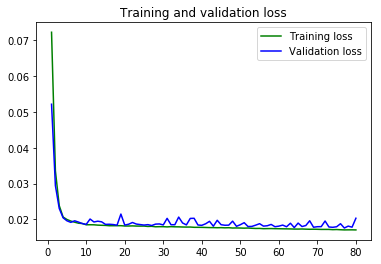

In [66]:
train_loss = history_mask.history['loss']
val_loss = history_mask.history['val_loss']
epochs = range(1, len(train_loss) + 1)
plt.figure()
plt.plot(epochs, train_loss, 'g', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [67]:
print('Train MAE = %f\nValidation MAE = %f' % ((train_loss[-1] * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min())),
                                               (val_loss[-1] * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min()))))

Train MAE = 1.813379
Validation MAE = 2.160164


In [69]:
as5_train_preds = model.predict_generator(gen_train, workers=4, use_multiprocessing=True)
as5_train_preds.shape

(18304, 1)

In [70]:
as5_train_preds_withnan = np.full((as5_train_split.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_train_split)):
    if as5_train_split[i, 0] > -1:
        as5_train_preds_withnan[i] = as5_train_preds[j]
        j += 1
as5_train_preds_withnan.shape

(20000, 1)

In [71]:
as5_val_preds = model.predict_generator(gen_val, workers=4, use_multiprocessing=True)
as5_val_preds.shape

(11223, 1)

In [72]:
as5_val_preds_withnan = np.full((as5_val_split.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_val_split)):
    if as5_val_split[i, 0] > -1:
        as5_val_preds_withnan[i] = as5_val_preds[j]
        j += 1
as5_val_preds_withnan.shape

(11616, 1)

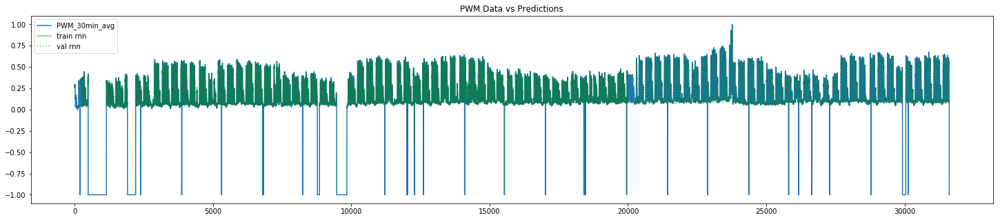

In [73]:
plt.figure(figsize=(25, 5))
plt.plot(range(as5_train_data.shape[0]), as5_train_data[:, 0], label='PWM_30min_avg')
plt.plot(range(as5_train_split.shape[0]), as5_train_preds_withnan.flatten(), color='green', alpha=.5, label='train rnn')
plt.plot(range(20000, 20000 + as5_val_split.shape[0]), as5_val_preds_withnan.flatten(), color='green', alpha=.5, label='val rnn', linestyle=':')
plt.title('PWM Data vs Predictions')
plt.legend()

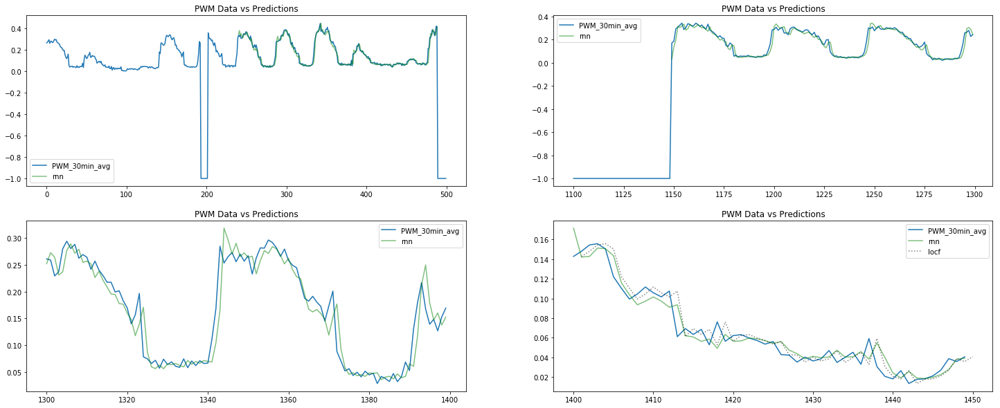

In [74]:
plt.figure(figsize=(25, 10))
plt.subplot(221)
plt.plot(range(500), as5_train_data[:500, 0], label='PWM_30min_avg')
plt.plot(range(500), as5_train_preds_withnan[:500, :].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Data vs Predictions')
plt.legend()
plt.subplot(222)
plt.plot(range(1100, 1300), as5_train_data[1100:1300, 0], label='PWM_30min_avg')
plt.plot(range(1100, 1300), as5_train_preds_withnan[1100:1300].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Data vs Predictions')
plt.legend()
plt.subplot(223)
plt.plot(range(1300, 1400), as5_train_data[1300:1400, 0], label='PWM_30min_avg')
plt.plot(range(1300, 1400), as5_train_preds_withnan[1300:1400].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Data vs Predictions')
plt.legend()
plt.subplot(224)
plt.plot(range(1400, 1450), as5_train_data[1400:1450, 0], label='PWM_30min_avg')
plt.plot(range(1400, 1450), as5_train_preds_withnan[1400:1450].flatten(), color='green', alpha=.5, label='rnn')
plt.plot(range(1401, 1451), as5_train_data[1400:1450, 0], color='black', alpha=.5, label='locf', linestyle=':')  ## locf is data with lag -1 
plt.title('PWM Data vs Predictions')
plt.legend()

In [75]:
model.save('base-rnn-mask-val.h5')

## Create the nested cross validation splits

In [57]:
# tscv = TimeSeriesSplit(n_splits=5)
# for train_idx, val_idx in tscv.split(as5_train_data):
#     print("%s %s" % (train_idx, val_idx))

## Nested cross validation

In [58]:
# histories = []
# i = 1
# for train_idx, val_idx in tscv.split(as5_train_data):
# 
#     print('5-fold Nested cross validation iteration', i)
#     gen_train = mu.generator(as5_train_data[train_idx],
#                                   lookback=lookback, delay=delay, min_index=0, max_index=len(train_idx)-1,
#                                   batch_size=batch_size, step=step)    
#     train_steps = ((len(train_idx) - lookback + 1 - delay) // batch_size) + 1
#     gen_val = mu.generator(as5_train_data[val_idx],
#                                   lookback=lookback, delay=delay, min_index=0, max_index=len(val_idx)-1,
#                                   batch_size=batch_size, step=step)    
#     val_steps = ((len(val_idx) - lookback + 1 - delay) // batch_size) + 1
#     history = model.fit_generator(gen_train, steps_per_epoch=train_steps, epochs=30,
#                                   validation_data=gen_val, validation_steps=val_steps, workers=0, use_multiprocessing=False)
#     histories.append(history)
#     i += 1

In [69]:
model1 = Sequential()
model1.add(layers.Masking(mask_value=-1.0, input_shape=(None, as5_train_split.shape[-1])))
model1.add(layers.GRU(16))
model1.add(layers.Dense(1))
model1.compile(optimizer=RMSprop(), loss='mae', metrics=['mape'])

In [70]:
model1.fit(np.ones((1, 240, 2)), np.ones((1, 1)), epochs=1, batch_size=1)

Epoch 1/1


1/1 [==============================] - 1s 838ms/step - loss: 0.8921 - mean_absolute_percentage_error: 89.2072


In [71]:
model1.evaluate(np.ones((1, 240, 2)) * -1.0, np.ones((1, 1)) * -1.0)

1/1 [==============================] - 0s 255ms/step


[1.0031622648239136, 100.31622314453125]

In [72]:
as5_train_split.shape

(20000, 2)

In [75]:
(as5_train_split[:, 0] == -1).sum()

1478

In [76]:
as5_train_df.iloc[:20000, :].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20000 entries, 2015-06-12 08:00:00 to 2016-08-01 23:30:00
Data columns (total 17 columns):
PWMMainIC                         18544 non-null float64
PWMEXTAS4ExBldg                   18544 non-null float64
PWMAS4LanguageCenter              18544 non-null float64
PWMCANTEEN                        18544 non-null float64
PWMStreetLight                    18544 non-null float64
BTUAS5                            18555 non-null float64
PWMMainIC_30min_avg               18522 non-null float64
PWMEXTAS4ExBldg_30min_avg         18522 non-null float64
PWMAS4LanguageCenter_30min_avg    18522 non-null float64
PWMCANTEEN_30min_avg              18522 non-null float64
PWMStreetLight_30min_avg          18522 non-null float64
BTUAS5_30min_avg                  18534 non-null float64
PWM_sumadd                        18522 non-null float64
PWM_sumsubtract                   18522 non-null float64
PWM_30min_avg                     18522 non-null float64
B